In [2]:
import random
import numpy as np 
import math

def sample_line(n, p):
    
    dir_vec = np.random.randn(3) ;
    line_point = p ;
    parameter = np.transpose(np.random.randn(n)[np.newaxis]) ;
    line_points = line_point + parameter*dir_vec ;
      
    return line_points

In [3]:
import numpy as np

#Outputs n sample points from a random plane and m sample points from a line intersecting said random plane.
def plane_line(n, m) :
    sample_p = sample_plane(n)
    
    #Construct a random line through point sample_p[0]
    line_point = sample_p[0] 
    dir_vec = np.random.randn(3) 
    parameter = np.transpose(np.random.random(m)[np.newaxis])
    sample_l = line_point + parameter*dir_vec
    
    #The first element is an array of the n sample points from the plane.
    #The second element is an array of the m sample points from the line.
    return [sample_p, sample_l]

In [4]:
import numpy as np 

# Outputs n sample points from a random plane in R^3 as a matrix of the form nx3.
def sample_plane(n):
    
    normal_vec = 2*(np.random.random(3)-1/2)
    point_plane = 2*(np.random.random(3)-1/2) 
    plane_points = [] 
    
    #Points on the plane must satisfy the equation (n1,n2,n3).(x-p1, y-p2, z-p3) = 0, where . operation 
    #represents the dot product and (n1,n2,n3) is the normal vector and (p1,p2,p3) is a point on the plane.
    #We randomly sample for x and y and solve for z using the above equation. 
    for int in range(n) :
        sample_2coord = 2*(np.random.random(2)-1/2) 
        last_coord = sample_2coord - point_plane[0:2] 
        last_coord = -(np.dot(normal_vec[0:2], last_coord)-
                       normal_vec[2]*point_plane[2])/normal_vec[2] 
        sample_2coord = np.append(sample_2coord, last_coord) 
        plane_points = np.append(plane_points,sample_2coord)
   
    plane_points = np.reshape(plane_points, (n,3))    
         
    return plane_points

In [5]:
import numpy as np


def sample_sphere(n, c):
    """
    Outputs sample points from a random sphere in R^3 centered at c as a matrix 
    of the form nx3
    :param n: No. of points to be sampled
    :param c: Vector - Coordinates for center of sphere [x,y,z]
    :return: Coordinates of the n points on the sphere [x,y,z]
    Note: We use the last construction found in http://mathworld.wolfram.com/SpherePointPicking.html
    """
    vec = 2*(np.random.random((3, n))-1/2)
    vec /= np.linalg.norm(vec, axis=0)
    recenter = np.repeat(c, n)
    recenter = np.reshape(recenter, (3, n))
    vec = vec + recenter
    
    return np.transpose(vec)


In [6]:
import numpy as np
from numpy import linalg as LA
#import sample_sphere as ss
#from sample_sphere import *

def plane_sphere(n, c, m) :
    """
    Constructs n sample points from a unit sphere centered at c and
    m sample points from a plane which intersects the unit sphere.
    If there are any k points from the m sample points that is contained
    in the unit sphere, we remove them and outputs only the m-k sample points.
    i.e. we do not produce any sample points inside the unit sphere. 
    """
    sphere = sample_sphere(n, c) 
    
    #We construct the plane containing the first 3 sample points 
    #sample_s[0:3] on the sphere. 
    plane_points = sphere[0:3]
    #Finding the normal vector
    vec1 = plane_points[1]-plane_points[0] 
    vec2 = plane_points[2]-plane_points[0] 
    #Normal vector 
    normal_vec = np.cross(vec1, vec2) 
    
    #Points on the plane must satisfy the equation 
    #(n1,n2,n3).(x-p1, y-p2, z-p3) = 0, where . operation 
    #represents the dot product and (n1,n2,n3) is the normal vector and 
    #(p1,p2,p3) is a point on the plane (we call it p0 in the code below).
    #We randomly sample for x and y and solve for z using the above equation. 
    p0=plane_points[0]
    for int in range(m) :
        sample_coord = 2*(np.random.random(2)-1/2) 
        first_coords = sample_coord - p0[0:2]
        last_coord = -(np.dot(normal_vec[0:2], first_coords)-
                       normal_vec[2]*p0[2])/normal_vec[2] 
        sample_coord = np.append(sample_coord, last_coord) 
        plane_points = np.append(plane_points,sample_coord)
    
    plane_points = np.reshape(plane_points, (m+3,3))
    
    #We remove any points on the plane that is inside the unit sphere.
    relevant_points = []
    for i in range(m+3) :
        if LA.norm(plane_points[i]-c)>=1 :
            relevant_points = np.append(relevant_points, plane_points[i])
        
    relevant_points =np.reshape(relevant_points, (-1,3))
    
    return [sphere, relevant_points]

In [7]:
import numpy as np
from numpy import linalg as LA
def line_plane_sphere(k, n, c, m) :
    
    ps = plane_sphere(n, c, m) 
    plane = ps[0] 
    sphere = ps[1] 
    #combin_ps = np.reshape(np.append(sphere, plane), (-1,3)) 
    plane_tup = list(tuple(row) for row in plane)
    sphere_tup = list(tuple(row) for row in sphere)
    intersection = np.array([list(item) for item in 
                    set(plane_tup).intersection(sphere_tup)]) 
    if len(intersection) == 0 :
        return ["intersection empty", intersection]
    line = sample_line(k, intersection[0])
    
    #We remove any points on the plane that is inside the unit sphere.
    rel_line_pts = []
    for i in range(k) :
        if LA.norm(line[i]-c)>=1 :
            rel_line_pts = np.append(rel_line_pts, line[i])
        
    rel_line_pts =np.reshape(rel_line_pts, (-1,3))
    
    return [rel_line_pts, plane, sphere]

In [8]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
#%matplotlib inline

def plot_objects(X) :
    fig = plt.figure() 
    ax = fig.add_subplot(111, projection='3d')
    if len(X)==2 :
        A = X[0]
        B = X[1]
        ax.scatter(A[:,0],A[:,1], A[:,2]) 
        ax.scatter(B[:,0],B[:,1], B[:,2], color = 'c')
        plt.show()
    else:
        if len(X)==3 :
            A = X[0]
            B = X[1]
            C = X[2]
            ax.scatter(A[:,0],A[:,1], A[:,2]) 
            ax.scatter(B[:,0],B[:,1], B[:,2], color = 'c')
            ax.scatter(C[:,0],C[:,1], C[:,2], color = 'r')
            plt.show()
        else:
            ax.scatter(X[:,0],X[:,1], X[:,2])
            plt.show()

In [9]:
import numpy as np
import scipy.spatial as spatial

def neighborhood(data, point, rad) :
    coord_set = list(tuple(row) for row in data)
    tree = spatial.cKDTree(coord_set)
    
    return tree.data[tree.query_ball_point(point, rad)]

In [64]:
line,plane,sphere = line_plane_sphere(50, 60000, [0,0,0], 20000)
sphere_plane=np.concatenate((sphere, plane,line), axis=0)
len(sphere_plane)
sphere_plane=np.asarray(sphere_plane,dtype=np.float32)

## plot objects

In [12]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
#%matplotlib inline

def plot_objects(X) :
    fig = plt.figure() 
    ax = fig.add_subplot(111, projection='3d')
    if len(X)==2 :
        A = X[0]
        B = X[1]
        ax.scatter(A[:,0],A[:,1], A[:,2]) 
        ax.scatter(B[:,0],B[:,1], B[:,2], color = 'c')
        plt.show()
    else:
        if len(X)==3 :
            A = X[0]
            B = X[1]
            C = X[2]
            ax.scatter(A[:,0],A[:,1], A[:,2]) 
            ax.scatter(B[:,0],B[:,1], B[:,2], color = 'c')
            ax.scatter(C[:,0],C[:,1], C[:,2], color = 'r')
            plt.show()
        else:
            ax.scatter(X[:,0],X[:,1], X[:,2])
            plt.show()

### Center Data

In [13]:
def center_data(data):
    mean = data.mean(axis=0)
    new_data = data - mean[np.newaxis,:]
    return new_data

### Neighbourhoods

In [14]:
import scipy.spatial as spatial

def neighborhood(data, point, rad) :
    coord_set = list(tuple(row) for row in data)
    tree = spatial.cKDTree(coord_set)
    return tree.data[tree.query_ball_point(point, rad)]

## Intrinsic Dimension

In [67]:
import math
import numpy.linalg as ln
import time
from __future__ import print_function
import torch
import torch.cuda
dtype = torch.cuda.FloatTensor

def intrinsic_dimension(data, K, thresh):
    start_time=time.clock()
    output = [[]]
    dim_data = data.shape[1]
    K_check = round(K * math.log(K,2))
    count=0
    for p in data:
        count=count+1
        print(count)
        rad = 1 #radius
        int_dim = 3 #default intrinsic dimension
        int_dim_rad = rad  #dimension of the intrinsic dimension
        subset = neighborhood(data,p,rad)
        cardinality=subset.shape[0]
        while(cardinality>K_check and rad > 0.06):
            subset_centered = center_data(subset)
            subset_centered =torch.from_numpy(subset_centered)
            subset_centered.type(torch.cuda.FloatTensor)
            _,D,_ = torch.svd(subset_centered)
            D=D.numpy()
            #print(type(torch.svd(subset_centered)))
            D_sq = D**2
            TV = np.sum(D_sq)
            CRV = np.cumsum(D_sq)/TV
            i, = np.where(CRV >= thresh) #returns all positions with CRV>=threshaold
            i = i[0]+1 #take only the first position of the i array
            if i < int_dim: 
                int_dim = i
                int_dim_rad = rad
                int_dim_card=cardinality
            rad = rad/2
            subset = neighborhood(subset,p,rad)
            cardinality=subset.shape[0]
        output.append([p,int_dim_rad,int_dim])
        end_time=time.clock()
        time_elap=end_time-start_time
        print('Rate='+str(time_elap/count)+'Ops per Sec')
    end_time=time.clock()
    time_elap=end_time-start_time
    print(time_elap)
    return output

In [69]:
type(sphere_plane[0][0])

numpy.float32

In [72]:
idim = intrinsic_dimension(sphere_plane,10,0.95)

1
Rate=0.264779747247303Ops per Sec
2
Rate=0.22521393571787485Ops per Sec
3
Rate=0.21825018538280952Ops per Sec
4
Rate=0.20691764664979928Ops per Sec
5
Rate=0.20253052739535632Ops per Sec
6
Rate=0.19835244838759536Ops per Sec
7
Rate=0.19483223343481118Ops per Sec
8
Rate=0.1923218993294995Ops per Sec
9
Rate=0.193646233511471Ops per Sec
10
Rate=0.19302807189014856Ops per Sec
11
Rate=0.19258885320844207Ops per Sec
12
Rate=0.19161641812676558Ops per Sec
13
Rate=0.19105916098711673Ops per Sec
14
Rate=0.18975642591625988Ops per Sec
15
Rate=0.1889523665043574Ops per Sec
16
Rate=0.187957777596921Ops per Sec
17
Rate=0.18983700851758306Ops per Sec
18
Rate=0.18899890475758083Ops per Sec
19
Rate=0.1904888344267276Ops per Sec
20
Rate=0.19471046134895004Ops per Sec
21
Rate=0.20010656879977823Ops per Sec
22
Rate=0.20204043196603874Ops per Sec
23
Rate=0.20174001262445096Ops per Sec
24
Rate=0.2009658465319717Ops per Sec
25
Rate=0.19986509437425412Ops per Sec
26
Rate=0.19959495248671233Ops per Sec
27
Ra

Rate=0.19233226875527354Ops per Sec
211
Rate=0.19221595729669427Ops per Sec
212
Rate=0.19228058371584855Ops per Sec
213
Rate=0.19220233477938908Ops per Sec
214
Rate=0.1922131429401416Ops per Sec
215
Rate=0.19223455764721473Ops per Sec
216
Rate=0.1922335262506749Ops per Sec
217
Rate=0.19215722783524625Ops per Sec
218
Rate=0.19210683904534687Ops per Sec
219
Rate=0.19207761417892968Ops per Sec
220
Rate=0.1920318684677692Ops per Sec
221
Rate=0.1919613761493314Ops per Sec
222
Rate=0.19209446131470292Ops per Sec
223
Rate=0.1920206870254333Ops per Sec
224
Rate=0.1920943985376604Ops per Sec
225
Rate=0.1922058688679115Ops per Sec
226
Rate=0.19214342589417613Ops per Sec
227
Rate=0.19208977368031013Ops per Sec
228
Rate=0.19199409005907733Ops per Sec
229
Rate=0.19193243935085488Ops per Sec
230
Rate=0.19197315099719045Ops per Sec
231
Rate=0.1918991971290177Ops per Sec
232
Rate=0.19183665133059863Ops per Sec
233
Rate=0.19178799480891842Ops per Sec
234
Rate=0.19176682937901735Ops per Sec
235
Rate=0.1

Rate=0.1907862779857839Ops per Sec
419
Rate=0.19086566748793737Ops per Sec
420
Rate=0.19091288683512175Ops per Sec
421
Rate=0.19091641852068789Ops per Sec
422
Rate=0.19103374583933813Ops per Sec
423
Rate=0.19107250916856408Ops per Sec
424
Rate=0.19123853893767584Ops per Sec
425
Rate=0.1912213442378989Ops per Sec
426
Rate=0.19119709782649644Ops per Sec
427
Rate=0.19116475750787254Ops per Sec
428
Rate=0.19114903813380602Ops per Sec
429
Rate=0.19114770634908304Ops per Sec
430
Rate=0.19161259843269024Ops per Sec
431
Rate=0.19159840959797048Ops per Sec
432
Rate=0.191577258562983Ops per Sec
433
Rate=0.19157004515169448Ops per Sec
434
Rate=0.19153815087666198Ops per Sec
435
Rate=0.19158599316369979Ops per Sec
436
Rate=0.1916141211518778Ops per Sec
437
Rate=0.19158288467680543Ops per Sec
438
Rate=0.19157132563662896Ops per Sec
439
Rate=0.19155017579524405Ops per Sec
440
Rate=0.1915273155806765Ops per Sec
441
Rate=0.19151186275256993Ops per Sec
442
Rate=0.19149646733349812Ops per Sec
443
Rate=0

625
Rate=0.1912184038643347Ops per Sec
626
Rate=0.19126336403211336Ops per Sec
627
Rate=0.19124653983951292Ops per Sec
628
Rate=0.19135855175077587Ops per Sec
629
Rate=0.19137390166688362Ops per Sec
630
Rate=0.19135592863539863Ops per Sec
631
Rate=0.1913386417892458Ops per Sec
632
Rate=0.19135697331607612Ops per Sec
633
Rate=0.19133873586961014Ops per Sec
634
Rate=0.19139163837376763Ops per Sec
635
Rate=0.19141612330950442Ops per Sec
636
Rate=0.1913932052326551Ops per Sec
637
Rate=0.19137531815813788Ops per Sec
638
Rate=0.19135796085831264Ops per Sec
639
Rate=0.1913407326931481Ops per Sec
640
Rate=0.19132969848703282Ops per Sec
641
Rate=0.19133600930867495Ops per Sec
642
Rate=0.19131041678625377Ops per Sec
643
Rate=0.19131397007706544Ops per Sec
644
Rate=0.19134546416595039Ops per Sec
645
Rate=0.1914094430722368Ops per Sec
646
Rate=0.19140608178063429Ops per Sec
647
Rate=0.191384036590242Ops per Sec
648
Rate=0.19135207133294224Ops per Sec
649
Rate=0.19139066311321548Ops per Sec
650
Rat

Rate=0.19035606630605806Ops per Sec
834
Rate=0.19044326739275277Ops per Sec
835
Rate=0.19042240402030478Ops per Sec
836
Rate=0.19040836945766548Ops per Sec
837
Rate=0.19038481568112356Ops per Sec
838
Rate=0.19036844195586056Ops per Sec
839
Rate=0.19040072149562784Ops per Sec
840
Rate=0.190401626837218Ops per Sec
841
Rate=0.19038558559538413Ops per Sec
842
Rate=0.19037278611471256Ops per Sec
843
Rate=0.19040233404663845Ops per Sec
844
Rate=0.1903921138887393Ops per Sec
845
Rate=0.19038244482516772Ops per Sec
846
Rate=0.1904094169984556Ops per Sec
847
Rate=0.19046196343986652Ops per Sec
848
Rate=0.1904550046560249Ops per Sec
849
Rate=0.19045802395899972Ops per Sec
850
Rate=0.19044322259904542Ops per Sec
851
Rate=0.19042620589159595Ops per Sec
852
Rate=0.19041058124160803Ops per Sec
853
Rate=0.19039493857524944Ops per Sec
854
Rate=0.1903803447145736Ops per Sec
855
Rate=0.19037432016978673Ops per Sec
856
Rate=0.19035749858266018Ops per Sec
857
Rate=0.19039358627780323Ops per Sec
858
Rate=0

Rate=0.18988913447874614Ops per Sec
1041
Rate=0.1898748158452833Ops per Sec
1042
Rate=0.18987629720580915Ops per Sec
1043
Rate=0.1898624092320612Ops per Sec
1044
Rate=0.18984840747297246Ops per Sec
1045
Rate=0.18983426465759481Ops per Sec
1046
Rate=0.18982865743756464Ops per Sec
1047
Rate=0.1898304033384297Ops per Sec
1048
Rate=0.18983611197879627Ops per Sec
1049
Rate=0.18985411577136302Ops per Sec
1050
Rate=0.1898390584997954Ops per Sec
1051
Rate=0.18983179052962107Ops per Sec
1052
Rate=0.189816664061538Ops per Sec
1053
Rate=0.1898086492937029Ops per Sec
1054
Rate=0.1898221787157387Ops per Sec
1055
Rate=0.18984235247700168Ops per Sec
1056
Rate=0.18982760775983734Ops per Sec
1057
Rate=0.1898455831279184Ops per Sec
1058
Rate=0.18983721408750776Ops per Sec
1059
Rate=0.18982685980423356Ops per Sec
1060
Rate=0.1898211655400186Ops per Sec
1061
Rate=0.1898019058173131Ops per Sec
1062
Rate=0.18979955878556404Ops per Sec
1063
Rate=0.18980702692733364Ops per Sec
1064
Rate=0.18979357098659166Ops

Rate=0.18874347677560374Ops per Sec
1243
Rate=0.18873009645194938Ops per Sec
1244
Rate=0.18873018974066758Ops per Sec
1245
Rate=0.18874046785244444Ops per Sec
1246
Rate=0.18872888249808695Ops per Sec
1247
Rate=0.18871822180035094Ops per Sec
1248
Rate=0.18873860476550164Ops per Sec
1249
Rate=0.18872805931576825Ops per Sec
1250
Rate=0.18871818148417516Ops per Sec
1251
Rate=0.18871893273730372Ops per Sec
1252
Rate=0.1887364962574549Ops per Sec
1253
Rate=0.1887310778146147Ops per Sec
1254
Rate=0.18871929725197475Ops per Sec
1255
Rate=0.18873444938689213Ops per Sec
1256
Rate=0.18872154249138648Ops per Sec
1257
Rate=0.18870756994830545Ops per Sec
1258
Rate=0.18870723762391292Ops per Sec
1259
Rate=0.18872972212374017Ops per Sec
1260
Rate=0.18873085955684574Ops per Sec
1261
Rate=0.1887516232609277Ops per Sec
1262
Rate=0.18877234842418858Ops per Sec
1263
Rate=0.1887745316802875Ops per Sec
1264
Rate=0.18876201544141674Ops per Sec
1265
Rate=0.18876732393206191Ops per Sec
1266
Rate=0.1887604058367

Rate=0.18839242706099965Ops per Sec
1445
Rate=0.18838830187470607Ops per Sec
1446
Rate=0.18837713467046732Ops per Sec
1447
Rate=0.18837279204813884Ops per Sec
1448
Rate=0.1883677296892511Ops per Sec
1449
Rate=0.188382116036586Ops per Sec
1450
Rate=0.18837390763261472Ops per Sec
1451
Rate=0.18836269217434987Ops per Sec
1452
Rate=0.18835796769152274Ops per Sec
1453
Rate=0.1883740794895086Ops per Sec
1454
Rate=0.18836183582030344Ops per Sec
1455
Rate=0.18835260276019464Ops per Sec
1456
Rate=0.1883480232710014Ops per Sec
1457
Rate=0.18833740565305693Ops per Sec
1458
Rate=0.1883308984507233Ops per Sec
1459
Rate=0.1883185324616417Ops per Sec
1460
Rate=0.1883096201773597Ops per Sec
1461
Rate=0.1883002322828735Ops per Sec
1462
Rate=0.188295338288417Ops per Sec
1463
Rate=0.188282291599168Ops per Sec
1464
Rate=0.18827690166973382Ops per Sec
1465
Rate=0.18826867303724448Ops per Sec
1466
Rate=0.18825877001671215Ops per Sec
1467
Rate=0.18826917675184662Ops per Sec
1468
Rate=0.18825955545732023Ops p

Rate=0.18774302560728875Ops per Sec
1648
Rate=0.18773566717286772Ops per Sec
1649
Rate=0.18773029105442143Ops per Sec
1650
Rate=0.1877432264508609Ops per Sec
1651
Rate=0.18773537015026398Ops per Sec
1652
Rate=0.1877298698162212Ops per Sec
1653
Rate=0.18775220300284118Ops per Sec
1654
Rate=0.18774633441534896Ops per Sec
1655
Rate=0.18773700974561178Ops per Sec
1656
Rate=0.1877299569676606Ops per Sec
1657
Rate=0.1877200304457191Ops per Sec
1658
Rate=0.18771659581310468Ops per Sec
1659
Rate=0.18771124621246882Ops per Sec
1660
Rate=0.1877043104354235Ops per Sec
1661
Rate=0.18769977312032463Ops per Sec
1662
Rate=0.18768827634403515Ops per Sec
1663
Rate=0.18768060171183273Ops per Sec
1664
Rate=0.1876709120882247Ops per Sec
1665
Rate=0.18767095712669274Ops per Sec
1666
Rate=0.1876596788306961Ops per Sec
1667
Rate=0.18765343303054338Ops per Sec
1668
Rate=0.18765826212772396Ops per Sec
1669
Rate=0.1876512174949421Ops per Sec
1670
Rate=0.18764256580454816Ops per Sec
1671
Rate=0.18765853602502136

Rate=0.18733574864013094Ops per Sec
1851
Rate=0.18732994206716974Ops per Sec
1852
Rate=0.18732448008427274Ops per Sec
1853
Rate=0.18731967127509472Ops per Sec
1854
Rate=0.18731912298221465Ops per Sec
1855
Rate=0.1873360240107386Ops per Sec
1856
Rate=0.18734351283321443Ops per Sec
1857
Rate=0.187337968046355Ops per Sec
1858
Rate=0.18733309709048224Ops per Sec
1859
Rate=0.18734296128505204Ops per Sec
1860
Rate=0.18733315185139265Ops per Sec
1861
Rate=0.18732638565711457Ops per Sec
1862
Rate=0.18732297159928937Ops per Sec
1863
Rate=0.18731399599139048Ops per Sec
1864
Rate=0.18731015034257992Ops per Sec
1865
Rate=0.18730519226575376Ops per Sec
1866
Rate=0.18729719799471858Ops per Sec
1867
Rate=0.18729191973940845Ops per Sec
1868
Rate=0.18728521345096763Ops per Sec
1869
Rate=0.18727971093788237Ops per Sec
1870
Rate=0.18729579607988076Ops per Sec
1871
Rate=0.18730216971082014Ops per Sec
1872
Rate=0.18729458950818387Ops per Sec
1873
Rate=0.18728997203000552Ops per Sec
1874
Rate=0.187285243744

Rate=0.18693846109512027Ops per Sec
2054
Rate=0.18693437715735176Ops per Sec
2055
Rate=0.18693323987426108Ops per Sec
2056
Rate=0.186928121953361Ops per Sec
2057
Rate=0.18692415923887815Ops per Sec
2058
Rate=0.1869218036573781Ops per Sec
2059
Rate=0.1869198135750141Ops per Sec
2060
Rate=0.18691330062732323Ops per Sec
2061
Rate=0.18691724482561997Ops per Sec
2062
Rate=0.18691094137819228Ops per Sec
2063
Rate=0.1869070666902629Ops per Sec
2064
Rate=0.18690154258497793Ops per Sec
2065
Rate=0.18690859616225686Ops per Sec
2066
Rate=0.18690323117047078Ops per Sec
2067
Rate=0.1869001545848405Ops per Sec
2068
Rate=0.18689628855906135Ops per Sec
2069
Rate=0.1868914285919255Ops per Sec
2070
Rate=0.18689069646543913Ops per Sec
2071
Rate=0.18688480101323046Ops per Sec
2072
Rate=0.18687901020767206Ops per Sec
2073
Rate=0.18688195140935387Ops per Sec
2074
Rate=0.1868750002826286Ops per Sec
2075
Rate=0.18686848709166995Ops per Sec
2076
Rate=0.1868642835595039Ops per Sec
2077
Rate=0.1868726427343373Op

Rate=0.1867290413820168Ops per Sec
2256
Rate=0.18673053755991717Ops per Sec
2257
Rate=0.18672446497870648Ops per Sec
2258
Rate=0.18672453592730293Ops per Sec
2259
Rate=0.18672961127610183Ops per Sec
2260
Rate=0.18672921437639675Ops per Sec
2261
Rate=0.18672805234137582Ops per Sec
2262
Rate=0.18672210239112855Ops per Sec
2263
Rate=0.186719443885396Ops per Sec
2264
Rate=0.18671270850803562Ops per Sec
2265
Rate=0.18670733048512067Ops per Sec
2266
Rate=0.1867024828535055Ops per Sec
2267
Rate=0.18671475331495335Ops per Sec
2268
Rate=0.18671039232535652Ops per Sec
2269
Rate=0.18670856259876623Ops per Sec
2270
Rate=0.18670434061998478Ops per Sec
2271
Rate=0.18671624229798792Ops per Sec
2272
Rate=0.18671571827193278Ops per Sec
2273
Rate=0.1867211390540115Ops per Sec
2274
Rate=0.18671499543483042Ops per Sec
2275
Rate=0.18671784933898Ops per Sec
2276
Rate=0.18670994867289922Ops per Sec
2277
Rate=0.18670973374963773Ops per Sec
2278
Rate=0.18670386571518766Ops per Sec
2279
Rate=0.186703843466444Op

Rate=0.186375730487318Ops per Sec
2458
Rate=0.18637974607537328Ops per Sec
2459
Rate=0.18639066771743543Ops per Sec
2460
Rate=0.18638680565909158Ops per Sec
2461
Rate=0.18638356798612063Ops per Sec
2462
Rate=0.18638761671048343Ops per Sec
2463
Rate=0.1863836229730299Ops per Sec
2464
Rate=0.18638275224513384Ops per Sec
2465
Rate=0.18637860457494115Ops per Sec
2466
Rate=0.18637381993566376Ops per Sec
2467
Rate=0.1863706405598648Ops per Sec
2468
Rate=0.186363718679287Ops per Sec
2469
Rate=0.18635953023469393Ops per Sec
2470
Rate=0.18635516540454722Ops per Sec
2471
Rate=0.18635909288593994Ops per Sec
2472
Rate=0.18635203633189754Ops per Sec
2473
Rate=0.18634608280698864Ops per Sec
2474
Rate=0.18634075798564262Ops per Sec
2475
Rate=0.18633986423186302Ops per Sec
2476
Rate=0.18633719023181392Ops per Sec
2477
Rate=0.18634433129284678Ops per Sec
2478
Rate=0.1863395297682352Ops per Sec
2479
Rate=0.18633474725689478Ops per Sec
2480
Rate=0.18633736676755572Ops per Sec
2481
Rate=0.1863370728764642

Rate=0.18616241163025823Ops per Sec
2661
Rate=0.18615887986136734Ops per Sec
2662
Rate=0.18615604870784586Ops per Sec
2663
Rate=0.18615653801979765Ops per Sec
2664
Rate=0.18616638876695069Ops per Sec
2665
Rate=0.18616140612028492Ops per Sec
2666
Rate=0.18616414424886094Ops per Sec
2667
Rate=0.186160080584159Ops per Sec
2668
Rate=0.18615759813893437Ops per Sec
2669
Rate=0.1861638300751635Ops per Sec
2670
Rate=0.18616187720131863Ops per Sec
2671
Rate=0.18615949774475452Ops per Sec
2672
Rate=0.18615610107058422Ops per Sec
2673
Rate=0.18615374669028248Ops per Sec
2674
Rate=0.18615750408079032Ops per Sec
2675
Rate=0.1861501834985311Ops per Sec
2676
Rate=0.18614881896558516Ops per Sec
2677
Rate=0.1861421173246336Ops per Sec
2678
Rate=0.18614282580654629Ops per Sec
2679
Rate=0.18613792945943333Ops per Sec
2680
Rate=0.1861342207717398Ops per Sec
2681
Rate=0.18612839380769494Ops per Sec
2682
Rate=0.18612772643307438Ops per Sec
2683
Rate=0.18612540495031432Ops per Sec
2684
Rate=0.186123163356027

Rate=0.1860679111231949Ops per Sec
2864
Rate=0.18606499401474014Ops per Sec
2865
Rate=0.1860620942487111Ops per Sec
2866
Rate=0.18605805970485456Ops per Sec
2867
Rate=0.18605421909873407Ops per Sec
2868
Rate=0.1860500245410101Ops per Sec
2869
Rate=0.18604570126605083Ops per Sec
2870
Rate=0.18604454397414308Ops per Sec
2871
Rate=0.18604117164847897Ops per Sec
2872
Rate=0.18603791350446852Ops per Sec
2873
Rate=0.18603579069761234Ops per Sec
2874
Rate=0.18603073431070113Ops per Sec
2875
Rate=0.18602766224564718Ops per Sec
2876
Rate=0.18602286509016144Ops per Sec
2877
Rate=0.18601904649623205Ops per Sec
2878
Rate=0.1860137242979094Ops per Sec
2879
Rate=0.18601020587245967Ops per Sec
2880
Rate=0.1860161210251811Ops per Sec
2881
Rate=0.1860128264924539Ops per Sec
2882
Rate=0.18601126390836792Ops per Sec
2883
Rate=0.18601319355766552Ops per Sec
2884
Rate=0.18601099207812183Ops per Sec
2885
Rate=0.18600724323688397Ops per Sec
2886
Rate=0.18600193782820867Ops per Sec
2887
Rate=0.185997823469093

Rate=0.18585520126506738Ops per Sec
3067
Rate=0.18585106256499204Ops per Sec
3068
Rate=0.18584854878769663Ops per Sec
3069
Rate=0.18584586325400315Ops per Sec
3070
Rate=0.18584359048830054Ops per Sec
3071
Rate=0.18583972802182994Ops per Sec
3072
Rate=0.18584161382388883Ops per Sec
3073
Rate=0.18583755190559922Ops per Sec
3074
Rate=0.18583532759725344Ops per Sec
3075
Rate=0.18583085449059078Ops per Sec
3076
Rate=0.18582909796460922Ops per Sec
3077
Rate=0.18583788470274662Ops per Sec
3078
Rate=0.18583820964262399Ops per Sec
3079
Rate=0.1858357876734529Ops per Sec
3080
Rate=0.18583115929325378Ops per Sec
3081
Rate=0.18582888620721344Ops per Sec
3082
Rate=0.1858242999866377Ops per Sec
3083
Rate=0.18582338903267906Ops per Sec
3084
Rate=0.18582109774738415Ops per Sec
3085
Rate=0.18582701511157954Ops per Sec
3086
Rate=0.18582267227398716Ops per Sec
3087
Rate=0.18581805966137893Ops per Sec
3088
Rate=0.1858131786872517Ops per Sec
3089
Rate=0.18581016325166916Ops per Sec
3090
Rate=0.185809915454

Rate=0.18557877245269166Ops per Sec
3270
Rate=0.18558058774813044Ops per Sec
3271
Rate=0.18557685549139047Ops per Sec
3272
Rate=0.18558184850447557Ops per Sec
3273
Rate=0.18558011529831084Ops per Sec
3274
Rate=0.18557854979112087Ops per Sec
3275
Rate=0.18557806209940275Ops per Sec
3276
Rate=0.18558313619797068Ops per Sec
3277
Rate=0.18558124063792433Ops per Sec
3278
Rate=0.1855886363278362Ops per Sec
3279
Rate=0.1855869775967891Ops per Sec
3280
Rate=0.18559207386425752Ops per Sec
3281
Rate=0.1855982008559335Ops per Sec
3282
Rate=0.1855937616937908Ops per Sec
3283
Rate=0.18559802669875755Ops per Sec
3284
Rate=0.18559495893368855Ops per Sec
3285
Rate=0.18559925416993184Ops per Sec
3286
Rate=0.18559742646340785Ops per Sec
3287
Rate=0.18559554133687334Ops per Sec
3288
Rate=0.18559320870740179Ops per Sec
3289
Rate=0.18559043270677092Ops per Sec
3290
Rate=0.18558674122641688Ops per Sec
3291
Rate=0.18558310660901556Ops per Sec
3292
Rate=0.18557915498233435Ops per Sec
3293
Rate=0.1855762337795

3471
Rate=0.18558109119703306Ops per Sec
3472
Rate=0.18558409952233082Ops per Sec
3473
Rate=0.1855805360126317Ops per Sec
3474
Rate=0.18557833088704104Ops per Sec
3475
Rate=0.18557620467866065Ops per Sec
3476
Rate=0.18557731281117895Ops per Sec
3477
Rate=0.1855741649579996Ops per Sec
3478
Rate=0.18558119135289775Ops per Sec
3479
Rate=0.18557905711466208Ops per Sec
3480
Rate=0.1855856541690847Ops per Sec
3481
Rate=0.1855818382814216Ops per Sec
3482
Rate=0.18557955309487212Ops per Sec
3483
Rate=0.18558335484743016Ops per Sec
3484
Rate=0.18558708989690634Ops per Sec
3485
Rate=0.1855850742885823Ops per Sec
3486
Rate=0.18558202730482312Ops per Sec
3487
Rate=0.1855870691048318Ops per Sec
3488
Rate=0.18558433216466727Ops per Sec
3489
Rate=0.18558066332031214Ops per Sec
3490
Rate=0.18557715256550866Ops per Sec
3491
Rate=0.18557482323528712Ops per Sec
3492
Rate=0.18557246933162913Ops per Sec
3493
Rate=0.18557713627229774Ops per Sec
3494
Rate=0.1855730615851059Ops per Sec
3495
Rate=0.18557934413

Rate=0.1854160154069298Ops per Sec
3675
Rate=0.18541852031504827Ops per Sec
3676
Rate=0.1854167729720109Ops per Sec
3677
Rate=0.18541195075053885Ops per Sec
3678
Rate=0.18541744442802519Ops per Sec
3679
Rate=0.18541466384619562Ops per Sec
3680
Rate=0.18541154092168832Ops per Sec
3681
Rate=0.18541463324727098Ops per Sec
3682
Rate=0.185422647570637Ops per Sec
3683
Rate=0.18541962510159987Ops per Sec
3684
Rate=0.1854155223580611Ops per Sec
3685
Rate=0.18541385096068058Ops per Sec
3686
Rate=0.18542021385326815Ops per Sec
3687
Rate=0.18541795555169796Ops per Sec
3688
Rate=0.1854164325737605Ops per Sec
3689
Rate=0.18541342859256443Ops per Sec
3690
Rate=0.18541189299930944Ops per Sec
3691
Rate=0.18540987069939666Ops per Sec
3692
Rate=0.18540782456287833Ops per Sec
3693
Rate=0.18541420312867893Ops per Sec
3694
Rate=0.18541179448435782Ops per Sec
3695
Rate=0.18540995284627948Ops per Sec
3696
Rate=0.18540833688533848Ops per Sec
3697
Rate=0.1854056926295424Ops per Sec
3698
Rate=0.1854026227997621

Rate=0.18663009728671562Ops per Sec
3876
Rate=0.18663542922968332Ops per Sec
3877
Rate=0.1866398460204182Ops per Sec
3878
Rate=0.1866450046100557Ops per Sec
3879
Rate=0.18666157729996502Ops per Sec
3880
Rate=0.18666573325563993Ops per Sec
3881
Rate=0.18667684192450612Ops per Sec
3882
Rate=0.18669441891373462Ops per Sec
3883
Rate=0.186701519600207Ops per Sec
3884
Rate=0.1867075219720522Ops per Sec
3885
Rate=0.18671326855683137Ops per Sec
3886
Rate=0.18671878334110384Ops per Sec
3887
Rate=0.18672705268953563Ops per Sec
3888
Rate=0.18673303612070893Ops per Sec
3889
Rate=0.18673768978304728Ops per Sec
3890
Rate=0.18674118196850967Ops per Sec
3891
Rate=0.18675148729800256Ops per Sec
3892
Rate=0.1867579632941781Ops per Sec
3893
Rate=0.18676152734409657Ops per Sec
3894
Rate=0.18676764457905265Ops per Sec
3895
Rate=0.18677342781521078Ops per Sec
3896
Rate=0.18677842495614427Ops per Sec
3897
Rate=0.18678269388434587Ops per Sec
3898
Rate=0.1867886276239597Ops per Sec
3899
Rate=0.1868025885365183

Rate=0.1881004320281046Ops per Sec
4078
Rate=0.18810790531751465Ops per Sec
4079
Rate=0.18811765223677765Ops per Sec
4080
Rate=0.18812263591959766Ops per Sec
4081
Rate=0.18812733468278195Ops per Sec
4082
Rate=0.18814238897686467Ops per Sec
4083
Rate=0.1881550233410352Ops per Sec
4084
Rate=0.1881718961082428Ops per Sec
4085
Rate=0.18817576294381494Ops per Sec
4086
Rate=0.1881800921758628Ops per Sec
4087
Rate=0.18818436090493654Ops per Sec
4088
Rate=0.18819336480544302Ops per Sec
4089
Rate=0.18819993760560394Ops per Sec
4090
Rate=0.18821344887749042Ops per Sec
4091
Rate=0.18821566295273595Ops per Sec
4092
Rate=0.18822142985872173Ops per Sec
4093
Rate=0.18822446490428535Ops per Sec
4094
Rate=0.18822800652754484Ops per Sec
4095
Rate=0.18823266146909667Ops per Sec
4096
Rate=0.18824571102870058Ops per Sec
4097
Rate=0.18825521640642853Ops per Sec
4098
Rate=0.18825925559723283Ops per Sec
4099
Rate=0.1882622167346493Ops per Sec
4100
Rate=0.18826564057677786Ops per Sec
4101
Rate=0.18826937323035

4280
Rate=0.18954605226656462Ops per Sec
4281
Rate=0.18954950099127268Ops per Sec
4282
Rate=0.18955250783572083Ops per Sec
4283
Rate=0.1895569028634283Ops per Sec
4284
Rate=0.18956966765879762Ops per Sec
4285
Rate=0.18958114902295653Ops per Sec
4286
Rate=0.18959310360152395Ops per Sec
4287
Rate=0.18960660630907467Ops per Sec
4288
Rate=0.18961147613285334Ops per Sec
4289
Rate=0.1896244048209163Ops per Sec
4290
Rate=0.1896277934210957Ops per Sec
4291
Rate=0.18963182123156214Ops per Sec
4292
Rate=0.18963453679781533Ops per Sec
4293
Rate=0.18964498088858703Ops per Sec
4294
Rate=0.18964799941591684Ops per Sec
4295
Rate=0.1896517643491903Ops per Sec
4296
Rate=0.18966586948023284Ops per Sec
4297
Rate=0.18966997787034698Ops per Sec
4298
Rate=0.18967889512872324Ops per Sec
4299
Rate=0.18968925450026738Ops per Sec
4300
Rate=0.18970113509366562Ops per Sec
4301
Rate=0.1897057596206936Ops per Sec
4302
Rate=0.18971045381045884Ops per Sec
4303
Rate=0.18971696780234382Ops per Sec
4304
Rate=0.189722298

Rate=0.1908764771010849Ops per Sec
4483
Rate=0.19088630655787167Ops per Sec
4484
Rate=0.19089333844642842Ops per Sec
4485
Rate=0.19091301841849664Ops per Sec
4486
Rate=0.19092766407410702Ops per Sec
4487
Rate=0.19093049335236217Ops per Sec
4488
Rate=0.19093367021761729Ops per Sec
4489
Rate=0.19093696826064918Ops per Sec
4490
Rate=0.19094294245461266Ops per Sec
4491
Rate=0.19094769220890404Ops per Sec
4492
Rate=0.19095230124268212Ops per Sec
4493
Rate=0.190956362278381Ops per Sec
4494
Rate=0.1909599039884127Ops per Sec
4495
Rate=0.19096404493259103Ops per Sec
4496
Rate=0.19097222963743735Ops per Sec
4497
Rate=0.19097927049670718Ops per Sec
4498
Rate=0.1909820805043756Ops per Sec
4499
Rate=0.1909854847969005Ops per Sec
4500
Rate=0.19098948315367467Ops per Sec
4501
Rate=0.19099594840782033Ops per Sec
4502
Rate=0.1909993306784703Ops per Sec
4503
Rate=0.19100590159321398Ops per Sec
4504
Rate=0.1910096022360591Ops per Sec
4505
Rate=0.19102278315220572Ops per Sec
4506
Rate=0.19102584969177094

Rate=0.19202326213223173Ops per Sec
4685
Rate=0.19202720186379396Ops per Sec
4686
Rate=0.19202964254114185Ops per Sec
4687
Rate=0.19203266705695676Ops per Sec
4688
Rate=0.19203695990652078Ops per Sec
4689
Rate=0.19204289444522826Ops per Sec
4690
Rate=0.19204584445434097Ops per Sec
4691
Rate=0.19205305584513452Ops per Sec
4692
Rate=0.19206681593655595Ops per Sec
4693
Rate=0.1920690903126861Ops per Sec
4694
Rate=0.1920740968321369Ops per Sec
4695
Rate=0.1920764426522444Ops per Sec
4696
Rate=0.19207991553559361Ops per Sec
4697
Rate=0.1920838928578592Ops per Sec
4698
Rate=0.19208737377700122Ops per Sec
4699
Rate=0.1920994272865865Ops per Sec
4700
Rate=0.19210257123134572Ops per Sec
4701
Rate=0.19210481455032816Ops per Sec
4702
Rate=0.19210851314802913Ops per Sec
4703
Rate=0.192122426836412Ops per Sec
4704
Rate=0.1921282517198877Ops per Sec
4705
Rate=0.19213593624857575Ops per Sec
4706
Rate=0.19214034024649873Ops per Sec
4707
Rate=0.19214895325783765Ops per Sec
4708
Rate=0.1921522969967156O

Rate=0.1929730771523412Ops per Sec
4887
Rate=0.19297442019236785Ops per Sec
4888
Rate=0.19297786326598387Ops per Sec
4889
Rate=0.19298367901762178Ops per Sec
4890
Rate=0.19298683376358958Ops per Sec
4891
Rate=0.19298854420686254Ops per Sec
4892
Rate=0.19299689594372735Ops per Sec
4893
Rate=0.1930058993924511Ops per Sec
4894
Rate=0.19300867674021904Ops per Sec
4895
Rate=0.19301147982870331Ops per Sec
4896
Rate=0.19302166383974304Ops per Sec
4897
Rate=0.1930239751331025Ops per Sec
4898
Rate=0.1930314395117794Ops per Sec
4899
Rate=0.19303317781299484Ops per Sec
4900
Rate=0.19303522750334176Ops per Sec
4901
Rate=0.1930434930351901Ops per Sec
4902
Rate=0.1930464803732337Ops per Sec
4903
Rate=0.19305002318868417Ops per Sec
4904
Rate=0.1930517496444702Ops per Sec
4905
Rate=0.19305569933924174Ops per Sec
4906
Rate=0.19306265048770802Ops per Sec
4907
Rate=0.1930697566022198Ops per Sec
4908
Rate=0.19307860701059076Ops per Sec
4909
Rate=0.19308100213337423Ops per Sec
4910
Rate=0.19308577606387267

Rate=0.19393920102755538Ops per Sec
5088
Rate=0.1939424971054098Ops per Sec
5089
Rate=0.19394478377832555Ops per Sec
5090
Rate=0.19394805037653465Ops per Sec
5091
Rate=0.19395017566994047Ops per Sec
5092
Rate=0.19395354218293037Ops per Sec
5093
Rate=0.19396308206294463Ops per Sec
5094
Rate=0.1939701487136015Ops per Sec
5095
Rate=0.19397387306000724Ops per Sec
5096
Rate=0.1939859121613886Ops per Sec
5097
Rate=0.19398819982645Ops per Sec
5098
Rate=0.1939913887726991Ops per Sec
5099
Rate=0.19399419883916838Ops per Sec
5100
Rate=0.1940050401025841Ops per Sec
5101
Rate=0.19400692305759906Ops per Sec
5102
Rate=0.19400971750898321Ops per Sec
5103
Rate=0.19401830781115528Ops per Sec
5104
Rate=0.19402363022589045Ops per Sec
5105
Rate=0.19402579215232352Ops per Sec
5106
Rate=0.19403550126007993Ops per Sec
5107
Rate=0.1940375572854645Ops per Sec
5108
Rate=0.19404008413571536Ops per Sec
5109
Rate=0.19404795767209984Ops per Sec
5110
Rate=0.1940509110405522Ops per Sec
5111
Rate=0.19405784277786653Op

5289
Rate=0.19475757657208329Ops per Sec
5290
Rate=0.19475962004035435Ops per Sec
5291
Rate=0.19476136205334532Ops per Sec
5292
Rate=0.19476571654767613Ops per Sec
5293
Rate=0.19476991840294622Ops per Sec
5294
Rate=0.19477076848301048Ops per Sec
5295
Rate=0.1947773386141777Ops per Sec
5296
Rate=0.19477985979231388Ops per Sec
5297
Rate=0.19478231252169043Ops per Sec
5298
Rate=0.1947862104980798Ops per Sec
5299
Rate=0.1947946823068301Ops per Sec
5300
Rate=0.19479626849884193Ops per Sec
5301
Rate=0.19480670530495986Ops per Sec
5302
Rate=0.19480772651396838Ops per Sec
5303
Rate=0.1948104521443615Ops per Sec
5304
Rate=0.1948124112779523Ops per Sec
5305
Rate=0.19481516895585774Ops per Sec
5306
Rate=0.19481615228456906Ops per Sec
5307
Rate=0.19481773025441287Ops per Sec
5308
Rate=0.19482596845116204Ops per Sec
5309
Rate=0.19482945677806218Ops per Sec
5310
Rate=0.19483088552773922Ops per Sec
5311
Rate=0.19483276622658713Ops per Sec
5312
Rate=0.1948337650634419Ops per Sec
5313
Rate=0.1948363010

5491
Rate=0.19554298979193827Ops per Sec
5492
Rate=0.19554360659811426Ops per Sec
5493
Rate=0.19554782656126934Ops per Sec
5494
Rate=0.1955501789802436Ops per Sec
5495
Rate=0.1955525181771199Ops per Sec
5496
Rate=0.19555847260126408Ops per Sec
5497
Rate=0.19556235180985368Ops per Sec
5498
Rate=0.1955644459380821Ops per Sec
5499
Rate=0.19556954993392145Ops per Sec
5500
Rate=0.1955713956171365Ops per Sec
5501
Rate=0.19557329090073972Ops per Sec
5502
Rate=0.19557505560328992Ops per Sec
5503
Rate=0.19557720934178593Ops per Sec
5504
Rate=0.19558040593780127Ops per Sec
5505
Rate=0.19558302969936092Ops per Sec
5506
Rate=0.19558831325401227Ops per Sec
5507
Rate=0.19558907237816575Ops per Sec
5508
Rate=0.19559140967983815Ops per Sec
5509
Rate=0.19559521221370918Ops per Sec
5510
Rate=0.19560375833645954Ops per Sec
5511
Rate=0.1956040492949785Ops per Sec
5512
Rate=0.19560847582333182Ops per Sec
5513
Rate=0.19561079372689516Ops per Sec
5514
Rate=0.19561363374119645Ops per Sec
5515
Rate=0.195615103

Rate=0.1962877800571145Ops per Sec
5694
Rate=0.19628964278286612Ops per Sec
5695
Rate=0.19629119914131268Ops per Sec
5696
Rate=0.19630150006010932Ops per Sec
5697
Rate=0.19630723671415873Ops per Sec
5698
Rate=0.19630860085599655Ops per Sec
5699
Rate=0.1963180154150418Ops per Sec
5700
Rate=0.19631996007632488Ops per Sec
5701
Rate=0.19632150608334914Ops per Sec
5702
Rate=0.19633105338098977Ops per Sec
5703
Rate=0.19633205948392868Ops per Sec
5704
Rate=0.19633465434572267Ops per Sec
5705
Rate=0.19633544216358115Ops per Sec
5706
Rate=0.19633801385210572Ops per Sec
5707
Rate=0.19633961958710708Ops per Sec
5708
Rate=0.19634582963537447Ops per Sec
5709
Rate=0.19634968478462364Ops per Sec
5710
Rate=0.19635601072804842Ops per Sec
5711
Rate=0.1963672600320596Ops per Sec
5712
Rate=0.19636939415140028Ops per Sec
5713
Rate=0.19637146770772695Ops per Sec
5714
Rate=0.19637366913724433Ops per Sec
5715
Rate=0.1963766987689516Ops per Sec
5716
Rate=0.1963790470412611Ops per Sec
5717
Rate=0.19638585073408

Rate=0.19694135710946148Ops per Sec
5896
Rate=0.19694318540784136Ops per Sec
5897
Rate=0.19694480768360362Ops per Sec
5898
Rate=0.1969467532016661Ops per Sec
5899
Rate=0.19695066117926985Ops per Sec
5900
Rate=0.19696525572077778Ops per Sec
5901
Rate=0.19696888039895388Ops per Sec
5902
Rate=0.19696940426884046Ops per Sec
5903
Rate=0.19697713932402275Ops per Sec
5904
Rate=0.19698506768377394Ops per Sec
5905
Rate=0.1969933880852789Ops per Sec
5906
Rate=0.19699418023452991Ops per Sec
5907
Rate=0.19700324259282048Ops per Sec
5908
Rate=0.19700541451838538Ops per Sec
5909
Rate=0.1970064176396551Ops per Sec
5910
Rate=0.19701253543270317Ops per Sec
5911
Rate=0.19701319902537728Ops per Sec
5912
Rate=0.19701526154768864Ops per Sec
5913
Rate=0.19702176960229667Ops per Sec
5914
Rate=0.19702337760100494Ops per Sec
5915
Rate=0.19702470921420343Ops per Sec
5916
Rate=0.1970265324679527Ops per Sec
5917
Rate=0.19702906270430084Ops per Sec
5918
Rate=0.197034194632096Ops per Sec
5919
Rate=0.197035228373059

Rate=0.1976275612132099Ops per Sec
6098
Rate=0.19762881993185913Ops per Sec
6099
Rate=0.1976307535151503Ops per Sec
6100
Rate=0.1976324872498248Ops per Sec
6101
Rate=0.1976336892425641Ops per Sec
6102
Rate=0.19764063833330972Ops per Sec
6103
Rate=0.1976421952718452Ops per Sec
6104
Rate=0.19764349708487233Ops per Sec
6105
Rate=0.19764425269758407Ops per Sec
6106
Rate=0.1976460906971386Ops per Sec
6107
Rate=0.19765123122869668Ops per Sec
6108
Rate=0.19765435544412568Ops per Sec
6109
Rate=0.19766248833305133Ops per Sec
6110
Rate=0.19766429789795412Ops per Sec
6111
Rate=0.19766536432812457Ops per Sec
6112
Rate=0.19767319506311362Ops per Sec
6113
Rate=0.19767421587218606Ops per Sec
6114
Rate=0.19767563509201158Ops per Sec
6115
Rate=0.19767926593404458Ops per Sec
6116
Rate=0.1976801052887614Ops per Sec
6117
Rate=0.1976810454433231Ops per Sec
6118
Rate=0.19768804778739257Ops per Sec
6119
Rate=0.1976951907854307Ops per Sec
6120
Rate=0.19769640049047238Ops per Sec
6121
Rate=0.1977044955278932Op

Rate=0.19823224222289532Ops per Sec
6300
Rate=0.19823356313563317Ops per Sec
6301
Rate=0.1982380907064668Ops per Sec
6302
Rate=0.19823934620453726Ops per Sec
6303
Rate=0.19824403789488934Ops per Sec
6304
Rate=0.1982454959742052Ops per Sec
6305
Rate=0.19824672338383417Ops per Sec
6306
Rate=0.19824769191638336Ops per Sec
6307
Rate=0.19825427970005544Ops per Sec
6308
Rate=0.19825545797409183Ops per Sec
6309
Rate=0.1982568030039988Ops per Sec
6310
Rate=0.19826234502722936Ops per Sec
6311
Rate=0.1982630519715335Ops per Sec
6312
Rate=0.1982643363254319Ops per Sec
6313
Rate=0.1982706249697594Ops per Sec
6314
Rate=0.19827192467367064Ops per Sec
6315
Rate=0.19827228970633431Ops per Sec
6316
Rate=0.19827346588822686Ops per Sec
6317
Rate=0.19827500892925914Ops per Sec
6318
Rate=0.19827650802380958Ops per Sec
6319
Rate=0.19828195825992503Ops per Sec
6320
Rate=0.19828492269662698Ops per Sec
6321
Rate=0.1982861100745348Ops per Sec
6322
Rate=0.198288022522838Ops per Sec
6323
Rate=0.19828937248282585O

6502
Rate=0.1987331663244783Ops per Sec
6503
Rate=0.19873441593369617Ops per Sec
6504
Rate=0.1987365692932655Ops per Sec
6505
Rate=0.1987377567773099Ops per Sec
6506
Rate=0.19873839538859858Ops per Sec
6507
Rate=0.19873902445375136Ops per Sec
6508
Rate=0.19875512258427072Ops per Sec
6509
Rate=0.19876402096212373Ops per Sec
6510
Rate=0.1987721496041908Ops per Sec
6511
Rate=0.1987827087971259Ops per Sec
6512
Rate=0.19878447062307916Ops per Sec
6513
Rate=0.1987856375869202Ops per Sec
6514
Rate=0.19878881570723067Ops per Sec
6515
Rate=0.19879264932720966Ops per Sec
6516
Rate=0.19879423005293245Ops per Sec
6517
Rate=0.1987961495845732Ops per Sec
6518
Rate=0.19879738598834817Ops per Sec
6519
Rate=0.19879931699149508Ops per Sec
6520
Rate=0.19880100951707452Ops per Sec
6521
Rate=0.19880233220974533Ops per Sec
6522
Rate=0.19880387704452468Ops per Sec
6523
Rate=0.19880527060029382Ops per Sec
6524
Rate=0.19880646777250058Ops per Sec
6525
Rate=0.19880899313501202Ops per Sec
6526
Rate=0.19881549848

Rate=0.19933569319387784Ops per Sec
6705
Rate=0.1993363681468386Ops per Sec
6706
Rate=0.19933763154377857Ops per Sec
6707
Rate=0.199338154272665Ops per Sec
6708
Rate=0.19933990178392863Ops per Sec
6709
Rate=0.19934084693292461Ops per Sec
6710
Rate=0.19934174646527225Ops per Sec
6711
Rate=0.199342846645226Ops per Sec
6712
Rate=0.19934368422167428Ops per Sec
6713
Rate=0.19934457610274434Ops per Sec
6714
Rate=0.1993495297795876Ops per Sec
6715
Rate=0.19935051977525953Ops per Sec
6716
Rate=0.199352221010477Ops per Sec
6717
Rate=0.1993555953839454Ops per Sec
6718
Rate=0.19935757515814495Ops per Sec
6719
Rate=0.19935906802747583Ops per Sec
6720
Rate=0.19936377409026676Ops per Sec
6721
Rate=0.19936457239840233Ops per Sec
6722
Rate=0.1993663470739185Ops per Sec
6723
Rate=0.19936988222181995Ops per Sec
6724
Rate=0.19937675189757545Ops per Sec
6725
Rate=0.19937738072970332Ops per Sec
6726
Rate=0.19937821489379345Ops per Sec
6727
Rate=0.19937876069153868Ops per Sec
6728
Rate=0.19938011265663166Op

6906
Rate=0.19976828075927558Ops per Sec
6907
Rate=0.1997686239623421Ops per Sec
6908
Rate=0.19977396424036295Ops per Sec
6909
Rate=0.1997747688275551Ops per Sec
6910
Rate=0.19977601049387816Ops per Sec
6911
Rate=0.1997767526433466Ops per Sec
6912
Rate=0.1997771087185998Ops per Sec
6913
Rate=0.19977789404098806Ops per Sec
6914
Rate=0.19977947131636925Ops per Sec
6915
Rate=0.19978004514192915Ops per Sec
6916
Rate=0.19978162284973383Ops per Sec
6917
Rate=0.19978290744623134Ops per Sec
6918
Rate=0.19978358594453702Ops per Sec
6919
Rate=0.1997910469839961Ops per Sec
6920
Rate=0.19979895870355852Ops per Sec
6921
Rate=0.1997998347736285Ops per Sec
6922
Rate=0.19980074472042228Ops per Sec
6923
Rate=0.19980655555315696Ops per Sec
6924
Rate=0.1998128563662355Ops per Sec
6925
Rate=0.19981528723614084Ops per Sec
6926
Rate=0.1998156871663575Ops per Sec
6927
Rate=0.19981703930362973Ops per Sec
6928
Rate=0.1998172718995203Ops per Sec
6929
Rate=0.19981890307965666Ops per Sec
6930
Rate=0.1998192358435

Rate=0.20020619610348686Ops per Sec
7108
Rate=0.200210828009556Ops per Sec
7109
Rate=0.2002115792957081Ops per Sec
7110
Rate=0.2002184883858408Ops per Sec
7111
Rate=0.20021844709360365Ops per Sec
7112
Rate=0.2002196852636529Ops per Sec
7113
Rate=0.20022576074308934Ops per Sec
7114
Rate=0.2002260671375452Ops per Sec
7115
Rate=0.2002282913407123Ops per Sec
7116
Rate=0.20022901572781618Ops per Sec
7117
Rate=0.2002301028328892Ops per Sec
7118
Rate=0.20023097006752233Ops per Sec
7119
Rate=0.20023170820151773Ops per Sec
7120
Rate=0.2002324836923131Ops per Sec
7121
Rate=0.20023274212867978Ops per Sec
7122
Rate=0.20023666521275243Ops per Sec
7123
Rate=0.2002374752326766Ops per Sec
7124
Rate=0.20023863539002007Ops per Sec
7125
Rate=0.2002397833005492Ops per Sec
7126
Rate=0.20024090084071688Ops per Sec
7127
Rate=0.2002427376258955Ops per Sec
7128
Rate=0.2002493539855402Ops per Sec
7129
Rate=0.20025723103463394Ops per Sec
7130
Rate=0.2002641094103177Ops per Sec
7131
Rate=0.20026458088440963Ops pe

Rate=0.20064326570480132Ops per Sec
7310
Rate=0.20064405677550146Ops per Sec
7311
Rate=0.2006448384435743Ops per Sec
7312
Rate=0.20064479022531762Ops per Sec
7313
Rate=0.20064656039472162Ops per Sec
7314
Rate=0.20065198318429503Ops per Sec
7315
Rate=0.200652264424222Ops per Sec
7316
Rate=0.20065251718344004Ops per Sec
7317
Rate=0.20065369773104152Ops per Sec
7318
Rate=0.20065392199121243Ops per Sec
7319
Rate=0.20065470070130997Ops per Sec
7320
Rate=0.20065483063923026Ops per Sec
7321
Rate=0.20065908070845723Ops per Sec
7322
Rate=0.2006599610181535Ops per Sec
7323
Rate=0.20066660991428867Ops per Sec
7324
Rate=0.2006695693398911Ops per Sec
7325
Rate=0.2006695794767632Ops per Sec
7326
Rate=0.20067060444348192Ops per Sec
7327
Rate=0.20067169890108938Ops per Sec
7328
Rate=0.20067260879137006Ops per Sec
7329
Rate=0.2006776081210984Ops per Sec
7330
Rate=0.20067791423203882Ops per Sec
7331
Rate=0.20067945340555435Ops per Sec
7332
Rate=0.20068444544565778Ops per Sec
7333
Rate=0.2006883789991594

Rate=0.20101215667938227Ops per Sec
7512
Rate=0.20101288278790005Ops per Sec
7513
Rate=0.20101603607332258Ops per Sec
7514
Rate=0.20101674753944915Ops per Sec
7515
Rate=0.20102028233679547Ops per Sec
7516
Rate=0.20102144908299208Ops per Sec
7517
Rate=0.20102182397661Ops per Sec
7518
Rate=0.20102305242509036Ops per Sec
7519
Rate=0.20102959152151498Ops per Sec
7520
Rate=0.20102909300032668Ops per Sec
7521
Rate=0.20102965115584476Ops per Sec
7522
Rate=0.20103193883096537Ops per Sec
7523
Rate=0.20103237872379728Ops per Sec
7524
Rate=0.20103913901229412Ops per Sec
7525
Rate=0.2010438846062631Ops per Sec
7526
Rate=0.2010442266219768Ops per Sec
7527
Rate=0.20104541399012502Ops per Sec
7528
Rate=0.2010472253849456Ops per Sec
7529
Rate=0.20104800900207304Ops per Sec
7530
Rate=0.20104855164910895Ops per Sec
7531
Rate=0.20104833261852686Ops per Sec
7532
Rate=0.20105077747935954Ops per Sec
7533
Rate=0.2010567777696773Ops per Sec
7534
Rate=0.20106137560837795Ops per Sec
7535
Rate=0.2010683877385212

Rate=0.20142173913403766Ops per Sec
7713
Rate=0.20142748210008526Ops per Sec
7714
Rate=0.2014314155840717Ops per Sec
7715
Rate=0.20143175746865993Ops per Sec
7716
Rate=0.20143215036253806Ops per Sec
7717
Rate=0.20143595884762777Ops per Sec
7718
Rate=0.20143662873383544Ops per Sec
7719
Rate=0.20143755081706902Ops per Sec
7720
Rate=0.20143758776443785Ops per Sec
7721
Rate=0.20143809472368457Ops per Sec
7722
Rate=0.20143949507019387Ops per Sec
7723
Rate=0.20144012237439543Ops per Sec
7724
Rate=0.20144197367510955Ops per Sec
7725
Rate=0.20144466708998077Ops per Sec
7726
Rate=0.2014470416516381Ops per Sec
7727
Rate=0.20144754510202997Ops per Sec
7728
Rate=0.20145280424163417Ops per Sec
7729
Rate=0.20145500431841062Ops per Sec
7730
Rate=0.20146189907908033Ops per Sec
7731
Rate=0.20146264512081927Ops per Sec
7732
Rate=0.20146337957554097Ops per Sec
7733
Rate=0.20146391863401605Ops per Sec
7734
Rate=0.20146519347914157Ops per Sec
7735
Rate=0.20146577874371005Ops per Sec
7736
Rate=0.20146826920

Rate=0.2018353853892186Ops per Sec
7915
Rate=0.20183580600520515Ops per Sec
7916
Rate=0.20183633296594933Ops per Sec
7917
Rate=0.2018366472677117Ops per Sec
7918
Rate=0.20183758112505193Ops per Sec
7919
Rate=0.20183853305536623Ops per Sec
7920
Rate=0.20184032514900233Ops per Sec
7921
Rate=0.2018408726529264Ops per Sec
7922
Rate=0.20184173414294468Ops per Sec
7923
Rate=0.2018419360820161Ops per Sec
7924
Rate=0.20184178922507823Ops per Sec
7925
Rate=0.20184243143164596Ops per Sec
7926
Rate=0.2018424293453659Ops per Sec
7927
Rate=0.20184247440585237Ops per Sec
7928
Rate=0.20184579779828407Ops per Sec
7929
Rate=0.2018458295179304Ops per Sec
7930
Rate=0.20184658046084067Ops per Sec
7931
Rate=0.20184647279853535Ops per Sec
7932
Rate=0.2018464679630596Ops per Sec
7933
Rate=0.20185274263075192Ops per Sec
7934
Rate=0.20185920712291466Ops per Sec
7935
Rate=0.20185897280834184Ops per Sec
7936
Rate=0.20185980092794795Ops per Sec
7937
Rate=0.2018615556930497Ops per Sec
7938
Rate=0.20186229837373337

Rate=0.20212962241692292Ops per Sec
8116
Rate=0.20212999718953886Ops per Sec
8117
Rate=0.20213023344981587Ops per Sec
8118
Rate=0.20213070222139298Ops per Sec
8119
Rate=0.2021307840879345Ops per Sec
8120
Rate=0.20213402472403902Ops per Sec
8121
Rate=0.20213459618163873Ops per Sec
8122
Rate=0.20213686496943256Ops per Sec
8123
Rate=0.2021396825788371Ops per Sec
8124
Rate=0.20214170664822542Ops per Sec
8125
Rate=0.20214235477301074Ops per Sec
8126
Rate=0.20214370802479356Ops per Sec
8127
Rate=0.20214774261780863Ops per Sec
8128
Rate=0.20215251802781833Ops per Sec
8129
Rate=0.20215731685403354Ops per Sec
8130
Rate=0.2021577589580389Ops per Sec
8131
Rate=0.20215915394034634Ops per Sec
8132
Rate=0.20215947226511558Ops per Sec
8133
Rate=0.20216427147065127Ops per Sec
8134
Rate=0.2021640746919913Ops per Sec
8135
Rate=0.2021661329449979Ops per Sec
8136
Rate=0.20216763228396975Ops per Sec
8137
Rate=0.2021685117889389Ops per Sec
8138
Rate=0.20216940403935266Ops per Sec
8139
Rate=0.202170393003547

8317
Rate=0.20243445474802377Ops per Sec
8318
Rate=0.20243454805550623Ops per Sec
8319
Rate=0.20243513636662047Ops per Sec
8320
Rate=0.2024372312308753Ops per Sec
8321
Rate=0.20243754949999893Ops per Sec
8322
Rate=0.20243788758338122Ops per Sec
8323
Rate=0.2024381690057564Ops per Sec
8324
Rate=0.20243818249320164Ops per Sec
8325
Rate=0.20243856365753407Ops per Sec
8326
Rate=0.20243975217238855Ops per Sec
8327
Rate=0.20244004343599836Ops per Sec
8328
Rate=0.20244147897047535Ops per Sec
8329
Rate=0.2024422264429033Ops per Sec
8330
Rate=0.20244400345697755Ops per Sec
8331
Rate=0.20244442566279397Ops per Sec
8332
Rate=0.2024444249205172Ops per Sec
8333
Rate=0.20245034977013826Ops per Sec
8334
Rate=0.20245085795326823Ops per Sec
8335
Rate=0.20245092649364782Ops per Sec
8336
Rate=0.20245237560043575Ops per Sec
8337
Rate=0.2024525095253047Ops per Sec
8338
Rate=0.20245362467556477Ops per Sec
8339
Rate=0.20245735883696678Ops per Sec
8340
Rate=0.20245798267462123Ops per Sec
8341
Rate=0.202458493

Rate=0.20279962384042166Ops per Sec
8519
Rate=0.20280079433608966Ops per Sec
8520
Rate=0.2028039611481017Ops per Sec
8521
Rate=0.20280370356621996Ops per Sec
8522
Rate=0.20280830532067176Ops per Sec
8523
Rate=0.20281212838728524Ops per Sec
8524
Rate=0.20281264624965967Ops per Sec
8525
Rate=0.20281299790248594Ops per Sec
8526
Rate=0.20281367489123964Ops per Sec
8527
Rate=0.20281843419399914Ops per Sec
8528
Rate=0.20281820732246209Ops per Sec
8529
Rate=0.20281837079475787Ops per Sec
8530
Rate=0.20281812948744923Ops per Sec
8531
Rate=0.2028185980601542Ops per Sec
8532
Rate=0.20282338520536786Ops per Sec
8533
Rate=0.2028228831074056Ops per Sec
8534
Rate=0.20282276285639914Ops per Sec
8535
Rate=0.20282265198359298Ops per Sec
8536
Rate=0.20282335440081675Ops per Sec
8537
Rate=0.20282386863249488Ops per Sec
8538
Rate=0.20282513770092037Ops per Sec
8539
Rate=0.20282550600561272Ops per Sec
8540
Rate=0.20283182850510006Ops per Sec
8541
Rate=0.2028365277873075Ops per Sec
8542
Rate=0.2028368203990

Rate=0.2030751394737757Ops per Sec
8722
Rate=0.20307454583284784Ops per Sec
8723
Rate=0.20307966212942863Ops per Sec
8724
Rate=0.20307960486280613Ops per Sec
8725
Rate=0.20308027511123433Ops per Sec
8726
Rate=0.20308402995509403Ops per Sec
8727
Rate=0.2030852046530965Ops per Sec
8728
Rate=0.20308623274437815Ops per Sec
8729
Rate=0.2030873585847859Ops per Sec
8730
Rate=0.20308990711298283Ops per Sec
8731
Rate=0.20309023065847986Ops per Sec
8732
Rate=0.20309615362546216Ops per Sec
8733
Rate=0.20309719109334298Ops per Sec
8734
Rate=0.2030972057049196Ops per Sec
8735
Rate=0.203097006161285Ops per Sec
8736
Rate=0.20309715048809715Ops per Sec
8737
Rate=0.20309909320054076Ops per Sec
8738
Rate=0.20309918860746914Ops per Sec
8739
Rate=0.20309900185739002Ops per Sec
8740
Rate=0.20309881026827792Ops per Sec
8741
Rate=0.2030990312303785Ops per Sec
8742
Rate=0.2030992698116908Ops per Sec
8743
Rate=0.20309974615256982Ops per Sec
8744
Rate=0.20310309439718716Ops per Sec
8745
Rate=0.20310430370976237

Rate=0.203355027087054Ops per Sec
8923
Rate=0.20335614012131387Ops per Sec
8924
Rate=0.20335667115981054Ops per Sec
8925
Rate=0.2033577676923906Ops per Sec
8926
Rate=0.2033581293134647Ops per Sec
8927
Rate=0.20336113998321534Ops per Sec
8928
Rate=0.2033627280577709Ops per Sec
8929
Rate=0.20336340597136088Ops per Sec
8930
Rate=0.2033635617032732Ops per Sec
8931
Rate=0.20336801180939906Ops per Sec
8932
Rate=0.20336834713921584Ops per Sec
8933
Rate=0.20336833496266607Ops per Sec
8934
Rate=0.20336946578766937Ops per Sec
8935
Rate=0.20337038691280512Ops per Sec
8936
Rate=0.20337206833414895Ops per Sec
8937
Rate=0.20337395201569242Ops per Sec
8938
Rate=0.20337465208002942Ops per Sec
8939
Rate=0.2033753579982923Ops per Sec
8940
Rate=0.20337718720945427Ops per Sec
8941
Rate=0.20337790974183226Ops per Sec
8942
Rate=0.20338264864555852Ops per Sec
8943
Rate=0.20338631695624745Ops per Sec
8944
Rate=0.2033897197766005Ops per Sec
8945
Rate=0.20339320120176121Ops per Sec
8946
Rate=0.20339382800788547

Rate=0.20367132457377188Ops per Sec
9124
Rate=0.20367213144312807Ops per Sec
9125
Rate=0.2036741792567422Ops per Sec
9126
Rate=0.2036765239350564Ops per Sec
9127
Rate=0.2036762185423372Ops per Sec
9128
Rate=0.20367786995719162Ops per Sec
9129
Rate=0.20367820690797164Ops per Sec
9130
Rate=0.20367861496525608Ops per Sec
9131
Rate=0.20367920287633143Ops per Sec
9132
Rate=0.2036847198001822Ops per Sec
9133
Rate=0.2036849323128263Ops per Sec
9134
Rate=0.20368747211287117Ops per Sec
9135
Rate=0.20368790535648612Ops per Sec
9136
Rate=0.20368996774506296Ops per Sec
9137
Rate=0.2036933514976052Ops per Sec
9138
Rate=0.20369298799601074Ops per Sec
9139
Rate=0.20369363753794703Ops per Sec
9140
Rate=0.20369819917112508Ops per Sec
9141
Rate=0.20369812054473782Ops per Sec
9142
Rate=0.20370306952835934Ops per Sec
9143
Rate=0.20370300516402548Ops per Sec
9144
Rate=0.20370346514308302Ops per Sec
9145
Rate=0.2037079523167957Ops per Sec
9146
Rate=0.20370795879786102Ops per Sec
9147
Rate=0.2037076334033297

Rate=0.2039368841218993Ops per Sec
9325
Rate=0.20394043059103759Ops per Sec
9326
Rate=0.20394084910303134Ops per Sec
9327
Rate=0.20394188521402637Ops per Sec
9328
Rate=0.2039449758211577Ops per Sec
9329
Rate=0.2039446339091514Ops per Sec
9330
Rate=0.20394459893123276Ops per Sec
9331
Rate=0.20394768711073558Ops per Sec
9332
Rate=0.20394776370209378Ops per Sec
9333
Rate=0.20394881487230732Ops per Sec
9334
Rate=0.20394929324465386Ops per Sec
9335
Rate=0.20394957493593463Ops per Sec
9336
Rate=0.20394968565280747Ops per Sec
9337
Rate=0.2039505425075613Ops per Sec
9338
Rate=0.20395512514502706Ops per Sec
9339
Rate=0.20395546116883848Ops per Sec
9340
Rate=0.20395537769558345Ops per Sec
9341
Rate=0.20395565817391573Ops per Sec
9342
Rate=0.2039562475961521Ops per Sec
9343
Rate=0.2039576827036916Ops per Sec
9344
Rate=0.20396123153163595Ops per Sec
9345
Rate=0.20396083553699632Ops per Sec
9346
Rate=0.20396155582610057Ops per Sec
9347
Rate=0.20396133012949325Ops per Sec
9348
Rate=0.203962181729727

Rate=0.20420586874585814Ops per Sec
9527
Rate=0.20420667079883098Ops per Sec
9528
Rate=0.20420696227119298Ops per Sec
9529
Rate=0.2042069960984197Ops per Sec
9530
Rate=0.2042062596935719Ops per Sec
9531
Rate=0.20421014103366494Ops per Sec
9532
Rate=0.20421329049652803Ops per Sec
9533
Rate=0.20421629255438184Ops per Sec
9534
Rate=0.20421652859290823Ops per Sec
9535
Rate=0.20421696006178813Ops per Sec
9536
Rate=0.20422047160301518Ops per Sec
9537
Rate=0.20422086719179333Ops per Sec
9538
Rate=0.2042212115442307Ops per Sec
9539
Rate=0.2042212133604643Ops per Sec
9540
Rate=0.20422169343272184Ops per Sec
9541
Rate=0.204222284539998Ops per Sec
9542
Rate=0.2042229002406033Ops per Sec
9543
Rate=0.2042239282609239Ops per Sec
9544
Rate=0.2042231768399614Ops per Sec
9545
Rate=0.2042234752109653Ops per Sec
9546
Rate=0.20422400767600152Ops per Sec
9547
Rate=0.20422411823598516Ops per Sec
9548
Rate=0.20422768564432062Ops per Sec
9549
Rate=0.2042289725408016Ops per Sec
9550
Rate=0.20422921657753393Ops

Rate=0.20445302188909642Ops per Sec
9728
Rate=0.20445602798293364Ops per Sec
9729
Rate=0.20445632235942438Ops per Sec
9730
Rate=0.2044562317644395Ops per Sec
9731
Rate=0.20446098833495585Ops per Sec
9732
Rate=0.20446135757539857Ops per Sec
9733
Rate=0.20446527218723146Ops per Sec
9734
Rate=0.20446744713939413Ops per Sec
9735
Rate=0.20447092406959447Ops per Sec
9736
Rate=0.2044739612380784Ops per Sec
9737
Rate=0.20447435630294283Ops per Sec
9738
Rate=0.2044754213659446Ops per Sec
9739
Rate=0.20447724785680924Ops per Sec
9740
Rate=0.20447811718541395Ops per Sec
9741
Rate=0.20447813858149583Ops per Sec
9742
Rate=0.2044828653097997Ops per Sec
9743
Rate=0.20448880082477652Ops per Sec
9744
Rate=0.20448976668700808Ops per Sec
9745
Rate=0.20449267465937485Ops per Sec
9746
Rate=0.20449236819734354Ops per Sec
9747
Rate=0.20449350585828557Ops per Sec
9748
Rate=0.20449832986520677Ops per Sec
9749
Rate=0.2044979926465015Ops per Sec
9750
Rate=0.20450096145324473Ops per Sec
9751
Rate=0.20450121320266

9930
Rate=0.20475367631876448Ops per Sec
9931
Rate=0.20475312722861105Ops per Sec
9932
Rate=0.2047541876515926Ops per Sec
9933
Rate=0.20475417260790227Ops per Sec
9934
Rate=0.20475431906764766Ops per Sec
9935
Rate=0.20475479749278305Ops per Sec
9936
Rate=0.20475438251964995Ops per Sec
9937
Rate=0.20475421499575192Ops per Sec
9938
Rate=0.20475679302050948Ops per Sec
9939
Rate=0.2047568573005097Ops per Sec
9940
Rate=0.20475756773568932Ops per Sec
9941
Rate=0.2047576495696641Ops per Sec
9942
Rate=0.20475820075624662Ops per Sec
9943
Rate=0.2047579135925964Ops per Sec
9944
Rate=0.20475728307235888Ops per Sec
9945
Rate=0.20475822803908103Ops per Sec
9946
Rate=0.20476133898136245Ops per Sec
9947
Rate=0.20476178200698972Ops per Sec
9948
Rate=0.20476206398812544Ops per Sec
9949
Rate=0.2047660891299078Ops per Sec
9950
Rate=0.20476523887927037Ops per Sec
9951
Rate=0.20476544789484377Ops per Sec
9952
Rate=0.20476544655528867Ops per Sec
9953
Rate=0.20476564439403624Ops per Sec
9954
Rate=0.204765891

Rate=0.20496961342339268Ops per Sec
10130
Rate=0.2049690614081496Ops per Sec
10131
Rate=0.20496966395828808Ops per Sec
10132
Rate=0.20496928360948927Ops per Sec
10133
Rate=0.2049695890890428Ops per Sec
10134
Rate=0.20496952135561727Ops per Sec
10135
Rate=0.20496976547498363Ops per Sec
10136
Rate=0.20497170379751176Ops per Sec
10137
Rate=0.20497300013766734Ops per Sec
10138
Rate=0.2049730975543032Ops per Sec
10139
Rate=0.20497461641747078Ops per Sec
10140
Rate=0.20497499951020534Ops per Sec
10141
Rate=0.20497540138250978Ops per Sec
10142
Rate=0.2049754838386718Ops per Sec
10143
Rate=0.20497820683849777Ops per Sec
10144
Rate=0.2049786001361951Ops per Sec
10145
Rate=0.20497891189072767Ops per Sec
10146
Rate=0.20497887376780374Ops per Sec
10147
Rate=0.2049791945444382Ops per Sec
10148
Rate=0.20497887166720327Ops per Sec
10149
Rate=0.20497934423177167Ops per Sec
10150
Rate=0.20497850525449313Ops per Sec
10151
Rate=0.2049821221812937Ops per Sec
10152
Rate=0.20498204843017226Ops per Sec
10153

Rate=0.20515197438949842Ops per Sec
10327
Rate=0.20515208134570243Ops per Sec
10328
Rate=0.20515427704302813Ops per Sec
10329
Rate=0.20515444583177814Ops per Sec
10330
Rate=0.20515463068861556Ops per Sec
10331
Rate=0.20515578727471076Ops per Sec
10332
Rate=0.20515537971770284Ops per Sec
10333
Rate=0.2051589337134741Ops per Sec
10334
Rate=0.20516215025952778Ops per Sec
10335
Rate=0.20516276271398404Ops per Sec
10336
Rate=0.20516479721043665Ops per Sec
10337
Rate=0.2051651023599353Ops per Sec
10338
Rate=0.20516472539788025Ops per Sec
10339
Rate=0.20516490631016088Ops per Sec
10340
Rate=0.2051688293069438Ops per Sec
10341
Rate=0.20516954941069296Ops per Sec
10342
Rate=0.20516949663291498Ops per Sec
10343
Rate=0.2051707102548261Ops per Sec
10344
Rate=0.20517084417376716Ops per Sec
10345
Rate=0.20517067500170033Ops per Sec
10346
Rate=0.2051704502268529Ops per Sec
10347
Rate=0.20517045748483295Ops per Sec
10348
Rate=0.20517088675635212Ops per Sec
10349
Rate=0.20517505935276859Ops per Sec
103

10523
Rate=0.20535992748619944Ops per Sec
10524
Rate=0.20536285232620902Ops per Sec
10525
Rate=0.2053630477015049Ops per Sec
10526
Rate=0.20536279517061679Ops per Sec
10527
Rate=0.20536279093813872Ops per Sec
10528
Rate=0.2053625473730008Ops per Sec
10529
Rate=0.2053626789543792Ops per Sec
10530
Rate=0.20536296482114041Ops per Sec
10531
Rate=0.2053629396787758Ops per Sec
10532
Rate=0.20536335386525842Ops per Sec
10533
Rate=0.20536691601333928Ops per Sec
10534
Rate=0.20536648359037601Ops per Sec
10535
Rate=0.20536647687350607Ops per Sec
10536
Rate=0.20536652636494374Ops per Sec
10537
Rate=0.20536645212076682Ops per Sec
10538
Rate=0.20536730912331094Ops per Sec
10539
Rate=0.20536760607711696Ops per Sec
10540
Rate=0.20536775330845944Ops per Sec
10541
Rate=0.2053681869605527Ops per Sec
10542
Rate=0.20536789486425003Ops per Sec
10543
Rate=0.2053677610278498Ops per Sec
10544
Rate=0.20537087208713245Ops per Sec
10545
Rate=0.205374278037691Ops per Sec
10546
Rate=0.20537451127436163Ops per Sec


Rate=0.20555641858983573Ops per Sec
10721
Rate=0.20555651407047626Ops per Sec
10722
Rate=0.20555710231016405Ops per Sec
10723
Rate=0.20555917876451757Ops per Sec
10724
Rate=0.20555897667023212Ops per Sec
10725
Rate=0.20555852136903563Ops per Sec
10726
Rate=0.20555853878280256Ops per Sec
10727
Rate=0.20555930436856681Ops per Sec
10728
Rate=0.20555904083971283Ops per Sec
10729
Rate=0.20555928509640056Ops per Sec
10730
Rate=0.20555929967111802Ops per Sec
10731
Rate=0.20555934005042173Ops per Sec
10732
Rate=0.2055588587288903Ops per Sec
10733
Rate=0.20555974999829824Ops per Sec
10734
Rate=0.2055608890180519Ops per Sec
10735
Rate=0.20556127023477191Ops per Sec
10736
Rate=0.20556286478913302Ops per Sec
10737
Rate=0.20556278118461646Ops per Sec
10738
Rate=0.20556559466481408Ops per Sec
10739
Rate=0.2055657918050244Ops per Sec
10740
Rate=0.20556978543551988Ops per Sec
10741
Rate=0.20556999858983238Ops per Sec
10742
Rate=0.20557411815066545Ops per Sec
10743
Rate=0.20557616738530574Ops per Sec
1

10918
Rate=0.2057649967984102Ops per Sec
10919
Rate=0.20576493178623587Ops per Sec
10920
Rate=0.20576791776834763Ops per Sec
10921
Rate=0.20576894681502123Ops per Sec
10922
Rate=0.2057720363089225Ops per Sec
10923
Rate=0.2057719434055199Ops per Sec
10924
Rate=0.20577213339825653Ops per Sec
10925
Rate=0.20577185293461053Ops per Sec
10926
Rate=0.20577239052321403Ops per Sec
10927
Rate=0.205772316602581Ops per Sec
10928
Rate=0.20577245681971665Ops per Sec
10929
Rate=0.2057725983125207Ops per Sec
10930
Rate=0.20577256729692522Ops per Sec
10931
Rate=0.2057758701498477Ops per Sec
10932
Rate=0.20577530009402842Ops per Sec
10933
Rate=0.20577572005484537Ops per Sec
10934
Rate=0.20577990310446434Ops per Sec
10935
Rate=0.20578004835469463Ops per Sec
10936
Rate=0.20578155093420603Ops per Sec
10937
Rate=0.20578114927117966Ops per Sec
10938
Rate=0.2057834605966471Ops per Sec
10939
Rate=0.20578332247170852Ops per Sec
10940
Rate=0.20578512122096373Ops per Sec
10941
Rate=0.20578508313408614Ops per Sec


11116
Rate=0.20596939300287354Ops per Sec
11117
Rate=0.20596866754829085Ops per Sec
11118
Rate=0.20596799900675936Ops per Sec
11119
Rate=0.20596802129480318Ops per Sec
11120
Rate=0.20596805516067954Ops per Sec
11121
Rate=0.205967801312195Ops per Sec
11122
Rate=0.20596817445026408Ops per Sec
11123
Rate=0.20597129061171504Ops per Sec
11124
Rate=0.20597104325304832Ops per Sec
11125
Rate=0.20597078780679645Ops per Sec
11126
Rate=0.20597189679985886Ops per Sec
11127
Rate=0.2059716806620971Ops per Sec
11128
Rate=0.20597336361365062Ops per Sec
11129
Rate=0.20597647241054207Ops per Sec
11130
Rate=0.2059781750743881Ops per Sec
11131
Rate=0.20597770681190522Ops per Sec
11132
Rate=0.2059776671610833Ops per Sec
11133
Rate=0.2059771579714647Ops per Sec
11134
Rate=0.2059784325404736Ops per Sec
11135
Rate=0.2059786319298995Ops per Sec
11136
Rate=0.2059788208890254Ops per Sec
11137
Rate=0.205981074017141Ops per Sec
11138
Rate=0.20598129308514657Ops per Sec
11139
Rate=0.20598243711614106Ops per Sec
111

11313
Rate=0.20614353261324284Ops per Sec
11314
Rate=0.20614564759205853Ops per Sec
11315
Rate=0.2061492320774739Ops per Sec
11316
Rate=0.20615110413553114Ops per Sec
11317
Rate=0.20615232855102836Ops per Sec
11318
Rate=0.20615536909792231Ops per Sec
11319
Rate=0.20615549390986945Ops per Sec
11320
Rate=0.20615960212095455Ops per Sec
11321
Rate=0.20615927201199144Ops per Sec
11322
Rate=0.20615891575649736Ops per Sec
11323
Rate=0.20616060384968798Ops per Sec
11324
Rate=0.20616020675647714Ops per Sec
11325
Rate=0.20616252939655985Ops per Sec
11326
Rate=0.20616202431669858Ops per Sec
11327
Rate=0.20616201999776512Ops per Sec
11328
Rate=0.20616200629827688Ops per Sec
11329
Rate=0.20616236991308043Ops per Sec
11330
Rate=0.20616238310370852Ops per Sec
11331
Rate=0.20616361613308412Ops per Sec
11332
Rate=0.20616580142253382Ops per Sec
11333
Rate=0.20616970015384029Ops per Sec
11334
Rate=0.206169914824886Ops per Sec
11335
Rate=0.20616978942976139Ops per Sec
11336
Rate=0.2061730296426126Ops per 

Rate=0.20635644205168321Ops per Sec
11510
Rate=0.20635913832287767Ops per Sec
11511
Rate=0.20636228440862234Ops per Sec
11512
Rate=0.2063623678431154Ops per Sec
11513
Rate=0.2063622861079552Ops per Sec
11514
Rate=0.20636570360180873Ops per Sec
11515
Rate=0.2063655788085444Ops per Sec
11516
Rate=0.20636589571963326Ops per Sec
11517
Rate=0.20636538773844193Ops per Sec
11518
Rate=0.2063648847502848Ops per Sec
11519
Rate=0.20636718222861608Ops per Sec
11520
Rate=0.20636680269733998Ops per Sec
11521
Rate=0.20636688790336344Ops per Sec
11522
Rate=0.20636725884734328Ops per Sec
11523
Rate=0.2063670324890165Ops per Sec
11524
Rate=0.20636763873378436Ops per Sec
11525
Rate=0.2063682996506479Ops per Sec
11526
Rate=0.20637241945236828Ops per Sec
11527
Rate=0.20637604069383864Ops per Sec
11528
Rate=0.20637739981259015Ops per Sec
11529
Rate=0.20637998530880775Ops per Sec
11530
Rate=0.2063808316744599Ops per Sec
11531
Rate=0.20638368362478796Ops per Sec
11532
Rate=0.20638587198547886Ops per Sec
11533

Rate=0.20652966209967327Ops per Sec
11707
Rate=0.20652948208584632Ops per Sec
11708
Rate=0.20652890505036808Ops per Sec
11709
Rate=0.20652877263785402Ops per Sec
11710
Rate=0.20652901246950317Ops per Sec
11711
Rate=0.20653117990158798Ops per Sec
11712
Rate=0.20653109654279816Ops per Sec
11713
Rate=0.2065318337107384Ops per Sec
11714
Rate=0.20653470824704603Ops per Sec
11715
Rate=0.20653427426316504Ops per Sec
11716
Rate=0.20653684313828416Ops per Sec
11717
Rate=0.20653625367854336Ops per Sec
11718
Rate=0.20654003794567674Ops per Sec
11719
Rate=0.20654001884229423Ops per Sec
11720
Rate=0.2065427553640554Ops per Sec
11721
Rate=0.20654250922812162Ops per Sec
11722
Rate=0.20654585919882848Ops per Sec
11723
Rate=0.20654894715574865Ops per Sec
11724
Rate=0.20655130993567913Ops per Sec
11725
Rate=0.2065510531470109Ops per Sec
11726
Rate=0.20655062575683414Ops per Sec
11727
Rate=0.2065503205255999Ops per Sec
11728
Rate=0.2065505113966147Ops per Sec
11729
Rate=0.20655306057987843Ops per Sec
117

Rate=0.20670275690198098Ops per Sec
11904
Rate=0.20670269240047623Ops per Sec
11905
Rate=0.20670255676222143Ops per Sec
11906
Rate=0.2067026773760025Ops per Sec
11907
Rate=0.20670613610211772Ops per Sec
11908
Rate=0.20670769209287015Ops per Sec
11909
Rate=0.2067070176766778Ops per Sec
11910
Rate=0.2067064835525961Ops per Sec
11911
Rate=0.2067062768843087Ops per Sec
11912
Rate=0.2067088828755329Ops per Sec
11913
Rate=0.20670877499661397Ops per Sec
11914
Rate=0.2067090574887364Ops per Sec
11915
Rate=0.20670906267747216Ops per Sec
11916
Rate=0.20670913785316689Ops per Sec
11917
Rate=0.206711364356409Ops per Sec
11918
Rate=0.20671158706838477Ops per Sec
11919
Rate=0.20671176241117256Ops per Sec
11920
Rate=0.20671170492986912Ops per Sec
11921
Rate=0.20671447144754113Ops per Sec
11922
Rate=0.2067141282717636Ops per Sec
11923
Rate=0.2067141488368373Ops per Sec
11924
Rate=0.20671358608295995Ops per Sec
11925
Rate=0.2067135558703906Ops per Sec
11926
Rate=0.20671341810252195Ops per Sec
11927
Rat

Rate=0.2068525369438809Ops per Sec
12101
Rate=0.20685223405493036Ops per Sec
12102
Rate=0.20685537551834088Ops per Sec
12103
Rate=0.20685519152155082Ops per Sec
12104
Rate=0.2068548714508379Ops per Sec
12105
Rate=0.20685458060979756Ops per Sec
12106
Rate=0.2068549076675209Ops per Sec
12107
Rate=0.20685421391329883Ops per Sec
12108
Rate=0.2068543659951738Ops per Sec
12109
Rate=0.20685413923783172Ops per Sec
12110
Rate=0.2068540835916705Ops per Sec
12111
Rate=0.20685394376231828Ops per Sec
12112
Rate=0.20685772870620514Ops per Sec
12113
Rate=0.20685781191170224Ops per Sec
12114
Rate=0.2068579196276741Ops per Sec
12115
Rate=0.20685785263788656Ops per Sec
12116
Rate=0.20685761688739274Ops per Sec
12117
Rate=0.20685758162464715Ops per Sec
12118
Rate=0.20685982568195077Ops per Sec
12119
Rate=0.20685928594352307Ops per Sec
12120
Rate=0.20685905817115155Ops per Sec
12121
Rate=0.2068621548724866Ops per Sec
12122
Rate=0.20686244163477016Ops per Sec
12123
Rate=0.2068657607723756Ops per Sec
12124


Rate=0.2070127045778231Ops per Sec
12298
Rate=0.20701254768025115Ops per Sec
12299
Rate=0.20701260978003944Ops per Sec
12300
Rate=0.20701247388928065Ops per Sec
12301
Rate=0.20701416806683276Ops per Sec
12302
Rate=0.20701857951857455Ops per Sec
12303
Rate=0.20701844256561655Ops per Sec
12304
Rate=0.2070182968693308Ops per Sec
12305
Rate=0.207018281417753Ops per Sec
12306
Rate=0.20701806721797977Ops per Sec
12307
Rate=0.207018099777908Ops per Sec
12308
Rate=0.20701984161259487Ops per Sec
12309
Rate=0.20701999412385055Ops per Sec
12310
Rate=0.20701998081925674Ops per Sec
12311
Rate=0.2070218865386007Ops per Sec
12312
Rate=0.20702192981320242Ops per Sec
12313
Rate=0.20702142317739747Ops per Sec
12314
Rate=0.20702333046484342Ops per Sec
12315
Rate=0.20702301470390952Ops per Sec
12316
Rate=0.2070232005517989Ops per Sec
12317
Rate=0.20702298595149754Ops per Sec
12318
Rate=0.20702316497230489Ops per Sec
12319
Rate=0.20702306076015592Ops per Sec
12320
Rate=0.20702555858409868Ops per Sec
12321


Rate=0.2071596484891237Ops per Sec
12494
Rate=0.2071621042939459Ops per Sec
12495
Rate=0.20716567849349626Ops per Sec
12496
Rate=0.2071677019722229Ops per Sec
12497
Rate=0.20716756564475403Ops per Sec
12498
Rate=0.20716974426462423Ops per Sec
12499
Rate=0.20716970081631125Ops per Sec
12500
Rate=0.20716977592502678Ops per Sec
12501
Rate=0.2071695288668848Ops per Sec
12502
Rate=0.2071728256472649Ops per Sec
12503
Rate=0.20717387495007256Ops per Sec
12504
Rate=0.20717406025119628Ops per Sec
12505
Rate=0.20717420277831683Ops per Sec
12506
Rate=0.20717390789078968Ops per Sec
12507
Rate=0.20717375702504406Ops per Sec
12508
Rate=0.20717344033210103Ops per Sec
12509
Rate=0.20717372071944803Ops per Sec
12510
Rate=0.20717453330559338Ops per Sec
12511
Rate=0.20717406445631448Ops per Sec
12512
Rate=0.20717699298416417Ops per Sec
12513
Rate=0.20717641366879594Ops per Sec
12514
Rate=0.20717989489226424Ops per Sec
12515
Rate=0.20717939132477803Ops per Sec
12516
Rate=0.2071793789817405Ops per Sec
1251

12691
Rate=0.2073340394146902Ops per Sec
12692
Rate=0.20733320373761574Ops per Sec
12693
Rate=0.2073332574775898Ops per Sec
12694
Rate=0.20733284428702578Ops per Sec
12695
Rate=0.20733254845080978Ops per Sec
12696
Rate=0.20733264986984298Ops per Sec
12697
Rate=0.2073345018714079Ops per Sec
12698
Rate=0.20733436464630733Ops per Sec
12699
Rate=0.20733661641582918Ops per Sec
12700
Rate=0.20733688244414397Ops per Sec
12701
Rate=0.20733672201539619Ops per Sec
12702
Rate=0.2073369977907382Ops per Sec
12703
Rate=0.20733788547468512Ops per Sec
12704
Rate=0.20733806144781133Ops per Sec
12705
Rate=0.20733906579428663Ops per Sec
12706
Rate=0.20734081738469276Ops per Sec
12707
Rate=0.20734068837172462Ops per Sec
12708
Rate=0.20734172936192788Ops per Sec
12709
Rate=0.20734312017637066Ops per Sec
12710
Rate=0.20734261258036604Ops per Sec
12711
Rate=0.20734204377389567Ops per Sec
12712
Rate=0.2073450911507105Ops per Sec
12713
Rate=0.20734469035668016Ops per Sec
12714
Rate=0.20734508245218922Ops per S

12888
Rate=0.20747165830916353Ops per Sec
12889
Rate=0.20747135551212137Ops per Sec
12890
Rate=0.20747158476196556Ops per Sec
12891
Rate=0.2074731632412991Ops per Sec
12892
Rate=0.20747269139669924Ops per Sec
12893
Rate=0.20747238199489482Ops per Sec
12894
Rate=0.2074723938928725Ops per Sec
12895
Rate=0.2074740173461064Ops per Sec
12896
Rate=0.20747344099569598Ops per Sec
12897
Rate=0.2074739213260264Ops per Sec
12898
Rate=0.20747392078783752Ops per Sec
12899
Rate=0.2074774910256523Ops per Sec
12900
Rate=0.2074776228167646Ops per Sec
12901
Rate=0.20747862478856968Ops per Sec
12902
Rate=0.20747834052684191Ops per Sec
12903
Rate=0.20747822290066686Ops per Sec
12904
Rate=0.2074796731091455Ops per Sec
12905
Rate=0.20748032663282423Ops per Sec
12906
Rate=0.2074803184051521Ops per Sec
12907
Rate=0.20748194141850343Ops per Sec
12908
Rate=0.20748308767638182Ops per Sec
12909
Rate=0.20748615642637933Ops per Sec
12910
Rate=0.20748558976729026Ops per Sec
12911
Rate=0.2074881052943411Ops per Sec
1

13087
Rate=0.20761573513424594Ops per Sec
13088
Rate=0.20761620642697007Ops per Sec
13089
Rate=0.20761623344864627Ops per Sec
13090
Rate=0.20761743252243237Ops per Sec
13091
Rate=0.20761678469407172Ops per Sec
13092
Rate=0.2076167084641508Ops per Sec
13093
Rate=0.20761935639953918Ops per Sec
13094
Rate=0.2076195607881312Ops per Sec
13095
Rate=0.20761991095173687Ops per Sec
13096
Rate=0.20761973966264355Ops per Sec
13097
Rate=0.20762240013180064Ops per Sec
13098
Rate=0.20762544319149875Ops per Sec
13099
Rate=0.2076274369839017Ops per Sec
13100
Rate=0.20762794775456056Ops per Sec
13101
Rate=0.20762803042618128Ops per Sec
13102
Rate=0.20762967231499208Ops per Sec
13103
Rate=0.20762987809748834Ops per Sec
13104
Rate=0.20763045373643052Ops per Sec
13105
Rate=0.20763001475855228Ops per Sec
13106
Rate=0.20763237455716552Ops per Sec
13107
Rate=0.2076320320421965Ops per Sec
13108
Rate=0.2076355452876056Ops per Sec
13109
Rate=0.20763520677201547Ops per Sec
13110
Rate=0.20763781499730088Ops per S

13285
Rate=0.20771066302201302Ops per Sec
13286
Rate=0.20771362973568658Ops per Sec
13287
Rate=0.207713643075876Ops per Sec
13288
Rate=0.20771354415092566Ops per Sec
13289
Rate=0.20771453743494192Ops per Sec
13290
Rate=0.20771610788255684Ops per Sec
13291
Rate=0.20771572139321146Ops per Sec
13292
Rate=0.20771581746499648Ops per Sec
13293
Rate=0.2077159730208048Ops per Sec
13294
Rate=0.2077161783890959Ops per Sec
13295
Rate=0.20771634387861268Ops per Sec
13296
Rate=0.20771625559580645Ops per Sec
13297
Rate=0.20771564034973458Ops per Sec
13298
Rate=0.2077153611381606Ops per Sec
13299
Rate=0.2077148822840972Ops per Sec
13300
Rate=0.20771477340443Ops per Sec
13301
Rate=0.20771499384326592Ops per Sec
13302
Rate=0.2077146652850353Ops per Sec
13303
Rate=0.20771652251827274Ops per Sec
13304
Rate=0.20771640232336275Ops per Sec
13305
Rate=0.20771709513305545Ops per Sec
13306
Rate=0.2077198924188397Ops per Sec
13307
Rate=0.20772140069530126Ops per Sec
13308
Rate=0.2077208329203607Ops per Sec
1330

13483
Rate=0.20780471823540705Ops per Sec
13484
Rate=0.20780709188918328Ops per Sec
13485
Rate=0.20780701167837903Ops per Sec
13486
Rate=0.20780974776520658Ops per Sec
13487
Rate=0.20780996758336373Ops per Sec
13488
Rate=0.20781148581751466Ops per Sec
13489
Rate=0.20781317141068775Ops per Sec
13490
Rate=0.2078144352475675Ops per Sec
13491
Rate=0.2078143664757247Ops per Sec
13492
Rate=0.2078140561151264Ops per Sec
13493
Rate=0.20781412027896531Ops per Sec
13494
Rate=0.2078139379223679Ops per Sec
13495
Rate=0.20781358600467567Ops per Sec
13496
Rate=0.20781465537723948Ops per Sec
13497
Rate=0.20781481639170793Ops per Sec
13498
Rate=0.207816227981365Ops per Sec
13499
Rate=0.20781728073646502Ops per Sec
13500
Rate=0.20781705175586063Ops per Sec
13501
Rate=0.20781707501536087Ops per Sec
13502
Rate=0.2078198994282539Ops per Sec
13503
Rate=0.20781935245307998Ops per Sec
13504
Rate=0.20781912353316231Ops per Sec
13505
Rate=0.2078189743030263Ops per Sec
13506
Rate=0.2078200957213503Ops per Sec
1

Rate=0.20792483094432362Ops per Sec
13680
Rate=0.2079274928467806Ops per Sec
13681
Rate=0.20793055756488937Ops per Sec
13682
Rate=0.207933375390734Ops per Sec
13683
Rate=0.2079331160999434Ops per Sec
13684
Rate=0.20793293214086583Ops per Sec
13685
Rate=0.2079344725651098Ops per Sec
13686
Rate=0.2079366398227374Ops per Sec
13687
Rate=0.2079396638224379Ops per Sec
13688
Rate=0.2079413754918703Ops per Sec
13689
Rate=0.20794114271420808Ops per Sec
13690
Rate=0.20794138032179937Ops per Sec
13691
Rate=0.2079411171351652Ops per Sec
13692
Rate=0.20794115709257058Ops per Sec
13693
Rate=0.20794088755567958Ops per Sec
13694
Rate=0.20794370873555798Ops per Sec
13695
Rate=0.20794327294988263Ops per Sec
13696
Rate=0.207943297450346Ops per Sec
13697
Rate=0.20794487337943707Ops per Sec
13698
Rate=0.20794709969852324Ops per Sec
13699
Rate=0.20794693900042827Ops per Sec
13700
Rate=0.20794708309993584Ops per Sec
13701
Rate=0.20794746863856509Ops per Sec
13702
Rate=0.20794705301262986Ops per Sec
13703
Rat

Rate=0.20805685543922248Ops per Sec
13876
Rate=0.20805677762486513Ops per Sec
13877
Rate=0.20805943425020287Ops per Sec
13878
Rate=0.20805921870989807Ops per Sec
13879
Rate=0.20805906898257498Ops per Sec
13880
Rate=0.20805855188094918Ops per Sec
13881
Rate=0.20805850525060587Ops per Sec
13882
Rate=0.20805819495852734Ops per Sec
13883
Rate=0.20805814272622414Ops per Sec
13884
Rate=0.2080603341063079Ops per Sec
13885
Rate=0.2080603988944491Ops per Sec
13886
Rate=0.20806113504463905Ops per Sec
13887
Rate=0.20806085710597444Ops per Sec
13888
Rate=0.2080609785073997Ops per Sec
13889
Rate=0.20806300249581527Ops per Sec
13890
Rate=0.20806497053149695Ops per Sec
13891
Rate=0.20806725049935546Ops per Sec
13892
Rate=0.20807080788958457Ops per Sec
13893
Rate=0.20807066618038883Ops per Sec
13894
Rate=0.2080706349291293Ops per Sec
13895
Rate=0.20807066845028896Ops per Sec
13896
Rate=0.20807042432044415Ops per Sec
13897
Rate=0.20807148645615647Ops per Sec
13898
Rate=0.2080715425925877Ops per Sec
138

Rate=0.2081659243450365Ops per Sec
14073
Rate=0.20816566831986785Ops per Sec
14074
Rate=0.20816793537494344Ops per Sec
14075
Rate=0.2081678216338513Ops per Sec
14076
Rate=0.20816757639012745Ops per Sec
14077
Rate=0.20816713826704297Ops per Sec
14078
Rate=0.20816718411312998Ops per Sec
14079
Rate=0.2081684738396594Ops per Sec
14080
Rate=0.20816982048173197Ops per Sec
14081
Rate=0.20817172775106715Ops per Sec
14082
Rate=0.2081742438939557Ops per Sec
14083
Rate=0.20817383050680507Ops per Sec
14084
Rate=0.20817392825630748Ops per Sec
14085
Rate=0.20817726692729083Ops per Sec
14086
Rate=0.20817727318401924Ops per Sec
14087
Rate=0.20817751994870043Ops per Sec
14088
Rate=0.2081794672826933Ops per Sec
14089
Rate=0.20817923262681007Ops per Sec
14090
Rate=0.20818111459777885Ops per Sec
14091
Rate=0.20818437216222274Ops per Sec
14092
Rate=0.20818436395092407Ops per Sec
14093
Rate=0.20818432874552392Ops per Sec
14094
Rate=0.2081843327877903Ops per Sec
14095
Rate=0.2081844046304014Ops per Sec
14096

Rate=0.20826422426387414Ops per Sec
14269
Rate=0.20826593200671517Ops per Sec
14270
Rate=0.2082681956694188Ops per Sec
14271
Rate=0.20826816549296667Ops per Sec
14272
Rate=0.20826808538442906Ops per Sec
14273
Rate=0.20827140661418986Ops per Sec
14274
Rate=0.2082744365486261Ops per Sec
14275
Rate=0.20827725448267073Ops per Sec
14276
Rate=0.20827717016241Ops per Sec
14277
Rate=0.20827703286363347Ops per Sec
14278
Rate=0.20827677336900532Ops per Sec
14279
Rate=0.2082765646249096Ops per Sec
14280
Rate=0.2082765037538203Ops per Sec
14281
Rate=0.20827618620220514Ops per Sec
14282
Rate=0.2082757559191151Ops per Sec
14283
Rate=0.20827526501118956Ops per Sec
14284
Rate=0.20827709110689419Ops per Sec
14285
Rate=0.20827706830214424Ops per Sec
14286
Rate=0.20827754824588887Ops per Sec
14287
Rate=0.20827705123890117Ops per Sec
14288
Rate=0.20827697861663502Ops per Sec
14289
Rate=0.20827683978769096Ops per Sec
14290
Rate=0.20827833170609197Ops per Sec
14291
Rate=0.20828125841998552Ops per Sec
14292


Rate=0.2083509515571899Ops per Sec
14465
Rate=0.20835096484277102Ops per Sec
14466
Rate=0.20835061829440726Ops per Sec
14467
Rate=0.20835065675164813Ops per Sec
14468
Rate=0.20835015637650559Ops per Sec
14469
Rate=0.20835001077678897Ops per Sec
14470
Rate=0.208350016996944Ops per Sec
14471
Rate=0.20835276410434217Ops per Sec
14472
Rate=0.20835573645287372Ops per Sec
14473
Rate=0.20835582015291038Ops per Sec
14474
Rate=0.20835542463065715Ops per Sec
14475
Rate=0.20835536824733442Ops per Sec
14476
Rate=0.20835615523929044Ops per Sec
14477
Rate=0.20835728981054538Ops per Sec
14478
Rate=0.2083572968342754Ops per Sec
14479
Rate=0.20835718808617737Ops per Sec
14480
Rate=0.2083570478955036Ops per Sec
14481
Rate=0.2083576302440925Ops per Sec
14482
Rate=0.2083570176978807Ops per Sec
14483
Rate=0.2083579772719871Ops per Sec
14484
Rate=0.20835769602277882Ops per Sec
14485
Rate=0.2083576507038458Ops per Sec
14486
Rate=0.20835766814394333Ops per Sec
14487
Rate=0.2083582423274784Ops per Sec
14488
Ra

Rate=0.20843583799793833Ops per Sec
14662
Rate=0.20843554493717473Ops per Sec
14663
Rate=0.20843555168144234Ops per Sec
14664
Rate=0.2084353385330449Ops per Sec
14665
Rate=0.2084377508153976Ops per Sec
14666
Rate=0.20843744935359335Ops per Sec
14667
Rate=0.20843727288623617Ops per Sec
14668
Rate=0.20843701313741558Ops per Sec
14669
Rate=0.2084401818603868Ops per Sec
14670
Rate=0.208439850907619Ops per Sec
14671
Rate=0.2084398381549999Ops per Sec
14672
Rate=0.2084395486025268Ops per Sec
14673
Rate=0.2084389445587988Ops per Sec
14674
Rate=0.2084388193342727Ops per Sec
14675
Rate=0.2084408303667411Ops per Sec
14676
Rate=0.20844030649667544Ops per Sec
14677
Rate=0.20844037420021416Ops per Sec
14678
Rate=0.2084427482057424Ops per Sec
14679
Rate=0.208442481065779Ops per Sec
14680
Rate=0.20844358507883531Ops per Sec
14681
Rate=0.20844614661401428Ops per Sec
14682
Rate=0.20844859683213884Ops per Sec
14683
Rate=0.2084505768830214Ops per Sec
14684
Rate=0.20845071934810067Ops per Sec
14685
Rate=0

Rate=0.20855838142821728Ops per Sec
14860
Rate=0.20855791640375151Ops per Sec
14861
Rate=0.20855785022517068Ops per Sec
14862
Rate=0.20855904207487197Ops per Sec
14863
Rate=0.20855904852631782Ops per Sec
14864
Rate=0.2085588595723826Ops per Sec
14865
Rate=0.20856054171819746Ops per Sec
14866
Rate=0.2085601164123369Ops per Sec
14867
Rate=0.2085600472691684Ops per Sec
14868
Rate=0.20855960047790725Ops per Sec
14869
Rate=0.20855925497645522Ops per Sec
14870
Rate=0.20855940546056972Ops per Sec
14871
Rate=0.20855930333582154Ops per Sec
14872
Rate=0.20855916820560763Ops per Sec
14873
Rate=0.20855922681265643Ops per Sec
14874
Rate=0.2085595288657963Ops per Sec
14875
Rate=0.2085610072720909Ops per Sec
14876
Rate=0.20856045079036203Ops per Sec
14877
Rate=0.2085624808855754Ops per Sec
14878
Rate=0.20856229240981114Ops per Sec
14879
Rate=0.20856173773286982Ops per Sec
14880
Rate=0.20856427844321082Ops per Sec
14881
Rate=0.20856393468473158Ops per Sec
14882
Rate=0.2085639653810255Ops per Sec
14883

Rate=0.20863716938268398Ops per Sec
15057
Rate=0.20863701877694144Ops per Sec
15058
Rate=0.2086399967283423Ops per Sec
15059
Rate=0.2086399334198406Ops per Sec
15060
Rate=0.20864009750312676Ops per Sec
15061
Rate=0.20864163440424327Ops per Sec
15062
Rate=0.20864095836828866Ops per Sec
15063
Rate=0.20864307213956607Ops per Sec
15064
Rate=0.20864358799638058Ops per Sec
15065
Rate=0.20864567794707828Ops per Sec
15066
Rate=0.2086455480539761Ops per Sec
15067
Rate=0.20864548666559368Ops per Sec
15068
Rate=0.20864545291974332Ops per Sec
15069
Rate=0.20864532416854115Ops per Sec
15070
Rate=0.20864638158910187Ops per Sec
15071
Rate=0.2086494638515191Ops per Sec
15072
Rate=0.20864870793024232Ops per Sec
15073
Rate=0.20864838111263823Ops per Sec
15074
Rate=0.2086483858190093Ops per Sec
15075
Rate=0.2086480342224583Ops per Sec
15076
Rate=0.20865097623243234Ops per Sec
15077
Rate=0.20865174353302857Ops per Sec
15078
Rate=0.20865170032897998Ops per Sec
15079
Rate=0.20865463750199165Ops per Sec
1508

Rate=0.20875142434418067Ops per Sec
15254
Rate=0.2087511656596132Ops per Sec
15255
Rate=0.2087536986997134Ops per Sec
15256
Rate=0.20875662108305298Ops per Sec
15257
Rate=0.20875646428563777Ops per Sec
15258
Rate=0.20875888188201888Ops per Sec
15259
Rate=0.20875871079494598Ops per Sec
15260
Rate=0.2087580670026218Ops per Sec
15261
Rate=0.20876066799767198Ops per Sec
15262
Rate=0.20876040304472765Ops per Sec
15263
Rate=0.20876158108611206Ops per Sec
15264
Rate=0.20876075700690544Ops per Sec
15265
Rate=0.20876104184785352Ops per Sec
15266
Rate=0.20876111147154408Ops per Sec
15267
Rate=0.20876217317792098Ops per Sec
15268
Rate=0.2087638950786856Ops per Sec
15269
Rate=0.2087649789477115Ops per Sec
15270
Rate=0.20876441712819882Ops per Sec
15271
Rate=0.2087643741026894Ops per Sec
15272
Rate=0.20876406450937934Ops per Sec
15273
Rate=0.20876494094319423Ops per Sec
15274
Rate=0.20876471730261112Ops per Sec
15275
Rate=0.20876519675866062Ops per Sec
15276
Rate=0.20876715282257902Ops per Sec
1527

15451
Rate=0.20886418728650114Ops per Sec
15452
Rate=0.20886387080048366Ops per Sec
15453
Rate=0.20886401693512627Ops per Sec
15454
Rate=0.20886352283330675Ops per Sec
15455
Rate=0.20886398026626882Ops per Sec
15456
Rate=0.20886390204737693Ops per Sec
15457
Rate=0.20886355209799423Ops per Sec
15458
Rate=0.2088635789821383Ops per Sec
15459
Rate=0.2088633517650481Ops per Sec
15460
Rate=0.2088639175625211Ops per Sec
15461
Rate=0.20886372763349037Ops per Sec
15462
Rate=0.20886359820702077Ops per Sec
15463
Rate=0.20886333535574755Ops per Sec
15464
Rate=0.20886326191970558Ops per Sec
15465
Rate=0.2088629343407144Ops per Sec
15466
Rate=0.20886301910777239Ops per Sec
15467
Rate=0.20886245215403446Ops per Sec
15468
Rate=0.20886203573311443Ops per Sec
15469
Rate=0.20886187664512623Ops per Sec
15470
Rate=0.20886129899630707Ops per Sec
15471
Rate=0.20886128146937413Ops per Sec
15472
Rate=0.20886129032129705Ops per Sec
15473
Rate=0.20886116811468217Ops per Sec
15474
Rate=0.20886111937559715Ops per 

15649
Rate=0.20894889997868138Ops per Sec
15650
Rate=0.20894862350848362Ops per Sec
15651
Rate=0.2089489153958503Ops per Sec
15652
Rate=0.20895138561219898Ops per Sec
15653
Rate=0.2089511726377489Ops per Sec
15654
Rate=0.2089504724882827Ops per Sec
15655
Rate=0.20895177804394707Ops per Sec
15656
Rate=0.2089523258109196Ops per Sec
15657
Rate=0.2089522920051433Ops per Sec
15658
Rate=0.2089523064699251Ops per Sec
15659
Rate=0.20895498587659056Ops per Sec
15660
Rate=0.20895511977075376Ops per Sec
15661
Rate=0.2089544342374959Ops per Sec
15662
Rate=0.20895591686305123Ops per Sec
15663
Rate=0.20895580409600018Ops per Sec
15664
Rate=0.20895567893462072Ops per Sec
15665
Rate=0.2089553720079371Ops per Sec
15666
Rate=0.208954968233768Ops per Sec
15667
Rate=0.20895451907162385Ops per Sec
15668
Rate=0.20895430156245812Ops per Sec
15669
Rate=0.2089543376980288Ops per Sec
15670
Rate=0.2089563067061772Ops per Sec
15671
Rate=0.2089582074219895Ops per Sec
15672
Rate=0.2089576879918606Ops per Sec
15673


Rate=0.2090419628809029Ops per Sec
15847
Rate=0.20904341818737854Ops per Sec
15848
Rate=0.20904451102916194Ops per Sec
15849
Rate=0.20904421021185746Ops per Sec
15850
Rate=0.20904491872135939Ops per Sec
15851
Rate=0.2090471313712384Ops per Sec
15852
Rate=0.209046906232987Ops per Sec
15853
Rate=0.20904694522851602Ops per Sec
15854
Rate=0.20904698205119612Ops per Sec
15855
Rate=0.2090467242985653Ops per Sec
15856
Rate=0.2090463347998982Ops per Sec
15857
Rate=0.20904583268917135Ops per Sec
15858
Rate=0.20904542050096386Ops per Sec
15859
Rate=0.20904581871551342Ops per Sec
15860
Rate=0.20904538149649554Ops per Sec
15861
Rate=0.20904582230533222Ops per Sec
15862
Rate=0.20904549627251934Ops per Sec
15863
Rate=0.20904537835869416Ops per Sec
15864
Rate=0.2090475719833229Ops per Sec
15865
Rate=0.20904851149338874Ops per Sec
15866
Rate=0.2090480954846946Ops per Sec
15867
Rate=0.2090480803415206Ops per Sec
15868
Rate=0.20904894440395852Ops per Sec
15869
Rate=0.20904890267093837Ops per Sec
15870
R

16044
Rate=0.20911083355404206Ops per Sec
16045
Rate=0.20911048204880112Ops per Sec
16046
Rate=0.20911081198610562Ops per Sec
16047
Rate=0.20911103254917718Ops per Sec
16048
Rate=0.2091123735746988Ops per Sec
16049
Rate=0.20911202181494884Ops per Sec
16050
Rate=0.20911185340267846Ops per Sec
16051
Rate=0.20911157477023745Ops per Sec
16052
Rate=0.20911212865181028Ops per Sec
16053
Rate=0.20911168271471503Ops per Sec
16054
Rate=0.20911293113891236Ops per Sec
16055
Rate=0.20911519628205266Ops per Sec
16056
Rate=0.20911529755595618Ops per Sec
16057
Rate=0.20911595628782562Ops per Sec
16058
Rate=0.20911851014086197Ops per Sec
16059
Rate=0.20912084588643173Ops per Sec
16060
Rate=0.2091203752478028Ops per Sec
16061
Rate=0.20912048612973827Ops per Sec
16062
Rate=0.20912023974040617Ops per Sec
16063
Rate=0.20912297354740217Ops per Sec
16064
Rate=0.20912364617180038Ops per Sec
16065
Rate=0.2091237966852552Ops per Sec
16066
Rate=0.20912358632297232Ops per Sec
16067
Rate=0.20912359922481724Ops per

16241
Rate=0.209192534741847Ops per Sec
16242
Rate=0.2091922268357719Ops per Sec
16243
Rate=0.2091923135184205Ops per Sec
16244
Rate=0.20919205055944567Ops per Sec
16245
Rate=0.20919206550132927Ops per Sec
16246
Rate=0.20919367914462025Ops per Sec
16247
Rate=0.2091938159290173Ops per Sec
16248
Rate=0.2091942558251237Ops per Sec
16249
Rate=0.20919415526253354Ops per Sec
16250
Rate=0.20919408011781823Ops per Sec
16251
Rate=0.20919393628233238Ops per Sec
16252
Rate=0.20919364170329494Ops per Sec
16253
Rate=0.20919398701781483Ops per Sec
16254
Rate=0.20919448281379707Ops per Sec
16255
Rate=0.20919385932512474Ops per Sec
16256
Rate=0.20919569659071538Ops per Sec
16257
Rate=0.20919555156673503Ops per Sec
16258
Rate=0.20919775263051052Ops per Sec
16259
Rate=0.20919764887744882Ops per Sec
16260
Rate=0.20919771599034542Ops per Sec
16261
Rate=0.2091980750727244Ops per Sec
16262
Rate=0.20919785750373288Ops per Sec
16263
Rate=0.20919792298814602Ops per Sec
16264
Rate=0.20919773183480203Ops per Sec

Rate=0.2092895278587853Ops per Sec
16439
Rate=0.20929137819254648Ops per Sec
16440
Rate=0.20929136610495186Ops per Sec
16441
Rate=0.20929216646495757Ops per Sec
16442
Rate=0.20929235546581465Ops per Sec
16443
Rate=0.20929509460061008Ops per Sec
16444
Rate=0.2092965205024284Ops per Sec
16445
Rate=0.2092979301593093Ops per Sec
16446
Rate=0.2092998698526557Ops per Sec
16447
Rate=0.20929937994688452Ops per Sec
16448
Rate=0.20929932721921185Ops per Sec
16449
Rate=0.20930061889375376Ops per Sec
16450
Rate=0.20930020862048876Ops per Sec
16451
Rate=0.20930004036661143Ops per Sec
16452
Rate=0.2092997209474563Ops per Sec
16453
Rate=0.2092995443156279Ops per Sec
16454
Rate=0.20929888699980315Ops per Sec
16455
Rate=0.2092984445448387Ops per Sec
16456
Rate=0.20929828734852707Ops per Sec
16457
Rate=0.20929829590657448Ops per Sec
16458
Rate=0.2092981801456889Ops per Sec
16459
Rate=0.2093008427193631Ops per Sec
16460
Rate=0.20930081898284847Ops per Sec
16461
Rate=0.20930344521693373Ops per Sec
16462
R

Rate=0.2093613745054516Ops per Sec
16636
Rate=0.20936395847817615Ops per Sec
16637
Rate=0.20936628929326606Ops per Sec
16638
Rate=0.20936913852754196Ops per Sec
16639
Rate=0.20937145977625443Ops per Sec
16640
Rate=0.20937412355210316Ops per Sec
16641
Rate=0.2093767848711827Ops per Sec
16642
Rate=0.2093794113304363Ops per Sec
16643
Rate=0.20938195228053272Ops per Sec
16644
Rate=0.20938431364747867Ops per Sec
16645
Rate=0.20938674296752094Ops per Sec
16646
Rate=0.2093892708678749Ops per Sec
16647
Rate=0.20939175574746655Ops per Sec
16648
Rate=0.20939465731688223Ops per Sec
16649
Rate=0.20939704734719086Ops per Sec
16650
Rate=0.20939956559812514Ops per Sec
16651
Rate=0.20940227646266468Ops per Sec
16652
Rate=0.2094046546203608Ops per Sec
16653
Rate=0.2094074551914827Ops per Sec
16654
Rate=0.2094101994430146Ops per Sec
16655
Rate=0.20941284492576664Ops per Sec
16656
Rate=0.2094152474942099Ops per Sec
16657
Rate=0.20941771139211396Ops per Sec
16658
Rate=0.20942039337137003Ops per Sec
16659


Rate=0.209875527375842Ops per Sec
16833
Rate=0.2098777456481302Ops per Sec
16834
Rate=0.20988002572992978Ops per Sec
16835
Rate=0.20988262609571598Ops per Sec
16836
Rate=0.20988515648415954Ops per Sec
16837
Rate=0.20988747779030542Ops per Sec
16838
Rate=0.20989042088198723Ops per Sec
16839
Rate=0.20989269899442647Ops per Sec
16840
Rate=0.2098954606225141Ops per Sec
16841
Rate=0.20989772118133157Ops per Sec
16842
Rate=0.20990017449876214Ops per Sec
16843
Rate=0.20990239508052702Ops per Sec
16844
Rate=0.20990492163936306Ops per Sec
16845
Rate=0.2099072473303045Ops per Sec
16846
Rate=0.2099096684735763Ops per Sec
16847
Rate=0.20991211313113606Ops per Sec
16848
Rate=0.20991449275698187Ops per Sec
16849
Rate=0.20991690931104076Ops per Sec
16850
Rate=0.2099195122770993Ops per Sec
16851
Rate=0.20992194332121591Ops per Sec
16852
Rate=0.2099245181575434Ops per Sec
16853
Rate=0.20992656089178205Ops per Sec
16854
Rate=0.20992940714897343Ops per Sec
16855
Rate=0.20993217586090634Ops per Sec
16856


Rate=0.21035411351598013Ops per Sec
17030
Rate=0.2103566931529809Ops per Sec
17031
Rate=0.21035891099097892Ops per Sec
17032
Rate=0.2103620393765982Ops per Sec
17033
Rate=0.21036437288809479Ops per Sec
17034
Rate=0.2103668088453281Ops per Sec
17035
Rate=0.21036979106285858Ops per Sec
17036
Rate=0.21037222435217873Ops per Sec
17037
Rate=0.2103744507235997Ops per Sec
17038
Rate=0.21037689880365368Ops per Sec
17039
Rate=0.21037934024346866Ops per Sec
17040
Rate=0.2103814654633937Ops per Sec
17041
Rate=0.21038386158230996Ops per Sec
17042
Rate=0.21038650708632747Ops per Sec
17043
Rate=0.21038895197906451Ops per Sec
17044
Rate=0.2103910627852321Ops per Sec
17045
Rate=0.21039348981017922Ops per Sec
17046
Rate=0.21039586083477022Ops per Sec
17047
Rate=0.21039826861458755Ops per Sec
17048
Rate=0.21040050580999303Ops per Sec
17049
Rate=0.21040289489113329Ops per Sec
17050
Rate=0.2104053351079607Ops per Sec
17051
Rate=0.21040791382331522Ops per Sec
17052
Rate=0.21041036654955048Ops per Sec
17053

Rate=0.21082460469798847Ops per Sec
17227
Rate=0.2108266421995202Ops per Sec
17228
Rate=0.21082913534007294Ops per Sec
17229
Rate=0.2108313366587492Ops per Sec
17230
Rate=0.21083364594538734Ops per Sec
17231
Rate=0.2108359556518081Ops per Sec
17232
Rate=0.2108384004913668Ops per Sec
17233
Rate=0.2108409248939602Ops per Sec
17234
Rate=0.21084323136900499Ops per Sec
17235
Rate=0.21084574751947713Ops per Sec
17236
Rate=0.21084811565392855Ops per Sec
17237
Rate=0.21085058981374993Ops per Sec
17238
Rate=0.210853184716804Ops per Sec
17239
Rate=0.2108560586050413Ops per Sec
17240
Rate=0.21085847953481282Ops per Sec
17241
Rate=0.2108605089717425Ops per Sec
17242
Rate=0.21086291618775513Ops per Sec
17243
Rate=0.2108651166468621Ops per Sec
17244
Rate=0.21086729455923833Ops per Sec
17245
Rate=0.21086961661294612Ops per Sec
17246
Rate=0.2108722049940616Ops per Sec
17247
Rate=0.21087434113759457Ops per Sec
17248
Rate=0.2108768491902266Ops per Sec
17249
Rate=0.21087935892174967Ops per Sec
17250
Rate

Rate=0.21128049284330358Ops per Sec
17424
Rate=0.2112830211340031Ops per Sec
17425
Rate=0.2112853439972313Ops per Sec
17426
Rate=0.2112875590435293Ops per Sec
17427
Rate=0.21128981117230378Ops per Sec
17428
Rate=0.2112920845774287Ops per Sec
17429
Rate=0.211294330408051Ops per Sec
17430
Rate=0.2112963048322907Ops per Sec
17431
Rate=0.21130895795383253Ops per Sec
17432
Rate=0.21132012401809863Ops per Sec
17433
Rate=0.2113233853490446Ops per Sec
17434
Rate=0.21132798646511095Ops per Sec
17435
Rate=0.21133349500388846Ops per Sec
17436
Rate=0.21133764038341343Ops per Sec
17437
Rate=0.2113436326540161Ops per Sec
17438
Rate=0.21134940529739238Ops per Sec
17439
Rate=0.21135129738852054Ops per Sec
17440
Rate=0.21135362584647785Ops per Sec
17441
Rate=0.21135595254243875Ops per Sec
17442
Rate=0.2113580598327062Ops per Sec
17443
Rate=0.21136063088562068Ops per Sec
17444
Rate=0.21136283525381708Ops per Sec
17445
Rate=0.2113648794197423Ops per Sec
17446
Rate=0.21136734968539747Ops per Sec
17447
Rat

Rate=0.21178614941669638Ops per Sec
17621
Rate=0.2117885050584229Ops per Sec
17622
Rate=0.21179072917156064Ops per Sec
17623
Rate=0.2117932961527799Ops per Sec
17624
Rate=0.21179555746798912Ops per Sec
17625
Rate=0.21179907395942366Ops per Sec
17626
Rate=0.21180160024621297Ops per Sec
17627
Rate=0.2118039063817231Ops per Sec
17628
Rate=0.211805953901277Ops per Sec
17629
Rate=0.2118081429078321Ops per Sec
17630
Rate=0.21181054295565505Ops per Sec
17631
Rate=0.21181293385796846Ops per Sec
17632
Rate=0.21181538516437293Ops per Sec
17633
Rate=0.21181757063016998Ops per Sec
17634
Rate=0.21181999439951088Ops per Sec
17635
Rate=0.21182238350669963Ops per Sec
17636
Rate=0.21182504850075895Ops per Sec
17637
Rate=0.211827435213699Ops per Sec
17638
Rate=0.21183127214882616Ops per Sec
17639
Rate=0.21183440199956427Ops per Sec
17640
Rate=0.21183664739960334Ops per Sec
17641
Rate=0.2118391560836843Ops per Sec
17642
Rate=0.21184188212328353Ops per Sec
17643
Rate=0.2118441638658282Ops per Sec
17644
Ra

Rate=0.21191657492950364Ops per Sec
17818
Rate=0.21191692014737357Ops per Sec
17819
Rate=0.21191715855190002Ops per Sec
17820
Rate=0.2119172379517495Ops per Sec
17821
Rate=0.21191714653580768Ops per Sec
17822
Rate=0.21191721712709316Ops per Sec
17823
Rate=0.2119170402733068Ops per Sec
17824
Rate=0.21191754661838438Ops per Sec
17825
Rate=0.2119174765489386Ops per Sec
17826
Rate=0.21191766312445795Ops per Sec
17827
Rate=0.21191767469692982Ops per Sec
17828
Rate=0.21191756935398767Ops per Sec
17829
Rate=0.211917701671377Ops per Sec
17830
Rate=0.21191761413091134Ops per Sec
17831
Rate=0.2119176178381959Ops per Sec
17832
Rate=0.21191769018014495Ops per Sec
17833
Rate=0.21191743251694262Ops per Sec
17834
Rate=0.2119174712563477Ops per Sec
17835
Rate=0.21191784573283018Ops per Sec
17836
Rate=0.21191759186968973Ops per Sec
17837
Rate=0.21191809825777616Ops per Sec
17838
Rate=0.2119182031934176Ops per Sec
17839
Rate=0.21191829781942845Ops per Sec
17840
Rate=0.21191839267842272Ops per Sec
17841


Rate=0.21193834436355072Ops per Sec
18015
Rate=0.21193813727922378Ops per Sec
18016
Rate=0.21193840457245586Ops per Sec
18017
Rate=0.21193854588643166Ops per Sec
18018
Rate=0.21193872991837714Ops per Sec
18019
Rate=0.21193872732858407Ops per Sec
18020
Rate=0.2119387808851765Ops per Sec
18021
Rate=0.21193885892302214Ops per Sec
18022
Rate=0.21193938556696035Ops per Sec
18023
Rate=0.2119393088303291Ops per Sec
18024
Rate=0.21194011903999152Ops per Sec
18025
Rate=0.21194165903190088Ops per Sec
18026
Rate=0.2119427097927567Ops per Sec
18027
Rate=0.21194277204895315Ops per Sec
18028
Rate=0.21194283138371064Ops per Sec
18029
Rate=0.21194253967264975Ops per Sec
18030
Rate=0.2119426439538849Ops per Sec
18031
Rate=0.21194252002953862Ops per Sec
18032
Rate=0.21194295654900708Ops per Sec
18033
Rate=0.2119426721909759Ops per Sec
18034
Rate=0.21194264160731022Ops per Sec
18035
Rate=0.21194237414342962Ops per Sec
18036
Rate=0.21194252214155326Ops per Sec
18037
Rate=0.2119423271904595Ops per Sec
1803

Rate=0.21195393694586928Ops per Sec
18212
Rate=0.21195370150516277Ops per Sec
18213
Rate=0.21195357137932766Ops per Sec
18214
Rate=0.21195401121578464Ops per Sec
18215
Rate=0.21195419342770655Ops per Sec
18216
Rate=0.2119540269261687Ops per Sec
18217
Rate=0.21195396382209028Ops per Sec
18218
Rate=0.21195394507124074Ops per Sec
18219
Rate=0.21195423538510885Ops per Sec
18220
Rate=0.2119542461534579Ops per Sec
18221
Rate=0.21195427110043236Ops per Sec
18222
Rate=0.21195431538365025Ops per Sec
18223
Rate=0.21195413469608929Ops per Sec
18224
Rate=0.2119543483745533Ops per Sec
18225
Rate=0.2119540624853195Ops per Sec
18226
Rate=0.21195394543792176Ops per Sec
18227
Rate=0.21195381186570447Ops per Sec
18228
Rate=0.21195414879292526Ops per Sec
18229
Rate=0.21195395146475016Ops per Sec
18230
Rate=0.21195389766331055Ops per Sec
18231
Rate=0.21195387899446988Ops per Sec
18232
Rate=0.21195413094658763Ops per Sec
18233
Rate=0.21195417449575224Ops per Sec
18234
Rate=0.21195434899068Ops per Sec
18235

Rate=0.21196460326225494Ops per Sec
18409
Rate=0.2119645867032333Ops per Sec
18410
Rate=0.21196468518811204Ops per Sec
18411
Rate=0.21196493202227895Ops per Sec
18412
Rate=0.21196485129243475Ops per Sec
18413
Rate=0.21196491316513605Ops per Sec
18414
Rate=0.21196472832681504Ops per Sec
18415
Rate=0.211964585299497Ops per Sec
18416
Rate=0.21196479262168974Ops per Sec
18417
Rate=0.21196487306063427Ops per Sec
18418
Rate=0.21196485647360588Ops per Sec
18419
Rate=0.21196478605241864Ops per Sec
18420
Rate=0.21196459098644216Ops per Sec
18421
Rate=0.2119647999892001Ops per Sec
18422
Rate=0.21196480223853467Ops per Sec
18423
Rate=0.21196475454470592Ops per Sec
18424
Rate=0.21196476633829509Ops per Sec
18425
Rate=0.21196502638150685Ops per Sec
18426
Rate=0.21196493893270052Ops per Sec
18427
Rate=0.21196461371035527Ops per Sec
18428
Rate=0.21196456518217296Ops per Sec
18429
Rate=0.21196467840105346Ops per Sec
18430
Rate=0.2119647064432619Ops per Sec
18431
Rate=0.2119646192713184Ops per Sec
1843

Rate=0.21196535599304953Ops per Sec
18606
Rate=0.21196574159490114Ops per Sec
18607
Rate=0.2119658330937818Ops per Sec
18608
Rate=0.21196627401954443Ops per Sec
18609
Rate=0.211966345778914Ops per Sec
18610
Rate=0.2119661746770312Ops per Sec
18611
Rate=0.2119660992650474Ops per Sec
18612
Rate=0.21196593212163817Ops per Sec
18613
Rate=0.21196596236778711Ops per Sec
18614
Rate=0.2119662877713871Ops per Sec
18615
Rate=0.21196629585984808Ops per Sec
18616
Rate=0.21196638017547872Ops per Sec
18617
Rate=0.21196653612237315Ops per Sec
18618
Rate=0.21196675897829667Ops per Sec
18619
Rate=0.21196687877472695Ops per Sec
18620
Rate=0.211966654269131Ops per Sec
18621
Rate=0.21196668866425553Ops per Sec
18622
Rate=0.2119668970168553Ops per Sec
18623
Rate=0.21196688504345304Ops per Sec
18624
Rate=0.21196673082032166Ops per Sec
18625
Rate=0.21196663371473112Ops per Sec
18626
Rate=0.21196657125585808Ops per Sec
18627
Rate=0.21196682878511292Ops per Sec
18628
Rate=0.21196716908252963Ops per Sec
18629
R

Rate=0.21197091995468556Ops per Sec
18802
Rate=0.2119709413949366Ops per Sec
18803
Rate=0.21197115434416777Ops per Sec
18804
Rate=0.21197093884618115Ops per Sec
18805
Rate=0.21197098126932507Ops per Sec
18806
Rate=0.21197102337284918Ops per Sec
18807
Rate=0.21197100724300877Ops per Sec
18808
Rate=0.21197122088830653Ops per Sec
18809
Rate=0.2119710980710834Ops per Sec
18810
Rate=0.21197129455059918Ops per Sec
18811
Rate=0.21197141324020677Ops per Sec
18812
Rate=0.2119716132521665Ops per Sec
18813
Rate=0.2119713106434016Ops per Sec
18814
Rate=0.21197140583715507Ops per Sec
18815
Rate=0.2119711227779427Ops per Sec
18816
Rate=0.21197120083878987Ops per Sec
18817
Rate=0.2119712683938759Ops per Sec
18818
Rate=0.21197120013280596Ops per Sec
18819
Rate=0.2119709157591709Ops per Sec
18820
Rate=0.21197115230087066Ops per Sec
18821
Rate=0.21197120533976577Ops per Sec
18822
Rate=0.21197097541557855Ops per Sec
18823
Rate=0.21197091885766534Ops per Sec
18824
Rate=0.21197069440879043Ops per Sec
18825

Rate=0.211988003990583Ops per Sec
18999
Rate=0.2119883365491458Ops per Sec
19000
Rate=0.2119881555758294Ops per Sec
19001
Rate=0.2119877811971205Ops per Sec
19002
Rate=0.21198787732662533Ops per Sec
19003
Rate=0.21198794858185252Ops per Sec
19004
Rate=0.21198788551612988Ops per Sec
19005
Rate=0.2119877439436234Ops per Sec
19006
Rate=0.21198773111464334Ops per Sec
19007
Rate=0.2119874460859109Ops per Sec
19008
Rate=0.2119874467419589Ops per Sec
19009
Rate=0.21198741738747395Ops per Sec
19010
Rate=0.21198753643874357Ops per Sec
19011
Rate=0.21198755909667924Ops per Sec
19012
Rate=0.2119875265408596Ops per Sec
19013
Rate=0.21198751956679496Ops per Sec
19014
Rate=0.21198751363233412Ops per Sec
19015
Rate=0.21198728555816973Ops per Sec
19016
Rate=0.21198716988115482Ops per Sec
19017
Rate=0.21198736624369238Ops per Sec
19018
Rate=0.21198715368916646Ops per Sec
19019
Rate=0.21198717573453768Ops per Sec
19020
Rate=0.2119867100364845Ops per Sec
19021
Rate=0.21198673091898593Ops per Sec
19022
Ra

Rate=0.21199004429730944Ops per Sec
19196
Rate=0.21199019480161702Ops per Sec
19197
Rate=0.21199021885078534Ops per Sec
19198
Rate=0.21199035583097825Ops per Sec
19199
Rate=0.21199028342393963Ops per Sec
19200
Rate=0.21199052166218071Ops per Sec
19201
Rate=0.2119902347797061Ops per Sec
19202
Rate=0.21199012671500186Ops per Sec
19203
Rate=0.2119900112553054Ops per Sec
19204
Rate=0.2119900094464653Ops per Sec
19205
Rate=0.21199002002141498Ops per Sec
19206
Rate=0.2119901031651493Ops per Sec
19207
Rate=0.21199021106485003Ops per Sec
19208
Rate=0.21199017936132858Ops per Sec
19209
Rate=0.21199013268870834Ops per Sec
19210
Rate=0.21199037905750875Ops per Sec
19211
Rate=0.21199047318340158Ops per Sec
19212
Rate=0.2119905577787011Ops per Sec
19213
Rate=0.2119902204699497Ops per Sec
19214
Rate=0.21199048991416447Ops per Sec
19215
Rate=0.2119903381369242Ops per Sec
19216
Rate=0.2119904684448383Ops per Sec
19217
Rate=0.21199019010939038Ops per Sec
19218
Rate=0.2119903276885714Ops per Sec
19219
R

Rate=0.21200645887486827Ops per Sec
19392
Rate=0.21200658478524037Ops per Sec
19393
Rate=0.21200680824101792Ops per Sec
19394
Rate=0.21200665769543853Ops per Sec
19395
Rate=0.21200684883915566Ops per Sec
19396
Rate=0.21200686842219785Ops per Sec
19397
Rate=0.212006892687665Ops per Sec
19398
Rate=0.21200698503449644Ops per Sec
19399
Rate=0.21200708834856818Ops per Sec
19400
Rate=0.21200687150956732Ops per Sec
19401
Rate=0.2120069000868176Ops per Sec
19402
Rate=0.21200702472856342Ops per Sec
19403
Rate=0.21200678636422798Ops per Sec
19404
Rate=0.21200701636095604Ops per Sec
19405
Rate=0.21200696465029395Ops per Sec
19406
Rate=0.21200673516114626Ops per Sec
19407
Rate=0.21200725140057564Ops per Sec
19408
Rate=0.21200724281932218Ops per Sec
19409
Rate=0.2120071683105469Ops per Sec
19410
Rate=0.21200703582230737Ops per Sec
19411
Rate=0.2120070404418793Ops per Sec
19412
Rate=0.21200708826701875Ops per Sec
19413
Rate=0.212007214110518Ops per Sec
19414
Rate=0.2120070885456341Ops per Sec
19415


Rate=0.2120074032768661Ops per Sec
19589
Rate=0.2120074177581234Ops per Sec
19590
Rate=0.21200771354029488Ops per Sec
19591
Rate=0.21200771265831994Ops per Sec
19592
Rate=0.2120076627768627Ops per Sec
19593
Rate=0.21200723989768883Ops per Sec
19594
Rate=0.21200708663263046Ops per Sec
19595
Rate=0.21200763669160472Ops per Sec
19596
Rate=0.21200789912767704Ops per Sec
19597
Rate=0.21200818609097916Ops per Sec
19598
Rate=0.21200798769473747Ops per Sec
19599
Rate=0.21200799365259285Ops per Sec
19600
Rate=0.2120080641903138Ops per Sec
19601
Rate=0.21200818446380756Ops per Sec
19602
Rate=0.21200819655772749Ops per Sec
19603
Rate=0.21200798525310052Ops per Sec
19604
Rate=0.21200820395517503Ops per Sec
19605
Rate=0.21200817338645173Ops per Sec
19606
Rate=0.21200828846529463Ops per Sec
19607
Rate=0.21200841874489892Ops per Sec
19608
Rate=0.2120085101256153Ops per Sec
19609
Rate=0.21200884459012845Ops per Sec
19610
Rate=0.21200914175057028Ops per Sec
19611
Rate=0.21200921144482116Ops per Sec
196

Rate=0.2120250676350723Ops per Sec
19785
Rate=0.21202491758426797Ops per Sec
19786
Rate=0.21202491843715335Ops per Sec
19787
Rate=0.21202531077766212Ops per Sec
19788
Rate=0.21202530669927366Ops per Sec
19789
Rate=0.2120251822002855Ops per Sec
19790
Rate=0.21202518826985117Ops per Sec
19791
Rate=0.2120251258103624Ops per Sec
19792
Rate=0.21202506277832583Ops per Sec
19793
Rate=0.21202527807017282Ops per Sec
19794
Rate=0.2120256228918816Ops per Sec
19795
Rate=0.21202542303463334Ops per Sec
19796
Rate=0.2120255865680107Ops per Sec
19797
Rate=0.21202570145300106Ops per Sec
19798
Rate=0.21202560736160206Ops per Sec
19799
Rate=0.21202535113665316Ops per Sec
19800
Rate=0.21202536262172975Ops per Sec
19801
Rate=0.21202529318196883Ops per Sec
19802
Rate=0.21202543482645772Ops per Sec
19803
Rate=0.21202564819533815Ops per Sec
19804
Rate=0.2120256525215054Ops per Sec
19805
Rate=0.2120258868227402Ops per Sec
19806
Rate=0.21202569464285728Ops per Sec
19807
Rate=0.21202563164978214Ops per Sec
19808

Rate=0.21203224982515845Ops per Sec
19982
Rate=0.21203228258857026Ops per Sec
19983
Rate=0.21203241178619234Ops per Sec
19984
Rate=0.21203239224949683Ops per Sec
19985
Rate=0.2120325373616334Ops per Sec
19986
Rate=0.21203268856722543Ops per Sec
19987
Rate=0.21203301660343116Ops per Sec
19988
Rate=0.21203267080032667Ops per Sec
19989
Rate=0.21203277321888805Ops per Sec
19990
Rate=0.21203277953969052Ops per Sec
19991
Rate=0.21203286312916927Ops per Sec
19992
Rate=0.21203286080929254Ops per Sec
19993
Rate=0.2120329046094753Ops per Sec
19994
Rate=0.21203264310887016Ops per Sec
19995
Rate=0.21203244405000077Ops per Sec
19996
Rate=0.21203220496354142Ops per Sec
19997
Rate=0.21203225228457948Ops per Sec
19998
Rate=0.21203211678761408Ops per Sec
19999
Rate=0.2120320004063813Ops per Sec
20000
Rate=0.21203234489586376Ops per Sec
20001
Rate=0.21203216459709706Ops per Sec
20002
Rate=0.21203188356597946Ops per Sec
20003
Rate=0.21203224066946183Ops per Sec
20004
Rate=0.21203226048136858Ops per Sec
2

Rate=0.2120374383445815Ops per Sec
20179
Rate=0.21203760007769015Ops per Sec
20180
Rate=0.21203729361352594Ops per Sec
20181
Rate=0.21203726087062283Ops per Sec
20182
Rate=0.2120371320767015Ops per Sec
20183
Rate=0.21203712717924153Ops per Sec
20184
Rate=0.21203698550609423Ops per Sec
20185
Rate=0.21203683112516017Ops per Sec
20186
Rate=0.21203702410683128Ops per Sec
20187
Rate=0.21203710088170996Ops per Sec
20188
Rate=0.21203725555368447Ops per Sec
20189
Rate=0.21203720478379795Ops per Sec
20190
Rate=0.21203717605159708Ops per Sec
20191
Rate=0.21203721570618528Ops per Sec
20192
Rate=0.21203748963117547Ops per Sec
20193
Rate=0.2120376703834823Ops per Sec
20194
Rate=0.2120378132041841Ops per Sec
20195
Rate=0.21203745689705236Ops per Sec
20196
Rate=0.2120373741323805Ops per Sec
20197
Rate=0.21203755293768806Ops per Sec
20198
Rate=0.2120379132173356Ops per Sec
20199
Rate=0.2120377072435509Ops per Sec
20200
Rate=0.21203784691036287Ops per Sec
20201
Rate=0.2120380925010996Ops per Sec
20202


Rate=0.21203735652784583Ops per Sec
20376
Rate=0.21203735629962778Ops per Sec
20377
Rate=0.21203707128665342Ops per Sec
20378
Rate=0.21203688955505906Ops per Sec
20379
Rate=0.21203697051779544Ops per Sec
20380
Rate=0.21203707659524593Ops per Sec
20381
Rate=0.2120371048168783Ops per Sec
20382
Rate=0.21203716556019025Ops per Sec
20383
Rate=0.2120370171666799Ops per Sec
20384
Rate=0.21203715293204398Ops per Sec
20385
Rate=0.2120373135098851Ops per Sec
20386
Rate=0.21203724193018036Ops per Sec
20387
Rate=0.21203727153062116Ops per Sec
20388
Rate=0.2120372445080918Ops per Sec
20389
Rate=0.21203720347921243Ops per Sec
20390
Rate=0.21203707416129292Ops per Sec
20391
Rate=0.21203717052802995Ops per Sec
20392
Rate=0.21203689201078513Ops per Sec
20393
Rate=0.21203668467571993Ops per Sec
20394
Rate=0.21203675053732837Ops per Sec
20395
Rate=0.21203673319613342Ops per Sec
20396
Rate=0.212036953036917Ops per Sec
20397
Rate=0.21203683136815205Ops per Sec
20398
Rate=0.21203664666957628Ops per Sec
2039

Rate=0.21204495689554223Ops per Sec
20574
Rate=0.2120448817388093Ops per Sec
20575
Rate=0.2120449575480251Ops per Sec
20576
Rate=0.21204494109331817Ops per Sec
20577
Rate=0.212044743553524Ops per Sec
20578
Rate=0.21204468024788922Ops per Sec
20579
Rate=0.21204487570903344Ops per Sec
20580
Rate=0.21204453499619136Ops per Sec
20581
Rate=0.2120445933706848Ops per Sec
20582
Rate=0.21204516265918966Ops per Sec
20583
Rate=0.21204532053545166Ops per Sec
20584
Rate=0.21204511118334135Ops per Sec
20585
Rate=0.21204515827215267Ops per Sec
20586
Rate=0.212045036688549Ops per Sec
20587
Rate=0.21204510697694054Ops per Sec
20588
Rate=0.21204527285772456Ops per Sec
20589
Rate=0.21204538925575103Ops per Sec
20590
Rate=0.21204542451958022Ops per Sec
20591
Rate=0.21204527380884047Ops per Sec
20592
Rate=0.2120452438068115Ops per Sec
20593
Rate=0.2120452755426616Ops per Sec
20594
Rate=0.212045186995928Ops per Sec
20595
Rate=0.21204504215744288Ops per Sec
20596
Rate=0.2120450474663943Ops per Sec
20597
Rate

Rate=0.2120548417315275Ops per Sec
20771
Rate=0.21205513669098727Ops per Sec
20772
Rate=0.21205660244745902Ops per Sec
20773
Rate=0.21205839973728222Ops per Sec
20774
Rate=0.21206057274639187Ops per Sec
20775
Rate=0.21206081891991954Ops per Sec
20776
Rate=0.21206109863172826Ops per Sec
20777
Rate=0.21206112533041457Ops per Sec
20778
Rate=0.21206119596662604Ops per Sec
20779
Rate=0.21206118752288408Ops per Sec
20780
Rate=0.21206123425169124Ops per Sec
20781
Rate=0.212061609443055Ops per Sec
20782
Rate=0.21206179183898397Ops per Sec
20783
Rate=0.2120619494107709Ops per Sec
20784
Rate=0.21206196843733632Ops per Sec
20785
Rate=0.21206188704781617Ops per Sec
20786
Rate=0.2120620313450029Ops per Sec
20787
Rate=0.2120622290899988Ops per Sec
20788
Rate=0.21206212289906265Ops per Sec
20789
Rate=0.21206205571330847Ops per Sec
20790
Rate=0.21206178982507765Ops per Sec
20791
Rate=0.2120617063964655Ops per Sec
20792
Rate=0.2120617946847774Ops per Sec
20793
Rate=0.2120617871489137Ops per Sec
20794
R

Rate=0.21206568897732792Ops per Sec
20968
Rate=0.21206570633970195Ops per Sec
20969
Rate=0.21206568814883503Ops per Sec
20970
Rate=0.21206565997483734Ops per Sec
20971
Rate=0.2120656530909987Ops per Sec
20972
Rate=0.21206581237404432Ops per Sec
20973
Rate=0.2120657706169113Ops per Sec
20974
Rate=0.21206562566254167Ops per Sec
20975
Rate=0.21206548953671678Ops per Sec
20976
Rate=0.2120655344184225Ops per Sec
20977
Rate=0.2120657084342959Ops per Sec
20978
Rate=0.21206548224965252Ops per Sec
20979
Rate=0.21206538464776908Ops per Sec
20980
Rate=0.2120654144616056Ops per Sec
20981
Rate=0.21206555094167243Ops per Sec
20982
Rate=0.21206534058601717Ops per Sec
20983
Rate=0.21206518144292089Ops per Sec
20984
Rate=0.2120648739598082Ops per Sec
20985
Rate=0.21206471097597948Ops per Sec
20986
Rate=0.21206468362302536Ops per Sec
20987
Rate=0.21206463961334152Ops per Sec
20988
Rate=0.2120649098613749Ops per Sec
20989
Rate=0.21206478005299342Ops per Sec
20990
Rate=0.21206467169457605Ops per Sec
20991

Rate=0.21206905730477277Ops per Sec
21165
Rate=0.21206912961581686Ops per Sec
21166
Rate=0.21206916457153507Ops per Sec
21167
Rate=0.2120690862146101Ops per Sec
21168
Rate=0.21206894610872315Ops per Sec
21169
Rate=0.2120687989057485Ops per Sec
21170
Rate=0.21206904017212183Ops per Sec
21171
Rate=0.21206864783554316Ops per Sec
21172
Rate=0.21206871030839736Ops per Sec
21173
Rate=0.21206862266576035Ops per Sec
21174
Rate=0.21206867528255116Ops per Sec
21175
Rate=0.212068728174227Ops per Sec
21176
Rate=0.21206873070809362Ops per Sec
21177
Rate=0.21206878555095496Ops per Sec
21178
Rate=0.2120690263910424Ops per Sec
21179
Rate=0.21206936424367132Ops per Sec
21180
Rate=0.21206937663289338Ops per Sec
21181
Rate=0.21206928755571958Ops per Sec
21182
Rate=0.21206897715772977Ops per Sec
21183
Rate=0.21206898738142832Ops per Sec
21184
Rate=0.21206919532143834Ops per Sec
21185
Rate=0.212069374840648Ops per Sec
21186
Rate=0.21206936660195394Ops per Sec
21187
Rate=0.21206943524320235Ops per Sec
21188

Rate=0.21207662351464326Ops per Sec
21362
Rate=0.2120767393188864Ops per Sec
21363
Rate=0.21207671469649816Ops per Sec
21364
Rate=0.2120767037234587Ops per Sec
21365
Rate=0.21207660316224347Ops per Sec
21366
Rate=0.21207680803153353Ops per Sec
21367
Rate=0.21207680765005416Ops per Sec
21368
Rate=0.21207708895890034Ops per Sec
21369
Rate=0.21207711993777115Ops per Sec
21370
Rate=0.21207694310433067Ops per Sec
21371
Rate=0.21207725268770533Ops per Sec
21372
Rate=0.21207738273420493Ops per Sec
21373
Rate=0.21207778821922307Ops per Sec
21374
Rate=0.21207762854009118Ops per Sec
21375
Rate=0.21207751362182115Ops per Sec
21376
Rate=0.21207732343895785Ops per Sec
21377
Rate=0.2120773345839738Ops per Sec
21378
Rate=0.21207720487476597Ops per Sec
21379
Rate=0.21207738898730089Ops per Sec
21380
Rate=0.2120774042667793Ops per Sec
21381
Rate=0.21207754116193098Ops per Sec
21382
Rate=0.21207779512898395Ops per Sec
21383
Rate=0.21207774075317323Ops per Sec
21384
Rate=0.2120777465173818Ops per Sec
213

Rate=0.21207958751047937Ops per Sec
21559
Rate=0.21207960164488476Ops per Sec
21560
Rate=0.2120797671877087Ops per Sec
21561
Rate=0.21207984694535084Ops per Sec
21562
Rate=0.21207983955558757Ops per Sec
21563
Rate=0.21207969900751028Ops per Sec
21564
Rate=0.2120799231038203Ops per Sec
21565
Rate=0.2120799361195568Ops per Sec
21566
Rate=0.2120797750695838Ops per Sec
21567
Rate=0.21207966254027408Ops per Sec
21568
Rate=0.2120794520436381Ops per Sec
21569
Rate=0.2120795838775097Ops per Sec
21570
Rate=0.2120797798394276Ops per Sec
21571
Rate=0.21207989699429863Ops per Sec
21572
Rate=0.21207993225807942Ops per Sec
21573
Rate=0.2120799153088592Ops per Sec
21574
Rate=0.21208001403767043Ops per Sec
21575
Rate=0.21208023315268698Ops per Sec
21576
Rate=0.21208044085842812Ops per Sec
21577
Rate=0.21208033102358434Ops per Sec
21578
Rate=0.2120819419082922Ops per Sec
21579
Rate=0.2120823581403693Ops per Sec
21580
Rate=0.21208248861904402Ops per Sec
21581
Rate=0.21208255783378396Ops per Sec
21582
Ra

Rate=0.21208598724060732Ops per Sec
21755
Rate=0.2120861524225191Ops per Sec
21756
Rate=0.21208593316869592Ops per Sec
21757
Rate=0.21208604084997662Ops per Sec
21758
Rate=0.21208582843033724Ops per Sec
21759
Rate=0.21208574454007176Ops per Sec
21760
Rate=0.21208561822833957Ops per Sec
21761
Rate=0.21208555920904862Ops per Sec
21762
Rate=0.2120854345694311Ops per Sec
21763
Rate=0.21208566706327825Ops per Sec
21764
Rate=0.2120854743054538Ops per Sec
21765
Rate=0.21208534861599426Ops per Sec
21766
Rate=0.21208538061059515Ops per Sec
21767
Rate=0.2120854255973445Ops per Sec
21768
Rate=0.21208554992621173Ops per Sec
21769
Rate=0.21208587027724105Ops per Sec
21770
Rate=0.2120858106537714Ops per Sec
21771
Rate=0.21208582160646738Ops per Sec
21772
Rate=0.21208576538389945Ops per Sec
21773
Rate=0.21208579137951128Ops per Sec
21774
Rate=0.21208578973983494Ops per Sec
21775
Rate=0.21208589184139162Ops per Sec
21776
Rate=0.2120856718212355Ops per Sec
21777
Rate=0.21208585751361922Ops per Sec
2177

Rate=0.21208345562506298Ops per Sec
21951
Rate=0.212083499260566Ops per Sec
21952
Rate=0.21208361466257225Ops per Sec
21953
Rate=0.2120834777171011Ops per Sec
21954
Rate=0.21208349530691345Ops per Sec
21955
Rate=0.21208348396052956Ops per Sec
21956
Rate=0.21208365161283457Ops per Sec
21957
Rate=0.21208371226639597Ops per Sec
21958
Rate=0.21208384979293263Ops per Sec
21959
Rate=0.21208369367791124Ops per Sec
21960
Rate=0.21208344807659232Ops per Sec
21961
Rate=0.2120834758260649Ops per Sec
21962
Rate=0.21208365210335398Ops per Sec
21963
Rate=0.21208358936340188Ops per Sec
21964
Rate=0.21208377844404228Ops per Sec
21965
Rate=0.21208391944898575Ops per Sec
21966
Rate=0.2120838936289227Ops per Sec
21967
Rate=0.21208397981755958Ops per Sec
21968
Rate=0.21208383701441863Ops per Sec
21969
Rate=0.21208370790910014Ops per Sec
21970
Rate=0.2120838321260656Ops per Sec
21971
Rate=0.21208395897493762Ops per Sec
21972
Rate=0.2120841071188336Ops per Sec
21973
Rate=0.21208412399955354Ops per Sec
21974

Rate=0.2120862912411831Ops per Sec
22148
Rate=0.21208653153456986Ops per Sec
22149
Rate=0.21208656756001448Ops per Sec
22150
Rate=0.2120866598539562Ops per Sec
22151
Rate=0.21208642296023014Ops per Sec
22152
Rate=0.21208651965739586Ops per Sec
22153
Rate=0.21208657654185797Ops per Sec
22154
Rate=0.2120867321598291Ops per Sec
22155
Rate=0.21208692852704497Ops per Sec
22156
Rate=0.21208682422961445Ops per Sec
22157
Rate=0.21208693577498425Ops per Sec
22158
Rate=0.2120869174951714Ops per Sec
22159
Rate=0.21208682626281578Ops per Sec
22160
Rate=0.21208698052596175Ops per Sec
22161
Rate=0.21208702742169133Ops per Sec
22162
Rate=0.212087102389264Ops per Sec
22163
Rate=0.2120871252111418Ops per Sec
22164
Rate=0.2120872170473114Ops per Sec
22165
Rate=0.2120873026369111Ops per Sec
22166
Rate=0.21208975320571766Ops per Sec
22167
Rate=0.21209228280811804Ops per Sec
22168
Rate=0.2120933188324455Ops per Sec
22169
Rate=0.212093393118324Ops per Sec
22170
Rate=0.2120931925472669Ops per Sec
22171
Rate=

Rate=0.21210039548902143Ops per Sec
22344
Rate=0.21210033492602964Ops per Sec
22345
Rate=0.2121000994239852Ops per Sec
22346
Rate=0.21210010653833294Ops per Sec
22347
Rate=0.21209971802475944Ops per Sec
22348
Rate=0.2120996484696097Ops per Sec
22349
Rate=0.21209984455181982Ops per Sec
22350
Rate=0.21209959494814246Ops per Sec
22351
Rate=0.2120996976186936Ops per Sec
22352
Rate=0.2120998173713492Ops per Sec
22353
Rate=0.21209964254472097Ops per Sec
22354
Rate=0.2120996433677107Ops per Sec
22355
Rate=0.21209955188883342Ops per Sec
22356
Rate=0.2120992424062139Ops per Sec
22357
Rate=0.21209926584768646Ops per Sec
22358
Rate=0.2120990210063638Ops per Sec
22359
Rate=0.21209930514433242Ops per Sec
22360
Rate=0.2120993763900783Ops per Sec
22361
Rate=0.2120995266559003Ops per Sec
22362
Rate=0.21209958092538675Ops per Sec
22363
Rate=0.2120997611475841Ops per Sec
22364
Rate=0.21209986214350102Ops per Sec
22365
Rate=0.2121000442270856Ops per Sec
22366
Rate=0.21210008118883414Ops per Sec
22367
Rat

Rate=0.21210745780841347Ops per Sec
22541
Rate=0.21210738826007344Ops per Sec
22542
Rate=0.21210737017300002Ops per Sec
22543
Rate=0.2121072608008468Ops per Sec
22544
Rate=0.2121075406469452Ops per Sec
22545
Rate=0.21210757871752156Ops per Sec
22546
Rate=0.21210791011084162Ops per Sec
22547
Rate=0.21210807284600947Ops per Sec
22548
Rate=0.21210803328778882Ops per Sec
22549
Rate=0.21210812091175235Ops per Sec
22550
Rate=0.21210783095069347Ops per Sec
22551
Rate=0.21210789166731425Ops per Sec
22552
Rate=0.21210781864761555Ops per Sec
22553
Rate=0.21210806675658195Ops per Sec
22554
Rate=0.21210891913676252Ops per Sec
22555
Rate=0.21210876579027788Ops per Sec
22556
Rate=0.21210893991222066Ops per Sec
22557
Rate=0.2121091855455886Ops per Sec
22558
Rate=0.2121090133985676Ops per Sec
22559
Rate=0.2121090322742366Ops per Sec
22560
Rate=0.21210914427489197Ops per Sec
22561
Rate=0.21210903811584383Ops per Sec
22562
Rate=0.21210905467658184Ops per Sec
22563
Rate=0.2121089211989503Ops per Sec
2256

Rate=0.21211955554535045Ops per Sec
22738
Rate=0.21211956416593702Ops per Sec
22739
Rate=0.2121194644604695Ops per Sec
22740
Rate=0.2121198050472112Ops per Sec
22741
Rate=0.21211974890943872Ops per Sec
22742
Rate=0.21211970842828187Ops per Sec
22743
Rate=0.21211946709341187Ops per Sec
22744
Rate=0.2121194779737035Ops per Sec
22745
Rate=0.21211951372567736Ops per Sec
22746
Rate=0.2121197287163711Ops per Sec
22747
Rate=0.21211955727567156Ops per Sec
22748
Rate=0.21211970774499148Ops per Sec
22749
Rate=0.21211974249071067Ops per Sec
22750
Rate=0.21211964681964302Ops per Sec
22751
Rate=0.2121194599408439Ops per Sec
22752
Rate=0.21211935059055295Ops per Sec
22753
Rate=0.21211945478071453Ops per Sec
22754
Rate=0.21211929498544388Ops per Sec
22755
Rate=0.2121198151858283Ops per Sec
22756
Rate=0.21211947525346456Ops per Sec
22757
Rate=0.2121194767354211Ops per Sec
22758
Rate=0.2121193065690872Ops per Sec
22759
Rate=0.21211930755492941Ops per Sec
22760
Rate=0.2121193401490823Ops per Sec
22761
R

22934
Rate=0.21211799280229282Ops per Sec
22935
Rate=0.21211818848340536Ops per Sec
22936
Rate=0.21211840991533543Ops per Sec
22937
Rate=0.21211854319393547Ops per Sec
22938
Rate=0.2121187919929153Ops per Sec
22939
Rate=0.21211866217311737Ops per Sec
22940
Rate=0.21211846223862527Ops per Sec
22941
Rate=0.21211865473113808Ops per Sec
22942
Rate=0.21211860159780346Ops per Sec
22943
Rate=0.21211856968323375Ops per Sec
22944
Rate=0.21211858715414256Ops per Sec
22945
Rate=0.21211853502933042Ops per Sec
22946
Rate=0.21211863009730264Ops per Sec
22947
Rate=0.21211896466963098Ops per Sec
22948
Rate=0.21211886920373813Ops per Sec
22949
Rate=0.21211892776664049Ops per Sec
22950
Rate=0.2121188155786556Ops per Sec
22951
Rate=0.21211935399289122Ops per Sec
22952
Rate=0.21211953943486705Ops per Sec
22953
Rate=0.21211963665040445Ops per Sec
22954
Rate=0.21211940270038698Ops per Sec
22955
Rate=0.2121195154886983Ops per Sec
22956
Rate=0.21211937351476745Ops per Sec
22957
Rate=0.2121196313127699Ops per 

23132
Rate=0.21212510769320905Ops per Sec
23133
Rate=0.21212500307624976Ops per Sec
23134
Rate=0.21212494599389703Ops per Sec
23135
Rate=0.21212529864664403Ops per Sec
23136
Rate=0.21212546360782872Ops per Sec
23137
Rate=0.21212553713582932Ops per Sec
23138
Rate=0.2121257496922389Ops per Sec
23139
Rate=0.2121274977442384Ops per Sec
23140
Rate=0.21212757897701073Ops per Sec
23141
Rate=0.21212739726086977Ops per Sec
23142
Rate=0.212127033069369Ops per Sec
23143
Rate=0.2121271752873599Ops per Sec
23144
Rate=0.21212696409867224Ops per Sec
23145
Rate=0.21212705798506773Ops per Sec
23146
Rate=0.2121270076708265Ops per Sec
23147
Rate=0.2121269973330328Ops per Sec
23148
Rate=0.21212713148339993Ops per Sec
23149
Rate=0.21212728500918918Ops per Sec
23150
Rate=0.2121273069141621Ops per Sec
23151
Rate=0.21212754627089977Ops per Sec
23152
Rate=0.2121274293826436Ops per Sec
23153
Rate=0.21212761477700873Ops per Sec
23154
Rate=0.2121275978812413Ops per Sec
23155
Rate=0.21212789956130929Ops per Sec
23

Rate=0.21212953119196493Ops per Sec
23330
Rate=0.2121295881890718Ops per Sec
23331
Rate=0.21212934931266927Ops per Sec
23332
Rate=0.21212923865026115Ops per Sec
23333
Rate=0.21212955277360926Ops per Sec
23334
Rate=0.21212958471947607Ops per Sec
23335
Rate=0.21212969636904938Ops per Sec
23336
Rate=0.212129914528055Ops per Sec
23337
Rate=0.21213000441766913Ops per Sec
23338
Rate=0.21212983845243788Ops per Sec
23339
Rate=0.21212983664351132Ops per Sec
23340
Rate=0.21212972417010567Ops per Sec
23341
Rate=0.21212955666412703Ops per Sec
23342
Rate=0.21212972041018524Ops per Sec
23343
Rate=0.21212962694516493Ops per Sec
23344
Rate=0.21212978713717748Ops per Sec
23345
Rate=0.2121301433147435Ops per Sec
23346
Rate=0.21213021276886604Ops per Sec
23347
Rate=0.21213016410637045Ops per Sec
23348
Rate=0.21213013416219856Ops per Sec
23349
Rate=0.21212990517547897Ops per Sec
23350
Rate=0.21212975581285665Ops per Sec
23351
Rate=0.2121296282370087Ops per Sec
23352
Rate=0.21212969451481986Ops per Sec
233

Rate=0.2121332447667143Ops per Sec
23526
Rate=0.21213339649601798Ops per Sec
23527
Rate=0.21213340368507377Ops per Sec
23528
Rate=0.2121333710449716Ops per Sec
23529
Rate=0.2121332846615394Ops per Sec
23530
Rate=0.21213326813058947Ops per Sec
23531
Rate=0.2121330092856447Ops per Sec
23532
Rate=0.21213355232084488Ops per Sec
23533
Rate=0.21213343715373278Ops per Sec
23534
Rate=0.212133404537317Ops per Sec
23535
Rate=0.21213368463249085Ops per Sec
23536
Rate=0.2121338799710787Ops per Sec
23537
Rate=0.21213392970254777Ops per Sec
23538
Rate=0.21213415572882918Ops per Sec
23539
Rate=0.21213426039280886Ops per Sec
23540
Rate=0.21213433807831472Ops per Sec
23541
Rate=0.21213454920650573Ops per Sec
23542
Rate=0.21213422897555897Ops per Sec
23543
Rate=0.2121342774713391Ops per Sec
23544
Rate=0.21213422662709616Ops per Sec
23545
Rate=0.21213442171698604Ops per Sec
23546
Rate=0.21213454721074404Ops per Sec
23547
Rate=0.212134512988101Ops per Sec
23548
Rate=0.21213440265173672Ops per Sec
23549
Ra

Rate=0.21214796954310672Ops per Sec
23723
Rate=0.21214798030500737Ops per Sec
23724
Rate=0.21214798267319038Ops per Sec
23725
Rate=0.21214804097423265Ops per Sec
23726
Rate=0.21214809425841005Ops per Sec
23727
Rate=0.21214807577532052Ops per Sec
23728
Rate=0.21214825777155313Ops per Sec
23729
Rate=0.21214827687633Ops per Sec
23730
Rate=0.21214824049107606Ops per Sec
23731
Rate=0.2121482875294583Ops per Sec
23732
Rate=0.21214817648597775Ops per Sec
23733
Rate=0.21214824974067925Ops per Sec
23734
Rate=0.2121482191719403Ops per Sec
23735
Rate=0.21214816487045793Ops per Sec
23736
Rate=0.21214807136032787Ops per Sec
23737
Rate=0.21214820886682345Ops per Sec
23738
Rate=0.2121482419794698Ops per Sec
23739
Rate=0.21214827833449287Ops per Sec
23740
Rate=0.21214998348045208Ops per Sec
23741
Rate=0.21214994377863888Ops per Sec
23742
Rate=0.21214996083844756Ops per Sec
23743
Rate=0.21214988967644025Ops per Sec
23744
Rate=0.21214986279514253Ops per Sec
23745
Rate=0.212150073585284Ops per Sec
23746


Rate=0.21215282674526997Ops per Sec
23920
Rate=0.2121528095182261Ops per Sec
23921
Rate=0.21215275093840757Ops per Sec
23922
Rate=0.21215269393237085Ops per Sec
23923
Rate=0.2121526611074215Ops per Sec
23924
Rate=0.21215263609595542Ops per Sec
23925
Rate=0.2121524175105379Ops per Sec
23926
Rate=0.2121522949925924Ops per Sec
23927
Rate=0.21215211150932117Ops per Sec
23928
Rate=0.21215209057006038Ops per Sec
23929
Rate=0.2121522109229061Ops per Sec
23930
Rate=0.21215201018117485Ops per Sec
23931
Rate=0.21215183657945647Ops per Sec
23932
Rate=0.21215168304906568Ops per Sec
23933
Rate=0.21215164616983156Ops per Sec
23934
Rate=0.21215172373179564Ops per Sec
23935
Rate=0.2121517463896481Ops per Sec
23936
Rate=0.21215190215772212Ops per Sec
23937
Rate=0.21215229057280496Ops per Sec
23938
Rate=0.21215253646393234Ops per Sec
23939
Rate=0.21215264686267366Ops per Sec
23940
Rate=0.21215248364647488Ops per Sec
23941
Rate=0.2121525844178457Ops per Sec
23942
Rate=0.2121526397541631Ops per Sec
23943


Rate=0.21215251213750846Ops per Sec
24117
Rate=0.212152422840218Ops per Sec
24118
Rate=0.21215245851611475Ops per Sec
24119
Rate=0.21215230827965212Ops per Sec
24120
Rate=0.21215217307519332Ops per Sec
24121
Rate=0.21215196152619492Ops per Sec
24122
Rate=0.2121519968058588Ops per Sec
24123
Rate=0.2121518489226Ops per Sec
24124
Rate=0.21215191639978906Ops per Sec
24125
Rate=0.21215211689045774Ops per Sec
24126
Rate=0.21215219502740068Ops per Sec
24127
Rate=0.2121520431160034Ops per Sec
24128
Rate=0.21215199851322297Ops per Sec
24129
Rate=0.21215206431656738Ops per Sec
24130
Rate=0.2121524225058635Ops per Sec
24131
Rate=0.21215240539708916Ops per Sec
24132
Rate=0.212152549542695Ops per Sec
24133
Rate=0.2121524945822165Ops per Sec
24134
Rate=0.21215237000679868Ops per Sec
24135
Rate=0.2121525669745181Ops per Sec
24136
Rate=0.21215270866705496Ops per Sec
24137
Rate=0.2121528303140705Ops per Sec
24138
Rate=0.2121529654536083Ops per Sec
24139
Rate=0.2121528014585243Ops per Sec
24140
Rate=0.2

Rate=0.2121534813581908Ops per Sec
24314
Rate=0.2121535285804812Ops per Sec
24315
Rate=0.21215367486080008Ops per Sec
24316
Rate=0.21215377016231027Ops per Sec
24317
Rate=0.21215380716421417Ops per Sec
24318
Rate=0.2121539374130718Ops per Sec
24319
Rate=0.21215399734296153Ops per Sec
24320
Rate=0.21215391348955204Ops per Sec
24321
Rate=0.2121538680917343Ops per Sec
24322
Rate=0.21215394274945804Ops per Sec
24323
Rate=0.21215416869810924Ops per Sec
24324
Rate=0.21215442504876783Ops per Sec
24325
Rate=0.21215449764426628Ops per Sec
24326
Rate=0.21215459722517718Ops per Sec
24327
Rate=0.21215446046251005Ops per Sec
24328
Rate=0.2121544829341508Ops per Sec
24329
Rate=0.21215461463898042Ops per Sec
24330
Rate=0.21215460181806395Ops per Sec
24331
Rate=0.21215457261510462Ops per Sec
24332
Rate=0.2121545343546921Ops per Sec
24333
Rate=0.21215446990935394Ops per Sec
24334
Rate=0.21215437210646496Ops per Sec
24335
Rate=0.21215495011285235Ops per Sec
24336
Rate=0.2121549970048294Ops per Sec
24337

Rate=0.212161477877767Ops per Sec
24511
Rate=0.21216133294793527Ops per Sec
24512
Rate=0.21216145823257476Ops per Sec
24513
Rate=0.2121612969410961Ops per Sec
24514
Rate=0.21216133754481592Ops per Sec
24515
Rate=0.21216138056248762Ops per Sec
24516
Rate=0.212161214620727Ops per Sec
24517
Rate=0.21216124121996033Ops per Sec
24518
Rate=0.21216130979171174Ops per Sec
24519
Rate=0.21216157032179864Ops per Sec
24520
Rate=0.21216146496366184Ops per Sec
24521
Rate=0.2121613915947563Ops per Sec
24522
Rate=0.2121615336774918Ops per Sec
24523
Rate=0.21216168212813577Ops per Sec
24524
Rate=0.21216159881998506Ops per Sec
24525
Rate=0.2121615294847191Ops per Sec
24526
Rate=0.21216170786190242Ops per Sec
24527
Rate=0.21216152284585266Ops per Sec
24528
Rate=0.21216155837583528Ops per Sec
24529
Rate=0.21216158192013276Ops per Sec
24530
Rate=0.21216163561152251Ops per Sec
24531
Rate=0.21216179892244438Ops per Sec
24532
Rate=0.21216166800127964Ops per Sec
24533
Rate=0.21216148171163549Ops per Sec
24534


Rate=0.21216448868643523Ops per Sec
24707
Rate=0.21216438173704347Ops per Sec
24708
Rate=0.2121645471086627Ops per Sec
24709
Rate=0.21216445343607623Ops per Sec
24710
Rate=0.2121643440069797Ops per Sec
24711
Rate=0.21216446462765137Ops per Sec
24712
Rate=0.21216441162377145Ops per Sec
24713
Rate=0.21216456593039534Ops per Sec
24714
Rate=0.21216451348619256Ops per Sec
24715
Rate=0.21216452394598234Ops per Sec
24716
Rate=0.21216438278030705Ops per Sec
24717
Rate=0.2121642627241357Ops per Sec
24718
Rate=0.2121645179526082Ops per Sec
24719
Rate=0.21216486603242354Ops per Sec
24720
Rate=0.2121649993093007Ops per Sec
24721
Rate=0.21216501009847738Ops per Sec
24722
Rate=0.21216499388030682Ops per Sec
24723
Rate=0.21216514356278277Ops per Sec
24724
Rate=0.21216492087755176Ops per Sec
24725
Rate=0.2121650167362163Ops per Sec
24726
Rate=0.21216505038641925Ops per Sec
24727
Rate=0.21216500325453747Ops per Sec
24728
Rate=0.21216525298181696Ops per Sec
24729
Rate=0.21216535149545357Ops per Sec
2473

Rate=0.2121664684596603Ops per Sec
24903
Rate=0.21216659274493224Ops per Sec
24904
Rate=0.21216626253443577Ops per Sec
24905
Rate=0.21216615806140304Ops per Sec
24906
Rate=0.21216612818037459Ops per Sec
24907
Rate=0.21216596324134934Ops per Sec
24908
Rate=0.21216591625670536Ops per Sec
24909
Rate=0.21216587958496005Ops per Sec
24910
Rate=0.21216591728162323Ops per Sec
24911
Rate=0.2121659779231181Ops per Sec
24912
Rate=0.21216598053428312Ops per Sec
24913
Rate=0.2121658781517544Ops per Sec
24914
Rate=0.21216604347550444Ops per Sec
24915
Rate=0.21216580937976456Ops per Sec
24916
Rate=0.21216573964754157Ops per Sec
24917
Rate=0.21216577164724906Ops per Sec
24918
Rate=0.2121655279827959Ops per Sec
24919
Rate=0.2121655334332652Ops per Sec
24920
Rate=0.21216588600481334Ops per Sec
24921
Rate=0.21216573817795809Ops per Sec
24922
Rate=0.21216568938991584Ops per Sec
24923
Rate=0.21216574761781262Ops per Sec
24924
Rate=0.21216581782412758Ops per Sec
24925
Rate=0.2121656765222365Ops per Sec
2492

Rate=0.21217992681813228Ops per Sec
25100
Rate=0.21217989336142326Ops per Sec
25101
Rate=0.21218019440575042Ops per Sec
25102
Rate=0.212180207494793Ops per Sec
25103
Rate=0.21218012116822269Ops per Sec
25104
Rate=0.21218036411371777Ops per Sec
25105
Rate=0.21218030254109635Ops per Sec
25106
Rate=0.21218048991283964Ops per Sec
25107
Rate=0.21218051491472398Ops per Sec
25108
Rate=0.21218042503710607Ops per Sec
25109
Rate=0.21218045823692552Ops per Sec
25110
Rate=0.21218068972008208Ops per Sec
25111
Rate=0.2121805079048671Ops per Sec
25112
Rate=0.21218047146766095Ops per Sec
25113
Rate=0.21218061622712842Ops per Sec
25114
Rate=0.21218049172787992Ops per Sec
25115
Rate=0.21218038916631146Ops per Sec
25116
Rate=0.21218018866544966Ops per Sec
25117
Rate=0.2121802016053443Ops per Sec
25118
Rate=0.21218044438077022Ops per Sec
25119
Rate=0.21218063842849041Ops per Sec
25120
Rate=0.21218071112716108Ops per Sec
25121
Rate=0.21218085359784705Ops per Sec
25122
Rate=0.21218078970427492Ops per Sec
25

Rate=0.21218533466956802Ops per Sec
25297
Rate=0.21218535577834377Ops per Sec
25298
Rate=0.21218535050949233Ops per Sec
25299
Rate=0.21218533535631987Ops per Sec
25300
Rate=0.21218561967038616Ops per Sec
25301
Rate=0.21218555942881348Ops per Sec
25302
Rate=0.2121857801475765Ops per Sec
25303
Rate=0.2121859168184868Ops per Sec
25304
Rate=0.21218641308392175Ops per Sec
25305
Rate=0.21218645095752775Ops per Sec
25306
Rate=0.21218658719544342Ops per Sec
25307
Rate=0.21218671185501703Ops per Sec
25308
Rate=0.21218665800272096Ops per Sec
25309
Rate=0.21218678837834312Ops per Sec
25310
Rate=0.2121869084886075Ops per Sec
25311
Rate=0.21218697631719885Ops per Sec
25312
Rate=0.2121871445914532Ops per Sec
25313
Rate=0.2121871555020082Ops per Sec
25314
Rate=0.21218715728193033Ops per Sec
25315
Rate=0.21218734311686432Ops per Sec
25316
Rate=0.21218715979580355Ops per Sec
25317
Rate=0.21218710249634243Ops per Sec
25318
Rate=0.21218707072951942Ops per Sec
25319
Rate=0.21218704111846992Ops per Sec
253

Rate=0.212188911499491Ops per Sec
25494
Rate=0.21218900636146346Ops per Sec
25495
Rate=0.21218894532976484Ops per Sec
25496
Rate=0.21218896170058504Ops per Sec
25497
Rate=0.21218903168086117Ops per Sec
25498
Rate=0.21218899859071844Ops per Sec
25499
Rate=0.21218933424176561Ops per Sec
25500
Rate=0.21218926437838795Ops per Sec
25501
Rate=0.21218933490902203Ops per Sec
25502
Rate=0.2121892004519773Ops per Sec
25503
Rate=0.21218919496628902Ops per Sec
25504
Rate=0.21218908724583732Ops per Sec
25505
Rate=0.21218923582431584Ops per Sec
25506
Rate=0.21218900162781082Ops per Sec
25507
Rate=0.2121890880741882Ops per Sec
25508
Rate=0.21218924519988672Ops per Sec
25509
Rate=0.21218946356492296Ops per Sec
25510
Rate=0.21218936937902544Ops per Sec
25511
Rate=0.21218933175512986Ops per Sec
25512
Rate=0.21218934675331308Ops per Sec
25513
Rate=0.21218941274149195Ops per Sec
25514
Rate=0.21218966843580891Ops per Sec
25515
Rate=0.21218985327305823Ops per Sec
25516
Rate=0.21218985697690312Ops per Sec
25

Rate=0.21219314379917265Ops per Sec
25691
Rate=0.21219322468280608Ops per Sec
25692
Rate=0.21219321389884652Ops per Sec
25693
Rate=0.21219312028395548Ops per Sec
25694
Rate=0.212193124111752Ops per Sec
25695
Rate=0.21219328713238225Ops per Sec
25696
Rate=0.21219334138154605Ops per Sec
25697
Rate=0.21219347203447356Ops per Sec
25698
Rate=0.21219348667074875Ops per Sec
25699
Rate=0.21219363929073534Ops per Sec
25700
Rate=0.21219351447953774Ops per Sec
25701
Rate=0.2121934707778097Ops per Sec
25702
Rate=0.21219328844979116Ops per Sec
25703
Rate=0.21219328274014887Ops per Sec
25704
Rate=0.2121933471165705Ops per Sec
25705
Rate=0.21219348945520197Ops per Sec
25706
Rate=0.21219356619018184Ops per Sec
25707
Rate=0.21219346887817933Ops per Sec
25708
Rate=0.21219338606507546Ops per Sec
25709
Rate=0.21219330690031343Ops per Sec
25710
Rate=0.21219313453114957Ops per Sec
25711
Rate=0.21219308640521053Ops per Sec
25712
Rate=0.21219321454881906Ops per Sec
25713
Rate=0.21219323617731445Ops per Sec
25

Rate=0.21219294781486545Ops per Sec
25888
Rate=0.2121931087418517Ops per Sec
25889
Rate=0.2121933457266264Ops per Sec
25890
Rate=0.21219340641842105Ops per Sec
25891
Rate=0.21219323579973104Ops per Sec
25892
Rate=0.2121931783174436Ops per Sec
25893
Rate=0.21219312003095045Ops per Sec
25894
Rate=0.21219328347715224Ops per Sec
25895
Rate=0.21219340870898565Ops per Sec
25896
Rate=0.21219315877826153Ops per Sec
25897
Rate=0.21219324267914674Ops per Sec
25898
Rate=0.21219314387016044Ops per Sec
25899
Rate=0.2121933673081078Ops per Sec
25900
Rate=0.21219347976073402Ops per Sec
25901
Rate=0.21219347356875914Ops per Sec
25902
Rate=0.21219359387871708Ops per Sec
25903
Rate=0.21219344997633527Ops per Sec
25904
Rate=0.21219355905318854Ops per Sec
25905
Rate=0.2121936148824794Ops per Sec
25906
Rate=0.21219351499165245Ops per Sec
25907
Rate=0.21219360139302249Ops per Sec
25908
Rate=0.21219370238066407Ops per Sec
25909
Rate=0.21219361291244035Ops per Sec
25910
Rate=0.21219363103716884Ops per Sec
259

Rate=0.2121907148555427Ops per Sec
26084
Rate=0.21219075921804367Ops per Sec
26085
Rate=0.21219083088387186Ops per Sec
26086
Rate=0.21219090166581972Ops per Sec
26087
Rate=0.21219094912057837Ops per Sec
26088
Rate=0.21219114515894774Ops per Sec
26089
Rate=0.212191004450939Ops per Sec
26090
Rate=0.2121909496103327Ops per Sec
26091
Rate=0.21219259135374677Ops per Sec
26092
Rate=0.21219318278464577Ops per Sec
26093
Rate=0.21219321304742328Ops per Sec
26094
Rate=0.21219304167417166Ops per Sec
26095
Rate=0.21219305820863876Ops per Sec
26096
Rate=0.21219323951230737Ops per Sec
26097
Rate=0.21219332894349152Ops per Sec
26098
Rate=0.21219352163665686Ops per Sec
26099
Rate=0.21219337825766021Ops per Sec
26100
Rate=0.21219366765614148Ops per Sec
26101
Rate=0.2121939794789557Ops per Sec
26102
Rate=0.2121937464979281Ops per Sec
26103
Rate=0.21219408582388427Ops per Sec
26104
Rate=0.2121941719296918Ops per Sec
26105
Rate=0.21219412390016418Ops per Sec
26106
Rate=0.21219425085696222Ops per Sec
26107

Rate=0.2121961319301245Ops per Sec
26280
Rate=0.2121963079840055Ops per Sec
26281
Rate=0.21219628859069609Ops per Sec
26282
Rate=0.21219653274861322Ops per Sec
26283
Rate=0.21219659907041127Ops per Sec
26284
Rate=0.21219661464420628Ops per Sec
26285
Rate=0.2121966365744745Ops per Sec
26286
Rate=0.21219647914277573Ops per Sec
26287
Rate=0.21219648132871155Ops per Sec
26288
Rate=0.21219664147599152Ops per Sec
26289
Rate=0.21219672606715223Ops per Sec
26290
Rate=0.2121965625550136Ops per Sec
26291
Rate=0.21219677377101204Ops per Sec
26292
Rate=0.21219672482713547Ops per Sec
26293
Rate=0.21219672078273275Ops per Sec
26294
Rate=0.2121968335412795Ops per Sec
26295
Rate=0.212196597804725Ops per Sec
26296
Rate=0.21219670866639398Ops per Sec
26297
Rate=0.21219653634985633Ops per Sec
26298
Rate=0.21219663960404853Ops per Sec
26299
Rate=0.2121965419772242Ops per Sec
26300
Rate=0.21219646798641156Ops per Sec
26301
Rate=0.21219642739242245Ops per Sec
26302
Rate=0.21219628194543178Ops per Sec
26303


Rate=0.2122040220866053Ops per Sec
26477
Rate=0.21220414451819478Ops per Sec
26478
Rate=0.21220418268520377Ops per Sec
26479
Rate=0.21220401271802078Ops per Sec
26480
Rate=0.21220401751277634Ops per Sec
26481
Rate=0.21220403149707676Ops per Sec
26482
Rate=0.21220415924588076Ops per Sec
26483
Rate=0.21220437034432668Ops per Sec
26484
Rate=0.21220428398204358Ops per Sec
26485
Rate=0.21220425544235352Ops per Sec
26486
Rate=0.21220438023989993Ops per Sec
26487
Rate=0.21220426850118287Ops per Sec
26488
Rate=0.21220435568875953Ops per Sec
26489
Rate=0.21220449241464145Ops per Sec
26490
Rate=0.21220464326830435Ops per Sec
26491
Rate=0.21220464342913445Ops per Sec
26492
Rate=0.21220453123928482Ops per Sec
26493
Rate=0.21220435423577594Ops per Sec
26494
Rate=0.2122044055236393Ops per Sec
26495
Rate=0.21220450565540291Ops per Sec
26496
Rate=0.21220468560900357Ops per Sec
26497
Rate=0.21220556946444383Ops per Sec
26498
Rate=0.21220599454461403Ops per Sec
26499
Rate=0.21220695312485327Ops per Sec


Rate=0.21220797273121597Ops per Sec
26673
Rate=0.2122081789244868Ops per Sec
26674
Rate=0.2122080734251688Ops per Sec
26675
Rate=0.21220814260503287Ops per Sec
26676
Rate=0.2122081849150495Ops per Sec
26677
Rate=0.21220827807624199Ops per Sec
26678
Rate=0.21220839847811857Ops per Sec
26679
Rate=0.21220842307827417Ops per Sec
26680
Rate=0.21220824774699984Ops per Sec
26681
Rate=0.2122083487246945Ops per Sec
26682
Rate=0.21220823863108013Ops per Sec
26683
Rate=0.21220831764463466Ops per Sec
26684
Rate=0.21220828009104084Ops per Sec
26685
Rate=0.21220822367916206Ops per Sec
26686
Rate=0.2122081483074897Ops per Sec
26687
Rate=0.21220822281231536Ops per Sec
26688
Rate=0.21220794657006722Ops per Sec
26689
Rate=0.21220807062054128Ops per Sec
26690
Rate=0.21220797512057166Ops per Sec
26691
Rate=0.21220810764182715Ops per Sec
26692
Rate=0.21220809904281926Ops per Sec
26693
Rate=0.21220785719340177Ops per Sec
26694
Rate=0.21220788955502234Ops per Sec
26695
Rate=0.2122077384795606Ops per Sec
2669

Rate=0.212209083492396Ops per Sec
26870
Rate=0.21220893975210559Ops per Sec
26871
Rate=0.21220903272718838Ops per Sec
26872
Rate=0.21220913891209567Ops per Sec
26873
Rate=0.2122091046498787Ops per Sec
26874
Rate=0.21220915334520346Ops per Sec
26875
Rate=0.2122090410281825Ops per Sec
26876
Rate=0.21220900791998662Ops per Sec
26877
Rate=0.21220909921080502Ops per Sec
26878
Rate=0.21220893192190154Ops per Sec
26879
Rate=0.21220902197414124Ops per Sec
26880
Rate=0.21220899532366558Ops per Sec
26881
Rate=0.2122089578731097Ops per Sec
26882
Rate=0.21220891463506197Ops per Sec
26883
Rate=0.2122089169418674Ops per Sec
26884
Rate=0.2122090203651014Ops per Sec
26885
Rate=0.21220883756121425Ops per Sec
26886
Rate=0.21220879481897453Ops per Sec
26887
Rate=0.21220876080779663Ops per Sec
26888
Rate=0.2122089040097118Ops per Sec
26889
Rate=0.21220894940894824Ops per Sec
26890
Rate=0.21220899671473747Ops per Sec
26891
Rate=0.21220933170046036Ops per Sec
26892
Rate=0.21220903133374439Ops per Sec
26893


Rate=0.21220910498395218Ops per Sec
27067
Rate=0.2122091895293589Ops per Sec
27068
Rate=0.21220903130735674Ops per Sec
27069
Rate=0.21220906834377412Ops per Sec
27070
Rate=0.212209146197079Ops per Sec
27071
Rate=0.21220898322212584Ops per Sec
27072
Rate=0.21220899775381627Ops per Sec
27073
Rate=0.21220904192171208Ops per Sec
27074
Rate=0.2122091499259839Ops per Sec
27075
Rate=0.2122091505151406Ops per Sec
27076
Rate=0.21220917507700318Ops per Sec
27077
Rate=0.21220888038668173Ops per Sec
27078
Rate=0.21220892930701865Ops per Sec
27079
Rate=0.21220886626604438Ops per Sec
27080
Rate=0.21220889938374463Ops per Sec
27081
Rate=0.2122089069113915Ops per Sec
27082
Rate=0.21220875024037833Ops per Sec
27083
Rate=0.2122087387952003Ops per Sec
27084
Rate=0.21220890934699943Ops per Sec
27085
Rate=0.21220898482929995Ops per Sec
27086
Rate=0.21220892094202612Ops per Sec
27087
Rate=0.212208926206548Ops per Sec
27088
Rate=0.21220900411545718Ops per Sec
27089
Rate=0.2122088737614157Ops per Sec
27090
Ra

Rate=0.21220992480862735Ops per Sec
27264
Rate=0.21220982636804167Ops per Sec
27265
Rate=0.21220977102703414Ops per Sec
27266
Rate=0.21220962563992557Ops per Sec
27267
Rate=0.21220962712027117Ops per Sec
27268
Rate=0.21220985519442742Ops per Sec
27269
Rate=0.21220963528167447Ops per Sec
27270
Rate=0.21220996509577117Ops per Sec
27271
Rate=0.21220987870277824Ops per Sec
27272
Rate=0.21220990009179191Ops per Sec
27273
Rate=0.21221001427300504Ops per Sec
27274
Rate=0.21220986587779064Ops per Sec
27275
Rate=0.21220976374209558Ops per Sec
27276
Rate=0.21220980467090486Ops per Sec
27277
Rate=0.21220969550604807Ops per Sec
27278
Rate=0.21220952914217073Ops per Sec
27279
Rate=0.21220930171879995Ops per Sec
27280
Rate=0.21220911442649226Ops per Sec
27281
Rate=0.21220902870455927Ops per Sec
27282
Rate=0.21220895069262555Ops per Sec
27283
Rate=0.21220876470803043Ops per Sec
27284
Rate=0.2122086404491496Ops per Sec
27285
Rate=0.21220847157486672Ops per Sec
27286
Rate=0.21220861707112565Ops per Sec

Rate=0.21222074335032365Ops per Sec
27460
Rate=0.21222085506428662Ops per Sec
27461
Rate=0.21222064345290811Ops per Sec
27462
Rate=0.21222077318772245Ops per Sec
27463
Rate=0.2122208170332656Ops per Sec
27464
Rate=0.21222087370677373Ops per Sec
27465
Rate=0.21222093520924026Ops per Sec
27466
Rate=0.21222082427592673Ops per Sec
27467
Rate=0.21222082371248652Ops per Sec
27468
Rate=0.2122208948176404Ops per Sec
27469
Rate=0.21222094095031266Ops per Sec
27470
Rate=0.21222106509961255Ops per Sec
27471
Rate=0.2122210503046386Ops per Sec
27472
Rate=0.21222116676172345Ops per Sec
27473
Rate=0.21222116361192117Ops per Sec
27474
Rate=0.21222111259309084Ops per Sec
27475
Rate=0.21222117402134094Ops per Sec
27476
Rate=0.21222113302760692Ops per Sec
27477
Rate=0.21222121101398347Ops per Sec
27478
Rate=0.21222118396794284Ops per Sec
27479
Rate=0.21222132112192074Ops per Sec
27480
Rate=0.2122214429119952Ops per Sec
27481
Rate=0.21222154916733377Ops per Sec
27482
Rate=0.21222143259802775Ops per Sec
27

Rate=0.21221712741353713Ops per Sec
27656
Rate=0.21221699493854712Ops per Sec
27657
Rate=0.21221692109600615Ops per Sec
27658
Rate=0.21221697961257335Ops per Sec
27659
Rate=0.21221714670649477Ops per Sec
27660
Rate=0.21221707775118506Ops per Sec
27661
Rate=0.21221696028402656Ops per Sec
27662
Rate=0.21221719070005485Ops per Sec
27663
Rate=0.21221710849765454Ops per Sec
27664
Rate=0.21221698183106502Ops per Sec
27665
Rate=0.21221696363170756Ops per Sec
27666
Rate=0.21221733476908722Ops per Sec
27667
Rate=0.21221741408496447Ops per Sec
27668
Rate=0.21221742639970223Ops per Sec
27669
Rate=0.212217289635597Ops per Sec
27670
Rate=0.21221724076008971Ops per Sec
27671
Rate=0.21221706423658396Ops per Sec
27672
Rate=0.2122171669043941Ops per Sec
27673
Rate=0.2122174007047257Ops per Sec
27674
Rate=0.21221714308090092Ops per Sec
27675
Rate=0.21221720402308278Ops per Sec
27676
Rate=0.21221730244574613Ops per Sec
27677
Rate=0.2122175095863756Ops per Sec
27678
Rate=0.21221754485925415Ops per Sec
276

27852
Rate=0.21222701704853514Ops per Sec
27853
Rate=0.21222713734354098Ops per Sec
27854
Rate=0.21222725482161633Ops per Sec
27855
Rate=0.21222722958403928Ops per Sec
27856
Rate=0.21222728437887642Ops per Sec
27857
Rate=0.21222702504356972Ops per Sec
27858
Rate=0.21222677284587446Ops per Sec
27859
Rate=0.2122267752958689Ops per Sec
27860
Rate=0.21222690274453024Ops per Sec
27861
Rate=0.21222667985953153Ops per Sec
27862
Rate=0.21222657466392195Ops per Sec
27863
Rate=0.21222636872190523Ops per Sec
27864
Rate=0.21222643607961897Ops per Sec
27865
Rate=0.21222640494002576Ops per Sec
27866
Rate=0.2122263349713445Ops per Sec
27867
Rate=0.21222616724529197Ops per Sec
27868
Rate=0.21222631539057377Ops per Sec
27869
Rate=0.21222636224010671Ops per Sec
27870
Rate=0.2122262502820152Ops per Sec
27871
Rate=0.212226081023862Ops per Sec
27872
Rate=0.21222607378825065Ops per Sec
27873
Rate=0.21222601355795812Ops per Sec
27874
Rate=0.21222602098029336Ops per Sec
27875
Rate=0.21222590474605235Ops per S

Rate=0.2122247797051055Ops per Sec
28050
Rate=0.21222478033627654Ops per Sec
28051
Rate=0.21222481500767995Ops per Sec
28052
Rate=0.21222492227544235Ops per Sec
28053
Rate=0.2122248343072901Ops per Sec
28054
Rate=0.2122246407994448Ops per Sec
28055
Rate=0.21222457473052964Ops per Sec
28056
Rate=0.21222468261113478Ops per Sec
28057
Rate=0.21222461363073872Ops per Sec
28058
Rate=0.21222476049027428Ops per Sec
28059
Rate=0.21222471220914021Ops per Sec
28060
Rate=0.21222458472202463Ops per Sec
28061
Rate=0.21222483373580137Ops per Sec
28062
Rate=0.21222490873974276Ops per Sec
28063
Rate=0.21222496081989667Ops per Sec
28064
Rate=0.2122248865960103Ops per Sec
28065
Rate=0.21222476857083528Ops per Sec
28066
Rate=0.21222493126090022Ops per Sec
28067
Rate=0.21222492420097838Ops per Sec
28068
Rate=0.2122249178312424Ops per Sec
28069
Rate=0.21222509644518886Ops per Sec
28070
Rate=0.21222511742993067Ops per Sec
28071
Rate=0.21222499791587848Ops per Sec
28072
Rate=0.21222502534813956Ops per Sec
280

Rate=0.21222130848073822Ops per Sec
28247
Rate=0.21222118247558866Ops per Sec
28248
Rate=0.21222105187814072Ops per Sec
28249
Rate=0.21222103698764103Ops per Sec
28250
Rate=0.21222093588387367Ops per Sec
28251
Rate=0.21222084331749494Ops per Sec
28252
Rate=0.21222072297247363Ops per Sec
28253
Rate=0.212220603838509Ops per Sec
28254
Rate=0.2122204929626528Ops per Sec
28255
Rate=0.21222055092736417Ops per Sec
28256
Rate=0.21222060430203712Ops per Sec
28257
Rate=0.21222064502011276Ops per Sec
28258
Rate=0.21222052679075923Ops per Sec
28259
Rate=0.21222067797886635Ops per Sec
28260
Rate=0.21222071483166155Ops per Sec
28261
Rate=0.21222061338723294Ops per Sec
28262
Rate=0.21222062105250858Ops per Sec
28263
Rate=0.21222067959733676Ops per Sec
28264
Rate=0.21222093231419553Ops per Sec
28265
Rate=0.21222091585694736Ops per Sec
28266
Rate=0.21222091339140478Ops per Sec
28267
Rate=0.21222082641274093Ops per Sec
28268
Rate=0.21222079852896478Ops per Sec
28269
Rate=0.21222065623317107Ops per Sec
2

Rate=0.21223476215569076Ops per Sec
28443
Rate=0.21223505769205475Ops per Sec
28444
Rate=0.21223510621776573Ops per Sec
28445
Rate=0.21223498347958855Ops per Sec
28446
Rate=0.2122349749520837Ops per Sec
28447
Rate=0.21223515290835043Ops per Sec
28448
Rate=0.21223527270661946Ops per Sec
28449
Rate=0.21223527043273074Ops per Sec
28450
Rate=0.21223511168962414Ops per Sec
28451
Rate=0.21223516031258358Ops per Sec
28452
Rate=0.2122352576136193Ops per Sec
28453
Rate=0.21223536135031976Ops per Sec
28454
Rate=0.21223528225233054Ops per Sec
28455
Rate=0.21223535384003603Ops per Sec
28456
Rate=0.2122353194102639Ops per Sec
28457
Rate=0.21223555972264224Ops per Sec
28458
Rate=0.2122356453835525Ops per Sec
28459
Rate=0.21223549211913006Ops per Sec
28460
Rate=0.2122354895469036Ops per Sec
28461
Rate=0.2122354655151343Ops per Sec
28462
Rate=0.21223540153750248Ops per Sec
28463
Rate=0.21223535608005797Ops per Sec
28464
Rate=0.21223524711394148Ops per Sec
28465
Rate=0.2122351830952096Ops per Sec
28466

Rate=0.21223546212880698Ops per Sec
28639
Rate=0.2122354094857627Ops per Sec
28640
Rate=0.21223518693129517Ops per Sec
28641
Rate=0.21223544262915417Ops per Sec
28642
Rate=0.21223539574402153Ops per Sec
28643
Rate=0.21223532491820113Ops per Sec
28644
Rate=0.21223527248222596Ops per Sec
28645
Rate=0.21223513878955988Ops per Sec
28646
Rate=0.21223499343890645Ops per Sec
28647
Rate=0.21223491986509266Ops per Sec
28648
Rate=0.21223484966122336Ops per Sec
28649
Rate=0.2122348172874459Ops per Sec
28650
Rate=0.21223483913519897Ops per Sec
28651
Rate=0.21223478692203265Ops per Sec
28652
Rate=0.2122346304455974Ops per Sec
28653
Rate=0.212234692902628Ops per Sec
28654
Rate=0.21223450603937777Ops per Sec
28655
Rate=0.21223470967351513Ops per Sec
28656
Rate=0.21223473118957673Ops per Sec
28657
Rate=0.21223471963184332Ops per Sec
28658
Rate=0.21223474431669445Ops per Sec
28659
Rate=0.21223459663337968Ops per Sec
28660
Rate=0.21223452896516362Ops per Sec
28661
Rate=0.2122344292953554Ops per Sec
2866

Rate=0.21223618952337298Ops per Sec
28836
Rate=0.21223628060198566Ops per Sec
28837
Rate=0.21223667064534982Ops per Sec
28838
Rate=0.2122367424259907Ops per Sec
28839
Rate=0.2122365814579345Ops per Sec
28840
Rate=0.21223653488259905Ops per Sec
28841
Rate=0.2122364826532544Ops per Sec
28842
Rate=0.21223641447001357Ops per Sec
28843
Rate=0.21223639854542353Ops per Sec
28844
Rate=0.21223651639556054Ops per Sec
28845
Rate=0.21223631750346764Ops per Sec
28846
Rate=0.2122363405340136Ops per Sec
28847
Rate=0.21223625530346515Ops per Sec
28848
Rate=0.21223635181974793Ops per Sec
28849
Rate=0.2122363558803578Ops per Sec
28850
Rate=0.2122364688188339Ops per Sec
28851
Rate=0.21223635907119284Ops per Sec
28852
Rate=0.21223621750934135Ops per Sec
28853
Rate=0.212236296032326Ops per Sec
28854
Rate=0.21223619743347147Ops per Sec
28855
Rate=0.21223624180568393Ops per Sec
28856
Rate=0.21223617044653317Ops per Sec
28857
Rate=0.21223636400002555Ops per Sec
28858
Rate=0.21223627470788797Ops per Sec
28859


Rate=0.21223561567469212Ops per Sec
29032
Rate=0.2122355553429657Ops per Sec
29033
Rate=0.21223547434586318Ops per Sec
29034
Rate=0.21223567215890088Ops per Sec
29035
Rate=0.2122357426977346Ops per Sec
29036
Rate=0.2122358303751723Ops per Sec
29037
Rate=0.2122358625091071Ops per Sec
29038
Rate=0.21223594297934253Ops per Sec
29039
Rate=0.21223583849062566Ops per Sec
29040
Rate=0.21223576762470917Ops per Sec
29041
Rate=0.21223572700443183Ops per Sec
29042
Rate=0.21223566415946715Ops per Sec
29043
Rate=0.2122356813023735Ops per Sec
29044
Rate=0.21223578676302193Ops per Sec
29045
Rate=0.21223587533669042Ops per Sec
29046
Rate=0.21223588915185343Ops per Sec
29047
Rate=0.2122357633949614Ops per Sec
29048
Rate=0.2122355723924789Ops per Sec
29049
Rate=0.2122354078684234Ops per Sec
29050
Rate=0.21223537673827322Ops per Sec
29051
Rate=0.2122353779484445Ops per Sec
29052
Rate=0.21223520709760463Ops per Sec
29053
Rate=0.2122350837018134Ops per Sec
29054
Rate=0.21223492565450583Ops per Sec
29055
Ra

Rate=0.2122396908853957Ops per Sec
29229
Rate=0.21223965500114586Ops per Sec
29230
Rate=0.21223943056293687Ops per Sec
29231
Rate=0.2122394420606754Ops per Sec
29232
Rate=0.21223941094579304Ops per Sec
29233
Rate=0.2122392027830734Ops per Sec
29234
Rate=0.2122407388299501Ops per Sec
29235
Rate=0.21224086591474584Ops per Sec
29236
Rate=0.21224109972882016Ops per Sec
29237
Rate=0.2122413614299731Ops per Sec
29238
Rate=0.21224156093136012Ops per Sec
29239
Rate=0.21224239679534476Ops per Sec
29240
Rate=0.2122433781426238Ops per Sec
29241
Rate=0.21224491381410054Ops per Sec
29242
Rate=0.21224493294233368Ops per Sec
29243
Rate=0.21224487232202124Ops per Sec
29244
Rate=0.212245399948267Ops per Sec
29245
Rate=0.21224531957993875Ops per Sec
29246
Rate=0.21224537462356224Ops per Sec
29247
Rate=0.21224555683901916Ops per Sec
29248
Rate=0.2122456336850596Ops per Sec
29249
Rate=0.21224560244410928Ops per Sec
29250
Rate=0.21224571471056702Ops per Sec
29251
Rate=0.21224588851581158Ops per Sec
29252
R

Rate=0.21224809272097855Ops per Sec
29425
Rate=0.21224797549547655Ops per Sec
29426
Rate=0.21224807628276135Ops per Sec
29427
Rate=0.21224801589439962Ops per Sec
29428
Rate=0.2122480551481395Ops per Sec
29429
Rate=0.21224792192474495Ops per Sec
29430
Rate=0.21224799974550357Ops per Sec
29431
Rate=0.21224810698487942Ops per Sec
29432
Rate=0.21224789057842589Ops per Sec
29433
Rate=0.21224782992681343Ops per Sec
29434
Rate=0.2122478702392035Ops per Sec
29435
Rate=0.21224782506738163Ops per Sec
29436
Rate=0.21224782856330007Ops per Sec
29437
Rate=0.21224783478335849Ops per Sec
29438
Rate=0.21224767988100104Ops per Sec
29439
Rate=0.2122477361744644Ops per Sec
29440
Rate=0.21224759854308506Ops per Sec
29441
Rate=0.21224753900479199Ops per Sec
29442
Rate=0.21224760832647294Ops per Sec
29443
Rate=0.21224751268447442Ops per Sec
29444
Rate=0.21224752721914536Ops per Sec
29445
Rate=0.21224758676663705Ops per Sec
29446
Rate=0.21224755534637227Ops per Sec
29447
Rate=0.212247384777271Ops per Sec
294

Rate=0.21225111170626546Ops per Sec
29621
Rate=0.2122510585596241Ops per Sec
29622
Rate=0.2122510344640392Ops per Sec
29623
Rate=0.21225094160805622Ops per Sec
29624
Rate=0.2122508268475211Ops per Sec
29625
Rate=0.21225089308294146Ops per Sec
29626
Rate=0.21225085579458344Ops per Sec
29627
Rate=0.2122511269359937Ops per Sec
29628
Rate=0.21225107772160892Ops per Sec
29629
Rate=0.212251191980622Ops per Sec
29630
Rate=0.21225118894010184Ops per Sec
29631
Rate=0.21225110737011665Ops per Sec
29632
Rate=0.2122510033407763Ops per Sec
29633
Rate=0.21225111457388685Ops per Sec
29634
Rate=0.2122511550899478Ops per Sec
29635
Rate=0.21225119419019783Ops per Sec
29636
Rate=0.21225118993714664Ops per Sec
29637
Rate=0.21225142810398478Ops per Sec
29638
Rate=0.21225155988484276Ops per Sec
29639
Rate=0.21225160331144916Ops per Sec
29640
Rate=0.21225169219919485Ops per Sec
29641
Rate=0.21225154382541683Ops per Sec
29642
Rate=0.21225151970306333Ops per Sec
29643
Rate=0.21225141807067843Ops per Sec
29644


Rate=0.21224862196859723Ops per Sec
29818
Rate=0.2122487451118437Ops per Sec
29819
Rate=0.21224874647846456Ops per Sec
29820
Rate=0.21224862096690258Ops per Sec
29821
Rate=0.21224877913813037Ops per Sec
29822
Rate=0.21224878325891527Ops per Sec
29823
Rate=0.2122488171716472Ops per Sec
29824
Rate=0.21224887218367028Ops per Sec
29825
Rate=0.21224888206292547Ops per Sec
29826
Rate=0.2122488959151812Ops per Sec
29827
Rate=0.21224883666680588Ops per Sec
29828
Rate=0.2122487233842104Ops per Sec
29829
Rate=0.21224869835538884Ops per Sec
29830
Rate=0.2122485599615991Ops per Sec
29831
Rate=0.2122486526995631Ops per Sec
29832
Rate=0.21224848947294067Ops per Sec
29833
Rate=0.2122485004217699Ops per Sec
29834
Rate=0.21224856084194516Ops per Sec
29835
Rate=0.21224850437492956Ops per Sec
29836
Rate=0.21224861271047676Ops per Sec
29837
Rate=0.21224868364713823Ops per Sec
29838
Rate=0.2122485784312081Ops per Sec
29839
Rate=0.21224870907563784Ops per Sec
29840
Rate=0.2122487237480301Ops per Sec
29841
R

Rate=0.21224902682692381Ops per Sec
30015
Rate=0.21224920657485336Ops per Sec
30016
Rate=0.21224934935275377Ops per Sec
30017
Rate=0.21224921855116938Ops per Sec
30018
Rate=0.21224947881898212Ops per Sec
30019
Rate=0.21224959001494353Ops per Sec
30020
Rate=0.212249419370098Ops per Sec
30021
Rate=0.21224948829229395Ops per Sec
30022
Rate=0.21224958769946156Ops per Sec
30023
Rate=0.2122497395108336Ops per Sec
30024
Rate=0.2122498912726183Ops per Sec
30025
Rate=0.2122499082757324Ops per Sec
30026
Rate=0.21225004950909226Ops per Sec
30027
Rate=0.21225023028262002Ops per Sec
30028
Rate=0.21225068976328312Ops per Sec
30029
Rate=0.21225076758404915Ops per Sec
30030
Rate=0.2122508603838191Ops per Sec
30031
Rate=0.2122507764514536Ops per Sec
30032
Rate=0.2122508071546237Ops per Sec
30033
Rate=0.21225102705331825Ops per Sec
30034
Rate=0.21225107741104796Ops per Sec
30035
Rate=0.21225114215521487Ops per Sec
30036
Rate=0.212251151744812Ops per Sec
30037
Rate=0.21225121468030103Ops per Sec
30038
Ra

Rate=0.21225440666013626Ops per Sec
30211
Rate=0.2122542980292653Ops per Sec
30212
Rate=0.21225433043362274Ops per Sec
30213
Rate=0.21225440359335404Ops per Sec
30214
Rate=0.21225434975949603Ops per Sec
30215
Rate=0.2122542988057046Ops per Sec
30216
Rate=0.21225442309390952Ops per Sec
30217
Rate=0.2122542470083799Ops per Sec
30218
Rate=0.21225419572313076Ops per Sec
30219
Rate=0.2122540526014551Ops per Sec
30220
Rate=0.21225402324920517Ops per Sec
30221
Rate=0.21225401978228717Ops per Sec
30222
Rate=0.2122539366810576Ops per Sec
30223
Rate=0.2122538360955882Ops per Sec
30224
Rate=0.21225369915291514Ops per Sec
30225
Rate=0.21225366651033042Ops per Sec
30226
Rate=0.2122536048277957Ops per Sec
30227
Rate=0.21225357395491765Ops per Sec
30228
Rate=0.2122534937863368Ops per Sec
30229
Rate=0.21225370447275038Ops per Sec
30230
Rate=0.21225342321973042Ops per Sec
30231
Rate=0.21225330821148256Ops per Sec
30232
Rate=0.21225314768310694Ops per Sec
30233
Rate=0.21225310316315377Ops per Sec
30234


Rate=0.21225071581184787Ops per Sec
30408
Rate=0.21225084359056062Ops per Sec
30409
Rate=0.21225089015037613Ops per Sec
30410
Rate=0.21225091032205703Ops per Sec
30411
Rate=0.2122507849051225Ops per Sec
30412
Rate=0.21225074175113384Ops per Sec
30413
Rate=0.21225084155373977Ops per Sec
30414
Rate=0.2122508052461741Ops per Sec
30415
Rate=0.21225085588961218Ops per Sec
30416
Rate=0.2122508256106778Ops per Sec
30417
Rate=0.2122508281029208Ops per Sec
30418
Rate=0.212250886403389Ops per Sec
30419
Rate=0.2122508925039472Ops per Sec
30420
Rate=0.21225079005957376Ops per Sec
30421
Rate=0.2122507665537337Ops per Sec
30422
Rate=0.21225060765689566Ops per Sec
30423
Rate=0.21225080510895147Ops per Sec
30424
Rate=0.21225077329440986Ops per Sec
30425
Rate=0.21225077915077206Ops per Sec
30426
Rate=0.21225075879136393Ops per Sec
30427
Rate=0.21225062604452855Ops per Sec
30428
Rate=0.21225068577364423Ops per Sec
30429
Rate=0.21225074758910706Ops per Sec
30430
Rate=0.21225075230287987Ops per Sec
30431


Rate=0.2122536756520298Ops per Sec
30605
Rate=0.2122535205920892Ops per Sec
30606
Rate=0.21225484462874755Ops per Sec
30607
Rate=0.21225523010919936Ops per Sec
30608
Rate=0.21225514873922297Ops per Sec
30609
Rate=0.21225508803821047Ops per Sec
30610
Rate=0.21225506093623994Ops per Sec
30611
Rate=0.2122554718870639Ops per Sec
30612
Rate=0.21225554181038797Ops per Sec
30613
Rate=0.21225562490517572Ops per Sec
30614
Rate=0.21225546355551023Ops per Sec
30615
Rate=0.21225555071224347Ops per Sec
30616
Rate=0.21225564650880357Ops per Sec
30617
Rate=0.2122556142463561Ops per Sec
30618
Rate=0.21225558097958833Ops per Sec
30619
Rate=0.21225541605790854Ops per Sec
30620
Rate=0.2122553117093465Ops per Sec
30621
Rate=0.2122553268498252Ops per Sec
30622
Rate=0.2122554608225769Ops per Sec
30623
Rate=0.21225535538620655Ops per Sec
30624
Rate=0.21225520779824447Ops per Sec
30625
Rate=0.21225530252005181Ops per Sec
30626
Rate=0.21225528757661163Ops per Sec
30627
Rate=0.21225519922521377Ops per Sec
30628

Rate=0.21225380185261772Ops per Sec
30802
Rate=0.21225379494400134Ops per Sec
30803
Rate=0.21225380179751477Ops per Sec
30804
Rate=0.2122538094970338Ops per Sec
30805
Rate=0.2122538264297595Ops per Sec
30806
Rate=0.21225374802646Ops per Sec
30807
Rate=0.2122537017774166Ops per Sec
30808
Rate=0.21225373235602762Ops per Sec
30809
Rate=0.21225387714646857Ops per Sec
30810
Rate=0.2122539005624414Ops per Sec
30811
Rate=0.21225387813790422Ops per Sec
30812
Rate=0.2122538200320901Ops per Sec
30813
Rate=0.2122538516147811Ops per Sec
30814
Rate=0.21225388811862736Ops per Sec
30815
Rate=0.21225391455606632Ops per Sec
30816
Rate=0.21225387654557568Ops per Sec
30817
Rate=0.21225371819997912Ops per Sec
30818
Rate=0.212253759997739Ops per Sec
30819
Rate=0.21225390202272357Ops per Sec
30820
Rate=0.21225404487168456Ops per Sec
30821
Rate=0.21225395695009353Ops per Sec
30822
Rate=0.21225403171415938Ops per Sec
30823
Rate=0.21225418927186085Ops per Sec
30824
Rate=0.21225412068170682Ops per Sec
30825
Rat

Rate=0.21225384385044802Ops per Sec
30999
Rate=0.21225397505648283Ops per Sec
31000
Rate=0.21225390790765566Ops per Sec
31001
Rate=0.21225400038837433Ops per Sec
31002
Rate=0.2122541427396186Ops per Sec
31003
Rate=0.2122541333417448Ops per Sec
31004
Rate=0.21225408082461017Ops per Sec
31005
Rate=0.21225397136746152Ops per Sec
31006
Rate=0.21225404865614655Ops per Sec
31007
Rate=0.21225408911822724Ops per Sec
31008
Rate=0.2122540598609501Ops per Sec
31009
Rate=0.2122539039932246Ops per Sec
31010
Rate=0.21225391993191767Ops per Sec
31011
Rate=0.21225387830022854Ops per Sec
31012
Rate=0.21225386886265318Ops per Sec
31013
Rate=0.21225397236593405Ops per Sec
31014
Rate=0.2122538482441991Ops per Sec
31015
Rate=0.2122538191159314Ops per Sec
31016
Rate=0.2122536762832402Ops per Sec
31017
Rate=0.21225372436096945Ops per Sec
31018
Rate=0.21225367847824433Ops per Sec
31019
Rate=0.21225353937011077Ops per Sec
31020
Rate=0.21225348700109792Ops per Sec
31021
Rate=0.2122534728158745Ops per Sec
31022


Rate=0.21225411219804338Ops per Sec
31196
Rate=0.21225416320255205Ops per Sec
31197
Rate=0.21225405026279934Ops per Sec
31198
Rate=0.21225411867770574Ops per Sec
31199
Rate=0.21225421850422568Ops per Sec
31200
Rate=0.21225406928360918Ops per Sec
31201
Rate=0.21225401485897272Ops per Sec
31202
Rate=0.21225390271441896Ops per Sec
31203
Rate=0.21225386236499394Ops per Sec
31204
Rate=0.2122539775916906Ops per Sec
31205
Rate=0.2122538932862343Ops per Sec
31206
Rate=0.2122540074537922Ops per Sec
31207
Rate=0.21225400489446083Ops per Sec
31208
Rate=0.21225383598358488Ops per Sec
31209
Rate=0.21225375312389064Ops per Sec
31210
Rate=0.2122535905230177Ops per Sec
31211
Rate=0.21225370070744762Ops per Sec
31212
Rate=0.21225353039768252Ops per Sec
31213
Rate=0.21225347534041603Ops per Sec
31214
Rate=0.2122537754548018Ops per Sec
31215
Rate=0.21225366021324185Ops per Sec
31216
Rate=0.2122534866740723Ops per Sec
31217
Rate=0.21225344045868455Ops per Sec
31218
Rate=0.21225334506920365Ops per Sec
3121

Rate=0.2122487973356207Ops per Sec
31393
Rate=0.2122487284363627Ops per Sec
31394
Rate=0.21224872842621864Ops per Sec
31395
Rate=0.21224868622332327Ops per Sec
31396
Rate=0.21224885045021183Ops per Sec
31397
Rate=0.21224875919843827Ops per Sec
31398
Rate=0.21224885933047952Ops per Sec
31399
Rate=0.21224885194312842Ops per Sec
31400
Rate=0.21224883747281909Ops per Sec
31401
Rate=0.2122488100322368Ops per Sec
31402
Rate=0.2122486783868229Ops per Sec
31403
Rate=0.2122486640240657Ops per Sec
31404
Rate=0.21224869600685548Ops per Sec
31405
Rate=0.21224862474703132Ops per Sec
31406
Rate=0.2122486852460249Ops per Sec
31407
Rate=0.21224866498543327Ops per Sec
31408
Rate=0.2122488889604208Ops per Sec
31409
Rate=0.21224885672040258Ops per Sec
31410
Rate=0.21224877432307548Ops per Sec
31411
Rate=0.21224890677425923Ops per Sec
31412
Rate=0.21224888682425955Ops per Sec
31413
Rate=0.21224866128957764Ops per Sec
31414
Rate=0.2122487044674641Ops per Sec
31415
Rate=0.21224858511591824Ops per Sec
31416


31589
Rate=0.212250004466904Ops per Sec
31590
Rate=0.21224994263725352Ops per Sec
31591
Rate=0.21224992416812127Ops per Sec
31592
Rate=0.21225003435277462Ops per Sec
31593
Rate=0.21225001226804482Ops per Sec
31594
Rate=0.2122500948083814Ops per Sec
31595
Rate=0.21225025843145937Ops per Sec
31596
Rate=0.21225051580816076Ops per Sec
31597
Rate=0.21225078984775367Ops per Sec
31598
Rate=0.2122507942234119Ops per Sec
31599
Rate=0.21225082065292822Ops per Sec
31600
Rate=0.2122507615174363Ops per Sec
31601
Rate=0.21225071338705356Ops per Sec
31602
Rate=0.2122506202555506Ops per Sec
31603
Rate=0.2122505658948036Ops per Sec
31604
Rate=0.21225057073923084Ops per Sec
31605
Rate=0.21225065373316804Ops per Sec
31606
Rate=0.21225058878938147Ops per Sec
31607
Rate=0.2122506672527929Ops per Sec
31608
Rate=0.21225049963517545Ops per Sec
31609
Rate=0.2122503707481722Ops per Sec
31610
Rate=0.21225034856469369Ops per Sec
31611
Rate=0.2122502993503141Ops per Sec
31612
Rate=0.212250228981284Ops per Sec
3161

Rate=0.21225523354414305Ops per Sec
31787
Rate=0.21225521220119659Ops per Sec
31788
Rate=0.21225528614514325Ops per Sec
31789
Rate=0.21225513131683185Ops per Sec
31790
Rate=0.2122551721525359Ops per Sec
31791
Rate=0.21225507882553965Ops per Sec
31792
Rate=0.2122550000557828Ops per Sec
31793
Rate=0.21225496775200142Ops per Sec
31794
Rate=0.21225485719341805Ops per Sec
31795
Rate=0.2122547396960612Ops per Sec
31796
Rate=0.21225468551087281Ops per Sec
31797
Rate=0.2122547788699351Ops per Sec
31798
Rate=0.21225461441059987Ops per Sec
31799
Rate=0.21225465548705222Ops per Sec
31800
Rate=0.21225450572630444Ops per Sec
31801
Rate=0.21225456834495038Ops per Sec
31802
Rate=0.21225460692204606Ops per Sec
31803
Rate=0.21225467282544136Ops per Sec
31804
Rate=0.21225471529725784Ops per Sec
31805
Rate=0.2122545395354096Ops per Sec
31806
Rate=0.21225446602166934Ops per Sec
31807
Rate=0.2122545836156847Ops per Sec
31808
Rate=0.2122545703679686Ops per Sec
31809
Rate=0.21225455856178285Ops per Sec
31810

Rate=0.21225636478070695Ops per Sec
31983
Rate=0.2122564535051449Ops per Sec
31984
Rate=0.21225637118796714Ops per Sec
31985
Rate=0.21225626076400472Ops per Sec
31986
Rate=0.21225641248622062Ops per Sec
31987
Rate=0.21225636347551005Ops per Sec
31988
Rate=0.21225629001425897Ops per Sec
31989
Rate=0.2122562379970609Ops per Sec
31990
Rate=0.21225622026541954Ops per Sec
31991
Rate=0.21225622486214507Ops per Sec
31992
Rate=0.21225620204433307Ops per Sec
31993
Rate=0.21225612000513944Ops per Sec
31994
Rate=0.21225600922495486Ops per Sec
31995
Rate=0.2122559262831933Ops per Sec
31996
Rate=0.21225584333426906Ops per Sec
31997
Rate=0.21225588620474412Ops per Sec
31998
Rate=0.21225590631804003Ops per Sec
31999
Rate=0.2122572273097236Ops per Sec
32000
Rate=0.21225749546617464Ops per Sec
32001
Rate=0.2122576951759331Ops per Sec
32002
Rate=0.2122576219150696Ops per Sec
32003
Rate=0.21225763002149495Ops per Sec
32004
Rate=0.2122576981569233Ops per Sec
32005
Rate=0.212257640604078Ops per Sec
32006
R

Rate=0.21226766162174981Ops per Sec
32179
Rate=0.2122676960374855Ops per Sec
32180
Rate=0.21226762514225167Ops per Sec
32181
Rate=0.21226745405278016Ops per Sec
32182
Rate=0.21226763288491812Ops per Sec
32183
Rate=0.21226752297452411Ops per Sec
32184
Rate=0.21226745480627418Ops per Sec
32185
Rate=0.21226749896814037Ops per Sec
32186
Rate=0.2122675102566077Ops per Sec
32187
Rate=0.2122675874432018Ops per Sec
32188
Rate=0.2122678969390747Ops per Sec
32189
Rate=0.21226774664991074Ops per Sec
32190
Rate=0.2122676569118283Ops per Sec
32191
Rate=0.2122676348862795Ops per Sec
32192
Rate=0.21226752544834473Ops per Sec
32193
Rate=0.2122675077356008Ops per Sec
32194
Rate=0.21226750000050745Ops per Sec
32195
Rate=0.21226741498377685Ops per Sec
32196
Rate=0.21226746542656702Ops per Sec
32197
Rate=0.2122674209444508Ops per Sec
32198
Rate=0.21226738484534033Ops per Sec
32199
Rate=0.2122673519139706Ops per Sec
32200
Rate=0.21226739447575982Ops per Sec
32201
Rate=0.21226728622912783Ops per Sec
32202
R

Rate=0.21227030740605804Ops per Sec
32376
Rate=0.21227029552800164Ops per Sec
32377
Rate=0.21227032519821754Ops per Sec
32378
Rate=0.21227031734685464Ops per Sec
32379
Rate=0.21227020515160028Ops per Sec
32380
Rate=0.21227027192445994Ops per Sec
32381
Rate=0.21227035864087063Ops per Sec
32382
Rate=0.21227038054533315Ops per Sec
32383
Rate=0.21227034059616934Ops per Sec
32384
Rate=0.2122704413316014Ops per Sec
32385
Rate=0.212270334874592Ops per Sec
32386
Rate=0.21227039210402396Ops per Sec
32387
Rate=0.21227055090393962Ops per Sec
32388
Rate=0.21227062602950295Ops per Sec
32389
Rate=0.2122706420784215Ops per Sec
32390
Rate=0.21227066007787276Ops per Sec
32391
Rate=0.21227063143623698Ops per Sec
32392
Rate=0.212270690865634Ops per Sec
32393
Rate=0.21227053046038472Ops per Sec
32394
Rate=0.21227079805450658Ops per Sec
32395
Rate=0.21227092265628203Ops per Sec
32396
Rate=0.2122707998064101Ops per Sec
32397
Rate=0.21227087220846072Ops per Sec
32398
Rate=0.21227104706012326Ops per Sec
32399

Rate=0.21227177247467174Ops per Sec
32572
Rate=0.21227160049776214Ops per Sec
32573
Rate=0.21227161424297664Ops per Sec
32574
Rate=0.21227176260954445Ops per Sec
32575
Rate=0.21227184357307646Ops per Sec
32576
Rate=0.2122717701258194Ops per Sec
32577
Rate=0.2122718755564543Ops per Sec
32578
Rate=0.2122717933572927Ops per Sec
32579
Rate=0.21227177203702532Ops per Sec
32580
Rate=0.21227177684936463Ops per Sec
32581
Rate=0.21227174165931756Ops per Sec
32582
Rate=0.21227169623780567Ops per Sec
32583
Rate=0.2122716902731025Ops per Sec
32584
Rate=0.21227154000411189Ops per Sec
32585
Rate=0.21227147987439596Ops per Sec
32586
Rate=0.21227150580210646Ops per Sec
32587
Rate=0.21227152352076004Ops per Sec
32588
Rate=0.21227147942357974Ops per Sec
32589
Rate=0.21227152731496626Ops per Sec
32590
Rate=0.21227141807582553Ops per Sec
32591
Rate=0.21227152042940134Ops per Sec
32592
Rate=0.21227159128522696Ops per Sec
32593
Rate=0.2122715164779769Ops per Sec
32594
Rate=0.21227151304190414Ops per Sec
325

Rate=0.21226660956205945Ops per Sec
32768
Rate=0.21226660007291726Ops per Sec
32769
Rate=0.2122665009965565Ops per Sec
32770
Rate=0.212266402203521Ops per Sec
32771
Rate=0.21226645445634998Ops per Sec
32772
Rate=0.21226646691292742Ops per Sec
32773
Rate=0.21226663255711506Ops per Sec
32774
Rate=0.21226651700484855Ops per Sec
32775
Rate=0.21226680007706114Ops per Sec
32776
Rate=0.21226663549358613Ops per Sec
32777
Rate=0.2122664983166499Ops per Sec
32778
Rate=0.21226659670496237Ops per Sec
32779
Rate=0.21226651133826377Ops per Sec
32780
Rate=0.2122663089165829Ops per Sec
32781
Rate=0.21226633038873297Ops per Sec
32782
Rate=0.2122664700454324Ops per Sec
32783
Rate=0.21226631991993117Ops per Sec
32784
Rate=0.21226629659830124Ops per Sec
32785
Rate=0.21226637684845287Ops per Sec
32786
Rate=0.2122662035679517Ops per Sec
32787
Rate=0.21226624188435692Ops per Sec
32788
Rate=0.21226614458728682Ops per Sec
32789
Rate=0.21226615144425695Ops per Sec
32790
Rate=0.21226611961393152Ops per Sec
32791

Rate=0.2122672464815038Ops per Sec
32965
Rate=0.21226722349950333Ops per Sec
32966
Rate=0.21226723619499677Ops per Sec
32967
Rate=0.21226722202260911Ops per Sec
32968
Rate=0.21226727577176166Ops per Sec
32969
Rate=0.2122672761341932Ops per Sec
32970
Rate=0.2122673102032514Ops per Sec
32971
Rate=0.2122673444379922Ops per Sec
32972
Rate=0.2122674359313399Ops per Sec
32973
Rate=0.21226739900286Ops per Sec
32974
Rate=0.2122674806645816Ops per Sec
32975
Rate=0.21226739916900775Ops per Sec
32976
Rate=0.21226753074758034Ops per Sec
32977
Rate=0.21226751099989902Ops per Sec
32978
Rate=0.212268955741321Ops per Sec
32979
Rate=0.2122689819277437Ops per Sec
32980
Rate=0.21226884814738017Ops per Sec
32981
Rate=0.21226895824458586Ops per Sec
32982
Rate=0.2122688217899591Ops per Sec
32983
Rate=0.2122689197238888Ops per Sec
32984
Rate=0.21226888755368725Ops per Sec
32985
Rate=0.2122687917515986Ops per Sec
32986
Rate=0.21226881024843045Ops per Sec
32987
Rate=0.21226899447191347Ops per Sec
32988
Rate=0.

Rate=0.21226897401493183Ops per Sec
33161
Rate=0.21226898261580687Ops per Sec
33162
Rate=0.21226887098935582Ops per Sec
33163
Rate=0.21226882441309433Ops per Sec
33164
Rate=0.2122687569453588Ops per Sec
33165
Rate=0.21226883953719092Ops per Sec
33166
Rate=0.2122688032577509Ops per Sec
33167
Rate=0.2122687943288077Ops per Sec
33168
Rate=0.21226880710210888Ops per Sec
33169
Rate=0.2122689602406633Ops per Sec
33170
Rate=0.2122688604924652Ops per Sec
33171
Rate=0.2122688344007821Ops per Sec
33172
Rate=0.2122686728759621Ops per Sec
33173
Rate=0.21226858632885437Ops per Sec
33174
Rate=0.21226846769282628Ops per Sec
33175
Rate=0.21226835768564065Ops per Sec
33176
Rate=0.21226849302670647Ops per Sec
33177
Rate=0.21226834782624465Ops per Sec
33178
Rate=0.21226837938702156Ops per Sec
33179
Rate=0.21226840348022175Ops per Sec
33180
Rate=0.21226837513522576Ops per Sec
33181
Rate=0.21226850934808925Ops per Sec
33182
Rate=0.21226840185118825Ops per Sec
33183
Rate=0.21226824725053994Ops per Sec
33184

Rate=0.21226882449874004Ops per Sec
33358
Rate=0.21226878787194095Ops per Sec
33359
Rate=0.2122687283908722Ops per Sec
33360
Rate=0.2122686268374173Ops per Sec
33361
Rate=0.21226867017714432Ops per Sec
33362
Rate=0.21226845133984684Ops per Sec
33363
Rate=0.21226834858417296Ops per Sec
33364
Rate=0.21226835535163757Ops per Sec
33365
Rate=0.21226826902791032Ops per Sec
33366
Rate=0.2122682584277161Ops per Sec
33367
Rate=0.21226821174017593Ops per Sec
33368
Rate=0.2122682208906767Ops per Sec
33369
Rate=0.21226828529407857Ops per Sec
33370
Rate=0.21226809178482958Ops per Sec
33371
Rate=0.21226813775574313Ops per Sec
33372
Rate=0.21226797063783237Ops per Sec
33373
Rate=0.21226799732590956Ops per Sec
33374
Rate=0.2122678465460037Ops per Sec
33375
Rate=0.2122678495857721Ops per Sec
33376
Rate=0.21226776898726302Ops per Sec
33377
Rate=0.21226777455031373Ops per Sec
33378
Rate=0.21226760440780496Ops per Sec
33379
Rate=0.2122676171241749Ops per Sec
33380
Rate=0.21226760751844911Ops per Sec
33381

Rate=0.21228029576820062Ops per Sec
33555
Rate=0.21228020736399408Ops per Sec
33556
Rate=0.21228018170445098Ops per Sec
33557
Rate=0.21228019647440868Ops per Sec
33558
Rate=0.21228007514160765Ops per Sec
33559
Rate=0.21228013494233317Ops per Sec
33560
Rate=0.21228001534905086Ops per Sec
33561
Rate=0.2122802591357293Ops per Sec
33562
Rate=0.21228037207213218Ops per Sec
33563
Rate=0.21228032686182297Ops per Sec
33564
Rate=0.21228018878578303Ops per Sec
33565
Rate=0.21228022458508047Ops per Sec
33566
Rate=0.2122802376667341Ops per Sec
33567
Rate=0.2122802926817812Ops per Sec
33568
Rate=0.21228019647375354Ops per Sec
33569
Rate=0.2122800345435874Ops per Sec
33570
Rate=0.2122801014928172Ops per Sec
33571
Rate=0.21228020268276895Ops per Sec
33572
Rate=0.21228023018980383Ops per Sec
33573
Rate=0.212280239067658Ops per Sec
33574
Rate=0.21228015481004728Ops per Sec
33575
Rate=0.21228016945522218Ops per Sec
33576
Rate=0.21228024317756136Ops per Sec
33577
Rate=0.2122802410999751Ops per Sec
33578


Rate=0.21228033231112242Ops per Sec
33752
Rate=0.21228019767271242Ops per Sec
33753
Rate=0.21228022686999418Ops per Sec
33754
Rate=0.21228044846991842Ops per Sec
33755
Rate=0.21228033243736225Ops per Sec
33756
Rate=0.21228024239333415Ops per Sec
33757
Rate=0.2122802625978501Ops per Sec
33758
Rate=0.21228041166019415Ops per Sec
33759
Rate=0.21228041606024908Ops per Sec
33760
Rate=0.21228036716885848Ops per Sec
33761
Rate=0.21228056896618705Ops per Sec
33762
Rate=0.21228072093883968Ops per Sec
33763
Rate=0.2122808533383829Ops per Sec
33764
Rate=0.2122808970272704Ops per Sec
33765
Rate=0.2122809383852048Ops per Sec
33766
Rate=0.21228083392382122Ops per Sec
33767
Rate=0.21228081949731553Ops per Sec
33768
Rate=0.21228079541975134Ops per Sec
33769
Rate=0.2122810103412992Ops per Sec
33770
Rate=0.2122810131311837Ops per Sec
33771
Rate=0.21228099195119043Ops per Sec
33772
Rate=0.21228100001720843Ops per Sec
33773
Rate=0.21228100415236975Ops per Sec
33774
Rate=0.21228118679840888Ops per Sec
3377

Rate=0.21228092984607677Ops per Sec
33949
Rate=0.21228067805450523Ops per Sec
33950
Rate=0.21228057301492226Ops per Sec
33951
Rate=0.21228056446912846Ops per Sec
33952
Rate=0.21228042120355986Ops per Sec
33953
Rate=0.21228051799930633Ops per Sec
33954
Rate=0.2122804291613744Ops per Sec
33955
Rate=0.21228053407231537Ops per Sec
33956
Rate=0.21228044810123317Ops per Sec
33957
Rate=0.21228065325709583Ops per Sec
33958
Rate=0.2122806605443422Ops per Sec
33959
Rate=0.21228058051020876Ops per Sec
33960
Rate=0.21228049401276067Ops per Sec
33961
Rate=0.21228033971280644Ops per Sec
33962
Rate=0.2122803895483293Ops per Sec
33963
Rate=0.21228042595745503Ops per Sec
33964
Rate=0.21228026311214798Ops per Sec
33965
Rate=0.21228015601425Ops per Sec
33966
Rate=0.2122807407282066Ops per Sec
33967
Rate=0.21228086172475716Ops per Sec
33968
Rate=0.21228091499033952Ops per Sec
33969
Rate=0.2122810684341389Ops per Sec
33970
Rate=0.21228102662917273Ops per Sec
33971
Rate=0.21228095420651769Ops per Sec
33972


Rate=0.21228311346923265Ops per Sec
34145
Rate=0.21228305243869033Ops per Sec
34146
Rate=0.21228309710162668Ops per Sec
34147
Rate=0.21228311450435308Ops per Sec
34148
Rate=0.21228304427013978Ops per Sec
34149
Rate=0.21228303360758313Ops per Sec
34150
Rate=0.21228316278472234Ops per Sec
34151
Rate=0.21228299435381595Ops per Sec
34152
Rate=0.21228291876391392Ops per Sec
34153
Rate=0.21228298227647982Ops per Sec
34154
Rate=0.21228296726808246Ops per Sec
34155
Rate=0.21228315330185185Ops per Sec
34156
Rate=0.2122831433091388Ops per Sec
34157
Rate=0.21228311792259824Ops per Sec
34158
Rate=0.21228323183497302Ops per Sec
34159
Rate=0.21228315571003642Ops per Sec
34160
Rate=0.2122832025258716Ops per Sec
34161
Rate=0.2122832120081279Ops per Sec
34162
Rate=0.2122830951839192Ops per Sec
34163
Rate=0.21228308165636514Ops per Sec
34164
Rate=0.21228289162158753Ops per Sec
34165
Rate=0.21228292978892138Ops per Sec
34166
Rate=0.21228278388257077Ops per Sec
34167
Rate=0.2122827076729424Ops per Sec
341

Rate=0.21228383338159584Ops per Sec
34342
Rate=0.2122838878671745Ops per Sec
34343
Rate=0.21228411966312516Ops per Sec
34344
Rate=0.212283958569589Ops per Sec
34345
Rate=0.21228389222199254Ops per Sec
34346
Rate=0.2122837442456974Ops per Sec
34347
Rate=0.21228370167147934Ops per Sec
34348
Rate=0.21228370739552285Ops per Sec
34349
Rate=0.21228376354136866Ops per Sec
34350
Rate=0.21228361050258068Ops per Sec
34351
Rate=0.21228380671536748Ops per Sec
34352
Rate=0.2122837531051483Ops per Sec
34353
Rate=0.21228367654392988Ops per Sec
34354
Rate=0.21228370902756652Ops per Sec
34355
Rate=0.2122835301620079Ops per Sec
34356
Rate=0.21228343500849128Ops per Sec
34357
Rate=0.2122833699871639Ops per Sec
34358
Rate=0.2122832743954111Ops per Sec
34359
Rate=0.2122833584662867Ops per Sec
34360
Rate=0.2122831761186573Ops per Sec
34361
Rate=0.21228330637248657Ops per Sec
34362
Rate=0.2122833645552361Ops per Sec
34363
Rate=0.21228320773455667Ops per Sec
34364
Rate=0.212283214539472Ops per Sec
34365
Rate=

Rate=0.2122833677663412Ops per Sec
34539
Rate=0.21228358451333515Ops per Sec
34540
Rate=0.21228376370892277Ops per Sec
34541
Rate=0.2122838577193125Ops per Sec
34542
Rate=0.2122836212138856Ops per Sec
34543
Rate=0.2122836731240763Ops per Sec
34544
Rate=0.21228363729062988Ops per Sec
34545
Rate=0.21228369393191326Ops per Sec
34546
Rate=0.21228359761592766Ops per Sec
34547
Rate=0.21228362493450628Ops per Sec
34548
Rate=0.2122835887406787Ops per Sec
34549
Rate=0.2122834863184729Ops per Sec
34550
Rate=0.21228353731872615Ops per Sec
34551
Rate=0.21228331401059122Ops per Sec
34552
Rate=0.21228325989027869Ops per Sec
34553
Rate=0.21228327855873155Ops per Sec
34554
Rate=0.21228338715937722Ops per Sec
34555
Rate=0.2122834127056325Ops per Sec
34556
Rate=0.21228372758419412Ops per Sec
34557
Rate=0.2122837605728959Ops per Sec
34558
Rate=0.21228359625753923Ops per Sec
34559
Rate=0.21228581685057565Ops per Sec
34560
Rate=0.2122861416825668Ops per Sec
34561
Rate=0.2122861222900352Ops per Sec
34562
Ra

Rate=0.212286848767448Ops per Sec
34736
Rate=0.21228696642043474Ops per Sec
34737
Rate=0.21228702803220684Ops per Sec
34738
Rate=0.21228690707599446Ops per Sec
34739
Rate=0.2122869546411641Ops per Sec
34740
Rate=0.21228687648667888Ops per Sec
34741
Rate=0.21228683444159752Ops per Sec
34742
Rate=0.21228662557065012Ops per Sec
34743
Rate=0.21228672512651592Ops per Sec
34744
Rate=0.21228669914476733Ops per Sec
34745
Rate=0.21228647711755425Ops per Sec
34746
Rate=0.2122863629929289Ops per Sec
34747
Rate=0.2122863271436112Ops per Sec
34748
Rate=0.21228649094183888Ops per Sec
34749
Rate=0.21228639895075319Ops per Sec
34750
Rate=0.2122862574771051Ops per Sec
34751
Rate=0.21228628409267158Ops per Sec
34752
Rate=0.2122860635544951Ops per Sec
34753
Rate=0.21228597692911289Ops per Sec
34754
Rate=0.2122859572625241Ops per Sec
34755
Rate=0.21228587545344418Ops per Sec
34756
Rate=0.21228597658499504Ops per Sec
34757
Rate=0.21228589673508552Ops per Sec
34758
Rate=0.21228574876159684Ops per Sec
34759


Rate=0.2122901907794508Ops per Sec
34933
Rate=0.21229010059193992Ops per Sec
34934
Rate=0.21229023153053259Ops per Sec
34935
Rate=0.21229036636305296Ops per Sec
34936
Rate=0.21229038967817496Ops per Sec
34937
Rate=0.21229024230030483Ops per Sec
34938
Rate=0.21229040739112737Ops per Sec
34939
Rate=0.21229039888466783Ops per Sec
34940
Rate=0.212290205545509Ops per Sec
34941
Rate=0.21229031225888523Ops per Sec
34942
Rate=0.2122902155222196Ops per Sec
34943
Rate=0.21229018143700482Ops per Sec
34944
Rate=0.21229008737773242Ops per Sec
34945
Rate=0.21229019133510207Ops per Sec
34946
Rate=0.2122901542237882Ops per Sec
34947
Rate=0.21229019293449589Ops per Sec
34948
Rate=0.2122903077433232Ops per Sec
34949
Rate=0.21229041255289305Ops per Sec
34950
Rate=0.21229026722992814Ops per Sec
34951
Rate=0.2122901716723973Ops per Sec
34952
Rate=0.21229004760292924Ops per Sec
34953
Rate=0.21229026732200354Ops per Sec
34954
Rate=0.212290148874155Ops per Sec
34955
Rate=0.21229016115206933Ops per Sec
34956
R

Rate=0.2122925138563513Ops per Sec
35130
Rate=0.21229240559803245Ops per Sec
35131
Rate=0.2122923283606448Ops per Sec
35132
Rate=0.21229220705825005Ops per Sec
35133
Rate=0.2122921669610533Ops per Sec
35134
Rate=0.21229218402154326Ops per Sec
35135
Rate=0.21229212351923699Ops per Sec
35136
Rate=0.21229202809718345Ops per Sec
35137
Rate=0.21229200037745424Ops per Sec
35138
Rate=0.2122920372286753Ops per Sec
35139
Rate=0.21229198384289807Ops per Sec
35140
Rate=0.2122919389257645Ops per Sec
35141
Rate=0.21229210254245004Ops per Sec
35142
Rate=0.21229206023260738Ops per Sec
35143
Rate=0.21229205144745608Ops per Sec
35144
Rate=0.2122920026890126Ops per Sec
35145
Rate=0.21229215146975045Ops per Sec
35146
Rate=0.21229198895652357Ops per Sec
35147
Rate=0.21229193840557756Ops per Sec
35148
Rate=0.21229183230970194Ops per Sec
35149
Rate=0.2122918279159884Ops per Sec
35150
Rate=0.21229183650392225Ops per Sec
35151
Rate=0.21229182345632078Ops per Sec
35152
Rate=0.2122918835731745Ops per Sec
35153


Rate=0.21229235406158006Ops per Sec
35327
Rate=0.21229235268346067Ops per Sec
35328
Rate=0.21229232843684717Ops per Sec
35329
Rate=0.21229227076753426Ops per Sec
35330
Rate=0.2122921856160248Ops per Sec
35331
Rate=0.21229224677104255Ops per Sec
35332
Rate=0.2122921297356515Ops per Sec
35333
Rate=0.21229219064280513Ops per Sec
35334
Rate=0.2122920126580312Ops per Sec
35335
Rate=0.2122922226676722Ops per Sec
35336
Rate=0.2122922440004949Ops per Sec
35337
Rate=0.21229234441821151Ops per Sec
35338
Rate=0.21229231816638122Ops per Sec
35339
Rate=0.21229245870962613Ops per Sec
35340
Rate=0.21229237042444968Ops per Sec
35341
Rate=0.21229246223090903Ops per Sec
35342
Rate=0.2122923554506317Ops per Sec
35343
Rate=0.21229231555395087Ops per Sec
35344
Rate=0.21229218665219116Ops per Sec
35345
Rate=0.2122920730817999Ops per Sec
35346
Rate=0.21229191316689447Ops per Sec
35347
Rate=0.2122918728625278Ops per Sec
35348
Rate=0.21229165763940874Ops per Sec
35349
Rate=0.21229182501758687Ops per Sec
35350


Rate=0.21229196635116226Ops per Sec
35524
Rate=0.21229192775856967Ops per Sec
35525
Rate=0.21229185027918943Ops per Sec
35526
Rate=0.2122917263099855Ops per Sec
35527
Rate=0.21229171997551716Ops per Sec
35528
Rate=0.21229173911669422Ops per Sec
35529
Rate=0.21229209991183257Ops per Sec
35530
Rate=0.21229193623213913Ops per Sec
35531
Rate=0.2122920623394502Ops per Sec
35532
Rate=0.21229218011192702Ops per Sec
35533
Rate=0.21229213889920784Ops per Sec
35534
Rate=0.21229246076433503Ops per Sec
35535
Rate=0.21229240469301203Ops per Sec
35536
Rate=0.21229265101326122Ops per Sec
35537
Rate=0.21229264651107818Ops per Sec
35538
Rate=0.21229271661262122Ops per Sec
35539
Rate=0.21229279041194135Ops per Sec
35540
Rate=0.212292676780739Ops per Sec
35541
Rate=0.21229258293068512Ops per Sec
35542
Rate=0.2122925014684061Ops per Sec
35543
Rate=0.21229264769102058Ops per Sec
35544
Rate=0.21229257949136307Ops per Sec
35545
Rate=0.2122925414711561Ops per Sec
35546
Rate=0.21229279006333487Ops per Sec
3554

Rate=0.21229440600383023Ops per Sec
35721
Rate=0.21229438507425435Ops per Sec
35722
Rate=0.21229452775765534Ops per Sec
35723
Rate=0.21229455132736208Ops per Sec
35724
Rate=0.21229463415940855Ops per Sec
35725
Rate=0.21229461653225318Ops per Sec
35726
Rate=0.21229441615997408Ops per Sec
35727
Rate=0.2122944011937763Ops per Sec
35728
Rate=0.2122944952662064Ops per Sec
35729
Rate=0.21229454362303612Ops per Sec
35730
Rate=0.21229440885346015Ops per Sec
35731
Rate=0.2122943402648769Ops per Sec
35732
Rate=0.2122941471094752Ops per Sec
35733
Rate=0.21229410948866187Ops per Sec
35734
Rate=0.2122940854241459Ops per Sec
35735
Rate=0.21229424068919184Ops per Sec
35736
Rate=0.21229436463778087Ops per Sec
35737
Rate=0.21229423060711178Ops per Sec
35738
Rate=0.2122943829035411Ops per Sec
35739
Rate=0.21229429873373792Ops per Sec
35740
Rate=0.2122942157513977Ops per Sec
35741
Rate=0.21229424617110654Ops per Sec
35742
Rate=0.2122940335856812Ops per Sec
35743
Rate=0.21229417969883504Ops per Sec
35744


Rate=0.21230019143108364Ops per Sec
35918
Rate=0.2123001826421036Ops per Sec
35919
Rate=0.21230035602474304Ops per Sec
35920
Rate=0.2123002128645424Ops per Sec
35921
Rate=0.21230015095503504Ops per Sec
35922
Rate=0.21230041244913592Ops per Sec
35923
Rate=0.21230053353516895Ops per Sec
35924
Rate=0.21230043181222677Ops per Sec
35925
Rate=0.21230043750110983Ops per Sec
35926
Rate=0.21230032107313776Ops per Sec
35927
Rate=0.21230028507807674Ops per Sec
35928
Rate=0.2123003823226355Ops per Sec
35929
Rate=0.21230032620589184Ops per Sec
35930
Rate=0.2123001995903291Ops per Sec
35931
Rate=0.21230030590002807Ops per Sec
35932
Rate=0.2123004446601652Ops per Sec
35933
Rate=0.21230064504715376Ops per Sec
35934
Rate=0.212300747751508Ops per Sec
35935
Rate=0.2123007008797359Ops per Sec
35936
Rate=0.21230067279842377Ops per Sec
35937
Rate=0.2123006472141242Ops per Sec
35938
Rate=0.2123006909082819Ops per Sec
35939
Rate=0.21230070899833847Ops per Sec
35940
Rate=0.2123005456162838Ops per Sec
35941
Rat

Rate=0.21230050172237494Ops per Sec
36115
Rate=0.2123003891070487Ops per Sec
36116
Rate=0.21230051348458434Ops per Sec
36117
Rate=0.21230047956589454Ops per Sec
36118
Rate=0.21230049548297533Ops per Sec
36119
Rate=0.2123004994988733Ops per Sec
36120
Rate=0.21230045779590626Ops per Sec
36121
Rate=0.21230050230203415Ops per Sec
36122
Rate=0.2123004121400331Ops per Sec
36123
Rate=0.21230042100269225Ops per Sec
36124
Rate=0.21230042472481706Ops per Sec
36125
Rate=0.21230052991057707Ops per Sec
36126
Rate=0.2123004471721709Ops per Sec
36127
Rate=0.21230042262536936Ops per Sec
36128
Rate=0.2123003459962722Ops per Sec
36129
Rate=0.21230044807803167Ops per Sec
36130
Rate=0.21230028853655983Ops per Sec
36131
Rate=0.21230013170465298Ops per Sec
36132
Rate=0.21230016681408628Ops per Sec
36133
Rate=0.21230014554824814Ops per Sec
36134
Rate=0.2123002115745483Ops per Sec
36135
Rate=0.21230032172251584Ops per Sec
36136
Rate=0.2123004632629049Ops per Sec
36137
Rate=0.21230044346708155Ops per Sec
36138

Rate=0.21231219017582542Ops per Sec
36312
Rate=0.2123123443790485Ops per Sec
36313
Rate=0.21231214744299232Ops per Sec
36314
Rate=0.21231202215628137Ops per Sec
36315
Rate=0.2123119652384949Ops per Sec
36316
Rate=0.21231210521280103Ops per Sec
36317
Rate=0.21231203169581367Ops per Sec
36318
Rate=0.2123120697025411Ops per Sec
36319
Rate=0.212312120118455Ops per Sec
36320
Rate=0.2123121685954428Ops per Sec
36321
Rate=0.21231216142330323Ops per Sec
36322
Rate=0.21231226206088355Ops per Sec
36323
Rate=0.212312331532187Ops per Sec
36324
Rate=0.21231239710604Ops per Sec
36325
Rate=0.21231248551535492Ops per Sec
36326
Rate=0.21231231949954077Ops per Sec
36327
Rate=0.2123122543598825Ops per Sec
36328
Rate=0.21231254868112184Ops per Sec
36329
Rate=0.21231270455312068Ops per Sec
36330
Rate=0.21231272171545543Ops per Sec
36331
Rate=0.21231275880880054Ops per Sec
36332
Rate=0.2123126072095977Ops per Sec
36333
Rate=0.21231257330105063Ops per Sec
36334
Rate=0.21231247907066206Ops per Sec
36335
Rate=

Rate=0.21231339102527405Ops per Sec
36509
Rate=0.21231338879093087Ops per Sec
36510
Rate=0.21231343373470118Ops per Sec
36511
Rate=0.2123134450680217Ops per Sec
36512
Rate=0.21231353679367404Ops per Sec
36513
Rate=0.2123134650062232Ops per Sec
36514
Rate=0.212313460703644Ops per Sec
36515
Rate=0.21231342928848929Ops per Sec
36516
Rate=0.21231361995383977Ops per Sec
36517
Rate=0.2123134715657097Ops per Sec
36518
Rate=0.21231370209560213Ops per Sec
36519
Rate=0.21231392488883646Ops per Sec
36520
Rate=0.21231389765171346Ops per Sec
36521
Rate=0.2123138818716886Ops per Sec
36522
Rate=0.21231379804224718Ops per Sec
36523
Rate=0.21231384514380622Ops per Sec
36524
Rate=0.21231383909054183Ops per Sec
36525
Rate=0.21231392236857471Ops per Sec
36526
Rate=0.21231396561240085Ops per Sec
36527
Rate=0.21231394667495107Ops per Sec
36528
Rate=0.21231383481341146Ops per Sec
36529
Rate=0.21231382568979504Ops per Sec
36530
Rate=0.21231383514636007Ops per Sec
36531
Rate=0.21231397190975815Ops per Sec
3653

Rate=0.21231388225032846Ops per Sec
36705
Rate=0.2123140029082272Ops per Sec
36706
Rate=0.21231420071850143Ops per Sec
36707
Rate=0.212314055999281Ops per Sec
36708
Rate=0.21231410943218135Ops per Sec
36709
Rate=0.212314093996252Ops per Sec
36710
Rate=0.2123139692331736Ops per Sec
36711
Rate=0.21231388827576994Ops per Sec
36712
Rate=0.21231383394574282Ops per Sec
36713
Rate=0.21231390624111215Ops per Sec
36714
Rate=0.21231400587501348Ops per Sec
36715
Rate=0.21231414264777576Ops per Sec
36716
Rate=0.21231423318843054Ops per Sec
36717
Rate=0.21231426027457723Ops per Sec
36718
Rate=0.21231424186874442Ops per Sec
36719
Rate=0.2123141881634698Ops per Sec
36720
Rate=0.21231423787429665Ops per Sec
36721
Rate=0.2123142324668026Ops per Sec
36722
Rate=0.2123142412496313Ops per Sec
36723
Rate=0.21231404007046692Ops per Sec
36724
Rate=0.21231406347761503Ops per Sec
36725
Rate=0.21231404051955707Ops per Sec
36726
Rate=0.21231402963210314Ops per Sec
36727
Rate=0.21231391601869173Ops per Sec
36728
R

Rate=0.21231859761055905Ops per Sec
36901
Rate=0.21231853104435403Ops per Sec
36902
Rate=0.21231846783263938Ops per Sec
36903
Rate=0.21231860373418407Ops per Sec
36904
Rate=0.2123185677577386Ops per Sec
36905
Rate=0.21231870222546897Ops per Sec
36906
Rate=0.21231883244691635Ops per Sec
36907
Rate=0.2123188325512083Ops per Sec
36908
Rate=0.21231880393678332Ops per Sec
36909
Rate=0.21231870432649874Ops per Sec
36910
Rate=0.21231886812096776Ops per Sec
36911
Rate=0.2123187303685465Ops per Sec
36912
Rate=0.21231874187406657Ops per Sec
36913
Rate=0.212318633029293Ops per Sec
36914
Rate=0.21231857069154164Ops per Sec
36915
Rate=0.21231867459017334Ops per Sec
36916
Rate=0.21231860430335833Ops per Sec
36917
Rate=0.2123185450962438Ops per Sec
36918
Rate=0.21231845703158966Ops per Sec
36919
Rate=0.21231839294142163Ops per Sec
36920
Rate=0.21231827859458985Ops per Sec
36921
Rate=0.21231816654379201Ops per Sec
36922
Rate=0.21231845300600277Ops per Sec
36923
Rate=0.2123183646026812Ops per Sec
36924

Rate=0.21231799838188367Ops per Sec
37099
Rate=0.21231793562667692Ops per Sec
37100
Rate=0.21231800573693502Ops per Sec
37101
Rate=0.21231803349523257Ops per Sec
37102
Rate=0.21231798701427615Ops per Sec
37103
Rate=0.2123178635955529Ops per Sec
37104
Rate=0.21231806585587112Ops per Sec
37105
Rate=0.21231786338677255Ops per Sec
37106
Rate=0.21231808526896384Ops per Sec
37107
Rate=0.21231815480834285Ops per Sec
37108
Rate=0.21231816877047463Ops per Sec
37109
Rate=0.21231813938143426Ops per Sec
37110
Rate=0.2123181377579386Ops per Sec
37111
Rate=0.21231810395347522Ops per Sec
37112
Rate=0.21231825039395022Ops per Sec
37113
Rate=0.212318199173332Ops per Sec
37114
Rate=0.21231825472024116Ops per Sec
37115
Rate=0.21231834461317206Ops per Sec
37116
Rate=0.2123184577051127Ops per Sec
37117
Rate=0.21231851981836283Ops per Sec
37118
Rate=0.21231864128648553Ops per Sec
37119
Rate=0.21231866320306267Ops per Sec
37120
Rate=0.21231869240879248Ops per Sec
37121
Rate=0.21231864771117984Ops per Sec
371

Rate=0.21231469456010585Ops per Sec
37296
Rate=0.21231461596532064Ops per Sec
37297
Rate=0.21231456932117215Ops per Sec
37298
Rate=0.2123145552076519Ops per Sec
37299
Rate=0.21231452692313096Ops per Sec
37300
Rate=0.2123145408788813Ops per Sec
37301
Rate=0.2123145176694358Ops per Sec
37302
Rate=0.212314529803052Ops per Sec
37303
Rate=0.21231455768425658Ops per Sec
37304
Rate=0.21231465232539012Ops per Sec
37305
Rate=0.21231461976443744Ops per Sec
37306
Rate=0.2123146505214031Ops per Sec
37307
Rate=0.21231455841762217Ops per Sec
37308
Rate=0.21231453576269924Ops per Sec
37309
Rate=0.2123146843316349Ops per Sec
37310
Rate=0.2123147562944983Ops per Sec
37311
Rate=0.2123148439454248Ops per Sec
37312
Rate=0.21231482780752117Ops per Sec
37313
Rate=0.21231481339628944Ops per Sec
37314
Rate=0.21231472933073875Ops per Sec
37315
Rate=0.21231474420712892Ops per Sec
37316
Rate=0.21231475418097698Ops per Sec
37317
Rate=0.21231469009017062Ops per Sec
37318
Rate=0.21231470707310093Ops per Sec
37319
R

Rate=0.21231669655469945Ops per Sec
37492
Rate=0.21231668857959712Ops per Sec
37493
Rate=0.2123166562013622Ops per Sec
37494
Rate=0.21231667331555168Ops per Sec
37495
Rate=0.2123166327632199Ops per Sec
37496
Rate=0.21231663909869222Ops per Sec
37497
Rate=0.2123166343922892Ops per Sec
37498
Rate=0.21231679690618294Ops per Sec
37499
Rate=0.21231670160315455Ops per Sec
37500
Rate=0.21231673340968554Ops per Sec
37501
Rate=0.21231675536458103Ops per Sec
37502
Rate=0.21231679420497032Ops per Sec
37503
Rate=0.21231694714901192Ops per Sec
37504
Rate=0.21231682397157786Ops per Sec
37505
Rate=0.21231671550557726Ops per Sec
37506
Rate=0.21231671935129784Ops per Sec
37507
Rate=0.21231674117665994Ops per Sec
37508
Rate=0.2123168554044834Ops per Sec
37509
Rate=0.21231674081932722Ops per Sec
37510
Rate=0.2123166020478938Ops per Sec
37511
Rate=0.21231664975089934Ops per Sec
37512
Rate=0.21231665422965404Ops per Sec
37513
Rate=0.21231683470766338Ops per Sec
37514
Rate=0.2123168815055134Ops per Sec
3751

37689
Rate=0.21231930654185213Ops per Sec
37690
Rate=0.21231934096999536Ops per Sec
37691
Rate=0.2123194123963211Ops per Sec
37692
Rate=0.21231954206350181Ops per Sec
37693
Rate=0.21231937959645383Ops per Sec
37694
Rate=0.21231945903384758Ops per Sec
37695
Rate=0.2123193829472316Ops per Sec
37696
Rate=0.2123192931565525Ops per Sec
37697
Rate=0.21231927943390194Ops per Sec
37698
Rate=0.21231924066563326Ops per Sec
37699
Rate=0.21231923292882038Ops per Sec
37700
Rate=0.21231916789277133Ops per Sec
37701
Rate=0.21231917861148158Ops per Sec
37702
Rate=0.2123191115474882Ops per Sec
37703
Rate=0.21231902918880297Ops per Sec
37704
Rate=0.21231915918112937Ops per Sec
37705
Rate=0.2123191981363274Ops per Sec
37706
Rate=0.21231910095635023Ops per Sec
37707
Rate=0.21231899701329404Ops per Sec
37708
Rate=0.21231895585311755Ops per Sec
37709
Rate=0.21231892720416753Ops per Sec
37710
Rate=0.21231890811112983Ops per Sec
37711
Rate=0.2123195278998023Ops per Sec
37712
Rate=0.2123201131799043Ops per Sec

Rate=0.2123218518659221Ops per Sec
37887
Rate=0.2123216980529073Ops per Sec
37888
Rate=0.21232178028604012Ops per Sec
37889
Rate=0.21232180493796277Ops per Sec
37890
Rate=0.2123218281184422Ops per Sec
37891
Rate=0.2123218832541975Ops per Sec
37892
Rate=0.2123219265535453Ops per Sec
37893
Rate=0.2123219699861419Ops per Sec
37894
Rate=0.21232178152341433Ops per Sec
37895
Rate=0.2123218931068399Ops per Sec
37896
Rate=0.2123220169544703Ops per Sec
37897
Rate=0.21232196250340246Ops per Sec
37898
Rate=0.21232193725377968Ops per Sec
37899
Rate=0.21232187736632732Ops per Sec
37900
Rate=0.21232196893967756Ops per Sec
37901
Rate=0.21232197951749834Ops per Sec
37902
Rate=0.21232204863166634Ops per Sec
37903
Rate=0.2123221176379578Ops per Sec
37904
Rate=0.21232206121397884Ops per Sec
37905
Rate=0.2123219457916958Ops per Sec
37906
Rate=0.21232203440970313Ops per Sec
37907
Rate=0.21232212515951696Ops per Sec
37908
Rate=0.2123221434745035Ops per Sec
37909
Rate=0.21232211811279916Ops per Sec
37910
Rat

Rate=0.2123287583956515Ops per Sec
38083
Rate=0.21232882067537626Ops per Sec
38084
Rate=0.21232893049324375Ops per Sec
38085
Rate=0.2123288775713034Ops per Sec
38086
Rate=0.21232890176414465Ops per Sec
38087
Rate=0.21232904341514378Ops per Sec
38088
Rate=0.21232908567097153Ops per Sec
38089
Rate=0.21232895653658337Ops per Sec
38090
Rate=0.21232899098251365Ops per Sec
38091
Rate=0.21232912083424868Ops per Sec
38092
Rate=0.21232920999276067Ops per Sec
38093
Rate=0.2123291454591046Ops per Sec
38094
Rate=0.21232917644301433Ops per Sec
38095
Rate=0.21232935763062122Ops per Sec
38096
Rate=0.21232930230687277Ops per Sec
38097
Rate=0.2123293701699124Ops per Sec
38098
Rate=0.2123294690967545Ops per Sec
38099
Rate=0.21232954313198188Ops per Sec
38100
Rate=0.2123295449634875Ops per Sec
38101
Rate=0.21232966661672656Ops per Sec
38102
Rate=0.21232957566732583Ops per Sec
38103
Rate=0.21232963916820657Ops per Sec
38104
Rate=0.21232952409800662Ops per Sec
38105
Rate=0.21232939211374435Ops per Sec
3810

Rate=0.21233247036589115Ops per Sec
38280
Rate=0.21233257353002907Ops per Sec
38281
Rate=0.21233271503805765Ops per Sec
38282
Rate=0.21233257856527202Ops per Sec
38283
Rate=0.2123324553395397Ops per Sec
38284
Rate=0.21233235020986294Ops per Sec
38285
Rate=0.2123324984781808Ops per Sec
38286
Rate=0.2123325166509605Ops per Sec
38287
Rate=0.21233254785496275Ops per Sec
38288
Rate=0.2123326163884249Ops per Sec
38289
Rate=0.21233260113706545Ops per Sec
38290
Rate=0.21233258890956458Ops per Sec
38291
Rate=0.21233270536066665Ops per Sec
38292
Rate=0.2123325929522497Ops per Sec
38293
Rate=0.21233245245703247Ops per Sec
38294
Rate=0.2123324597123184Ops per Sec
38295
Rate=0.21233234875308368Ops per Sec
38296
Rate=0.21233232204010755Ops per Sec
38297
Rate=0.21233224845384216Ops per Sec
38298
Rate=0.2123323044852024Ops per Sec
38299
Rate=0.21233217779030988Ops per Sec
38300
Rate=0.21233210782379808Ops per Sec
38301
Rate=0.2123320890628833Ops per Sec
38302
Rate=0.21233220472001285Ops per Sec
38303


Rate=0.21233057068758163Ops per Sec
38477
Rate=0.2123307386124228Ops per Sec
38478
Rate=0.21233075963561188Ops per Sec
38479
Rate=0.2123308816638609Ops per Sec
38480
Rate=0.212330889181565Ops per Sec
38481
Rate=0.21233079134501914Ops per Sec
38482
Rate=0.21233078753086168Ops per Sec
38483
Rate=0.21233075415118963Ops per Sec
38484
Rate=0.2123307716803913Ops per Sec
38485
Rate=0.21233073734818936Ops per Sec
38486
Rate=0.2123309313540395Ops per Sec
38487
Rate=0.21233096510592822Ops per Sec
38488
Rate=0.2123311506172703Ops per Sec
38489
Rate=0.21233104581456239Ops per Sec
38490
Rate=0.21233111892330778Ops per Sec
38491
Rate=0.21233099723275461Ops per Sec
38492
Rate=0.21233093100206482Ops per Sec
38493
Rate=0.21233095613787217Ops per Sec
38494
Rate=0.21233102108231383Ops per Sec
38495
Rate=0.21233101603195575Ops per Sec
38496
Rate=0.21233104123543234Ops per Sec
38497
Rate=0.21233089692758447Ops per Sec
38498
Rate=0.21233097594610548Ops per Sec
38499
Rate=0.2123310736982143Ops per Sec
38500


Rate=0.21233045236250295Ops per Sec
38674
Rate=0.21233046174340345Ops per Sec
38675
Rate=0.2123304431043257Ops per Sec
38676
Rate=0.21233038942998286Ops per Sec
38677
Rate=0.21233042045605388Ops per Sec
38678
Rate=0.2123303643336842Ops per Sec
38679
Rate=0.21233018939647902Ops per Sec
38680
Rate=0.21233026590642115Ops per Sec
38681
Rate=0.21233017591480516Ops per Sec
38682
Rate=0.2123301855460256Ops per Sec
38683
Rate=0.21233029589533833Ops per Sec
38684
Rate=0.21233036027234117Ops per Sec
38685
Rate=0.21233024135623677Ops per Sec
38686
Rate=0.2123301810223329Ops per Sec
38687
Rate=0.21233014953971271Ops per Sec
38688
Rate=0.21233010697926885Ops per Sec
38689
Rate=0.21233003676906367Ops per Sec
38690
Rate=0.21232995058235443Ops per Sec
38691
Rate=0.2123299195786364Ops per Sec
38692
Rate=0.21233006402216847Ops per Sec
38693
Rate=0.2123300134136213Ops per Sec
38694
Rate=0.21232994424610588Ops per Sec
38695
Rate=0.21232986867051867Ops per Sec
38696
Rate=0.21233001380488145Ops per Sec
3869

Rate=0.2123300977753057Ops per Sec
38872
Rate=0.21232992631528716Ops per Sec
38873
Rate=0.21232984495800727Ops per Sec
38874
Rate=0.21232984474324704Ops per Sec
38875
Rate=0.21232983285195123Ops per Sec
38876
Rate=0.21232986903813464Ops per Sec
38877
Rate=0.21232977875844775Ops per Sec
38878
Rate=0.21232964684128566Ops per Sec
38879
Rate=0.21232961556852395Ops per Sec
38880
Rate=0.21232948310348726Ops per Sec
38881
Rate=0.2123294150646561Ops per Sec
38882
Rate=0.21232921666977603Ops per Sec
38883
Rate=0.21232917731356374Ops per Sec
38884
Rate=0.21232923024268663Ops per Sec
38885
Rate=0.2123291648487305Ops per Sec
38886
Rate=0.21232927950445724Ops per Sec
38887
Rate=0.21232926582302528Ops per Sec
38888
Rate=0.21232932349882044Ops per Sec
38889
Rate=0.21232940360205266Ops per Sec
38890
Rate=0.21232939433740475Ops per Sec
38891
Rate=0.2123293203148695Ops per Sec
38892
Rate=0.21232928096509968Ops per Sec
38893
Rate=0.21232911938016516Ops per Sec
38894
Rate=0.21232902499468223Ops per Sec
38

Rate=0.21232930539565653Ops per Sec
39069
Rate=0.21232940613270088Ops per Sec
39070
Rate=0.2123292717893023Ops per Sec
39071
Rate=0.212329163307569Ops per Sec
39072
Rate=0.2123292676198507Ops per Sec
39073
Rate=0.21233114008338663Ops per Sec
39074
Rate=0.21233133103813095Ops per Sec
39075
Rate=0.212331332626526Ops per Sec
39076
Rate=0.21233119211763424Ops per Sec
39077
Rate=0.21233149809606852Ops per Sec
39078
Rate=0.21233144029648304Ops per Sec
39079
Rate=0.21233142504992508Ops per Sec
39080
Rate=0.2123314530102159Ops per Sec
39081
Rate=0.2123313915467307Ops per Sec
39082
Rate=0.21233140774011885Ops per Sec
39083
Rate=0.2123313678620968Ops per Sec
39084
Rate=0.21233138592524478Ops per Sec
39085
Rate=0.21233138891680695Ops per Sec
39086
Rate=0.21233142174554293Ops per Sec
39087
Rate=0.21233146977388356Ops per Sec
39088
Rate=0.2123314705092148Ops per Sec
39089
Rate=0.21233147183069823Ops per Sec
39090
Rate=0.2123314599935013Ops per Sec
39091
Rate=0.212331434847041Ops per Sec
39092
Rate=

Rate=0.2123359572704357Ops per Sec
39266
Rate=0.21233597318111475Ops per Sec
39267
Rate=0.21233609393567848Ops per Sec
39268
Rate=0.2123361582237287Ops per Sec
39269
Rate=0.2123360899326459Ops per Sec
39270
Rate=0.2123362141356987Ops per Sec
39271
Rate=0.21233628759038817Ops per Sec
39272
Rate=0.21233613853250305Ops per Sec
39273
Rate=0.2123360729548473Ops per Sec
39274
Rate=0.21233590867046293Ops per Sec
39275
Rate=0.21233581076277686Ops per Sec
39276
Rate=0.21233597277429955Ops per Sec
39277
Rate=0.21233589594219734Ops per Sec
39278
Rate=0.2123358982309259Ops per Sec
39279
Rate=0.2123357872381792Ops per Sec
39280
Rate=0.21233578373639497Ops per Sec
39281
Rate=0.2123358919917249Ops per Sec
39282
Rate=0.2123359071533623Ops per Sec
39283
Rate=0.21233590310572537Ops per Sec
39284
Rate=0.21233577303964662Ops per Sec
39285
Rate=0.2123359020001951Ops per Sec
39286
Rate=0.2123358978926622Ops per Sec
39287
Rate=0.21233590283554366Ops per Sec
39288
Rate=0.21233591748175773Ops per Sec
39289
Rat

Rate=0.2123353296486957Ops per Sec
39463
Rate=0.21233537290579538Ops per Sec
39464
Rate=0.212335500140318Ops per Sec
39465
Rate=0.21233544337671145Ops per Sec
39466
Rate=0.21233529099878845Ops per Sec
39467
Rate=0.21233526052941143Ops per Sec
39468
Rate=0.2123351718253306Ops per Sec
39469
Rate=0.2123351544027838Ops per Sec
39470
Rate=0.21233523219826533Ops per Sec
39471
Rate=0.2123353561909203Ops per Sec
39472
Rate=0.21233535996335504Ops per Sec
39473
Rate=0.21233542227473004Ops per Sec
39474
Rate=0.21233527255035767Ops per Sec
39475
Rate=0.212335173123233Ops per Sec
39476
Rate=0.2123352067627188Ops per Sec
39477
Rate=0.2123352208660831Ops per Sec
39478
Rate=0.21233515562218033Ops per Sec
39479
Rate=0.21233529284075675Ops per Sec
39480
Rate=0.21233533159719423Ops per Sec
39481
Rate=0.21233526309336712Ops per Sec
39482
Rate=0.21233514203086934Ops per Sec
39483
Rate=0.21233520935492653Ops per Sec
39484
Rate=0.21233523092991682Ops per Sec
39485
Rate=0.2123352814993426Ops per Sec
39486
Rat

Rate=0.21233682303049733Ops per Sec
39660
Rate=0.2123368543804596Ops per Sec
39661
Rate=0.2123368568918664Ops per Sec
39662
Rate=0.21233694684819582Ops per Sec
39663
Rate=0.21233712194196827Ops per Sec
39664
Rate=0.21233696572061206Ops per Sec
39665
Rate=0.21233692449480088Ops per Sec
39666
Rate=0.21233688375909382Ops per Sec
39667
Rate=0.2123370302133361Ops per Sec
39668
Rate=0.21233704491988792Ops per Sec
39669
Rate=0.21233717645413616Ops per Sec
39670
Rate=0.21233717281233733Ops per Sec
39671
Rate=0.2123371525401148Ops per Sec
39672
Rate=0.2123371512990277Ops per Sec
39673
Rate=0.21233722239251934Ops per Sec
39674
Rate=0.21233714546129814Ops per Sec
39675
Rate=0.2123373286323376Ops per Sec
39676
Rate=0.21233751365613876Ops per Sec
39677
Rate=0.21233750237946644Ops per Sec
39678
Rate=0.21233741155936084Ops per Sec
39679
Rate=0.2123372855079927Ops per Sec
39680
Rate=0.212337203439464Ops per Sec
39681
Rate=0.21233722867021465Ops per Sec
39682
Rate=0.21233726005230819Ops per Sec
39683
R

Rate=0.2123357134588004Ops per Sec
39857
Rate=0.2123357443842897Ops per Sec
39858
Rate=0.21233594277674878Ops per Sec
39859
Rate=0.21233584728395213Ops per Sec
39860
Rate=0.21233575587937303Ops per Sec
39861
Rate=0.21233572231985925Ops per Sec
39862
Rate=0.21233560341081104Ops per Sec
39863
Rate=0.21233564953708672Ops per Sec
39864
Rate=0.21233556007913554Ops per Sec
39865
Rate=0.21233547464912647Ops per Sec
39866
Rate=0.21233546306085313Ops per Sec
39867
Rate=0.21233535437008472Ops per Sec
39868
Rate=0.212335352139732Ops per Sec
39869
Rate=0.21233527902056779Ops per Sec
39870
Rate=0.21233530580501553Ops per Sec
39871
Rate=0.21233526520045062Ops per Sec
39872
Rate=0.21233520057042665Ops per Sec
39873
Rate=0.21233507362234214Ops per Sec
39874
Rate=0.2123350753030189Ops per Sec
39875
Rate=0.21233507017715866Ops per Sec
39876
Rate=0.2123349044847258Ops per Sec
39877
Rate=0.2123348073372523Ops per Sec
39878
Rate=0.21233479535311614Ops per Sec
39879
Rate=0.2123345715882854Ops per Sec
39880


Rate=0.21233779485628326Ops per Sec
40053
Rate=0.2123376448698345Ops per Sec
40054
Rate=0.21233752250790194Ops per Sec
40055
Rate=0.21233753666555366Ops per Sec
40056
Rate=0.2123374151113133Ops per Sec
40057
Rate=0.21233744773351165Ops per Sec
40058
Rate=0.21233747829287333Ops per Sec
40059
Rate=0.21233737437257447Ops per Sec
40060
Rate=0.21233733080149184Ops per Sec
40061
Rate=0.21233723814203487Ops per Sec
40062
Rate=0.21233736723723062Ops per Sec
40063
Rate=0.21233717107048664Ops per Sec
40064
Rate=0.21233708718817237Ops per Sec
40065
Rate=0.21233698758252248Ops per Sec
40066
Rate=0.21233704888172833Ops per Sec
40067
Rate=0.21233697302494367Ops per Sec
40068
Rate=0.2123369466088708Ops per Sec
40069
Rate=0.21233694561198893Ops per Sec
40070
Rate=0.21233685035052763Ops per Sec
40071
Rate=0.2123368562179892Ops per Sec
40072
Rate=0.21233682373445126Ops per Sec
40073
Rate=0.21233680085475987Ops per Sec
40074
Rate=0.21233685704964622Ops per Sec
40075
Rate=0.2123367634091432Ops per Sec
400

Rate=0.21233753412142423Ops per Sec
40249
Rate=0.21233755466910592Ops per Sec
40250
Rate=0.21233763637424255Ops per Sec
40251
Rate=0.21233765257033982Ops per Sec
40252
Rate=0.2123376999763995Ops per Sec
40253
Rate=0.212337908798574Ops per Sec
40254
Rate=0.21233790523067372Ops per Sec
40255
Rate=0.2123378614452803Ops per Sec
40256
Rate=0.2123377540494551Ops per Sec
40257
Rate=0.21233770933771096Ops per Sec
40258
Rate=0.21233757398325437Ops per Sec
40259
Rate=0.21233760832192025Ops per Sec
40260
Rate=0.21233747279025442Ops per Sec
40261
Rate=0.21233736605523335Ops per Sec
40262
Rate=0.2123372855046479Ops per Sec
40263
Rate=0.21233734453412267Ops per Sec
40264
Rate=0.21233739043250163Ops per Sec
40265
Rate=0.2123372873109636Ops per Sec
40266
Rate=0.21233721862237898Ops per Sec
40267
Rate=0.21233714576750956Ops per Sec
40268
Rate=0.21233708570955076Ops per Sec
40269
Rate=0.2123370758650377Ops per Sec
40270
Rate=0.2123369835947078Ops per Sec
40271
Rate=0.2123369215832349Ops per Sec
40272
Ra

Rate=0.21233840287271558Ops per Sec
40446
Rate=0.2123385814172347Ops per Sec
40447
Rate=0.21233865972974944Ops per Sec
40448
Rate=0.21233865463672152Ops per Sec
40449
Rate=0.21233850584346053Ops per Sec
40450
Rate=0.2123385189302511Ops per Sec
40451
Rate=0.2123385456698538Ops per Sec
40452
Rate=0.21233861338703183Ops per Sec
40453
Rate=0.21233866075840885Ops per Sec
40454
Rate=0.212338666320488Ops per Sec
40455
Rate=0.21233863480285117Ops per Sec
40456
Rate=0.21233860589408501Ops per Sec
40457
Rate=0.21233851853361088Ops per Sec
40458
Rate=0.21233847943476625Ops per Sec
40459
Rate=0.21233828850977193Ops per Sec
40460
Rate=0.21233825060001957Ops per Sec
40461
Rate=0.21233824405413834Ops per Sec
40462
Rate=0.21233814986900099Ops per Sec
40463
Rate=0.21233820504118373Ops per Sec
40464
Rate=0.21233812958764678Ops per Sec
40465
Rate=0.21233805776969145Ops per Sec
40466
Rate=0.2123380481833898Ops per Sec
40467
Rate=0.2123379975557539Ops per Sec
40468
Rate=0.21233796786103445Ops per Sec
40469

Rate=0.21234571980790054Ops per Sec
40643
Rate=0.21234565994731328Ops per Sec
40644
Rate=0.21234564618213245Ops per Sec
40645
Rate=0.21234554361746832Ops per Sec
40646
Rate=0.21234540466778737Ops per Sec
40647
Rate=0.21234532534330836Ops per Sec
40648
Rate=0.21234516103900897Ops per Sec
40649
Rate=0.21234506914823323Ops per Sec
40650
Rate=0.2123450126571629Ops per Sec
40651
Rate=0.21234506903805353Ops per Sec
40652
Rate=0.2123450275254093Ops per Sec
40653
Rate=0.21234493175008345Ops per Sec
40654
Rate=0.21234501552287494Ops per Sec
40655
Rate=0.2123449241836979Ops per Sec
40656
Rate=0.21234486069844513Ops per Sec
40657
Rate=0.21234490034218462Ops per Sec
40658
Rate=0.21234485333044703Ops per Sec
40659
Rate=0.21234579738057208Ops per Sec
40660
Rate=0.21234588178041522Ops per Sec
40661
Rate=0.21234581228465704Ops per Sec
40662
Rate=0.2123458958152811Ops per Sec
40663
Rate=0.2123459087295078Ops per Sec
40664
Rate=0.21234592498515076Ops per Sec
40665
Rate=0.21234594698157516Ops per Sec
406

Rate=0.21234753459944608Ops per Sec
40840
Rate=0.21234765436666347Ops per Sec
40841
Rate=0.21234757100130594Ops per Sec
40842
Rate=0.21234760031025246Ops per Sec
40843
Rate=0.21234773804858978Ops per Sec
40844
Rate=0.21234775620934818Ops per Sec
40845
Rate=0.21234767163096235Ops per Sec
40846
Rate=0.21234768682316058Ops per Sec
40847
Rate=0.21234765483586623Ops per Sec
40848
Rate=0.21234763145777608Ops per Sec
40849
Rate=0.2123476923369059Ops per Sec
40850
Rate=0.21234769795279002Ops per Sec
40851
Rate=0.21234763014773736Ops per Sec
40852
Rate=0.21234754808193346Ops per Sec
40853
Rate=0.21234750344428466Ops per Sec
40854
Rate=0.21234751052442502Ops per Sec
40855
Rate=0.21234744951883075Ops per Sec
40856
Rate=0.21234740569911925Ops per Sec
40857
Rate=0.21234731000536672Ops per Sec
40858
Rate=0.21234735872484942Ops per Sec
40859
Rate=0.212347315819454Ops per Sec
40860
Rate=0.21234729154767235Ops per Sec
40861
Rate=0.21234719108987854Ops per Sec
40862
Rate=0.21234718542393458Ops per Sec
4

Rate=0.21234971433951638Ops per Sec
41037
Rate=0.21234991111047768Ops per Sec
41038
Rate=0.21235001351068314Ops per Sec
41039
Rate=0.21235008730559296Ops per Sec
41040
Rate=0.21234999696923082Ops per Sec
41041
Rate=0.21234998895901183Ops per Sec
41042
Rate=0.21235000037402246Ops per Sec
41043
Rate=0.21235002857544127Ops per Sec
41044
Rate=0.21235006851837446Ops per Sec
41045
Rate=0.21235003580922746Ops per Sec
41046
Rate=0.2123500247575855Ops per Sec
41047
Rate=0.21234996775857004Ops per Sec
41048
Rate=0.2123500566583163Ops per Sec
41049
Rate=0.21235015423471093Ops per Sec
41050
Rate=0.21235014713668865Ops per Sec
41051
Rate=0.21235015215522185Ops per Sec
41052
Rate=0.21235000093691722Ops per Sec
41053
Rate=0.2123501628266864Ops per Sec
41054
Rate=0.2123500625595127Ops per Sec
41055
Rate=0.21235000875581012Ops per Sec
41056
Rate=0.21234997209241022Ops per Sec
41057
Rate=0.21235010357997852Ops per Sec
41058
Rate=0.2123500877381419Ops per Sec
41059
Rate=0.21235002530831115Ops per Sec
410

41233
Rate=0.2123512664067907Ops per Sec
41234
Rate=0.2123512575026674Ops per Sec
41235
Rate=0.2123514709103309Ops per Sec
41236
Rate=0.2123514732587697Ops per Sec
41237
Rate=0.21235142666149784Ops per Sec
41238
Rate=0.21235147100019855Ops per Sec
41239
Rate=0.2123515866104971Ops per Sec
41240
Rate=0.2123515892432897Ops per Sec
41241
Rate=0.21235159613876106Ops per Sec
41242
Rate=0.21235161055349788Ops per Sec
41243
Rate=0.21235159631711828Ops per Sec
41244
Rate=0.21235167460154653Ops per Sec
41245
Rate=0.21235177162712962Ops per Sec
41246
Rate=0.21235179901464635Ops per Sec
41247
Rate=0.2123518265828161Ops per Sec
41248
Rate=0.21235184001294238Ops per Sec
41249
Rate=0.2123518114547346Ops per Sec
41250
Rate=0.2123519325232919Ops per Sec
41251
Rate=0.21235198647023676Ops per Sec
41252
Rate=0.21235201084145122Ops per Sec
41253
Rate=0.21235211147915825Ops per Sec
41254
Rate=0.2123519762759138Ops per Sec
41255
Rate=0.21235199292727497Ops per Sec
41256
Rate=0.21235205628886128Ops per Sec
41

Rate=0.21235800268793545Ops per Sec
41431
Rate=0.2123581719375855Ops per Sec
41432
Rate=0.21235831186792262Ops per Sec
41433
Rate=0.212358411820996Ops per Sec
41434
Rate=0.21235850212010837Ops per Sec
41435
Rate=0.2123586356823756Ops per Sec
41436
Rate=0.21235880804263174Ops per Sec
41437
Rate=0.21235890430348092Ops per Sec
41438
Rate=0.21235890201833535Ops per Sec
41439
Rate=0.21235877764641337Ops per Sec
41440
Rate=0.2123587384513454Ops per Sec
41441
Rate=0.21235864258383574Ops per Sec
41442
Rate=0.21235859552929323Ops per Sec
41443
Rate=0.2123586447377111Ops per Sec
41444
Rate=0.21235853326529996Ops per Sec
41445
Rate=0.2123584858450458Ops per Sec
41446
Rate=0.21235832451063807Ops per Sec
41447
Rate=0.2123584092646633Ops per Sec
41448
Rate=0.21235827495215634Ops per Sec
41449
Rate=0.2123581542758451Ops per Sec
41450
Rate=0.21235841466583238Ops per Sec
41451
Rate=0.21235849289043035Ops per Sec
41452
Rate=0.2123585104300559Ops per Sec
41453
Rate=0.21235831117244777Ops per Sec
41454
Ra

Rate=0.21236031691740934Ops per Sec
41629
Rate=0.21236024445831542Ops per Sec
41630
Rate=0.2123602814394082Ops per Sec
41631
Rate=0.21236029480859736Ops per Sec
41632
Rate=0.2123602903940596Ops per Sec
41633
Rate=0.21236038005511698Ops per Sec
41634
Rate=0.21236029057060238Ops per Sec
41635
Rate=0.21236034499584577Ops per Sec
41636
Rate=0.21236036081941445Ops per Sec
41637
Rate=0.21236041817222054Ops per Sec
41638
Rate=0.21236059236705934Ops per Sec
41639
Rate=0.21236062379094137Ops per Sec
41640
Rate=0.21236072851412355Ops per Sec
41641
Rate=0.21236070616857342Ops per Sec
41642
Rate=0.21236060986271088Ops per Sec
41643
Rate=0.21236066873814535Ops per Sec
41644
Rate=0.2123607794362582Ops per Sec
41645
Rate=0.21236096824964665Ops per Sec
41646
Rate=0.2123609412338208Ops per Sec
41647
Rate=0.21236100063634333Ops per Sec
41648
Rate=0.21236098526951033Ops per Sec
41649
Rate=0.21236099379738876Ops per Sec
41650
Rate=0.21236095079137574Ops per Sec
41651
Rate=0.21236095031836563Ops per Sec
41

Rate=0.21236188803815106Ops per Sec
41826
Rate=0.21236194758885688Ops per Sec
41827
Rate=0.21236208087486746Ops per Sec
41828
Rate=0.21236189436884198Ops per Sec
41829
Rate=0.212361944952123Ops per Sec
41830
Rate=0.2123619638751707Ops per Sec
41831
Rate=0.21236184522321971Ops per Sec
41832
Rate=0.21236185661143164Ops per Sec
41833
Rate=0.21236175985839517Ops per Sec
41834
Rate=0.21236185401139668Ops per Sec
41835
Rate=0.21236182332856146Ops per Sec
41836
Rate=0.212361742985925Ops per Sec
41837
Rate=0.2123617541580335Ops per Sec
41838
Rate=0.21236171554795938Ops per Sec
41839
Rate=0.21236181282565286Ops per Sec
41840
Rate=0.21236179336480004Ops per Sec
41841
Rate=0.21236174928965518Ops per Sec
41842
Rate=0.21236173912193002Ops per Sec
41843
Rate=0.21236172125040953Ops per Sec
41844
Rate=0.2123617099980915Ops per Sec
41845
Rate=0.21236158866343557Ops per Sec
41846
Rate=0.2123615203638014Ops per Sec
41847
Rate=0.21236150103592089Ops per Sec
41848
Rate=0.21236138317014042Ops per Sec
41849


Rate=0.21236656139254378Ops per Sec
42023
Rate=0.21236663457928281Ops per Sec
42024
Rate=0.21236662396330844Ops per Sec
42025
Rate=0.2123665248314855Ops per Sec
42026
Rate=0.2123664644528645Ops per Sec
42027
Rate=0.21236630817643015Ops per Sec
42028
Rate=0.21236641896973227Ops per Sec
42029
Rate=0.21236641526895794Ops per Sec
42030
Rate=0.21236646122599206Ops per Sec
42031
Rate=0.21236636748858634Ops per Sec
42032
Rate=0.21236634627883974Ops per Sec
42033
Rate=0.21236626857365634Ops per Sec
42034
Rate=0.21236631233053013Ops per Sec
42035
Rate=0.21236632968522784Ops per Sec
42036
Rate=0.2123662438001767Ops per Sec
42037
Rate=0.21236623362908705Ops per Sec
42038
Rate=0.21236632786720833Ops per Sec
42039
Rate=0.21236629013173036Ops per Sec
42040
Rate=0.21236642194373961Ops per Sec
42041
Rate=0.21236638125714397Ops per Sec
42042
Rate=0.2123665702780197Ops per Sec
42043
Rate=0.21236657168663337Ops per Sec
42044
Rate=0.2123664063375517Ops per Sec
42045
Rate=0.21236631510385406Ops per Sec
420

Rate=0.212366268973004Ops per Sec
42220
Rate=0.2123662500776946Ops per Sec
42221
Rate=0.21236620509598567Ops per Sec
42222
Rate=0.21236616326028243Ops per Sec
42223
Rate=0.21236605535996775Ops per Sec
42224
Rate=0.21236591758065385Ops per Sec
42225
Rate=0.21236602318824913Ops per Sec
42226
Rate=0.21236593857635783Ops per Sec
42227
Rate=0.21236596272805378Ops per Sec
42228
Rate=0.21236589556014404Ops per Sec
42229
Rate=0.21236582727278905Ops per Sec
42230
Rate=0.2123657683249563Ops per Sec
42231
Rate=0.21236586816789396Ops per Sec
42232
Rate=0.21236588151388655Ops per Sec
42233
Rate=0.2123657407372462Ops per Sec
42234
Rate=0.21236563722470098Ops per Sec
42235
Rate=0.21236567277199614Ops per Sec
42236
Rate=0.21236569656939958Ops per Sec
42237
Rate=0.212365594477623Ops per Sec
42238
Rate=0.2123656058640219Ops per Sec
42239
Rate=0.2123656287540777Ops per Sec
42240
Rate=0.2123656651858801Ops per Sec
42241
Rate=0.21236570892966106Ops per Sec
42242
Rate=0.2123656017339457Ops per Sec
42243
Rat

Rate=0.21236433358345488Ops per Sec
42417
Rate=0.21236448262746496Ops per Sec
42418
Rate=0.2123644344410082Ops per Sec
42419
Rate=0.2123644778160377Ops per Sec
42420
Rate=0.21236452615290294Ops per Sec
42421
Rate=0.212364644846278Ops per Sec
42422
Rate=0.2123645175308869Ops per Sec
42423
Rate=0.21236447328844807Ops per Sec
42424
Rate=0.21236440492013592Ops per Sec
42425
Rate=0.21236452349343374Ops per Sec
42426
Rate=0.21236444792915532Ops per Sec
42427
Rate=0.2123644349328132Ops per Sec
42428
Rate=0.2123645264568855Ops per Sec
42429
Rate=0.21236447975304554Ops per Sec
42430
Rate=0.21236460970715088Ops per Sec
42431
Rate=0.2123646045012626Ops per Sec
42432
Rate=0.21236470594697499Ops per Sec
42433
Rate=0.21236479130911504Ops per Sec
42434
Rate=0.21236477494590597Ops per Sec
42435
Rate=0.2123647855353534Ops per Sec
42436
Rate=0.2123647606082329Ops per Sec
42437
Rate=0.21236483153152125Ops per Sec
42438
Rate=0.21236491543772704Ops per Sec
42439
Rate=0.212364851328032Ops per Sec
42440
Rate

Rate=0.21236703196668882Ops per Sec
42614
Rate=0.21236705278624984Ops per Sec
42615
Rate=0.21236707440209507Ops per Sec
42616
Rate=0.21236706038203104Ops per Sec
42617
Rate=0.21236707068722693Ops per Sec
42618
Rate=0.21236695517255016Ops per Sec
42619
Rate=0.21236695524608004Ops per Sec
42620
Rate=0.2123669691958892Ops per Sec
42621
Rate=0.2123668782921191Ops per Sec
42622
Rate=0.2123669267143379Ops per Sec
42623
Rate=0.21236682899403606Ops per Sec
42624
Rate=0.2123668044162434Ops per Sec
42625
Rate=0.21236676682690128Ops per Sec
42626
Rate=0.21236678683122948Ops per Sec
42627
Rate=0.21236690799344005Ops per Sec
42628
Rate=0.21236676194495405Ops per Sec
42629
Rate=0.2123667190591614Ops per Sec
42630
Rate=0.21236669907468048Ops per Sec
42631
Rate=0.21236656262345296Ops per Sec
42632
Rate=0.21236657478078888Ops per Sec
42633
Rate=0.2123666624600796Ops per Sec
42634
Rate=0.21236659658256893Ops per Sec
42635
Rate=0.2123675483704504Ops per Sec
42636
Rate=0.21236760185730652Ops per Sec
42637

Rate=0.21238029244580267Ops per Sec
42811
Rate=0.21238046683887193Ops per Sec
42812
Rate=0.21238051732181046Ops per Sec
42813
Rate=0.21238059145274943Ops per Sec
42814
Rate=0.21238063294293907Ops per Sec
42815
Rate=0.21238073674231522Ops per Sec
42816
Rate=0.2123808360433125Ops per Sec
42817
Rate=0.21238091063967307Ops per Sec
42818
Rate=0.212380986948684Ops per Sec
42819
Rate=0.21238109192951693Ops per Sec
42820
Rate=0.2123811129571689Ops per Sec
42821
Rate=0.2123813124954654Ops per Sec
42822
Rate=0.212381348361085Ops per Sec
42823
Rate=0.21238182059818014Ops per Sec
42824
Rate=0.2123835662281094Ops per Sec
42825
Rate=0.21238401383435238Ops per Sec
42826
Rate=0.21238398774431677Ops per Sec
42827
Rate=0.2123841038986976Ops per Sec
42828
Rate=0.21238467983667247Ops per Sec
42829
Rate=0.21238483209128262Ops per Sec
42830
Rate=0.21238490773391813Ops per Sec
42831
Rate=0.21238497609549878Ops per Sec
42832
Rate=0.21238506538204158Ops per Sec
42833
Rate=0.21238523478721516Ops per Sec
42834
R

Rate=0.21239233433218657Ops per Sec
43008
Rate=0.2123924485543942Ops per Sec
43009
Rate=0.21239238775889444Ops per Sec
43010
Rate=0.2123924006234815Ops per Sec
43011
Rate=0.21239236088423818Ops per Sec
43012
Rate=0.21239234026983606Ops per Sec
43013
Rate=0.21239233295584037Ops per Sec
43014
Rate=0.21239237995924767Ops per Sec
43015
Rate=0.21239227341776654Ops per Sec
43016
Rate=0.21239334697798615Ops per Sec
43017
Rate=0.21239382529231315Ops per Sec
43018
Rate=0.21239385858222767Ops per Sec
43019
Rate=0.21239423535807647Ops per Sec
43020
Rate=0.21239424808489374Ops per Sec
43021
Rate=0.21239442470919098Ops per Sec
43022
Rate=0.2123944879546723Ops per Sec
43023
Rate=0.2123944465067692Ops per Sec
43024
Rate=0.2123944209370819Ops per Sec
43025
Rate=0.21239435650976682Ops per Sec
43026
Rate=0.21239425738694595Ops per Sec
43027
Rate=0.21239423091444726Ops per Sec
43028
Rate=0.21239433213029635Ops per Sec
43029
Rate=0.21239426490156066Ops per Sec
43030
Rate=0.21239431288923516Ops per Sec
430

Rate=0.2123939782914523Ops per Sec
43204
Rate=0.21239393711128565Ops per Sec
43205
Rate=0.21239401536131366Ops per Sec
43206
Rate=0.21239403773987223Ops per Sec
43207
Rate=0.21239393702810652Ops per Sec
43208
Rate=0.21239390141180356Ops per Sec
43209
Rate=0.2123938686954925Ops per Sec
43210
Rate=0.2123938947873617Ops per Sec
43211
Rate=0.21239393122746433Ops per Sec
43212
Rate=0.21239398968993223Ops per Sec
43213
Rate=0.21239413845627358Ops per Sec
43214
Rate=0.2123941633327437Ops per Sec
43215
Rate=0.21239403189294442Ops per Sec
43216
Rate=0.21239401185825443Ops per Sec
43217
Rate=0.21239392327353412Ops per Sec
43218
Rate=0.21239387692495684Ops per Sec
43219
Rate=0.2123939863215789Ops per Sec
43220
Rate=0.21239387919709363Ops per Sec
43221
Rate=0.2123937984844714Ops per Sec
43222
Rate=0.2123937755970523Ops per Sec
43223
Rate=0.2123939646508107Ops per Sec
43224
Rate=0.2123940514481394Ops per Sec
43225
Rate=0.21239386040509034Ops per Sec
43226
Rate=0.21239372781761975Ops per Sec
43227
R

Rate=0.21239806535289493Ops per Sec
43401
Rate=0.21239809295363327Ops per Sec
43402
Rate=0.21239823443299777Ops per Sec
43403
Rate=0.21239828147991036Ops per Sec
43404
Rate=0.21239820901588985Ops per Sec
43405
Rate=0.2123982523203999Ops per Sec
43406
Rate=0.21239832748741633Ops per Sec
43407
Rate=0.21239843525194518Ops per Sec
43408
Rate=0.21239844642128425Ops per Sec
43409
Rate=0.21239835313891967Ops per Sec
43410
Rate=0.21239858641232343Ops per Sec
43411
Rate=0.2123986692620047Ops per Sec
43412
Rate=0.21239868036122217Ops per Sec
43413
Rate=0.21239861616590466Ops per Sec
43414
Rate=0.21239863411803275Ops per Sec
43415
Rate=0.21239860365916308Ops per Sec
43416
Rate=0.2123985700714869Ops per Sec
43417
Rate=0.21239855560285487Ops per Sec
43418
Rate=0.2123985543830732Ops per Sec
43419
Rate=0.2123986592100698Ops per Sec
43420
Rate=0.21239874586231708Ops per Sec
43421
Rate=0.21239888823826555Ops per Sec
43422
Rate=0.21239895156258823Ops per Sec
43423
Rate=0.2123988085418148Ops per Sec
4342

Rate=0.21240089822429656Ops per Sec
43598
Rate=0.21240089546067756Ops per Sec
43599
Rate=0.21240094171856444Ops per Sec
43600
Rate=0.2124010972505349Ops per Sec
43601
Rate=0.21240099707853907Ops per Sec
43602
Rate=0.2124008888834203Ops per Sec
43603
Rate=0.21240081842992103Ops per Sec
43604
Rate=0.21240089701111384Ops per Sec
43605
Rate=0.2124007430727021Ops per Sec
43606
Rate=0.21240076968501478Ops per Sec
43607
Rate=0.21240068530706113Ops per Sec
43608
Rate=0.21240065910327527Ops per Sec
43609
Rate=0.2124005778571425Ops per Sec
43610
Rate=0.2124006784010365Ops per Sec
43611
Rate=0.21240062996901507Ops per Sec
43612
Rate=0.21240070646570616Ops per Sec
43613
Rate=0.21240057451732727Ops per Sec
43614
Rate=0.21240057109184207Ops per Sec
43615
Rate=0.21240063676945423Ops per Sec
43616
Rate=0.21240051369925808Ops per Sec
43617
Rate=0.21240039929368834Ops per Sec
43618
Rate=0.21240041688548442Ops per Sec
43619
Rate=0.21240050618152134Ops per Sec
43620
Rate=0.21240061337893695Ops per Sec
436

Rate=0.21240141748346897Ops per Sec
43795
Rate=0.21240141568563975Ops per Sec
43796
Rate=0.2124014347522961Ops per Sec
43797
Rate=0.21240147112801527Ops per Sec
43798
Rate=0.21240138946527415Ops per Sec
43799
Rate=0.21240146985736377Ops per Sec
43800
Rate=0.2124015828609114Ops per Sec
43801
Rate=0.21240165284547213Ops per Sec
43802
Rate=0.21240170496870497Ops per Sec
43803
Rate=0.2124016003654765Ops per Sec
43804
Rate=0.21240159868108666Ops per Sec
43805
Rate=0.21240173139256302Ops per Sec
43806
Rate=0.21240194772592988Ops per Sec
43807
Rate=0.21240190330535544Ops per Sec
43808
Rate=0.21240199986556998Ops per Sec
43809
Rate=0.21240189426895856Ops per Sec
43810
Rate=0.2124018196616819Ops per Sec
43811
Rate=0.21240186770354952Ops per Sec
43812
Rate=0.21240190919673674Ops per Sec
43813
Rate=0.21240178663283507Ops per Sec
43814
Rate=0.21240168682388566Ops per Sec
43815
Rate=0.21240167453444414Ops per Sec
43816
Rate=0.21240157698670312Ops per Sec
43817
Rate=0.2124015873128865Ops per Sec
438

Rate=0.21239884503110804Ops per Sec
43991
Rate=0.21239895085932228Ops per Sec
43992
Rate=0.21239887542425154Ops per Sec
43993
Rate=0.21239890236575878Ops per Sec
43994
Rate=0.21239894164441914Ops per Sec
43995
Rate=0.21239905091799716Ops per Sec
43996
Rate=0.21239899536809786Ops per Sec
43997
Rate=0.21239900417525448Ops per Sec
43998
Rate=0.21239885368414824Ops per Sec
43999
Rate=0.2123988232743936Ops per Sec
44000
Rate=0.2123987428278816Ops per Sec
44001
Rate=0.21239864300949216Ops per Sec
44002
Rate=0.2123985642586471Ops per Sec
44003
Rate=0.2123985371531822Ops per Sec
44004
Rate=0.21239851572295415Ops per Sec
44005
Rate=0.21239847070043089Ops per Sec
44006
Rate=0.21239849797534183Ops per Sec
44007
Rate=0.21239851498802342Ops per Sec
44008
Rate=0.21239851439595653Ops per Sec
44009
Rate=0.2123985938952467Ops per Sec
44010
Rate=0.21239881711577835Ops per Sec
44011
Rate=0.21239892022155962Ops per Sec
44012
Rate=0.2123988269587785Ops per Sec
44013
Rate=0.21239904550024527Ops per Sec
4401

Rate=0.21240107417892576Ops per Sec
44188
Rate=0.21240119412938013Ops per Sec
44189
Rate=0.21240117567009226Ops per Sec
44190
Rate=0.21240117860522084Ops per Sec
44191
Rate=0.21240118271133884Ops per Sec
44192
Rate=0.21240119945795402Ops per Sec
44193
Rate=0.21240136726281275Ops per Sec
44194
Rate=0.2124013302795529Ops per Sec
44195
Rate=0.21240133015369397Ops per Sec
44196
Rate=0.2124015486811378Ops per Sec
44197
Rate=0.21240163007978163Ops per Sec
44198
Rate=0.21240165570775835Ops per Sec
44199
Rate=0.2124016386544467Ops per Sec
44200
Rate=0.2124018154323424Ops per Sec
44201
Rate=0.2124019024126744Ops per Sec
44202
Rate=0.21240193044533365Ops per Sec
44203
Rate=0.21240180940919606Ops per Sec
44204
Rate=0.21240182459094584Ops per Sec
44205
Rate=0.21240188965853057Ops per Sec
44206
Rate=0.21240188424731843Ops per Sec
44207
Rate=0.21240192387696294Ops per Sec
44208
Rate=0.21240203898187832Ops per Sec
44209
Rate=0.2124019162350211Ops per Sec
44210
Rate=0.21240199015770875Ops per Sec
4421

44384
Rate=0.21240491112019394Ops per Sec
44385
Rate=0.2124049298639792Ops per Sec
44386
Rate=0.21240496172638906Ops per Sec
44387
Rate=0.21240492289157237Ops per Sec
44388
Rate=0.21240497443102066Ops per Sec
44389
Rate=0.21240498696839893Ops per Sec
44390
Rate=0.2124050284473216Ops per Sec
44391
Rate=0.21240496256865599Ops per Sec
44392
Rate=0.21240494869207455Ops per Sec
44393
Rate=0.2124052427279604Ops per Sec
44394
Rate=0.21240524491726162Ops per Sec
44395
Rate=0.21240519915091036Ops per Sec
44396
Rate=0.21240512668196773Ops per Sec
44397
Rate=0.21240503899115404Ops per Sec
44398
Rate=0.21240498055262125Ops per Sec
44399
Rate=0.21240498655591789Ops per Sec
44400
Rate=0.21240492487350762Ops per Sec
44401
Rate=0.21240493979316574Ops per Sec
44402
Rate=0.21240498176019432Ops per Sec
44403
Rate=0.21240490936095516Ops per Sec
44404
Rate=0.21240484045259375Ops per Sec
44405
Rate=0.21240466055998963Ops per Sec
44406
Rate=0.21240463205081206Ops per Sec
44407
Rate=0.21240477099059368Ops per

Rate=0.21240482476063857Ops per Sec
44582
Rate=0.21240482204969596Ops per Sec
44583
Rate=0.21240471466966715Ops per Sec
44584
Rate=0.21240461822900533Ops per Sec
44585
Rate=0.21240457213123187Ops per Sec
44586
Rate=0.21240453471011642Ops per Sec
44587
Rate=0.21240443691546804Ops per Sec
44588
Rate=0.2124044234395043Ops per Sec
44589
Rate=0.2124044359595846Ops per Sec
44590
Rate=0.21240434241760783Ops per Sec
44591
Rate=0.21240427746112406Ops per Sec
44592
Rate=0.21240438677336648Ops per Sec
44593
Rate=0.21240435326036217Ops per Sec
44594
Rate=0.21240430455554782Ops per Sec
44595
Rate=0.21240431549087066Ops per Sec
44596
Rate=0.21240434789913684Ops per Sec
44597
Rate=0.21240443963118114Ops per Sec
44598
Rate=0.2124043135694391Ops per Sec
44599
Rate=0.2124041758383989Ops per Sec
44600
Rate=0.21240432107860072Ops per Sec
44601
Rate=0.21240430481899153Ops per Sec
44602
Rate=0.21240424731080113Ops per Sec
44603
Rate=0.21240417400378925Ops per Sec
44604
Rate=0.21240424295376178Ops per Sec
44

Rate=0.21242062947940013Ops per Sec
44778
Rate=0.21242056489805738Ops per Sec
44779
Rate=0.2124204583422668Ops per Sec
44780
Rate=0.21242049217130982Ops per Sec
44781
Rate=0.21242052964236113Ops per Sec
44782
Rate=0.2124205712227365Ops per Sec
44783
Rate=0.21242049741359956Ops per Sec
44784
Rate=0.2124205319268248Ops per Sec
44785
Rate=0.2124205504190421Ops per Sec
44786
Rate=0.21242064943821218Ops per Sec
44787
Rate=0.21242073736509134Ops per Sec
44788
Rate=0.21242085217354184Ops per Sec
44789
Rate=0.21242077965581344Ops per Sec
44790
Rate=0.21242087342175986Ops per Sec
44791
Rate=0.21242099167696651Ops per Sec
44792
Rate=0.21242104007317683Ops per Sec
44793
Rate=0.21242093612425894Ops per Sec
44794
Rate=0.21242099298628767Ops per Sec
44795
Rate=0.2124209585393269Ops per Sec
44796
Rate=0.2124209937032664Ops per Sec
44797
Rate=0.2124209303493776Ops per Sec
44798
Rate=0.21242077402242196Ops per Sec
44799
Rate=0.21242073269614845Ops per Sec
44800
Rate=0.21242067995197123Ops per Sec
44801

Rate=0.21241887571070728Ops per Sec
44974
Rate=0.21241883970865014Ops per Sec
44975
Rate=0.21241885771238614Ops per Sec
44976
Rate=0.212418767999205Ops per Sec
44977
Rate=0.21241866800437598Ops per Sec
44978
Rate=0.21241858854967646Ops per Sec
44979
Rate=0.2124187983307645Ops per Sec
44980
Rate=0.2124188388268092Ops per Sec
44981
Rate=0.21241881202682317Ops per Sec
44982
Rate=0.2124187030486874Ops per Sec
44983
Rate=0.21241871291969808Ops per Sec
44984
Rate=0.21241860984151298Ops per Sec
44985
Rate=0.21241861802799863Ops per Sec
44986
Rate=0.21241862502856673Ops per Sec
44987
Rate=0.2124186599018855Ops per Sec
44988
Rate=0.21241875924733714Ops per Sec
44989
Rate=0.21241886636859755Ops per Sec
44990
Rate=0.21241902146501235Ops per Sec
44991
Rate=0.21241903662207443Ops per Sec
44992
Rate=0.21241933494748505Ops per Sec
44993
Rate=0.21241944621716996Ops per Sec
44994
Rate=0.2124195500976625Ops per Sec
44995
Rate=0.2124196735268685Ops per Sec
44996
Rate=0.21241971751859332Ops per Sec
44997


Rate=0.21242111665669638Ops per Sec
45171
Rate=0.21242105963191887Ops per Sec
45172
Rate=0.2124210130870363Ops per Sec
45173
Rate=0.21242096172543054Ops per Sec
45174
Rate=0.21242089098644568Ops per Sec
45175
Rate=0.21242084886468152Ops per Sec
45176
Rate=0.21242084272148004Ops per Sec
45177
Rate=0.21242087317532954Ops per Sec
45178
Rate=0.2124208248918443Ops per Sec
45179
Rate=0.2124207489083548Ops per Sec
45180
Rate=0.21242071662284323Ops per Sec
45181
Rate=0.2124206859126765Ops per Sec
45182
Rate=0.21242083153972702Ops per Sec
45183
Rate=0.21242074711651038Ops per Sec
45184
Rate=0.21242070625662582Ops per Sec
45185
Rate=0.2124208195237108Ops per Sec
45186
Rate=0.2124208643804856Ops per Sec
45187
Rate=0.2124207613418198Ops per Sec
45188
Rate=0.2124206976932236Ops per Sec
45189
Rate=0.21242062283090937Ops per Sec
45190
Rate=0.2124206169219111Ops per Sec
45191
Rate=0.212420793066177Ops per Sec
45192
Rate=0.2124206951894376Ops per Sec
45193
Rate=0.21242069262728394Ops per Sec
45194
Rate

Rate=0.21242073457632996Ops per Sec
45368
Rate=0.21242059462940072Ops per Sec
45369
Rate=0.2124205999860332Ops per Sec
45370
Rate=0.21242062577034335Ops per Sec
45371
Rate=0.21242054386961162Ops per Sec
45372
Rate=0.21242057084690388Ops per Sec
45373
Rate=0.21242062420514088Ops per Sec
45374
Rate=0.2124205512952588Ops per Sec
45375
Rate=0.21242051183931346Ops per Sec
45376
Rate=0.21242044995742276Ops per Sec
45377
Rate=0.2124203340475365Ops per Sec
45378
Rate=0.21242029970071225Ops per Sec
45379
Rate=0.2124203359509259Ops per Sec
45380
Rate=0.21242055723774642Ops per Sec
45381
Rate=0.21242038782337314Ops per Sec
45382
Rate=0.2124203575350369Ops per Sec
45383
Rate=0.21242046685102417Ops per Sec
45384
Rate=0.21242030812200513Ops per Sec
45385
Rate=0.21242033296411958Ops per Sec
45386
Rate=0.2124202972480654Ops per Sec
45387
Rate=0.2124202820060732Ops per Sec
45388
Rate=0.2124202978731966Ops per Sec
45389
Rate=0.2124203263428763Ops per Sec
45390
Rate=0.2124202955912324Ops per Sec
45391
Ra

Rate=0.21241880620646053Ops per Sec
45564
Rate=0.21241877966339656Ops per Sec
45565
Rate=0.21241877993869168Ops per Sec
45566
Rate=0.2124188124147094Ops per Sec
45567
Rate=0.21241884069306763Ops per Sec
45568
Rate=0.212418990632295Ops per Sec
45569
Rate=0.2124189700613988Ops per Sec
45570
Rate=0.2124190236488926Ops per Sec
45571
Rate=0.21241899168691916Ops per Sec
45572
Rate=0.21241898210958773Ops per Sec
45573
Rate=0.2124190411632795Ops per Sec
45574
Rate=0.212418964759249Ops per Sec
45575
Rate=0.21241888591408728Ops per Sec
45576
Rate=0.2124189803755717Ops per Sec
45577
Rate=0.2124188914786437Ops per Sec
45578
Rate=0.21241894602058306Ops per Sec
45579
Rate=0.21241878786533705Ops per Sec
45580
Rate=0.2124187523438655Ops per Sec
45581
Rate=0.21241865070156082Ops per Sec
45582
Rate=0.21241863881970824Ops per Sec
45583
Rate=0.21241866398054537Ops per Sec
45584
Rate=0.2124187400829761Ops per Sec
45585
Rate=0.21241881043619035Ops per Sec
45586
Rate=0.21241891644810837Ops per Sec
45587
Rate

Rate=0.2124164730451713Ops per Sec
45761
Rate=0.21241641481103726Ops per Sec
45762
Rate=0.21241651066917355Ops per Sec
45763
Rate=0.21241645221231034Ops per Sec
45764
Rate=0.2124166035297921Ops per Sec
45765
Rate=0.21241672858954677Ops per Sec
45766
Rate=0.21241684557272306Ops per Sec
45767
Rate=0.21241686645052965Ops per Sec
45768
Rate=0.21241686063780718Ops per Sec
45769
Rate=0.212416993078331Ops per Sec
45770
Rate=0.21241699030136704Ops per Sec
45771
Rate=0.2124170385525557Ops per Sec
45772
Rate=0.21241719645944598Ops per Sec
45773
Rate=0.21241716519629508Ops per Sec
45774
Rate=0.2124171090953611Ops per Sec
45775
Rate=0.2124170968916497Ops per Sec
45776
Rate=0.21241707078502442Ops per Sec
45777
Rate=0.21241701790023873Ops per Sec
45778
Rate=0.2124170072095593Ops per Sec
45779
Rate=0.21241696229373708Ops per Sec
45780
Rate=0.21241705475395245Ops per Sec
45781
Rate=0.2124169847016746Ops per Sec
45782
Rate=0.21241696539209376Ops per Sec
45783
Rate=0.2124170196973675Ops per Sec
45784
Ra

Rate=0.2124185782264458Ops per Sec
45957
Rate=0.21241858736659294Ops per Sec
45958
Rate=0.21241846318874952Ops per Sec
45959
Rate=0.21241939639634327Ops per Sec
45960
Rate=0.21241937683400863Ops per Sec
45961
Rate=0.21241937222883905Ops per Sec
45962
Rate=0.2124194193595559Ops per Sec
45963
Rate=0.21241936718777715Ops per Sec
45964
Rate=0.21241944683151964Ops per Sec
45965
Rate=0.2124194400077606Ops per Sec
45966
Rate=0.21241937719016926Ops per Sec
45967
Rate=0.2124195120049336Ops per Sec
45968
Rate=0.21241953769233943Ops per Sec
45969
Rate=0.2124194519906697Ops per Sec
45970
Rate=0.21241937023732854Ops per Sec
45971
Rate=0.2124192110495979Ops per Sec
45972
Rate=0.2124191748421482Ops per Sec
45973
Rate=0.2124190881074405Ops per Sec
45974
Rate=0.2124189785702805Ops per Sec
45975
Rate=0.2124187649598918Ops per Sec
45976
Rate=0.21241881367053664Ops per Sec
45977
Rate=0.21241874938648633Ops per Sec
45978
Rate=0.2124188173337446Ops per Sec
45979
Rate=0.21241869296703333Ops per Sec
45980
Rat

Rate=0.21241978044766552Ops per Sec
46153
Rate=0.21241974224703836Ops per Sec
46154
Rate=0.21241963593901997Ops per Sec
46155
Rate=0.21241967569412135Ops per Sec
46156
Rate=0.21241956653335586Ops per Sec
46157
Rate=0.2124195889218598Ops per Sec
46158
Rate=0.21241954835870558Ops per Sec
46159
Rate=0.21241953693972204Ops per Sec
46160
Rate=0.21241958953900972Ops per Sec
46161
Rate=0.2124196080994969Ops per Sec
46162
Rate=0.21241972565992231Ops per Sec
46163
Rate=0.21241979357047003Ops per Sec
46164
Rate=0.21241997134291543Ops per Sec
46165
Rate=0.21241996449456924Ops per Sec
46166
Rate=0.21241993820407523Ops per Sec
46167
Rate=0.2124198243913861Ops per Sec
46168
Rate=0.21241979701832114Ops per Sec
46169
Rate=0.21241987712057722Ops per Sec
46170
Rate=0.2124198191831215Ops per Sec
46171
Rate=0.21241982454051161Ops per Sec
46172
Rate=0.2124198188857091Ops per Sec
46173
Rate=0.2124209494748815Ops per Sec
46174
Rate=0.21242174930267008Ops per Sec
46175
Rate=0.21242176622794337Ops per Sec
4617

Rate=0.21241960413652844Ops per Sec
46350
Rate=0.2124196863593222Ops per Sec
46351
Rate=0.21241977815871105Ops per Sec
46352
Rate=0.21241970299562274Ops per Sec
46353
Rate=0.21241966706664542Ops per Sec
46354
Rate=0.21241971115891675Ops per Sec
46355
Rate=0.2124196890378014Ops per Sec
46356
Rate=0.21241960100586635Ops per Sec
46357
Rate=0.21241955645776778Ops per Sec
46358
Rate=0.21241964066154215Ops per Sec
46359
Rate=0.2124197736659641Ops per Sec
46360
Rate=0.21241964862195026Ops per Sec
46361
Rate=0.2124196309020997Ops per Sec
46362
Rate=0.2124196317678306Ops per Sec
46363
Rate=0.2124195808766492Ops per Sec
46364
Rate=0.21241961443799626Ops per Sec
46365
Rate=0.21241952368109757Ops per Sec
46366
Rate=0.21241955546144564Ops per Sec
46367
Rate=0.21241954833665214Ops per Sec
46368
Rate=0.21241957214877247Ops per Sec
46369
Rate=0.21241947571780814Ops per Sec
46370
Rate=0.2124194659199886Ops per Sec
46371
Rate=0.21241939390407882Ops per Sec
46372
Rate=0.2124193846536877Ops per Sec
46373


Rate=0.21242346187236558Ops per Sec
46547
Rate=0.2124235706286628Ops per Sec
46548
Rate=0.21242360003357758Ops per Sec
46549
Rate=0.21242343367598324Ops per Sec
46550
Rate=0.21242348393469876Ops per Sec
46551
Rate=0.21242348767598185Ops per Sec
46552
Rate=0.21242345129313292Ops per Sec
46553
Rate=0.21242344025186496Ops per Sec
46554
Rate=0.21242338100157723Ops per Sec
46555
Rate=0.21242335800564527Ops per Sec
46556
Rate=0.21242333935539423Ops per Sec
46557
Rate=0.21242335351106578Ops per Sec
46558
Rate=0.21242329943531807Ops per Sec
46559
Rate=0.21242334833805782Ops per Sec
46560
Rate=0.21242320232129056Ops per Sec
46561
Rate=0.2124231197178341Ops per Sec
46562
Rate=0.21242315779488855Ops per Sec
46563
Rate=0.21242312063866517Ops per Sec
46564
Rate=0.2124231213663056Ops per Sec
46565
Rate=0.2124232938457985Ops per Sec
46566
Rate=0.21242316577550927Ops per Sec
46567
Rate=0.21242328564755245Ops per Sec
46568
Rate=0.21242325564419867Ops per Sec
46569
Rate=0.21242339872811902Ops per Sec
46

Rate=0.21242585339021036Ops per Sec
46744
Rate=0.21242580799536878Ops per Sec
46745
Rate=0.21242572931233075Ops per Sec
46746
Rate=0.2124256839896956Ops per Sec
46747
Rate=0.21242567532123477Ops per Sec
46748
Rate=0.2124256506387338Ops per Sec
46749
Rate=0.2124255606249606Ops per Sec
46750
Rate=0.2124255981502093Ops per Sec
46751
Rate=0.21242554358211108Ops per Sec
46752
Rate=0.21242549803266084Ops per Sec
46753
Rate=0.21242541576157786Ops per Sec
46754
Rate=0.212425400923354Ops per Sec
46755
Rate=0.21242535576011007Ops per Sec
46756
Rate=0.21242537383433596Ops per Sec
46757
Rate=0.21242544810374897Ops per Sec
46758
Rate=0.2124253140835342Ops per Sec
46759
Rate=0.2124253694931295Ops per Sec
46760
Rate=0.21242540745377347Ops per Sec
46761
Rate=0.21242528233932517Ops per Sec
46762
Rate=0.21242532694060956Ops per Sec
46763
Rate=0.21242531146508015Ops per Sec
46764
Rate=0.21242526674328846Ops per Sec
46765
Rate=0.21242524639532498Ops per Sec
46766
Rate=0.2124252478768915Ops per Sec
46767
R

Rate=0.2124288590958932Ops per Sec
46941
Rate=0.21242880701888178Ops per Sec
46942
Rate=0.21242881532012176Ops per Sec
46943
Rate=0.2124287413820867Ops per Sec
46944
Rate=0.21242891290478694Ops per Sec
46945
Rate=0.21242903812699174Ops per Sec
46946
Rate=0.21242894145097338Ops per Sec
46947
Rate=0.2124290032093082Ops per Sec
46948
Rate=0.2124289930430716Ops per Sec
46949
Rate=0.21242898283519468Ops per Sec
46950
Rate=0.21242905009179586Ops per Sec
46951
Rate=0.21242896893344262Ops per Sec
46952
Rate=0.21242896636678738Ops per Sec
46953
Rate=0.2124289323067167Ops per Sec
46954
Rate=0.21242886390296464Ops per Sec
46955
Rate=0.21242888350018777Ops per Sec
46956
Rate=0.21242886781060144Ops per Sec
46957
Rate=0.2124288876761311Ops per Sec
46958
Rate=0.2124288906894085Ops per Sec
46959
Rate=0.21242881130657304Ops per Sec
46960
Rate=0.21242889161746695Ops per Sec
46961
Rate=0.21242888244910133Ops per Sec
46962
Rate=0.21242881725476292Ops per Sec
46963
Rate=0.21242961848488828Ops per Sec
46964

Rate=0.21242890926438804Ops per Sec
47138
Rate=0.21242900894842623Ops per Sec
47139
Rate=0.2124290616036803Ops per Sec
47140
Rate=0.21242906305960363Ops per Sec
47141
Rate=0.21242895743040602Ops per Sec
47142
Rate=0.21242894340178214Ops per Sec
47143
Rate=0.2124290483036865Ops per Sec
47144
Rate=0.21242902032959185Ops per Sec
47145
Rate=0.21242904441984115Ops per Sec
47146
Rate=0.21242900751443095Ops per Sec
47147
Rate=0.21242907403699704Ops per Sec
47148
Rate=0.2124291988339372Ops per Sec
47149
Rate=0.21242917802366335Ops per Sec
47150
Rate=0.21242913375356373Ops per Sec
47151
Rate=0.2124292085794267Ops per Sec
47152
Rate=0.21242922327822195Ops per Sec
47153
Rate=0.2124292113082924Ops per Sec
47154
Rate=0.21242912941513378Ops per Sec
47155
Rate=0.21242910052427166Ops per Sec
47156
Rate=0.21242920608927848Ops per Sec
47157
Rate=0.21242921710881021Ops per Sec
47158
Rate=0.21242917225897365Ops per Sec
47159
Rate=0.21242910774131393Ops per Sec
47160
Rate=0.2124290487133567Ops per Sec
4716

Rate=0.21242930780523087Ops per Sec
47335
Rate=0.2124293030154353Ops per Sec
47336
Rate=0.21242935701436919Ops per Sec
47337
Rate=0.21242935893369919Ops per Sec
47338
Rate=0.2124293356577373Ops per Sec
47339
Rate=0.21242934169170583Ops per Sec
47340
Rate=0.21242926967280246Ops per Sec
47341
Rate=0.21242925306787172Ops per Sec
47342
Rate=0.21242922579893275Ops per Sec
47343
Rate=0.21242917283791585Ops per Sec
47344
Rate=0.21242926922883254Ops per Sec
47345
Rate=0.21242927328583688Ops per Sec
47346
Rate=0.21242920353042238Ops per Sec
47347
Rate=0.2124292450280008Ops per Sec
47348
Rate=0.21242917526778582Ops per Sec
47349
Rate=0.2124292108485891Ops per Sec
47350
Rate=0.21242933643684914Ops per Sec
47351
Rate=0.2124293868720869Ops per Sec
47352
Rate=0.21242936793247583Ops per Sec
47353
Rate=0.2124296618359099Ops per Sec
47354
Rate=0.21242968274450685Ops per Sec
47355
Rate=0.21242966244835418Ops per Sec
47356
Rate=0.21242973022352526Ops per Sec
47357
Rate=0.21242972185657336Ops per Sec
4735

Rate=0.212431309479067Ops per Sec
47533
Rate=0.21243132675026705Ops per Sec
47534
Rate=0.21243120396146453Ops per Sec
47535
Rate=0.2124312371080949Ops per Sec
47536
Rate=0.21243123814876033Ops per Sec
47537
Rate=0.21243126993864717Ops per Sec
47538
Rate=0.21243140249956022Ops per Sec
47539
Rate=0.21243141991620845Ops per Sec
47540
Rate=0.21243147019852107Ops per Sec
47541
Rate=0.21243173613757962Ops per Sec
47542
Rate=0.21243167666441348Ops per Sec
47543
Rate=0.21243166646115055Ops per Sec
47544
Rate=0.21243166453446788Ops per Sec
47545
Rate=0.2124315715638102Ops per Sec
47546
Rate=0.21243162805174926Ops per Sec
47547
Rate=0.21243168708813354Ops per Sec
47548
Rate=0.2124316746589955Ops per Sec
47549
Rate=0.21243172367184754Ops per Sec
47550
Rate=0.21243353621091027Ops per Sec
47551
Rate=0.21243453279527993Ops per Sec
47552
Rate=0.21243447456354675Ops per Sec
47553
Rate=0.21243461844680925Ops per Sec
47554
Rate=0.21243473048913916Ops per Sec
47555
Rate=0.21243474342698834Ops per Sec
475

Rate=0.21243614535571767Ops per Sec
47730
Rate=0.21243612007603666Ops per Sec
47731
Rate=0.2124361931344818Ops per Sec
47732
Rate=0.2124361963100188Ops per Sec
47733
Rate=0.21243617853763316Ops per Sec
47734
Rate=0.21243605242076563Ops per Sec
47735
Rate=0.21243610406413038Ops per Sec
47736
Rate=0.21243610643849833Ops per Sec
47737
Rate=0.2124361680591752Ops per Sec
47738
Rate=0.21243617029141765Ops per Sec
47739
Rate=0.21243612249021293Ops per Sec
47740
Rate=0.2124360018603259Ops per Sec
47741
Rate=0.21243601418325678Ops per Sec
47742
Rate=0.2124358895225273Ops per Sec
47743
Rate=0.21243589638595742Ops per Sec
47744
Rate=0.21243589144127356Ops per Sec
47745
Rate=0.21243583959745685Ops per Sec
47746
Rate=0.21243597217193716Ops per Sec
47747
Rate=0.21243590609721696Ops per Sec
47748
Rate=0.21243582014311313Ops per Sec
47749
Rate=0.21243571886969118Ops per Sec
47750
Rate=0.21243566476796696Ops per Sec
47751
Rate=0.21243570000433126Ops per Sec
47752
Rate=0.21243586195146294Ops per Sec
477

Rate=0.2124346130478622Ops per Sec
47927
Rate=0.21243459144030383Ops per Sec
47928
Rate=0.21243463713622043Ops per Sec
47929
Rate=0.2124345735245592Ops per Sec
47930
Rate=0.21243458789755804Ops per Sec
47931
Rate=0.21243468286314432Ops per Sec
47932
Rate=0.2124345964485484Ops per Sec
47933
Rate=0.21243459431153588Ops per Sec
47934
Rate=0.21243465797699904Ops per Sec
47935
Rate=0.21243463939678034Ops per Sec
47936
Rate=0.2124346405555809Ops per Sec
47937
Rate=0.21243465925998856Ops per Sec
47938
Rate=0.21243472155900395Ops per Sec
47939
Rate=0.21243476167085762Ops per Sec
47940
Rate=0.21243465780688828Ops per Sec
47941
Rate=0.21243470901845754Ops per Sec
47942
Rate=0.2124346577172325Ops per Sec
47943
Rate=0.21243469650863356Ops per Sec
47944
Rate=0.21243472761867788Ops per Sec
47945
Rate=0.21243476146306833Ops per Sec
47946
Rate=0.2124347308632038Ops per Sec
47947
Rate=0.21243469387896655Ops per Sec
47948
Rate=0.21243471474492673Ops per Sec
47949
Rate=0.21243469364775278Ops per Sec
4795

Rate=0.21243862629843113Ops per Sec
48124
Rate=0.21243854971042697Ops per Sec
48125
Rate=0.21243853826458906Ops per Sec
48126
Rate=0.2124385354631996Ops per Sec
48127
Rate=0.2124385150377822Ops per Sec
48128
Rate=0.21243870638585122Ops per Sec
48129
Rate=0.21243865435543213Ops per Sec
48130
Rate=0.21243865961233438Ops per Sec
48131
Rate=0.21243865928754535Ops per Sec
48132
Rate=0.21243862224893256Ops per Sec
48133
Rate=0.21243869677922325Ops per Sec
48134
Rate=0.2124387168986563Ops per Sec
48135
Rate=0.21243882485248644Ops per Sec
48136
Rate=0.2124388033579407Ops per Sec
48137
Rate=0.21243886993387542Ops per Sec
48138
Rate=0.21243889685972897Ops per Sec
48139
Rate=0.2124387953416489Ops per Sec
48140
Rate=0.21243871545195023Ops per Sec
48141
Rate=0.21243862135218392Ops per Sec
48142
Rate=0.2124386115091034Ops per Sec
48143
Rate=0.21243861563304775Ops per Sec
48144
Rate=0.2124385792938636Ops per Sec
48145
Rate=0.21243845883174742Ops per Sec
48146
Rate=0.21243853110520916Ops per Sec
48147

Rate=0.2124370498040758Ops per Sec
48320
Rate=0.21243704885979725Ops per Sec
48321
Rate=0.21243704525025545Ops per Sec
48322
Rate=0.21243696188783887Ops per Sec
48323
Rate=0.21243698393476307Ops per Sec
48324
Rate=0.2124370747838166Ops per Sec
48325
Rate=0.21243696979465682Ops per Sec
48326
Rate=0.21243697434570274Ops per Sec
48327
Rate=0.21243707765582237Ops per Sec
48328
Rate=0.21243719579854697Ops per Sec
48329
Rate=0.21243721895778975Ops per Sec
48330
Rate=0.2124372339418227Ops per Sec
48331
Rate=0.2124373480932022Ops per Sec
48332
Rate=0.21243736139829097Ops per Sec
48333
Rate=0.2124374605761845Ops per Sec
48334
Rate=0.21243734696729713Ops per Sec
48335
Rate=0.21243740033761901Ops per Sec
48336
Rate=0.21243742305609473Ops per Sec
48337
Rate=0.21243752467642574Ops per Sec
48338
Rate=0.21243745440014897Ops per Sec
48339
Rate=0.2124374061441132Ops per Sec
48340
Rate=0.21243752948115316Ops per Sec
48341
Rate=0.21243747695139997Ops per Sec
48342
Rate=0.21243756867171656Ops per Sec
4834

Rate=0.21244010220382734Ops per Sec
48517
Rate=0.21244010854522521Ops per Sec
48518
Rate=0.21244008523109467Ops per Sec
48519
Rate=0.21244013449936444Ops per Sec
48520
Rate=0.21244017306669766Ops per Sec
48521
Rate=0.21244022348730085Ops per Sec
48522
Rate=0.21244015997613247Ops per Sec
48523
Rate=0.212440367758447Ops per Sec
48524
Rate=0.21244039677587315Ops per Sec
48525
Rate=0.21244043483720182Ops per Sec
48526
Rate=0.2124404729783742Ops per Sec
48527
Rate=0.21244039530315134Ops per Sec
48528
Rate=0.21244047593906193Ops per Sec
48529
Rate=0.21244050092160693Ops per Sec
48530
Rate=0.21244042975492064Ops per Sec
48531
Rate=0.21244060610805676Ops per Sec
48532
Rate=0.2124407095663188Ops per Sec
48533
Rate=0.21244057969361382Ops per Sec
48534
Rate=0.212440524208604Ops per Sec
48535
Rate=0.21244053255760706Ops per Sec
48536
Rate=0.21244052771204308Ops per Sec
48537
Rate=0.21244055347892454Ops per Sec
48538
Rate=0.2124406052739772Ops per Sec
48539
Rate=0.21244062232127153Ops per Sec
48540

Rate=0.21244437300518104Ops per Sec
48714
Rate=0.21244438083089706Ops per Sec
48715
Rate=0.2124443795491554Ops per Sec
48716
Rate=0.21244443381742478Ops per Sec
48717
Rate=0.2124443668572937Ops per Sec
48718
Rate=0.21244428035685992Ops per Sec
48719
Rate=0.21244422642565525Ops per Sec
48720
Rate=0.2124443069165267Ops per Sec
48721
Rate=0.21244437066783894Ops per Sec
48722
Rate=0.2124442626950535Ops per Sec
48723
Rate=0.2124443176714565Ops per Sec
48724
Rate=0.2124442026176664Ops per Sec
48725
Rate=0.2124442467202378Ops per Sec
48726
Rate=0.21244435226204877Ops per Sec
48727
Rate=0.21244441234802913Ops per Sec
48728
Rate=0.21244440719060442Ops per Sec
48729
Rate=0.2124444160752688Ops per Sec
48730
Rate=0.21244449588094413Ops per Sec
48731
Rate=0.2124444873415092Ops per Sec
48732
Rate=0.2124445461782093Ops per Sec
48733
Rate=0.21244461041152624Ops per Sec
48734
Rate=0.2124447901515506Ops per Sec
48735
Rate=0.21244483750797066Ops per Sec
48736
Rate=0.2124446968158626Ops per Sec
48737
Rate

Rate=0.21244663609178843Ops per Sec
48912
Rate=0.21244671019200223Ops per Sec
48913
Rate=0.2124467211203649Ops per Sec
48914
Rate=0.2124467555917341Ops per Sec
48915
Rate=0.2124467219526427Ops per Sec
48916
Rate=0.21244668296839875Ops per Sec
48917
Rate=0.2124467027155922Ops per Sec
48918
Rate=0.21244678366187597Ops per Sec
48919
Rate=0.21244682935384843Ops per Sec
48920
Rate=0.21244676261453313Ops per Sec
48921
Rate=0.21244685137978886Ops per Sec
48922
Rate=0.2124469308063276Ops per Sec
48923
Rate=0.21244701037497246Ops per Sec
48924
Rate=0.21244693387473204Ops per Sec
48925
Rate=0.21244694691952531Ops per Sec
48926
Rate=0.21244688293945602Ops per Sec
48927
Rate=0.21244695848954243Ops per Sec
48928
Rate=0.2124469793086274Ops per Sec
48929
Rate=0.2124470118263488Ops per Sec
48930
Rate=0.21244693968735376Ops per Sec
48931
Rate=0.212446958487084Ops per Sec
48932
Rate=0.21244698217062546Ops per Sec
48933
Rate=0.21244705603820152Ops per Sec
48934
Rate=0.21244703755971972Ops per Sec
48935
R

Rate=0.2124535323913485Ops per Sec
49109
Rate=0.2124535678260095Ops per Sec
49110
Rate=0.2124537366840134Ops per Sec
49111
Rate=0.2124536980898061Ops per Sec
49112
Rate=0.21245362765864415Ops per Sec
49113
Rate=0.2124536351277761Ops per Sec
49114
Rate=0.21245360524939366Ops per Sec
49115
Rate=0.21245360510942893Ops per Sec
49116
Rate=0.21245366049333256Ops per Sec
49117
Rate=0.2124537428843008Ops per Sec
49118
Rate=0.2124537960030298Ops per Sec
49119
Rate=0.21245382908461205Ops per Sec
49120
Rate=0.21245375115029352Ops per Sec
49121
Rate=0.21245366113108916Ops per Sec
49122
Rate=0.21245375096097324Ops per Sec
49123
Rate=0.21245369600179415Ops per Sec
49124
Rate=0.21245379653942767Ops per Sec
49125
Rate=0.21245376360850274Ops per Sec
49126
Rate=0.21245372515420047Ops per Sec
49127
Rate=0.2124538021793919Ops per Sec
49128
Rate=0.21245383570511062Ops per Sec
49129
Rate=0.21245383999125747Ops per Sec
49130
Rate=0.2124537923555409Ops per Sec
49131
Rate=0.21245376224306708Ops per Sec
49132
R

Rate=0.21245630112042221Ops per Sec
49305
Rate=0.21245627361935587Ops per Sec
49306
Rate=0.21245618851794396Ops per Sec
49307
Rate=0.2124562897375819Ops per Sec
49308
Rate=0.2124562044069435Ops per Sec
49309
Rate=0.21245625024350903Ops per Sec
49310
Rate=0.21245628502193944Ops per Sec
49311
Rate=0.2124562030935199Ops per Sec
49312
Rate=0.21245622625486554Ops per Sec
49313
Rate=0.21245610448272043Ops per Sec
49314
Rate=0.21245605315750624Ops per Sec
49315
Rate=0.21245601400305503Ops per Sec
49316
Rate=0.21245607464096974Ops per Sec
49317
Rate=0.2124560624194997Ops per Sec
49318
Rate=0.21245600050141683Ops per Sec
49319
Rate=0.21245594350418887Ops per Sec
49320
Rate=0.21245589196419778Ops per Sec
49321
Rate=0.21245587505355845Ops per Sec
49322
Rate=0.21245589713553006Ops per Sec
49323
Rate=0.21245587581213649Ops per Sec
49324
Rate=0.2124559273041554Ops per Sec
49325
Rate=0.21245586495708424Ops per Sec
49326
Rate=0.21245584026376874Ops per Sec
49327
Rate=0.21245584703894513Ops per Sec
493

Rate=0.21246066711717249Ops per Sec
49501
Rate=0.21246059278104673Ops per Sec
49502
Rate=0.21246062495860565Ops per Sec
49503
Rate=0.21246072339743916Ops per Sec
49504
Rate=0.21246080679722776Ops per Sec
49505
Rate=0.21246087648360193Ops per Sec
49506
Rate=0.21246077910429947Ops per Sec
49507
Rate=0.21246086723797758Ops per Sec
49508
Rate=0.21246085476735924Ops per Sec
49509
Rate=0.21246096946798684Ops per Sec
49510
Rate=0.2124609482184346Ops per Sec
49511
Rate=0.21246098729301205Ops per Sec
49512
Rate=0.21246089187017445Ops per Sec
49513
Rate=0.21246085579859453Ops per Sec
49514
Rate=0.21246087776615546Ops per Sec
49515
Rate=0.2124608163562072Ops per Sec
49516
Rate=0.21246115798079623Ops per Sec
49517
Rate=0.2124613190665512Ops per Sec
49518
Rate=0.21246123456267224Ops per Sec
49519
Rate=0.21246117500934852Ops per Sec
49520
Rate=0.2124610692030384Ops per Sec
49521
Rate=0.2124611280359172Ops per Sec
49522
Rate=0.21246119824232979Ops per Sec
49523
Rate=0.21246112224528443Ops per Sec
495

Rate=0.21246149262000277Ops per Sec
49698
Rate=0.21246146536708457Ops per Sec
49699
Rate=0.21246145476859607Ops per Sec
49700
Rate=0.21246141278022931Ops per Sec
49701
Rate=0.21246138383747565Ops per Sec
49702
Rate=0.2124613300088039Ops per Sec
49703
Rate=0.212461397706077Ops per Sec
49704
Rate=0.21246133862547567Ops per Sec
49705
Rate=0.21246131908917532Ops per Sec
49706
Rate=0.21246128824370625Ops per Sec
49707
Rate=0.21246120655736586Ops per Sec
49708
Rate=0.2124613220951401Ops per Sec
49709
Rate=0.2124612540810809Ops per Sec
49710
Rate=0.21246132481417437Ops per Sec
49711
Rate=0.21246125144640698Ops per Sec
49712
Rate=0.21246117865377573Ops per Sec
49713
Rate=0.21246115894900652Ops per Sec
49714
Rate=0.21246126261733791Ops per Sec
49715
Rate=0.21246119013878909Ops per Sec
49716
Rate=0.21246120427855422Ops per Sec
49717
Rate=0.21246125213350667Ops per Sec
49718
Rate=0.21246123652940158Ops per Sec
49719
Rate=0.21246115283761555Ops per Sec
49720
Rate=0.21246115608340094Ops per Sec
497

Rate=0.21246395528632464Ops per Sec
49894
Rate=0.21246397515580379Ops per Sec
49895
Rate=0.21246393256841506Ops per Sec
49896
Rate=0.2124638461265917Ops per Sec
49897
Rate=0.2124637890702299Ops per Sec
49898
Rate=0.21246374897518924Ops per Sec
49899
Rate=0.21246373448605876Ops per Sec
49900
Rate=0.21246377358020888Ops per Sec
49901
Rate=0.2124638694607655Ops per Sec
49902
Rate=0.21246377564427396Ops per Sec
49903
Rate=0.21246376007119774Ops per Sec
49904
Rate=0.21246363026464637Ops per Sec
49905
Rate=0.21246369557566208Ops per Sec
49906
Rate=0.21246372272047614Ops per Sec
49907
Rate=0.21246373100048127Ops per Sec
49908
Rate=0.21246375473178936Ops per Sec
49909
Rate=0.21246366264053265Ops per Sec
49910
Rate=0.21246367670745928Ops per Sec
49911
Rate=0.2124637189761099Ops per Sec
49912
Rate=0.21246378278813816Ops per Sec
49913
Rate=0.21246380301759987Ops per Sec
49914
Rate=0.212463722308233Ops per Sec
49915
Rate=0.2124636700158242Ops per Sec
49916
Rate=0.2124637069222396Ops per Sec
49917


Rate=0.2124657817496032Ops per Sec
50091
Rate=0.21246582338267367Ops per Sec
50092
Rate=0.21246589989704387Ops per Sec
50093
Rate=0.21246588469552455Ops per Sec
50094
Rate=0.21246601492780687Ops per Sec
50095
Rate=0.21246593731283497Ops per Sec
50096
Rate=0.21246580887511063Ops per Sec
50097
Rate=0.21246568599421048Ops per Sec
50098
Rate=0.2124656811919299Ops per Sec
50099
Rate=0.21246571632261022Ops per Sec
50100
Rate=0.21246576126140101Ops per Sec
50101
Rate=0.2124657216127512Ops per Sec
50102
Rate=0.21246565566083783Ops per Sec
50103
Rate=0.21246569001649418Ops per Sec
50104
Rate=0.21246569772793522Ops per Sec
50105
Rate=0.21246567555615536Ops per Sec
50106
Rate=0.21246565658637415Ops per Sec
50107
Rate=0.21246559940186244Ops per Sec
50108
Rate=0.2124656689345208Ops per Sec
50109
Rate=0.21246574830369108Ops per Sec
50110
Rate=0.21246579501463408Ops per Sec
50111
Rate=0.2124657681842833Ops per Sec
50112
Rate=0.2124656786490698Ops per Sec
50113
Rate=0.21246587189552316Ops per Sec
5011

Rate=0.2124675455062289Ops per Sec
50287
Rate=0.21246754752771488Ops per Sec
50288
Rate=0.21246773988382803Ops per Sec
50289
Rate=0.21246767763286592Ops per Sec
50290
Rate=0.21246760722233984Ops per Sec
50291
Rate=0.2124675574824669Ops per Sec
50292
Rate=0.21246755585077318Ops per Sec
50293
Rate=0.21246744492974703Ops per Sec
50294
Rate=0.2124674528756545Ops per Sec
50295
Rate=0.212467300353747Ops per Sec
50296
Rate=0.21246721263158402Ops per Sec
50297
Rate=0.2124672554088228Ops per Sec
50298
Rate=0.21246710342618444Ops per Sec
50299
Rate=0.21246717600296708Ops per Sec
50300
Rate=0.21246714439999126Ops per Sec
50301
Rate=0.21246717714568977Ops per Sec
50302
Rate=0.21246709163550212Ops per Sec
50303
Rate=0.21246705462493143Ops per Sec
50304
Rate=0.21246691848917895Ops per Sec
50305
Rate=0.2124670468353038Ops per Sec
50306
Rate=0.21246696894422754Ops per Sec
50307
Rate=0.21246697524841032Ops per Sec
50308
Rate=0.21246692390451308Ops per Sec
50309
Rate=0.21246686811802776Ops per Sec
50310

Rate=0.2124748173660419Ops per Sec
50484
Rate=0.2124747707880452Ops per Sec
50485
Rate=0.21247487581975544Ops per Sec
50486
Rate=0.21247491600011453Ops per Sec
50487
Rate=0.21247493945682328Ops per Sec
50488
Rate=0.21247497235720972Ops per Sec
50489
Rate=0.21247496603886734Ops per Sec
50490
Rate=0.2124749783432062Ops per Sec
50491
Rate=0.21247498024061118Ops per Sec
50492
Rate=0.2124750657869007Ops per Sec
50493
Rate=0.21247501461172363Ops per Sec
50494
Rate=0.2124749757221453Ops per Sec
50495
Rate=0.2124749319990137Ops per Sec
50496
Rate=0.21247495997327775Ops per Sec
50497
Rate=0.21247503022444525Ops per Sec
50498
Rate=0.21247498015030308Ops per Sec
50499
Rate=0.21247487342284585Ops per Sec
50500
Rate=0.21247476719246455Ops per Sec
50501
Rate=0.212474872410009Ops per Sec
50502
Rate=0.21247488832736172Ops per Sec
50503
Rate=0.2124749429421732Ops per Sec
50504
Rate=0.21247496144670747Ops per Sec
50505
Rate=0.21247507118896408Ops per Sec
50506
Rate=0.21247497806143562Ops per Sec
50507
R

Rate=0.21247627706152236Ops per Sec
50680
Rate=0.21247639806831456Ops per Sec
50681
Rate=0.21247656269929738Ops per Sec
50682
Rate=0.21247647951583515Ops per Sec
50683
Rate=0.21247652702251923Ops per Sec
50684
Rate=0.21247655711418945Ops per Sec
50685
Rate=0.21247646877583665Ops per Sec
50686
Rate=0.21247643598310673Ops per Sec
50687
Rate=0.21247648403249048Ops per Sec
50688
Rate=0.21247656834539613Ops per Sec
50689
Rate=0.21247660433321397Ops per Sec
50690
Rate=0.2124765788118997Ops per Sec
50691
Rate=0.21247656438957196Ops per Sec
50692
Rate=0.21247647402141098Ops per Sec
50693
Rate=0.21247632373476624Ops per Sec
50694
Rate=0.21247637522426358Ops per Sec
50695
Rate=0.21247638206614816Ops per Sec
50696
Rate=0.21247637950969875Ops per Sec
50697
Rate=0.2124762809173162Ops per Sec
50698
Rate=0.2124761928018743Ops per Sec
50699
Rate=0.21247622917182357Ops per Sec
50700
Rate=0.21247625621314484Ops per Sec
50701
Rate=0.21247612814609068Ops per Sec
50702
Rate=0.21247619537861803Ops per Sec
5

Rate=0.21247493904715312Ops per Sec
50877
Rate=0.2124749321875081Ops per Sec
50878
Rate=0.21247490945671774Ops per Sec
50879
Rate=0.2124750096502225Ops per Sec
50880
Rate=0.21247504305667997Ops per Sec
50881
Rate=0.21247505321514376Ops per Sec
50882
Rate=0.21247513240533045Ops per Sec
50883
Rate=0.21247507672968985Ops per Sec
50884
Rate=0.2124751384240897Ops per Sec
50885
Rate=0.21247518522507336Ops per Sec
50886
Rate=0.21247520300365866Ops per Sec
50887
Rate=0.2124752440875928Ops per Sec
50888
Rate=0.2124751802404159Ops per Sec
50889
Rate=0.21247522535228436Ops per Sec
50890
Rate=0.21247520024560015Ops per Sec
50891
Rate=0.21247520435944553Ops per Sec
50892
Rate=0.21247532270967134Ops per Sec
50893
Rate=0.21247531351586682Ops per Sec
50894
Rate=0.2124752515378381Ops per Sec
50895
Rate=0.2124752101711157Ops per Sec
50896
Rate=0.2124750831741565Ops per Sec
50897
Rate=0.21247509079047078Ops per Sec
50898
Rate=0.2124750143846868Ops per Sec
50899
Rate=0.21247511733096414Ops per Sec
50900
R

Rate=0.21247840420730021Ops per Sec
51073
Rate=0.21247840074831167Ops per Sec
51074
Rate=0.21247837396045172Ops per Sec
51075
Rate=0.21247842865339794Ops per Sec
51076
Rate=0.2124784616558822Ops per Sec
51077
Rate=0.2124784132346498Ops per Sec
51078
Rate=0.21247842277747758Ops per Sec
51079
Rate=0.21247837275016268Ops per Sec
51080
Rate=0.21247836921492233Ops per Sec
51081
Rate=0.212478351062519Ops per Sec
51082
Rate=0.21247829804653823Ops per Sec
51083
Rate=0.2124783120994451Ops per Sec
51084
Rate=0.2124783676810603Ops per Sec
51085
Rate=0.21247840482403502Ops per Sec
51086
Rate=0.2124785243634934Ops per Sec
51087
Rate=0.21247861808513893Ops per Sec
51088
Rate=0.21247854373491518Ops per Sec
51089
Rate=0.21247849061416774Ops per Sec
51090
Rate=0.2124785253694421Ops per Sec
51091
Rate=0.21247842565503963Ops per Sec
51092
Rate=0.21247837138760137Ops per Sec
51093
Rate=0.21247840536221574Ops per Sec
51094
Rate=0.21247834850706063Ops per Sec
51095
Rate=0.212478339135746Ops per Sec
51096
Ra

Rate=0.2124806568555588Ops per Sec
51269
Rate=0.21248054688902202Ops per Sec
51270
Rate=0.21248056136307947Ops per Sec
51271
Rate=0.21248054173264375Ops per Sec
51272
Rate=0.21248069026920124Ops per Sec
51273
Rate=0.21248059720008458Ops per Sec
51274
Rate=0.21248050875754432Ops per Sec
51275
Rate=0.21248040955490402Ops per Sec
51276
Rate=0.212480433213841Ops per Sec
51277
Rate=0.21248050604942048Ops per Sec
51278
Rate=0.21248050133828608Ops per Sec
51279
Rate=0.21248062599557427Ops per Sec
51280
Rate=0.2124806262436662Ops per Sec
51281
Rate=0.21248073674937262Ops per Sec
51282
Rate=0.21248078095265516Ops per Sec
51283
Rate=0.2124806450835421Ops per Sec
51284
Rate=0.21248067058301373Ops per Sec
51285
Rate=0.2124806519649339Ops per Sec
51286
Rate=0.21248076761274426Ops per Sec
51287
Rate=0.21248091328217242Ops per Sec
51288
Rate=0.21248087089728948Ops per Sec
51289
Rate=0.212480898646751Ops per Sec
51290
Rate=0.21248096718760623Ops per Sec
51291
Rate=0.21248093082739433Ops per Sec
51292


Rate=0.2124815448332724Ops per Sec
51466
Rate=0.21248154596840207Ops per Sec
51467
Rate=0.21248151559343734Ops per Sec
51468
Rate=0.21248152802029283Ops per Sec
51469
Rate=0.21248193497861306Ops per Sec
51470
Rate=0.21248217226032737Ops per Sec
51471
Rate=0.2124827130343019Ops per Sec
51472
Rate=0.21248264947476608Ops per Sec
51473
Rate=0.2124827588689068Ops per Sec
51474
Rate=0.2124828829179959Ops per Sec
51475
Rate=0.21248278201316986Ops per Sec
51476
Rate=0.2124827519878883Ops per Sec
51477
Rate=0.21248289880787471Ops per Sec
51478
Rate=0.21248296373655576Ops per Sec
51479
Rate=0.2124830093236603Ops per Sec
51480
Rate=0.212483066051756Ops per Sec
51481
Rate=0.21248303117394965Ops per Sec
51482
Rate=0.2124829515670312Ops per Sec
51483
Rate=0.21248297823532844Ops per Sec
51484
Rate=0.2124828889716163Ops per Sec
51485
Rate=0.21248293376450697Ops per Sec
51486
Rate=0.2124830236970015Ops per Sec
51487
Rate=0.21248300166874348Ops per Sec
51488
Rate=0.2124830992232748Ops per Sec
51489
Rate

Rate=0.21248406743087894Ops per Sec
51663
Rate=0.21248396819322757Ops per Sec
51664
Rate=0.2124839491279206Ops per Sec
51665
Rate=0.2124839803091581Ops per Sec
51666
Rate=0.21248386636718222Ops per Sec
51667
Rate=0.21248393516098243Ops per Sec
51668
Rate=0.2124838893056612Ops per Sec
51669
Rate=0.2124839421773664Ops per Sec
51670
Rate=0.212483904466525Ops per Sec
51671
Rate=0.21248401625374516Ops per Sec
51672
Rate=0.2124840500136601Ops per Sec
51673
Rate=0.21248392157477144Ops per Sec
51674
Rate=0.21248397204776748Ops per Sec
51675
Rate=0.21248390426409502Ops per Sec
51676
Rate=0.21248397280054143Ops per Sec
51677
Rate=0.21248393608039784Ops per Sec
51678
Rate=0.2124840112797337Ops per Sec
51679
Rate=0.21248403852203404Ops per Sec
51680
Rate=0.21248396225837124Ops per Sec
51681
Rate=0.21248395017863456Ops per Sec
51682
Rate=0.2124840345218466Ops per Sec
51683
Rate=0.21248408733055646Ops per Sec
51684
Rate=0.21248408282409564Ops per Sec
51685
Rate=0.21248413040157724Ops per Sec
51686
R

Rate=0.21248745506836517Ops per Sec
51860
Rate=0.212487569967726Ops per Sec
51861
Rate=0.21248750804058883Ops per Sec
51862
Rate=0.21248760398964114Ops per Sec
51863
Rate=0.21248758942165455Ops per Sec
51864
Rate=0.2124876180212421Ops per Sec
51865
Rate=0.2124876611607958Ops per Sec
51866
Rate=0.21248758953385521Ops per Sec
51867
Rate=0.21248769065914086Ops per Sec
51868
Rate=0.21248779933626633Ops per Sec
51869
Rate=0.21248778818601877Ops per Sec
51870
Rate=0.21248789102292745Ops per Sec
51871
Rate=0.21248800157111403Ops per Sec
51872
Rate=0.21248793247443631Ops per Sec
51873
Rate=0.21248797879235315Ops per Sec
51874
Rate=0.2124879876921001Ops per Sec
51875
Rate=0.2124880102996645Ops per Sec
51876
Rate=0.21248805651440106Ops per Sec
51877
Rate=0.21248817444111776Ops per Sec
51878
Rate=0.21248811498233275Ops per Sec
51879
Rate=0.21248811866989745Ops per Sec
51880
Rate=0.21248811194773695Ops per Sec
51881
Rate=0.21248808290696225Ops per Sec
51882
Rate=0.21248816836069198Ops per Sec
5188

Rate=0.21248955857263813Ops per Sec
52056
Rate=0.2124895456224291Ops per Sec
52057
Rate=0.21248960123191704Ops per Sec
52058
Rate=0.2124897470557958Ops per Sec
52059
Rate=0.21248967578334058Ops per Sec
52060
Rate=0.21248969954543417Ops per Sec
52061
Rate=0.21248958299643134Ops per Sec
52062
Rate=0.21248961131236865Ops per Sec
52063
Rate=0.21248956334360047Ops per Sec
52064
Rate=0.21248951161302757Ops per Sec
52065
Rate=0.2124896380017058Ops per Sec
52066
Rate=0.2124896502360593Ops per Sec
52067
Rate=0.21248971430816405Ops per Sec
52068
Rate=0.2124897032927397Ops per Sec
52069
Rate=0.21248972201983768Ops per Sec
52070
Rate=0.212489752119316Ops per Sec
52071
Rate=0.21249024979555373Ops per Sec
52072
Rate=0.21249023292124364Ops per Sec
52073
Rate=0.21249026346437783Ops per Sec
52074
Rate=0.21249071156200744Ops per Sec
52075
Rate=0.21249077960191912Ops per Sec
52076
Rate=0.21249078076642094Ops per Sec
52077
Rate=0.21249074120108222Ops per Sec
52078
Rate=0.21249060111572032Ops per Sec
52079

Rate=0.2124915313831829Ops per Sec
52253
Rate=0.21249144570396303Ops per Sec
52254
Rate=0.21249141516607975Ops per Sec
52255
Rate=0.21249132581807512Ops per Sec
52256
Rate=0.212491304136554Ops per Sec
52257
Rate=0.21249121459753423Ops per Sec
52258
Rate=0.21249114949531037Ops per Sec
52259
Rate=0.21249120411830755Ops per Sec
52260
Rate=0.2124910768491168Ops per Sec
52261
Rate=0.21249103779538359Ops per Sec
52262
Rate=0.21249103811172382Ops per Sec
52263
Rate=0.21249102178289986Ops per Sec
52264
Rate=0.21249099905226027Ops per Sec
52265
Rate=0.21249098165901523Ops per Sec
52266
Rate=0.212490854915122Ops per Sec
52267
Rate=0.2124907753564092Ops per Sec
52268
Rate=0.21249085086097164Ops per Sec
52269
Rate=0.21249084952559166Ops per Sec
52270
Rate=0.21249088599584878Ops per Sec
52271
Rate=0.2124907971010041Ops per Sec
52272
Rate=0.21249090834023163Ops per Sec
52273
Rate=0.21249111652486827Ops per Sec
52274
Rate=0.21249109619249706Ops per Sec
52275
Rate=0.21249106943713836Ops per Sec
52276


Rate=0.212491125723235Ops per Sec
52450
Rate=0.21249114772937366Ops per Sec
52451
Rate=0.21249118263701014Ops per Sec
52452
Rate=0.2124911971846747Ops per Sec
52453
Rate=0.21249114622084037Ops per Sec
52454
Rate=0.2124911308757978Ops per Sec
52455
Rate=0.2124911302101127Ops per Sec
52456
Rate=0.21249113634521172Ops per Sec
52457
Rate=0.21249124875214434Ops per Sec
52458
Rate=0.21249125444042025Ops per Sec
52459
Rate=0.2124912724715647Ops per Sec
52460
Rate=0.21249121045799865Ops per Sec
52461
Rate=0.2124913653198685Ops per Sec
52462
Rate=0.2124914387643243Ops per Sec
52463
Rate=0.2124915051802202Ops per Sec
52464
Rate=0.2124916229717694Ops per Sec
52465
Rate=0.2124916656470551Ops per Sec
52466
Rate=0.21249162892588266Ops per Sec
52467
Rate=0.21249167637326766Ops per Sec
52468
Rate=0.2124916783929374Ops per Sec
52469
Rate=0.21249168933490267Ops per Sec
52470
Rate=0.21249171778956724Ops per Sec
52471
Rate=0.21249176981688864Ops per Sec
52472
Rate=0.2124917166922437Ops per Sec
52473
Rate=

52647
Rate=0.21249378478434885Ops per Sec
52648
Rate=0.2124938079778937Ops per Sec
52649
Rate=0.2124938465155956Ops per Sec
52650
Rate=0.21249382951060367Ops per Sec
52651
Rate=0.2124937374122193Ops per Sec
52652
Rate=0.21249367386723228Ops per Sec
52653
Rate=0.2124937078576653Ops per Sec
52654
Rate=0.21249367207665557Ops per Sec
52655
Rate=0.21249366151402035Ops per Sec
52656
Rate=0.21249357465694568Ops per Sec
52657
Rate=0.21249366003161926Ops per Sec
52658
Rate=0.21249381548300292Ops per Sec
52659
Rate=0.21249385879968657Ops per Sec
52660
Rate=0.21249380472972193Ops per Sec
52661
Rate=0.21249383188570786Ops per Sec
52662
Rate=0.21249391051074426Ops per Sec
52663
Rate=0.2124939947065513Ops per Sec
52664
Rate=0.21249390988176228Ops per Sec
52665
Rate=0.21249385733874654Ops per Sec
52666
Rate=0.2124938202353276Ops per Sec
52667
Rate=0.21249391252766558Ops per Sec
52668
Rate=0.2124938901940357Ops per Sec
52669
Rate=0.21249385162944315Ops per Sec
52670
Rate=0.21249390478480576Ops per Sec

Rate=0.21249911625606946Ops per Sec
52845
Rate=0.21249921977722394Ops per Sec
52846
Rate=0.21249913443550247Ops per Sec
52847
Rate=0.21249918145949492Ops per Sec
52848
Rate=0.2124991230631812Ops per Sec
52849
Rate=0.21249909525048655Ops per Sec
52850
Rate=0.21249914948606893Ops per Sec
52851
Rate=0.21249910318823562Ops per Sec
52852
Rate=0.2124990925397861Ops per Sec
52853
Rate=0.21249915565231312Ops per Sec
52854
Rate=0.2124991760900616Ops per Sec
52855
Rate=0.21249916831849697Ops per Sec
52856
Rate=0.21249912996986722Ops per Sec
52857
Rate=0.21249915593781862Ops per Sec
52858
Rate=0.21249931504692013Ops per Sec
52859
Rate=0.21249936954564344Ops per Sec
52860
Rate=0.2124992795600815Ops per Sec
52861
Rate=0.2124991381596079Ops per Sec
52862
Rate=0.21249918724033248Ops per Sec
52863
Rate=0.2124991864871708Ops per Sec
52864
Rate=0.21249918790125644Ops per Sec
52865
Rate=0.21249921896825974Ops per Sec
52866
Rate=0.2124991748568582Ops per Sec
52867
Rate=0.2124991920012103Ops per Sec
52868


Rate=0.21250024549487417Ops per Sec
53042
Rate=0.2125002947456732Ops per Sec
53043
Rate=0.21250025681636914Ops per Sec
53044
Rate=0.21250039023278547Ops per Sec
53045
Rate=0.2125003744077913Ops per Sec
53046
Rate=0.2125004580227882Ops per Sec
53047
Rate=0.21250058900001795Ops per Sec
53048
Rate=0.2125006041303787Ops per Sec
53049
Rate=0.21250056065143788Ops per Sec
53050
Rate=0.21250056313681343Ops per Sec
53051
Rate=0.21250059268386137Ops per Sec
53052
Rate=0.21250056120420568Ops per Sec
53053
Rate=0.21250059752653255Ops per Sec
53054
Rate=0.2125005312509216Ops per Sec
53055
Rate=0.21250057407303286Ops per Sec
53056
Rate=0.21250038729228618Ops per Sec
53057
Rate=0.21250044824646752Ops per Sec
53058
Rate=0.21250036360977032Ops per Sec
53059
Rate=0.21250027464286406Ops per Sec
53060
Rate=0.21250017340157792Ops per Sec
53061
Rate=0.21250018472400772Ops per Sec
53062
Rate=0.21250016420998336Ops per Sec
53063
Rate=0.2125002221089683Ops per Sec
53064
Rate=0.21250029589340466Ops per Sec
5306

Rate=0.21250759570896396Ops per Sec
53239
Rate=0.2125075796653031Ops per Sec
53240
Rate=0.2125075647946666Ops per Sec
53241
Rate=0.2125075235752781Ops per Sec
53242
Rate=0.21250762177391153Ops per Sec
53243
Rate=0.21250763982573803Ops per Sec
53244
Rate=0.21250756348919467Ops per Sec
53245
Rate=0.21250756437968704Ops per Sec
53246
Rate=0.21250755072782015Ops per Sec
53247
Rate=0.2125075479236503Ops per Sec
53248
Rate=0.21250758197112624Ops per Sec
53249
Rate=0.2125075925654345Ops per Sec
53250
Rate=0.21250758507925Ops per Sec
53251
Rate=0.21250760266166563Ops per Sec
53252
Rate=0.21250767247861452Ops per Sec
53253
Rate=0.21250763517608326Ops per Sec
53254
Rate=0.2125077057538988Ops per Sec
53255
Rate=0.21250758903924097Ops per Sec
53256
Rate=0.21250757294148143Ops per Sec
53257
Rate=0.2125076705180882Ops per Sec
53258
Rate=0.21250763499938757Ops per Sec
53259
Rate=0.21250771578481256Ops per Sec
53260
Rate=0.21250772032907336Ops per Sec
53261
Rate=0.21250766026704832Ops per Sec
53262
Ra

Rate=0.21250610504486692Ops per Sec
53435
Rate=0.2125061460016591Ops per Sec
53436
Rate=0.21250620824186225Ops per Sec
53437
Rate=0.21250620608640744Ops per Sec
53438
Rate=0.21250631391514593Ops per Sec
53439
Rate=0.21250621911914916Ops per Sec
53440
Rate=0.21250622655923154Ops per Sec
53441
Rate=0.2125061131245802Ops per Sec
53442
Rate=0.21250601486326096Ops per Sec
53443
Rate=0.21250585766018212Ops per Sec
53444
Rate=0.21250602308970443Ops per Sec
53445
Rate=0.21250593742403823Ops per Sec
53446
Rate=0.21250602398287724Ops per Sec
53447
Rate=0.2125060014968413Ops per Sec
53448
Rate=0.21250598031994444Ops per Sec
53449
Rate=0.21250605124775696Ops per Sec
53450
Rate=0.2125060285111709Ops per Sec
53451
Rate=0.21250602659615828Ops per Sec
53452
Rate=0.21250594338805281Ops per Sec
53453
Rate=0.21250585061933783Ops per Sec
53454
Rate=0.21250598978850962Ops per Sec
53455
Rate=0.21250603096863144Ops per Sec
53456
Rate=0.21250597736524862Ops per Sec
53457
Rate=0.21250599483608149Ops per Sec
53

Rate=0.21250548494819463Ops per Sec
53632
Rate=0.21250543531710195Ops per Sec
53633
Rate=0.2125056948543119Ops per Sec
53634
Rate=0.21250575512744188Ops per Sec
53635
Rate=0.21250577447426167Ops per Sec
53636
Rate=0.21250581191028522Ops per Sec
53637
Rate=0.21250577710440904Ops per Sec
53638
Rate=0.2125057954922442Ops per Sec
53639
Rate=0.2125057890292335Ops per Sec
53640
Rate=0.21250575699499133Ops per Sec
53641
Rate=0.21250568486732946Ops per Sec
53642
Rate=0.21250576704924432Ops per Sec
53643
Rate=0.21250575366448082Ops per Sec
53644
Rate=0.21250568056879984Ops per Sec
53645
Rate=0.21250569003041997Ops per Sec
53646
Rate=0.21250573787406285Ops per Sec
53647
Rate=0.21250576397711535Ops per Sec
53648
Rate=0.21250580270838124Ops per Sec
53649
Rate=0.21250575432421417Ops per Sec
53650
Rate=0.2125057110817013Ops per Sec
53651
Rate=0.21250573701394554Ops per Sec
53652
Rate=0.2125057019762039Ops per Sec
53653
Rate=0.21250562322402908Ops per Sec
53654
Rate=0.21250562973251427Ops per Sec
536

Rate=0.21250480371804423Ops per Sec
53829
Rate=0.21250475971958785Ops per Sec
53830
Rate=0.21250477093451073Ops per Sec
53831
Rate=0.21250470141352332Ops per Sec
53832
Rate=0.2125047186102239Ops per Sec
53833
Rate=0.21250478561370661Ops per Sec
53834
Rate=0.21250478829996172Ops per Sec
53835
Rate=0.2125048210954814Ops per Sec
53836
Rate=0.21250487848023022Ops per Sec
53837
Rate=0.2125049287228708Ops per Sec
53838
Rate=0.2125049211551256Ops per Sec
53839
Rate=0.2125048923813251Ops per Sec
53840
Rate=0.21250492738051258Ops per Sec
53841
Rate=0.2125048703287088Ops per Sec
53842
Rate=0.21250479966076563Ops per Sec
53843
Rate=0.21250486689976653Ops per Sec
53844
Rate=0.21250477255018768Ops per Sec
53845
Rate=0.21250488223182631Ops per Sec
53846
Rate=0.21250498185053024Ops per Sec
53847
Rate=0.21250500030648883Ops per Sec
53848
Rate=0.21250492376004784Ops per Sec
53849
Rate=0.21250509293683914Ops per Sec
53850
Rate=0.21250498542485624Ops per Sec
53851
Rate=0.21250497675011915Ops per Sec
5385

Rate=0.21250225094831693Ops per Sec
54026
Rate=0.21250230337455672Ops per Sec
54027
Rate=0.21250224878336144Ops per Sec
54028
Rate=0.2125022036780631Ops per Sec
54029
Rate=0.21250229771501936Ops per Sec
54030
Rate=0.21250237494576488Ops per Sec
54031
Rate=0.2125022730282798Ops per Sec
54032
Rate=0.2125021923475182Ops per Sec
54033
Rate=0.2125021817284105Ops per Sec
54034
Rate=0.2125021454249177Ops per Sec
54035
Rate=0.21250218644619212Ops per Sec
54036
Rate=0.21250214895956057Ops per Sec
54037
Rate=0.2125021717384418Ops per Sec
54038
Rate=0.2125021519017662Ops per Sec
54039
Rate=0.2125021900760317Ops per Sec
54040
Rate=0.21250220760391994Ops per Sec
54041
Rate=0.21250211399107907Ops per Sec
54042
Rate=0.2125020281598292Ops per Sec
54043
Rate=0.2125020048407116Ops per Sec
54044
Rate=0.21250187079790603Ops per Sec
54045
Rate=0.21250186401016444Ops per Sec
54046
Rate=0.2125018100749269Ops per Sec
54047
Rate=0.21250180024045978Ops per Sec
54048
Rate=0.21250189493160235Ops per Sec
54049
Rat

Rate=0.21250329333879Ops per Sec
54223
Rate=0.21250333700172558Ops per Sec
54224
Rate=0.21250329278982802Ops per Sec
54225
Rate=0.2125032038314159Ops per Sec
54226
Rate=0.21250332634416363Ops per Sec
54227
Rate=0.21250329098658413Ops per Sec
54228
Rate=0.21250337852426865Ops per Sec
54229
Rate=0.2125033220476391Ops per Sec
54230
Rate=0.21250335082858907Ops per Sec
54231
Rate=0.2125033037592199Ops per Sec
54232
Rate=0.2125032217397976Ops per Sec
54233
Rate=0.21250321749297466Ops per Sec
54234
Rate=0.2125031707564653Ops per Sec
54235
Rate=0.21250314343421906Ops per Sec
54236
Rate=0.21250324107935575Ops per Sec
54237
Rate=0.21250327655935147Ops per Sec
54238
Rate=0.2125032751963148Ops per Sec
54239
Rate=0.21250329887475033Ops per Sec
54240
Rate=0.2125032984727855Ops per Sec
54241
Rate=0.21250320276690174Ops per Sec
54242
Rate=0.2125031668824129Ops per Sec
54243
Rate=0.21250308085454786Ops per Sec
54244
Rate=0.21250307098138851Ops per Sec
54245
Rate=0.21250301065986033Ops per Sec
54246
Rat

Rate=0.212509214309625Ops per Sec
54420
Rate=0.21250912078441492Ops per Sec
54421
Rate=0.21250903582142616Ops per Sec
54422
Rate=0.21250901647769935Ops per Sec
54423
Rate=0.21250902374651529Ops per Sec
54424
Rate=0.21250897484524112Ops per Sec
54425
Rate=0.2125089505386644Ops per Sec
54426
Rate=0.21250892491915765Ops per Sec
54427
Rate=0.2125089966015712Ops per Sec
54428
Rate=0.2125089600291957Ops per Sec
54429
Rate=0.2125089779679367Ops per Sec
54430
Rate=0.21250902501849256Ops per Sec
54431
Rate=0.21250900699186526Ops per Sec
54432
Rate=0.21250896411487846Ops per Sec
54433
Rate=0.21250895230267366Ops per Sec
54434
Rate=0.21250895812693224Ops per Sec
54435
Rate=0.21250902477601658Ops per Sec
54436
Rate=0.21250907489038937Ops per Sec
54437
Rate=0.2125091546414289Ops per Sec
54438
Rate=0.2125092693542076Ops per Sec
54439
Rate=0.21250919618011233Ops per Sec
54440
Rate=0.21250911059227703Ops per Sec
54441
Rate=0.21250917675227368Ops per Sec
54442
Rate=0.21250916432130837Ops per Sec
54443


Rate=0.21250959876145914Ops per Sec
54617
Rate=0.21250960184910958Ops per Sec
54618
Rate=0.21250952032296155Ops per Sec
54619
Rate=0.21250949871832642Ops per Sec
54620
Rate=0.2125095085197799Ops per Sec
54621
Rate=0.21250964801905123Ops per Sec
54622
Rate=0.21250970446797712Ops per Sec
54623
Rate=0.21250981290214152Ops per Sec
54624
Rate=0.212509865888904Ops per Sec
54625
Rate=0.21250979769740344Ops per Sec
54626
Rate=0.21250986771413763Ops per Sec
54627
Rate=0.21250983199670695Ops per Sec
54628
Rate=0.21250996621462565Ops per Sec
54629
Rate=0.212510542900352Ops per Sec
54630
Rate=0.21251113184419987Ops per Sec
54631
Rate=0.2125114423555017Ops per Sec
54632
Rate=0.21251139141951023Ops per Sec
54633
Rate=0.2125115214314366Ops per Sec
54634
Rate=0.2125116272651797Ops per Sec
54635
Rate=0.21251180361825753Ops per Sec
54636
Rate=0.21251179919507032Ops per Sec
54637
Rate=0.21251178653632322Ops per Sec
54638
Rate=0.2125118419100747Ops per Sec
54639
Rate=0.21251176227585694Ops per Sec
54640
R

Rate=0.21251463524798545Ops per Sec
54815
Rate=0.21251452185826564Ops per Sec
54816
Rate=0.21251458825971567Ops per Sec
54817
Rate=0.2125145867912051Ops per Sec
54818
Rate=0.2125145527048365Ops per Sec
54819
Rate=0.21251453767410503Ops per Sec
54820
Rate=0.21251445071561925Ops per Sec
54821
Rate=0.21251445276644368Ops per Sec
54822
Rate=0.2125145040431537Ops per Sec
54823
Rate=0.2125145002559667Ops per Sec
54824
Rate=0.21251453471114315Ops per Sec
54825
Rate=0.2125145938595636Ops per Sec
54826
Rate=0.21251462989703737Ops per Sec
54827
Rate=0.2125146863466687Ops per Sec
54828
Rate=0.21251471365531555Ops per Sec
54829
Rate=0.21251467483235817Ops per Sec
54830
Rate=0.21251476843534065Ops per Sec
54831
Rate=0.2125147704439711Ops per Sec
54832
Rate=0.21251473350259292Ops per Sec
54833
Rate=0.2125147066637115Ops per Sec
54834
Rate=0.2125146878806443Ops per Sec
54835
Rate=0.21251478711601757Ops per Sec
54836
Rate=0.21251471993287507Ops per Sec
54837
Rate=0.21251473218666866Ops per Sec
54838
R

Rate=0.21251638443451543Ops per Sec
55011
Rate=0.212516346837125Ops per Sec
55012
Rate=0.21251632666310716Ops per Sec
55013
Rate=0.21251640528932664Ops per Sec
55014
Rate=0.21251633968009825Ops per Sec
55015
Rate=0.21251644423373878Ops per Sec
55016
Rate=0.21251647456950712Ops per Sec
55017
Rate=0.21251640102072272Ops per Sec
55018
Rate=0.21251641204757352Ops per Sec
55019
Rate=0.21251632276303695Ops per Sec
55020
Rate=0.21251628507957326Ops per Sec
55021
Rate=0.2125162387740638Ops per Sec
55022
Rate=0.21251616461876277Ops per Sec
55023
Rate=0.21251611097923195Ops per Sec
55024
Rate=0.2125161773449062Ops per Sec
55025
Rate=0.21251618066344907Ops per Sec
55026
Rate=0.2125160947257839Ops per Sec
55027
Rate=0.21251596634655115Ops per Sec
55028
Rate=0.21251596360943287Ops per Sec
55029
Rate=0.21251601938968456Ops per Sec
55030
Rate=0.21251606621566865Ops per Sec
55031
Rate=0.21251595988548203Ops per Sec
55032
Rate=0.2125159259641425Ops per Sec
55033
Rate=0.2125157997053117Ops per Sec
55034

Rate=0.21251687074093878Ops per Sec
55208
Rate=0.21251693589846526Ops per Sec
55209
Rate=0.21251699868507942Ops per Sec
55210
Rate=0.212516915158534Ops per Sec
55211
Rate=0.21251687971988445Ops per Sec
55212
Rate=0.21251690098156772Ops per Sec
55213
Rate=0.21251686276823034Ops per Sec
55214
Rate=0.21251685962341174Ops per Sec
55215
Rate=0.21251692229010505Ops per Sec
55216
Rate=0.2125170082578381Ops per Sec
55217
Rate=0.21251697658473032Ops per Sec
55218
Rate=0.212516935361406Ops per Sec
55219
Rate=0.21251693959179543Ops per Sec
55220
Rate=0.21251708634324828Ops per Sec
55221
Rate=0.21251714517153483Ops per Sec
55222
Rate=0.21251707762119812Ops per Sec
55223
Rate=0.21251703218611087Ops per Sec
55224
Rate=0.21251693554575307Ops per Sec
55225
Rate=0.2125169277789705Ops per Sec
55226
Rate=0.2125169957541837Ops per Sec
55227
Rate=0.2125170043607559Ops per Sec
55228
Rate=0.21251693314351955Ops per Sec
55229
Rate=0.2125168525153108Ops per Sec
55230
Rate=0.21251690992194572Ops per Sec
55231
R

Rate=0.21251717172409798Ops per Sec
55405
Rate=0.2125172849389299Ops per Sec
55406
Rate=0.21251727508777435Ops per Sec
55407
Rate=0.21251724649174591Ops per Sec
55408
Rate=0.21251726809227142Ops per Sec
55409
Rate=0.21251728871521863Ops per Sec
55410
Rate=0.2125173189269868Ops per Sec
55411
Rate=0.21251739568721253Ops per Sec
55412
Rate=0.2125173563188666Ops per Sec
55413
Rate=0.21251773941893656Ops per Sec
55414
Rate=0.21251843787573071Ops per Sec
55415
Rate=0.21251859107030405Ops per Sec
55416
Rate=0.2125185438056656Ops per Sec
55417
Rate=0.21251858767130505Ops per Sec
55418
Rate=0.21251862777850533Ops per Sec
55419
Rate=0.21251857369366378Ops per Sec
55420
Rate=0.21251850627334704Ops per Sec
55421
Rate=0.21251852387557071Ops per Sec
55422
Rate=0.21251853389270697Ops per Sec
55423
Rate=0.21251851131973545Ops per Sec
55424
Rate=0.21251853918521715Ops per Sec
55425
Rate=0.2125185320447789Ops per Sec
55426
Rate=0.21251854903909265Ops per Sec
55427
Rate=0.2125186296608925Ops per Sec
5542

Rate=0.21251954102220652Ops per Sec
55602
Rate=0.21251962143636546Ops per Sec
55603
Rate=0.2125196384777749Ops per Sec
55604
Rate=0.21251956300550162Ops per Sec
55605
Rate=0.21251952141155803Ops per Sec
55606
Rate=0.21251951053254378Ops per Sec
55607
Rate=0.21251948593507441Ops per Sec
55608
Rate=0.21251944546725618Ops per Sec
55609
Rate=0.21251938392251243Ops per Sec
55610
Rate=0.21251938609706977Ops per Sec
55611
Rate=0.21251932561410583Ops per Sec
55612
Rate=0.2125193599631546Ops per Sec
55613
Rate=0.21251946622946488Ops per Sec
55614
Rate=0.21251948720570837Ops per Sec
55615
Rate=0.2125193971462711Ops per Sec
55616
Rate=0.21251940470471797Ops per Sec
55617
Rate=0.21251942958772493Ops per Sec
55618
Rate=0.21251947205006994Ops per Sec
55619
Rate=0.21251938419220803Ops per Sec
55620
Rate=0.21251934157567776Ops per Sec
55621
Rate=0.21251946861675797Ops per Sec
55622
Rate=0.21251948176996405Ops per Sec
55623
Rate=0.21251945970146977Ops per Sec
55624
Rate=0.21251954219468625Ops per Sec
5

Rate=0.21251969363927412Ops per Sec
55798
Rate=0.21251962177027556Ops per Sec
55799
Rate=0.2125195736079721Ops per Sec
55800
Rate=0.21251970866958897Ops per Sec
55801
Rate=0.21251959125964093Ops per Sec
55802
Rate=0.2125195791078417Ops per Sec
55803
Rate=0.2125195977667921Ops per Sec
55804
Rate=0.2125196033351726Ops per Sec
55805
Rate=0.21251960667336708Ops per Sec
55806
Rate=0.2125196464551392Ops per Sec
55807
Rate=0.21251959997703676Ops per Sec
55808
Rate=0.21251950046516957Ops per Sec
55809
Rate=0.21251950510039114Ops per Sec
55810
Rate=0.2125194933695201Ops per Sec
55811
Rate=0.2125195572381018Ops per Sec
55812
Rate=0.21251954062259734Ops per Sec
55813
Rate=0.21251946856330625Ops per Sec
55814
Rate=0.21251947598040913Ops per Sec
55815
Rate=0.21251950524719826Ops per Sec
55816
Rate=0.21251941874636507Ops per Sec
55817
Rate=0.2125194531374582Ops per Sec
55818
Rate=0.21251943853566405Ops per Sec
55819
Rate=0.21251948699533305Ops per Sec
55820
Rate=0.21251941129409055Ops per Sec
55821


Rate=0.21252300984972614Ops per Sec
55995
Rate=0.21252300932000562Ops per Sec
55996
Rate=0.21252300700534482Ops per Sec
55997
Rate=0.21252303578236711Ops per Sec
55998
Rate=0.21252300444336358Ops per Sec
55999
Rate=0.21252431098422073Ops per Sec
56000
Rate=0.21252542810282907Ops per Sec
56001
Rate=0.21252604449932166Ops per Sec
56002
Rate=0.2125264538124946Ops per Sec
56003
Rate=0.21252651895325614Ops per Sec
56004
Rate=0.212526683555447Ops per Sec
56005
Rate=0.2125266813660118Ops per Sec
56006
Rate=0.21252671854455527Ops per Sec
56007
Rate=0.21252672460045305Ops per Sec
56008
Rate=0.21252676379424462Ops per Sec
56009
Rate=0.21252677735408207Ops per Sec
56010
Rate=0.21252685301166915Ops per Sec
56011
Rate=0.21252690071438446Ops per Sec
56012
Rate=0.21252680789529885Ops per Sec
56013
Rate=0.2125268398970635Ops per Sec
56014
Rate=0.21252678877211525Ops per Sec
56015
Rate=0.2125267033089979Ops per Sec
56016
Rate=0.21252669377782518Ops per Sec
56017
Rate=0.21252669933235444Ops per Sec
5601

Rate=0.21252747371295988Ops per Sec
56192
Rate=0.21252737482537298Ops per Sec
56193
Rate=0.21252734777835205Ops per Sec
56194
Rate=0.21252738601580728Ops per Sec
56195
Rate=0.21252754827149764Ops per Sec
56196
Rate=0.21252762796735175Ops per Sec
56197
Rate=0.2125276573822344Ops per Sec
56198
Rate=0.21252780886881664Ops per Sec
56199
Rate=0.21252775755046865Ops per Sec
56200
Rate=0.2125276888779501Ops per Sec
56201
Rate=0.21252771118289127Ops per Sec
56202
Rate=0.21252773729692748Ops per Sec
56203
Rate=0.21252771782573654Ops per Sec
56204
Rate=0.21252781370922508Ops per Sec
56205
Rate=0.21252777836602096Ops per Sec
56206
Rate=0.21252778785385612Ops per Sec
56207
Rate=0.21252780858725756Ops per Sec
56208
Rate=0.21252776392615397Ops per Sec
56209
Rate=0.2125277601581022Ops per Sec
56210
Rate=0.21252780863867637Ops per Sec
56211
Rate=0.21252783194255007Ops per Sec
56212
Rate=0.21252786403067547Ops per Sec
56213
Rate=0.21252792583881605Ops per Sec
56214
Rate=0.21252795276571348Ops per Sec
5

Rate=0.212528977368732Ops per Sec
56389
Rate=0.2125290394966709Ops per Sec
56390
Rate=0.21252913409465998Ops per Sec
56391
Rate=0.2125291796560096Ops per Sec
56392
Rate=0.2125291521259897Ops per Sec
56393
Rate=0.21252917787382905Ops per Sec
56394
Rate=0.2125291588143253Ops per Sec
56395
Rate=0.21252927580462933Ops per Sec
56396
Rate=0.21252932213699666Ops per Sec
56397
Rate=0.212529346310873Ops per Sec
56398
Rate=0.21252949433728507Ops per Sec
56399
Rate=0.2125295173444604Ops per Sec
56400
Rate=0.21252953396959484Ops per Sec
56401
Rate=0.21252955537822255Ops per Sec
56402
Rate=0.21252955842758642Ops per Sec
56403
Rate=0.21252960680144253Ops per Sec
56404
Rate=0.21252956561163167Ops per Sec
56405
Rate=0.21252960052892872Ops per Sec
56406
Rate=0.212529583987388Ops per Sec
56407
Rate=0.21252948226660073Ops per Sec
56408
Rate=0.21252950564851594Ops per Sec
56409
Rate=0.21252951687149113Ops per Sec
56410
Rate=0.2125295786655914Ops per Sec
56411
Rate=0.2125297458917596Ops per Sec
56412
Rate=

Rate=0.2125327168980194Ops per Sec
56585
Rate=0.21253270113568629Ops per Sec
56586
Rate=0.212532647659235Ops per Sec
56587
Rate=0.2125326447097166Ops per Sec
56588
Rate=0.21253259839903466Ops per Sec
56589
Rate=0.2125325651518954Ops per Sec
56590
Rate=0.21253259590883805Ops per Sec
56591
Rate=0.21253272058003944Ops per Sec
56592
Rate=0.21253273487224977Ops per Sec
56593
Rate=0.2125326868468017Ops per Sec
56594
Rate=0.21253266828129438Ops per Sec
56595
Rate=0.21253262719035967Ops per Sec
56596
Rate=0.21253274019276003Ops per Sec
56597
Rate=0.21253273032469372Ops per Sec
56598
Rate=0.21253278825500882Ops per Sec
56599
Rate=0.2125327070996024Ops per Sec
56600
Rate=0.21253269538297392Ops per Sec
56601
Rate=0.21253268688443022Ops per Sec
56602
Rate=0.21253262383332208Ops per Sec
56603
Rate=0.2125326557826409Ops per Sec
56604
Rate=0.2125328057453903Ops per Sec
56605
Rate=0.21253286105696215Ops per Sec
56606
Rate=0.21253286795921889Ops per Sec
56607
Rate=0.21253280470808955Ops per Sec
56608
R

Rate=0.2125355262075036Ops per Sec
56782
Rate=0.21253551132702786Ops per Sec
56783
Rate=0.21253552289907948Ops per Sec
56784
Rate=0.21253557401584144Ops per Sec
56785
Rate=0.21253558450106663Ops per Sec
56786
Rate=0.2125356516508841Ops per Sec
56787
Rate=0.21253565428003096Ops per Sec
56788
Rate=0.2125356490896655Ops per Sec
56789
Rate=0.21253564922132512Ops per Sec
56790
Rate=0.21253554605540506Ops per Sec
56791
Rate=0.21253546954313116Ops per Sec
56792
Rate=0.21253556749728306Ops per Sec
56793
Rate=0.21253552969143716Ops per Sec
56794
Rate=0.2125355588944961Ops per Sec
56795
Rate=0.21253559266656719Ops per Sec
56796
Rate=0.21253559665967264Ops per Sec
56797
Rate=0.2125356555816167Ops per Sec
56798
Rate=0.21253558913457554Ops per Sec
56799
Rate=0.2125355762953872Ops per Sec
56800
Rate=0.21253551538155258Ops per Sec
56801
Rate=0.2125354857403832Ops per Sec
56802
Rate=0.2125354868903279Ops per Sec
56803
Rate=0.21253552099274745Ops per Sec
56804
Rate=0.212535525807221Ops per Sec
56805
Ra

Rate=0.2125391464766974Ops per Sec
56978
Rate=0.2125391017209384Ops per Sec
56979
Rate=0.2125391507487197Ops per Sec
56980
Rate=0.21253923414333423Ops per Sec
56981
Rate=0.21253916440801646Ops per Sec
56982
Rate=0.21253918720422108Ops per Sec
56983
Rate=0.21253912947315Ops per Sec
56984
Rate=0.21253907906519562Ops per Sec
56985
Rate=0.2125391106662639Ops per Sec
56986
Rate=0.21253913685878917Ops per Sec
56987
Rate=0.2125391600832913Ops per Sec
56988
Rate=0.21253912006995193Ops per Sec
56989
Rate=0.21253924099696048Ops per Sec
56990
Rate=0.21253926281119215Ops per Sec
56991
Rate=0.21253932754759802Ops per Sec
56992
Rate=0.21253932839061557Ops per Sec
56993
Rate=0.2125393491208117Ops per Sec
56994
Rate=0.21253937914560206Ops per Sec
56995
Rate=0.21253928455460167Ops per Sec
56996
Rate=0.21253938372009842Ops per Sec
56997
Rate=0.212539392983549Ops per Sec
56998
Rate=0.21253950767636648Ops per Sec
56999
Rate=0.21253952384061964Ops per Sec
57000
Rate=0.21253952281566174Ops per Sec
57001
Rat

Rate=0.2125406634731239Ops per Sec
57175
Rate=0.2125406701771343Ops per Sec
57176
Rate=0.21254065407932923Ops per Sec
57177
Rate=0.21254059022397495Ops per Sec
57178
Rate=0.21254064796812264Ops per Sec
57179
Rate=0.2125406051329178Ops per Sec
57180
Rate=0.21254057308429541Ops per Sec
57181
Rate=0.21254060426073987Ops per Sec
57182
Rate=0.21254073721028893Ops per Sec
57183
Rate=0.21254067331872867Ops per Sec
57184
Rate=0.21254062127074905Ops per Sec
57185
Rate=0.21254075158089414Ops per Sec
57186
Rate=0.21254086462248586Ops per Sec
57187
Rate=0.2125408587416654Ops per Sec
57188
Rate=0.2125410465785544Ops per Sec
57189
Rate=0.21254105753646024Ops per Sec
57190
Rate=0.21254111053533153Ops per Sec
57191
Rate=0.21254110925118916Ops per Sec
57192
Rate=0.21254113293129157Ops per Sec
57193
Rate=0.21254109325482767Ops per Sec
57194
Rate=0.21254103477091352Ops per Sec
57195
Rate=0.21254121178566557Ops per Sec
57196
Rate=0.21254115332935272Ops per Sec
57197
Rate=0.2125411459456866Ops per Sec
5719

Rate=0.21254042087573224Ops per Sec
57372
Rate=0.21254044025178445Ops per Sec
57373
Rate=0.21254030782871314Ops per Sec
57374
Rate=0.21254036845155153Ops per Sec
57375
Rate=0.21254035145085445Ops per Sec
57376
Rate=0.21254043179084772Ops per Sec
57377
Rate=0.2125404361893529Ops per Sec
57378
Rate=0.2125403721621426Ops per Sec
57379
Rate=0.21254030429526444Ops per Sec
57380
Rate=0.21254025524746978Ops per Sec
57381
Rate=0.21254020134754084Ops per Sec
57382
Rate=0.21254010397220102Ops per Sec
57383
Rate=0.21254014300572244Ops per Sec
57384
Rate=0.2125401732876524Ops per Sec
57385
Rate=0.21254011630869546Ops per Sec
57386
Rate=0.21254007574385947Ops per Sec
57387
Rate=0.2125400329224312Ops per Sec
57388
Rate=0.2125401051830748Ops per Sec
57389
Rate=0.2125400946895377Ops per Sec
57390
Rate=0.21254003903860505Ops per Sec
57391
Rate=0.21254006726731486Ops per Sec
57392
Rate=0.21254000649742688Ops per Sec
57393
Rate=0.21253995878066873Ops per Sec
57394
Rate=0.21254000455489758Ops per Sec
5739

Rate=0.21254088800898632Ops per Sec
57568
Rate=0.21254084653647465Ops per Sec
57569
Rate=0.21254072979172542Ops per Sec
57570
Rate=0.21254071641072286Ops per Sec
57571
Rate=0.21254072962792803Ops per Sec
57572
Rate=0.2125406844761314Ops per Sec
57573
Rate=0.2125406544701704Ops per Sec
57574
Rate=0.2125406369880462Ops per Sec
57575
Rate=0.2125406392476Ops per Sec
57576
Rate=0.21254058858381025Ops per Sec
57577
Rate=0.21254072670079002Ops per Sec
57578
Rate=0.21254071341775896Ops per Sec
57579
Rate=0.21254069268391587Ops per Sec
57580
Rate=0.2125406975083539Ops per Sec
57581
Rate=0.21254082463629373Ops per Sec
57582
Rate=0.21254082928675136Ops per Sec
57583
Rate=0.21254080109471987Ops per Sec
57584
Rate=0.2125408263684292Ops per Sec
57585
Rate=0.2125409073347546Ops per Sec
57586
Rate=0.21254092392736648Ops per Sec
57587
Rate=0.21254094623399547Ops per Sec
57588
Rate=0.21254084793864048Ops per Sec
57589
Rate=0.2125408949281588Ops per Sec
57590
Rate=0.21254090271172363Ops per Sec
57591
Rat

Rate=0.21254514139725594Ops per Sec
57765
Rate=0.21254509603953886Ops per Sec
57766
Rate=0.21254516597522446Ops per Sec
57767
Rate=0.21254520767759277Ops per Sec
57768
Rate=0.2125452759949769Ops per Sec
57769
Rate=0.21254527308552815Ops per Sec
57770
Rate=0.2125452639599611Ops per Sec
57771
Rate=0.2125452361726991Ops per Sec
57772
Rate=0.21254529509589054Ops per Sec
57773
Rate=0.21254531583270306Ops per Sec
57774
Rate=0.21254541306607694Ops per Sec
57775
Rate=0.21254544341426332Ops per Sec
57776
Rate=0.21254536996337461Ops per Sec
57777
Rate=0.21254539642744508Ops per Sec
57778
Rate=0.21254543136235843Ops per Sec
57779
Rate=0.21254543424205244Ops per Sec
57780
Rate=0.21254538366731351Ops per Sec
57781
Rate=0.2125454001538067Ops per Sec
57782
Rate=0.2125454122297968Ops per Sec
57783
Rate=0.21254557354994022Ops per Sec
57784
Rate=0.21254557694652634Ops per Sec
57785
Rate=0.2125455377295349Ops per Sec
57786
Rate=0.2125455387132925Ops per Sec
57787
Rate=0.2125455424863133Ops per Sec
57788


Rate=0.21254591334190917Ops per Sec
57962
Rate=0.21254596404480128Ops per Sec
57963
Rate=0.21254584537444707Ops per Sec
57964
Rate=0.21254583963647392Ops per Sec
57965
Rate=0.2125458421045838Ops per Sec
57966
Rate=0.21254586120900404Ops per Sec
57967
Rate=0.21254580109871826Ops per Sec
57968
Rate=0.21254582864717805Ops per Sec
57969
Rate=0.21254586312559215Ops per Sec
57970
Rate=0.21254586502744466Ops per Sec
57971
Rate=0.21254588503619198Ops per Sec
57972
Rate=0.212545805222578Ops per Sec
57973
Rate=0.21254581175242987Ops per Sec
57974
Rate=0.21254576126545985Ops per Sec
57975
Rate=0.21254579422868358Ops per Sec
57976
Rate=0.21254579017589412Ops per Sec
57977
Rate=0.21254572584564002Ops per Sec
57978
Rate=0.21254572053358148Ops per Sec
57979
Rate=0.21254572025715865Ops per Sec
57980
Rate=0.21254571622636584Ops per Sec
57981
Rate=0.21254579248762778Ops per Sec
57982
Rate=0.21254584254145767Ops per Sec
57983
Rate=0.2125459332014456Ops per Sec
57984
Rate=0.21254611444094307Ops per Sec
57

Rate=0.21254720916960163Ops per Sec
58159
Rate=0.21254718590882568Ops per Sec
58160
Rate=0.21254706368646917Ops per Sec
58161
Rate=0.21254712600834752Ops per Sec
58162
Rate=0.21254716782172312Ops per Sec
58163
Rate=0.2125471940928382Ops per Sec
58164
Rate=0.2125471492419144Ops per Sec
58165
Rate=0.21254717030291703Ops per Sec
58166
Rate=0.21254719281667656Ops per Sec
58167
Rate=0.2125471648050855Ops per Sec
58168
Rate=0.212547164925819Ops per Sec
58169
Rate=0.21254723882388446Ops per Sec
58170
Rate=0.21254726494799603Ops per Sec
58171
Rate=0.21254732896712958Ops per Sec
58172
Rate=0.21254742287921854Ops per Sec
58173
Rate=0.2125474133928192Ops per Sec
58174
Rate=0.21254752361229032Ops per Sec
58175
Rate=0.21254758398264445Ops per Sec
58176
Rate=0.21254759659801858Ops per Sec
58177
Rate=0.2125476006431169Ops per Sec
58178
Rate=0.21254761769201083Ops per Sec
58179
Rate=0.21254756637407124Ops per Sec
58180
Rate=0.21254756961822122Ops per Sec
58181
Rate=0.21254756811589842Ops per Sec
58182

Rate=0.21254906592102135Ops per Sec
58355
Rate=0.21254906477665508Ops per Sec
58356
Rate=0.21254901832169837Ops per Sec
58357
Rate=0.21254898998415142Ops per Sec
58358
Rate=0.21254894342375444Ops per Sec
58359
Rate=0.21254901597440265Ops per Sec
58360
Rate=0.21254916443449862Ops per Sec
58361
Rate=0.21254917035568352Ops per Sec
58362
Rate=0.21254918460949845Ops per Sec
58363
Rate=0.21254909621707882Ops per Sec
58364
Rate=0.21254921076007693Ops per Sec
58365
Rate=0.21255004330062838Ops per Sec
58366
Rate=0.2125500452939433Ops per Sec
58367
Rate=0.21254995751554437Ops per Sec
58368
Rate=0.21254995075863978Ops per Sec
58369
Rate=0.21255006288795955Ops per Sec
58370
Rate=0.21255014228227806Ops per Sec
58371
Rate=0.21255013104206397Ops per Sec
58372
Rate=0.21255019804029054Ops per Sec
58373
Rate=0.21255010296575277Ops per Sec
58374
Rate=0.21255009197042948Ops per Sec
58375
Rate=0.21255022276451926Ops per Sec
58376
Rate=0.21255021561147985Ops per Sec
58377
Rate=0.21255015719549267Ops per Sec

Rate=0.21254843235163726Ops per Sec
58551
Rate=0.2125483806103727Ops per Sec
58552
Rate=0.21254829291509064Ops per Sec
58553
Rate=0.21254830464772378Ops per Sec
58554
Rate=0.21254823192149452Ops per Sec
58555
Rate=0.21254822781992083Ops per Sec
58556
Rate=0.21254817149879032Ops per Sec
58557
Rate=0.21254818508801485Ops per Sec
58558
Rate=0.21254817456478262Ops per Sec
58559
Rate=0.212548171435948Ops per Sec
58560
Rate=0.21254808635353212Ops per Sec
58561
Rate=0.21254814777352Ops per Sec
58562
Rate=0.2125481952473464Ops per Sec
58563
Rate=0.21254829962816993Ops per Sec
58564
Rate=0.21254831349016046Ops per Sec
58565
Rate=0.21254825290619797Ops per Sec
58566
Rate=0.21254816459322967Ops per Sec
58567
Rate=0.21254822604606216Ops per Sec
58568
Rate=0.21254824137884828Ops per Sec
58569
Rate=0.21254823692734134Ops per Sec
58570
Rate=0.2125483315685178Ops per Sec
58571
Rate=0.2125484123050113Ops per Sec
58572
Rate=0.21254833744092969Ops per Sec
58573
Rate=0.2125483318010068Ops per Sec
58574
Ra

Rate=0.21254971377428733Ops per Sec
58748
Rate=0.21254968006564232Ops per Sec
58749
Rate=0.21254967473581646Ops per Sec
58750
Rate=0.21254979885187875Ops per Sec
58751
Rate=0.2125497864932795Ops per Sec
58752
Rate=0.21254971547970036Ops per Sec
58753
Rate=0.21254977579038606Ops per Sec
58754
Rate=0.21254967206044917Ops per Sec
58755
Rate=0.21254961743181536Ops per Sec
58756
Rate=0.2125495763265337Ops per Sec
58757
Rate=0.2125496505937818Ops per Sec
58758
Rate=0.21254965597586797Ops per Sec
58759
Rate=0.2125496733187393Ops per Sec
58760
Rate=0.21254973112188721Ops per Sec
58761
Rate=0.21254983614677886Ops per Sec
58762
Rate=0.21254979121654025Ops per Sec
58763
Rate=0.21254972892241314Ops per Sec
58764
Rate=0.21254966823716745Ops per Sec
58765
Rate=0.21254972104721367Ops per Sec
58766
Rate=0.2125496483037844Ops per Sec
58767
Rate=0.21254962830762114Ops per Sec
58768
Rate=0.2125496707026648Ops per Sec
58769
Rate=0.21254967110891543Ops per Sec
58770
Rate=0.21254966626514232Ops per Sec
5877

Rate=0.212555153021736Ops per Sec
58945
Rate=0.2125550838519898Ops per Sec
58946
Rate=0.212555122420735Ops per Sec
58947
Rate=0.21255501303527707Ops per Sec
58948
Rate=0.21255497017624822Ops per Sec
58949
Rate=0.21255496940567528Ops per Sec
58950
Rate=0.21255494889880402Ops per Sec
58951
Rate=0.2125549192919582Ops per Sec
58952
Rate=0.2125549108960821Ops per Sec
58953
Rate=0.212554869556914Ops per Sec
58954
Rate=0.21255495719682718Ops per Sec
58955
Rate=0.2125549612915296Ops per Sec
58956
Rate=0.21255495993821572Ops per Sec
58957
Rate=0.2125550109386303Ops per Sec
58958
Rate=0.21255491825358586Ops per Sec
58959
Rate=0.21255497322644226Ops per Sec
58960
Rate=0.212554880940511Ops per Sec
58961
Rate=0.21255492239745316Ops per Sec
58962
Rate=0.212554956670295Ops per Sec
58963
Rate=0.21255486569587131Ops per Sec
58964
Rate=0.2125548103821836Ops per Sec
58965
Rate=0.21255487846304533Ops per Sec
58966
Rate=0.21255484749816225Ops per Sec
58967
Rate=0.21255476028359668Ops per Sec
58968
Rate=0.2

Rate=0.21255673840228695Ops per Sec
59142
Rate=0.2125567053872606Ops per Sec
59143
Rate=0.21255667256038416Ops per Sec
59144
Rate=0.2125567311857876Ops per Sec
59145
Rate=0.2125566985198941Ops per Sec
59146
Rate=0.21255668138478015Ops per Sec
59147
Rate=0.21255668836258054Ops per Sec
59148
Rate=0.21255684697811886Ops per Sec
59149
Rate=0.21255688751531757Ops per Sec
59150
Rate=0.2125569243309547Ops per Sec
59151
Rate=0.2125570146497384Ops per Sec
59152
Rate=0.21255703973409196Ops per Sec
59153
Rate=0.2125570774402263Ops per Sec
59154
Rate=0.21255704648983073Ops per Sec
59155
Rate=0.21255706975584526Ops per Sec
59156
Rate=0.21255711406439962Ops per Sec
59157
Rate=0.21255723241920538Ops per Sec
59158
Rate=0.21255762499848965Ops per Sec
59159
Rate=0.21255790653002254Ops per Sec
59160
Rate=0.21255789428676347Ops per Sec
59161
Rate=0.212557915866654Ops per Sec
59162
Rate=0.2125579835214184Ops per Sec
59163
Rate=0.21255804080372143Ops per Sec
59164
Rate=0.21255808207836518Ops per Sec
59165
R

Rate=0.21255934893945236Ops per Sec
59339
Rate=0.21255933945845026Ops per Sec
59340
Rate=0.21255929319456604Ops per Sec
59341
Rate=0.21255932125635746Ops per Sec
59342
Rate=0.2125592514738556Ops per Sec
59343
Rate=0.21255921983312812Ops per Sec
59344
Rate=0.21255915073371584Ops per Sec
59345
Rate=0.2125591484266358Ops per Sec
59346
Rate=0.2125591848296231Ops per Sec
59347
Rate=0.21255921495401386Ops per Sec
59348
Rate=0.2125592274171759Ops per Sec
59349
Rate=0.21255928360035822Ops per Sec
59350
Rate=0.21255923726533255Ops per Sec
59351
Rate=0.2125591849877396Ops per Sec
59352
Rate=0.21255908855436562Ops per Sec
59353
Rate=0.21255904068074488Ops per Sec
59354
Rate=0.21255958704513336Ops per Sec
59355
Rate=0.21256042162531943Ops per Sec
59356
Rate=0.2125606327154326Ops per Sec
59357
Rate=0.21256051023540243Ops per Sec
59358
Rate=0.21256046731357728Ops per Sec
59359
Rate=0.21256056543575025Ops per Sec
59360
Rate=0.21256061703372117Ops per Sec
59361
Rate=0.21256056236577128Ops per Sec
5936

Rate=0.21256004496785302Ops per Sec
59535
Rate=0.21256009565314532Ops per Sec
59536
Rate=0.21256004925680344Ops per Sec
59537
Rate=0.21256003012755248Ops per Sec
59538
Rate=0.21255999235332254Ops per Sec
59539
Rate=0.2125600139467581Ops per Sec
59540
Rate=0.21255998524442768Ops per Sec
59541
Rate=0.21255997036401264Ops per Sec
59542
Rate=0.21256007226685128Ops per Sec
59543
Rate=0.2125601490929977Ops per Sec
59544
Rate=0.21256007807367408Ops per Sec
59545
Rate=0.21256011195090757Ops per Sec
59546
Rate=0.21256015152609126Ops per Sec
59547
Rate=0.21256023791262227Ops per Sec
59548
Rate=0.21256039771183866Ops per Sec
59549
Rate=0.21256040546247798Ops per Sec
59550
Rate=0.21256038700146707Ops per Sec
59551
Rate=0.21256037201729425Ops per Sec
59552
Rate=0.21256029795881104Ops per Sec
59553
Rate=0.21256029359732037Ops per Sec
59554
Rate=0.21256026683407317Ops per Sec
59555
Rate=0.21256024317623004Ops per Sec
59556
Rate=0.21256019157246905Ops per Sec
59557
Rate=0.21256015124047828Ops per Sec


Rate=0.21256047220732308Ops per Sec
59731
Rate=0.21256046024979824Ops per Sec
59732
Rate=0.212560540331729Ops per Sec
59733
Rate=0.21256053060231164Ops per Sec
59734
Rate=0.21256059359724738Ops per Sec
59735
Rate=0.2125606100371585Ops per Sec
59736
Rate=0.21256062115929836Ops per Sec
59737
Rate=0.2125606214021083Ops per Sec
59738
Rate=0.21256056446686Ops per Sec
59739
Rate=0.21256065085319845Ops per Sec
59740
Rate=0.21256056283818833Ops per Sec
59741
Rate=0.21256062085229852Ops per Sec
59742
Rate=0.21256070359631812Ops per Sec
59743
Rate=0.21256073584311375Ops per Sec
59744
Rate=0.21256074587719648Ops per Sec
59745
Rate=0.2125607150789874Ops per Sec
59746
Rate=0.21256082816658511Ops per Sec
59747
Rate=0.21256087276741556Ops per Sec
59748
Rate=0.21256078788801389Ops per Sec
59749
Rate=0.21256083857108382Ops per Sec
59750
Rate=0.21256088911360713Ops per Sec
59751
Rate=0.21256083474503182Ops per Sec
59752
Rate=0.21256080612418876Ops per Sec
59753
Rate=0.2125608086580555Ops per Sec
59754
R

Rate=0.21256365171965988Ops per Sec
59927
Rate=0.21256373471142526Ops per Sec
59928
Rate=0.21256371609375938Ops per Sec
59929
Rate=0.21256384070458084Ops per Sec
59930
Rate=0.21256391483591489Ops per Sec
59931
Rate=0.2125638642914087Ops per Sec
59932
Rate=0.2125638272156985Ops per Sec
59933
Rate=0.21256391703843291Ops per Sec
59934
Rate=0.2125638974638052Ops per Sec
59935
Rate=0.21256388164039436Ops per Sec
59936
Rate=0.21256383096883083Ops per Sec
59937
Rate=0.2125637726003425Ops per Sec
59938
Rate=0.21256378261060377Ops per Sec
59939
Rate=0.21256369608785963Ops per Sec
59940
Rate=0.21256357670552337Ops per Sec
59941
Rate=0.21256358392403538Ops per Sec
59942
Rate=0.21256364521266016Ops per Sec
59943
Rate=0.21256357135197346Ops per Sec
59944
Rate=0.21256353090764024Ops per Sec
59945
Rate=0.212563429740704Ops per Sec
59946
Rate=0.21256348915616866Ops per Sec
59947
Rate=0.21256349543961287Ops per Sec
59948
Rate=0.21256344032315663Ops per Sec
59949
Rate=0.2125634929939414Ops per Sec
59950

Rate=0.21256170656981302Ops per Sec
60125
Rate=0.21256174204465147Ops per Sec
60126
Rate=0.21256176833266513Ops per Sec
60127
Rate=0.2125618261776857Ops per Sec
60128
Rate=0.21256173560987895Ops per Sec
60129
Rate=0.21256176043152591Ops per Sec
60130
Rate=0.21256175259882973Ops per Sec
60131
Rate=0.21256177720912814Ops per Sec
60132
Rate=0.21256168509109263Ops per Sec
60133
Rate=0.21256174743860617Ops per Sec
60134
Rate=0.21256177897878265Ops per Sec
60135
Rate=0.21256176794047518Ops per Sec
60136
Rate=0.21256178222126743Ops per Sec
60137
Rate=0.2125618635944533Ops per Sec
60138
Rate=0.21256186187048637Ops per Sec
60139
Rate=0.2125618216579795Ops per Sec
60140
Rate=0.2125618326261366Ops per Sec
60141
Rate=0.21256184440847542Ops per Sec
60142
Rate=0.21256179665069824Ops per Sec
60143
Rate=0.21256182859259629Ops per Sec
60144
Rate=0.21256174960956997Ops per Sec
60145
Rate=0.21256168835751296Ops per Sec
60146
Rate=0.21256158405835324Ops per Sec
60147
Rate=0.2125616012953112Ops per Sec
601

Rate=0.21256481498634353Ops per Sec
60322
Rate=0.21256487668057317Ops per Sec
60323
Rate=0.2125649310377614Ops per Sec
60324
Rate=0.2125649269040734Ops per Sec
60325
Rate=0.21256503629546827Ops per Sec
60326
Rate=0.21256508963879564Ops per Sec
60327
Rate=0.21256513807540128Ops per Sec
60328
Rate=0.21256514805725243Ops per Sec
60329
Rate=0.212565215796121Ops per Sec
60330
Rate=0.2125651763625519Ops per Sec
60331
Rate=0.21256523692184004Ops per Sec
60332
Rate=0.2125652045022715Ops per Sec
60333
Rate=0.2125651819450928Ops per Sec
60334
Rate=0.21256508549550304Ops per Sec
60335
Rate=0.2125651128549314Ops per Sec
60336
Rate=0.2125650946022272Ops per Sec
60337
Rate=0.2125651752251931Ops per Sec
60338
Rate=0.21256518229114774Ops per Sec
60339
Rate=0.21256514624245695Ops per Sec
60340
Rate=0.21256510333343426Ops per Sec
60341
Rate=0.21256500925985725Ops per Sec
60342
Rate=0.21256503325874293Ops per Sec
60343
Rate=0.21256505063788403Ops per Sec
60344
Rate=0.21256498969678872Ops per Sec
60345
Ra

Rate=0.21256851824518472Ops per Sec
60520
Rate=0.21256850366032104Ops per Sec
60521
Rate=0.21256844111709247Ops per Sec
60522
Rate=0.21256838087363525Ops per Sec
60523
Rate=0.21256832861525463Ops per Sec
60524
Rate=0.2125684081067136Ops per Sec
60525
Rate=0.21256840526086307Ops per Sec
60526
Rate=0.21256833672598682Ops per Sec
60527
Rate=0.2125682818609769Ops per Sec
60528
Rate=0.21256819478741676Ops per Sec
60529
Rate=0.21256814876387192Ops per Sec
60530
Rate=0.2125682202290998Ops per Sec
60531
Rate=0.21256813720736478Ops per Sec
60532
Rate=0.21256813868685587Ops per Sec
60533
Rate=0.21256812343265086Ops per Sec
60534
Rate=0.2125682869923773Ops per Sec
60535
Rate=0.21256822084516924Ops per Sec
60536
Rate=0.21256821908625526Ops per Sec
60537
Rate=0.21256829154705445Ops per Sec
60538
Rate=0.21256822378463966Ops per Sec
60539
Rate=0.21256826317053393Ops per Sec
60540
Rate=0.21256826855007496Ops per Sec
60541
Rate=0.21256820274252874Ops per Sec
60542
Rate=0.21256827891709915Ops per Sec
60

Rate=0.21256720549570862Ops per Sec
60716
Rate=0.21256718861761137Ops per Sec
60717
Rate=0.21256715959223751Ops per Sec
60718
Rate=0.21256713946870953Ops per Sec
60719
Rate=0.21256712745931433Ops per Sec
60720
Rate=0.2125671914697385Ops per Sec
60721
Rate=0.21256721824320346Ops per Sec
60722
Rate=0.2125672348207751Ops per Sec
60723
Rate=0.21256714973562785Ops per Sec
60724
Rate=0.21256711818346236Ops per Sec
60725
Rate=0.21256712507480344Ops per Sec
60726
Rate=0.21256713313693298Ops per Sec
60727
Rate=0.2125671666939853Ops per Sec
60728
Rate=0.2125671403154333Ops per Sec
60729
Rate=0.2125669927631563Ops per Sec
60730
Rate=0.21256712809491635Ops per Sec
60731
Rate=0.21256716903313644Ops per Sec
60732
Rate=0.21256723572980268Ops per Sec
60733
Rate=0.21256721970807285Ops per Sec
60734
Rate=0.2125671546733206Ops per Sec
60735
Rate=0.21256735250772665Ops per Sec
60736
Rate=0.21256737693028263Ops per Sec
60737
Rate=0.21256747618588182Ops per Sec
60738
Rate=0.21256742235819517Ops per Sec
6073

Rate=0.21256693220171435Ops per Sec
60913
Rate=0.21256686279039747Ops per Sec
60914
Rate=0.21256684896263278Ops per Sec
60915
Rate=0.21256680908972947Ops per Sec
60916
Rate=0.21256679064573117Ops per Sec
60917
Rate=0.21256683457740946Ops per Sec
60918
Rate=0.21256689012901087Ops per Sec
60919
Rate=0.2125668192660892Ops per Sec
60920
Rate=0.21256683842272447Ops per Sec
60921
Rate=0.21256687077533465Ops per Sec
60922
Rate=0.2125668603731822Ops per Sec
60923
Rate=0.21256692674260627Ops per Sec
60924
Rate=0.2125668393559132Ops per Sec
60925
Rate=0.2125668537251654Ops per Sec
60926
Rate=0.21256689139846766Ops per Sec
60927
Rate=0.21256685201255032Ops per Sec
60928
Rate=0.21256685391849983Ops per Sec
60929
Rate=0.21256691785000684Ops per Sec
60930
Rate=0.21256683770156862Ops per Sec
60931
Rate=0.21256684405551393Ops per Sec
60932
Rate=0.21256682303529353Ops per Sec
60933
Rate=0.2125668372408385Ops per Sec
60934
Rate=0.21256689234341938Ops per Sec
60935
Rate=0.21256691629180222Ops per Sec
609

Rate=0.21256746044497335Ops per Sec
61110
Rate=0.21256749909392378Ops per Sec
61111
Rate=0.21256762611345228Ops per Sec
61112
Rate=0.2125676040239808Ops per Sec
61113
Rate=0.2125676450217422Ops per Sec
61114
Rate=0.2125676052397903Ops per Sec
61115
Rate=0.21256754518730692Ops per Sec
61116
Rate=0.2125675528226603Ops per Sec
61117
Rate=0.21256752267556095Ops per Sec
61118
Rate=0.2125674559760074Ops per Sec
61119
Rate=0.21256746933291698Ops per Sec
61120
Rate=0.2125674696133169Ops per Sec
61121
Rate=0.21256751871972676Ops per Sec
61122
Rate=0.2125675161295189Ops per Sec
61123
Rate=0.2125674754765128Ops per Sec
61124
Rate=0.21256748978857634Ops per Sec
61125
Rate=0.21256740165238452Ops per Sec
61126
Rate=0.21256904182135664Ops per Sec
61127
Rate=0.21257136149142883Ops per Sec
61128
Rate=0.21257219620524617Ops per Sec
61129
Rate=0.21257264721108762Ops per Sec
61130
Rate=0.21257340539114322Ops per Sec
61131
Rate=0.2125739139824615Ops per Sec
61132
Rate=0.2125745125594719Ops per Sec
61133
Ra

Rate=0.21258498383790186Ops per Sec
61307
Rate=0.21258494973017672Ops per Sec
61308
Rate=0.2125849043532131Ops per Sec
61309
Rate=0.21258489390300533Ops per Sec
61310
Rate=0.2125849272185633Ops per Sec
61311
Rate=0.212584928920892Ops per Sec
61312
Rate=0.21258489059637614Ops per Sec
61313
Rate=0.21258493267976736Ops per Sec
61314
Rate=0.21258496260981202Ops per Sec
61315
Rate=0.21258489707721112Ops per Sec
61316
Rate=0.21258497531034712Ops per Sec
61317
Rate=0.21258494327650643Ops per Sec
61318
Rate=0.212584973197983Ops per Sec
61319
Rate=0.21258509095862255Ops per Sec
61320
Rate=0.21258500472912797Ops per Sec
61321
Rate=0.21258499031073796Ops per Sec
61322
Rate=0.21258506255614087Ops per Sec
61323
Rate=0.21258506021660317Ops per Sec
61324
Rate=0.2125850048513802Ops per Sec
61325
Rate=0.212584990788244Ops per Sec
61326
Rate=0.21258501123531504Ops per Sec
61327
Rate=0.21258505432495023Ops per Sec
61328
Rate=0.21258498282677185Ops per Sec
61329
Rate=0.21258512117497577Ops per Sec
61330
R

Rate=0.21258510519794074Ops per Sec
61504
Rate=0.2125850335117104Ops per Sec
61505
Rate=0.2125849776161429Ops per Sec
61506
Rate=0.21258498829822617Ops per Sec
61507
Rate=0.21258500153632975Ops per Sec
61508
Rate=0.21258497573543497Ops per Sec
61509
Rate=0.21258499159382518Ops per Sec
61510
Rate=0.2125849277136178Ops per Sec
61511
Rate=0.2125850128979971Ops per Sec
61512
Rate=0.21258493679747958Ops per Sec
61513
Rate=0.21258494212272272Ops per Sec
61514
Rate=0.212584884714733Ops per Sec
61515
Rate=0.21258487026669887Ops per Sec
61516
Rate=0.21258478665317554Ops per Sec
61517
Rate=0.21258484618853257Ops per Sec
61518
Rate=0.21258488433065234Ops per Sec
61519
Rate=0.21258473144279963Ops per Sec
61520
Rate=0.2125847073851807Ops per Sec
61521
Rate=0.21258459630961257Ops per Sec
61522
Rate=0.21258457866359753Ops per Sec
61523
Rate=0.21258451676211604Ops per Sec
61524
Rate=0.21258446358913852Ops per Sec
61525
Rate=0.2125844871763785Ops per Sec
61526
Rate=0.2125844231604555Ops per Sec
61527
R

Rate=0.2125903333080509Ops per Sec
61701
Rate=0.21259034413849298Ops per Sec
61702
Rate=0.2125903752524494Ops per Sec
61703
Rate=0.2125904178325104Ops per Sec
61704
Rate=0.21259041202728896Ops per Sec
61705
Rate=0.21259031890599733Ops per Sec
61706
Rate=0.2125903507866242Ops per Sec
61707
Rate=0.21259041164264955Ops per Sec
61708
Rate=0.21259037317432564Ops per Sec
61709
Rate=0.21259032484815457Ops per Sec
61710
Rate=0.21259036698887276Ops per Sec
61711
Rate=0.21259037105671172Ops per Sec
61712
Rate=0.21259043334145825Ops per Sec
61713
Rate=0.21259043567325817Ops per Sec
61714
Rate=0.21259040079311936Ops per Sec
61715
Rate=0.2125903161241262Ops per Sec
61716
Rate=0.21259029381917444Ops per Sec
61717
Rate=0.21259031856361205Ops per Sec
61718
Rate=0.212590325249814Ops per Sec
61719
Rate=0.2125903863952666Ops per Sec
61720
Rate=0.21259038436217073Ops per Sec
61721
Rate=0.21259043640279734Ops per Sec
61722
Rate=0.21259045942754332Ops per Sec
61723
Rate=0.2125904490726391Ops per Sec
61724
R

Rate=0.21259112621224502Ops per Sec
61898
Rate=0.2125910889610061Ops per Sec
61899
Rate=0.21259117449477224Ops per Sec
61900
Rate=0.21259113758859863Ops per Sec
61901
Rate=0.2125911242337572Ops per Sec
61902
Rate=0.21259109409455945Ops per Sec
61903
Rate=0.21259105520030622Ops per Sec
61904
Rate=0.21259102480792372Ops per Sec
61905
Rate=0.2125910241235196Ops per Sec
61906
Rate=0.21259109337548898Ops per Sec
61907
Rate=0.2125910377194729Ops per Sec
61908
Rate=0.2125911149649173Ops per Sec
61909
Rate=0.2125911568553148Ops per Sec
61910
Rate=0.21259125051522854Ops per Sec
61911
Rate=0.21259128096073365Ops per Sec
61912
Rate=0.2125912839796409Ops per Sec
61913
Rate=0.2125913726813733Ops per Sec
61914
Rate=0.21259137033881978Ops per Sec
61915
Rate=0.21259144696399146Ops per Sec
61916
Rate=0.21259141810889787Ops per Sec
61917
Rate=0.21259137867586322Ops per Sec
61918
Rate=0.21259140022796016Ops per Sec
61919
Rate=0.21259139376347946Ops per Sec
61920
Rate=0.2125914428515511Ops per Sec
61921
R

Rate=0.21259196570036745Ops per Sec
62094
Rate=0.2125920046146655Ops per Sec
62095
Rate=0.2125919008042017Ops per Sec
62096
Rate=0.2125918757091044Ops per Sec
62097
Rate=0.21259183883237767Ops per Sec
62098
Rate=0.2125918998920031Ops per Sec
62099
Rate=0.21259189303742057Ops per Sec
62100
Rate=0.21259182141459065Ops per Sec
62101
Rate=0.21259180535626082Ops per Sec
62102
Rate=0.21259175845155812Ops per Sec
62103
Rate=0.21259183013108773Ops per Sec
62104
Rate=0.21259173301783238Ops per Sec
62105
Rate=0.21259172320864667Ops per Sec
62106
Rate=0.21259165302035382Ops per Sec
62107
Rate=0.21259157448235047Ops per Sec
62108
Rate=0.21259163795353567Ops per Sec
62109
Rate=0.21259163818382024Ops per Sec
62110
Rate=0.21259156379064922Ops per Sec
62111
Rate=0.21259155902907034Ops per Sec
62112
Rate=0.2125915980658478Ops per Sec
62113
Rate=0.21259164907158198Ops per Sec
62114
Rate=0.21259161461277737Ops per Sec
62115
Rate=0.2125915621812595Ops per Sec
62116
Rate=0.21259158034811107Ops per Sec
6211

Rate=0.2125938493476217Ops per Sec
62291
Rate=0.21259381652427334Ops per Sec
62292
Rate=0.21259385297030373Ops per Sec
62293
Rate=0.2125938523589173Ops per Sec
62294
Rate=0.21259379643994514Ops per Sec
62295
Rate=0.21259385496664235Ops per Sec
62296
Rate=0.21259381944428066Ops per Sec
62297
Rate=0.2125937268488158Ops per Sec
62298
Rate=0.21259371253556295Ops per Sec
62299
Rate=0.21259363323631728Ops per Sec
62300
Rate=0.21259359318578216Ops per Sec
62301
Rate=0.21259357994068143Ops per Sec
62302
Rate=0.21259355629030402Ops per Sec
62303
Rate=0.21259353475222942Ops per Sec
62304
Rate=0.2125934661782716Ops per Sec
62305
Rate=0.2125934336664647Ops per Sec
62306
Rate=0.21259340251260403Ops per Sec
62307
Rate=0.21259339827544105Ops per Sec
62308
Rate=0.21259357213568092Ops per Sec
62309
Rate=0.2125935984437924Ops per Sec
62310
Rate=0.21259358146610752Ops per Sec
62311
Rate=0.2125935883850223Ops per Sec
62312
Rate=0.2125935573014191Ops per Sec
62313
Rate=0.21259359682054463Ops per Sec
62314


Rate=0.21259393308039287Ops per Sec
62487
Rate=0.21259405169555973Ops per Sec
62488
Rate=0.21259402346753573Ops per Sec
62489
Rate=0.21259408340206962Ops per Sec
62490
Rate=0.21259406642127374Ops per Sec
62491
Rate=0.21259412299627561Ops per Sec
62492
Rate=0.21259410670446519Ops per Sec
62493
Rate=0.21259415409159169Ops per Sec
62494
Rate=0.21259417313118295Ops per Sec
62495
Rate=0.2125940738381772Ops per Sec
62496
Rate=0.21259408247343572Ops per Sec
62497
Rate=0.2125940773280089Ops per Sec
62498
Rate=0.21259409047626318Ops per Sec
62499
Rate=0.21259409851033784Ops per Sec
62500
Rate=0.21259411625950964Ops per Sec
62501
Rate=0.21259412998171034Ops per Sec
62502
Rate=0.21259417421389093Ops per Sec
62503
Rate=0.21259418018556947Ops per Sec
62504
Rate=0.2125940559278134Ops per Sec
62505
Rate=0.21259414695588622Ops per Sec
62506
Rate=0.21259409280827485Ops per Sec
62507
Rate=0.21259413251851378Ops per Sec
62508
Rate=0.2125940480044194Ops per Sec
62509
Rate=0.2125940079357969Ops per Sec
625

Rate=0.21259469534137979Ops per Sec
62683
Rate=0.2125946928863221Ops per Sec
62684
Rate=0.21259461400806687Ops per Sec
62685
Rate=0.2125946438664323Ops per Sec
62686
Rate=0.2125946852506232Ops per Sec
62687
Rate=0.21259465460645932Ops per Sec
62688
Rate=0.21259465545451026Ops per Sec
62689
Rate=0.21259476602540478Ops per Sec
62690
Rate=0.21259483535361198Ops per Sec
62691
Rate=0.21259477802749654Ops per Sec
62692
Rate=0.21259483539281332Ops per Sec
62693
Rate=0.21259479479277618Ops per Sec
62694
Rate=0.21259482064256646Ops per Sec
62695
Rate=0.21259485145697626Ops per Sec
62696
Rate=0.2125947990690345Ops per Sec
62697
Rate=0.21259485390269017Ops per Sec
62698
Rate=0.21259497326967955Ops per Sec
62699
Rate=0.21259494905372842Ops per Sec
62700
Rate=0.21259498893681733Ops per Sec
62701
Rate=0.2125949762895145Ops per Sec
62702
Rate=0.21259492025023438Ops per Sec
62703
Rate=0.21259489020869168Ops per Sec
62704
Rate=0.21259489679245203Ops per Sec
62705
Rate=0.21259489890277514Ops per Sec
627

Rate=0.2125973203483175Ops per Sec
62879
Rate=0.21259734480646245Ops per Sec
62880
Rate=0.2125973567045406Ops per Sec
62881
Rate=0.21259732047058366Ops per Sec
62882
Rate=0.21259746075331515Ops per Sec
62883
Rate=0.21259740460965762Ops per Sec
62884
Rate=0.21259744061154368Ops per Sec
62885
Rate=0.2125974190288488Ops per Sec
62886
Rate=0.21259737607484228Ops per Sec
62887
Rate=0.21259734299764174Ops per Sec
62888
Rate=0.212597398968653Ops per Sec
62889
Rate=0.21259740477073713Ops per Sec
62890
Rate=0.21259735876674096Ops per Sec
62891
Rate=0.2125973788287091Ops per Sec
62892
Rate=0.21259736324203282Ops per Sec
62893
Rate=0.21259739001192013Ops per Sec
62894
Rate=0.21259732762922637Ops per Sec
62895
Rate=0.21259731603272508Ops per Sec
62896
Rate=0.2125973186132329Ops per Sec
62897
Rate=0.21259721975409246Ops per Sec
62898
Rate=0.21259724720876066Ops per Sec
62899
Rate=0.21259735085600787Ops per Sec
62900
Rate=0.2125972632688038Ops per Sec
62901
Rate=0.2125972724132645Ops per Sec
62902
R

Rate=0.21259795639020468Ops per Sec
63076
Rate=0.2125979959001843Ops per Sec
63077
Rate=0.21259808951638173Ops per Sec
63078
Rate=0.21259854518483426Ops per Sec
63079
Rate=0.21259903797195898Ops per Sec
63080
Rate=0.2125994769329168Ops per Sec
63081
Rate=0.2125994740918843Ops per Sec
63082
Rate=0.21259947592915426Ops per Sec
63083
Rate=0.2125994967043713Ops per Sec
63084
Rate=0.21259958937206985Ops per Sec
63085
Rate=0.21259959481454985Ops per Sec
63086
Rate=0.2125997310694176Ops per Sec
63087
Rate=0.21259973986600253Ops per Sec
63088
Rate=0.21259979649201138Ops per Sec
63089
Rate=0.2125997370317821Ops per Sec
63090
Rate=0.21259979150821828Ops per Sec
63091
Rate=0.21259973839939156Ops per Sec
63092
Rate=0.21259979503435691Ops per Sec
63093
Rate=0.21259980957721766Ops per Sec
63094
Rate=0.21259987613369927Ops per Sec
63095
Rate=0.21259996395170688Ops per Sec
63096
Rate=0.21259995908749973Ops per Sec
63097
Rate=0.212599939177835Ops per Sec
63098
Rate=0.2125998835931724Ops per Sec
63099
R

Rate=0.2125994003294309Ops per Sec
63273
Rate=0.21259940391681767Ops per Sec
63274
Rate=0.21259939526026675Ops per Sec
63275
Rate=0.2125993283265542Ops per Sec
63276
Rate=0.21259946831591667Ops per Sec
63277
Rate=0.21259943465407113Ops per Sec
63278
Rate=0.2125994503650603Ops per Sec
63279
Rate=0.21259940042237427Ops per Sec
63280
Rate=0.2125994353495824Ops per Sec
63281
Rate=0.21259941170411417Ops per Sec
63282
Rate=0.2125994137737926Ops per Sec
63283
Rate=0.2125994732332423Ops per Sec
63284
Rate=0.21259942809475946Ops per Sec
63285
Rate=0.21259939426925512Ops per Sec
63286
Rate=0.2125993825494405Ops per Sec
63287
Rate=0.21259936180351316Ops per Sec
63288
Rate=0.2125993532619037Ops per Sec
63289
Rate=0.21259941472665572Ops per Sec
63290
Rate=0.2125992960990654Ops per Sec
63291
Rate=0.21259937640109378Ops per Sec
63292
Rate=0.21259939577975828Ops per Sec
63293
Rate=0.21259932707367932Ops per Sec
63294
Rate=0.21260035904823776Ops per Sec
63295
Rate=0.21260092808875086Ops per Sec
63296
R

Rate=0.21260210448469966Ops per Sec
63469
Rate=0.21260218218931554Ops per Sec
63470
Rate=0.21260219994445276Ops per Sec
63471
Rate=0.21260220576707684Ops per Sec
63472
Rate=0.2126021264862139Ops per Sec
63473
Rate=0.21260212344670967Ops per Sec
63474
Rate=0.21260197043402643Ops per Sec
63475
Rate=0.21260194612381217Ops per Sec
63476
Rate=0.2126018765238121Ops per Sec
63477
Rate=0.21260184515194785Ops per Sec
63478
Rate=0.2126018531453312Ops per Sec
63479
Rate=0.21260183747671482Ops per Sec
63480
Rate=0.21260177957036125Ops per Sec
63481
Rate=0.2126017075513782Ops per Sec
63482
Rate=0.21260160673366604Ops per Sec
63483
Rate=0.2126016723499335Ops per Sec
63484
Rate=0.212601679498954Ops per Sec
63485
Rate=0.2126017421996853Ops per Sec
63486
Rate=0.21260181621151722Ops per Sec
63487
Rate=0.21260185052008937Ops per Sec
63488
Rate=0.2126018584996839Ops per Sec
63489
Rate=0.21260191650808788Ops per Sec
63490
Rate=0.21260188241037425Ops per Sec
63491
Rate=0.21260191888733337Ops per Sec
63492
R

Rate=0.2126033242823885Ops per Sec
63666
Rate=0.21260341112831493Ops per Sec
63667
Rate=0.21260335481311823Ops per Sec
63668
Rate=0.2126033205461466Ops per Sec
63669
Rate=0.2126033559802097Ops per Sec
63670
Rate=0.21260345707267844Ops per Sec
63671
Rate=0.21260340362688482Ops per Sec
63672
Rate=0.21260340935638183Ops per Sec
63673
Rate=0.21260332851377486Ops per Sec
63674
Rate=0.21260339654306304Ops per Sec
63675
Rate=0.21260337009047162Ops per Sec
63676
Rate=0.21260345550126755Ops per Sec
63677
Rate=0.21260347005800354Ops per Sec
63678
Rate=0.21260353730528916Ops per Sec
63679
Rate=0.212603473659446Ops per Sec
63680
Rate=0.21260352649920855Ops per Sec
63681
Rate=0.2126034484752208Ops per Sec
63682
Rate=0.21260338249499047Ops per Sec
63683
Rate=0.21260333454438954Ops per Sec
63684
Rate=0.2126033145233015Ops per Sec
63685
Rate=0.2126033831427858Ops per Sec
63686
Rate=0.21260338962194086Ops per Sec
63687
Rate=0.2126033369908429Ops per Sec
63688
Rate=0.21260335796090718Ops per Sec
63689
R

Rate=0.21260445602901767Ops per Sec
63863
Rate=0.2126045271117565Ops per Sec
63864
Rate=0.2126044131200515Ops per Sec
63865
Rate=0.212604403605335Ops per Sec
63866
Rate=0.21260441539477232Ops per Sec
63867
Rate=0.21260429879362336Ops per Sec
63868
Rate=0.2126043561659811Ops per Sec
63869
Rate=0.21260461981052986Ops per Sec
63870
Rate=0.21260460438626405Ops per Sec
63871
Rate=0.2126045609616085Ops per Sec
63872
Rate=0.21260465300054182Ops per Sec
63873
Rate=0.21260459175099608Ops per Sec
63874
Rate=0.21260456074808565Ops per Sec
63875
Rate=0.2126045964690304Ops per Sec
63876
Rate=0.2126045842132068Ops per Sec
63877
Rate=0.21260457441310202Ops per Sec
63878
Rate=0.2126045557198112Ops per Sec
63879
Rate=0.21260449447754132Ops per Sec
63880
Rate=0.21260446828437Ops per Sec
63881
Rate=0.21260450225324Ops per Sec
63882
Rate=0.21260448508975638Ops per Sec
63883
Rate=0.2126044341984971Ops per Sec
63884
Rate=0.21260434134389725Ops per Sec
63885
Rate=0.21260430383236267Ops per Sec
63886
Rate=0.2

Rate=0.2126052707013995Ops per Sec
64059
Rate=0.21260528348402982Ops per Sec
64060
Rate=0.21260528100896578Ops per Sec
64061
Rate=0.21260528511412455Ops per Sec
64062
Rate=0.21260530971164063Ops per Sec
64063
Rate=0.21260530026167004Ops per Sec
64064
Rate=0.2126053485751961Ops per Sec
64065
Rate=0.21260537693217996Ops per Sec
64066
Rate=0.2126053630849039Ops per Sec
64067
Rate=0.21260540810233927Ops per Sec
64068
Rate=0.212605464908307Ops per Sec
64069
Rate=0.2126054737087189Ops per Sec
64070
Rate=0.21260554960211303Ops per Sec
64071
Rate=0.2126055898598434Ops per Sec
64072
Rate=0.2126056548169142Ops per Sec
64073
Rate=0.2126055606078879Ops per Sec
64074
Rate=0.21260559122656Ops per Sec
64075
Rate=0.21260554027323306Ops per Sec
64076
Rate=0.21260553140113997Ops per Sec
64077
Rate=0.2126054594324227Ops per Sec
64078
Rate=0.2126055604155947Ops per Sec
64079
Rate=0.21260552027357194Ops per Sec
64080
Rate=0.21260552614933728Ops per Sec
64081
Rate=0.21260618762084724Ops per Sec
64082
Rate=0

Rate=0.21260540066786784Ops per Sec
64257
Rate=0.21260535500782574Ops per Sec
64258
Rate=0.21260533237981027Ops per Sec
64259
Rate=0.21260532772297752Ops per Sec
64260
Rate=0.21260522792813488Ops per Sec
64261
Rate=0.21260524144586795Ops per Sec
64262
Rate=0.2126052254543641Ops per Sec
64263
Rate=0.21260538032289264Ops per Sec
64264
Rate=0.21260527961746872Ops per Sec
64265
Rate=0.21260528879350366Ops per Sec
64266
Rate=0.21260526055071463Ops per Sec
64267
Rate=0.21260522761234998Ops per Sec
64268
Rate=0.21260527092973758Ops per Sec
64269
Rate=0.21260525250530452Ops per Sec
64270
Rate=0.2126053000807618Ops per Sec
64271
Rate=0.21260527935754195Ops per Sec
64272
Rate=0.21260530597695457Ops per Sec
64273
Rate=0.21260541984677994Ops per Sec
64274
Rate=0.2126054587992487Ops per Sec
64275
Rate=0.21260548920697234Ops per Sec
64276
Rate=0.21260557347404846Ops per Sec
64277
Rate=0.21260562483155832Ops per Sec
64278
Rate=0.21260559116791872Ops per Sec
64279
Rate=0.2126056301515685Ops per Sec
64

Rate=0.21260770958199016Ops per Sec
64453
Rate=0.21260774588380785Ops per Sec
64454
Rate=0.21260782958281638Ops per Sec
64455
Rate=0.2126077609119075Ops per Sec
64456
Rate=0.21260784398291072Ops per Sec
64457
Rate=0.21260785543926303Ops per Sec
64458
Rate=0.2126079065436094Ops per Sec
64459
Rate=0.2126079075611505Ops per Sec
64460
Rate=0.21260788117072726Ops per Sec
64461
Rate=0.21260785620297915Ops per Sec
64462
Rate=0.21260783742588793Ops per Sec
64463
Rate=0.21260790895284434Ops per Sec
64464
Rate=0.2126079206888515Ops per Sec
64465
Rate=0.21260786186924935Ops per Sec
64466
Rate=0.21260790242049435Ops per Sec
64467
Rate=0.21260791323683856Ops per Sec
64468
Rate=0.2126078541198159Ops per Sec
64469
Rate=0.2126079092231298Ops per Sec
64470
Rate=0.21260786628548975Ops per Sec
64471
Rate=0.2126078121231607Ops per Sec
64472
Rate=0.21260777762612681Ops per Sec
64473
Rate=0.21260781329674544Ops per Sec
64474
Rate=0.2126079636354616Ops per Sec
64475
Rate=0.21260791567587176Ops per Sec
64476


64649
Rate=0.2126099763106883Ops per Sec
64650
Rate=0.2126100062338363Ops per Sec
64651
Rate=0.21261001806233526Ops per Sec
64652
Rate=0.21260997934981582Ops per Sec
64653
Rate=0.21260994941315894Ops per Sec
64654
Rate=0.21261000785209203Ops per Sec
64655
Rate=0.21261002038251886Ops per Sec
64656
Rate=0.21261007543349167Ops per Sec
64657
Rate=0.21261012233187096Ops per Sec
64658
Rate=0.21261011244839823Ops per Sec
64659
Rate=0.21261002352114514Ops per Sec
64660
Rate=0.21261005260799853Ops per Sec
64661
Rate=0.21261007719107755Ops per Sec
64662
Rate=0.21261008912033083Ops per Sec
64663
Rate=0.212609974960405Ops per Sec
64664
Rate=0.21260998416605487Ops per Sec
64665
Rate=0.21260999788623486Ops per Sec
64666
Rate=0.21261012294730056Ops per Sec
64667
Rate=0.21261005467376534Ops per Sec
64668
Rate=0.21260999245643353Ops per Sec
64669
Rate=0.2126099851179856Ops per Sec
64670
Rate=0.21261004862450025Ops per Sec
64671
Rate=0.21261001486489303Ops per Sec
64672
Rate=0.21260995099656846Ops per S

Rate=0.21261257013608184Ops per Sec
64846
Rate=0.21261263477067507Ops per Sec
64847
Rate=0.21261269323795778Ops per Sec
64848
Rate=0.21261273666809374Ops per Sec
64849
Rate=0.21261274469005506Ops per Sec
64850
Rate=0.21261287383758612Ops per Sec
64851
Rate=0.21261285362762283Ops per Sec
64852
Rate=0.2126128914603889Ops per Sec
64853
Rate=0.2126128825751486Ops per Sec
64854
Rate=0.21261286326753534Ops per Sec
64855
Rate=0.2126128592622624Ops per Sec
64856
Rate=0.21261281171603558Ops per Sec
64857
Rate=0.21261278761657754Ops per Sec
64858
Rate=0.21261280029029953Ops per Sec
64859
Rate=0.21261297177644584Ops per Sec
64860
Rate=0.2126129722527769Ops per Sec
64861
Rate=0.21261311750967904Ops per Sec
64862
Rate=0.21261321598474608Ops per Sec
64863
Rate=0.2126131516338883Ops per Sec
64864
Rate=0.21261321287347085Ops per Sec
64865
Rate=0.2126133045515836Ops per Sec
64866
Rate=0.2126132767936159Ops per Sec
64867
Rate=0.21261328792327458Ops per Sec
64868
Rate=0.2126132714881719Ops per Sec
64869


Rate=0.2126151758234621Ops per Sec
65043
Rate=0.21261514079326987Ops per Sec
65044
Rate=0.21261514688957606Ops per Sec
65045
Rate=0.21261508344222482Ops per Sec
65046
Rate=0.2126150511299552Ops per Sec
65047
Rate=0.2126150158062336Ops per Sec
65048
Rate=0.212615058538747Ops per Sec
65049
Rate=0.2126150024149724Ops per Sec
65050
Rate=0.2126149437664727Ops per Sec
65051
Rate=0.2126149256395347Ops per Sec
65052
Rate=0.21261490077211073Ops per Sec
65053
Rate=0.21261481072481622Ops per Sec
65054
Rate=0.21261481890823808Ops per Sec
65055
Rate=0.212614746378729Ops per Sec
65056
Rate=0.21261471822421943Ops per Sec
65057
Rate=0.2126147234877916Ops per Sec
65058
Rate=0.212614779875174Ops per Sec
65059
Rate=0.2126147776261293Ops per Sec
65060
Rate=0.2126147111447326Ops per Sec
65061
Rate=0.2126146947911582Ops per Sec
65062
Rate=0.21261469713401623Ops per Sec
65063
Rate=0.21261460134137763Ops per Sec
65064
Rate=0.21261464671102567Ops per Sec
65065
Rate=0.2126146070315969Ops per Sec
65066
Rate=0.21

Rate=0.2126145957501306Ops per Sec
65240
Rate=0.21261450831515605Ops per Sec
65241
Rate=0.2126146515700932Ops per Sec
65242
Rate=0.21261455645273486Ops per Sec
65243
Rate=0.2126146237456989Ops per Sec
65244
Rate=0.21261456302487952Ops per Sec
65245
Rate=0.21261456352245142Ops per Sec
65246
Rate=0.2126145048631009Ops per Sec
65247
Rate=0.21261455593175527Ops per Sec
65248
Rate=0.21261450294158302Ops per Sec
65249
Rate=0.2126144523325228Ops per Sec
65250
Rate=0.21261442096648012Ops per Sec
65251
Rate=0.21261446038444953Ops per Sec
65252
Rate=0.2126145301761251Ops per Sec
65253
Rate=0.2126144849762443Ops per Sec
65254
Rate=0.21261451672678772Ops per Sec
65255
Rate=0.21261452019756558Ops per Sec
65256
Rate=0.21261452405569475Ops per Sec
65257
Rate=0.21261454251579454Ops per Sec
65258
Rate=0.21261458257543414Ops per Sec
65259
Rate=0.212614607880861Ops per Sec
65260
Rate=0.21261469244474815Ops per Sec
65261
Rate=0.21261474524299892Ops per Sec
65262
Rate=0.21261478493386865Ops per Sec
65263
R

Rate=0.21261518020707043Ops per Sec
65436
Rate=0.21261524828215445Ops per Sec
65437
Rate=0.21261520217809504Ops per Sec
65438
Rate=0.21261525632900494Ops per Sec
65439
Rate=0.21261520643493492Ops per Sec
65440
Rate=0.2126152706719592Ops per Sec
65441
Rate=0.21261521827991323Ops per Sec
65442
Rate=0.2126152478694836Ops per Sec
65443
Rate=0.21261521922183735Ops per Sec
65444
Rate=0.2126151635671594Ops per Sec
65445
Rate=0.21261519024659553Ops per Sec
65446
Rate=0.21261516823520257Ops per Sec
65447
Rate=0.21261507523086676Ops per Sec
65448
Rate=0.21261513411391164Ops per Sec
65449
Rate=0.21261515421273725Ops per Sec
65450
Rate=0.21261514966562556Ops per Sec
65451
Rate=0.21261510586057472Ops per Sec
65452
Rate=0.2126150414804874Ops per Sec
65453
Rate=0.2126150820770952Ops per Sec
65454
Rate=0.2126151426748161Ops per Sec
65455
Rate=0.2126150933740983Ops per Sec
65456
Rate=0.21261501020953488Ops per Sec
65457
Rate=0.2126149932140037Ops per Sec
65458
Rate=0.2126149821517354Ops per Sec
65459
R

65632
Rate=0.21261771850210917Ops per Sec
65633
Rate=0.21261765490381976Ops per Sec
65634
Rate=0.21261763901533348Ops per Sec
65635
Rate=0.21261766786706876Ops per Sec
65636
Rate=0.21261764575524691Ops per Sec
65637
Rate=0.21261775314643427Ops per Sec
65638
Rate=0.21261769964597851Ops per Sec
65639
Rate=0.21261771817897687Ops per Sec
65640
Rate=0.21261765728983067Ops per Sec
65641
Rate=0.21261755807059535Ops per Sec
65642
Rate=0.21261751205125756Ops per Sec
65643
Rate=0.2126175049238035Ops per Sec
65644
Rate=0.21261751420831645Ops per Sec
65645
Rate=0.21261757495978037Ops per Sec
65646
Rate=0.21261755426698625Ops per Sec
65647
Rate=0.21261751686894226Ops per Sec
65648
Rate=0.21261750034203422Ops per Sec
65649
Rate=0.21261739301327062Ops per Sec
65650
Rate=0.21261740835243922Ops per Sec
65651
Rate=0.2126173402510747Ops per Sec
65652
Rate=0.212617371885997Ops per Sec
65653
Rate=0.21261741424299527Ops per Sec
65654
Rate=0.2126174465979061Ops per Sec
65655
Rate=0.21261739830884616Ops per S

Rate=0.2126188576021456Ops per Sec
65830
Rate=0.21261892840058852Ops per Sec
65831
Rate=0.2126189476770252Ops per Sec
65832
Rate=0.21261885574129127Ops per Sec
65833
Rate=0.21261888250745115Ops per Sec
65834
Rate=0.2126188750078044Ops per Sec
65835
Rate=0.2126188562269128Ops per Sec
65836
Rate=0.21261896283705617Ops per Sec
65837
Rate=0.21261901855286325Ops per Sec
65838
Rate=0.2126190212944763Ops per Sec
65839
Rate=0.21261896445784786Ops per Sec
65840
Rate=0.21261897923685646Ops per Sec
65841
Rate=0.21261899358339909Ops per Sec
65842
Rate=0.2126189708366072Ops per Sec
65843
Rate=0.21261902772922636Ops per Sec
65844
Rate=0.21261900249262208Ops per Sec
65845
Rate=0.21261901917189022Ops per Sec
65846
Rate=0.212618920288872Ops per Sec
65847
Rate=0.2126189444744938Ops per Sec
65848
Rate=0.21261893618355354Ops per Sec
65849
Rate=0.21261885059520985Ops per Sec
65850
Rate=0.21261886073615432Ops per Sec
65851
Rate=0.21261997225093288Ops per Sec
65852
Rate=0.21262021390898214Ops per Sec
65853
R

Rate=0.21262247495850511Ops per Sec
66027
Rate=0.21262243749175305Ops per Sec
66028
Rate=0.21262245339666386Ops per Sec
66029
Rate=0.21262238918668178Ops per Sec
66030
Rate=0.21262235274603455Ops per Sec
66031
Rate=0.21262231550477287Ops per Sec
66032
Rate=0.21262224577759747Ops per Sec
66033
Rate=0.21262219378552358Ops per Sec
66034
Rate=0.21262224306417712Ops per Sec
66035
Rate=0.21262220248853655Ops per Sec
66036
Rate=0.21262219167117044Ops per Sec
66037
Rate=0.21262222279094956Ops per Sec
66038
Rate=0.21262210139608612Ops per Sec
66039
Rate=0.21262210308363722Ops per Sec
66040
Rate=0.21262214270398755Ops per Sec
66041
Rate=0.21262212108473577Ops per Sec
66042
Rate=0.21262203706217883Ops per Sec
66043
Rate=0.2126221231310592Ops per Sec
66044
Rate=0.21262208117498785Ops per Sec
66045
Rate=0.2126221183700807Ops per Sec
66046
Rate=0.2126220803871425Ops per Sec
66047
Rate=0.21262221191570174Ops per Sec
66048
Rate=0.21262213187107282Ops per Sec
66049
Rate=0.21262209016328018Ops per Sec
6

Rate=0.21262277177867409Ops per Sec
66224
Rate=0.21262276809433783Ops per Sec
66225
Rate=0.2126227776832272Ops per Sec
66226
Rate=0.21262276246191733Ops per Sec
66227
Rate=0.21262286070039793Ops per Sec
66228
Rate=0.21262291469817834Ops per Sec
66229
Rate=0.21262290631147582Ops per Sec
66230
Rate=0.21262289764467177Ops per Sec
66231
Rate=0.21262298555589393Ops per Sec
66232
Rate=0.21262301273668838Ops per Sec
66233
Rate=0.2126230694897642Ops per Sec
66234
Rate=0.2126231284718994Ops per Sec
66235
Rate=0.2126231889612833Ops per Sec
66236
Rate=0.21262317368834652Ops per Sec
66237
Rate=0.21262323026856295Ops per Sec
66238
Rate=0.21262322305916198Ops per Sec
66239
Rate=0.2126231744764355Ops per Sec
66240
Rate=0.21262311412801888Ops per Sec
66241
Rate=0.21262310381345173Ops per Sec
66242
Rate=0.21262317868773956Ops per Sec
66243
Rate=0.21262318179111256Ops per Sec
66244
Rate=0.21262313702946556Ops per Sec
66245
Rate=0.21262319737242527Ops per Sec
66246
Rate=0.21262315732310175Ops per Sec
662

Rate=0.21262307826040566Ops per Sec
66420
Rate=0.2126230339103756Ops per Sec
66421
Rate=0.21262306296993924Ops per Sec
66422
Rate=0.21262300081985352Ops per Sec
66423
Rate=0.21262291283499415Ops per Sec
66424
Rate=0.21262291832483737Ops per Sec
66425
Rate=0.21262283711210495Ops per Sec
66426
Rate=0.21262286109336972Ops per Sec
66427
Rate=0.21262289654031485Ops per Sec
66428
Rate=0.21262286763138347Ops per Sec
66429
Rate=0.2126228478521594Ops per Sec
66430
Rate=0.21262281686931583Ops per Sec
66431
Rate=0.2126227668928594Ops per Sec
66432
Rate=0.21262279725993916Ops per Sec
66433
Rate=0.21262273537985496Ops per Sec
66434
Rate=0.2126227480135026Ops per Sec
66435
Rate=0.21262277866493143Ops per Sec
66436
Rate=0.21262281404885036Ops per Sec
66437
Rate=0.21262276914923667Ops per Sec
66438
Rate=0.21262281283924192Ops per Sec
66439
Rate=0.21262284184669022Ops per Sec
66440
Rate=0.2126229149557891Ops per Sec
66441
Rate=0.21262292402371838Ops per Sec
66442
Rate=0.21262287270418997Ops per Sec
664

Rate=0.21262259393544003Ops per Sec
66617
Rate=0.21262257056305298Ops per Sec
66618
Rate=0.2126225756387897Ops per Sec
66619
Rate=0.21262256132866902Ops per Sec
66620
Rate=0.21262248482435517Ops per Sec
66621
Rate=0.21262247102600604Ops per Sec
66622
Rate=0.2126224932403333Ops per Sec
66623
Rate=0.21262249290293528Ops per Sec
66624
Rate=0.21262246947522323Ops per Sec
66625
Rate=0.2126224099308405Ops per Sec
66626
Rate=0.21262248822041652Ops per Sec
66627
Rate=0.21262252009782476Ops per Sec
66628
Rate=0.21262249484486728Ops per Sec
66629
Rate=0.21262251447726918Ops per Sec
66630
Rate=0.21262252149177685Ops per Sec
66631
Rate=0.21262248336193973Ops per Sec
66632
Rate=0.2126225532716066Ops per Sec
66633
Rate=0.21262244116140208Ops per Sec
66634
Rate=0.21262252347271363Ops per Sec
66635
Rate=0.2126226379212527Ops per Sec
66636
Rate=0.2126228220517179Ops per Sec
66637
Rate=0.21262287815529327Ops per Sec
66638
Rate=0.2126230240735482Ops per Sec
66639
Rate=0.2126229959893573Ops per Sec
66640


Rate=0.21262592678891434Ops per Sec
66814
Rate=0.2126260075018265Ops per Sec
66815
Rate=0.21262595156826164Ops per Sec
66816
Rate=0.21262597552849213Ops per Sec
66817
Rate=0.2126258965675393Ops per Sec
66818
Rate=0.21262585031691206Ops per Sec
66819
Rate=0.21262577081034206Ops per Sec
66820
Rate=0.21262574762696193Ops per Sec
66821
Rate=0.2126257369486565Ops per Sec
66822
Rate=0.21262573130782098Ops per Sec
66823
Rate=0.21262577239016292Ops per Sec
66824
Rate=0.21262582220325693Ops per Sec
66825
Rate=0.21262580489134209Ops per Sec
66826
Rate=0.2126258511021762Ops per Sec
66827
Rate=0.21262588564191973Ops per Sec
66828
Rate=0.2126258887544711Ops per Sec
66829
Rate=0.21262587974238334Ops per Sec
66830
Rate=0.2126258673965128Ops per Sec
66831
Rate=0.21262582197699673Ops per Sec
66832
Rate=0.21262584399453557Ops per Sec
66833
Rate=0.2126257920094132Ops per Sec
66834
Rate=0.21262582337808084Ops per Sec
66835
Rate=0.2126258090005938Ops per Sec
66836
Rate=0.21262574926321465Ops per Sec
66837


Rate=0.21262620027697843Ops per Sec
67011
Rate=0.21262623514114548Ops per Sec
67012
Rate=0.2126262889933087Ops per Sec
67013
Rate=0.21262631384489622Ops per Sec
67014
Rate=0.21262627759779038Ops per Sec
67015
Rate=0.21262619989137624Ops per Sec
67016
Rate=0.21262630084216969Ops per Sec
67017
Rate=0.2126262987168258Ops per Sec
67018
Rate=0.21262630718460465Ops per Sec
67019
Rate=0.21262628781113335Ops per Sec
67020
Rate=0.212626275370386Ops per Sec
67021
Rate=0.21262627036309267Ops per Sec
67022
Rate=0.21262627818239352Ops per Sec
67023
Rate=0.21262620561928386Ops per Sec
67024
Rate=0.21262624934168123Ops per Sec
67025
Rate=0.21262624259627372Ops per Sec
67026
Rate=0.21262631574043203Ops per Sec
67027
Rate=0.21262630370725777Ops per Sec
67028
Rate=0.21262628344644896Ops per Sec
67029
Rate=0.21262629111739081Ops per Sec
67030
Rate=0.21262630227134094Ops per Sec
67031
Rate=0.21262634524512253Ops per Sec
67032
Rate=0.21262626998558046Ops per Sec
67033
Rate=0.21262620875490568Ops per Sec
67

Rate=0.21262592795991178Ops per Sec
67207
Rate=0.2126259765815605Ops per Sec
67208
Rate=0.2126259431304363Ops per Sec
67209
Rate=0.2126259651049616Ops per Sec
67210
Rate=0.21262602894795327Ops per Sec
67211
Rate=0.21262600814097113Ops per Sec
67212
Rate=0.21262605214370323Ops per Sec
67213
Rate=0.21262606964232694Ops per Sec
67214
Rate=0.21262602466081987Ops per Sec
67215
Rate=0.2126259804506143Ops per Sec
67216
Rate=0.21262588326787935Ops per Sec
67217
Rate=0.2126258848519598Ops per Sec
67218
Rate=0.21262589210172778Ops per Sec
67219
Rate=0.2126259590110492Ops per Sec
67220
Rate=0.21262600176332092Ops per Sec
67221
Rate=0.21262595955560107Ops per Sec
67222
Rate=0.21262603045139455Ops per Sec
67223
Rate=0.21262595536335444Ops per Sec
67224
Rate=0.2126260153027578Ops per Sec
67225
Rate=0.2126259281816827Ops per Sec
67226
Rate=0.21262583909453223Ops per Sec
67227
Rate=0.21262590309954998Ops per Sec
67228
Rate=0.21262583547031966Ops per Sec
67229
Rate=0.21262583865907364Ops per Sec
67230


Rate=0.21263084790001374Ops per Sec
67404
Rate=0.21263079509709362Ops per Sec
67405
Rate=0.2126306981271473Ops per Sec
67406
Rate=0.2126308086251337Ops per Sec
67407
Rate=0.212630821566177Ops per Sec
67408
Rate=0.21263076565472155Ops per Sec
67409
Rate=0.21263075615553176Ops per Sec
67410
Rate=0.2126307480221385Ops per Sec
67411
Rate=0.21263074940056376Ops per Sec
67412
Rate=0.21263068353080916Ops per Sec
67413
Rate=0.21263070328810535Ops per Sec
67414
Rate=0.21263065178441368Ops per Sec
67415
Rate=0.21263067723765408Ops per Sec
67416
Rate=0.21263070242643686Ops per Sec
67417
Rate=0.21263071579491366Ops per Sec
67418
Rate=0.21263072301011696Ops per Sec
67419
Rate=0.21263070699687572Ops per Sec
67420
Rate=0.21263068105776273Ops per Sec
67421
Rate=0.21263071757127006Ops per Sec
67422
Rate=0.21263064153374497Ops per Sec
67423
Rate=0.21263057177980382Ops per Sec
67424
Rate=0.21263064537134518Ops per Sec
67425
Rate=0.21263062804820296Ops per Sec
67426
Rate=0.212630621178365Ops per Sec
67427

Rate=0.212630730163855Ops per Sec
67601
Rate=0.21263065470734388Ops per Sec
67602
Rate=0.21263065478005788Ops per Sec
67603
Rate=0.21263062434204574Ops per Sec
67604
Rate=0.21263058631973325Ops per Sec
67605
Rate=0.21263054739277612Ops per Sec
67606
Rate=0.21263056970192334Ops per Sec
67607
Rate=0.21263058659932862Ops per Sec
67608
Rate=0.21263055607692488Ops per Sec
67609
Rate=0.2126305362311845Ops per Sec
67610
Rate=0.2126305491198713Ops per Sec
67611
Rate=0.21263060748545445Ops per Sec
67612
Rate=0.2126306278868927Ops per Sec
67613
Rate=0.21263065656723354Ops per Sec
67614
Rate=0.21263062136634373Ops per Sec
67615
Rate=0.21263059368619117Ops per Sec
67616
Rate=0.2126306019571332Ops per Sec
67617
Rate=0.21263058467797988Ops per Sec
67618
Rate=0.21263058589100964Ops per Sec
67619
Rate=0.2126305968842882Ops per Sec
67620
Rate=0.21263053489426081Ops per Sec
67621
Rate=0.21263059797199432Ops per Sec
67622
Rate=0.2126305786026683Ops per Sec
67623
Rate=0.2126305268510528Ops per Sec
67624
R

Rate=0.21263349598862036Ops per Sec
67798
Rate=0.21263351260879534Ops per Sec
67799
Rate=0.21263490063095433Ops per Sec
67800
Rate=0.2126353485054714Ops per Sec
67801
Rate=0.21263541036002223Ops per Sec
67802
Rate=0.21263538857054226Ops per Sec
67803
Rate=0.21263545921503066Ops per Sec
67804
Rate=0.21263551822186866Ops per Sec
67805
Rate=0.21263551747685305Ops per Sec
67806
Rate=0.21263552028010727Ops per Sec
67807
Rate=0.2126355129397509Ops per Sec
67808
Rate=0.21263549667973036Ops per Sec
67809
Rate=0.21263554199034526Ops per Sec
67810
Rate=0.21263558863377946Ops per Sec
67811
Rate=0.21263556609301854Ops per Sec
67812
Rate=0.2126356345641281Ops per Sec
67813
Rate=0.21263557262380867Ops per Sec
67814
Rate=0.21263558130401383Ops per Sec
67815
Rate=0.2126355252909193Ops per Sec
67816
Rate=0.21263545157580624Ops per Sec
67817
Rate=0.2126355249368974Ops per Sec
67818
Rate=0.2126354837816786Ops per Sec
67819
Rate=0.21263543608593527Ops per Sec
67820
Rate=0.21263552690197984Ops per Sec
6782

Rate=0.2126345075538868Ops per Sec
67995
Rate=0.21263449879037077Ops per Sec
67996
Rate=0.21263460192326555Ops per Sec
67997
Rate=0.21263466114125773Ops per Sec
67998
Rate=0.2126345832148214Ops per Sec
67999
Rate=0.21263453846471755Ops per Sec
68000
Rate=0.2126345920339738Ops per Sec
68001
Rate=0.21263453107034122Ops per Sec
68002
Rate=0.21263458854215378Ops per Sec
68003
Rate=0.21263463833796256Ops per Sec
68004
Rate=0.2126346288300816Ops per Sec
68005
Rate=0.21263460047710503Ops per Sec
68006
Rate=0.21263463457403892Ops per Sec
68007
Rate=0.2126348109472066Ops per Sec
68008
Rate=0.21263487809932144Ops per Sec
68009
Rate=0.2126348059970682Ops per Sec
68010
Rate=0.21263483161382646Ops per Sec
68011
Rate=0.21263491561397313Ops per Sec
68012
Rate=0.21263493599472413Ops per Sec
68013
Rate=0.2126349863647733Ops per Sec
68014
Rate=0.21263495324148612Ops per Sec
68015
Rate=0.2126349719537604Ops per Sec
68016
Rate=0.21263490077526911Ops per Sec
68017
Rate=0.21263493884675158Ops per Sec
68018


Rate=0.21263537770756663Ops per Sec
68192
Rate=0.212635378863272Ops per Sec
68193
Rate=0.21263554392259934Ops per Sec
68194
Rate=0.21263551044407586Ops per Sec
68195
Rate=0.2126354456605332Ops per Sec
68196
Rate=0.21263541371958572Ops per Sec
68197
Rate=0.21263543635492393Ops per Sec
68198
Rate=0.2126354674877263Ops per Sec
68199
Rate=0.2126355130320438Ops per Sec
68200
Rate=0.21263542234250282Ops per Sec
68201
Rate=0.21263543018206948Ops per Sec
68202
Rate=0.21263547808827948Ops per Sec
68203
Rate=0.21263549086195507Ops per Sec
68204
Rate=0.2126355590738566Ops per Sec
68205
Rate=0.21263563512648748Ops per Sec
68206
Rate=0.21263568025242796Ops per Sec
68207
Rate=0.2126356844964234Ops per Sec
68208
Rate=0.21263563446334754Ops per Sec
68209
Rate=0.21263557707019903Ops per Sec
68210
Rate=0.21263555116318877Ops per Sec
68211
Rate=0.21263553865327334Ops per Sec
68212
Rate=0.21263553346439887Ops per Sec
68213
Rate=0.2126356209352883Ops per Sec
68214
Rate=0.21263567278587084Ops per Sec
68215


Rate=0.21263818009281907Ops per Sec
68389
Rate=0.2126381838845991Ops per Sec
68390
Rate=0.21263818303188306Ops per Sec
68391
Rate=0.21263815745571182Ops per Sec
68392
Rate=0.21263804679925716Ops per Sec
68393
Rate=0.212638025916218Ops per Sec
68394
Rate=0.2126380021341067Ops per Sec
68395
Rate=0.21263805331012953Ops per Sec
68396
Rate=0.21263798080697907Ops per Sec
68397
Rate=0.2126379533588057Ops per Sec
68398
Rate=0.2126378855319582Ops per Sec
68399
Rate=0.21263796177383176Ops per Sec
68400
Rate=0.21263790096060978Ops per Sec
68401
Rate=0.21263794840254016Ops per Sec
68402
Rate=0.2126379913785561Ops per Sec
68403
Rate=0.21263789592034Ops per Sec
68404
Rate=0.21263786509182253Ops per Sec
68405
Rate=0.21263788614401205Ops per Sec
68406
Rate=0.2126378393884066Ops per Sec
68407
Rate=0.21263776773744061Ops per Sec
68408
Rate=0.2126377784411893Ops per Sec
68409
Rate=0.2126378153399984Ops per Sec
68410
Rate=0.21263786270764Ops per Sec
68411
Rate=0.2126377966852024Ops per Sec
68412
Rate=0.21

Rate=0.2126392925416136Ops per Sec
68586
Rate=0.2126392965539666Ops per Sec
68587
Rate=0.2126393664779581Ops per Sec
68588
Rate=0.21263949361322196Ops per Sec
68589
Rate=0.2126394897142095Ops per Sec
68590
Rate=0.21263949788199676Ops per Sec
68591
Rate=0.21263961378418614Ops per Sec
68592
Rate=0.2126395548565007Ops per Sec
68593
Rate=0.21263954324484857Ops per Sec
68594
Rate=0.2126395571535197Ops per Sec
68595
Rate=0.2126395625725257Ops per Sec
68596
Rate=0.21263956396565742Ops per Sec
68597
Rate=0.21263951661891892Ops per Sec
68598
Rate=0.2126395341208349Ops per Sec
68599
Rate=0.21263955795138048Ops per Sec
68600
Rate=0.21263955454732206Ops per Sec
68601
Rate=0.21263954403120647Ops per Sec
68602
Rate=0.21263955604361634Ops per Sec
68603
Rate=0.2126394642672889Ops per Sec
68604
Rate=0.21263944024332215Ops per Sec
68605
Rate=0.21263940905648762Ops per Sec
68606
Rate=0.2126393944432702Ops per Sec
68607
Rate=0.21263937505106698Ops per Sec
68608
Rate=0.2126393577842209Ops per Sec
68609
Rat

Rate=0.21264063166197059Ops per Sec
68783
Rate=0.21264058881010403Ops per Sec
68784
Rate=0.21264073091772687Ops per Sec
68785
Rate=0.2126408009756793Ops per Sec
68786
Rate=0.21264084987312015Ops per Sec
68787
Rate=0.21264078009043072Ops per Sec
68788
Rate=0.21264085696750568Ops per Sec
68789
Rate=0.21264081705656476Ops per Sec
68790
Rate=0.2126408416120575Ops per Sec
68791
Rate=0.2126407611402189Ops per Sec
68792
Rate=0.21264071892378908Ops per Sec
68793
Rate=0.21264067843141407Ops per Sec
68794
Rate=0.21264061356256164Ops per Sec
68795
Rate=0.21264065133867296Ops per Sec
68796
Rate=0.21264052089266014Ops per Sec
68797
Rate=0.21264045937675974Ops per Sec
68798
Rate=0.21264045936311915Ops per Sec
68799
Rate=0.21264042636020977Ops per Sec
68800
Rate=0.21264037682654077Ops per Sec
68801
Rate=0.21264034707581364Ops per Sec
68802
Rate=0.212640245878157Ops per Sec
68803
Rate=0.21264019907094278Ops per Sec
68804
Rate=0.212640207134114Ops per Sec
68805
Rate=0.21264021326207883Ops per Sec
68806

Rate=0.2126427002045698Ops per Sec
68981
Rate=0.21264273269990305Ops per Sec
68982
Rate=0.21264275898620008Ops per Sec
68983
Rate=0.21264272429126704Ops per Sec
68984
Rate=0.21264268086960827Ops per Sec
68985
Rate=0.21264267282922425Ops per Sec
68986
Rate=0.21264265551183234Ops per Sec
68987
Rate=0.21264270497865614Ops per Sec
68988
Rate=0.212642760857755Ops per Sec
68989
Rate=0.21264273378198134Ops per Sec
68990
Rate=0.21264269744174227Ops per Sec
68991
Rate=0.21264266686891753Ops per Sec
68992
Rate=0.21264267513202637Ops per Sec
68993
Rate=0.21264266009535024Ops per Sec
68994
Rate=0.21264266303311172Ops per Sec
68995
Rate=0.21264272724412506Ops per Sec
68996
Rate=0.21264279141319606Ops per Sec
68997
Rate=0.21264275769248955Ops per Sec
68998
Rate=0.21264271788061992Ops per Sec
68999
Rate=0.21264268037160072Ops per Sec
69000
Rate=0.21264273286327534Ops per Sec
69001
Rate=0.212642859102912Ops per Sec
69002
Rate=0.2126428245763916Ops per Sec
69003
Rate=0.21264287376020707Ops per Sec
6900

Rate=0.21264351305553678Ops per Sec
69177
Rate=0.21264352078746881Ops per Sec
69178
Rate=0.21264349663579302Ops per Sec
69179
Rate=0.21264349636131605Ops per Sec
69180
Rate=0.21264343244755582Ops per Sec
69181
Rate=0.2126433691181195Ops per Sec
69182
Rate=0.2126433306596005Ops per Sec
69183
Rate=0.2126433738093068Ops per Sec
69184
Rate=0.21264332114459905Ops per Sec
69185
Rate=0.21264340389928152Ops per Sec
69186
Rate=0.21264333831362012Ops per Sec
69187
Rate=0.2126433876218704Ops per Sec
69188
Rate=0.212643314809515Ops per Sec
69189
Rate=0.21264345471550275Ops per Sec
69190
Rate=0.2126434318079988Ops per Sec
69191
Rate=0.2126434123783795Ops per Sec
69192
Rate=0.21264342536867098Ops per Sec
69193
Rate=0.21264342346234538Ops per Sec
69194
Rate=0.21264336459261987Ops per Sec
69195
Rate=0.21264338831670096Ops per Sec
69196
Rate=0.2126434353911835Ops per Sec
69197
Rate=0.21264345358702127Ops per Sec
69198
Rate=0.21264342784473586Ops per Sec
69199
Rate=0.21264349113035028Ops per Sec
69200
R

Rate=0.21264405945099382Ops per Sec
69374
Rate=0.21264407095143395Ops per Sec
69375
Rate=0.21264402987347414Ops per Sec
69376
Rate=0.21264405020617724Ops per Sec
69377
Rate=0.2126441304948114Ops per Sec
69378
Rate=0.21264406987481196Ops per Sec
69379
Rate=0.21264412057920432Ops per Sec
69380
Rate=0.2126441276647864Ops per Sec
69381
Rate=0.21264417271265407Ops per Sec
69382
Rate=0.21264422640841935Ops per Sec
69383
Rate=0.21264430270751758Ops per Sec
69384
Rate=0.21264429539033847Ops per Sec
69385
Rate=0.21264435064779816Ops per Sec
69386
Rate=0.21264440784520944Ops per Sec
69387
Rate=0.2126443866743114Ops per Sec
69388
Rate=0.21264441763953434Ops per Sec
69389
Rate=0.21264444264284119Ops per Sec
69390
Rate=0.21264442397173774Ops per Sec
69391
Rate=0.2126444596889634Ops per Sec
69392
Rate=0.21264447719835033Ops per Sec
69393
Rate=0.21264448100962421Ops per Sec
69394
Rate=0.2126444610751932Ops per Sec
69395
Rate=0.21264446296237582Ops per Sec
69396
Rate=0.21264452317852695Ops per Sec
693

Rate=0.21264766834350246Ops per Sec
69571
Rate=0.21264775534652428Ops per Sec
69572
Rate=0.21264786204561048Ops per Sec
69573
Rate=0.21264789620606925Ops per Sec
69574
Rate=0.21264794440796517Ops per Sec
69575
Rate=0.21264797095745464Ops per Sec
69576
Rate=0.21264803660578407Ops per Sec
69577
Rate=0.21264797728405957Ops per Sec
69578
Rate=0.21264796587472387Ops per Sec
69579
Rate=0.2126479744461941Ops per Sec
69580
Rate=0.21264797293363874Ops per Sec
69581
Rate=0.21264801004666947Ops per Sec
69582
Rate=0.2126480637884421Ops per Sec
69583
Rate=0.21264805680717894Ops per Sec
69584
Rate=0.21264792854952627Ops per Sec
69585
Rate=0.21264790444170475Ops per Sec
69586
Rate=0.21264796493790947Ops per Sec
69587
Rate=0.21264801118252205Ops per Sec
69588
Rate=0.2126480308794482Ops per Sec
69589
Rate=0.21264798553362588Ops per Sec
69590
Rate=0.2126479583895292Ops per Sec
69591
Rate=0.2126478881925568Ops per Sec
69592
Rate=0.21264785057689775Ops per Sec
69593
Rate=0.21264778248388683Ops per Sec
695

Rate=0.21264749879008246Ops per Sec
69768
Rate=0.21264749698830795Ops per Sec
69769
Rate=0.21264749080386985Ops per Sec
69770
Rate=0.2126474711035997Ops per Sec
69771
Rate=0.21264744881624123Ops per Sec
69772
Rate=0.21264754316475248Ops per Sec
69773
Rate=0.2126474938971025Ops per Sec
69774
Rate=0.2126474989918897Ops per Sec
69775
Rate=0.21264751243788618Ops per Sec
69776
Rate=0.21264747523820715Ops per Sec
69777
Rate=0.21264744695122595Ops per Sec
69778
Rate=0.21264748000383094Ops per Sec
69779
Rate=0.21264758114768725Ops per Sec
69780
Rate=0.21264762221414846Ops per Sec
69781
Rate=0.2126476068687548Ops per Sec
69782
Rate=0.21264762340862486Ops per Sec
69783
Rate=0.21264762336611195Ops per Sec
69784
Rate=0.21264766785464365Ops per Sec
69785
Rate=0.21264770043655554Ops per Sec
69786
Rate=0.21264772441274774Ops per Sec
69787
Rate=0.21264776989424833Ops per Sec
69788
Rate=0.21264782359404497Ops per Sec
69789
Rate=0.21264783110017454Ops per Sec
69790
Rate=0.2126478563128177Ops per Sec
697

Rate=0.21264934313986586Ops per Sec
69965
Rate=0.21264934084249243Ops per Sec
69966
Rate=0.21264940436054772Ops per Sec
69967
Rate=0.21264949874564865Ops per Sec
69968
Rate=0.2126494973213291Ops per Sec
69969
Rate=0.21264952033961118Ops per Sec
69970
Rate=0.21264956835841647Ops per Sec
69971
Rate=0.21264958268571468Ops per Sec
69972
Rate=0.2126497116545348Ops per Sec
69973
Rate=0.21264969379201734Ops per Sec
69974
Rate=0.2126496438334454Ops per Sec
69975
Rate=0.21264969590635122Ops per Sec
69976
Rate=0.21264967852470673Ops per Sec
69977
Rate=0.21264970543322614Ops per Sec
69978
Rate=0.21264967132429302Ops per Sec
69979
Rate=0.21264969109632229Ops per Sec
69980
Rate=0.21264961360970175Ops per Sec
69981
Rate=0.21264973506457652Ops per Sec
69982
Rate=0.21264974356140617Ops per Sec
69983
Rate=0.21264970754631884Ops per Sec
69984
Rate=0.21264973556944744Ops per Sec
69985
Rate=0.2126497468657991Ops per Sec
69986
Rate=0.21264980610931733Ops per Sec
69987
Rate=0.21264977474105276Ops per Sec
69

Rate=0.21265241034210655Ops per Sec
70162
Rate=0.21265239089575314Ops per Sec
70163
Rate=0.21265245847690073Ops per Sec
70164
Rate=0.2126524994405349Ops per Sec
70165
Rate=0.21265245006782196Ops per Sec
70166
Rate=0.21265244467545114Ops per Sec
70167
Rate=0.21265240854177173Ops per Sec
70168
Rate=0.21265238268428144Ops per Sec
70169
Rate=0.21265243898821914Ops per Sec
70170
Rate=0.21265237192459546Ops per Sec
70171
Rate=0.2126523598509321Ops per Sec
70172
Rate=0.2126524248228391Ops per Sec
70173
Rate=0.2126523290164079Ops per Sec
70174
Rate=0.2126524214881962Ops per Sec
70175
Rate=0.21265243468607015Ops per Sec
70176
Rate=0.21265252874125948Ops per Sec
70177
Rate=0.2126526200015352Ops per Sec
70178
Rate=0.2126526177263648Ops per Sec
70179
Rate=0.21265257546604496Ops per Sec
70180
Rate=0.21265252363155562Ops per Sec
70181
Rate=0.21265260758565463Ops per Sec
70182
Rate=0.2126526605322724Ops per Sec
70183
Rate=0.21265266564759094Ops per Sec
70184
Rate=0.2126526859440167Ops per Sec
70185
R

Rate=0.21265497760565533Ops per Sec
70359
Rate=0.21265502655600307Ops per Sec
70360
Rate=0.21265503434241834Ops per Sec
70361
Rate=0.21265503971987146Ops per Sec
70362
Rate=0.21265506523710323Ops per Sec
70363
Rate=0.21265501212084356Ops per Sec
70364
Rate=0.21265494046687888Ops per Sec
70365
Rate=0.21265498777977215Ops per Sec
70366
Rate=0.21265496725836275Ops per Sec
70367
Rate=0.21265493177542244Ops per Sec
70368
Rate=0.21265495452420102Ops per Sec
70369
Rate=0.21265497040623707Ops per Sec
70370
Rate=0.2126550127019855Ops per Sec
70371
Rate=0.2126549576725287Ops per Sec
70372
Rate=0.21265486968541228Ops per Sec
70373
Rate=0.21265480113585192Ops per Sec
70374
Rate=0.21265484440277913Ops per Sec
70375
Rate=0.21265482638411176Ops per Sec
70376
Rate=0.21265474327645248Ops per Sec
70377
Rate=0.21265480709900916Ops per Sec
70378
Rate=0.21265475897684563Ops per Sec
70379
Rate=0.21265471330346783Ops per Sec
70380
Rate=0.21265467507457697Ops per Sec
70381
Rate=0.21265462474474564Ops per Sec


Rate=0.21265400517034577Ops per Sec
70556
Rate=0.21265394595443005Ops per Sec
70557
Rate=0.2126539672676463Ops per Sec
70558
Rate=0.21265396912897153Ops per Sec
70559
Rate=0.2126540192314394Ops per Sec
70560
Rate=0.2126539816642034Ops per Sec
70561
Rate=0.21265404054969406Ops per Sec
70562
Rate=0.21265401293786312Ops per Sec
70563
Rate=0.21265402525119542Ops per Sec
70564
Rate=0.21265399060848741Ops per Sec
70565
Rate=0.21265389464026138Ops per Sec
70566
Rate=0.21265390529759978Ops per Sec
70567
Rate=0.21265388767716933Ops per Sec
70568
Rate=0.21265391180383933Ops per Sec
70569
Rate=0.21265388664859694Ops per Sec
70570
Rate=0.21265387244405243Ops per Sec
70571
Rate=0.21265381157437832Ops per Sec
70572
Rate=0.21265376614009635Ops per Sec
70573
Rate=0.21265377431832266Ops per Sec
70574
Rate=0.21265374906045176Ops per Sec
70575
Rate=0.2126537115666037Ops per Sec
70576
Rate=0.21265370329368627Ops per Sec
70577
Rate=0.21265370411709772Ops per Sec
70578
Rate=0.21265375345976528Ops per Sec
70

Rate=0.21265533212841486Ops per Sec
70753
Rate=0.21265523511756737Ops per Sec
70754
Rate=0.21265530976029254Ops per Sec
70755
Rate=0.21265532424970554Ops per Sec
70756
Rate=0.2126553504136729Ops per Sec
70757
Rate=0.2126552757023946Ops per Sec
70758
Rate=0.21265531461293177Ops per Sec
70759
Rate=0.2126553461246306Ops per Sec
70760
Rate=0.2126554379777999Ops per Sec
70761
Rate=0.2126554713181021Ops per Sec
70762
Rate=0.21265551197114255Ops per Sec
70763
Rate=0.21265544911637724Ops per Sec
70764
Rate=0.212655399606291Ops per Sec
70765
Rate=0.2126554227902732Ops per Sec
70766
Rate=0.21265538080736585Ops per Sec
70767
Rate=0.21265539812367976Ops per Sec
70768
Rate=0.21265535953646073Ops per Sec
70769
Rate=0.2126553775057278Ops per Sec
70770
Rate=0.2126554534358309Ops per Sec
70771
Rate=0.21265545447787457Ops per Sec
70772
Rate=0.21265546540033567Ops per Sec
70773
Rate=0.21265541781655584Ops per Sec
70774
Rate=0.21265542230316226Ops per Sec
70775
Rate=0.2126553929965969Ops per Sec
70776
Rat

Rate=0.21265549752008675Ops per Sec
70950
Rate=0.21265548846935833Ops per Sec
70951
Rate=0.21265541599276888Ops per Sec
70952
Rate=0.21265535546160766Ops per Sec
70953
Rate=0.21265529733193195Ops per Sec
70954
Rate=0.21265527106316015Ops per Sec
70955
Rate=0.21265536128971374Ops per Sec
70956
Rate=0.21265535913448064Ops per Sec
70957
Rate=0.2126552812986572Ops per Sec
70958
Rate=0.21265528462863997Ops per Sec
70959
Rate=0.21265523698840963Ops per Sec
70960
Rate=0.2126552766015648Ops per Sec
70961
Rate=0.2126553463939672Ops per Sec
70962
Rate=0.21265534006370584Ops per Sec
70963
Rate=0.21265530718945796Ops per Sec
70964
Rate=0.21265534188923513Ops per Sec
70965
Rate=0.21265530499095292Ops per Sec
70966
Rate=0.21265532641269483Ops per Sec
70967
Rate=0.21265529627380816Ops per Sec
70968
Rate=0.2126552939417194Ops per Sec
70969
Rate=0.21265536333634258Ops per Sec
70970
Rate=0.21265539525466176Ops per Sec
70971
Rate=0.2126553776968416Ops per Sec
70972
Rate=0.21265539347137513Ops per Sec
709

Rate=0.21265381644648135Ops per Sec
71147
Rate=0.2126537645105714Ops per Sec
71148
Rate=0.21265380508920484Ops per Sec
71149
Rate=0.21265371212123838Ops per Sec
71150
Rate=0.21265367215465833Ops per Sec
71151
Rate=0.21265367076754646Ops per Sec
71152
Rate=0.21265362190223672Ops per Sec
71153
Rate=0.21265361947759323Ops per Sec
71154
Rate=0.21265358617165536Ops per Sec
71155
Rate=0.21265363920222324Ops per Sec
71156
Rate=0.2126536608788819Ops per Sec
71157
Rate=0.2126536128332845Ops per Sec
71158
Rate=0.21265351567144378Ops per Sec
71159
Rate=0.2126535047708767Ops per Sec
71160
Rate=0.2126534888407427Ops per Sec
71161
Rate=0.21265350998503207Ops per Sec
71162
Rate=0.21265352924118983Ops per Sec
71163
Rate=0.21265348535956846Ops per Sec
71164
Rate=0.21265345210460682Ops per Sec
71165
Rate=0.21265349488737254Ops per Sec
71166
Rate=0.21265346813929822Ops per Sec
71167
Rate=0.21265347730262682Ops per Sec
71168
Rate=0.21265350971930802Ops per Sec
71169
Rate=0.2126535534813927Ops per Sec
7117

Rate=0.21265613620015578Ops per Sec
71344
Rate=0.21265615285085473Ops per Sec
71345
Rate=0.21265614761751647Ops per Sec
71346
Rate=0.21265620616805844Ops per Sec
71347
Rate=0.21265615643729707Ops per Sec
71348
Rate=0.21265626125968465Ops per Sec
71349
Rate=0.21265629373783348Ops per Sec
71350
Rate=0.2126562939733966Ops per Sec
71351
Rate=0.21265626136974713Ops per Sec
71352
Rate=0.21265623305802955Ops per Sec
71353
Rate=0.21265623494991245Ops per Sec
71354
Rate=0.21265617281047447Ops per Sec
71355
Rate=0.21265608609596762Ops per Sec
71356
Rate=0.21265609799979915Ops per Sec
71357
Rate=0.21265615328660184Ops per Sec
71358
Rate=0.21265609931234478Ops per Sec
71359
Rate=0.21265611233381398Ops per Sec
71360
Rate=0.21265616286251574Ops per Sec
71361
Rate=0.21265608020786378Ops per Sec
71362
Rate=0.2126560997394147Ops per Sec
71363
Rate=0.21265607555860436Ops per Sec
71364
Rate=0.21265612746342Ops per Sec
71365
Rate=0.21265618569418765Ops per Sec
71366
Rate=0.2126561774117522Ops per Sec
7136

Rate=0.21266091116972105Ops per Sec
71541
Rate=0.21266092345575402Ops per Sec
71542
Rate=0.21266094557076895Ops per Sec
71543
Rate=0.21266090341994645Ops per Sec
71544
Rate=0.21266093041601689Ops per Sec
71545
Rate=0.2126608574049013Ops per Sec
71546
Rate=0.2126607939650786Ops per Sec
71547
Rate=0.21266079997353854Ops per Sec
71548
Rate=0.21266085067942414Ops per Sec
71549
Rate=0.21266084022717494Ops per Sec
71550
Rate=0.21266082949914414Ops per Sec
71551
Rate=0.21266087573567982Ops per Sec
71552
Rate=0.21266100703239704Ops per Sec
71553
Rate=0.21266110781505002Ops per Sec
71554
Rate=0.2126610427279917Ops per Sec
71555
Rate=0.21266101916134694Ops per Sec
71556
Rate=0.21266103960335184Ops per Sec
71557
Rate=0.21266099197165217Ops per Sec
71558
Rate=0.21266101662035958Ops per Sec
71559
Rate=0.21266095755125405Ops per Sec
71560
Rate=0.21266092712521126Ops per Sec
71561
Rate=0.2126609111751023Ops per Sec
71562
Rate=0.21266090778468943Ops per Sec
71563
Rate=0.21266098420384208Ops per Sec
71

Rate=0.21266157301330887Ops per Sec
71737
Rate=0.21266167243916992Ops per Sec
71738
Rate=0.21266158343455327Ops per Sec
71739
Rate=0.2126615157662605Ops per Sec
71740
Rate=0.21266276457893984Ops per Sec
71741
Rate=0.21266323114689628Ops per Sec
71742
Rate=0.21266323142764704Ops per Sec
71743
Rate=0.2126632159153984Ops per Sec
71744
Rate=0.21266328488499736Ops per Sec
71745
Rate=0.21266328331481396Ops per Sec
71746
Rate=0.21266322969275447Ops per Sec
71747
Rate=0.21266318851095503Ops per Sec
71748
Rate=0.21266320063619473Ops per Sec
71749
Rate=0.2126631673958329Ops per Sec
71750
Rate=0.21266311291392315Ops per Sec
71751
Rate=0.2126630922018784Ops per Sec
71752
Rate=0.2126630506779912Ops per Sec
71753
Rate=0.21266302256201694Ops per Sec
71754
Rate=0.21266295983750783Ops per Sec
71755
Rate=0.21266301860905004Ops per Sec
71756
Rate=0.2126629970959416Ops per Sec
71757
Rate=0.21266295000465912Ops per Sec
71758
Rate=0.2126629769907985Ops per Sec
71759
Rate=0.21266301322524772Ops per Sec
71760

Rate=0.21266555629913386Ops per Sec
71934
Rate=0.21266561381190224Ops per Sec
71935
Rate=0.21266553883589057Ops per Sec
71936
Rate=0.21266551709993717Ops per Sec
71937
Rate=0.2126655449937279Ops per Sec
71938
Rate=0.21266557103055012Ops per Sec
71939
Rate=0.21266555055812797Ops per Sec
71940
Rate=0.2126655008273362Ops per Sec
71941
Rate=0.21266548970293458Ops per Sec
71942
Rate=0.21266551544803403Ops per Sec
71943
Rate=0.21266546595593053Ops per Sec
71944
Rate=0.2126654781867095Ops per Sec
71945
Rate=0.2126654436818779Ops per Sec
71946
Rate=0.21266541173685083Ops per Sec
71947
Rate=0.21266540692927477Ops per Sec
71948
Rate=0.2126653846167412Ops per Sec
71949
Rate=0.21266543345533528Ops per Sec
71950
Rate=0.21266562541522557Ops per Sec
71951
Rate=0.21266560653227518Ops per Sec
71952
Rate=0.21266567227687896Ops per Sec
71953
Rate=0.2126656231573411Ops per Sec
71954
Rate=0.21266573092397506Ops per Sec
71955
Rate=0.21266576979410226Ops per Sec
71956
Rate=0.212665852722979Ops per Sec
71957


Rate=0.21266594513427117Ops per Sec
72130
Rate=0.21266597632137105Ops per Sec
72131
Rate=0.21266585631498858Ops per Sec
72132
Rate=0.21266577794751929Ops per Sec
72133
Rate=0.21266567677662226Ops per Sec
72134
Rate=0.21266562646037132Ops per Sec
72135
Rate=0.21266557605788827Ops per Sec
72136
Rate=0.21266554583815309Ops per Sec
72137
Rate=0.2126654546160139Ops per Sec
72138
Rate=0.21266548294773777Ops per Sec
72139
Rate=0.21266553574172725Ops per Sec
72140
Rate=0.2126654853713767Ops per Sec
72141
Rate=0.21266546518199214Ops per Sec
72142
Rate=0.21266537015040562Ops per Sec
72143
Rate=0.21266532007467784Ops per Sec
72144
Rate=0.21266536427539962Ops per Sec
72145
Rate=0.21266539085332642Ops per Sec
72146
Rate=0.21266535254702232Ops per Sec
72147
Rate=0.21266548810347888Ops per Sec
72148
Rate=0.21266550218301256Ops per Sec
72149
Rate=0.21266556237247625Ops per Sec
72150
Rate=0.21266557668056377Ops per Sec
72151
Rate=0.21266553000232521Ops per Sec
72152
Rate=0.21266554917810163Ops per Sec


Rate=0.21266862946793222Ops per Sec
72326
Rate=0.21266872184698443Ops per Sec
72327
Rate=0.2126687366389761Ops per Sec
72328
Rate=0.21266878478750237Ops per Sec
72329
Rate=0.21266876412432126Ops per Sec
72330
Rate=0.21266875122311746Ops per Sec
72331
Rate=0.21266886054770442Ops per Sec
72332
Rate=0.2126689071297855Ops per Sec
72333
Rate=0.21266891304271662Ops per Sec
72334
Rate=0.21266893780357063Ops per Sec
72335
Rate=0.21266889047667714Ops per Sec
72336
Rate=0.21266890013616804Ops per Sec
72337
Rate=0.2126689609414392Ops per Sec
72338
Rate=0.2126690082992387Ops per Sec
72339
Rate=0.21266908781158592Ops per Sec
72340
Rate=0.21266911608496852Ops per Sec
72341
Rate=0.21266903047175054Ops per Sec
72342
Rate=0.2126689967242672Ops per Sec
72343
Rate=0.21266898034354081Ops per Sec
72344
Rate=0.21266896776403654Ops per Sec
72345
Rate=0.21266899849448445Ops per Sec
72346
Rate=0.21266899534028752Ops per Sec
72347
Rate=0.21266895053780793Ops per Sec
72348
Rate=0.21266896129790233Ops per Sec
723

Rate=0.21266758782348164Ops per Sec
72522
Rate=0.21266758989327947Ops per Sec
72523
Rate=0.21266760674725566Ops per Sec
72524
Rate=0.21266765097355952Ops per Sec
72525
Rate=0.21266766705271972Ops per Sec
72526
Rate=0.21266765647297833Ops per Sec
72527
Rate=0.21266760623866574Ops per Sec
72528
Rate=0.21266769910988614Ops per Sec
72529
Rate=0.2126677495686213Ops per Sec
72530
Rate=0.21266774980581207Ops per Sec
72531
Rate=0.21266775029354884Ops per Sec
72532
Rate=0.21266780024294626Ops per Sec
72533
Rate=0.21266782445556412Ops per Sec
72534
Rate=0.21266786481115046Ops per Sec
72535
Rate=0.21266788830327313Ops per Sec
72536
Rate=0.21266783601869677Ops per Sec
72537
Rate=0.2126678816717489Ops per Sec
72538
Rate=0.21266787341635657Ops per Sec
72539
Rate=0.21266790614925887Ops per Sec
72540
Rate=0.21266790422759468Ops per Sec
72541
Rate=0.2126678881408197Ops per Sec
72542
Rate=0.2126678638201812Ops per Sec
72543
Rate=0.21266788763103464Ops per Sec
72544
Rate=0.2126677828599735Ops per Sec
725

Rate=0.2126686627010023Ops per Sec
72718
Rate=0.21266868892091942Ops per Sec
72719
Rate=0.21266868694432672Ops per Sec
72720
Rate=0.2126685920968096Ops per Sec
72721
Rate=0.21266857112935483Ops per Sec
72722
Rate=0.21266855534507265Ops per Sec
72723
Rate=0.21266853623115367Ops per Sec
72724
Rate=0.21266855194993134Ops per Sec
72725
Rate=0.2126686069544272Ops per Sec
72726
Rate=0.2126686165823132Ops per Sec
72727
Rate=0.21266868396963443Ops per Sec
72728
Rate=0.21266867596378744Ops per Sec
72729
Rate=0.21266864416614253Ops per Sec
72730
Rate=0.2126687839194143Ops per Sec
72731
Rate=0.2126689693069799Ops per Sec
72732
Rate=0.2126691664328772Ops per Sec
72733
Rate=0.21266923540942187Ops per Sec
72734
Rate=0.212669415851246Ops per Sec
72735
Rate=0.21266963931660612Ops per Sec
72736
Rate=0.2126699044295722Ops per Sec
72737
Rate=0.21267019104890594Ops per Sec
72738
Rate=0.2126704130170797Ops per Sec
72739
Rate=0.21267041527540514Ops per Sec
72740
Rate=0.21267063502391678Ops per Sec
72741
Rat

Rate=0.21270485777948722Ops per Sec
72915
Rate=0.21270486547654277Ops per Sec
72916
Rate=0.21270492034281574Ops per Sec
72917
Rate=0.2127049241866308Ops per Sec
72918
Rate=0.2127049666273761Ops per Sec
72919
Rate=0.21270502175005968Ops per Sec
72920
Rate=0.2127050820614259Ops per Sec
72921
Rate=0.21270517700085467Ops per Sec
72922
Rate=0.21270524676755168Ops per Sec
72923
Rate=0.21270539469084915Ops per Sec
72924
Rate=0.21270541651911692Ops per Sec
72925
Rate=0.2127055119525671Ops per Sec
72926
Rate=0.2127056496382921Ops per Sec
72927
Rate=0.21270564165120667Ops per Sec
72928
Rate=0.21270585764704691Ops per Sec
72929
Rate=0.21270590095157377Ops per Sec
72930
Rate=0.21270603802854363Ops per Sec
72931
Rate=0.21270604923956093Ops per Sec
72932
Rate=0.21270612855088628Ops per Sec
72933
Rate=0.21270616028451136Ops per Sec
72934
Rate=0.21270622926790975Ops per Sec
72935
Rate=0.21270624947812153Ops per Sec
72936
Rate=0.2127062967272023Ops per Sec
72937
Rate=0.21270643687839844Ops per Sec
7293

Rate=0.21275176524114645Ops per Sec
73112
Rate=0.212751734943014Ops per Sec
73113
Rate=0.21275165725215453Ops per Sec
73114
Rate=0.21275153016586443Ops per Sec
73115
Rate=0.2127514904812717Ops per Sec
73116
Rate=0.21275150407347854Ops per Sec
73117
Rate=0.21275144370709856Ops per Sec
73118
Rate=0.21275142440569147Ops per Sec
73119
Rate=0.21275136380972345Ops per Sec
73120
Rate=0.21275134812449104Ops per Sec
73121
Rate=0.21275140024541694Ops per Sec
73122
Rate=0.21275136412682746Ops per Sec
73123
Rate=0.21275135428795472Ops per Sec
73124
Rate=0.2127513577019909Ops per Sec
73125
Rate=0.2127513643412569Ops per Sec
73126
Rate=0.21275132093719193Ops per Sec
73127
Rate=0.21275133773870045Ops per Sec
73128
Rate=0.2127513951868787Ops per Sec
73129
Rate=0.2127515763991686Ops per Sec
73130
Rate=0.2127515867570936Ops per Sec
73131
Rate=0.21275156194160907Ops per Sec
73132
Rate=0.21275157922485644Ops per Sec
73133
Rate=0.21275158402370062Ops per Sec
73134
Rate=0.21275156800894457Ops per Sec
73135


Rate=0.2127506860595454Ops per Sec
73308
Rate=0.2127507332063898Ops per Sec
73309
Rate=0.21275076390474615Ops per Sec
73310
Rate=0.2127507413867006Ops per Sec
73311
Rate=0.21275072631665234Ops per Sec
73312
Rate=0.2127506749266993Ops per Sec
73313
Rate=0.2127506492368461Ops per Sec
73314
Rate=0.21275069097015595Ops per Sec
73315
Rate=0.21275071666061274Ops per Sec
73316
Rate=0.2127506708883881Ops per Sec
73317
Rate=0.21275072053525954Ops per Sec
73318
Rate=0.21275073704793604Ops per Sec
73319
Rate=0.2127506948066142Ops per Sec
73320
Rate=0.21275079522397577Ops per Sec
73321
Rate=0.21275079365246277Ops per Sec
73322
Rate=0.21275092318807146Ops per Sec
73323
Rate=0.21275093386708274Ops per Sec
73324
Rate=0.21275094711043793Ops per Sec
73325
Rate=0.21275097148465869Ops per Sec
73326
Rate=0.21275095078436482Ops per Sec
73327
Rate=0.21275088724189514Ops per Sec
73328
Rate=0.2127509388663911Ops per Sec
73329
Rate=0.21275096670357116Ops per Sec
73330
Rate=0.2127510343747835Ops per Sec
73331
R

Rate=0.21275208075950408Ops per Sec
73505
Rate=0.21275207734168983Ops per Sec
73506
Rate=0.21275214410482465Ops per Sec
73507
Rate=0.2127521971666049Ops per Sec
73508
Rate=0.21275216818131426Ops per Sec
73509
Rate=0.21275216256439602Ops per Sec
73510
Rate=0.21275207023400697Ops per Sec
73511
Rate=0.21275216142910794Ops per Sec
73512
Rate=0.21275213701387408Ops per Sec
73513
Rate=0.21275212780782882Ops per Sec
73514
Rate=0.2127522166070112Ops per Sec
73515
Rate=0.21275222349493622Ops per Sec
73516
Rate=0.21275220588881344Ops per Sec
73517
Rate=0.2127522382267507Ops per Sec
73518
Rate=0.2127521449166241Ops per Sec
73519
Rate=0.2127520690194943Ops per Sec
73520
Rate=0.21275214549073612Ops per Sec
73521
Rate=0.21275218505502858Ops per Sec
73522
Rate=0.21275218173330682Ops per Sec
73523
Rate=0.21275220827113656Ops per Sec
73524
Rate=0.2127522627544284Ops per Sec
73525
Rate=0.21275229094536752Ops per Sec
73526
Rate=0.21275232884470743Ops per Sec
73527
Rate=0.2127523226252016Ops per Sec
73528

Rate=0.21275089983258508Ops per Sec
73702
Rate=0.21275094922772841Ops per Sec
73703
Rate=0.2127509243615552Ops per Sec
73704
Rate=0.21275161467949874Ops per Sec
73705
Rate=0.21275154846836158Ops per Sec
73706
Rate=0.21275154447213357Ops per Sec
73707
Rate=0.2127515046397749Ops per Sec
73708
Rate=0.21275142933721192Ops per Sec
73709
Rate=0.21275133631200974Ops per Sec
73710
Rate=0.21275135445433055Ops per Sec
73711
Rate=0.2127513793814144Ops per Sec
73712
Rate=0.21275140364324036Ops per Sec
73713
Rate=0.21275138939135793Ops per Sec
73714
Rate=0.21275142415678086Ops per Sec
73715
Rate=0.21275134393189482Ops per Sec
73716
Rate=0.21275131672812475Ops per Sec
73717
Rate=0.21275124540308663Ops per Sec
73718
Rate=0.21275115767580177Ops per Sec
73719
Rate=0.21275110173524273Ops per Sec
73720
Rate=0.2127511003020512Ops per Sec
73721
Rate=0.2127511311829106Ops per Sec
73722
Rate=0.2127511687507166Ops per Sec
73723
Rate=0.21275114499756845Ops per Sec
73724
Rate=0.21275114729349262Ops per Sec
7372

Rate=0.2127515054756583Ops per Sec
73899
Rate=0.2127514213223365Ops per Sec
73900
Rate=0.2127514367759906Ops per Sec
73901
Rate=0.21275147217983326Ops per Sec
73902
Rate=0.21275143258185364Ops per Sec
73903
Rate=0.21275149826270984Ops per Sec
73904
Rate=0.2127516032800938Ops per Sec
73905
Rate=0.2127516586346398Ops per Sec
73906
Rate=0.21275168558725843Ops per Sec
73907
Rate=0.21275176153497177Ops per Sec
73908
Rate=0.21275178005590634Ops per Sec
73909
Rate=0.2127518440002156Ops per Sec
73910
Rate=0.21275180772084243Ops per Sec
73911
Rate=0.212751782736644Ops per Sec
73912
Rate=0.21275177485720528Ops per Sec
73913
Rate=0.21275177055375383Ops per Sec
73914
Rate=0.21275182976364593Ops per Sec
73915
Rate=0.212751863113749Ops per Sec
73916
Rate=0.21275181523898307Ops per Sec
73917
Rate=0.2127517679427363Ops per Sec
73918
Rate=0.21275183423104435Ops per Sec
73919
Rate=0.21275179221620608Ops per Sec
73920
Rate=0.21275173657950744Ops per Sec
73921
Rate=0.21275176424174871Ops per Sec
73922
Rat

Rate=0.21275435717487282Ops per Sec
74095
Rate=0.21275430281329488Ops per Sec
74096
Rate=0.21275420779856746Ops per Sec
74097
Rate=0.21275419247370989Ops per Sec
74098
Rate=0.21275417186564138Ops per Sec
74099
Rate=0.21275421132855832Ops per Sec
74100
Rate=0.21275409226995493Ops per Sec
74101
Rate=0.21275414287016142Ops per Sec
74102
Rate=0.21275414147795668Ops per Sec
74103
Rate=0.2127541058591686Ops per Sec
74104
Rate=0.21275401999499455Ops per Sec
74105
Rate=0.21275407241668318Ops per Sec
74106
Rate=0.21275407920330983Ops per Sec
74107
Rate=0.21275406229895988Ops per Sec
74108
Rate=0.21275399844592074Ops per Sec
74109
Rate=0.21275396092884452Ops per Sec
74110
Rate=0.21275395406456915Ops per Sec
74111
Rate=0.21275388388806535Ops per Sec
74112
Rate=0.21275386619323158Ops per Sec
74113
Rate=0.21275384058836874Ops per Sec
74114
Rate=0.21275389709990408Ops per Sec
74115
Rate=0.21275394088095217Ops per Sec
74116
Rate=0.21275397702247853Ops per Sec
74117
Rate=0.2127540351556096Ops per Sec


Rate=0.21275708410929461Ops per Sec
74291
Rate=0.2127570335662265Ops per Sec
74292
Rate=0.21275704551265417Ops per Sec
74293
Rate=0.2127571008664516Ops per Sec
74294
Rate=0.2127570411790242Ops per Sec
74295
Rate=0.212757030068309Ops per Sec
74296
Rate=0.21275703546842084Ops per Sec
74297
Rate=0.21275700680026213Ops per Sec
74298
Rate=0.21275692674158478Ops per Sec
74299
Rate=0.21275689719832555Ops per Sec
74300
Rate=0.21275698261186682Ops per Sec
74301
Rate=0.2127569416263755Ops per Sec
74302
Rate=0.2127569766799883Ops per Sec
74303
Rate=0.212756935802018Ops per Sec
74304
Rate=0.2127569669362636Ops per Sec
74305
Rate=0.21275704290587652Ops per Sec
74306
Rate=0.212757020599845Ops per Sec
74307
Rate=0.21275715411902818Ops per Sec
74308
Rate=0.2127572205770787Ops per Sec
74309
Rate=0.21275712702885807Ops per Sec
74310
Rate=0.21275712072525466Ops per Sec
74311
Rate=0.21275712057281113Ops per Sec
74312
Rate=0.21275717168502267Ops per Sec
74313
Rate=0.21275728278899367Ops per Sec
74314
Rate=

Rate=0.21275935914547614Ops per Sec
74488
Rate=0.2127593997487524Ops per Sec
74489
Rate=0.21275952675756407Ops per Sec
74490
Rate=0.212759483264383Ops per Sec
74491
Rate=0.21275955020144233Ops per Sec
74492
Rate=0.21275954205633785Ops per Sec
74493
Rate=0.21275952336311232Ops per Sec
74494
Rate=0.21275956857475609Ops per Sec
74495
Rate=0.2127596350669109Ops per Sec
74496
Rate=0.2127596822008756Ops per Sec
74497
Rate=0.21275963983394205Ops per Sec
74498
Rate=0.21275968016815416Ops per Sec
74499
Rate=0.21275963291840416Ops per Sec
74500
Rate=0.21275974089465205Ops per Sec
74501
Rate=0.2127596921605801Ops per Sec
74502
Rate=0.21275965614368514Ops per Sec
74503
Rate=0.212759665740949Ops per Sec
74504
Rate=0.21275968449016555Ops per Sec
74505
Rate=0.21275968898580175Ops per Sec
74506
Rate=0.21275972676456276Ops per Sec
74507
Rate=0.21275972058589704Ops per Sec
74508
Rate=0.2127597149747401Ops per Sec
74509
Rate=0.2127597854662013Ops per Sec
74510
Rate=0.2127598377535642Ops per Sec
74511
Rat

Rate=0.21276111934940267Ops per Sec
74685
Rate=0.21276103449304334Ops per Sec
74686
Rate=0.2127609791286635Ops per Sec
74687
Rate=0.21276097441332947Ops per Sec
74688
Rate=0.21276101346866727Ops per Sec
74689
Rate=0.2127610147935186Ops per Sec
74690
Rate=0.21276106683262497Ops per Sec
74691
Rate=0.21276117688315496Ops per Sec
74692
Rate=0.21276115502316376Ops per Sec
74693
Rate=0.212761147714176Ops per Sec
74694
Rate=0.21276113937930505Ops per Sec
74695
Rate=0.2127611585527265Ops per Sec
74696
Rate=0.2127611728175118Ops per Sec
74697
Rate=0.2127611379643225Ops per Sec
74698
Rate=0.21276108515664535Ops per Sec
74699
Rate=0.2127609528874693Ops per Sec
74700
Rate=0.21276091459042915Ops per Sec
74701
Rate=0.21276090215552854Ops per Sec
74702
Rate=0.21276087673769187Ops per Sec
74703
Rate=0.2127608347624619Ops per Sec
74704
Rate=0.21276088292843526Ops per Sec
74705
Rate=0.21276080803465197Ops per Sec
74706
Rate=0.21276085199556075Ops per Sec
74707
Rate=0.21276080098546682Ops per Sec
74708
R

74882
Rate=0.21276067516163932Ops per Sec
74883
Rate=0.21276087701233212Ops per Sec
74884
Rate=0.21276087679506675Ops per Sec
74885
Rate=0.21276088505038357Ops per Sec
74886
Rate=0.21276093709218308Ops per Sec
74887
Rate=0.21276089644845836Ops per Sec
74888
Rate=0.2127609251346727Ops per Sec
74889
Rate=0.21276096345280968Ops per Sec
74890
Rate=0.21276089433997383Ops per Sec
74891
Rate=0.2127608168098376Ops per Sec
74892
Rate=0.21276070755214302Ops per Sec
74893
Rate=0.2127606732922305Ops per Sec
74894
Rate=0.21276062470121307Ops per Sec
74895
Rate=0.2127606421317968Ops per Sec
74896
Rate=0.21276063413736934Ops per Sec
74897
Rate=0.2127605544701024Ops per Sec
74898
Rate=0.21276056021227652Ops per Sec
74899
Rate=0.2127605558640052Ops per Sec
74900
Rate=0.21276054819290216Ops per Sec
74901
Rate=0.21276055471554864Ops per Sec
74902
Rate=0.2127605216590773Ops per Sec
74903
Rate=0.21276051543917318Ops per Sec
74904
Rate=0.21276050486818826Ops per Sec
74905
Rate=0.2127604690922355Ops per Sec


Rate=0.21275992072323047Ops per Sec
75080
Rate=0.21275991374197423Ops per Sec
75081
Rate=0.2127598841140958Ops per Sec
75082
Rate=0.21275993729618883Ops per Sec
75083
Rate=0.212759994701982Ops per Sec
75084
Rate=0.21275995153086444Ops per Sec
75085
Rate=0.21275996440665654Ops per Sec
75086
Rate=0.21276001410176423Ops per Sec
75087
Rate=0.21276008249450848Ops per Sec
75088
Rate=0.21276015398960654Ops per Sec
75089
Rate=0.21276011624884644Ops per Sec
75090
Rate=0.21276025968288706Ops per Sec
75091
Rate=0.21276097422700818Ops per Sec
75092
Rate=0.212761529032364Ops per Sec
75093
Rate=0.21276163373168716Ops per Sec
75094
Rate=0.2127615942955096Ops per Sec
75095
Rate=0.21276167929991135Ops per Sec
75096
Rate=0.2127616512379271Ops per Sec
75097
Rate=0.2127615918545788Ops per Sec
75098
Rate=0.21276164565491706Ops per Sec
75099
Rate=0.21276170217878418Ops per Sec
75100
Rate=0.21276168673260581Ops per Sec
75101
Rate=0.21276177681053543Ops per Sec
75102
Rate=0.21276181537687977Ops per Sec
75103


Rate=0.21276205223263975Ops per Sec
75276
Rate=0.2127621025880462Ops per Sec
75277
Rate=0.21276204801151075Ops per Sec
75278
Rate=0.21276203783480066Ops per Sec
75279
Rate=0.2127620791513955Ops per Sec
75280
Rate=0.2127620205574584Ops per Sec
75281
Rate=0.21276203538216057Ops per Sec
75282
Rate=0.21276211907801953Ops per Sec
75283
Rate=0.21276223395865504Ops per Sec
75284
Rate=0.21276233389627403Ops per Sec
75285
Rate=0.21276228873656483Ops per Sec
75286
Rate=0.21276230172010327Ops per Sec
75287
Rate=0.2127622484862609Ops per Sec
75288
Rate=0.21276230599365073Ops per Sec
75289
Rate=0.21276228850555642Ops per Sec
75290
Rate=0.2127622460465092Ops per Sec
75291
Rate=0.21276219678831093Ops per Sec
75292
Rate=0.21276221894389521Ops per Sec
75293
Rate=0.21276228271801081Ops per Sec
75294
Rate=0.21276217941801517Ops per Sec
75295
Rate=0.21276213368395497Ops per Sec
75296
Rate=0.21276218012129974Ops per Sec
75297
Rate=0.2127621812310777Ops per Sec
75298
Rate=0.2127621226445452Ops per Sec
75299

Rate=0.21276073488601416Ops per Sec
75473
Rate=0.21276072118831849Ops per Sec
75474
Rate=0.21276072193271245Ops per Sec
75475
Rate=0.21276063069408557Ops per Sec
75476
Rate=0.21276070036449296Ops per Sec
75477
Rate=0.21276066321877296Ops per Sec
75478
Rate=0.21276062705281934Ops per Sec
75479
Rate=0.21276057147469754Ops per Sec
75480
Rate=0.21276054838019098Ops per Sec
75481
Rate=0.21276052143413063Ops per Sec
75482
Rate=0.21276051749679506Ops per Sec
75483
Rate=0.21276053552574717Ops per Sec
75484
Rate=0.21276052859464556Ops per Sec
75485
Rate=0.21276055855567996Ops per Sec
75486
Rate=0.2127604735761668Ops per Sec
75487
Rate=0.21276046637925256Ops per Sec
75488
Rate=0.21276041055868058Ops per Sec
75489
Rate=0.2127603922994559Ops per Sec
75490
Rate=0.2127603869250916Ops per Sec
75491
Rate=0.2127604782766124Ops per Sec
75492
Rate=0.21276039714605474Ops per Sec
75493
Rate=0.21276031088398636Ops per Sec
75494
Rate=0.21276035600962315Ops per Sec
75495
Rate=0.21276042441022688Ops per Sec
75

Rate=0.21276117031509392Ops per Sec
75670
Rate=0.21276115410997246Ops per Sec
75671
Rate=0.21276116232286302Ops per Sec
75672
Rate=0.21276113669489385Ops per Sec
75673
Rate=0.21276110363340908Ops per Sec
75674
Rate=0.21276117639379435Ops per Sec
75675
Rate=0.21276116547803298Ops per Sec
75676
Rate=0.21276109603105267Ops per Sec
75677
Rate=0.21276185166983771Ops per Sec
75678
Rate=0.21276213574974198Ops per Sec
75679
Rate=0.21276219432920568Ops per Sec
75680
Rate=0.2127621467395439Ops per Sec
75681
Rate=0.21276215743865604Ops per Sec
75682
Rate=0.21276216074593676Ops per Sec
75683
Rate=0.2127622077858818Ops per Sec
75684
Rate=0.21276226654321964Ops per Sec
75685
Rate=0.21276222920224122Ops per Sec
75686
Rate=0.21276220786076605Ops per Sec
75687
Rate=0.2127622473917094Ops per Sec
75688
Rate=0.21276231710659219Ops per Sec
75689
Rate=0.21276231256127315Ops per Sec
75690
Rate=0.21276229916385553Ops per Sec
75691
Rate=0.21276238361487562Ops per Sec
75692
Rate=0.21276233182347737Ops per Sec
7

Rate=0.21276414743440206Ops per Sec
75867
Rate=0.21276412244741785Ops per Sec
75868
Rate=0.2127640554648412Ops per Sec
75869
Rate=0.21276403459858675Ops per Sec
75870
Rate=0.21276409769713514Ops per Sec
75871
Rate=0.21276406162638503Ops per Sec
75872
Rate=0.2127640082695178Ops per Sec
75873
Rate=0.21276402007815468Ops per Sec
75874
Rate=0.2127639768348683Ops per Sec
75875
Rate=0.21276396399489012Ops per Sec
75876
Rate=0.21276395204038492Ops per Sec
75877
Rate=0.21276392238373762Ops per Sec
75878
Rate=0.21276397769854677Ops per Sec
75879
Rate=0.21276407569972766Ops per Sec
75880
Rate=0.2127641604220075Ops per Sec
75881
Rate=0.21276407878417264Ops per Sec
75882
Rate=0.21276403005206523Ops per Sec
75883
Rate=0.21276392261099947Ops per Sec
75884
Rate=0.21276395845052531Ops per Sec
75885
Rate=0.21276407018299345Ops per Sec
75886
Rate=0.21276403787325288Ops per Sec
75887
Rate=0.21276405782658428Ops per Sec
75888
Rate=0.2127640963382464Ops per Sec
75889
Rate=0.21276410815885044Ops per Sec
758

Rate=0.2127646362827356Ops per Sec
76064
Rate=0.21276453693200922Ops per Sec
76065
Rate=0.21276456163629315Ops per Sec
76066
Rate=0.2127645080505717Ops per Sec
76067
Rate=0.21276447169343038Ops per Sec
76068
Rate=0.21276454768372358Ops per Sec
76069
Rate=0.21276454840315287Ops per Sec
76070
Rate=0.21276462443718028Ops per Sec
76071
Rate=0.2127647025361528Ops per Sec
76072
Rate=0.21276471408665562Ops per Sec
76073
Rate=0.2127646852701859Ops per Sec
76074
Rate=0.21276472353403225Ops per Sec
76075
Rate=0.21276468340253155Ops per Sec
76076
Rate=0.21276476231089478Ops per Sec
76077
Rate=0.21276479552989683Ops per Sec
76078
Rate=0.21276479501527792Ops per Sec
76079
Rate=0.21276479900800635Ops per Sec
76080
Rate=0.21276474530959316Ops per Sec
76081
Rate=0.2127646664023034Ops per Sec
76082
Rate=0.21276462652968223Ops per Sec
76083
Rate=0.21276461891396775Ops per Sec
76084
Rate=0.21276470670433814Ops per Sec
76085
Rate=0.21276476070044822Ops per Sec
76086
Rate=0.21276473551251696Ops per Sec
760

Rate=0.2127643187592443Ops per Sec
76261
Rate=0.21276434596718818Ops per Sec
76262
Rate=0.21276436488590633Ops per Sec
76263
Rate=0.21276436966722015Ops per Sec
76264
Rate=0.2127643067848418Ops per Sec
76265
Rate=0.21276430495178347Ops per Sec
76266
Rate=0.21276422568222947Ops per Sec
76267
Rate=0.21276422408338178Ops per Sec
76268
Rate=0.2127641558812601Ops per Sec
76269
Rate=0.2127641059657785Ops per Sec
76270
Rate=0.21276404101471397Ops per Sec
76271
Rate=0.21276415761414716Ops per Sec
76272
Rate=0.21276409845494712Ops per Sec
76273
Rate=0.21276419605189598Ops per Sec
76274
Rate=0.21276419036695396Ops per Sec
76275
Rate=0.21276422562561204Ops per Sec
76276
Rate=0.2127641975966322Ops per Sec
76277
Rate=0.21276417797957273Ops per Sec
76278
Rate=0.21276413895643975Ops per Sec
76279
Rate=0.21276418276990447Ops per Sec
76280
Rate=0.21276415631222284Ops per Sec
76281
Rate=0.21276416716496563Ops per Sec
76282
Rate=0.212764080233444Ops per Sec
76283
Rate=0.21276409519376258Ops per Sec
76284

Rate=0.21276328959927435Ops per Sec
76458
Rate=0.21276328092748448Ops per Sec
76459
Rate=0.21276323164868224Ops per Sec
76460
Rate=0.21276320372598825Ops per Sec
76461
Rate=0.21276313173606648Ops per Sec
76462
Rate=0.21276309037664068Ops per Sec
76463
Rate=0.21276311295107322Ops per Sec
76464
Rate=0.21276306493834912Ops per Sec
76465
Rate=0.21276302380358192Ops per Sec
76466
Rate=0.2127630239812229Ops per Sec
76467
Rate=0.21276300951719032Ops per Sec
76468
Rate=0.21276299624179992Ops per Sec
76469
Rate=0.21276294269547089Ops per Sec
76470
Rate=0.2127629529121472Ops per Sec
76471
Rate=0.21276287796437618Ops per Sec
76472
Rate=0.21276280861344554Ops per Sec
76473
Rate=0.21276282899821525Ops per Sec
76474
Rate=0.21276277017279774Ops per Sec
76475
Rate=0.21276276210897108Ops per Sec
76476
Rate=0.2127627052954722Ops per Sec
76477
Rate=0.21276268154430175Ops per Sec
76478
Rate=0.21276261694864862Ops per Sec
76479
Rate=0.21276257378168295Ops per Sec
76480
Rate=0.2127625467685336Ops per Sec
76

Rate=0.2127502447577223Ops per Sec
76656
Rate=0.21274975288261655Ops per Sec
76657
Rate=0.2127494840435452Ops per Sec
76658
Rate=0.21274885181338574Ops per Sec
76659
Rate=0.21274823831720524Ops per Sec
76660
Rate=0.21274762953180068Ops per Sec
16309.233449784315


In [73]:
idim=idim[1:]
plot_point=[]
plot_dim=[]
for i in range(len(idim)):
    plot_point.append(idim[i][0].tolist())
    plot_dim.append(idim[i][2])
    

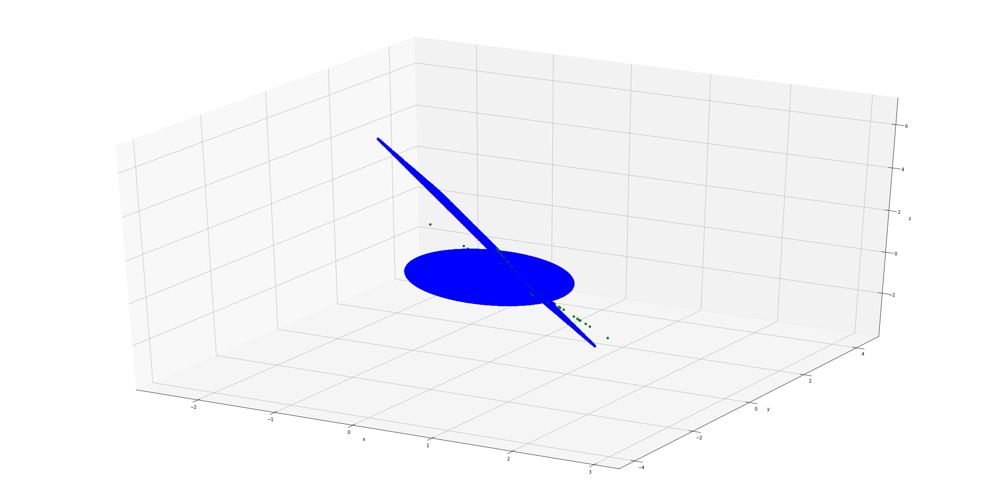

In [74]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import rand
from pylab import figure
fig=figure(figsize=(30,15))

##fig = figure()
ax = Axes3D(fig)


for i in range(len(plot_point)): #plot each point + it's index as text above
    if plot_dim[i]==1:
        ax.scatter(plot_point[i][0],plot_point[i][1],plot_point[i][2],color='r')
    if plot_dim[i]==2:
        ax.scatter(plot_point[i][0],plot_point[i][1],plot_point[i][2],color='b')
    if plot_dim[i]==3:
        ax.scatter(plot_point[i][0],plot_point[i][1],plot_point[i][2],color='g')    
        
    #ax.scatter(SS[i][0],SS[i][1],SS[i][2],color='r')



ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
pyplot.show()

In [75]:
from __future__ import print_function
import torch
import torch.cuda

In [76]:
import pandas as pd

col_names=['X','Y','Z']
# Convert the file into a Pandas DF. Ignore first line (header=0) and use col_names as headers instead.
# Play around with this df and generalize the outcomes for the other 7 files

df = pd.read_csv('Bridge_87K.csv', names=col_names)
df.head(10)

,X,Y,Z
0,545899.787,4186145.146,1.026
1,545899.194,4186144.697,1.076
2,545898.574,4186144.223,0.930
3,545897.800,4186144.092,1.003
4,545898.349,4186146.169,1.058
5,545897.751,4186145.716,1.028
6,545898.263,4186146.692,0.926
7,545899.488,4186147.628,1.057
8,545899.045,4186148.848,1.022
9,545896.366,4186149.063,1.172


In [77]:
df_XYZ=pd.concat([df['X'], df['Y'], df['Z']], axis=1)
print(df_XYZ)

                X            Y       Z
0      545899.787  4186145.146   1.026
1      545899.194  4186144.697   1.076
2      545898.574  4186144.223   0.930
3      545897.800  4186144.092   1.003
4      545898.349  4186146.169   1.058
5      545897.751  4186145.716   1.028
6      545898.263  4186146.692   0.926
7      545899.488  4186147.628   1.057
8      545899.045  4186148.848   1.022
9      545896.366  4186149.063   1.172
10     545887.983  4186144.055  98.905
11     545888.312  4186144.151  80.857
12     545888.861  4186144.569  80.865
13     545890.766  4186146.925   0.854
14     545886.812  4186144.549  72.722
15     545888.719  4186146.765  98.867
16     545886.439  4186144.882  81.701
17     545890.826  4186147.549   1.008
18     545894.043  4186151.566   1.242
19     545892.219  4186150.177   0.943
20     545883.364  4186144.009   0.991
21     545884.535  4186144.901   1.004
22     545896.449  4186155.651   1.015
23     545895.837  4186155.185   0.999
24     545888.030  418614

In [ ]:
LIDAR=np.asarray(df_XYZ,dtype=np.float32)
type(LIDAR[0][0])

numpy.float32

In [ ]:
idim = intrinsic_dimension(LIDAR,10,0.95)

1
Rate=0.3556300817290321Ops per Sec
2
Rate=0.3370643606667727Ops per Sec
3
Rate=0.34958761497788754Ops per Sec
4
Rate=0.3443478145791232Ops per Sec
5
Rate=0.337918444279785Ops per Sec
6
Rate=0.34503611060305656Ops per Sec
7
Rate=0.3511918471485842Ops per Sec
8
Rate=0.348603417835875Ops per Sec
9
Rate=0.34905599378867513Ops per Sec
10
Rate=0.3468496407509519Ops per Sec
11
Rate=0.34596551090924715Ops per Sec
12
Rate=0.3456019375401714Ops per Sec
13
Rate=0.3439081490354371Ops per Sec
14
Rate=0.3423853603276906Ops per Sec
15
Rate=0.3399881718566273Ops per Sec
16
Rate=0.34001450764867513Ops per Sec
17
Rate=0.33896696557884054Ops per Sec
18
Rate=0.33990206599204004Ops per Sec
19
Rate=0.3388888485741949Ops per Sec
20
Rate=0.33870218717947864Ops per Sec
21
Rate=0.3373359466845397Ops per Sec
22
Rate=0.33619551252443425Ops per Sec
23
Rate=0.3339583092897753Ops per Sec
24
Rate=0.33209629678503916Ops per Sec
25
Rate=0.3303611692400591Ops per Sec
26
Rate=0.3287095377558077Ops per Sec
27
Rate=0.327

Rate=0.2924184430604105Ops per Sec
213
Rate=0.29241653549463864Ops per Sec
214
Rate=0.29238456200246815Ops per Sec
215
Rate=0.2923625456529323Ops per Sec
216
Rate=0.2923557729330713Ops per Sec
217
Rate=0.2923621597449622Ops per Sec
218
Rate=0.29234683750076607Ops per Sec
219
Rate=0.2923237900329729Ops per Sec
220
Rate=0.29231689820927304Ops per Sec
221
Rate=0.2923009215601392Ops per Sec
222
Rate=0.2923075504085982Ops per Sec
223
Rate=0.2923044044796513Ops per Sec
224
Rate=0.2922893959914908Ops per Sec
225
Rate=0.2922569836899735Ops per Sec
226
Rate=0.29224106798387484Ops per Sec
227
Rate=0.29220998604376586Ops per Sec
228
Rate=0.29220484189265433Ops per Sec
229
Rate=0.29218796500332467Ops per Sec
230
Rate=0.2921620093230202Ops per Sec
231
Rate=0.29218396110182604Ops per Sec
232
Rate=0.2921618837266077Ops per Sec
233
Rate=0.29213095522024946Ops per Sec
234
Rate=0.2921129549782859Ops per Sec
235
Rate=0.29211341861345647Ops per Sec
236
Rate=0.29208717650960925Ops per Sec
237
Rate=0.292090

Rate=0.29011256571958943Ops per Sec
422
Rate=0.2901016783823954Ops per Sec
423
Rate=0.290095827022238Ops per Sec
424
Rate=0.29007817936813673Ops per Sec
425
Rate=0.2900679582592891Ops per Sec
426
Rate=0.2900619963448393Ops per Sec
427
Rate=0.2900505777531757Ops per Sec
428
Rate=0.290032713387331Ops per Sec
429
Rate=0.2900261883369494Ops per Sec
430
Rate=0.29001411132374544Ops per Sec
431
Rate=0.28999660990423504Ops per Sec
432
Rate=0.2899802777581381Ops per Sec
433
Rate=0.2899660018313564Ops per Sec
434
Rate=0.2899518927333534Ops per Sec
435
Rate=0.2899464127131027Ops per Sec
436
Rate=0.28993516872875147Ops per Sec
437
Rate=0.2899272605491226Ops per Sec
438
Rate=0.2899182159227212Ops per Sec
439
Rate=0.2899053041820772Ops per Sec
440
Rate=0.2899003505668671Ops per Sec
441
Rate=0.2898864234798267Ops per Sec
442
Rate=0.28987575386842734Ops per Sec
443
Rate=0.28985621723374233Ops per Sec
444
Rate=0.2898606529212499Ops per Sec
445
Rate=0.2898465913326301Ops per Sec
446
Rate=0.2898320914442

Rate=0.28888581806902025Ops per Sec
631
Rate=0.28888257586200927Ops per Sec
632
Rate=0.28887545205858445Ops per Sec
633
Rate=0.2888716079928391Ops per Sec
634
Rate=0.28887162447662657Ops per Sec
635
Rate=0.28886903350211807Ops per Sec
636
Rate=0.28886463065896206Ops per Sec
637
Rate=0.2888584319225914Ops per Sec
638
Rate=0.28885224952189953Ops per Sec
639
Rate=0.2888492902415001Ops per Sec
640
Rate=0.28883819329849414Ops per Sec
641
Rate=0.2888295993437618Ops per Sec
642
Rate=0.28882548368080996Ops per Sec
643
Rate=0.288814069415391Ops per Sec
644
Rate=0.2888111598838251Ops per Sec
645
Rate=0.28880257477490645Ops per Sec
646
Rate=0.28879359488703193Ops per Sec
647
Rate=0.28878977794753785Ops per Sec
648
Rate=0.2887871585830964Ops per Sec
649
Rate=0.2887798509886116Ops per Sec
650
Rate=0.2887699147119845Ops per Sec
651
Rate=0.2887609963120579Ops per Sec
652
Rate=0.28875736225415877Ops per Sec
653
Rate=0.28875154198566777Ops per Sec
654
Rate=0.28874783261761283Ops per Sec
655
Rate=0.2887

Rate=0.2885253539424279Ops per Sec
839
Rate=0.2885208085727202Ops per Sec
840
Rate=0.2885198841355911Ops per Sec
841
Rate=0.28851883929157085Ops per Sec
842
Rate=0.2885140461903985Ops per Sec
843
Rate=0.28851727301024055Ops per Sec
844
Rate=0.28852156549660257Ops per Sec
845
Rate=0.2885234573500723Ops per Sec
846
Rate=0.2885256697462742Ops per Sec
847
Rate=0.2885288265587306Ops per Sec
848
Rate=0.2885301371192378Ops per Sec
849
Rate=0.2885251445469466Ops per Sec
850
Rate=0.28852415430854306Ops per Sec
851
Rate=0.2885189762378505Ops per Sec
852
Rate=0.2885147186856591Ops per Sec
853
Rate=0.2885137001538538Ops per Sec
854
Rate=0.28851029652167975Ops per Sec
855
Rate=0.2885132370843693Ops per Sec
856
Rate=0.2885066828375614Ops per Sec
857
Rate=0.28850589417598776Ops per Sec
858
Rate=0.28850095137871723Ops per Sec
859
Rate=0.2884966763794181Ops per Sec
860
Rate=0.28849208930086057Ops per Sec
861
Rate=0.28848921884609036Ops per Sec
862
Rate=0.28849422374288053Ops per Sec
863
Rate=0.28848770

Rate=0.2880321311856082Ops per Sec
1046
Rate=0.28803310727469833Ops per Sec
1047
Rate=0.2880346335289278Ops per Sec
1048
Rate=0.28803133206791676Ops per Sec
1049
Rate=0.28811362554110204Ops per Sec
1050
Rate=0.2881812390489185Ops per Sec
1051
Rate=0.288244323710131Ops per Sec
1052
Rate=0.28828137735642756Ops per Sec
1053
Rate=0.2883318069756188Ops per Sec
1054
Rate=0.28836584892352296Ops per Sec
1055
Rate=0.28842189698527654Ops per Sec
1056
Rate=0.28842175436836276Ops per Sec
1057
Rate=0.28842444360736424Ops per Sec
1058
Rate=0.28842320365870994Ops per Sec
1059
Rate=0.28842224136382044Ops per Sec
1060
Rate=0.2884194718007423Ops per Sec
1061
Rate=0.28841685230182607Ops per Sec
1062
Rate=0.2884151937701773Ops per Sec
1063
Rate=0.28841247916287904Ops per Sec
1064
Rate=0.28840802047112873Ops per Sec
1065
Rate=0.288408294198639Ops per Sec
1066
Rate=0.2884085381350402Ops per Sec
1067
Rate=0.2884044326046174Ops per Sec
1068
Rate=0.2884035237379346Ops per Sec
1069
Rate=0.2884029403078021Ops pe

Rate=0.2884668531159768Ops per Sec
1249
Rate=0.28846462950751417Ops per Sec
1250
Rate=0.28846076536858745Ops per Sec
1251
Rate=0.2884638255639058Ops per Sec
1252
Rate=0.2884609757730794Ops per Sec
1253
Rate=0.2884603268589443Ops per Sec
1254
Rate=0.28845654463559356Ops per Sec
1255
Rate=0.28845439338617446Ops per Sec
1256
Rate=0.2884516375575206Ops per Sec
1257
Rate=0.288451183567968Ops per Sec
1258
Rate=0.28844639969677244Ops per Sec
1259
Rate=0.2884507440443293Ops per Sec
1260
Rate=0.28844752860862044Ops per Sec
1261
Rate=0.2884469333234389Ops per Sec
1262
Rate=0.28844423250834644Ops per Sec
1263
Rate=0.28844243181833074Ops per Sec
1264
Rate=0.2884403261170283Ops per Sec
1265
Rate=0.28843981336023516Ops per Sec
1266
Rate=0.2884377242877454Ops per Sec
1267
Rate=0.2884377089224249Ops per Sec
1268
Rate=0.2884340654330688Ops per Sec
1269
Rate=0.2884308252381215Ops per Sec
1270
Rate=0.2884300099757402Ops per Sec
1271
Rate=0.2884290629621194Ops per Sec
1272
Rate=0.28842577284646875Ops per 

Rate=0.2882503555312007Ops per Sec
1453
Rate=0.28824796939174424Ops per Sec
1454
Rate=0.2882478802825978Ops per Sec
1455
Rate=0.28824725178573635Ops per Sec
1456
Rate=0.2882462198652839Ops per Sec
1457
Rate=0.2882466785021383Ops per Sec
1458
Rate=0.28824544245982836Ops per Sec
1459
Rate=0.28824861606756513Ops per Sec
1460
Rate=0.28824676263412174Ops per Sec
1461
Rate=0.2882456337190005Ops per Sec
1462
Rate=0.2882481578304558Ops per Sec
1463
Rate=0.2882452964187255Ops per Sec
1464
Rate=0.28824118410980465Ops per Sec
1465
Rate=0.2882393107937579Ops per Sec
1466
Rate=0.2882376044178122Ops per Sec
1467
Rate=0.28823476608100146Ops per Sec
1468
Rate=0.2882346943509861Ops per Sec
1469
Rate=0.2882311642490436Ops per Sec
1470
Rate=0.2882330961746466Ops per Sec
1471
Rate=0.28823163804215185Ops per Sec
1472
Rate=0.288230078294505Ops per Sec
1473
Rate=0.2882265252416312Ops per Sec
1474
Rate=0.28822275401702974Ops per Sec
1475
Rate=0.2882188403270216Ops per Sec
1476
Rate=0.28821602745977376Ops per 

Rate=0.28804953730302835Ops per Sec
1657
Rate=0.2880940472525943Ops per Sec
1658
Rate=0.2881195577114246Ops per Sec
1659
Rate=0.2881212508518384Ops per Sec
1660
Rate=0.2881231466227762Ops per Sec
1661
Rate=0.28812070489894065Ops per Sec
1662
Rate=0.28812026447840594Ops per Sec
1663
Rate=0.28811888717745976Ops per Sec
1664
Rate=0.2881183168497439Ops per Sec
1665
Rate=0.2881185518039798Ops per Sec
1666
Rate=0.28811734258064875Ops per Sec
1667
Rate=0.2881187523576283Ops per Sec
1668
Rate=0.2881187211221791Ops per Sec
1669
Rate=0.2881163455923354Ops per Sec
1670
Rate=0.2881160717016139Ops per Sec
1671
Rate=0.28811324383276676Ops per Sec
1672
Rate=0.2881099895516811Ops per Sec
1673
Rate=0.28810577665588843Ops per Sec
1674
Rate=0.28810209601418296Ops per Sec
1675
Rate=0.2880996179241607Ops per Sec
1676
Rate=0.28809694691052123Ops per Sec
1677
Rate=0.28809670010070054Ops per Sec
1678
Rate=0.2880963829542565Ops per Sec
1679
Rate=0.28809523300332696Ops per Sec
1680
Rate=0.28809379047676364Ops p

Rate=0.2878707134138694Ops per Sec
1860
Rate=0.28787098081720025Ops per Sec
1861
Rate=0.2878672183475737Ops per Sec
1862
Rate=0.2878637783872703Ops per Sec
1863
Rate=0.28786215308383484Ops per Sec
1864
Rate=0.28786214177395775Ops per Sec
1865
Rate=0.2878619802892609Ops per Sec
1866
Rate=0.2878627462925904Ops per Sec
1867
Rate=0.28786051074253804Ops per Sec
1868
Rate=0.28786091464315283Ops per Sec
1869
Rate=0.28785843304178604Ops per Sec
1870
Rate=0.2878573697670496Ops per Sec
1871
Rate=0.2878550808476408Ops per Sec
1872
Rate=0.28785176957718506Ops per Sec
1873
Rate=0.28785050844286275Ops per Sec
1874
Rate=0.2878487171975717Ops per Sec
1875
Rate=0.2878576132776507Ops per Sec
1876
Rate=0.2878557685609174Ops per Sec
1877
Rate=0.28785343371923516Ops per Sec
1878
Rate=0.2878504871043354Ops per Sec
1879
Rate=0.2878486861295697Ops per Sec
1880
Rate=0.28784667020714705Ops per Sec
1881
Rate=0.28784613775156054Ops per Sec
1882
Rate=0.2878445944873929Ops per Sec
1883
Rate=0.28784140442968226Ops p

Rate=0.287757263430117Ops per Sec
2063
Rate=0.28775665429978403Ops per Sec
2064
Rate=0.2877587637220628Ops per Sec
2065
Rate=0.2877635624941501Ops per Sec
2066
Rate=0.2877633839314192Ops per Sec
2067
Rate=0.2877615648987274Ops per Sec
2068
Rate=0.28775934874297043Ops per Sec
2069
Rate=0.2877586909169028Ops per Sec
2070
Rate=0.28775865800003964Ops per Sec
2071
Rate=0.28775561055290483Ops per Sec
2072
Rate=0.2877537251106894Ops per Sec
2073
Rate=0.2877553335802612Ops per Sec
2074
Rate=0.2877555800697515Ops per Sec
2075
Rate=0.2877558655422325Ops per Sec
2076
Rate=0.287804012182758Ops per Sec
2077
Rate=0.2878142510310685Ops per Sec
2078
Rate=0.2878111895680045Ops per Sec
2079
Rate=0.2878141071402046Ops per Sec
2080
Rate=0.2878155926578477Ops per Sec
2081
Rate=0.28781301260645126Ops per Sec
2082
Rate=0.28781457634896335Ops per Sec
2083
Rate=0.28781460974158524Ops per Sec
2084
Rate=0.2878155990980869Ops per Sec
2085
Rate=0.2878135804901447Ops per Sec
2086
Rate=0.28781328439974757Ops per Sec

Rate=0.28775365768737976Ops per Sec
2266
Rate=0.287751138475312Ops per Sec
2267
Rate=0.287751720810879Ops per Sec
2268
Rate=0.28775216589423913Ops per Sec
2269
Rate=0.2877497015113512Ops per Sec
2270
Rate=0.28774984409556453Ops per Sec
2271
Rate=0.28775094246056654Ops per Sec
2272
Rate=0.287754776077404Ops per Sec
2273
Rate=0.28775207468275116Ops per Sec
2274
Rate=0.287752777467269Ops per Sec
2275
Rate=0.28775211593350153Ops per Sec
2276
Rate=0.28775084051797056Ops per Sec
2277
Rate=0.28775136785614785Ops per Sec
2278
Rate=0.2877517287638611Ops per Sec
2279
Rate=0.2877534567289962Ops per Sec
2280
Rate=0.2877552582054178Ops per Sec
2281
Rate=0.28775354428853184Ops per Sec
2282
Rate=0.28775634166953945Ops per Sec
2283
Rate=0.2877553668161566Ops per Sec
2284
Rate=0.28775618754446325Ops per Sec
2285
Rate=0.28775587320037105Ops per Sec
2286
Rate=0.2877550615887464Ops per Sec
2287
Rate=0.2877556469626544Ops per Sec
2288
Rate=0.28775506148949687Ops per Sec
2289
Rate=0.2877547568162261Ops per 

Rate=0.2876450098392657Ops per Sec
2469
Rate=0.2876429176100109Ops per Sec
2470
Rate=0.2876435000582684Ops per Sec
2471
Rate=0.2876412918228129Ops per Sec
2472
Rate=0.2876387005405147Ops per Sec
2473
Rate=0.2876399597296439Ops per Sec
2474
Rate=0.2876391593969034Ops per Sec
2475
Rate=0.2876374744537338Ops per Sec
2476
Rate=0.28763697637541275Ops per Sec
2477
Rate=0.2876357249402758Ops per Sec
2478
Rate=0.2876337735120538Ops per Sec
2479
Rate=0.28763343163369925Ops per Sec
2480
Rate=0.28763297549505823Ops per Sec
2481
Rate=0.28763259965999693Ops per Sec
2482
Rate=0.2876334801434456Ops per Sec
2483
Rate=0.2876338455261974Ops per Sec
2484
Rate=0.2876338355925418Ops per Sec
2485
Rate=0.28763220392720396Ops per Sec
2486
Rate=0.2876328395371231Ops per Sec
2487
Rate=0.2876326724401029Ops per Sec
2488
Rate=0.2876322315701657Ops per Sec
2489
Rate=0.2876309304583223Ops per Sec
2490
Rate=0.287634287675642Ops per Sec
2491
Rate=0.2876342850463945Ops per Sec
2492
Rate=0.28763458077635173Ops per Sec


Rate=0.2876505352846562Ops per Sec
2673
Rate=0.287649790431002Ops per Sec
2674
Rate=0.28764780259172945Ops per Sec
2675
Rate=0.2876465270541476Ops per Sec
2676
Rate=0.2876440057228808Ops per Sec
2677
Rate=0.2876425854230862Ops per Sec
2678
Rate=0.28764541272710814Ops per Sec
2679
Rate=0.2876463897282961Ops per Sec
2680
Rate=0.2876461436680807Ops per Sec
2681
Rate=0.287646221680023Ops per Sec
2682
Rate=0.2876459555384031Ops per Sec
2683
Rate=0.2876436484682573Ops per Sec
2684
Rate=0.2876432022911296Ops per Sec
2685
Rate=0.2876430124639055Ops per Sec
2686
Rate=0.28764261392194684Ops per Sec
2687
Rate=0.28764017905850753Ops per Sec
2688
Rate=0.2876402828957848Ops per Sec
2689
Rate=0.28764127227545183Ops per Sec
2690
Rate=0.2876406069479865Ops per Sec
2691
Rate=0.2876401524915307Ops per Sec
2692
Rate=0.28763953063297065Ops per Sec
2693
Rate=0.2876390527082881Ops per Sec
2694
Rate=0.28763777592328Ops per Sec
2695
Rate=0.2876411261908406Ops per Sec
2696
Rate=0.2876415145281145Ops per Sec
269

Rate=0.28764018891294835Ops per Sec
2876
Rate=0.28763966465747454Ops per Sec
2877
Rate=0.28763932024002103Ops per Sec
2878
Rate=0.28763954147491394Ops per Sec
2879
Rate=0.2876408179290087Ops per Sec
2880
Rate=0.2876422017270872Ops per Sec
2881
Rate=0.28764262783263284Ops per Sec
2882
Rate=0.287642029662621Ops per Sec
2883
Rate=0.2876410376681895Ops per Sec
2884
Rate=0.28763915404855167Ops per Sec
2885
Rate=0.28763707577869874Ops per Sec
2886
Rate=0.2876360951559742Ops per Sec
2887
Rate=0.28763511808625836Ops per Sec
2888
Rate=0.28763529650959474Ops per Sec
2889
Rate=0.2876345230515222Ops per Sec
2890
Rate=0.2876341328873319Ops per Sec
2891
Rate=0.28763397024570236Ops per Sec
2892
Rate=0.28763196696458215Ops per Sec
2893
Rate=0.2876311329102616Ops per Sec
2894
Rate=0.28763045710204455Ops per Sec
2895
Rate=0.28762898563317335Ops per Sec
2896
Rate=0.28762800586989934Ops per Sec
2897
Rate=0.2876268478666346Ops per Sec
2898
Rate=0.28762746939387324Ops per Sec
2899
Rate=0.28762915357453545Op

Rate=0.2875640882571166Ops per Sec
3079
Rate=0.28756481975795184Ops per Sec
3080
Rate=0.2875639669460299Ops per Sec
3081
Rate=0.28756283759323326Ops per Sec
3082
Rate=0.2875615711760347Ops per Sec
3083
Rate=0.2875611599026375Ops per Sec
3084
Rate=0.2875590666817622Ops per Sec
3085
Rate=0.28755858759115704Ops per Sec
3086
Rate=0.2875589046949717Ops per Sec
3087
Rate=0.28755786543283446Ops per Sec
3088
Rate=0.28755631792056435Ops per Sec
3089
Rate=0.28755564683804136Ops per Sec
3090
Rate=0.2875555412941319Ops per Sec
3091
Rate=0.2875550439521975Ops per Sec
3092
Rate=0.28755433802973746Ops per Sec
3093
Rate=0.28755503360815987Ops per Sec
3094
Rate=0.28755503297402113Ops per Sec
3095
Rate=0.2875536967896524Ops per Sec
3096
Rate=0.2875531965081584Ops per Sec
3097
Rate=0.2875530377798666Ops per Sec
3098
Rate=0.28755128271252756Ops per Sec
3099
Rate=0.2875522503556248Ops per Sec
3100
Rate=0.2875514041692581Ops per Sec
3101
Rate=0.287550048681364Ops per Sec
3102
Rate=0.2875485034139091Ops per 

Rate=0.2876289394202399Ops per Sec
3282
Rate=0.28763132603504205Ops per Sec
3283
Rate=0.287632888100839Ops per Sec
3284
Rate=0.2876325232300022Ops per Sec
3285
Rate=0.28763089137772074Ops per Sec
3286
Rate=0.2876305178387772Ops per Sec
3287
Rate=0.2876297842001938Ops per Sec
3288
Rate=0.28762802502526863Ops per Sec
3289
Rate=0.2876277955164797Ops per Sec
3290
Rate=0.28762627829451615Ops per Sec
3291
Rate=0.2876259208898911Ops per Sec
3292
Rate=0.28762560378458973Ops per Sec
3293
Rate=0.28762322782488436Ops per Sec
3294
Rate=0.28762251858705207Ops per Sec
3295
Rate=0.2876229181102665Ops per Sec
3296
Rate=0.28762167026237306Ops per Sec
3297
Rate=0.2876201032398656Ops per Sec
3298
Rate=0.28761959214255867Ops per Sec
3299
Rate=0.2876199418923735Ops per Sec
3300
Rate=0.28762023636102996Ops per Sec
3301
Rate=0.2876198033597942Ops per Sec
3302
Rate=0.28761874440875007Ops per Sec
3303
Rate=0.28761751817083187Ops per Sec
3304
Rate=0.2876180693761285Ops per Sec
3305
Rate=0.28761751503173894Ops p

Rate=0.2876795435613353Ops per Sec
3485
Rate=0.2876794153355363Ops per Sec
3486
Rate=0.28767833330112974Ops per Sec
3487
Rate=0.2876777292014729Ops per Sec
3488
Rate=0.28767722342075525Ops per Sec
3489
Rate=0.28767650992534993Ops per Sec
3490
Rate=0.2876765034217276Ops per Sec
3491
Rate=0.2876761425999236Ops per Sec
3492
Rate=0.287676062668555Ops per Sec
3493
Rate=0.2876767277788244Ops per Sec
3494
Rate=0.28767711582959554Ops per Sec
3495
Rate=0.28767776827608577Ops per Sec
3496
Rate=0.287676816146211Ops per Sec
3497
Rate=0.2876757252669339Ops per Sec
3498
Rate=0.28767594815628367Ops per Sec
3499
Rate=0.28767450576588355Ops per Sec
3500
Rate=0.2876735940337125Ops per Sec
3501
Rate=0.28767368994164383Ops per Sec
3502
Rate=0.28767369475691185Ops per Sec
3503
Rate=0.28767274760975914Ops per Sec
3504
Rate=0.287672179152905Ops per Sec
3505
Rate=0.2876713805208717Ops per Sec
3506
Rate=0.2876708786969386Ops per Sec
3507
Rate=0.28767003898558324Ops per Sec
3508
Rate=0.2876710891338119Ops per S

Rate=0.28763754232713656Ops per Sec
3688
Rate=0.287637238016536Ops per Sec
3689
Rate=0.28763568079001395Ops per Sec
3690
Rate=0.287636012887483Ops per Sec
3691
Rate=0.28763760972986274Ops per Sec
3692
Rate=0.28763661276788005Ops per Sec
3693
Rate=0.28763610554608043Ops per Sec
3694
Rate=0.28763581238560415Ops per Sec
3695
Rate=0.2876345283619621Ops per Sec
3696
Rate=0.2876337380049922Ops per Sec
3697
Rate=0.28763405151237464Ops per Sec
3698
Rate=0.28763401658067184Ops per Sec
3699
Rate=0.28763467022204653Ops per Sec
3700
Rate=0.28763699430023315Ops per Sec
3701
Rate=0.28763703567127613Ops per Sec
3702
Rate=0.2876367965710714Ops per Sec
3703
Rate=0.2876358282883911Ops per Sec
3704
Rate=0.287636121227188Ops per Sec
3705
Rate=0.2876352698754192Ops per Sec
3706
Rate=0.2876337609380087Ops per Sec
3707
Rate=0.2876326963664315Ops per Sec
3708
Rate=0.28763340599095255Ops per Sec
3709
Rate=0.2876335525177299Ops per Sec
3710
Rate=0.28763342817263804Ops per Sec
3711
Rate=0.287632705074474Ops per 

Rate=0.2876084377728226Ops per Sec
3892
Rate=0.28760778862679937Ops per Sec
3893
Rate=0.2876074872817303Ops per Sec
3894
Rate=0.2876079080375445Ops per Sec
3895
Rate=0.2876074532547498Ops per Sec
3896
Rate=0.28760725018198174Ops per Sec
3897
Rate=0.28760686453420525Ops per Sec
3898
Rate=0.28760555811854543Ops per Sec
3899
Rate=0.2876044606947868Ops per Sec
3900
Rate=0.28760559187977963Ops per Sec
3901
Rate=0.287605115198947Ops per Sec
3902
Rate=0.28760514853563823Ops per Sec
3903
Rate=0.28760487839775417Ops per Sec
3904
Rate=0.2876043421567149Ops per Sec
3905
Rate=0.28760338462269386Ops per Sec
3906
Rate=0.28760355430346646Ops per Sec
3907
Rate=0.2876029877703657Ops per Sec
3908
Rate=0.2876038503399581Ops per Sec
3909
Rate=0.2876025559515132Ops per Sec
3910
Rate=0.28760218066753623Ops per Sec
3911
Rate=0.2876029031819767Ops per Sec
3912
Rate=0.28760209971477074Ops per Sec
3913
Rate=0.287601384797447Ops per Sec
3914
Rate=0.2876010845856895Ops per Sec
3915
Rate=0.2876006477946198Ops per 

Rate=0.2875519674375261Ops per Sec
4096
Rate=0.2875510414921818Ops per Sec
4097
Rate=0.2875498810061581Ops per Sec
4098
Rate=0.28754991542955166Ops per Sec
4099
Rate=0.2875492938739478Ops per Sec
4100
Rate=0.28754974526188937Ops per Sec
4101
Rate=0.287549746650988Ops per Sec
4102
Rate=0.2875503405354576Ops per Sec
4103
Rate=0.2875492688635881Ops per Sec
4104
Rate=0.2875493972418142Ops per Sec
4105
Rate=0.2875484725090834Ops per Sec
4106
Rate=0.28754831545059617Ops per Sec
4107
Rate=0.28754774109041703Ops per Sec
4108
Rate=0.28754872359862427Ops per Sec
4109
Rate=0.28754888868089007Ops per Sec
4110
Rate=0.28754941058394656Ops per Sec
4111
Rate=0.2875488385343005Ops per Sec
4112
Rate=0.2875479976560156Ops per Sec
4113
Rate=0.28754718773113125Ops per Sec
4114
Rate=0.28754702331997783Ops per Sec
4115
Rate=0.28754670269219945Ops per Sec
4116
Rate=0.28754685800258045Ops per Sec
4117
Rate=0.28754536150206444Ops per Sec
4118
Rate=0.2875445001485082Ops per Sec
4119
Rate=0.28754364122733783Ops p

Rate=0.28789171169055283Ops per Sec
4299
Rate=0.2878916235453127Ops per Sec
4300
Rate=0.28789110546708013Ops per Sec
4301
Rate=0.2878958637822284Ops per Sec
4302
Rate=0.2878954234756287Ops per Sec
4303
Rate=0.2878965059628302Ops per Sec
4304
Rate=0.2878966225979111Ops per Sec
4305
Rate=0.28789519307024064Ops per Sec
4306
Rate=0.2878945196494082Ops per Sec
4307
Rate=0.287892747486779Ops per Sec
4308
Rate=0.2878913726757194Ops per Sec
4309
Rate=0.28789112170985576Ops per Sec
4310
Rate=0.2878911717855398Ops per Sec
4311
Rate=0.2878902967286036Ops per Sec
4312
Rate=0.2878893387041553Ops per Sec
4313
Rate=0.2878893210096021Ops per Sec
4314
Rate=0.28788749505116046Ops per Sec
4315
Rate=0.28788688570327153Ops per Sec
4316
Rate=0.28788632652388374Ops per Sec
4317
Rate=0.2878860017852938Ops per Sec
4318
Rate=0.287885924316455Ops per Sec
4319
Rate=0.2878849463553166Ops per Sec
4320
Rate=0.2878852317636765Ops per Sec
4321
Rate=0.2878846420713512Ops per Sec
4322
Rate=0.2878850846382887Ops per Sec


Rate=0.2878386537039044Ops per Sec
4502
Rate=0.2878384522347853Ops per Sec
4503
Rate=0.28783975126443406Ops per Sec
4504
Rate=0.287839888566028Ops per Sec
4505
Rate=0.28783894103160634Ops per Sec
4506
Rate=0.2878384726208542Ops per Sec
4507
Rate=0.2878380331688367Ops per Sec
4508
Rate=0.2878373986595253Ops per Sec
4509
Rate=0.2878359764989163Ops per Sec
4510
Rate=0.2878356480894565Ops per Sec
4511
Rate=0.2878360941848166Ops per Sec
4512
Rate=0.2878356837654671Ops per Sec
4513
Rate=0.28783509381131406Ops per Sec
4514
Rate=0.28783458384852134Ops per Sec
4515
Rate=0.28783318380121586Ops per Sec
4516
Rate=0.28783210210283133Ops per Sec
4517
Rate=0.287831986191025Ops per Sec
4518
Rate=0.28783183010735Ops per Sec
4519
Rate=0.2878316913149551Ops per Sec
4520
Rate=0.287830627335787Ops per Sec
4521
Rate=0.2878291834461853Ops per Sec
4522
Rate=0.2878281943150606Ops per Sec
4523
Rate=0.2878271265740624Ops per Sec
4524
Rate=0.2878263648578036Ops per Sec
4525
Rate=0.2878264073084687Ops per Sec
4526

Rate=0.28777226962912356Ops per Sec
4706
Rate=0.2877714587836925Ops per Sec
4707
Rate=0.28777180392391666Ops per Sec
4708
Rate=0.2877706472975482Ops per Sec
4709
Rate=0.287770658477502Ops per Sec
4710
Rate=0.2877714888812382Ops per Sec
4711
Rate=0.28777014781290683Ops per Sec
4712
Rate=0.28776966568398743Ops per Sec
4713
Rate=0.2877683938879904Ops per Sec
4714
Rate=0.28776859292436885Ops per Sec
4715
Rate=0.2877681477960852Ops per Sec
4716
Rate=0.28776706812766706Ops per Sec
4717
Rate=0.2877673871686588Ops per Sec
4718
Rate=0.28776655639331533Ops per Sec
4719
Rate=0.2877659512531148Ops per Sec
4720
Rate=0.28776679152464935Ops per Sec
4721
Rate=0.287765922324018Ops per Sec
4722
Rate=0.28776607218482353Ops per Sec
4723
Rate=0.28776585602951577Ops per Sec
4724
Rate=0.28776608771332174Ops per Sec
4725
Rate=0.2877654627888491Ops per Sec
4726
Rate=0.2877637406334126Ops per Sec
4727
Rate=0.28776315575037587Ops per Sec
4728
Rate=0.2877626949475036Ops per Sec
4729
Rate=0.2877626288163058Ops per

Rate=0.28768909718228597Ops per Sec
4910
Rate=0.287688648669532Ops per Sec
4911
Rate=0.287687759746433Ops per Sec
4912
Rate=0.2876874583085383Ops per Sec
4913
Rate=0.28768776096393556Ops per Sec
4914
Rate=0.2876875504145579Ops per Sec
4915
Rate=0.2876869754332104Ops per Sec
4916
Rate=0.2876867656918191Ops per Sec
4917
Rate=0.2876862430878407Ops per Sec
4918
Rate=0.287686722167032Ops per Sec
4919
Rate=0.28768650634060017Ops per Sec
4920
Rate=0.2876862383285121Ops per Sec
4921
Rate=0.2876867698610616Ops per Sec
4922
Rate=0.2876859640523274Ops per Sec
4923
Rate=0.2876871635706296Ops per Sec
4924
Rate=0.2876868726964804Ops per Sec
4925
Rate=0.28768629212167834Ops per Sec
4926
Rate=0.28768598654527205Ops per Sec
4927
Rate=0.2876866145832307Ops per Sec
4928
Rate=0.2876860846787705Ops per Sec
4929
Rate=0.2876867517958574Ops per Sec
4930
Rate=0.2876863883569868Ops per Sec
4931
Rate=0.28768582565196865Ops per Sec
4932
Rate=0.2876860428049575Ops per Sec
4933
Rate=0.28768579417295814Ops per Sec
4

Rate=0.28765504971173217Ops per Sec
5113
Rate=0.28765512225438317Ops per Sec
5114
Rate=0.28765418919250324Ops per Sec
5115
Rate=0.2876537671791545Ops per Sec
5116
Rate=0.2876533232456374Ops per Sec
5117
Rate=0.28765258726205534Ops per Sec
5118
Rate=0.28765210861082974Ops per Sec
5119
Rate=0.287651578361829Ops per Sec
5120
Rate=0.2876508592768211Ops per Sec
5121
Rate=0.2876500501353927Ops per Sec
5122
Rate=0.2876514933614132Ops per Sec
5123
Rate=0.28765123293307476Ops per Sec
5124
Rate=0.2876508660538711Ops per Sec
5125
Rate=0.28765032518240724Ops per Sec
5126
Rate=0.2876496333103458Ops per Sec
5127
Rate=0.2876488452351746Ops per Sec
5128
Rate=0.28764811332142876Ops per Sec
5129
Rate=0.2876481966953268Ops per Sec
5130
Rate=0.28764875087618474Ops per Sec
5131
Rate=0.28764772959941903Ops per Sec
5132
Rate=0.28764703280663007Ops per Sec
5133
Rate=0.28764782278820233Ops per Sec
5134
Rate=0.2876475560147515Ops per Sec
5135
Rate=0.28764678672840766Ops per Sec
5136
Rate=0.2876465245680898Ops p

Rate=0.287624041886817Ops per Sec
5316
Rate=0.28762382580362067Ops per Sec
5317
Rate=0.28762381546851484Ops per Sec
5318
Rate=0.28762360411499155Ops per Sec
5319
Rate=0.28762351762068034Ops per Sec
5320
Rate=0.28762312602580337Ops per Sec
5321
Rate=0.2876237214524651Ops per Sec
5322
Rate=0.2876233241021373Ops per Sec
5323
Rate=0.28762248292997505Ops per Sec
5324
Rate=0.2876227759836264Ops per Sec
5325
Rate=0.2876224811201051Ops per Sec
5326
Rate=0.28762256288487326Ops per Sec
5327
Rate=0.28762214995765356Ops per Sec
5328
Rate=0.2876225772844629Ops per Sec
5329
Rate=0.28762216109933797Ops per Sec
5330
Rate=0.2876216255883438Ops per Sec
5331
Rate=0.2876211400036928Ops per Sec
5332
Rate=0.2876209235572032Ops per Sec
5333
Rate=0.28762142027320897Ops per Sec
5334
Rate=0.28762062703877433Ops per Sec
5335
Rate=0.28762042502792223Ops per Sec
5336
Rate=0.2876196711467556Ops per Sec
5337
Rate=0.28761992263448366Ops per Sec
5338
Rate=0.2876192761473199Ops per Sec
5339
Rate=0.2876189283258796Ops p

Rate=0.28759835620567725Ops per Sec
5520
Rate=0.28759862468818015Ops per Sec
5521
Rate=0.28759858044455117Ops per Sec
5522
Rate=0.287598109032476Ops per Sec
5523
Rate=0.28759749093950526Ops per Sec
5524
Rate=0.28759718510030535Ops per Sec
5525
Rate=0.2875974617748033Ops per Sec
5526
Rate=0.2875976279664179Ops per Sec
5527
Rate=0.2875982898011697Ops per Sec
5528
Rate=0.28759780137280805Ops per Sec
5529
Rate=0.28759819899078926Ops per Sec
5530
Rate=0.2875971103762094Ops per Sec
5531
Rate=0.2875972811952881Ops per Sec
5532
Rate=0.28759674645491046Ops per Sec
5533
Rate=0.2875963035152701Ops per Sec
5534
Rate=0.2875958302530032Ops per Sec
5535
Rate=0.2875950748729422Ops per Sec
5536
Rate=0.28759422599574463Ops per Sec
5537
Rate=0.2875940097234611Ops per Sec
5538
Rate=0.2875934748691081Ops per Sec
5539
Rate=0.2875925060609583Ops per Sec
5540
Rate=0.2875920111772708Ops per Sec
5541
Rate=0.2875913445730118Ops per Sec
5542
Rate=0.2875908056669302Ops per Sec
5543
Rate=0.2875901047398623Ops per S

Rate=0.28752923822769055Ops per Sec
5723
Rate=0.287529189100628Ops per Sec
5724
Rate=0.2875318653910402Ops per Sec
5725
Rate=0.28753114418307113Ops per Sec
5726
Rate=0.28753304163108234Ops per Sec
5727
Rate=0.28753228763402094Ops per Sec
5728
Rate=0.2875313938906257Ops per Sec
5729
Rate=0.28753157758644227Ops per Sec
5730
Rate=0.28753190345409735Ops per Sec
5731
Rate=0.2875311997455434Ops per Sec
5732
Rate=0.28753021053143046Ops per Sec
5733
Rate=0.287529162813191Ops per Sec
5734
Rate=0.28752905709040827Ops per Sec
5735
Rate=0.2875291854104511Ops per Sec
5736
Rate=0.28752962651170483Ops per Sec
5737
Rate=0.28752965201444486Ops per Sec
5738
Rate=0.28752876545171774Ops per Sec
5739
Rate=0.2875278095338438Ops per Sec
5740
Rate=0.28752770188607507Ops per Sec
5741
Rate=0.28752672384664507Ops per Sec
5742
Rate=0.28752623195939825Ops per Sec
5743
Rate=0.28752600357197367Ops per Sec
5744
Rate=0.28752601750064005Ops per Sec
5745
Rate=0.2875255157470463Ops per Sec
5746
Rate=0.28752437035386763Op

Rate=0.2875253408748945Ops per Sec
5927
Rate=0.28752454783183967Ops per Sec
5928
Rate=0.28752416531259045Ops per Sec
5929
Rate=0.2875233008393129Ops per Sec
5930
Rate=0.2875232828088646Ops per Sec
5931
Rate=0.28752424734279236Ops per Sec
5932
Rate=0.2875246253526088Ops per Sec
5933
Rate=0.28752398678212493Ops per Sec
5934
Rate=0.2875250949132536Ops per Sec
5935
Rate=0.28752422316952103Ops per Sec
5936
Rate=0.28752415561922195Ops per Sec
5937
Rate=0.28752376935411156Ops per Sec
5938
Rate=0.28752374840821715Ops per Sec
5939
Rate=0.287523349836013Ops per Sec
5940
Rate=0.28752288688458605Ops per Sec
5941
Rate=0.2875228758064407Ops per Sec
5942
Rate=0.2875235984083028Ops per Sec
5943
Rate=0.28752274032127323Ops per Sec
5944
Rate=0.2875238261275367Ops per Sec
5945
Rate=0.2875231643264771Ops per Sec
5946
Rate=0.28752249896085175Ops per Sec
5947
Rate=0.28752271442033767Ops per Sec
5948
Rate=0.2875225075803383Ops per Sec
5949
Rate=0.2875225480470993Ops per Sec
5950
Rate=0.28752151001536375Ops p

Rate=0.28747229983066297Ops per Sec
6130
Rate=0.2874739616319412Ops per Sec
6131
Rate=0.28747386653925744Ops per Sec
6132
Rate=0.287473835388398Ops per Sec
6133
Rate=0.28747347244235555Ops per Sec
6134
Rate=0.28747296296398356Ops per Sec
6135
Rate=0.2874727700873271Ops per Sec
6136
Rate=0.2874728756943965Ops per Sec
6137
Rate=0.28747227650346824Ops per Sec
6138
Rate=0.2874718678298833Ops per Sec
6139
Rate=0.2874712630135313Ops per Sec
6140
Rate=0.28747063162780084Ops per Sec
6141
Rate=0.28747072559572845Ops per Sec
6142
Rate=0.28747006311428724Ops per Sec
6143
Rate=0.2874699121198164Ops per Sec
6144
Rate=0.28747037247826884Ops per Sec
6145
Rate=0.2874710585373861Ops per Sec
6146
Rate=0.2874702602890351Ops per Sec
6147
Rate=0.28746930130654663Ops per Sec
6148
Rate=0.28746984583631036Ops per Sec
6149
Rate=0.28746902241114286Ops per Sec
6150
Rate=0.28746857812743914Ops per Sec
6151
Rate=0.28746815948639753Ops per Sec
6152
Rate=0.287467890670747Ops per Sec
6153
Rate=0.28746690623446985Ops 

Rate=0.2874807479307913Ops per Sec
6334
Rate=0.2874804058270117Ops per Sec
6335
Rate=0.2874804776636902Ops per Sec
6336
Rate=0.2874804210328006Ops per Sec
6337
Rate=0.28748043037767346Ops per Sec
6338
Rate=0.2874796704154118Ops per Sec
6339
Rate=0.2874792463612676Ops per Sec
6340
Rate=0.2874787710330393Ops per Sec
6341
Rate=0.2874783633908861Ops per Sec
6342
Rate=0.28747921357093936Ops per Sec
6343
Rate=0.28747923088271876Ops per Sec
6344
Rate=0.28747799718148553Ops per Sec
6345
Rate=0.2874777871688804Ops per Sec
6346
Rate=0.28747722486688465Ops per Sec
6347
Rate=0.28747690294100486Ops per Sec
6348
Rate=0.28747601652950316Ops per Sec
6349
Rate=0.2874756934019712Ops per Sec
6350
Rate=0.28747637470360804Ops per Sec
6351
Rate=0.2874753989083084Ops per Sec
6352
Rate=0.2874744220519624Ops per Sec
6353
Rate=0.28747428444154494Ops per Sec
6354
Rate=0.28747393168588403Ops per Sec
6355
Rate=0.28747335536987223Ops per Sec
6356
Rate=0.28747307391533733Ops per Sec
6357
Rate=0.2874735761471759Ops p

Rate=0.28742755866077246Ops per Sec
6537
Rate=0.2874271904747916Ops per Sec
6538
Rate=0.2874288763832342Ops per Sec
6539
Rate=0.287428308191122Ops per Sec
6540
Rate=0.2874277866861346Ops per Sec
6541
Rate=0.2874273988195948Ops per Sec
6542
Rate=0.28742690659952574Ops per Sec
6543
Rate=0.2874264782904241Ops per Sec
6544
Rate=0.28742586628543765Ops per Sec
6545
Rate=0.287426059016847Ops per Sec
6546
Rate=0.28742534617396737Ops per Sec
6547
Rate=0.2874257545292724Ops per Sec
6548
Rate=0.2874255734858161Ops per Sec
6549
Rate=0.2874252276322839Ops per Sec
6550
Rate=0.2874249461195578Ops per Sec
6551
Rate=0.28742439892627586Ops per Sec
6552
Rate=0.28742397436187617Ops per Sec
6553
Rate=0.28742355155480775Ops per Sec
6554
Rate=0.28742223796891353Ops per Sec
6555
Rate=0.2874225868750429Ops per Sec
6556
Rate=0.28742249252604435Ops per Sec
6557
Rate=0.2874219193360092Ops per Sec
6558
Rate=0.2874212686096755Ops per Sec
6559
Rate=0.2874236713011821Ops per Sec
6560
Rate=0.28742300960584544Ops per S

Rate=0.28740260541678914Ops per Sec
6740
Rate=0.287401641493963Ops per Sec
6741
Rate=0.2874008226720107Ops per Sec
6742
Rate=0.28740005032606286Ops per Sec
6743
Rate=0.2873994238599557Ops per Sec
6744
Rate=0.287398551837744Ops per Sec
6745
Rate=0.2873979771463468Ops per Sec
6746
Rate=0.2873968266646761Ops per Sec
6747
Rate=0.28739626083105574Ops per Sec
6748
Rate=0.28739652328398074Ops per Sec
6749
Rate=0.2873961579742526Ops per Sec
6750
Rate=0.2873962813615061Ops per Sec
6751
Rate=0.2873959566909646Ops per Sec
6752
Rate=0.28739541849547356Ops per Sec
6753
Rate=0.28739522082191643Ops per Sec
6754
Rate=0.2873949255236215Ops per Sec
6755
Rate=0.2873944922312815Ops per Sec
6756
Rate=0.28739441565179646Ops per Sec
6757
Rate=0.2873946223676323Ops per Sec
6758
Rate=0.28739443062859216Ops per Sec
6759
Rate=0.28739447087472736Ops per Sec
6760
Rate=0.28739395434096726Ops per Sec
6761
Rate=0.2873930171881689Ops per Sec
6762
Rate=0.28739273646997954Ops per Sec
6763
Rate=0.2873927829011589Ops per 

Rate=0.2873514925833272Ops per Sec
6943
Rate=0.28735087192452996Ops per Sec
6944
Rate=0.28735120809200765Ops per Sec
6945
Rate=0.2873511485891455Ops per Sec
6946
Rate=0.28735142034997524Ops per Sec
6947
Rate=0.2873516502914996Ops per Sec
6948
Rate=0.287351424379045Ops per Sec
6949
Rate=0.28735090495009324Ops per Sec
6950
Rate=0.2873507643612936Ops per Sec
6951
Rate=0.2873510094398718Ops per Sec
6952
Rate=0.2873505614990353Ops per Sec
6953
Rate=0.2873503231782044Ops per Sec
6954
Rate=0.2873501154900697Ops per Sec
6955
Rate=0.2873502440758131Ops per Sec
6956
Rate=0.2873503512131115Ops per Sec
6957
Rate=0.2873500169205012Ops per Sec
6958
Rate=0.28735074061233995Ops per Sec
6959
Rate=0.287350463129725Ops per Sec
6960
Rate=0.28735012334571564Ops per Sec
6961
Rate=0.28734960096960277Ops per Sec
6962
Rate=0.28734968262825056Ops per Sec
6963
Rate=0.2873494743927596Ops per Sec
6964
Rate=0.28734929276629906Ops per Sec
6965
Rate=0.2873485459675026Ops per Sec
6966
Rate=0.28734787770353704Ops per S

Rate=0.2873236936929233Ops per Sec
7146
Rate=0.28732335748773086Ops per Sec
7147
Rate=0.2873233403776475Ops per Sec
7148
Rate=0.2873229302557259Ops per Sec
7149
Rate=0.28732304340533166Ops per Sec
7150
Rate=0.2873225246457852Ops per Sec
7151
Rate=0.28732242998636803Ops per Sec
7152
Rate=0.2873219263166564Ops per Sec
7153
Rate=0.2873215589301987Ops per Sec
7154
Rate=0.2873210533693764Ops per Sec
7155
Rate=0.28732014261835415Ops per Sec
7156
Rate=0.28731990680709973Ops per Sec
7157
Rate=0.28731980100095394Ops per Sec
7158
Rate=0.2873196015642022Ops per Sec
7159
Rate=0.28731954058439996Ops per Sec
7160
Rate=0.2873194784077545Ops per Sec
7161
Rate=0.2873187757974487Ops per Sec
7162
Rate=0.2873179017229721Ops per Sec
7163
Rate=0.28731735666010855Ops per Sec
7164
Rate=0.2873170233974179Ops per Sec
7165
Rate=0.2873164064340447Ops per Sec
7166
Rate=0.28731597245394036Ops per Sec
7167
Rate=0.28731731033612357Ops per Sec
7168
Rate=0.28731703116796325Ops per Sec
7169
Rate=0.28731622492480396Ops p

Rate=0.28744233369617606Ops per Sec
7349
Rate=0.287441892151053Ops per Sec
7350
Rate=0.2874414064361828Ops per Sec
7351
Rate=0.28744083991716357Ops per Sec
7352
Rate=0.28744072702404816Ops per Sec
7353
Rate=0.28744045695367515Ops per Sec
7354
Rate=0.28744048113096526Ops per Sec
7355
Rate=0.2874401426829624Ops per Sec
7356
Rate=0.28743995132038874Ops per Sec
7357
Rate=0.2874406899644802Ops per Sec
7358
Rate=0.2874458499510908Ops per Sec
7359
Rate=0.28745342249629446Ops per Sec
7360
Rate=0.28745300345388625Ops per Sec
7361
Rate=0.2874527032423817Ops per Sec
7362
Rate=0.28745398700775754Ops per Sec
7363
Rate=0.2874542098802134Ops per Sec
7364
Rate=0.2874537686947085Ops per Sec
7365
Rate=0.2874535924516817Ops per Sec
7366
Rate=0.28745326179311814Ops per Sec
7367
Rate=0.28745288001164404Ops per Sec
7368
Rate=0.2874534829850935Ops per Sec
7369
Rate=0.28745326532775856Ops per Sec
7370
Rate=0.28745298099249383Ops per Sec
7371
Rate=0.2874527421308177Ops per Sec
7372
Rate=0.2874526412196505Ops p

Rate=0.2874346066870403Ops per Sec
7552
Rate=0.2874341558535918Ops per Sec
7553
Rate=0.28743345595729874Ops per Sec
7554
Rate=0.28743317724785333Ops per Sec
7555
Rate=0.2874328264500493Ops per Sec
7556
Rate=0.28743229473620974Ops per Sec
7557
Rate=0.2874322120705568Ops per Sec
7558
Rate=0.2874323920867949Ops per Sec
7559
Rate=0.2874324750539111Ops per Sec
7560
Rate=0.287432016461635Ops per Sec
7561
Rate=0.28743134225078343Ops per Sec
7562
Rate=0.28743104572617156Ops per Sec
7563
Rate=0.2874309943194867Ops per Sec
7564
Rate=0.2874313209090228Ops per Sec
7565
Rate=0.28743081164679624Ops per Sec
7566
Rate=0.2874306471929184Ops per Sec
7567
Rate=0.28743015042331904Ops per Sec
7568
Rate=0.2874296246043171Ops per Sec
7569
Rate=0.28742944659305386Ops per Sec
7570
Rate=0.28742921826760315Ops per Sec
7571
Rate=0.2874292557597776Ops per Sec
7572
Rate=0.2874296148947954Ops per Sec
7573
Rate=0.287428970291815Ops per Sec
7574
Rate=0.28742839575375606Ops per Sec
7575
Rate=0.2874283307490896Ops per S

Rate=0.28738745861439974Ops per Sec
7756
Rate=0.28738729761550086Ops per Sec
7757
Rate=0.2873868053095776Ops per Sec
7758
Rate=0.28738635784106975Ops per Sec
7759
Rate=0.2873854325850915Ops per Sec
7760
Rate=0.28738529203971674Ops per Sec
7761
Rate=0.28738473116998Ops per Sec
7762
Rate=0.2873841302362256Ops per Sec
7763
Rate=0.2873833459467891Ops per Sec
7764
Rate=0.2873830547704426Ops per Sec
7765
Rate=0.28738301459551574Ops per Sec
7766
Rate=0.2873832504042848Ops per Sec
7767
Rate=0.2873829344801542Ops per Sec
7768
Rate=0.28738233968361426Ops per Sec
7769
Rate=0.28738229107844504Ops per Sec
7770
Rate=0.2873822515869474Ops per Sec
7771
Rate=0.2873823406239067Ops per Sec
7772
Rate=0.2873830223828065Ops per Sec
7773
Rate=0.28738222719939766Ops per Sec
7774
Rate=0.28738216730747496Ops per Sec
7775
Rate=0.28738159397794366Ops per Sec
7776
Rate=0.2873810195765482Ops per Sec
7777
Rate=0.2873802287171682Ops per Sec
7778
Rate=0.2873800437070951Ops per Sec
7779
Rate=0.28738032912128003Ops per 

Rate=0.28735839240962774Ops per Sec
7959
Rate=0.2873580512431034Ops per Sec
7960
Rate=0.2873576845031498Ops per Sec
7961
Rate=0.28735744008076025Ops per Sec
7962
Rate=0.28735702736459184Ops per Sec
7963
Rate=0.287357724675163Ops per Sec
7964
Rate=0.2873574070222479Ops per Sec
7965
Rate=0.2873567270737215Ops per Sec
7966
Rate=0.28735616701454175Ops per Sec
7967
Rate=0.2873555401035898Ops per Sec
7968
Rate=0.2873550293695835Ops per Sec
7969
Rate=0.28735470789161505Ops per Sec
7970
Rate=0.2873541464832606Ops per Sec
7971
Rate=0.28735395787515433Ops per Sec
7972
Rate=0.28735346528742856Ops per Sec
7973
Rate=0.28735273106916986Ops per Sec
7974
Rate=0.28735221537420985Ops per Sec
7975
Rate=0.2873517092207036Ops per Sec
7976
Rate=0.28735133148015807Ops per Sec
7977
Rate=0.2873516063767895Ops per Sec
7978
Rate=0.28735143256351386Ops per Sec
7979
Rate=0.28735113981486615Ops per Sec
7980
Rate=0.2873512221015378Ops per Sec
7981
Rate=0.2873505726052503Ops per Sec
7982
Rate=0.28735077090694294Ops p

Rate=0.28731681353295735Ops per Sec
8162
Rate=0.28731739126711026Ops per Sec
8163
Rate=0.2873179676014022Ops per Sec
8164
Rate=0.2873180433380149Ops per Sec
8165
Rate=0.2873180535431104Ops per Sec
8166
Rate=0.28731810235201694Ops per Sec
8167
Rate=0.28731830241106654Ops per Sec
8168
Rate=0.2873176345238664Ops per Sec
8169
Rate=0.2873180300182843Ops per Sec
8170
Rate=0.2873172531419941Ops per Sec
8171
Rate=0.28731755575575796Ops per Sec
8172
Rate=0.2873167673802087Ops per Sec
8173
Rate=0.2873167609583556Ops per Sec
8174
Rate=0.2873164041831265Ops per Sec
8175
Rate=0.28731592846929177Ops per Sec
8176
Rate=0.2873158198113531Ops per Sec
8177
Rate=0.28731512223532146Ops per Sec
8178
Rate=0.28731470100584844Ops per Sec
8179
Rate=0.2873143248001832Ops per Sec
8180
Rate=0.2873141798796225Ops per Sec
8181
Rate=0.2873139945273599Ops per Sec
8182
Rate=0.2873136148280933Ops per Sec
8183
Rate=0.2873133117427815Ops per Sec
8184
Rate=0.2873143060048379Ops per Sec
8185
Rate=0.2873143487388493Ops per S

Rate=0.28729600770172903Ops per Sec
8365
Rate=0.2872957411800731Ops per Sec
8366
Rate=0.2872958856031673Ops per Sec
8367
Rate=0.2872954255243982Ops per Sec
8368
Rate=0.2872949537056314Ops per Sec
8369
Rate=0.28729468687083676Ops per Sec
8370
Rate=0.2872944172678192Ops per Sec
8371
Rate=0.28729405966507815Ops per Sec
8372
Rate=0.28729359979605096Ops per Sec
8373
Rate=0.2872933956260894Ops per Sec
8374
Rate=0.2872932038181304Ops per Sec
8375
Rate=0.28729259562570036Ops per Sec
8376
Rate=0.2872931684711133Ops per Sec
8377
Rate=0.28729287140292087Ops per Sec
8378
Rate=0.2872923567398276Ops per Sec
8379
Rate=0.2872926030431886Ops per Sec
8380
Rate=0.2872924355574128Ops per Sec
8381
Rate=0.2872927260078121Ops per Sec
8382
Rate=0.2872920252471993Ops per Sec
8383
Rate=0.28729142786083933Ops per Sec
8384
Rate=0.28729132114548883Ops per Sec
8385
Rate=0.2872921334390113Ops per Sec
8386
Rate=0.2872920770251957Ops per Sec
8387
Rate=0.2872921740897911Ops per Sec
8388
Rate=0.28729154774656324Ops per 

Rate=0.2872493944352967Ops per Sec
8568
Rate=0.2872490158661196Ops per Sec
8569
Rate=0.28724925927648365Ops per Sec
8570
Rate=0.28724865216435413Ops per Sec
8571
Rate=0.28725254707975856Ops per Sec
8572
Rate=0.2872633695501703Ops per Sec
8573
Rate=0.2872635407131913Ops per Sec
8574
Rate=0.2872628198375721Ops per Sec
8575
Rate=0.28726254961545783Ops per Sec
8576
Rate=0.2872621315846678Ops per Sec
8577
Rate=0.28726173612891637Ops per Sec
8578
Rate=0.287261194309807Ops per Sec
8579
Rate=0.28726108534735095Ops per Sec
8580
Rate=0.2872612337528503Ops per Sec
8581
Rate=0.2872610998579984Ops per Sec
8582
Rate=0.287261058568205Ops per Sec
8583
Rate=0.28726134671313774Ops per Sec
8584
Rate=0.2872610199694594Ops per Sec
8585
Rate=0.2872605466436331Ops per Sec
8586
Rate=0.28726097232427394Ops per Sec
8587
Rate=0.28726018208043214Ops per Sec
8588
Rate=0.2872593392108102Ops per Sec
8589
Rate=0.2872596841599727Ops per Sec
8590
Rate=0.28725959436910975Ops per Sec
8591
Rate=0.28725919079398554Ops per 

Rate=0.2872409850580804Ops per Sec
8772
Rate=0.2872411384515597Ops per Sec
8773
Rate=0.28724067204118514Ops per Sec
8774
Rate=0.28724015773899264Ops per Sec
8775
Rate=0.2872399882368Ops per Sec
8776
Rate=0.28723957271505973Ops per Sec
8777
Rate=0.28723930474404913Ops per Sec
8778
Rate=0.28723912495559734Ops per Sec
8779
Rate=0.2872388530015704Ops per Sec
8780
Rate=0.2872389144820648Ops per Sec
8781
Rate=0.28723847205496644Ops per Sec
8782
Rate=0.28723834057757425Ops per Sec
8783
Rate=0.28723776261113804Ops per Sec
8784
Rate=0.28723710633966415Ops per Sec
8785
Rate=0.2872370892414954Ops per Sec
8786
Rate=0.28723704336968586Ops per Sec
8787
Rate=0.2872377736489706Ops per Sec
8788
Rate=0.28723777563139086Ops per Sec
8789
Rate=0.28723811594860366Ops per Sec
8790
Rate=0.2872376968971205Ops per Sec
8791
Rate=0.2872374159496287Ops per Sec
8792
Rate=0.28723706721539044Ops per Sec
8793
Rate=0.2872366715646346Ops per Sec
8794
Rate=0.2872363551150083Ops per Sec
8795
Rate=0.287236381513336Ops per 

Rate=0.28719003148218736Ops per Sec
8975
Rate=0.28719034167465746Ops per Sec
8976
Rate=0.2871900552884868Ops per Sec
8977
Rate=0.28718960569571506Ops per Sec
8978
Rate=0.2871898250091613Ops per Sec
8979
Rate=0.28719016311341694Ops per Sec
8980
Rate=0.28719042965294367Ops per Sec
8981
Rate=0.2871903542537535Ops per Sec
8982
Rate=0.287190265852178Ops per Sec
8983
Rate=0.28718993461934317Ops per Sec
8984
Rate=0.28718978801873063Ops per Sec
8985
Rate=0.28718926177833226Ops per Sec
8986
Rate=0.2871892542558049Ops per Sec
8987
Rate=0.2871883435047161Ops per Sec
8988
Rate=0.2871882909449261Ops per Sec
8989
Rate=0.2871884289176797Ops per Sec
8990
Rate=0.2871888059620764Ops per Sec
8991
Rate=0.2871884384527741Ops per Sec
8992
Rate=0.2871886442862665Ops per Sec
8993
Rate=0.2871882976994461Ops per Sec
8994
Rate=0.28718783083515903Ops per Sec
8995
Rate=0.28718747317228055Ops per Sec
8996
Rate=0.2871870417673865Ops per Sec
8997
Rate=0.28718683036150994Ops per Sec
8998
Rate=0.287186273817684Ops per 

Rate=0.2871629844210222Ops per Sec
9178
Rate=0.2871627571210908Ops per Sec
9179
Rate=0.2871627792858515Ops per Sec
9180
Rate=0.28716333499408103Ops per Sec
9181
Rate=0.2871631029538697Ops per Sec
9182
Rate=0.28716318862261847Ops per Sec
9183
Rate=0.28716286010982545Ops per Sec
9184
Rate=0.28717088719501777Ops per Sec
9185
Rate=0.287176413128099Ops per Sec
9186
Rate=0.28717674124583387Ops per Sec
9187
Rate=0.28717678504733646Ops per Sec
9188
Rate=0.2871763347543534Ops per Sec
9189
Rate=0.2871766412340615Ops per Sec
9190
Rate=0.28717663671340943Ops per Sec
9191
Rate=0.28717693759168156Ops per Sec
9192
Rate=0.28717668651309897Ops per Sec
9193
Rate=0.287176041716793Ops per Sec
9194
Rate=0.28717637826925785Ops per Sec
9195
Rate=0.2871759584386925Ops per Sec
9196
Rate=0.287175648763348Ops per Sec
9197
Rate=0.28717543142372226Ops per Sec
9198
Rate=0.28717518191824554Ops per Sec
9199
Rate=0.28717473719090114Ops per Sec
9200
Rate=0.28717435375183886Ops per Sec
9201
Rate=0.28717424476232833Ops p

Rate=0.2871351286181787Ops per Sec
9381
Rate=0.2871352484260879Ops per Sec
9382
Rate=0.2871349259011926Ops per Sec
9383
Rate=0.28713454214166045Ops per Sec
9384
Rate=0.2871349034985135Ops per Sec
9385
Rate=0.2871351165197709Ops per Sec
9386
Rate=0.2871351360897209Ops per Sec
9387
Rate=0.2871350037670159Ops per Sec
9388
Rate=0.28713455754415274Ops per Sec
9389
Rate=0.28713383429678535Ops per Sec
9390
Rate=0.28713343427884386Ops per Sec
9391
Rate=0.28713311928159757Ops per Sec
9392
Rate=0.2871325185711566Ops per Sec
9393
Rate=0.28713207709837624Ops per Sec
9394
Rate=0.28713244964567447Ops per Sec
9395
Rate=0.2871325340277862Ops per Sec
9396
Rate=0.2871323696915106Ops per Sec
9397
Rate=0.2871325193962651Ops per Sec
9398
Rate=0.28713241567150616Ops per Sec
9399
Rate=0.2871317048963334Ops per Sec
9400
Rate=0.2871317881780383Ops per Sec
9401
Rate=0.2871316927587144Ops per Sec
9402
Rate=0.28713210541004724Ops per Sec
9403
Rate=0.28713214580989527Ops per Sec
9404
Rate=0.2871327918586041Ops per

Rate=0.2871319548270718Ops per Sec
9585
Rate=0.28713150391497166Ops per Sec
9586
Rate=0.2871319076349939Ops per Sec
9587
Rate=0.2871312855200212Ops per Sec
9588
Rate=0.28713081153869424Ops per Sec
9589
Rate=0.2871313348890308Ops per Sec
9590
Rate=0.28713108580338637Ops per Sec
9591
Rate=0.2871307920364057Ops per Sec
9592
Rate=0.2871312895658593Ops per Sec
9593
Rate=0.2871316447480047Ops per Sec
9594
Rate=0.2871314994612539Ops per Sec
9595
Rate=0.2871313213481806Ops per Sec
9596
Rate=0.28713130333886117Ops per Sec
9597
Rate=0.2871314481824745Ops per Sec
9598
Rate=0.2871311438901739Ops per Sec
9599
Rate=0.287130624865322Ops per Sec
9600
Rate=0.2871301521625738Ops per Sec
9601
Rate=0.2871294788796898Ops per Sec
9602
Rate=0.28712932254275203Ops per Sec
9603
Rate=0.28713691747560116Ops per Sec
9604
Rate=0.28714005091734224Ops per Sec
9605
Rate=0.2871413291999939Ops per Sec
9606
Rate=0.28714134882653936Ops per Sec
9607
Rate=0.28714122361639166Ops per Sec
9608
Rate=0.28714092972522715Ops per 

Rate=0.28710722183553616Ops per Sec
9789
Rate=0.28710718969294996Ops per Sec
9790
Rate=0.2871063966497791Ops per Sec
9791
Rate=0.2871061036177249Ops per Sec
9792
Rate=0.28710605683278867Ops per Sec
9793
Rate=0.2871059428892748Ops per Sec
9794
Rate=0.2871056495496019Ops per Sec
9795
Rate=0.2871055386152422Ops per Sec
9796
Rate=0.28710582841114524Ops per Sec
9797
Rate=0.2871056184032656Ops per Sec
9798
Rate=0.287105030271027Ops per Sec
9799
Rate=0.2871051180040072Ops per Sec
9800
Rate=0.28710485129241475Ops per Sec
9801
Rate=0.2871046421551807Ops per Sec
9802
Rate=0.2871042797032143Ops per Sec
9803
Rate=0.2871037030497303Ops per Sec
9804
Rate=0.287103376429414Ops per Sec
9805
Rate=0.28710271380141483Ops per Sec
9806
Rate=0.2871025280333828Ops per Sec
9807
Rate=0.28710247717283355Ops per Sec
9808
Rate=0.28710194695603936Ops per Sec
9809
Rate=0.2871027022373095Ops per Sec
9810
Rate=0.28710245863605577Ops per Sec
9811
Rate=0.2871019744878964Ops per Sec
9812
Rate=0.2871022470224016Ops per Se

Rate=0.28706723019255836Ops per Sec
9992
Rate=0.2870670962696312Ops per Sec
9993
Rate=0.287067209341349Ops per Sec
9994
Rate=0.2870667860490928Ops per Sec
9995
Rate=0.28706662161773705Ops per Sec
9996
Rate=0.28706699345331566Ops per Sec
9997
Rate=0.2870665161304852Ops per Sec
9998
Rate=0.28706647438759425Ops per Sec
9999
Rate=0.28706618780891197Ops per Sec
10000
Rate=0.2870662074997701Ops per Sec
10001
Rate=0.2870657672624943Ops per Sec
10002
Rate=0.28706594458950885Ops per Sec
10003
Rate=0.28706597073634854Ops per Sec
10004
Rate=0.28706531855202844Ops per Sec
10005
Rate=0.2870649241469314Ops per Sec
10006
Rate=0.2870646274608111Ops per Sec
10007
Rate=0.2870645330429776Ops per Sec
10008
Rate=0.28706441385397763Ops per Sec
10009
Rate=0.28706517902834117Ops per Sec
10010
Rate=0.28706526395981163Ops per Sec
10011
Rate=0.28706485306434565Ops per Sec
10012
Rate=0.287064721145806Ops per Sec
10013
Rate=0.28706406434607973Ops per Sec
10014
Rate=0.2870643092889908Ops per Sec
10015
Rate=0.287063

Rate=0.2870517997433324Ops per Sec
10191
Rate=0.28705175922712817Ops per Sec
10192
Rate=0.28705169650828966Ops per Sec
10193
Rate=0.2870513660606273Ops per Sec
10194
Rate=0.2870510218037486Ops per Sec
10195
Rate=0.2870509562694083Ops per Sec
10196
Rate=0.2870505180044625Ops per Sec
10197
Rate=0.28704999354498967Ops per Sec
10198
Rate=0.287050091919768Ops per Sec
10199
Rate=0.2870498181062597Ops per Sec
10200
Rate=0.2870497459053049Ops per Sec
10201
Rate=0.28705056008005964Ops per Sec
10202
Rate=0.28705092958316764Ops per Sec
10203
Rate=0.28705070737013Ops per Sec
10204
Rate=0.28705026401417433Ops per Sec
10205
Rate=0.2870507063721141Ops per Sec
10206
Rate=0.28705030734724674Ops per Sec
10207
Rate=0.2870499399451123Ops per Sec
10208
Rate=0.28704960864575263Ops per Sec
10209
Rate=0.28704987842033525Ops per Sec
10210
Rate=0.28704963723188687Ops per Sec
10211
Rate=0.2870491827937986Ops per Sec
10212
Rate=0.28704869970100283Ops per Sec
10213
Rate=0.28704821995211766Ops per Sec
10214
Rate=0.

Rate=0.28702828062199887Ops per Sec
10389
Rate=0.28702768863341827Ops per Sec
10390
Rate=0.28702727014481316Ops per Sec
10391
Rate=0.2870271869935117Ops per Sec
10392
Rate=0.2870269021076588Ops per Sec
10393
Rate=0.28702646762230233Ops per Sec
10394
Rate=0.2870260558356764Ops per Sec
10395
Rate=0.28702587162597676Ops per Sec
10396
Rate=0.28702539632371377Ops per Sec
10397
Rate=0.2870257561492487Ops per Sec
10398
Rate=0.2870256094076105Ops per Sec
10399
Rate=0.28702529492884143Ops per Sec
10400
Rate=0.28702520151710953Ops per Sec
10401
Rate=0.2870250453373788Ops per Sec
10402
Rate=0.2870247475245674Ops per Sec
10403
Rate=0.2870240258458802Ops per Sec
10404
Rate=0.28702479364704164Ops per Sec
10405
Rate=0.28702445155918466Ops per Sec
10406
Rate=0.2870238124246539Ops per Sec
10407
Rate=0.2870236995163743Ops per Sec
10408
Rate=0.28702350547667466Ops per Sec
10409
Rate=0.28702329488842754Ops per Sec
10410
Rate=0.28702253599821287Ops per Sec
10411
Rate=0.28702208845347266Ops per Sec
10412
Ra

Rate=0.2870180607090614Ops per Sec
10588
Rate=0.2870195808172935Ops per Sec
10589
Rate=0.2870195177805182Ops per Sec
10590
Rate=0.2870197422664638Ops per Sec
10591
Rate=0.28701957112622223Ops per Sec
10592
Rate=0.2870198199950046Ops per Sec
10593
Rate=0.28701970676093824Ops per Sec
10594
Rate=0.287019216535553Ops per Sec
10595
Rate=0.28701870917585975Ops per Sec
10596
Rate=0.2870189089289745Ops per Sec
10597
Rate=0.28701872745116713Ops per Sec
10598
Rate=0.2870183110134431Ops per Sec
10599
Rate=0.28701780489976975Ops per Sec
10600
Rate=0.2870174916790903Ops per Sec
10601
Rate=0.28701723877734353Ops per Sec
10602
Rate=0.28701664813485456Ops per Sec
10603
Rate=0.2870171454669023Ops per Sec
10604
Rate=0.28701724540822277Ops per Sec
10605
Rate=0.28701709641024004Ops per Sec
10606
Rate=0.287017243457167Ops per Sec
10607
Rate=0.2870170850643857Ops per Sec
10608
Rate=0.28701718318610586Ops per Sec
10609
Rate=0.2870168172623465Ops per Sec
10610
Rate=0.28701660719810296Ops per Sec
10611
Rate=0.

Rate=0.28700569558840244Ops per Sec
10786
Rate=0.28700668666866774Ops per Sec
10787
Rate=0.2870064890476904Ops per Sec
10788
Rate=0.287006234005841Ops per Sec
10789
Rate=0.2870060862260521Ops per Sec
10790
Rate=0.28700587128755806Ops per Sec
10791
Rate=0.2870055883303833Ops per Sec
10792
Rate=0.2870051912121453Ops per Sec
10793
Rate=0.2870051927430041Ops per Sec
10794
Rate=0.2870047064307314Ops per Sec
10795
Rate=0.2870046745202174Ops per Sec
10796
Rate=0.2870046217940109Ops per Sec
10797
Rate=0.2870042552822536Ops per Sec
10798
Rate=0.28700395904797193Ops per Sec
10799
Rate=0.2870035401686265Ops per Sec
10800
Rate=0.2870031292315027Ops per Sec
10801
Rate=0.2870025985096463Ops per Sec
10802
Rate=0.28700211213938664Ops per Sec
10803
Rate=0.2870020531020058Ops per Sec
10804
Rate=0.28700173321205324Ops per Sec
10805
Rate=0.2870016825569991Ops per Sec
10806
Rate=0.28700196650353843Ops per Sec
10807
Rate=0.28700157995899533Ops per Sec
10808
Rate=0.2870009690889611Ops per Sec
10809
Rate=0.28

Rate=0.28698419604898073Ops per Sec
10984
Rate=0.28698429243935625Ops per Sec
10985
Rate=0.2869843921568092Ops per Sec
10986
Rate=0.2869839466955921Ops per Sec
10987
Rate=0.28698395491533013Ops per Sec
10988
Rate=0.2869837996870936Ops per Sec
10989
Rate=0.286983850879727Ops per Sec
10990
Rate=0.2869839757551485Ops per Sec
10991
Rate=0.28698380471603824Ops per Sec
10992
Rate=0.2869836330970549Ops per Sec
10993
Rate=0.2869836737565109Ops per Sec
10994
Rate=0.2869833166519264Ops per Sec
10995
Rate=0.2869829558395421Ops per Sec
10996
Rate=0.28698275299525844Ops per Sec
10997
Rate=0.2869823556208499Ops per Sec
10998
Rate=0.28698233789823074Ops per Sec
10999
Rate=0.2869823569947368Ops per Sec
11000
Rate=0.2869821442584573Ops per Sec
11001
Rate=0.28698168316153544Ops per Sec
11002
Rate=0.28698165649353324Ops per Sec
11003
Rate=0.28698144553054666Ops per Sec
11004
Rate=0.28698093658644547Ops per Sec
11005
Rate=0.2869813985344831Ops per Sec
11006
Rate=0.28698159129294193Ops per Sec
11007
Rate=0

Rate=0.28695247824815123Ops per Sec
11182
Rate=0.2869522874036809Ops per Sec
11183
Rate=0.2869525985190164Ops per Sec
11184
Rate=0.2869530847848499Ops per Sec
11185
Rate=0.286952705572264Ops per Sec
11186
Rate=0.2869521205617633Ops per Sec
11187
Rate=0.28695206936153894Ops per Sec
11188
Rate=0.2869519386143608Ops per Sec
11189
Rate=0.2869523625797388Ops per Sec
11190
Rate=0.28695218039052006Ops per Sec
11191
Rate=0.2869520191677822Ops per Sec
11192
Rate=0.2869516634081482Ops per Sec
11193
Rate=0.28695151179016815Ops per Sec
11194
Rate=0.2869512727097615Ops per Sec
11195
Rate=0.28695136274300587Ops per Sec
11196
Rate=0.2869510874093705Ops per Sec
11197
Rate=0.2869508436677427Ops per Sec
11198
Rate=0.2869507304338112Ops per Sec
11199
Rate=0.28695036174765715Ops per Sec
11200
Rate=0.28695068187486317Ops per Sec
11201
Rate=0.28695053669562726Ops per Sec
11202
Rate=0.2869501771186053Ops per Sec
11203
Rate=0.2869497648157043Ops per Sec
11204
Rate=0.2869493613310717Ops per Sec
11205
Rate=0.28

Rate=0.2869333655168636Ops per Sec
11380
Rate=0.2869333353016518Ops per Sec
11381
Rate=0.28693303752874166Ops per Sec
11382
Rate=0.2869327168305795Ops per Sec
11383
Rate=0.28693240344237686Ops per Sec
11384
Rate=0.2869319263793915Ops per Sec
11385
Rate=0.28693163438688246Ops per Sec
11386
Rate=0.28693101719472497Ops per Sec
11387
Rate=0.2869310823701975Ops per Sec
11388
Rate=0.28693096623884495Ops per Sec
11389
Rate=0.2869306834867588Ops per Sec
11390
Rate=0.28693154816244426Ops per Sec
11391
Rate=0.28693176604220605Ops per Sec
11392
Rate=0.28693150767361175Ops per Sec
11393
Rate=0.28693139765883846Ops per Sec
11394
Rate=0.28693117712657695Ops per Sec
11395
Rate=0.2869308268988927Ops per Sec
11396
Rate=0.2869308215968822Ops per Sec
11397
Rate=0.2869302737750802Ops per Sec
11398
Rate=0.2869303305650104Ops per Sec
11399
Rate=0.2869300425368722Ops per Sec
11400
Rate=0.2869294298463766Ops per Sec
11401
Rate=0.28692910802396576Ops per Sec
11402
Rate=0.28692898898605784Ops per Sec
11403
Rate

Rate=0.2869172678773276Ops per Sec
11578
Rate=0.2869167552110219Ops per Sec
11579
Rate=0.28691644625425894Ops per Sec
11580
Rate=0.2869164799763633Ops per Sec
11581
Rate=0.2869165479761153Ops per Sec
11582
Rate=0.2869162698503472Ops per Sec
11583
Rate=0.2869161363863525Ops per Sec
11584
Rate=0.28691593122453646Ops per Sec
11585
Rate=0.2869154902547352Ops per Sec
11586
Rate=0.28691589274556467Ops per Sec
11587
Rate=0.28691594794097386Ops per Sec
11588
Rate=0.2869156043151316Ops per Sec
11589
Rate=0.28691536935728656Ops per Sec
11590
Rate=0.28691624275983346Ops per Sec
11591
Rate=0.28691629190730605Ops per Sec
11592
Rate=0.2869158996011176Ops per Sec
11593
Rate=0.2869158630645577Ops per Sec
11594
Rate=0.28691612570978847Ops per Sec
11595
Rate=0.28691587566664384Ops per Sec
11596
Rate=0.2869156932590847Ops per Sec
11597
Rate=0.2869153531240677Ops per Sec
11598
Rate=0.2869156437223911Ops per Sec
11599
Rate=0.2869182010977376Ops per Sec
11600
Rate=0.28691811013196866Ops per Sec
11601
Rate=0

Rate=0.2869099694543509Ops per Sec
11776
Rate=0.2869098997366153Ops per Sec
11777
Rate=0.28690960511029423Ops per Sec
11778
Rate=0.28690949984691816Ops per Sec
11779
Rate=0.2869093804477535Ops per Sec
11780
Rate=0.2869094118495759Ops per Sec
11781
Rate=0.286908945168694Ops per Sec
11782
Rate=0.28690867777436474Ops per Sec
11783
Rate=0.2869084053962073Ops per Sec
11784
Rate=0.2869079571908052Ops per Sec
11785
Rate=0.286907849582082Ops per Sec
11786
Rate=0.2869075238463021Ops per Sec
11787
Rate=0.2869071180608325Ops per Sec
11788
Rate=0.2869065779535669Ops per Sec
11789
Rate=0.2869063843414823Ops per Sec
11790
Rate=0.2869060978440271Ops per Sec
11791
Rate=0.286905795346106Ops per Sec
11792
Rate=0.28690646745394033Ops per Sec
11793
Rate=0.28690639588918326Ops per Sec
11794
Rate=0.2869065084686171Ops per Sec
11795
Rate=0.28690655447641045Ops per Sec
11796
Rate=0.28690635763209493Ops per Sec
11797
Rate=0.2869060866780368Ops per Sec
11798
Rate=0.2869057238188109Ops per Sec
11799
Rate=0.28690

Rate=0.28687649462529674Ops per Sec
11975
Rate=0.2868764873867163Ops per Sec
11976
Rate=0.2868763919400393Ops per Sec
11977
Rate=0.28687579124477974Ops per Sec
11978
Rate=0.2868759414251222Ops per Sec
11979
Rate=0.28687597292010736Ops per Sec
11980
Rate=0.28687559223332404Ops per Sec
11981
Rate=0.2868755846779995Ops per Sec
11982
Rate=0.28687536116221823Ops per Sec
11983
Rate=0.28687516705867894Ops per Sec
11984
Rate=0.2868750205900791Ops per Sec
11985
Rate=0.2868746559308521Ops per Sec
11986
Rate=0.2868746511924962Ops per Sec
11987
Rate=0.28687433444626276Ops per Sec
11988
Rate=0.2868739386614672Ops per Sec
11989
Rate=0.2868739243621395Ops per Sec
11990
Rate=0.28687391728108363Ops per Sec
11991
Rate=0.2868738538626808Ops per Sec
11992
Rate=0.2868737808352771Ops per Sec
11993
Rate=0.28687398231751526Ops per Sec
11994
Rate=0.28687431574979133Ops per Sec
11995
Rate=0.2868741848673708Ops per Sec
11996
Rate=0.2868740817691007Ops per Sec
11997
Rate=0.28687415805789257Ops per Sec
11998
Rate=

Rate=0.28685979626007224Ops per Sec
12174
Rate=0.2868598452567239Ops per Sec
12175
Rate=0.2868600117092194Ops per Sec
12176
Rate=0.2868597593548311Ops per Sec
12177
Rate=0.28685970900118163Ops per Sec
12178
Rate=0.28685957473198115Ops per Sec
12179
Rate=0.2868594459344025Ops per Sec
12180
Rate=0.2868590928356545Ops per Sec
12181
Rate=0.2868598282331358Ops per Sec
12182
Rate=0.2868653378786011Ops per Sec
12183
Rate=0.286873527447814Ops per Sec
12184
Rate=0.28687438216393996Ops per Sec
12185
Rate=0.2868742414504738Ops per Sec
12186
Rate=0.28687391259849293Ops per Sec
12187
Rate=0.2868736856211414Ops per Sec
12188
Rate=0.28687358661900936Ops per Sec
12189
Rate=0.2868731061843037Ops per Sec
12190
Rate=0.2868726151011561Ops per Sec
12191
Rate=0.28687241150740633Ops per Sec
12192
Rate=0.28687220726658413Ops per Sec
12193
Rate=0.28687195384262043Ops per Sec
12194
Rate=0.2868718212076782Ops per Sec
12195
Rate=0.2868716572033719Ops per Sec
12196
Rate=0.28687125682391407Ops per Sec
12197
Rate=0.

Rate=0.2868452882637531Ops per Sec
12372
Rate=0.2868447873982684Ops per Sec
12373
Rate=0.28684477024727184Ops per Sec
12374
Rate=0.28684485868080145Ops per Sec
12375
Rate=0.2868446211542886Ops per Sec
12376
Rate=0.2868445544147349Ops per Sec
12377
Rate=0.28684430571569625Ops per Sec
12378
Rate=0.2868440380984821Ops per Sec
12379
Rate=0.2868439342106515Ops per Sec
12380
Rate=0.2868437070344415Ops per Sec
12381
Rate=0.28684339508161316Ops per Sec
12382
Rate=0.2868431656883983Ops per Sec
12383
Rate=0.2868429742655456Ops per Sec
12384
Rate=0.28684348227040285Ops per Sec
12385
Rate=0.2868430512002891Ops per Sec
12386
Rate=0.28684261930669863Ops per Sec
12387
Rate=0.2868428029904932Ops per Sec
12388
Rate=0.2868427089407121Ops per Sec
12389
Rate=0.286842497589823Ops per Sec
12390
Rate=0.2868421143463354Ops per Sec
12391
Rate=0.2868423916199131Ops per Sec
12392
Rate=0.2868422065833433Ops per Sec
12393
Rate=0.2868419921853039Ops per Sec
12394
Rate=0.2868418898314116Ops per Sec
12395
Rate=0.2868

Rate=0.2868496167139183Ops per Sec
12571
Rate=0.2868496321952299Ops per Sec
12572
Rate=0.2868495039096261Ops per Sec
12573
Rate=0.2868493041292663Ops per Sec
12574
Rate=0.2868491410151509Ops per Sec
12575
Rate=0.2868488242063994Ops per Sec
12576
Rate=0.28684883094867303Ops per Sec
12577
Rate=0.286848733246865Ops per Sec
12578
Rate=0.28684870733000684Ops per Sec
12579
Rate=0.28684893596644195Ops per Sec
12580
Rate=0.28684916648216807Ops per Sec
12581
Rate=0.28684917071384236Ops per Sec
12582
Rate=0.2868499247517382Ops per Sec
12583
Rate=0.28684949251177705Ops per Sec
12584
Rate=0.2868490689424571Ops per Sec
12585
Rate=0.28684859530828277Ops per Sec
12586
Rate=0.2868485185373378Ops per Sec
12587
Rate=0.28684821046026376Ops per Sec
12588
Rate=0.2868476489437104Ops per Sec
12589
Rate=0.2868479068242946Ops per Sec
12590
Rate=0.28684796082594805Ops per Sec
12591
Rate=0.28684753168360244Ops per Sec
12592
Rate=0.2868474448371526Ops per Sec
12593
Rate=0.286847184739581Ops per Sec
12594
Rate=0.2

Rate=0.28681980246557015Ops per Sec
12769
Rate=0.2868199880411165Ops per Sec
12770
Rate=0.2868198878253635Ops per Sec
12771
Rate=0.28681962958211515Ops per Sec
12772
Rate=0.28681957036388855Ops per Sec
12773
Rate=0.2868192681733555Ops per Sec
12774
Rate=0.2868187680663712Ops per Sec
12775
Rate=0.2868184308246968Ops per Sec
12776
Rate=0.28681810269600944Ops per Sec
12777
Rate=0.2868181339988719Ops per Sec
12778
Rate=0.28681845106566517Ops per Sec
12779
Rate=0.2868194415949579Ops per Sec
12780
Rate=0.2868193775134251Ops per Sec
12781
Rate=0.28681921150051753Ops per Sec
12782
Rate=0.28681905265325264Ops per Sec
12783
Rate=0.2868184847073882Ops per Sec
12784
Rate=0.28681837622070444Ops per Sec
12785
Rate=0.28681820452877976Ops per Sec
12786
Rate=0.2868182470176105Ops per Sec
12787
Rate=0.28681791810422536Ops per Sec
12788
Rate=0.2868177983579975Ops per Sec
12789
Rate=0.2868175521020577Ops per Sec
12790
Rate=0.28681777751833515Ops per Sec
12791
Rate=0.2868176021856742Ops per Sec
12792
Rate=

Rate=0.28680781221161256Ops per Sec
12967
Rate=0.28680792720626197Ops per Sec
12968
Rate=0.28680768696896186Ops per Sec
12969
Rate=0.2868073555350443Ops per Sec
12970
Rate=0.28680727425636476Ops per Sec
12971
Rate=0.28680729837245783Ops per Sec
12972
Rate=0.2868073680454334Ops per Sec
12973
Rate=0.2868070861628602Ops per Sec
12974
Rate=0.28680690898125727Ops per Sec
12975
Rate=0.28680680691150007Ops per Sec
12976
Rate=0.2868069000439534Ops per Sec
12977
Rate=0.2868069193677051Ops per Sec
12978
Rate=0.2868076110663501Ops per Sec
12979
Rate=0.2868079523719007Ops per Sec
12980
Rate=0.28680786048763257Ops per Sec
12981
Rate=0.2868079628158028Ops per Sec
12982
Rate=0.2868077464192384Ops per Sec
12983
Rate=0.2868075744825593Ops per Sec
12984
Rate=0.28680767814789276Ops per Sec
12985
Rate=0.28680753803651127Ops per Sec
12986
Rate=0.28680727960468483Ops per Sec
12987
Rate=0.28680695866960687Ops per Sec
12988
Rate=0.286806419356389Ops per Sec
12989
Rate=0.2868060534617969Ops per Sec
12990
Rate=

Rate=0.28678239690878704Ops per Sec
13165
Rate=0.2867822883912711Ops per Sec
13166
Rate=0.2867819489325513Ops per Sec
13167
Rate=0.28678188325112675Ops per Sec
13168
Rate=0.2867815986277219Ops per Sec
13169
Rate=0.28678143596494277Ops per Sec
13170
Rate=0.28678110612312935Ops per Sec
13171
Rate=0.2867811683634992Ops per Sec
13172
Rate=0.2867813758182368Ops per Sec
13173
Rate=0.2867811809822449Ops per Sec
13174
Rate=0.2867811126051314Ops per Sec
13175
Rate=0.28678113134685035Ops per Sec
13176
Rate=0.28678114025116225Ops per Sec
13177
Rate=0.28678095337723347Ops per Sec
13178
Rate=0.28678125425793105Ops per Sec
13179
Rate=0.2867815653749409Ops per Sec
13180
Rate=0.2867812314872403Ops per Sec
13181
Rate=0.2867809677248511Ops per Sec
13182
Rate=0.28678061759961954Ops per Sec
13183
Rate=0.2867804175448182Ops per Sec
13184
Rate=0.28678026780201826Ops per Sec
13185
Rate=0.28677987352428713Ops per Sec
13186
Rate=0.28677959396589425Ops per Sec
13187
Rate=0.28677913496905727Ops per Sec
13188
Rat

Rate=0.2867561038689762Ops per Sec
13363
Rate=0.2867557388834456Ops per Sec
13364
Rate=0.2867553836487503Ops per Sec
13365
Rate=0.2867555812282617Ops per Sec
13366
Rate=0.28675533157773075Ops per Sec
13367
Rate=0.28675531509432634Ops per Sec
13368
Rate=0.2867551730436229Ops per Sec
13369
Rate=0.28675498485617956Ops per Sec
13370
Rate=0.28675475320170124Ops per Sec
13371
Rate=0.28675500510461893Ops per Sec
13372
Rate=0.28675504194906143Ops per Sec
13373
Rate=0.28675479784612895Ops per Sec
13374
Rate=0.2867542987945437Ops per Sec
13375
Rate=0.2867548436662533Ops per Sec
13376
Rate=0.28675449499001365Ops per Sec
13377
Rate=0.286754991715568Ops per Sec
13378
Rate=0.2867548240444575Ops per Sec
13379
Rate=0.2867547438322496Ops per Sec
13380
Rate=0.2867545034815109Ops per Sec
13381
Rate=0.2867542394588686Ops per Sec
13382
Rate=0.28676019605698644Ops per Sec
13383
Rate=0.28676203988331983Ops per Sec
13384
Rate=0.2867620515810795Ops per Sec
13385
Rate=0.28676219317369056Ops per Sec
13386
Rate=0

Rate=0.28673423631985895Ops per Sec
13561
Rate=0.2867342143739304Ops per Sec
13562
Rate=0.2867341790896805Ops per Sec
13563
Rate=0.28673393403157005Ops per Sec
13564
Rate=0.28673389722952686Ops per Sec
13565
Rate=0.2867337257945278Ops per Sec
13566
Rate=0.2867332210024591Ops per Sec
13567
Rate=0.286732924458696Ops per Sec
13568
Rate=0.28673280333127565Ops per Sec
13569
Rate=0.28673274738110144Ops per Sec
13570
Rate=0.2867324918122609Ops per Sec
13571
Rate=0.2867322938911981Ops per Sec
13572
Rate=0.2867320449428616Ops per Sec
13573
Rate=0.2867317635775389Ops per Sec
13574
Rate=0.28673128006620097Ops per Sec
13575
Rate=0.2867308509888989Ops per Sec
13576
Rate=0.2867305585701984Ops per Sec
13577
Rate=0.2867303630904295Ops per Sec
13578
Rate=0.28673135497725394Ops per Sec
13579
Rate=0.2867316422463091Ops per Sec
13580
Rate=0.28673151465840574Ops per Sec
13581
Rate=0.28673183029362953Ops per Sec
13582
Rate=0.2867316391261747Ops per Sec
13583
Rate=0.2867319216942839Ops per Sec
13584
Rate=0.2

Rate=0.28672222990423346Ops per Sec
13759
Rate=0.2867219492657703Ops per Sec
13760
Rate=0.2867222150072444Ops per Sec
13761
Rate=0.2867220615905631Ops per Sec
13762
Rate=0.2867218391565696Ops per Sec
13763
Rate=0.28672155059076965Ops per Sec
13764
Rate=0.2867214669455328Ops per Sec
13765
Rate=0.28672140759302256Ops per Sec
13766
Rate=0.2867247417436685Ops per Sec
13767
Rate=0.28672622447172585Ops per Sec
13768
Rate=0.28672708954287085Ops per Sec
13769
Rate=0.28672696280318954Ops per Sec
13770
Rate=0.28672688671980123Ops per Sec
13771
Rate=0.28672710194476914Ops per Sec
13772
Rate=0.2867270043479367Ops per Sec
13773
Rate=0.28672694964751333Ops per Sec
13774
Rate=0.2867268708910961Ops per Sec
13775
Rate=0.2867266540251315Ops per Sec
13776
Rate=0.28672635098601384Ops per Sec
13777
Rate=0.2867262516438813Ops per Sec
13778
Rate=0.2867260975787224Ops per Sec
13779
Rate=0.28672643232391387Ops per Sec
13780
Rate=0.2867260348951671Ops per Sec
13781
Rate=0.2867263586168198Ops per Sec
13782
Rate=

Rate=0.2867158260520771Ops per Sec
13957
Rate=0.2867157896306268Ops per Sec
13958
Rate=0.28671568053076446Ops per Sec
13959
Rate=0.2867155429468554Ops per Sec
13960
Rate=0.2867153101830069Ops per Sec
13961
Rate=0.2867152359185732Ops per Sec
13962
Rate=0.28671564019803275Ops per Sec
13963
Rate=0.2867152621054352Ops per Sec
13964
Rate=0.2867152685758581Ops per Sec
13965
Rate=0.2867149545546593Ops per Sec
13966
Rate=0.2867145812597907Ops per Sec
13967
Rate=0.2867144810852062Ops per Sec
13968
Rate=0.2867143537446836Ops per Sec
13969
Rate=0.28671410614199616Ops per Sec
13970
Rate=0.2867140037605909Ops per Sec
13971
Rate=0.2867137980121866Ops per Sec
13972
Rate=0.2867137021425187Ops per Sec
13973
Rate=0.2867133392743716Ops per Sec
13974
Rate=0.28671317373450483Ops per Sec
13975
Rate=0.2867127687785066Ops per Sec
13976
Rate=0.28671255044359356Ops per Sec
13977
Rate=0.28671211475289016Ops per Sec
13978
Rate=0.2867120960617359Ops per Sec
13979
Rate=0.2867122776312356Ops per Sec
13980
Rate=0.286

Rate=0.28668931860851654Ops per Sec
14155
Rate=0.28668900572353545Ops per Sec
14156
Rate=0.2866888370540001Ops per Sec
14157
Rate=0.2866890392755883Ops per Sec
14158
Rate=0.2866886088064383Ops per Sec
14159
Rate=0.2866886190512052Ops per Sec
14160
Rate=0.2866887985627848Ops per Sec
14161
Rate=0.2866884544620059Ops per Sec
14162
Rate=0.28668815493165967Ops per Sec
14163
Rate=0.2866880806870057Ops per Sec
14164
Rate=0.2866881471677204Ops per Sec
14165
Rate=0.28668777375827753Ops per Sec
14166
Rate=0.2866874458032366Ops per Sec
14167
Rate=0.28668753350808046Ops per Sec
14168
Rate=0.28668725999023803Ops per Sec
14169
Rate=0.2866868260773605Ops per Sec
14170
Rate=0.28668645186134456Ops per Sec
14171
Rate=0.28668609882979706Ops per Sec
14172
Rate=0.28668588600962785Ops per Sec
14173
Rate=0.2866858820532799Ops per Sec
14174
Rate=0.2866859795804295Ops per Sec
14175
Rate=0.2866855447152543Ops per Sec
14176
Rate=0.28668570328410314Ops per Sec
14177
Rate=0.28668549563857254Ops per Sec
14178
Rate=

Rate=0.2866712417164028Ops per Sec
14353
Rate=0.28667123993095284Ops per Sec
14354
Rate=0.28667092647811593Ops per Sec
14355
Rate=0.28667098589368867Ops per Sec
14356
Rate=0.28667071760572077Ops per Sec
14357
Rate=0.28667070837264974Ops per Sec
14358
Rate=0.2866703268342666Ops per Sec
14359
Rate=0.28667035958727655Ops per Sec
14360
Rate=0.2866701108405987Ops per Sec
14361
Rate=0.28666988262301824Ops per Sec
14362
Rate=0.28666956842151453Ops per Sec
14363
Rate=0.2866695849899581Ops per Sec
14364
Rate=0.28666909210708974Ops per Sec
14365
Rate=0.28666881501598906Ops per Sec
14366
Rate=0.2866685821005813Ops per Sec
14367
Rate=0.2866685401901467Ops per Sec
14368
Rate=0.2866681876914812Ops per Sec
14369
Rate=0.28666805362688Ops per Sec
14370
Rate=0.2866678522527686Ops per Sec
14371
Rate=0.2866677254325969Ops per Sec
14372
Rate=0.2866672738560353Ops per Sec
14373
Rate=0.2866669630450302Ops per Sec
14374
Rate=0.28666690859730926Ops per Sec
14375
Rate=0.2866667274901175Ops per Sec
14376
Rate=0.

Rate=0.28664333397722946Ops per Sec
14551
Rate=0.28664311595553893Ops per Sec
14552
Rate=0.2866432050921502Ops per Sec
14553
Rate=0.2866432606092676Ops per Sec
14554
Rate=0.2866428797703445Ops per Sec
14555
Rate=0.2866426506298537Ops per Sec
14556
Rate=0.28664240265798674Ops per Sec
14557
Rate=0.2866422721775281Ops per Sec
14558
Rate=0.28664210472715845Ops per Sec
14559
Rate=0.2866429262155101Ops per Sec
14560
Rate=0.28664291679498405Ops per Sec
14561
Rate=0.2866426422468674Ops per Sec
14562
Rate=0.2866424564231966Ops per Sec
14563
Rate=0.2866420276688251Ops per Sec
14564
Rate=0.28664182167695124Ops per Sec
14565
Rate=0.2866412677662399Ops per Sec
14566
Rate=0.28664100313531504Ops per Sec
14567
Rate=0.28664096396474914Ops per Sec
14568
Rate=0.28664063549994173Ops per Sec
14569
Rate=0.286640353368241Ops per Sec
14570
Rate=0.28664023201136973Ops per Sec
14571
Rate=0.28663994563513984Ops per Sec
14572
Rate=0.2866396719861653Ops per Sec
14573
Rate=0.28663943437569117Ops per Sec
14574
Rate=

Rate=0.2866391523811265Ops per Sec
14749
Rate=0.2866391181586772Ops per Sec
14750
Rate=0.28663882167355215Ops per Sec
14751
Rate=0.28663850763283844Ops per Sec
14752
Rate=0.28663827820658594Ops per Sec
14753
Rate=0.2866380117769237Ops per Sec
14754
Rate=0.28663762346963634Ops per Sec
14755
Rate=0.2866373950067461Ops per Sec
14756
Rate=0.2866371355985243Ops per Sec
14757
Rate=0.28663691073344694Ops per Sec
14758
Rate=0.2866371693526985Ops per Sec
14759
Rate=0.28663686895114554Ops per Sec
14760
Rate=0.28663651420241715Ops per Sec
14761
Rate=0.2866361380906535Ops per Sec
14762
Rate=0.2866358962951161Ops per Sec
14763
Rate=0.28663589162815173Ops per Sec
14764
Rate=0.2866354607801843Ops per Sec
14765
Rate=0.28663508810596766Ops per Sec
14766
Rate=0.2866348084552046Ops per Sec
14767
Rate=0.28663448247936485Ops per Sec
14768
Rate=0.2866340146861114Ops per Sec
14769
Rate=0.28663371673451205Ops per Sec
14770
Rate=0.2866334999486302Ops per Sec
14771
Rate=0.2866333117833153Ops per Sec
14772
Rate=

Rate=0.28660764269360606Ops per Sec
14947
Rate=0.2866075903636828Ops per Sec
14948
Rate=0.28660784379854326Ops per Sec
14949
Rate=0.28660794899524955Ops per Sec
14950
Rate=0.2866076508715471Ops per Sec
14951
Rate=0.2866078760045126Ops per Sec
14952
Rate=0.28660784122068483Ops per Sec
14953
Rate=0.2866076939970468Ops per Sec
14954
Rate=0.2866075002702Ops per Sec
14955
Rate=0.2866072455731283Ops per Sec
14956
Rate=0.28660706817376247Ops per Sec
14957
Rate=0.2866068408244272Ops per Sec
14958
Rate=0.2866065708510953Ops per Sec
14959
Rate=0.2866065213021746Ops per Sec
14960
Rate=0.2866065288536695Ops per Sec
14961
Rate=0.2866065709961381Ops per Sec
14962
Rate=0.2866069311731178Ops per Sec
14963
Rate=0.2866069427617011Ops per Sec
14964
Rate=0.2866065778997277Ops per Sec
14965
Rate=0.2866063825419275Ops per Sec
14966
Rate=0.2866060425795812Ops per Sec
14967
Rate=0.28660597662164344Ops per Sec
14968
Rate=0.28660574874689465Ops per Sec
14969
Rate=0.28660567519011637Ops per Sec
14970
Rate=0.2866

Rate=0.28659044546242834Ops per Sec
15146
Rate=0.2865900744928909Ops per Sec
15147
Rate=0.28658981382025783Ops per Sec
15148
Rate=0.28658948174860804Ops per Sec
15149
Rate=0.28658956092489646Ops per Sec
15150
Rate=0.28658960848580683Ops per Sec
15151
Rate=0.28658936984178435Ops per Sec
15152
Rate=0.28658935105265904Ops per Sec
15153
Rate=0.2865893380799601Ops per Sec
15154
Rate=0.28658900640581086Ops per Sec
15155
Rate=0.2865888104857953Ops per Sec
15156
Rate=0.2865889561650595Ops per Sec
15157
Rate=0.28658854643999965Ops per Sec
15158
Rate=0.2865889203764176Ops per Sec
15159
Rate=0.2865888007688152Ops per Sec
15160
Rate=0.2865885369899418Ops per Sec
15161
Rate=0.28658810879539537Ops per Sec
15162
Rate=0.2865881470082099Ops per Sec
15163
Rate=0.2865879370746919Ops per Sec
15164
Rate=0.2865875166117779Ops per Sec
15165
Rate=0.28658722356706057Ops per Sec
15166
Rate=0.28658696338293066Ops per Sec
15167
Rate=0.28658717406669504Ops per Sec
15168
Rate=0.2865868876399981Ops per Sec
15169
Rat

Rate=0.28657430922927973Ops per Sec
15344
Rate=0.2865753312423723Ops per Sec
15345
Rate=0.28657513737787643Ops per Sec
15346
Rate=0.2865749388275642Ops per Sec
15347
Rate=0.2865749546305294Ops per Sec
15348
Rate=0.286574917355011Ops per Sec
15349
Rate=0.28657494538314493Ops per Sec
15350
Rate=0.286574645416443Ops per Sec
15351
Rate=0.28657469631152754Ops per Sec
15352
Rate=0.2865744110167884Ops per Sec
15353
Rate=0.2865742935825434Ops per Sec
15354
Rate=0.28657439777785365Ops per Sec
15355
Rate=0.28657425620067734Ops per Sec
15356
Rate=0.28657412063629745Ops per Sec
15357
Rate=0.2865738658276434Ops per Sec
15358
Rate=0.28657377761185926Ops per Sec
15359
Rate=0.28657391156699963Ops per Sec
15360
Rate=0.28657355720756594Ops per Sec
15361
Rate=0.28657333789057154Ops per Sec
15362
Rate=0.28657322751280345Ops per Sec
15363
Rate=0.2865730780624041Ops per Sec
15364
Rate=0.28657280960386117Ops per Sec
15365
Rate=0.2865735400316753Ops per Sec
15366
Rate=0.28657351700673356Ops per Sec
15367
Rate

Rate=0.2865612328270908Ops per Sec
15543
Rate=0.2865609419153914Ops per Sec
15544
Rate=0.28656089831042486Ops per Sec
15545
Rate=0.2865607534360372Ops per Sec
15546
Rate=0.28656054891191163Ops per Sec
15547
Rate=0.2865605841649124Ops per Sec
15548
Rate=0.2865604681272579Ops per Sec
15549
Rate=0.28656013001737185Ops per Sec
15550
Rate=0.2865599966462195Ops per Sec
15551
Rate=0.2865600941660909Ops per Sec
15552
Rate=0.2865597856633191Ops per Sec
15553
Rate=0.28655966036674546Ops per Sec
15554
Rate=0.2865592971959213Ops per Sec
15555
Rate=0.2865589441292905Ops per Sec
15556
Rate=0.2865589205969209Ops per Sec
15557
Rate=0.28655878147200714Ops per Sec
15558
Rate=0.2865586015079226Ops per Sec
15559
Rate=0.2865584557181256Ops per Sec
15560
Rate=0.2865582977346889Ops per Sec
15561
Rate=0.2865581923499594Ops per Sec
15562
Rate=0.2865581004335116Ops per Sec
15563
Rate=0.2865580434074086Ops per Sec
15564
Rate=0.2865580183458759Ops per Sec
15565
Rate=0.28655784815668833Ops per Sec
15566
Rate=0.286

Rate=0.28654659761260126Ops per Sec
15741
Rate=0.28654643667760876Ops per Sec
15742
Rate=0.286546440719213Ops per Sec
15743
Rate=0.28654606703898083Ops per Sec
15744
Rate=0.2865457900889061Ops per Sec
15745
Rate=0.28654595937153005Ops per Sec
15746
Rate=0.28654582118412536Ops per Sec
15747
Rate=0.2865455318587514Ops per Sec
15748
Rate=0.2865456434015801Ops per Sec
15749
Rate=0.28654540682754265Ops per Sec
15750
Rate=0.28654484828955257Ops per Sec
15751
Rate=0.2865447527049236Ops per Sec
15752
Rate=0.28654451392511887Ops per Sec
15753
Rate=0.286544308354482Ops per Sec
15754
Rate=0.28654405937674193Ops per Sec
15755
Rate=0.28654392005988105Ops per Sec
15756
Rate=0.28654361111189763Ops per Sec
15757
Rate=0.286543162726862Ops per Sec
15758
Rate=0.2865430341484051Ops per Sec
15759
Rate=0.2865426879125791Ops per Sec
15760
Rate=0.2865424237410893Ops per Sec
15761
Rate=0.2865420437992727Ops per Sec
15762
Rate=0.28654183948023226Ops per Sec
15763
Rate=0.28654128756902214Ops per Sec
15764
Rate=0

Rate=0.2865370551175291Ops per Sec
15939
Rate=0.28653669586636354Ops per Sec
15940
Rate=0.2865365874772817Ops per Sec
15941
Rate=0.28653624567322156Ops per Sec
15942
Rate=0.2865361074150929Ops per Sec
15943
Rate=0.28653607788252605Ops per Sec
15944
Rate=0.2865360052150413Ops per Sec
15945
Rate=0.2865358354822754Ops per Sec
15946
Rate=0.2865359085406682Ops per Sec
15947
Rate=0.2865361320140448Ops per Sec
15948
Rate=0.28653652053905015Ops per Sec
15949
Rate=0.28653643399522183Ops per Sec
15950
Rate=0.2865363278453952Ops per Sec
15951
Rate=0.2865364688359778Ops per Sec
15952
Rate=0.286536498586371Ops per Sec
15953
Rate=0.2865363634289403Ops per Sec
15954
Rate=0.28653670130250336Ops per Sec
15955
Rate=0.2865365298744614Ops per Sec
15956
Rate=0.2865364199208288Ops per Sec
15957
Rate=0.2865366067042305Ops per Sec
15958
Rate=0.28653654963909264Ops per Sec
15959
Rate=0.2865362238679433Ops per Sec
15960
Rate=0.2865362572822511Ops per Sec
15961
Rate=0.28653591394704286Ops per Sec
15962
Rate=0.28

Rate=0.28661653508524676Ops per Sec
16137
Rate=0.28661634703155486Ops per Sec
16138
Rate=0.2866163941580322Ops per Sec
16139
Rate=0.2866161456984921Ops per Sec
16140
Rate=0.28661569403577214Ops per Sec
16141
Rate=0.2866154830247211Ops per Sec
16142
Rate=0.2866152171932657Ops per Sec
16143
Rate=0.28661494909431856Ops per Sec
16144
Rate=0.28661478855463435Ops per Sec
16145
Rate=0.2866147820953925Ops per Sec
16146
Rate=0.28661458392956685Ops per Sec
16147
Rate=0.2866141364495559Ops per Sec
16148
Rate=0.2866137972094033Ops per Sec
16149
Rate=0.28661384661446454Ops per Sec
16150
Rate=0.28661360829116495Ops per Sec
16151
Rate=0.2866136547420844Ops per Sec
16152
Rate=0.2866135129753403Ops per Sec
16153
Rate=0.28661339651517687Ops per Sec
16154
Rate=0.2866130121788503Ops per Sec
16155
Rate=0.28661315752449235Ops per Sec
16156
Rate=0.2866130339432467Ops per Sec
16157
Rate=0.28661263031074835Ops per Sec
16158
Rate=0.286612267975201Ops per Sec
16159
Rate=0.2866123301819371Ops per Sec
16160
Rate=0

Rate=0.28660428636700536Ops per Sec
16336
Rate=0.286603977461879Ops per Sec
16337
Rate=0.2866037746810673Ops per Sec
16338
Rate=0.2866036734107821Ops per Sec
16339
Rate=0.28660337811598025Ops per Sec
16340
Rate=0.2866030963725865Ops per Sec
16341
Rate=0.2866029344804038Ops per Sec
16342
Rate=0.28660300059883603Ops per Sec
16343
Rate=0.28660284823236826Ops per Sec
16344
Rate=0.28660282324500913Ops per Sec
16345
Rate=0.28660269928382553Ops per Sec
16346
Rate=0.28660235320328603Ops per Sec
16347
Rate=0.2866020826876561Ops per Sec
16348
Rate=0.28660195050566994Ops per Sec
16349
Rate=0.28660178772372985Ops per Sec
16350
Rate=0.2866016133394012Ops per Sec
16351
Rate=0.28660142824878126Ops per Sec
16352
Rate=0.2866014387546393Ops per Sec
16353
Rate=0.28660113974237367Ops per Sec
16354
Rate=0.28660066084625313Ops per Sec
16355
Rate=0.2866004615832984Ops per Sec
16356
Rate=0.28660039540867405Ops per Sec
16357
Rate=0.2866001496928512Ops per Sec
16358
Rate=0.28660053427494286Ops per Sec
16359
Rat

Rate=0.2865902303061063Ops per Sec
16534
Rate=0.2865904616991443Ops per Sec
16535
Rate=0.2865902468966827Ops per Sec
16536
Rate=0.2865900517108211Ops per Sec
16537
Rate=0.2865900326384757Ops per Sec
16538
Rate=0.28659001411786333Ops per Sec
16539
Rate=0.2865897473692556Ops per Sec
16540
Rate=0.2865901732049153Ops per Sec
16541
Rate=0.28659037978377183Ops per Sec
16542
Rate=0.2865901791199718Ops per Sec
16543
Rate=0.28659017998738573Ops per Sec
16544
Rate=0.28659002129222944Ops per Sec
16545
Rate=0.28658998742658226Ops per Sec
16546
Rate=0.28658972988940873Ops per Sec
16547
Rate=0.28658950970017205Ops per Sec
16548
Rate=0.28658921734355447Ops per Sec
16549
Rate=0.2865891043982227Ops per Sec
16550
Rate=0.2865889674763963Ops per Sec
16551
Rate=0.28658869702211515Ops per Sec
16552
Rate=0.2865884603974677Ops per Sec
16553
Rate=0.28658840833690696Ops per Sec
16554
Rate=0.28658832738209455Ops per Sec
16555
Rate=0.2865883243755156Ops per Sec
16556
Rate=0.28658808017079934Ops per Sec
16557
Rate

Rate=0.2865694507947536Ops per Sec
16732
Rate=0.28656915886170264Ops per Sec
16733
Rate=0.2865689408383827Ops per Sec
16734
Rate=0.28656902535809103Ops per Sec
16735
Rate=0.2865685908698693Ops per Sec
16736
Rate=0.28656826834722443Ops per Sec
16737
Rate=0.28656816646689864Ops per Sec
16738
Rate=0.28656835342467935Ops per Sec
16739
Rate=0.2865680941074062Ops per Sec
16740
Rate=0.2865693810128133Ops per Sec
16741
Rate=0.28657313455715877Ops per Sec
16742
Rate=0.2865744812509983Ops per Sec
16743
Rate=0.2865742405769722Ops per Sec
16744
Rate=0.2865745684815448Ops per Sec
16745
Rate=0.28657422848173986Ops per Sec
16746
Rate=0.286573861298067Ops per Sec
16747
Rate=0.28657393649415847Ops per Sec
16748
Rate=0.28657379940761984Ops per Sec
16749
Rate=0.28657366509715043Ops per Sec
16750
Rate=0.28657369215293993Ops per Sec
16751
Rate=0.28657353755877746Ops per Sec
16752
Rate=0.2865735713400908Ops per Sec
16753
Rate=0.28657344389036876Ops per Sec
16754
Rate=0.28657334736941736Ops per Sec
16755
Rat

Rate=0.2865689228474118Ops per Sec
16930
Rate=0.28656892084357644Ops per Sec
16931
Rate=0.28656864142653277Ops per Sec
16932
Rate=0.28656857828574056Ops per Sec
16933
Rate=0.286568688197447Ops per Sec
16934
Rate=0.28656842314461983Ops per Sec
16935
Rate=0.28656838818493297Ops per Sec
16936
Rate=0.2865681262602499Ops per Sec
16937
Rate=0.2865679584843116Ops per Sec
16938
Rate=0.2865679729117914Ops per Sec
16939
Rate=0.28656819586496113Ops per Sec
16940
Rate=0.28656821347173245Ops per Sec
16941
Rate=0.28656816505793103Ops per Sec
16942
Rate=0.28656796372729765Ops per Sec
16943
Rate=0.28656783225513505Ops per Sec
16944
Rate=0.2865676705113699Ops per Sec
16945
Rate=0.2865674667509312Ops per Sec
16946
Rate=0.2865679365029018Ops per Sec
16947
Rate=0.28656820296896374Ops per Sec
16948
Rate=0.2865679261589534Ops per Sec
16949
Rate=0.2865678821437085Ops per Sec
16950
Rate=0.28656782820467613Ops per Sec
16951
Rate=0.28656769822422834Ops per Sec
16952
Rate=0.28656753087834863Ops per Sec
16953
Rat

Rate=0.2865542102721006Ops per Sec
17129
Rate=0.2865539433390059Ops per Sec
17130
Rate=0.2865537978614303Ops per Sec
17131
Rate=0.28655352540276047Ops per Sec
17132
Rate=0.28655346764016226Ops per Sec
17133
Rate=0.2865534480000353Ops per Sec
17134
Rate=0.28655313489052525Ops per Sec
17135
Rate=0.2865530007307683Ops per Sec
17136
Rate=0.2865527993828598Ops per Sec
17137
Rate=0.28655255557152237Ops per Sec
17138
Rate=0.2865523213781822Ops per Sec
17139
Rate=0.2865525081824429Ops per Sec
17140
Rate=0.2865526343688227Ops per Sec
17141
Rate=0.2865523893102855Ops per Sec
17142
Rate=0.28655213153567494Ops per Sec
17143
Rate=0.28655221672476994Ops per Sec
17144
Rate=0.2865521544701928Ops per Sec
17145
Rate=0.2865517868191986Ops per Sec
17146
Rate=0.2865516898971587Ops per Sec
17147
Rate=0.2865515935163365Ops per Sec
17148
Rate=0.28655121856706506Ops per Sec
17149
Rate=0.2865509773452531Ops per Sec
17150
Rate=0.286551116792821Ops per Sec
17151
Rate=0.28655113126295745Ops per Sec
17152
Rate=0.28

Rate=0.2865444543080088Ops per Sec
17327
Rate=0.28654428305606733Ops per Sec
17328
Rate=0.28654419478955795Ops per Sec
17329
Rate=0.2865442578644561Ops per Sec
17330
Rate=0.28654404053638305Ops per Sec
17331
Rate=0.28654384358939833Ops per Sec
17332
Rate=0.28654417746359556Ops per Sec
17333
Rate=0.2865442596478046Ops per Sec
17334
Rate=0.28654391535477186Ops per Sec
17335
Rate=0.2865438243647584Ops per Sec
17336
Rate=0.2865436424818842Ops per Sec
17337
Rate=0.28654343774164986Ops per Sec
17338
Rate=0.286543150471793Ops per Sec
17339
Rate=0.28654308080488283Ops per Sec
17340
Rate=0.28654318937938056Ops per Sec
17341
Rate=0.2865431592677046Ops per Sec
17342
Rate=0.2865433925718505Ops per Sec
17343
Rate=0.2865432623368638Ops per Sec
17344
Rate=0.2865430835542063Ops per Sec
17345
Rate=0.2865428130932366Ops per Sec
17346
Rate=0.286542798134779Ops per Sec
17347
Rate=0.2865427974346062Ops per Sec
17348
Rate=0.28654262639438466Ops per Sec
17349
Rate=0.2865426242468199Ops per Sec
17350
Rate=0.2

Rate=0.2865280835343166Ops per Sec
17526
Rate=0.2865279871358222Ops per Sec
17527
Rate=0.2865276628446616Ops per Sec
17528
Rate=0.28652735765840015Ops per Sec
17529
Rate=0.28652724993632633Ops per Sec
17530
Rate=0.2865269755028966Ops per Sec
17531
Rate=0.2865270338529958Ops per Sec
17532
Rate=0.28652688303824136Ops per Sec
17533
Rate=0.28652655914635405Ops per Sec
17534
Rate=0.2865262195421217Ops per Sec
17535
Rate=0.28652629184549233Ops per Sec
17536
Rate=0.28652620803993023Ops per Sec
17537
Rate=0.2865259770504311Ops per Sec
17538
Rate=0.28652565107246514Ops per Sec
17539
Rate=0.2865260306969078Ops per Sec
17540
Rate=0.2865260329875054Ops per Sec
17541
Rate=0.28652616601910086Ops per Sec
17542
Rate=0.2865260082457092Ops per Sec
17543
Rate=0.286525839861047Ops per Sec
17544
Rate=0.28652562213540245Ops per Sec
17545
Rate=0.2865253593104168Ops per Sec
17546
Rate=0.28652512513292405Ops per Sec
17547
Rate=0.28652485351802875Ops per Sec
17548
Rate=0.2865245218013423Ops per Sec
17549
Rate=0

Rate=0.2865176842378263Ops per Sec
17724
Rate=0.2865175432965402Ops per Sec
17725
Rate=0.286517346070704Ops per Sec
17726
Rate=0.2865170920349524Ops per Sec
17727
Rate=0.2865169301130662Ops per Sec
17728
Rate=0.28651715226242197Ops per Sec
17729
Rate=0.28651715137491657Ops per Sec
17730
Rate=0.28651680105967287Ops per Sec
17731
Rate=0.28651674368786473Ops per Sec
17732
Rate=0.2865168021318019Ops per Sec
17733
Rate=0.2865167586903585Ops per Sec
17734
Rate=0.28651659480169267Ops per Sec
17735
Rate=0.28651677977076595Ops per Sec
17736
Rate=0.28651669985220407Ops per Sec
17737
Rate=0.28651645821620203Ops per Sec
17738
Rate=0.28651629785587285Ops per Sec
17739
Rate=0.28651647986023215Ops per Sec
17740
Rate=0.28651642151123785Ops per Sec
17741
Rate=0.28651624416712773Ops per Sec
17742
Rate=0.28651612776559193Ops per Sec
17743
Rate=0.28651604613404513Ops per Sec
17744
Rate=0.28651573316111356Ops per Sec
17745
Rate=0.2865156569041876Ops per Sec
17746
Rate=0.28651553025467247Ops per Sec
17747
R

Rate=0.28650535253227477Ops per Sec
17922
Rate=0.28650490073190504Ops per Sec
17923
Rate=0.28650471392867327Ops per Sec
17924
Rate=0.28650463596234094Ops per Sec
17925
Rate=0.2865044959409207Ops per Sec
17926
Rate=0.28650407736889044Ops per Sec
17927
Rate=0.2865041773357022Ops per Sec
17928
Rate=0.28650425783356576Ops per Sec
17929
Rate=0.2865039282992616Ops per Sec
17930
Rate=0.28650385833491454Ops per Sec
17931
Rate=0.28650368533319936Ops per Sec
17932
Rate=0.2865036297104159Ops per Sec
17933
Rate=0.28650321117383654Ops per Sec
17934
Rate=0.2865030272228286Ops per Sec
17935
Rate=0.28650340098226323Ops per Sec
17936
Rate=0.28650325919929404Ops per Sec
17937
Rate=0.2865030085407687Ops per Sec
17938
Rate=0.28650335962037105Ops per Sec
17939
Rate=0.28650328586888896Ops per Sec
17940
Rate=0.28650336587813147Ops per Sec
17941
Rate=0.2865033931184343Ops per Sec
17942
Rate=0.28650345536561594Ops per Sec
17943
Rate=0.2865032231206264Ops per Sec
17944
Rate=0.28650318631873833Ops per Sec
17945


Rate=0.2864954243377704Ops per Sec
18120
Rate=0.28649519567671344Ops per Sec
18121
Rate=0.2864951505425356Ops per Sec
18122
Rate=0.28649490526653953Ops per Sec
18123
Rate=0.28649457857689886Ops per Sec
18124
Rate=0.28649467575784915Ops per Sec
18125
Rate=0.2864943273858087Ops per Sec
18126
Rate=0.2864940971391317Ops per Sec
18127
Rate=0.2864940888253407Ops per Sec
18128
Rate=0.2864941306361218Ops per Sec
18129
Rate=0.2864939275472631Ops per Sec
18130
Rate=0.2864937135201919Ops per Sec
18131
Rate=0.2864936193360218Ops per Sec
18132
Rate=0.2864933682226581Ops per Sec
18133
Rate=0.2864931143700568Ops per Sec
18134
Rate=0.28649276656201744Ops per Sec
18135
Rate=0.28649271822003425Ops per Sec
18136
Rate=0.28649232705811584Ops per Sec
18137
Rate=0.2864921183424638Ops per Sec
18138
Rate=0.2864918757152174Ops per Sec
18139
Rate=0.2864916032547848Ops per Sec
18140
Rate=0.2864913798041868Ops per Sec
18141
Rate=0.2864920133140526Ops per Sec
18142
Rate=0.286491777736211Ops per Sec
18143
Rate=0.286

Rate=0.2864711464979618Ops per Sec
18318
Rate=0.2864708979103298Ops per Sec
18319
Rate=0.2864708820434544Ops per Sec
18320
Rate=0.28647146310513344Ops per Sec
18321
Rate=0.28647148244360426Ops per Sec
18322
Rate=0.2864722535656198Ops per Sec
18323
Rate=0.2864721870461963Ops per Sec
18324
Rate=0.2864723105404531Ops per Sec
18325
Rate=0.2864722222294235Ops per Sec
18326
Rate=0.28647237511262563Ops per Sec
18327
Rate=0.2864723575769107Ops per Sec
18328
Rate=0.2864724560525692Ops per Sec
18329
Rate=0.28647228063197855Ops per Sec
18330
Rate=0.2864721268263654Ops per Sec
18331
Rate=0.2864723835731225Ops per Sec
18332
Rate=0.28647239183753415Ops per Sec
18333
Rate=0.2864721363603261Ops per Sec
18334
Rate=0.2864719427107357Ops per Sec
18335
Rate=0.2864718645518608Ops per Sec
18336
Rate=0.2864718432174667Ops per Sec
18337
Rate=0.28647164082538706Ops per Sec
18338
Rate=0.28647199136492657Ops per Sec
18339
Rate=0.2864719692085058Ops per Sec
18340
Rate=0.2864716724931708Ops per Sec
18341
Rate=0.28

Rate=0.2864726584975674Ops per Sec
18516
Rate=0.28647259158282323Ops per Sec
18517
Rate=0.28647238640268924Ops per Sec
18518
Rate=0.2864721791966588Ops per Sec
18519
Rate=0.28647209904965304Ops per Sec
18520
Rate=0.2864722326967817Ops per Sec
18521
Rate=0.2864721302438738Ops per Sec
18522
Rate=0.28647204640119145Ops per Sec
18523
Rate=0.28647231780945304Ops per Sec
18524
Rate=0.28647229188986234Ops per Sec
18525
Rate=0.28647233050512505Ops per Sec
18526
Rate=0.2864723713339886Ops per Sec
18527
Rate=0.28647252632477815Ops per Sec
18528
Rate=0.2864724428716728Ops per Sec
18529
Rate=0.28647213203636857Ops per Sec
18530
Rate=0.2864719389002812Ops per Sec
18531
Rate=0.28647198438679344Ops per Sec
18532
Rate=0.2864718397775245Ops per Sec
18533
Rate=0.2864719797612092Ops per Sec
18534
Rate=0.28647190327083355Ops per Sec
18535
Rate=0.28647190703725856Ops per Sec
18536
Rate=0.28647150195206106Ops per Sec
18537
Rate=0.2864713661883901Ops per Sec
18538
Rate=0.2864711379713458Ops per Sec
18539
Rat

Rate=0.2864562939162346Ops per Sec
18715
Rate=0.2864561001158845Ops per Sec
18716
Rate=0.28645588451033743Ops per Sec
18717
Rate=0.2864557602160321Ops per Sec
18718
Rate=0.2864555189657142Ops per Sec
18719
Rate=0.2864561511440307Ops per Sec
18720
Rate=0.2864560503227339Ops per Sec
18721
Rate=0.28645603200222897Ops per Sec
18722
Rate=0.2864558954099866Ops per Sec
18723
Rate=0.28645579985138636Ops per Sec
18724
Rate=0.2864556134498031Ops per Sec
18725
Rate=0.2864553783948556Ops per Sec
18726
Rate=0.2864553657058177Ops per Sec
18727
Rate=0.2864555212151721Ops per Sec
18728
Rate=0.28645538973559814Ops per Sec
18729
Rate=0.2864553545833294Ops per Sec
18730
Rate=0.28645506136869914Ops per Sec
18731
Rate=0.28645519045475587Ops per Sec
18732
Rate=0.28645483696223Ops per Sec
18733
Rate=0.2864548840943533Ops per Sec
18734
Rate=0.2864548147738094Ops per Sec
18735
Rate=0.28645452809772515Ops per Sec
18736
Rate=0.286454127821435Ops per Sec
18737
Rate=0.2864539019361728Ops per Sec
18738
Rate=0.28645

Rate=0.2864567297454974Ops per Sec
18914
Rate=0.28645672843203096Ops per Sec
18915
Rate=0.28645705760029255Ops per Sec
18916
Rate=0.28645696408303006Ops per Sec
18917
Rate=0.286456775323985Ops per Sec
18918
Rate=0.28645670382116095Ops per Sec
18919
Rate=0.28645674473228316Ops per Sec
18920
Rate=0.28645648798566026Ops per Sec
18921
Rate=0.2864565415359804Ops per Sec
18922
Rate=0.28645625745561737Ops per Sec
18923
Rate=0.2864564281133615Ops per Sec
18924
Rate=0.28645621321105336Ops per Sec
18925
Rate=0.2864560016505996Ops per Sec
18926
Rate=0.2864558503966525Ops per Sec
18927
Rate=0.28645559821729416Ops per Sec
18928
Rate=0.2864554405512544Ops per Sec
18929
Rate=0.2864553864414403Ops per Sec
18930
Rate=0.2864551753770637Ops per Sec
18931
Rate=0.286454970032086Ops per Sec
18932
Rate=0.28645507440184953Ops per Sec
18933
Rate=0.28645493577257714Ops per Sec
18934
Rate=0.28645484147561906Ops per Sec
18935
Rate=0.28645445442368933Ops per Sec
18936
Rate=0.2864545294861347Ops per Sec
18937
Rate=

Rate=0.2864357960722098Ops per Sec
19112
Rate=0.2864357632283707Ops per Sec
19113
Rate=0.28643584117800813Ops per Sec
19114
Rate=0.2864357393844554Ops per Sec
19115
Rate=0.28643671469461357Ops per Sec
19116
Rate=0.28643671340873095Ops per Sec
19117
Rate=0.2864364884400587Ops per Sec
19118
Rate=0.28643637890547075Ops per Sec
19119
Rate=0.28643624628077496Ops per Sec
19120
Rate=0.2864362921708373Ops per Sec
19121
Rate=0.2864361310935051Ops per Sec
19122
Rate=0.28643617229495894Ops per Sec
19123
Rate=0.28643614887083096Ops per Sec
19124
Rate=0.28643587866994624Ops per Sec
19125
Rate=0.2864356090963656Ops per Sec
19126
Rate=0.2864354468575132Ops per Sec
19127
Rate=0.2864353045260574Ops per Sec
19128
Rate=0.28643499801356664Ops per Sec
19129
Rate=0.2864348819904292Ops per Sec
19130
Rate=0.2864349308190179Ops per Sec
19131
Rate=0.2864346056029713Ops per Sec
19132
Rate=0.28643436844870157Ops per Sec
19133
Rate=0.2864341637781564Ops per Sec
19134
Rate=0.286434178855421Ops per Sec
19135
Rate=0.

Rate=0.28641972066802573Ops per Sec
19310
Rate=0.2864195248925251Ops per Sec
19311
Rate=0.2864192272162836Ops per Sec
19312
Rate=0.2864197057424826Ops per Sec
19313
Rate=0.2864196326507409Ops per Sec
19314
Rate=0.28641942826801603Ops per Sec
19315
Rate=0.2864198965849419Ops per Sec
19316
Rate=0.2864198648088355Ops per Sec
19317
Rate=0.28641989964654546Ops per Sec
19318
Rate=0.28641978097965676Ops per Sec
19319
Rate=0.28641960606880856Ops per Sec
19320
Rate=0.2864195930449806Ops per Sec
19321
Rate=0.2864198347954002Ops per Sec
19322
Rate=0.2864197579484769Ops per Sec
19323
Rate=0.2864198093823589Ops per Sec
19324
Rate=0.28641956997330986Ops per Sec
19325
Rate=0.286419709418844Ops per Sec
19326
Rate=0.2864194381707073Ops per Sec
19327
Rate=0.28641937293374464Ops per Sec
19328
Rate=0.2864192864460804Ops per Sec
19329
Rate=0.2864200159864698Ops per Sec
19330
Rate=0.28642017732299646Ops per Sec
19331
Rate=0.2864200368338558Ops per Sec
19332
Rate=0.28641982117657194Ops per Sec
19333
Rate=0.2

Rate=0.28640005241689986Ops per Sec
19508
Rate=0.2864000029750884Ops per Sec
19509
Rate=0.2863998197451316Ops per Sec
19510
Rate=0.2863997217627718Ops per Sec
19511
Rate=0.2863994408687069Ops per Sec
19512
Rate=0.2863992822757193Ops per Sec
19513
Rate=0.28639935658953514Ops per Sec
19514
Rate=0.2863992697250274Ops per Sec
19515
Rate=0.28639928969698625Ops per Sec
19516
Rate=0.2863994783514692Ops per Sec
19517
Rate=0.2863994816515911Ops per Sec
19518
Rate=0.28639926936572013Ops per Sec
19519
Rate=0.28639922373626064Ops per Sec
19520
Rate=0.28639902455962446Ops per Sec
19521
Rate=0.28639891293176406Ops per Sec
19522
Rate=0.28639873920879516Ops per Sec
19523
Rate=0.2863985907173054Ops per Sec
19524
Rate=0.2863984918361872Ops per Sec
19525
Rate=0.2863981290782309Ops per Sec
19526
Rate=0.2863978198524016Ops per Sec
19527
Rate=0.28639788589289256Ops per Sec
19528
Rate=0.28639785223062275Ops per Sec
19529
Rate=0.28639751634332544Ops per Sec
19530
Rate=0.28639736266781995Ops per Sec
19531
Rate

Rate=0.28638997286390233Ops per Sec
19706
Rate=0.2863897436595228Ops per Sec
19707
Rate=0.2863895187684116Ops per Sec
19708
Rate=0.28638956962936635Ops per Sec
19709
Rate=0.2863896590311745Ops per Sec
19710
Rate=0.2863895260790088Ops per Sec
19711
Rate=0.28638933714104176Ops per Sec
19712
Rate=0.28638934493132184Ops per Sec
19713
Rate=0.28638903665952953Ops per Sec
19714
Rate=0.28638876905941263Ops per Sec
19715
Rate=0.28638892540364064Ops per Sec
19716
Rate=0.2863890108188978Ops per Sec
19717
Rate=0.28638872081981953Ops per Sec
19718
Rate=0.2863884092117294Ops per Sec
19719
Rate=0.28638851633760215Ops per Sec
19720
Rate=0.2863889142996642Ops per Sec
19721
Rate=0.28638877841447513Ops per Sec
19722
Rate=0.2863888811584929Ops per Sec
19723
Rate=0.2863887090936482Ops per Sec
19724
Rate=0.28638864270178666Ops per Sec
19725
Rate=0.28638836375450405Ops per Sec
19726
Rate=0.2863883132285975Ops per Sec
19727
Rate=0.286388346618595Ops per Sec
19728
Rate=0.2863881457878439Ops per Sec
19729
Rate=

Rate=0.2863707365386467Ops per Sec
19904
Rate=0.2863705455932806Ops per Sec
19905
Rate=0.28637138194627243Ops per Sec
19906
Rate=0.2863712854166323Ops per Sec
19907
Rate=0.2863708656356291Ops per Sec
19908
Rate=0.28637075959648295Ops per Sec
19909
Rate=0.286370737763391Ops per Sec
19910
Rate=0.2863706469207319Ops per Sec
19911
Rate=0.2863704228722212Ops per Sec
19912
Rate=0.286370125694747Ops per Sec
19913
Rate=0.28637036077816547Ops per Sec
19914
Rate=0.286369978546828Ops per Sec
19915
Rate=0.28636987740998293Ops per Sec
19916
Rate=0.2863696615892789Ops per Sec
19917
Rate=0.2863695303683733Ops per Sec
19918
Rate=0.28636934895977834Ops per Sec
19919
Rate=0.2863693048363863Ops per Sec
19920
Rate=0.28636918116963483Ops per Sec
19921
Rate=0.2863689976640957Ops per Sec
19922
Rate=0.2863687074100125Ops per Sec
19923
Rate=0.2863686249577493Ops per Sec
19924
Rate=0.28636843791881234Ops per Sec
19925
Rate=0.2863683265601283Ops per Sec
19926
Rate=0.2863683416061537Ops per Sec
19927
Rate=0.28636

Rate=0.28636012825628715Ops per Sec
20103
Rate=0.2863599361128451Ops per Sec
20104
Rate=0.286359748115206Ops per Sec
20105
Rate=0.28636378215663894Ops per Sec
20106
Rate=0.2863653924538203Ops per Sec
20107
Rate=0.2863657068273819Ops per Sec
20108
Rate=0.28636545180005246Ops per Sec
20109
Rate=0.2863656185389387Ops per Sec
20110
Rate=0.28636538882451773Ops per Sec
20111
Rate=0.2863654251920103Ops per Sec
20112
Rate=0.28636527856097743Ops per Sec
20113
Rate=0.2863651525687311Ops per Sec
20114
Rate=0.2863650449141815Ops per Sec
20115
Rate=0.2863648089416103Ops per Sec
20116
Rate=0.2863647741958116Ops per Sec
20117
Rate=0.28636451644212285Ops per Sec
20118
Rate=0.28636428333913083Ops per Sec
20119
Rate=0.2863642544762381Ops per Sec
20120
Rate=0.2863643255400883Ops per Sec
20121
Rate=0.28636473142044194Ops per Sec
20122
Rate=0.2863694536252093Ops per Sec
20123
Rate=0.28637215177685754Ops per Sec
20124
Rate=0.2863720849164447Ops per Sec
20125
Rate=0.2863719103703641Ops per Sec
20126
Rate=0.2

Rate=0.28635754542346037Ops per Sec
20302
Rate=0.2863574521587439Ops per Sec
20303
Rate=0.28635726692389885Ops per Sec
20304
Rate=0.2863575896213701Ops per Sec
20305
Rate=0.2863574483888505Ops per Sec
20306
Rate=0.28635730117797487Ops per Sec
20307
Rate=0.2863569864009417Ops per Sec
20308
Rate=0.28635678018595634Ops per Sec
20309
Rate=0.286356588172178Ops per Sec
20310
Rate=0.2863565291288514Ops per Sec
20311
Rate=0.28635652554506047Ops per Sec
20312
Rate=0.2863563264536014Ops per Sec
20313
Rate=0.2863561477639888Ops per Sec
20314
Rate=0.28635607632685683Ops per Sec
20315
Rate=0.2863559722650415Ops per Sec
20316
Rate=0.28635586836903704Ops per Sec
20317
Rate=0.2863557515135269Ops per Sec
20318
Rate=0.28635568845140286Ops per Sec
20319
Rate=0.2863555649473131Ops per Sec
20320
Rate=0.2863553471810897Ops per Sec
20321
Rate=0.28635506156759416Ops per Sec
20322
Rate=0.28635532697276656Ops per Sec
20323
Rate=0.28635534024565834Ops per Sec
20324
Rate=0.286355231134462Ops per Sec
20325
Rate=0.

Rate=0.2863379980886922Ops per Sec
20501
Rate=0.2863378309888047Ops per Sec
20502
Rate=0.28633769897555555Ops per Sec
20503
Rate=0.28633759454837365Ops per Sec
20504
Rate=0.28633743587399446Ops per Sec
20505
Rate=0.2863373051709242Ops per Sec
20506
Rate=0.286337447667625Ops per Sec
20507
Rate=0.28633732106084697Ops per Sec
20508
Rate=0.28633759571166134Ops per Sec
20509
Rate=0.28633754637326014Ops per Sec
20510
Rate=0.28633727716507956Ops per Sec
20511
Rate=0.2863372150962635Ops per Sec
20512
Rate=0.2863369865306087Ops per Sec
20513
Rate=0.2863369788696634Ops per Sec
20514
Rate=0.2863368005245319Ops per Sec
20515
Rate=0.2863367952420366Ops per Sec
20516
Rate=0.28633661047239206Ops per Sec
20517
Rate=0.28633652174708163Ops per Sec
20518
Rate=0.28633667856239986Ops per Sec
20519
Rate=0.28633666287076087Ops per Sec
20520
Rate=0.28633674261535963Ops per Sec
20521
Rate=0.28633660775487874Ops per Sec
20522
Rate=0.28633665944621334Ops per Sec
20523
Rate=0.286336651958936Ops per Sec
20524
Rate

Rate=0.2863256211575481Ops per Sec
20699
Rate=0.2863254814666681Ops per Sec
20700
Rate=0.28632546397209563Ops per Sec
20701
Rate=0.28632564342793215Ops per Sec
20702
Rate=0.2863259671358493Ops per Sec
20703
Rate=0.28632593740765905Ops per Sec
20704
Rate=0.2863257280499195Ops per Sec
20705
Rate=0.2863259642418747Ops per Sec
20706
Rate=0.2863257806032417Ops per Sec
20707
Rate=0.28632545599113385Ops per Sec
20708
Rate=0.2863258921538224Ops per Sec
20709
Rate=0.286325771842115Ops per Sec
20710
Rate=0.28632555620075445Ops per Sec
20711
Rate=0.2863254114246327Ops per Sec
20712
Rate=0.28632522778959196Ops per Sec
20713
Rate=0.2863251112715252Ops per Sec
20714
Rate=0.28632517980320304Ops per Sec
20715
Rate=0.28632516727532287Ops per Sec
20716
Rate=0.28632531535922173Ops per Sec
20717
Rate=0.2863250058576307Ops per Sec
20718
Rate=0.2863250043997013Ops per Sec
20719
Rate=0.28632477005026513Ops per Sec
20720
Rate=0.28632467569193426Ops per Sec
20721
Rate=0.2863243972056198Ops per Sec
20722
Rate=0

Rate=0.28630670648664214Ops per Sec
20898
Rate=0.28630700137186105Ops per Sec
20899
Rate=0.28630688693304834Ops per Sec
20900
Rate=0.28630656011706107Ops per Sec
20901
Rate=0.2863065286881731Ops per Sec
20902
Rate=0.28630650501156246Ops per Sec
20903
Rate=0.28630641889242764Ops per Sec
20904
Rate=0.28630624977778085Ops per Sec
20905
Rate=0.2863061178137781Ops per Sec
20906
Rate=0.2863059763004965Ops per Sec
20907
Rate=0.28630594468179876Ops per Sec
20908
Rate=0.2863056139734517Ops per Sec
20909
Rate=0.2863054122883373Ops per Sec
20910
Rate=0.2863053216780815Ops per Sec
20911
Rate=0.28630513759628234Ops per Sec
20912
Rate=0.2863052914842916Ops per Sec
20913
Rate=0.2863052161754007Ops per Sec
20914
Rate=0.2863049807069778Ops per Sec
20915
Rate=0.286304909330152Ops per Sec
20916
Rate=0.28630470895505766Ops per Sec
20917
Rate=0.2863044672363626Ops per Sec
20918
Rate=0.28630440665945545Ops per Sec
20919
Rate=0.286305040217509Ops per Sec
20920
Rate=0.28630495136794687Ops per Sec
20921
Rate=0

Rate=0.2863005245896394Ops per Sec
21096
Rate=0.286300304446388Ops per Sec
21097
Rate=0.2863002584567056Ops per Sec
21098
Rate=0.2863001848893514Ops per Sec
21099
Rate=0.2863002312573738Ops per Sec
21100
Rate=0.2863000857633738Ops per Sec
21101
Rate=0.2863001436085362Ops per Sec
21102
Rate=0.2863000155809386Ops per Sec
21103
Rate=0.2862998548605244Ops per Sec
21104
Rate=0.28629971676879756Ops per Sec
21105
Rate=0.2862995565831814Ops per Sec
21106
Rate=0.2862995367975542Ops per Sec
21107
Rate=0.2862992157997075Ops per Sec
21108
Rate=0.2862993611464255Ops per Sec
21109
Rate=0.28629923744672764Ops per Sec
21110
Rate=0.28629922323815227Ops per Sec
21111
Rate=0.2862990623167584Ops per Sec
21112
Rate=0.28629965835621646Ops per Sec
21113
Rate=0.2862994117295568Ops per Sec
21114
Rate=0.28629942649857576Ops per Sec
21115
Rate=0.286299546659605Ops per Sec
21116
Rate=0.28629940695842093Ops per Sec
21117
Rate=0.2862992204437825Ops per Sec
21118
Rate=0.2862989466957818Ops per Sec
21119
Rate=0.28629

Rate=0.2862838257643497Ops per Sec
21295
Rate=0.2862835430857777Ops per Sec
21296
Rate=0.28628340310930517Ops per Sec
21297
Rate=0.2862832395131449Ops per Sec
21298
Rate=0.2862831272766253Ops per Sec
21299
Rate=0.28628309725698714Ops per Sec
21300
Rate=0.28628370371589157Ops per Sec
21301
Rate=0.28628381353207893Ops per Sec
21302
Rate=0.28628386727415267Ops per Sec
21303
Rate=0.2862836244970994Ops per Sec
21304
Rate=0.2862833265929544Ops per Sec
21305
Rate=0.2862836163488441Ops per Sec
21306
Rate=0.2862835125178854Ops per Sec
21307
Rate=0.28628330336298974Ops per Sec
21308
Rate=0.28628311007987717Ops per Sec
21309
Rate=0.28628286355046806Ops per Sec
21310
Rate=0.2862827144840661Ops per Sec
21311
Rate=0.2862826220093798Ops per Sec
21312
Rate=0.2862825197558103Ops per Sec
21313
Rate=0.2862824012370714Ops per Sec
21314
Rate=0.28628224052455553Ops per Sec
21315
Rate=0.28628209028054324Ops per Sec
21316
Rate=0.2862817704684647Ops per Sec
21317
Rate=0.2862816405168406Ops per Sec
21318
Rate=0

Rate=0.2862749649038474Ops per Sec
21494
Rate=0.2862749288643364Ops per Sec
21495
Rate=0.2862749370302295Ops per Sec
21496
Rate=0.2862747787240322Ops per Sec
21497
Rate=0.2862748612148453Ops per Sec
21498
Rate=0.2862747052974922Ops per Sec
21499
Rate=0.2862745800271215Ops per Sec
21500
Rate=0.2862744109073818Ops per Sec
21501
Rate=0.2862745736212859Ops per Sec
21502
Rate=0.28627446064784645Ops per Sec
21503
Rate=0.286274474068608Ops per Sec
21504
Rate=0.2862741190836521Ops per Sec
21505
Rate=0.2862739219910029Ops per Sec
21506
Rate=0.286273746574713Ops per Sec
21507
Rate=0.286273522056093Ops per Sec
21508
Rate=0.2862739733399346Ops per Sec
21509
Rate=0.2862739233757985Ops per Sec
21510
Rate=0.28627369731912733Ops per Sec
21511
Rate=0.2862733379311392Ops per Sec
21512
Rate=0.2862731491846896Ops per Sec
21513
Rate=0.28627300665924194Ops per Sec
21514
Rate=0.2862729203745483Ops per Sec
21515
Rate=0.2862727728417564Ops per Sec
21516
Rate=0.2862729105837206Ops per Sec
21517
Rate=0.286272738

Rate=0.2862633989090701Ops per Sec
21693
Rate=0.28626326974390026Ops per Sec
21694
Rate=0.28626331444759545Ops per Sec
21695
Rate=0.2862635758801881Ops per Sec
21696
Rate=0.2862634597259184Ops per Sec
21697
Rate=0.28626353524102294Ops per Sec
21698
Rate=0.2862634991385377Ops per Sec
21699
Rate=0.2862635861877496Ops per Sec
21700
Rate=0.28626354069215304Ops per Sec
21701
Rate=0.2862636344307805Ops per Sec
21702
Rate=0.286263692517485Ops per Sec
21703
Rate=0.2862634224518077Ops per Sec
21704
Rate=0.2862630947827024Ops per Sec
21705
Rate=0.2862628308487197Ops per Sec
21706
Rate=0.2862627047901732Ops per Sec
21707
Rate=0.28626245178191406Ops per Sec
21708
Rate=0.28626240014951887Ops per Sec
21709
Rate=0.2862623565654207Ops per Sec
21710
Rate=0.2862621330330627Ops per Sec
21711
Rate=0.2862617964671971Ops per Sec
21712
Rate=0.28626170100504833Ops per Sec
21713
Rate=0.28626162825868146Ops per Sec
21714
Rate=0.28626144058837316Ops per Sec
21715
Rate=0.2862613850713018Ops per Sec
21716
Rate=0.2

Rate=0.2862520286678606Ops per Sec
21892
Rate=0.28625190790927835Ops per Sec
21893
Rate=0.28625189727298306Ops per Sec
21894
Rate=0.2862521635813432Ops per Sec
21895
Rate=0.28625213314066605Ops per Sec
21896
Rate=0.286251912280782Ops per Sec
21897
Rate=0.28625204246257807Ops per Sec
21898
Rate=0.2862519491767974Ops per Sec
21899
Rate=0.28625169936502504Ops per Sec
21900
Rate=0.2862514604177105Ops per Sec
21901
Rate=0.2862517890561321Ops per Sec
21902
Rate=0.2862515893044134Ops per Sec
21903
Rate=0.2862514268711824Ops per Sec
21904
Rate=0.2862510420322517Ops per Sec
21905
Rate=0.28625089246187924Ops per Sec
21906
Rate=0.286250727575922Ops per Sec
21907
Rate=0.2862505712349002Ops per Sec
21908
Rate=0.28625073791083855Ops per Sec
21909
Rate=0.28625068151657745Ops per Sec
21910
Rate=0.2862506045539701Ops per Sec
21911
Rate=0.28625041436819865Ops per Sec
21912
Rate=0.28625028167771127Ops per Sec
21913
Rate=0.2862501458082652Ops per Sec
21914
Rate=0.28624990378540777Ops per Sec
21915
Rate=0.

Rate=0.2862414433242507Ops per Sec
22091
Rate=0.2862414237609209Ops per Sec
22092
Rate=0.2862413772682229Ops per Sec
22093
Rate=0.28624128881125904Ops per Sec
22094
Rate=0.28624156305936643Ops per Sec
22095
Rate=0.2862413241764291Ops per Sec
22096
Rate=0.28624112127043727Ops per Sec
22097
Rate=0.2862409963152625Ops per Sec
22098
Rate=0.28624076187044056Ops per Sec
22099
Rate=0.2862404801624409Ops per Sec
22100
Rate=0.2862402531807681Ops per Sec
22101
Rate=0.28624007155134695Ops per Sec
22102
Rate=0.28623999344942663Ops per Sec
22103
Rate=0.2862400793096836Ops per Sec
22104
Rate=0.28623992614849086Ops per Sec
22105
Rate=0.28623980497424567Ops per Sec
22106
Rate=0.2862397900554694Ops per Sec
22107
Rate=0.2862397672750539Ops per Sec
22108
Rate=0.2862395274522876Ops per Sec
22109
Rate=0.28623942606303626Ops per Sec
22110
Rate=0.2862391378193686Ops per Sec
22111
Rate=0.2862390377612152Ops per Sec
22112
Rate=0.2862394018987395Ops per Sec
22113
Rate=0.28623930171263445Ops per Sec
22114
Rate=0

Rate=0.28623600496659873Ops per Sec
22290
Rate=0.28623571851286184Ops per Sec
22291
Rate=0.2862356849199789Ops per Sec
22292
Rate=0.28623538569320395Ops per Sec
22293
Rate=0.28623516482154515Ops per Sec
22294
Rate=0.28623531246819345Ops per Sec
22295
Rate=0.28623511885487085Ops per Sec
22296
Rate=0.2862349057503585Ops per Sec
22297
Rate=0.2862346522675812Ops per Sec
22298
Rate=0.28623465262636133Ops per Sec
22299
Rate=0.2862345876464359Ops per Sec
22300
Rate=0.2862343760743781Ops per Sec
22301
Rate=0.28623425252927154Ops per Sec
22302
Rate=0.28623417634523884Ops per Sec
22303
Rate=0.2862340326446234Ops per Sec
22304
Rate=0.28623391775756246Ops per Sec
22305
Rate=0.2862338818754056Ops per Sec
22306
Rate=0.28623383292574767Ops per Sec
22307
Rate=0.28623359237375645Ops per Sec
22308
Rate=0.28623343982369254Ops per Sec
22309
Rate=0.28623323138119583Ops per Sec
22310
Rate=0.28623303556535656Ops per Sec
22311
Rate=0.2862327160657507Ops per Sec
22312
Rate=0.2862326243678241Ops per Sec
22313
R

Rate=0.2862205195014149Ops per Sec
22488
Rate=0.28622047728674227Ops per Sec
22489
Rate=0.2862203705526723Ops per Sec
22490
Rate=0.2862202758784382Ops per Sec
22491
Rate=0.2862201458185066Ops per Sec
22492
Rate=0.2862202407367333Ops per Sec
22493
Rate=0.2862200276484885Ops per Sec
22494
Rate=0.286220017132987Ops per Sec
22495
Rate=0.2862198957658467Ops per Sec
22496
Rate=0.28621965711681147Ops per Sec
22497
Rate=0.28621958480575255Ops per Sec
22498
Rate=0.2862196269386837Ops per Sec
22499
Rate=0.28621963131586353Ops per Sec
22500
Rate=0.2862194550705034Ops per Sec
22501
Rate=0.2862195308964479Ops per Sec
22502
Rate=0.2862197185520325Ops per Sec
22503
Rate=0.2862195049145598Ops per Sec
22504
Rate=0.28621949195168045Ops per Sec
22505
Rate=0.28621927004003533Ops per Sec
22506
Rate=0.28621918497850946Ops per Sec
22507
Rate=0.28621897041975325Ops per Sec
22508
Rate=0.2862188769716647Ops per Sec
22509
Rate=0.286218836361207Ops per Sec
22510
Rate=0.2862185339361194Ops per Sec
22511
Rate=0.286

Rate=0.28621599758643995Ops per Sec
22687
Rate=0.28621586974422086Ops per Sec
22688
Rate=0.2862158039028338Ops per Sec
22689
Rate=0.28621567446110135Ops per Sec
22690
Rate=0.2862156362832111Ops per Sec
22691
Rate=0.28621570823007536Ops per Sec
22692
Rate=0.2862156280443857Ops per Sec
22693
Rate=0.2862155371070245Ops per Sec
22694
Rate=0.28621527601257357Ops per Sec
22695
Rate=0.2862150854934363Ops per Sec
22696
Rate=0.286214950135389Ops per Sec
22697
Rate=0.28621520186153615Ops per Sec
22698
Rate=0.2862153565493251Ops per Sec
22699
Rate=0.2862149860643195Ops per Sec
22700
Rate=0.2862147148820532Ops per Sec
22701
Rate=0.2862147620909929Ops per Sec
22702
Rate=0.2862146292018518Ops per Sec
22703
Rate=0.2862145122117987Ops per Sec
22704
Rate=0.2862145261710194Ops per Sec
22705
Rate=0.2862143054062354Ops per Sec
22706
Rate=0.28621411542231917Ops per Sec
22707
Rate=0.28621385962024026Ops per Sec
22708
Rate=0.28621382497983355Ops per Sec
22709
Rate=0.28621370591631135Ops per Sec
22710
Rate=0.

Rate=0.2861944580477992Ops per Sec
22885
Rate=0.2861943175103523Ops per Sec
22886
Rate=0.2861940905190761Ops per Sec
22887
Rate=0.2861938364299823Ops per Sec
22888
Rate=0.2861937958944926Ops per Sec
22889
Rate=0.2861936330072001Ops per Sec
22890
Rate=0.28619351645765484Ops per Sec
22891
Rate=0.2861933771199727Ops per Sec
22892
Rate=0.2861933542661816Ops per Sec
22893
Rate=0.2861933078587565Ops per Sec
22894
Rate=0.286193095813906Ops per Sec
22895
Rate=0.28619300429904493Ops per Sec
22896
Rate=0.2861930487930216Ops per Sec
22897
Rate=0.28619316152211755Ops per Sec
22898
Rate=0.28619316910095244Ops per Sec
22899
Rate=0.2861931717794577Ops per Sec
22900
Rate=0.2861929999750767Ops per Sec
22901
Rate=0.2861931487926304Ops per Sec
22902
Rate=0.2861930919933598Ops per Sec
22903
Rate=0.28619291819679404Ops per Sec
22904
Rate=0.28619266878036276Ops per Sec
22905
Rate=0.28619262234093895Ops per Sec
22906
Rate=0.2861924907050037Ops per Sec
22907
Rate=0.28619222545603357Ops per Sec
22908
Rate=0.28

Rate=0.28618599542231526Ops per Sec
23084
Rate=0.28618714891881053Ops per Sec
23085
Rate=0.2861871158129265Ops per Sec
23086
Rate=0.28618705846135073Ops per Sec
23087
Rate=0.2861869824114776Ops per Sec
23088
Rate=0.28618706050517445Ops per Sec
23089
Rate=0.2861867831752856Ops per Sec
23090
Rate=0.286186741999551Ops per Sec
23091
Rate=0.28618663576224224Ops per Sec
23092
Rate=0.28618646093042316Ops per Sec
23093
Rate=0.2861863199351084Ops per Sec
23094
Rate=0.28618623841480945Ops per Sec
23095
Rate=0.28618631838159797Ops per Sec
23096
Rate=0.28618612149388856Ops per Sec
23097
Rate=0.28618607155048725Ops per Sec
23098
Rate=0.2861859148500313Ops per Sec
23099
Rate=0.2861858568643999Ops per Sec
23100
Rate=0.2861857374525696Ops per Sec
23101
Rate=0.2861858567366047Ops per Sec
23102
Rate=0.2861856582954422Ops per Sec
23103
Rate=0.2861855255526035Ops per Sec
23104
Rate=0.28618564223123233Ops per Sec
23105
Rate=0.28618594853957496Ops per Sec
23106
Rate=0.28618573908361894Ops per Sec
23107
Rate

Rate=0.28618617351063597Ops per Sec
23282
Rate=0.28618624635593976Ops per Sec
23283
Rate=0.28618618862767103Ops per Sec
23284
Rate=0.28618604878367676Ops per Sec
23285
Rate=0.2861860020630493Ops per Sec
23286
Rate=0.28618587097637527Ops per Sec
23287
Rate=0.2861858859178342Ops per Sec
23288
Rate=0.2861859055570846Ops per Sec
23289
Rate=0.2861859282989583Ops per Sec
23290
Rate=0.28618599551511076Ops per Sec
23291
Rate=0.2861860125349805Ops per Sec
23292
Rate=0.2861857799006633Ops per Sec
23293
Rate=0.28618553938271474Ops per Sec
23294
Rate=0.28618555728492384Ops per Sec
23295
Rate=0.2861853237334416Ops per Sec
23296
Rate=0.28618550003429993Ops per Sec
23297
Rate=0.28618539935128623Ops per Sec
23298
Rate=0.28618532189089513Ops per Sec
23299
Rate=0.28618524442019694Ops per Sec
23300
Rate=0.28618502405576557Ops per Sec
23301
Rate=0.28618514409289847Ops per Sec
23302
Rate=0.28618520752735344Ops per Sec
23303
Rate=0.28618508738657883Ops per Sec
23304
Rate=0.28618524368393844Ops per Sec
23305

Rate=0.2861791426715427Ops per Sec
23480
Rate=0.2861792747136203Ops per Sec
23481
Rate=0.28617898555406757Ops per Sec
23482
Rate=0.28617860208687834Ops per Sec
23483
Rate=0.2861787614393248Ops per Sec
23484
Rate=0.28617885503554025Ops per Sec
23485
Rate=0.2861786680182031Ops per Sec
23486
Rate=0.2861787008860677Ops per Sec
23487
Rate=0.28617873063935295Ops per Sec
23488
Rate=0.28617854028725487Ops per Sec
23489
Rate=0.28617835429066746Ops per Sec
23490
Rate=0.2861782396699099Ops per Sec
23491
Rate=0.28617798444719567Ops per Sec
23492
Rate=0.28617766636798675Ops per Sec
23493
Rate=0.286177565597199Ops per Sec
23494
Rate=0.2861776894890546Ops per Sec
23495
Rate=0.28617758921348724Ops per Sec
23496
Rate=0.2861773643043275Ops per Sec
23497
Rate=0.28617734900862396Ops per Sec
23498
Rate=0.286177403486353Ops per Sec
23499
Rate=0.2861772812837543Ops per Sec
23500
Rate=0.28617731390525886Ops per Sec
23501
Rate=0.2861782570769476Ops per Sec
23502
Rate=0.286178362103964Ops per Sec
23503
Rate=0.2

Rate=0.28616567081878164Ops per Sec
23679
Rate=0.28616563472884304Ops per Sec
23680
Rate=0.2861655715982527Ops per Sec
23681
Rate=0.2861653346565794Ops per Sec
23682
Rate=0.28616517852552487Ops per Sec
23683
Rate=0.2861650425419003Ops per Sec
23684
Rate=0.286165021014846Ops per Sec
23685
Rate=0.2861648879516433Ops per Sec
23686
Rate=0.28616489483747015Ops per Sec
23687
Rate=0.28616475895549914Ops per Sec
23688
Rate=0.28616480357116814Ops per Sec
23689
Rate=0.28616463605156645Ops per Sec
23690
Rate=0.2861647839616658Ops per Sec
23691
Rate=0.2861648155469882Ops per Sec
23692
Rate=0.2861648618035505Ops per Sec
23693
Rate=0.28616477633011084Ops per Sec
23694
Rate=0.28616463619152616Ops per Sec
23695
Rate=0.2861646293803357Ops per Sec
23696
Rate=0.2861645850742157Ops per Sec
23697
Rate=0.2861646793276324Ops per Sec
23698
Rate=0.2861645551372862Ops per Sec
23699
Rate=0.28616437604654593Ops per Sec
23700
Rate=0.28616407461851645Ops per Sec
23701
Rate=0.2861641669273416Ops per Sec
23702
Rate=0

Rate=0.2861469750576303Ops per Sec
23877
Rate=0.28614712422010735Ops per Sec
23878
Rate=0.28614703409626296Ops per Sec
23879
Rate=0.2861468169362124Ops per Sec
23880
Rate=0.28614689197116816Ops per Sec
23881
Rate=0.28614681320027363Ops per Sec
23882
Rate=0.286146631328247Ops per Sec
23883
Rate=0.2861463002336872Ops per Sec
23884
Rate=0.2861463628555346Ops per Sec
23885
Rate=0.28614642538943763Ops per Sec
23886
Rate=0.2861461691365279Ops per Sec
23887
Rate=0.28614604873798233Ops per Sec
23888
Rate=0.2861459227927232Ops per Sec
23889
Rate=0.28614594096477475Ops per Sec
23890
Rate=0.28614590924410516Ops per Sec
23891
Rate=0.28614578962071574Ops per Sec
23892
Rate=0.28614559454019567Ops per Sec
23893
Rate=0.28614558916111604Ops per Sec
23894
Rate=0.28614622834096726Ops per Sec
23895
Rate=0.28614959685588043Ops per Sec
23896
Rate=0.28615021121410156Ops per Sec
23897
Rate=0.2861504840555844Ops per Sec
23898
Rate=0.2861506922374124Ops per Sec
23899
Rate=0.28615055584081556Ops per Sec
23900
Ra

Rate=0.2861763809093125Ops per Sec
24075
Rate=0.2861762123784193Ops per Sec
24076
Rate=0.2861762227353506Ops per Sec
24077
Rate=0.28617617679469637Ops per Sec
24078
Rate=0.28617625668754487Ops per Sec
24079
Rate=0.28617637086416337Ops per Sec
24080
Rate=0.28617625749355197Ops per Sec
24081
Rate=0.2861761724154903Ops per Sec
24082
Rate=0.2861763615187347Ops per Sec
24083
Rate=0.28617616601056156Ops per Sec
24084
Rate=0.2861760086895374Ops per Sec
24085
Rate=0.2861759986459656Ops per Sec
24086
Rate=0.2861759125793802Ops per Sec
24087
Rate=0.28617575742065937Ops per Sec
24088
Rate=0.28617575063612055Ops per Sec
24089
Rate=0.2861758475498628Ops per Sec
24090
Rate=0.28617561259727864Ops per Sec
24091
Rate=0.28617560734467734Ops per Sec
24092
Rate=0.2861755749209603Ops per Sec
24093
Rate=0.2861754816165404Ops per Sec
24094
Rate=0.28617539138604464Ops per Sec
24095
Rate=0.2861752418423174Ops per Sec
24096
Rate=0.2861753074011738Ops per Sec
24097
Rate=0.28617511339469315Ops per Sec
24098
Rate=

Rate=0.28616327127526037Ops per Sec
24273
Rate=0.2861630434623353Ops per Sec
24274
Rate=0.28616280967894664Ops per Sec
24275
Rate=0.2861625009222868Ops per Sec
24276
Rate=0.28616222436426925Ops per Sec
24277
Rate=0.2861624339222193Ops per Sec
24278
Rate=0.2861623282825948Ops per Sec
24279
Rate=0.2861622686356095Ops per Sec
24280
Rate=0.2861620149773024Ops per Sec
24281
Rate=0.2861618924793094Ops per Sec
24282
Rate=0.286161752664144Ops per Sec
24283
Rate=0.28616162026291636Ops per Sec
24284
Rate=0.28616157376968987Ops per Sec
24285
Rate=0.2861616225115234Ops per Sec
24286
Rate=0.2861614392974794Ops per Sec
24287
Rate=0.28616136143959997Ops per Sec
24288
Rate=0.28616123700313734Ops per Sec
24289
Rate=0.2861611066889763Ops per Sec
24290
Rate=0.2861608730579961Ops per Sec
24291
Rate=0.28616099069341233Ops per Sec
24292
Rate=0.28616085794976664Ops per Sec
24293
Rate=0.2861628254523797Ops per Sec
24294
Rate=0.2861641786701783Ops per Sec
24295
Rate=0.28616424904197946Ops per Sec
24296
Rate=0.

Rate=0.286161806196754Ops per Sec
24472
Rate=0.2861615594227811Ops per Sec
24473
Rate=0.2861617579183639Ops per Sec
24474
Rate=0.28616169935104446Ops per Sec
24475
Rate=0.2861615088161548Ops per Sec
24476
Rate=0.2861613098552097Ops per Sec
24477
Rate=0.2861613184562486Ops per Sec
24478
Rate=0.2861612886285429Ops per Sec
24479
Rate=0.2861609604292251Ops per Sec
24480
Rate=0.28616103742076665Ops per Sec
24481
Rate=0.2861610563756513Ops per Sec
24482
Rate=0.2861608734089869Ops per Sec
24483
Rate=0.2861606536184186Ops per Sec
24484
Rate=0.2861604496585937Ops per Sec
24485
Rate=0.28616028521351866Ops per Sec
24486
Rate=0.28616016608665756Ops per Sec
24487
Rate=0.28616004909915127Ops per Sec
24488
Rate=0.2861599654194307Ops per Sec
24489
Rate=0.2861597933259279Ops per Sec
24490
Rate=0.2861595088418636Ops per Sec
24491
Rate=0.2861594312919283Ops per Sec
24492
Rate=0.2861594083007608Ops per Sec
24493
Rate=0.28615914560992217Ops per Sec
24494
Rate=0.2861599448035882Ops per Sec
24495
Rate=0.2861

Rate=0.28614987466050285Ops per Sec
24671
Rate=0.28614977899516236Ops per Sec
24672
Rate=0.28614957470845453Ops per Sec
24673
Rate=0.2861492654162639Ops per Sec
24674
Rate=0.2861492833230175Ops per Sec
24675
Rate=0.28614912680883564Ops per Sec
24676
Rate=0.2861488903856596Ops per Sec
24677
Rate=0.28614886501627834Ops per Sec
24678
Rate=0.28614873271114194Ops per Sec
24679
Rate=0.28614871082394294Ops per Sec
24680
Rate=0.2861485370927283Ops per Sec
24681
Rate=0.2861483616948876Ops per Sec
24682
Rate=0.28614821006425256Ops per Sec
24683
Rate=0.28614802933205996Ops per Sec
24684
Rate=0.28614807135279935Ops per Sec
24685
Rate=0.28614803666241206Ops per Sec
24686
Rate=0.2861479800660899Ops per Sec
24687
Rate=0.2861479755315202Ops per Sec
24688
Rate=0.2861480726270994Ops per Sec
24689
Rate=0.2861478365471273Ops per Sec
24690
Rate=0.28614763892037737Ops per Sec
24691
Rate=0.2861475855836705Ops per Sec
24692
Rate=0.28614747260485807Ops per Sec
24693
Rate=0.2861474479172907Ops per Sec
24694
Rat

Rate=0.28614541585919556Ops per Sec
24870
Rate=0.2861452950076836Ops per Sec
24871
Rate=0.2861452218350541Ops per Sec
24872
Rate=0.28614496644949383Ops per Sec
24873
Rate=0.286144732494954Ops per Sec
24874
Rate=0.28614455718157256Ops per Sec
24875
Rate=0.2861444930077467Ops per Sec
24876
Rate=0.2861443187503677Ops per Sec
24877
Rate=0.2861441889250234Ops per Sec
24878
Rate=0.28614413145920076Ops per Sec
24879
Rate=0.28614383909523466Ops per Sec
24880
Rate=0.2861436867253397Ops per Sec
24881
Rate=0.286143576523895Ops per Sec
24882
Rate=0.28614348917889315Ops per Sec
24883
Rate=0.2861434426442006Ops per Sec
24884
Rate=0.2861432832181011Ops per Sec
24885
Rate=0.2861430702409108Ops per Sec
24886
Rate=0.28614294821199043Ops per Sec
24887
Rate=0.2861428625130789Ops per Sec
24888
Rate=0.28614281126671537Ops per Sec
24889
Rate=0.28614263992981526Ops per Sec
24890
Rate=0.2861425223661662Ops per Sec
24891
Rate=0.28614226891878186Ops per Sec
24892
Rate=0.28614219500893323Ops per Sec
24893
Rate=0.

Rate=0.28612835095587114Ops per Sec
25069
Rate=0.2861282104855589Ops per Sec
25070
Rate=0.286128166467491Ops per Sec
25071
Rate=0.2861280215090378Ops per Sec
25072
Rate=0.2861279801019371Ops per Sec
25073
Rate=0.2861277501091408Ops per Sec
25074
Rate=0.28612754068028645Ops per Sec
25075
Rate=0.2861274224907285Ops per Sec
25076
Rate=0.2861274147186166Ops per Sec
25077
Rate=0.28612728285333333Ops per Sec
25078
Rate=0.2861273034748787Ops per Sec
25079
Rate=0.2861270713429581Ops per Sec
25080
Rate=0.28612687482919613Ops per Sec
25081
Rate=0.2861270739282255Ops per Sec
25082
Rate=0.2861269091521419Ops per Sec
25083
Rate=0.2861268868180051Ops per Sec
25084
Rate=0.2861267167549223Ops per Sec
25085
Rate=0.2861265679664358Ops per Sec
25086
Rate=0.28612634247989704Ops per Sec
25087
Rate=0.2861260542726531Ops per Sec
25088
Rate=0.2861258295489291Ops per Sec
25089
Rate=0.2861257742744444Ops per Sec
25090
Rate=0.2861257132571569Ops per Sec
25091
Rate=0.2861257444325895Ops per Sec
25092
Rate=0.28612

Rate=0.2861279740905126Ops per Sec
25268
Rate=0.28612778001939904Ops per Sec
25269
Rate=0.28612764646814903Ops per Sec
25270
Rate=0.28612745638066606Ops per Sec
25271
Rate=0.28612720660579555Ops per Sec
25272
Rate=0.2861271128931347Ops per Sec
25273
Rate=0.28612717253549524Ops per Sec
25274
Rate=0.2861270965573173Ops per Sec
25275
Rate=0.2861270200849746Ops per Sec
25276
Rate=0.2861270580139846Ops per Sec
25277
Rate=0.2861270629934496Ops per Sec
25278
Rate=0.286126970590265Ops per Sec
25279
Rate=0.2861269534278421Ops per Sec
25280
Rate=0.286126904808749Ops per Sec
25281
Rate=0.28612662804196737Ops per Sec
25282
Rate=0.28612654832782775Ops per Sec
25283
Rate=0.28612657838970273Ops per Sec
25284
Rate=0.2861265013400762Ops per Sec
25285
Rate=0.2861263329566213Ops per Sec
25286
Rate=0.28612620392703025Ops per Sec
25287
Rate=0.2861260633621666Ops per Sec
25288
Rate=0.2861258241992518Ops per Sec
25289
Rate=0.2861256939084697Ops per Sec
25290
Rate=0.2861254650110002Ops per Sec
25291
Rate=0.28

Rate=0.28611366902688845Ops per Sec
25467
Rate=0.28611358338893755Ops per Sec
25468
Rate=0.28611336536213644Ops per Sec
25469
Rate=0.2861132598571318Ops per Sec
25470
Rate=0.28611323529607274Ops per Sec
25471
Rate=0.2861131274934317Ops per Sec
25472
Rate=0.2861129903395048Ops per Sec
25473
Rate=0.28611299820579583Ops per Sec
25474
Rate=0.286112876296984Ops per Sec
25475
Rate=0.2861125818267842Ops per Sec
25476
Rate=0.2861123285203184Ops per Sec
25477
Rate=0.28611239497976854Ops per Sec
25478
Rate=0.28611224675359226Ops per Sec
25479
Rate=0.2861121049582784Ops per Sec
25480
Rate=0.2861119696860983Ops per Sec
25481
Rate=0.28611175752388834Ops per Sec
25482
Rate=0.28611148125562935Ops per Sec
25483
Rate=0.28611130850672034Ops per Sec
25484
Rate=0.2861112424894609Ops per Sec
25485
Rate=0.28611124781634095Ops per Sec
25486
Rate=0.28611095705588874Ops per Sec
25487
Rate=0.28611089476481216Ops per Sec
25488
Rate=0.2861107784769552Ops per Sec
25489
Rate=0.2861106727377446Ops per Sec
25490
Rate

Rate=0.28610239619266825Ops per Sec
25665
Rate=0.2861022361519172Ops per Sec
25666
Rate=0.2861021825775389Ops per Sec
25667
Rate=0.2861021416901862Ops per Sec
25668
Rate=0.2861020964503069Ops per Sec
25669
Rate=0.28610197272184057Ops per Sec
25670
Rate=0.28610181831533305Ops per Sec
25671
Rate=0.2861020668002482Ops per Sec
25672
Rate=0.2861018503698057Ops per Sec
25673
Rate=0.28610164568204116Ops per Sec
25674
Rate=0.2861016501432681Ops per Sec
25675
Rate=0.28610153573946806Ops per Sec
25676
Rate=0.2861013837555694Ops per Sec
25677
Rate=0.2861013498234818Ops per Sec
25678
Rate=0.2861013066013663Ops per Sec
25679
Rate=0.2861011406133763Ops per Sec
25680
Rate=0.2861009166559511Ops per Sec
25681
Rate=0.28610122999724463Ops per Sec
25682
Rate=0.28610114823718114Ops per Sec
25683
Rate=0.2861008751748066Ops per Sec
25684
Rate=0.2861007360614756Ops per Sec
25685
Rate=0.286100627813309Ops per Sec
25686
Rate=0.2861005353231251Ops per Sec
25687
Rate=0.2861003132804941Ops per Sec
25688
Rate=0.286

Rate=0.28608696526275934Ops per Sec
25864
Rate=0.28608713357455534Ops per Sec
25865
Rate=0.28608695006768453Ops per Sec
25866
Rate=0.28608687533683125Ops per Sec
25867
Rate=0.2860866901741238Ops per Sec
25868
Rate=0.28608662911245253Ops per Sec
25869
Rate=0.28608640481714154Ops per Sec
25870
Rate=0.28608631451192584Ops per Sec
25871
Rate=0.28608627509480017Ops per Sec
25872
Rate=0.2860861625228675Ops per Sec
25873
Rate=0.2860859378069197Ops per Sec
25874
Rate=0.28608593227483364Ops per Sec
25875
Rate=0.2860857990409535Ops per Sec
25876
Rate=0.2860857760028469Ops per Sec
25877
Rate=0.2860855516724438Ops per Sec
25878
Rate=0.2860854711069538Ops per Sec
25879
Rate=0.286085390669816Ops per Sec
25880
Rate=0.28608523797376756Ops per Sec
25881
Rate=0.2860851521787352Ops per Sec
25882
Rate=0.2860854237652109Ops per Sec
25883
Rate=0.2860851465365564Ops per Sec
25884
Rate=0.28608491945226394Ops per Sec
25885
Rate=0.28608503364789906Ops per Sec
25886
Rate=0.28608498450515274Ops per Sec
25887
Rate

Rate=0.28607339576535207Ops per Sec
26063
Rate=0.286073242661461Ops per Sec
26064
Rate=0.2860731819686179Ops per Sec
26065
Rate=0.2860730431926813Ops per Sec
26066
Rate=0.2860728028505239Ops per Sec
26067
Rate=0.28607279713581996Ops per Sec
26068
Rate=0.28607291742055363Ops per Sec
26069
Rate=0.28607271530011413Ops per Sec
26070
Rate=0.28607255645949903Ops per Sec
26071
Rate=0.28607276932625997Ops per Sec
26072
Rate=0.2860727189437354Ops per Sec
26073
Rate=0.2860724169790535Ops per Sec
26074
Rate=0.28607230505315023Ops per Sec
26075
Rate=0.2860721305623212Ops per Sec
26076
Rate=0.2860721104218991Ops per Sec
26077
Rate=0.28607198070445267Ops per Sec
26078
Rate=0.2860718387715273Ops per Sec
26079
Rate=0.28607186812009305Ops per Sec
26080
Rate=0.28607164947741237Ops per Sec
26081
Rate=0.2860714889724008Ops per Sec
26082
Rate=0.28607131746789694Ops per Sec
26083
Rate=0.2860712302658378Ops per Sec
26084
Rate=0.28607112644043836Ops per Sec
26085
Rate=0.2860709567112509Ops per Sec
26086
Rate=

Rate=0.2860600821519768Ops per Sec
26262
Rate=0.2860602598729868Ops per Sec
26263
Rate=0.28606013737699043Ops per Sec
26264
Rate=0.2860599381463325Ops per Sec
26265
Rate=0.28605996058046756Ops per Sec
26266
Rate=0.28605989270794974Ops per Sec
26267
Rate=0.28605971810012776Ops per Sec
26268
Rate=0.28605981781380846Ops per Sec
26269
Rate=0.28605966955555917Ops per Sec
26270
Rate=0.2860596652872605Ops per Sec
26271
Rate=0.2860595342495007Ops per Sec
26272
Rate=0.28605952791152156Ops per Sec
26273
Rate=0.2860594842978232Ops per Sec
26274
Rate=0.2860592266619284Ops per Sec
26275
Rate=0.2860596848776671Ops per Sec
26276
Rate=0.2860597065302258Ops per Sec
26277
Rate=0.2860597097789075Ops per Sec
26278
Rate=0.2860596589653352Ops per Sec
26279
Rate=0.2860597258968771Ops per Sec
26280
Rate=0.2860595720067564Ops per Sec
26281
Rate=0.28605956613550954Ops per Sec
26282
Rate=0.28606131209717345Ops per Sec
26283
Rate=0.2860636834288617Ops per Sec
26284
Rate=0.28606355104047715Ops per Sec
26285
Rate=0

Rate=0.2860586393304445Ops per Sec
26460
Rate=0.2860584333756071Ops per Sec
26461
Rate=0.286058541054997Ops per Sec
26462
Rate=0.28605859914573767Ops per Sec
26463
Rate=0.2860585954864558Ops per Sec
26464
Rate=0.28605845521890894Ops per Sec
26465
Rate=0.28605854475897097Ops per Sec
26466
Rate=0.28605839708515424Ops per Sec
26467
Rate=0.28605851763806267Ops per Sec
26468
Rate=0.28605835184132977Ops per Sec
26469
Rate=0.28605836156541825Ops per Sec
26470
Rate=0.28605814465446994Ops per Sec
26471
Rate=0.2860580307675401Ops per Sec
26472
Rate=0.2860579463636255Ops per Sec
26473
Rate=0.2860577829179576Ops per Sec
26474
Rate=0.2860576195144823Ops per Sec
26475
Rate=0.2860577814392091Ops per Sec
26476
Rate=0.2860577329585866Ops per Sec
26477
Rate=0.28605762799097006Ops per Sec
26478
Rate=0.28605771815988845Ops per Sec
26479
Rate=0.28605775458085114Ops per Sec
26480
Rate=0.28605753438807185Ops per Sec
26481
Rate=0.2860575090349685Ops per Sec
26482
Rate=0.28605742559263275Ops per Sec
26483
Rate

Rate=0.2860454504667042Ops per Sec
26658
Rate=0.28604567375648093Ops per Sec
26659
Rate=0.2860456426157218Ops per Sec
26660
Rate=0.28604565388788494Ops per Sec
26661
Rate=0.2860455000130627Ops per Sec
26662
Rate=0.2860455493408171Ops per Sec
26663
Rate=0.28604552484734325Ops per Sec
26664
Rate=0.28604563610256073Ops per Sec
26665
Rate=0.2860457122657736Ops per Sec
26666
Rate=0.2860456464197796Ops per Sec
26667
Rate=0.2860456230226215Ops per Sec
26668
Rate=0.28604545071620385Ops per Sec
26669
Rate=0.2860453801619138Ops per Sec
26670
Rate=0.2860453016583565Ops per Sec
26671
Rate=0.2860452723230481Ops per Sec
26672
Rate=0.28604531386462545Ops per Sec
26673
Rate=0.28604538046379285Ops per Sec
26674
Rate=0.2860457612084878Ops per Sec
26675
Rate=0.28604730022887503Ops per Sec
26676
Rate=0.2860471194845811Ops per Sec
26677
Rate=0.2860469857282092Ops per Sec
26678
Rate=0.28604688250221455Ops per Sec
26679
Rate=0.28604687735707973Ops per Sec
26680
Rate=0.2860468828440471Ops per Sec
26681
Rate=0

Rate=0.2860387756275554Ops per Sec
26856
Rate=0.28603854877993995Ops per Sec
26857
Rate=0.2860385722073453Ops per Sec
26858
Rate=0.28603855138752177Ops per Sec
26859
Rate=0.28603847244037817Ops per Sec
26860
Rate=0.2860382756425093Ops per Sec
26861
Rate=0.2860381978881196Ops per Sec
26862
Rate=0.28603797196569203Ops per Sec
26863
Rate=0.28603796318732505Ops per Sec
26864
Rate=0.286037767099485Ops per Sec
26865
Rate=0.2860377094044074Ops per Sec
26866
Rate=0.28603767062411367Ops per Sec
26867
Rate=0.2860374244272499Ops per Sec
26868
Rate=0.286037657210141Ops per Sec
26869
Rate=0.28603757998712587Ops per Sec
26870
Rate=0.28603739448446647Ops per Sec
26871
Rate=0.2860373344637941Ops per Sec
26872
Rate=0.2860371455586035Ops per Sec
26873
Rate=0.2860370708359005Ops per Sec
26874
Rate=0.2860369327595496Ops per Sec
26875
Rate=0.2860367878138904Ops per Sec
26876
Rate=0.2860367223146751Ops per Sec
26877
Rate=0.28603638993292196Ops per Sec
26878
Rate=0.28603623604296036Ops per Sec
26879
Rate=0.2

Rate=0.2860182914290106Ops per Sec
27055
Rate=0.28601819568135634Ops per Sec
27056
Rate=0.2860180718764564Ops per Sec
27057
Rate=0.2860180895944289Ops per Sec
27058
Rate=0.28601780340072813Ops per Sec
27059
Rate=0.2860177809772954Ops per Sec
27060
Rate=0.2860176916607634Ops per Sec
27061
Rate=0.28601757510923365Ops per Sec
27062
Rate=0.28601749526666503Ops per Sec
27063
Rate=0.28601736750526036Ops per Sec
27064
Rate=0.2860170334495281Ops per Sec
27065
Rate=0.28601686839068763Ops per Sec
27066
Rate=0.28601680086145914Ops per Sec
27067
Rate=0.28601679809830227Ops per Sec
27068
Rate=0.28601661556686325Ops per Sec
27069
Rate=0.28601650765657083Ops per Sec
27070
Rate=0.2860165145220459Ops per Sec
27071
Rate=0.28601645187800895Ops per Sec
27072
Rate=0.2860161869359044Ops per Sec
27073
Rate=0.2860161015735485Ops per Sec
27074
Rate=0.28601613388672037Ops per Sec
27075
Rate=0.28601587899540265Ops per Sec
27076
Rate=0.2860156699819217Ops per Sec
27077
Rate=0.28601569145226896Ops per Sec
27078
Ra

Rate=0.2859973037318331Ops per Sec
27254
Rate=0.2859973209531046Ops per Sec
27255
Rate=0.28599700994804356Ops per Sec
27256
Rate=0.2859969684182041Ops per Sec
27257
Rate=0.28599692961627454Ops per Sec
27258
Rate=0.2859967624489935Ops per Sec
27259
Rate=0.2859967028022042Ops per Sec
27260
Rate=0.2859965486986271Ops per Sec
27261
Rate=0.28599643990779283Ops per Sec
27262
Rate=0.28599655827592446Ops per Sec
27263
Rate=0.28599667185342215Ops per Sec
27264
Rate=0.2860003851284632Ops per Sec
27265
Rate=0.2860023705535981Ops per Sec
27266
Rate=0.28600231906219964Ops per Sec
27267
Rate=0.28600238729415756Ops per Sec
27268
Rate=0.28600214951790315Ops per Sec
27269
Rate=0.2860018255580408Ops per Sec
27270
Rate=0.2860020378307379Ops per Sec
27271
Rate=0.2860019042659372Ops per Sec
27272
Rate=0.28600176054177573Ops per Sec
27273
Rate=0.2860016304589585Ops per Sec
27274
Rate=0.2860016539112945Ops per Sec
27275
Rate=0.28600144759612833Ops per Sec
27276
Rate=0.28600133203742883Ops per Sec
27277
Rate=

Rate=0.28599548179018724Ops per Sec
27452
Rate=0.2859955542006436Ops per Sec
27453
Rate=0.28599557072762977Ops per Sec
27454
Rate=0.28599572059064976Ops per Sec
27455
Rate=0.28599548676321307Ops per Sec
27456
Rate=0.2859953381782497Ops per Sec
27457
Rate=0.2859952108701255Ops per Sec
27458
Rate=0.28599507913981653Ops per Sec
27459
Rate=0.2859950059611302Ops per Sec
27460
Rate=0.28599494805216996Ops per Sec
27461
Rate=0.28599486525916684Ops per Sec
27462
Rate=0.28599489171760817Ops per Sec
27463
Rate=0.28599480804080135Ops per Sec
27464
Rate=0.28599477769419435Ops per Sec
27465
Rate=0.2859946237752854Ops per Sec
27466
Rate=0.2859946012910745Ops per Sec
27467
Rate=0.2859945450656661Ops per Sec
27468
Rate=0.28599458745153583Ops per Sec
27469
Rate=0.285994432094993Ops per Sec
27470
Rate=0.28599450593437054Ops per Sec
27471
Rate=0.2859944200237706Ops per Sec
27472
Rate=0.2859945530484214Ops per Sec
27473
Rate=0.285994358357707Ops per Sec
27474
Rate=0.28599438759827994Ops per Sec
27475
Rate=

Rate=0.2859803325361949Ops per Sec
27650
Rate=0.28598027678460985Ops per Sec
27651
Rate=0.28598020054889056Ops per Sec
27652
Rate=0.28598006781396546Ops per Sec
27653
Rate=0.2859803252928394Ops per Sec
27654
Rate=0.2859804112654552Ops per Sec
27655
Rate=0.2859803053652116Ops per Sec
27656
Rate=0.2859802174286719Ops per Sec
27657
Rate=0.28598017850801005Ops per Sec
27658
Rate=0.2859801954969884Ops per Sec
27659
Rate=0.28597999430745386Ops per Sec
27660
Rate=0.28597998962060983Ops per Sec
27661
Rate=0.2859798924136298Ops per Sec
27662
Rate=0.28597987890469123Ops per Sec
27663
Rate=0.2859797706979156Ops per Sec
27664
Rate=0.28597964947495486Ops per Sec
27665
Rate=0.285979656811066Ops per Sec
27666
Rate=0.28597958119599726Ops per Sec
27667
Rate=0.28597950668588995Ops per Sec
27668
Rate=0.2859797332606942Ops per Sec
27669
Rate=0.28597965982133666Ops per Sec
27670
Rate=0.28597953218946537Ops per Sec
27671
Rate=0.28597941027765816Ops per Sec
27672
Rate=0.2859792305402294Ops per Sec
27673
Rate

Rate=0.2859720303480084Ops per Sec
27848
Rate=0.2859720641684483Ops per Sec
27849
Rate=0.2859718330800066Ops per Sec
27850
Rate=0.2859718130008291Ops per Sec
27851
Rate=0.28597177241183586Ops per Sec
27852
Rate=0.28597156306076443Ops per Sec
27853
Rate=0.2859715452061177Ops per Sec
27854
Rate=0.2859713620464194Ops per Sec
27855
Rate=0.28597125899007814Ops per Sec
27856
Rate=0.28597103534921536Ops per Sec
27857
Rate=0.28597118612314204Ops per Sec
27858
Rate=0.28597109695348716Ops per Sec
27859
Rate=0.28597103714439065Ops per Sec
27860
Rate=0.2859710296221441Ops per Sec
27861
Rate=0.28597099415218147Ops per Sec
27862
Rate=0.28597079127065334Ops per Sec
27863
Rate=0.2859706076300269Ops per Sec
27864
Rate=0.2859704173388245Ops per Sec
27865
Rate=0.2859703317777622Ops per Sec
27866
Rate=0.2859701799161239Ops per Sec
27867
Rate=0.28597012411239897Ops per Sec
27868
Rate=0.2859699996858282Ops per Sec
27869
Rate=0.2859700625570562Ops per Sec
27870
Rate=0.285969887919049Ops per Sec
27871
Rate=0.

Rate=0.2859603238623921Ops per Sec
28047
Rate=0.28596023532876913Ops per Sec
28048
Rate=0.28596012026495043Ops per Sec
28049
Rate=0.2859599403774911Ops per Sec
28050
Rate=0.2859599219781142Ops per Sec
28051
Rate=0.28595988565151226Ops per Sec
28052
Rate=0.2859598705367805Ops per Sec
28053
Rate=0.2859596039204484Ops per Sec
28054
Rate=0.2859593756689092Ops per Sec
28055
Rate=0.2859593194836252Ops per Sec
28056
Rate=0.28595916439614166Ops per Sec
28057
Rate=0.28595914438157294Ops per Sec
28058
Rate=0.2859593247152523Ops per Sec
28059
Rate=0.2859591217732724Ops per Sec
28060
Rate=0.28595886609109883Ops per Sec
28061
Rate=0.28595892266390266Ops per Sec
28062
Rate=0.28595887171769957Ops per Sec
28063
Rate=0.2859587448120354Ops per Sec
28064
Rate=0.28595860471103396Ops per Sec
28065
Rate=0.2859585602709479Ops per Sec
28066
Rate=0.28595833661632974Ops per Sec
28067
Rate=0.2859581305440733Ops per Sec
28068
Rate=0.2859580266158569Ops per Sec
28069
Rate=0.28595791575623947Ops per Sec
28070
Rate=

Rate=0.28594970012132953Ops per Sec
28245
Rate=0.28594970730412983Ops per Sec
28246
Rate=0.2859495117806445Ops per Sec
28247
Rate=0.2859494101867628Ops per Sec
28248
Rate=0.2859495961413487Ops per Sec
28249
Rate=0.2859496329749605Ops per Sec
28250
Rate=0.2859494410058803Ops per Sec
28251
Rate=0.28594933951279194Ops per Sec
28252
Rate=0.28594934806297506Ops per Sec
28253
Rate=0.285949077973401Ops per Sec
28254
Rate=0.2859490933556958Ops per Sec
28255
Rate=0.28594932179470534Ops per Sec
28256
Rate=0.28594936317289255Ops per Sec
28257
Rate=0.2859492661081296Ops per Sec
28258
Rate=0.285949260133333Ops per Sec
28259
Rate=0.28594929316323386Ops per Sec
28260
Rate=0.28594909912125976Ops per Sec
28261
Rate=0.285949042059625Ops per Sec
28262
Rate=0.2859488938060161Ops per Sec
28263
Rate=0.28594877597913065Ops per Sec
28264
Rate=0.2859485871406337Ops per Sec
28265
Rate=0.285948460275801Ops per Sec
28266
Rate=0.2859483352508747Ops per Sec
28267
Rate=0.28594818337278805Ops per Sec
28268
Rate=0.285

Rate=0.2859416503501267Ops per Sec
28443
Rate=0.2859414770346107Ops per Sec
28444
Rate=0.28594141056624184Ops per Sec
28445
Rate=0.28594133322776283Ops per Sec
28446
Rate=0.28594118895396436Ops per Sec
28447
Rate=0.2859409377832897Ops per Sec
28448
Rate=0.28594103782234664Ops per Sec
28449
Rate=0.2859408189888984Ops per Sec
28450
Rate=0.2859406258602505Ops per Sec
28451
Rate=0.28594055399496465Ops per Sec
28452
Rate=0.2859405675286805Ops per Sec
28453
Rate=0.2859404544051465Ops per Sec
28454
Rate=0.2859406234446657Ops per Sec
28455
Rate=0.2859405424263043Ops per Sec
28456
Rate=0.28594029736923404Ops per Sec
28457
Rate=0.28594011818917875Ops per Sec
28458
Rate=0.2859400350175964Ops per Sec
28459
Rate=0.285939977158344Ops per Sec
28460
Rate=0.2859400373080213Ops per Sec
28461
Rate=0.28594000481298376Ops per Sec
28462
Rate=0.285939890454122Ops per Sec
28463
Rate=0.2859398141340274Ops per Sec
28464
Rate=0.28593968096951283Ops per Sec
28465
Rate=0.28593956498249723Ops per Sec
28466
Rate=0.2

Rate=0.28593763318609905Ops per Sec
28642
Rate=0.28593759980793504Ops per Sec
28643
Rate=0.28593741278248674Ops per Sec
28644
Rate=0.2859373835244003Ops per Sec
28645
Rate=0.28593738753379633Ops per Sec
28646
Rate=0.2859373095682567Ops per Sec
28647
Rate=0.28593708530285Ops per Sec
28648
Rate=0.28593707291190107Ops per Sec
28649
Rate=0.28593688408240175Ops per Sec
28650
Rate=0.2859366510853763Ops per Sec
28651
Rate=0.2859366506657293Ops per Sec
28652
Rate=0.28593663076328335Ops per Sec
28653
Rate=0.2859366024654617Ops per Sec
28654
Rate=0.28593651123054664Ops per Sec
28655
Rate=0.28593645281465113Ops per Sec
28656
Rate=0.28593624473824497Ops per Sec
28657
Rate=0.28593603473255363Ops per Sec
28658
Rate=0.28593612938474805Ops per Sec
28659
Rate=0.28593612388300743Ops per Sec
28660
Rate=0.28593584540871597Ops per Sec
28661
Rate=0.2859358198478473Ops per Sec
28662
Rate=0.2859356629737249Ops per Sec
28663
Rate=0.28593543228890456Ops per Sec
28664
Rate=0.28593554057319615Ops per Sec
28665
Ra

Rate=0.28591927144439283Ops per Sec
28840
Rate=0.28591904237386095Ops per Sec
28841
Rate=0.28591954033606376Ops per Sec
28842
Rate=0.2859194586702483Ops per Sec
28843
Rate=0.28591930856635955Ops per Sec
28844
Rate=0.285919211163278Ops per Sec
28845
Rate=0.2859191132328054Ops per Sec
28846
Rate=0.28591898964367884Ops per Sec
28847
Rate=0.28591879849166496Ops per Sec
28848
Rate=0.2859188331493259Ops per Sec
28849
Rate=0.28591884649653887Ops per Sec
28850
Rate=0.2859187568940256Ops per Sec
28851
Rate=0.28591862868299184Ops per Sec
28852
Rate=0.2859185074778116Ops per Sec
28853
Rate=0.2859183153827269Ops per Sec
28854
Rate=0.28591807151878246Ops per Sec
28855
Rate=0.28591789306124243Ops per Sec
28856
Rate=0.28591774904842004Ops per Sec
28857
Rate=0.2859176628734916Ops per Sec
28858
Rate=0.28591747200459433Ops per Sec
28859
Rate=0.28591739600275157Ops per Sec
28860
Rate=0.28591727432632597Ops per Sec
28861
Rate=0.28591711401591446Ops per Sec
28862
Rate=0.28591694317689126Ops per Sec
28863
R

Rate=0.28590364839024224Ops per Sec
29038
Rate=0.28590343627632797Ops per Sec
29039
Rate=0.2859033901521312Ops per Sec
29040
Rate=0.28590325829839647Ops per Sec
29041
Rate=0.2859032636730558Ops per Sec
29042
Rate=0.28590327179517344Ops per Sec
29043
Rate=0.28590322308488775Ops per Sec
29044
Rate=0.28590303933556244Ops per Sec
29045
Rate=0.28590289209226905Ops per Sec
29046
Rate=0.28590300318743606Ops per Sec
29047
Rate=0.285903180864325Ops per Sec
29048
Rate=0.2859030582751133Ops per Sec
29049
Rate=0.2859028775278527Ops per Sec
29050
Rate=0.28590273247777154Ops per Sec
29051
Rate=0.2859026998325642Ops per Sec
29052
Rate=0.28590250600742Ops per Sec
29053
Rate=0.28590235148012916Ops per Sec
29054
Rate=0.285902279432273Ops per Sec
29055
Rate=0.28590219780347315Ops per Sec
29056
Rate=0.2859022078482821Ops per Sec
29057
Rate=0.28590214925933993Ops per Sec
29058
Rate=0.28590201950135147Ops per Sec
29059
Rate=0.2859019137749302Ops per Sec
29060
Rate=0.28590175294292874Ops per Sec
29061
Rate=0

Rate=0.2858898550402857Ops per Sec
29236
Rate=0.2858896852110849Ops per Sec
29237
Rate=0.2858894621547082Ops per Sec
29238
Rate=0.28588924693699236Ops per Sec
29239
Rate=0.2858890639453179Ops per Sec
29240
Rate=0.28588896523425256Ops per Sec
29241
Rate=0.2858888672865287Ops per Sec
29242
Rate=0.2858886923921247Ops per Sec
29243
Rate=0.28588869337780615Ops per Sec
29244
Rate=0.2858887349178874Ops per Sec
29245
Rate=0.2858887194619744Ops per Sec
29246
Rate=0.2858885626975681Ops per Sec
29247
Rate=0.28588851071009896Ops per Sec
29248
Rate=0.28588835188342504Ops per Sec
29249
Rate=0.28588821562403477Ops per Sec
29250
Rate=0.28588817643079745Ops per Sec
29251
Rate=0.2858882294046162Ops per Sec
29252
Rate=0.2858880284317412Ops per Sec
29253
Rate=0.2858878838829639Ops per Sec
29254
Rate=0.2858877518222561Ops per Sec
29255
Rate=0.2858876208644063Ops per Sec
29256
Rate=0.28588742224892666Ops per Sec
29257
Rate=0.2858873164676568Ops per Sec
29258
Rate=0.2858876734981635Ops per Sec
29259
Rate=0.2

Rate=0.28588669216785306Ops per Sec
29435
Rate=0.28588658031348113Ops per Sec
29436
Rate=0.2858864619306651Ops per Sec
29437
Rate=0.2858863429653868Ops per Sec
29438
Rate=0.28588615339150514Ops per Sec
29439
Rate=0.2858860239371905Ops per Sec
29440
Rate=0.28588592165215343Ops per Sec
29441
Rate=0.2858858228092661Ops per Sec
29442
Rate=0.2858855882738308Ops per Sec
29443
Rate=0.28588552960858693Ops per Sec
29444
Rate=0.2858856553559083Ops per Sec
29445
Rate=0.2858854944419296Ops per Sec
29446
Rate=0.2858857012979225Ops per Sec
29447
Rate=0.2858856621168717Ops per Sec
29448
Rate=0.2858878116209125Ops per Sec
29449
Rate=0.28588908465033097Ops per Sec
29450
Rate=0.2858889239825938Ops per Sec
29451
Rate=0.2858887503542369Ops per Sec
29452
Rate=0.2858886522302192Ops per Sec
29453
Rate=0.28588854923042745Ops per Sec
29454
Rate=0.28588843113478013Ops per Sec
29455
Rate=0.2858883277739417Ops per Sec
29456
Rate=0.2858882417751483Ops per Sec
29457
Rate=0.28588807760675494Ops per Sec
29458
Rate=0.

Rate=0.2858701328039921Ops per Sec
29633
Rate=0.28587025154964424Ops per Sec
29634
Rate=0.2858701270432565Ops per Sec
29635
Rate=0.28587002738076045Ops per Sec
29636
Rate=0.28586979002131757Ops per Sec
29637
Rate=0.28586976653127844Ops per Sec
29638
Rate=0.2858697061199366Ops per Sec
29639
Rate=0.285869595328625Ops per Sec
29640
Rate=0.28586965312571905Ops per Sec
29641
Rate=0.2858694786348111Ops per Sec
29642
Rate=0.2858694676340261Ops per Sec
29643
Rate=0.2858692054807487Ops per Sec
29644
Rate=0.2858691178204688Ops per Sec
29645
Rate=0.28586904045409517Ops per Sec
29646
Rate=0.28586878436509194Ops per Sec
29647
Rate=0.2858686491957712Ops per Sec
29648
Rate=0.2858686305499504Ops per Sec
29649
Rate=0.2858686293339864Ops per Sec
29650
Rate=0.28586845863469146Ops per Sec
29651
Rate=0.2858684339615395Ops per Sec
29652
Rate=0.2858683685474952Ops per Sec
29653
Rate=0.2858682882296277Ops per Sec
29654
Rate=0.28586818039315964Ops per Sec
29655
Rate=0.28586802103477355Ops per Sec
29656
Rate=0.

Rate=0.28585857260331704Ops per Sec
29832
Rate=0.28585843481383716Ops per Sec
29833
Rate=0.2858583579223122Ops per Sec
29834
Rate=0.28585825784921476Ops per Sec
29835
Rate=0.2858582498115818Ops per Sec
29836
Rate=0.2858580905478411Ops per Sec
29837
Rate=0.2858579369617787Ops per Sec
29838
Rate=0.2858579608049085Ops per Sec
29839
Rate=0.2858577397636076Ops per Sec
29840
Rate=0.28585769023938734Ops per Sec
29841
Rate=0.28585763870617603Ops per Sec
29842
Rate=0.2858574357816007Ops per Sec
29843
Rate=0.2858574183217381Ops per Sec
29844
Rate=0.28585721212199566Ops per Sec
29845
Rate=0.28585708128170584Ops per Sec
29846
Rate=0.2858571368886427Ops per Sec
29847
Rate=0.2858570687728694Ops per Sec
29848
Rate=0.2858571526216547Ops per Sec
29849
Rate=0.2858570490392152Ops per Sec
29850
Rate=0.2858568123736265Ops per Sec
29851
Rate=0.28585673684009083Ops per Sec
29852
Rate=0.2858566420429018Ops per Sec
29853
Rate=0.28585659886296116Ops per Sec
29854
Rate=0.28585645056200615Ops per Sec
29855
Rate=0

Rate=0.2858384420401174Ops per Sec
30030
Rate=0.28583821791085706Ops per Sec
30031
Rate=0.2858379692490593Ops per Sec
30032
Rate=0.2858378042544785Ops per Sec
30033
Rate=0.2858376569896591Ops per Sec
30034
Rate=0.2858375687952596Ops per Sec
30035
Rate=0.2858373282775145Ops per Sec
30036
Rate=0.2858371281684499Ops per Sec
30037
Rate=0.28583691081663276Ops per Sec
30038
Rate=0.2858366995292346Ops per Sec
30039
Rate=0.2858365241466804Ops per Sec
30040
Rate=0.28583635806053886Ops per Sec
30041
Rate=0.2858361722593351Ops per Sec
30042
Rate=0.2858360468830186Ops per Sec
30043
Rate=0.2858359206208575Ops per Sec
30044
Rate=0.2858357135112365Ops per Sec
30045
Rate=0.28583556648001385Ops per Sec
30046
Rate=0.2858360800158328Ops per Sec
30047
Rate=0.2858359791715461Ops per Sec
30048
Rate=0.2858359493971969Ops per Sec
30049
Rate=0.2858357745712727Ops per Sec
30050
Rate=0.285835873894219Ops per Sec
30051
Rate=0.2858360917776684Ops per Sec
30052
Rate=0.2858359705078429Ops per Sec
30053
Rate=0.285836

Rate=0.2858293534987633Ops per Sec
30229
Rate=0.2858294144283837Ops per Sec
30230
Rate=0.28582933315533027Ops per Sec
30231
Rate=0.28582923276903105Ops per Sec
30232
Rate=0.2858292292730226Ops per Sec
30233
Rate=0.2858292212951855Ops per Sec
30234
Rate=0.2858291197988026Ops per Sec
30235
Rate=0.28582899936290285Ops per Sec
30236
Rate=0.2858289109465071Ops per Sec
30237
Rate=0.2858288086995934Ops per Sec
30238
Rate=0.2858286619728807Ops per Sec
30239
Rate=0.2858286240843027Ops per Sec
30240
Rate=0.2858286866750345Ops per Sec
30241
Rate=0.2858285990935513Ops per Sec
30242
Rate=0.2858286578926012Ops per Sec
30243
Rate=0.28582853545295583Ops per Sec
30244
Rate=0.2858283992796811Ops per Sec
30245
Rate=0.2858282922176487Ops per Sec
30246
Rate=0.285828497465883Ops per Sec
30247
Rate=0.2858283323376684Ops per Sec
30248
Rate=0.28582831370974643Ops per Sec
30249
Rate=0.28582807727612575Ops per Sec
30250
Rate=0.2858279045120247Ops per Sec
30251
Rate=0.28582775749953154Ops per Sec
30252
Rate=0.285

Rate=0.28581096902164504Ops per Sec
30428
Rate=0.28581087630264723Ops per Sec
30429
Rate=0.28581080884179794Ops per Sec
30430
Rate=0.2858110933835558Ops per Sec
30431
Rate=0.28581116385596683Ops per Sec
30432
Rate=0.2858109285638487Ops per Sec
30433
Rate=0.28581095440714627Ops per Sec
30434
Rate=0.2858109202898378Ops per Sec
30435
Rate=0.2858108143536546Ops per Sec
30436
Rate=0.28581074919484944Ops per Sec
30437
Rate=0.2858108343057206Ops per Sec
30438
Rate=0.28581065488146684Ops per Sec
30439
Rate=0.2858105956007385Ops per Sec
30440
Rate=0.2858104316403754Ops per Sec
30441
Rate=0.28581044236092346Ops per Sec
30442
Rate=0.28581025526447573Ops per Sec
30443
Rate=0.28581009217496034Ops per Sec
30444
Rate=0.2858101844250086Ops per Sec
30445
Rate=0.28581013142596257Ops per Sec
30446
Rate=0.28580998299330046Ops per Sec
30447
Rate=0.2858114532238202Ops per Sec
30448
Rate=0.2858143705717943Ops per Sec
30449
Rate=0.28581615000427335Ops per Sec
30450
Rate=0.28581797300369655Ops per Sec
30451
Ra

Rate=0.2858027671671462Ops per Sec
30627
Rate=0.2858028107850266Ops per Sec
30628
Rate=0.285802682279724Ops per Sec
30629
Rate=0.2858025771029118Ops per Sec
30630
Rate=0.28580271481264274Ops per Sec
30631
Rate=0.2858039379105839Ops per Sec
30632
Rate=0.2858042536360795Ops per Sec
30633
Rate=0.2858039998012771Ops per Sec
30634
Rate=0.2858038701474661Ops per Sec
30635
Rate=0.28580371719948333Ops per Sec
30636
Rate=0.2858035909290443Ops per Sec
30637
Rate=0.2858035687804081Ops per Sec
30638
Rate=0.2858034091005218Ops per Sec
30639
Rate=0.2858033380778265Ops per Sec
30640
Rate=0.2858031315603527Ops per Sec
30641
Rate=0.28580628213207054Ops per Sec
30642
Rate=0.2858076177315954Ops per Sec
30643
Rate=0.28580858207197907Ops per Sec
30644
Rate=0.285808588308352Ops per Sec
30645
Rate=0.2858085285524695Ops per Sec
30646
Rate=0.2858085695704506Ops per Sec
30647
Rate=0.2858086474016213Ops per Sec
30648
Rate=0.2858085248095019Ops per Sec
30649
Rate=0.2858083759945003Ops per Sec
30650
Rate=0.2858082

Rate=0.28597109104807755Ops per Sec
30826
Rate=0.285978478919782Ops per Sec
30827
Rate=0.2859837112933966Ops per Sec
30828
Rate=0.2859897800204984Ops per Sec
30829
Rate=0.2859959374923162Ops per Sec
30830
Rate=0.2859965684182977Ops per Sec
30831
Rate=0.28599656809667445Ops per Sec
30832
Rate=0.28599674280559484Ops per Sec
30833
Rate=0.2859971296983857Ops per Sec
30834
Rate=0.28599723975135505Ops per Sec
30835
Rate=0.2859973637623917Ops per Sec
30836
Rate=0.2859973766879489Ops per Sec
30837
Rate=0.28599754403988775Ops per Sec
30838
Rate=0.2859976355662515Ops per Sec
30839
Rate=0.2859976322252722Ops per Sec
30840
Rate=0.28599771036916133Ops per Sec
30841
Rate=0.28599789088248706Ops per Sec
30842
Rate=0.28600362748025826Ops per Sec
30843
Rate=0.2860092091551578Ops per Sec
30844
Rate=0.2860095555308518Ops per Sec
30845
Rate=0.2860095671608207Ops per Sec
30846
Rate=0.2860141837817207Ops per Sec
30847
Rate=0.2860198295533Ops per Sec
30848
Rate=0.2860221545616078Ops per Sec
30849
Rate=0.28602

Rate=0.2862789198872404Ops per Sec
31024
Rate=0.28627919065414137Ops per Sec
31025
Rate=0.2862794427487867Ops per Sec
31026
Rate=0.28628048120675265Ops per Sec
31027
Rate=0.28628153918087523Ops per Sec
31028
Rate=0.2862818034113125Ops per Sec
31029
Rate=0.2862817938228202Ops per Sec
31030
Rate=0.2862822436038336Ops per Sec
31031
Rate=0.2862825898385481Ops per Sec
31032
Rate=0.2862828691634285Ops per Sec
31033
Rate=0.2862834464755384Ops per Sec
31034
Rate=0.2862837131776141Ops per Sec
31035
Rate=0.28628428997979016Ops per Sec
31036
Rate=0.2862857278583521Ops per Sec
31037
Rate=0.2862860860061647Ops per Sec
31038
Rate=0.28628805908731525Ops per Sec
31039
Rate=0.28628857430116633Ops per Sec
31040
Rate=0.2862898598391595Ops per Sec
31041
Rate=0.28629021556773926Ops per Sec
31042
Rate=0.286290233736417Ops per Sec
31043
Rate=0.28629077458452307Ops per Sec
31044
Rate=0.2862912628908905Ops per Sec
31045
Rate=0.28629136123258364Ops per Sec
31046
Rate=0.2862913286909115Ops per Sec
31047
Rate=0.2

Rate=0.28651173599684104Ops per Sec
31222
Rate=0.286511856011968Ops per Sec
31223
Rate=0.28651177631864855Ops per Sec
31224
Rate=0.28651184781512257Ops per Sec
31225
Rate=0.28651186359985603Ops per Sec
31226
Rate=0.2865119733856116Ops per Sec
31227
Rate=0.2865119248968023Ops per Sec
31228
Rate=0.2865123371686725Ops per Sec
31229
Rate=0.2865159465551338Ops per Sec
31230
Rate=0.28651622803459104Ops per Sec
31231
Rate=0.28652100034083117Ops per Sec
31232
Rate=0.286521332275422Ops per Sec
31233
Rate=0.28652148134961175Ops per Sec
31234
Rate=0.28652155529513335Ops per Sec
31235
Rate=0.28652162912208773Ops per Sec
31236
Rate=0.2865216063922585Ops per Sec
31237
Rate=0.28652244301797464Ops per Sec
31238
Rate=0.2865228661780083Ops per Sec
31239
Rate=0.2865231682341075Ops per Sec
31240
Rate=0.2865234455984896Ops per Sec
31241
Rate=0.2865234819829738Ops per Sec
31242
Rate=0.28652341992218866Ops per Sec
31243
Rate=0.2865232369684169Ops per Sec
31244
Rate=0.2865232918674837Ops per Sec
31245
Rate=0.

Rate=0.2867084135086927Ops per Sec
31421
Rate=0.28670851570394085Ops per Sec
31422
Rate=0.28670839291554173Ops per Sec
31423
Rate=0.2867084041689908Ops per Sec
31424
Rate=0.286708661304305Ops per Sec
31425
Rate=0.28670857484225903Ops per Sec
31426
Rate=0.2867085570871569Ops per Sec
31427
Rate=0.2867086929228462Ops per Sec
31428
Rate=0.2867086112322176Ops per Sec
31429
Rate=0.2867085829063078Ops per Sec
31430
Rate=0.286708596426298Ops per Sec
31431
Rate=0.286708478182822Ops per Sec
31432
Rate=0.2867083953279568Ops per Sec
31433
Rate=0.28670840249302865Ops per Sec
31434
Rate=0.2867084049572242Ops per Sec
31435
Rate=0.286708616294281Ops per Sec
31436
Rate=0.2867087852916621Ops per Sec
31437
Rate=0.28670874511695943Ops per Sec
31438
Rate=0.2867086926674677Ops per Sec
31439
Rate=0.28670884611475284Ops per Sec
31440
Rate=0.2867088742106995Ops per Sec
31441
Rate=0.2867090730906767Ops per Sec
31442
Rate=0.28670932563471074Ops per Sec
31443
Rate=0.2867091225408321Ops per Sec
31444
Rate=0.286709

Rate=0.2867276308418596Ops per Sec
31620
Rate=0.28672758606818616Ops per Sec
31621
Rate=0.2867275861495326Ops per Sec
31622
Rate=0.2867275407304551Ops per Sec
31623
Rate=0.28672762810081226Ops per Sec
31624
Rate=0.286727588767109Ops per Sec
31625
Rate=0.286727556806212Ops per Sec
31626
Rate=0.28672755065512734Ops per Sec
31627
Rate=0.2867275313511186Ops per Sec
31628
Rate=0.28672761859554213Ops per Sec
31629
Rate=0.2867274124329398Ops per Sec
31630
Rate=0.2867274104463978Ops per Sec
31631
Rate=0.2867276915888985Ops per Sec
31632
Rate=0.28672756980877023Ops per Sec
31633
Rate=0.2867275578013386Ops per Sec
31634
Rate=0.28672770175119766Ops per Sec
31635
Rate=0.28672767467968574Ops per Sec
31636
Rate=0.2867276086232173Ops per Sec
31637
Rate=0.2867277692783508Ops per Sec
31638
Rate=0.28672796001683615Ops per Sec
31639
Rate=0.28672785802135664Ops per Sec
31640
Rate=0.2867278722658317Ops per Sec
31641
Rate=0.2867279595260642Ops per Sec
31642
Rate=0.28672809471205557Ops per Sec
31643
Rate=0.2

Rate=0.2867508331060313Ops per Sec
31819
Rate=0.2867508827779184Ops per Sec
31820
Rate=0.28675091955938253Ops per Sec
31821
Rate=0.28675091740471487Ops per Sec
31822
Rate=0.2867507629214323Ops per Sec
31823
Rate=0.28675077430345375Ops per Sec
31824
Rate=0.2867508093581644Ops per Sec
31825
Rate=0.2867507418374189Ops per Sec
31826
Rate=0.2867507337427653Ops per Sec
31827
Rate=0.28675095061785805Ops per Sec
31828
Rate=0.2867509064715704Ops per Sec
31829
Rate=0.2867510466090324Ops per Sec
31830
Rate=0.28675120509446117Ops per Sec
31831
Rate=0.28675120782152097Ops per Sec
31832
Rate=0.28675137002758794Ops per Sec
31833
Rate=0.28675149108285136Ops per Sec
31834
Rate=0.2867517337738322Ops per Sec
31835
Rate=0.2867518710170823Ops per Sec
31836
Rate=0.2867517366623911Ops per Sec
31837
Rate=0.2867517534935482Ops per Sec
31838
Rate=0.2867520288918068Ops per Sec
31839
Rate=0.28675199419428715Ops per Sec
31840
Rate=0.286751952017096Ops per Sec
31841
Rate=0.2867519661221715Ops per Sec
31842
Rate=0.2

Rate=0.28676763494776897Ops per Sec
32018
Rate=0.28676772381302207Ops per Sec
32019
Rate=0.2867676926082577Ops per Sec
32020
Rate=0.2867678645746777Ops per Sec
32021
Rate=0.2867678947962652Ops per Sec
32022
Rate=0.28676794059783917Ops per Sec
32023
Rate=0.2867680513004945Ops per Sec
32024
Rate=0.28676819345411153Ops per Sec
32025
Rate=0.2867681804978629Ops per Sec
32026
Rate=0.28676792858851957Ops per Sec
32027
Rate=0.28676811365937926Ops per Sec
32028
Rate=0.2867680986222406Ops per Sec
32029
Rate=0.2867680257125857Ops per Sec
32030
Rate=0.286768779168246Ops per Sec
32031
Rate=0.2867689012627699Ops per Sec
32032
Rate=0.2867688578855706Ops per Sec
32033
Rate=0.28676896206256247Ops per Sec
32034
Rate=0.2867689116689404Ops per Sec
32035
Rate=0.28676881307195046Ops per Sec
32036
Rate=0.2867686948242252Ops per Sec
32037
Rate=0.2867688313386037Ops per Sec
32038
Rate=0.2867688623031656Ops per Sec
32039
Rate=0.2867686976400931Ops per Sec
32040
Rate=0.2867688695664422Ops per Sec
32041
Rate=0.28

Rate=0.2867931059546769Ops per Sec
32216
Rate=0.28679343845907507Ops per Sec
32217
Rate=0.2867942626575786Ops per Sec
32218
Rate=0.28679427616721587Ops per Sec
32219
Rate=0.2867942948136913Ops per Sec
32220
Rate=0.28679446153966104Ops per Sec
32221
Rate=0.2867945728600994Ops per Sec
32222
Rate=0.28679455266625975Ops per Sec
32223
Rate=0.2867946258844084Ops per Sec
32224
Rate=0.2867945937245579Ops per Sec
32225
Rate=0.28679450064937356Ops per Sec
32226
Rate=0.2867948431701037Ops per Sec
32227
Rate=0.2867950271521476Ops per Sec
32228
Rate=0.28679512042336447Ops per Sec
32229
Rate=0.2867954486982714Ops per Sec
32230
Rate=0.28679560642545415Ops per Sec
32231
Rate=0.2867954897778522Ops per Sec
32232
Rate=0.2867954392262198Ops per Sec
32233
Rate=0.28679535562212716Ops per Sec
32234
Rate=0.2867954143650068Ops per Sec
32235
Rate=0.28679527934207444Ops per Sec
32236
Rate=0.2867952987319353Ops per Sec
32237
Rate=0.28679518115970565Ops per Sec
32238
Rate=0.2867952737109596Ops per Sec
32239
Rate=0

Rate=0.28681560774702985Ops per Sec
32414
Rate=0.28681554445120516Ops per Sec
32415
Rate=0.2868154897881179Ops per Sec
32416
Rate=0.2868154163600535Ops per Sec
32417
Rate=0.2868154859006217Ops per Sec
32418
Rate=0.28681563821971356Ops per Sec
32419
Rate=0.2868157702882761Ops per Sec
32420
Rate=0.2868157229502808Ops per Sec
32421
Rate=0.2868156742138893Ops per Sec
32422
Rate=0.2868157473425357Ops per Sec
32423
Rate=0.2868158641850475Ops per Sec
32424
Rate=0.2868158680846963Ops per Sec
32425
Rate=0.2868158690721624Ops per Sec
32426
Rate=0.28681609031254696Ops per Sec
32427
Rate=0.286816176124065Ops per Sec
32428
Rate=0.286816078957867Ops per Sec
32429
Rate=0.28681645086703683Ops per Sec
32430
Rate=0.28681653434492266Ops per Sec
32431
Rate=0.28681638522212977Ops per Sec
32432
Rate=0.28681810141990943Ops per Sec
32433
Rate=0.2868207173235755Ops per Sec
32434
Rate=0.2868207045556648Ops per Sec
32435
Rate=0.286820540499508Ops per Sec
32436
Rate=0.2868205875281077Ops per Sec
32437
Rate=0.2868

Rate=0.2868388435943Ops per Sec
32612
Rate=0.28683871334330774Ops per Sec
32613
Rate=0.28683873035349894Ops per Sec
32614
Rate=0.2868387487193313Ops per Sec
32615
Rate=0.2868391642774763Ops per Sec
32616
Rate=0.28684041771712965Ops per Sec
32617
Rate=0.28684135819920215Ops per Sec
32618
Rate=0.28684169602693127Ops per Sec
32619
Rate=0.28684180171907414Ops per Sec
32620
Rate=0.28684513747514273Ops per Sec
32621
Rate=0.2868464317521136Ops per Sec
32622
Rate=0.28684862685772583Ops per Sec
32623
Rate=0.28684881404212537Ops per Sec
32624
Rate=0.2868489579597793Ops per Sec
32625
Rate=0.2868490524753188Ops per Sec
32626
Rate=0.28684895981940733Ops per Sec
32627
Rate=0.28684887902332357Ops per Sec
32628
Rate=0.2868489483357325Ops per Sec
32629
Rate=0.2868498984414717Ops per Sec
32630
Rate=0.2868499142040741Ops per Sec
32631
Rate=0.28685012594075454Ops per Sec
32632
Rate=0.28685039888737895Ops per Sec
32633
Rate=0.2868502545892538Ops per Sec
32634
Rate=0.28685046757925686Ops per Sec
32635
Rate=

Rate=0.2868753618617144Ops per Sec
32810
Rate=0.28687541171645486Ops per Sec
32811
Rate=0.28687536664067975Ops per Sec
32812
Rate=0.286875295705399Ops per Sec
32813
Rate=0.286875545237486Ops per Sec
32814
Rate=0.2868754893022048Ops per Sec
32815
Rate=0.2868754618547356Ops per Sec
32816
Rate=0.286875550221114Ops per Sec
32817
Rate=0.28687555500004597Ops per Sec
32818
Rate=0.28687560277825813Ops per Sec
32819
Rate=0.2868754268831522Ops per Sec
32820
Rate=0.28687544198130327Ops per Sec
32821
Rate=0.28687535960409366Ops per Sec
32822
Rate=0.2868752504266474Ops per Sec
32823
Rate=0.2868753186080844Ops per Sec
32824
Rate=0.28687524624387367Ops per Sec
32825
Rate=0.2868752894117499Ops per Sec
32826
Rate=0.28687531387457493Ops per Sec
32827
Rate=0.28687533956344413Ops per Sec
32828
Rate=0.2868755276053135Ops per Sec
32829
Rate=0.28687560293806275Ops per Sec
32830
Rate=0.2868756989037677Ops per Sec
32831
Rate=0.28687562265668287Ops per Sec
32832
Rate=0.28687549096700465Ops per Sec
32833
Rate=0.

Rate=0.2868893063344323Ops per Sec
33008
Rate=0.2868893254622257Ops per Sec
33009
Rate=0.2868892975654145Ops per Sec
33010
Rate=0.28688929890796117Ops per Sec
33011
Rate=0.2868892520929107Ops per Sec
33012
Rate=0.2868891518710333Ops per Sec
33013
Rate=0.28688912283404283Ops per Sec
33014
Rate=0.28688911758818586Ops per Sec
33015
Rate=0.2868891052347691Ops per Sec
33016
Rate=0.28688906160360117Ops per Sec
33017
Rate=0.28688888693002823Ops per Sec
33018
Rate=0.2868890215991223Ops per Sec
33019
Rate=0.28688880632923747Ops per Sec
33020
Rate=0.28688895794604535Ops per Sec
33021
Rate=0.2868890417300412Ops per Sec
33022
Rate=0.28688916960674443Ops per Sec
33023
Rate=0.2868891333163325Ops per Sec
33024
Rate=0.28688928506039163Ops per Sec
33025
Rate=0.2868895670070768Ops per Sec
33026
Rate=0.2868894975249573Ops per Sec
33027
Rate=0.2868899334201152Ops per Sec
33028
Rate=0.28688998600929766Ops per Sec
33029
Rate=0.28688993992858125Ops per Sec
33030
Rate=0.28689007538999944Ops per Sec
33031
Rate

Rate=0.2869091852047395Ops per Sec
33207
Rate=0.28690928041399616Ops per Sec
33208
Rate=0.2869094118544959Ops per Sec
33209
Rate=0.28690940119862723Ops per Sec
33210
Rate=0.28690937024906005Ops per Sec
33211
Rate=0.28690941563480366Ops per Sec
33212
Rate=0.28690932904117494Ops per Sec
33213
Rate=0.2869093691441406Ops per Sec
33214
Rate=0.2869093518302817Ops per Sec
33215
Rate=0.2869093484335287Ops per Sec
33216
Rate=0.28690940607551524Ops per Sec
33217
Rate=0.28690944838349663Ops per Sec
33218
Rate=0.28690931565969496Ops per Sec
33219
Rate=0.28690923384437844Ops per Sec
33220
Rate=0.28690940518497193Ops per Sec
33221
Rate=0.2869093495103329Ops per Sec
33222
Rate=0.2869092704840119Ops per Sec
33223
Rate=0.2869093346325812Ops per Sec
33224
Rate=0.2869092166570432Ops per Sec
33225
Rate=0.28690917062607924Ops per Sec
33226
Rate=0.2869091464400609Ops per Sec
33227
Rate=0.28690936383195803Ops per Sec
33228
Rate=0.2869092942715631Ops per Sec
33229
Rate=0.2869091773850071Ops per Sec
33230
Rate

Rate=0.2869219372815215Ops per Sec
33405
Rate=0.28692206830122124Ops per Sec
33406
Rate=0.28692188628892695Ops per Sec
33407
Rate=0.2869219930241216Ops per Sec
33408
Rate=0.28692199270978286Ops per Sec
33409
Rate=0.2869221325927149Ops per Sec
33410
Rate=0.2869221440752186Ops per Sec
33411
Rate=0.2869221749134085Ops per Sec
33412
Rate=0.2869220764431153Ops per Sec
33413
Rate=0.28692201495107833Ops per Sec
33414
Rate=0.286922045494783Ops per Sec
33415
Rate=0.2869220629841987Ops per Sec
33416
Rate=0.2869220792075571Ops per Sec
33417
Rate=0.28692219258456636Ops per Sec
33418
Rate=0.2869222199746955Ops per Sec
33419
Rate=0.28692219994728524Ops per Sec
33420
Rate=0.2869222022866178Ops per Sec
33421
Rate=0.2869222618264612Ops per Sec
33422
Rate=0.2869223205589541Ops per Sec
33423
Rate=0.28692223319209936Ops per Sec
33424
Rate=0.28692221693777314Ops per Sec
33425
Rate=0.28692240460356094Ops per Sec
33426
Rate=0.2869223933445121Ops per Sec
33427
Rate=0.28692232370207116Ops per Sec
33428
Rate=0.

Rate=0.28695019206998584Ops per Sec
33603
Rate=0.286950367198776Ops per Sec
33604
Rate=0.2869503287153783Ops per Sec
33605
Rate=0.2869504101105645Ops per Sec
33606
Rate=0.28695035796807333Ops per Sec
33607
Rate=0.28695028697312647Ops per Sec
33608
Rate=0.2869501532225338Ops per Sec
33609
Rate=0.28695002304155515Ops per Sec
33610
Rate=0.2869500768464168Ops per Sec
33611
Rate=0.2869501867613715Ops per Sec
33612
Rate=0.2869502233391553Ops per Sec
33613
Rate=0.2869502853135093Ops per Sec
33614
Rate=0.28695045275459136Ops per Sec
33615
Rate=0.2869505000160077Ops per Sec
33616
Rate=0.28695037844267074Ops per Sec
33617
Rate=0.2869504601833818Ops per Sec
33618
Rate=0.2869504424781261Ops per Sec
33619
Rate=0.28695035815671144Ops per Sec
33620
Rate=0.28695064008894744Ops per Sec
33621
Rate=0.2869507721040382Ops per Sec
33622
Rate=0.28695079892445774Ops per Sec
33623
Rate=0.2869509537332208Ops per Sec
33624
Rate=0.28695104402861094Ops per Sec
33625
Rate=0.28695116487789135Ops per Sec
33626
Rate=0

Rate=0.28696301265234786Ops per Sec
33802
Rate=0.28696293169975606Ops per Sec
33803
Rate=0.28696295022149926Ops per Sec
33804
Rate=0.28696294088074614Ops per Sec
33805
Rate=0.2869630508127952Ops per Sec
33806
Rate=0.28696295994712234Ops per Sec
33807
Rate=0.28696296455974607Ops per Sec
33808
Rate=0.28696292183435335Ops per Sec
33809
Rate=0.28696295227190427Ops per Sec
33810
Rate=0.2869632680493758Ops per Sec
33811
Rate=0.2869633778470807Ops per Sec
33812
Rate=0.2869633669068577Ops per Sec
33813
Rate=0.2869632701153185Ops per Sec
33814
Rate=0.2869631447870242Ops per Sec
33815
Rate=0.28696329196107406Ops per Sec
33816
Rate=0.286963232938766Ops per Sec
33817
Rate=0.28696335366437764Ops per Sec
33818
Rate=0.28696334376650784Ops per Sec
33819
Rate=0.2869632235127174Ops per Sec
33820
Rate=0.28696348184529635Ops per Sec
33821
Rate=0.2869634189012987Ops per Sec
33822
Rate=0.2869633564866506Ops per Sec
33823
Rate=0.28696325064847156Ops per Sec
33824
Rate=0.28696324692240016Ops per Sec
33825
Rat

Rate=0.2869778773773858Ops per Sec
34000
Rate=0.28697792907190023Ops per Sec
34001
Rate=0.2869779180550034Ops per Sec
34002
Rate=0.2869779383164958Ops per Sec
34003
Rate=0.2869781206655531Ops per Sec
34004
Rate=0.2869779367319428Ops per Sec
34005
Rate=0.28697795336636056Ops per Sec
34006
Rate=0.2869778277911102Ops per Sec
34007
Rate=0.28697777334292457Ops per Sec
34008
Rate=0.28697807381211304Ops per Sec
34009
Rate=0.2869780042005155Ops per Sec
34010
Rate=0.2869782190931008Ops per Sec
34011
Rate=0.2869783195467886Ops per Sec
34012
Rate=0.28697838443995743Ops per Sec
34013
Rate=0.28697814471387517Ops per Sec
34014
Rate=0.28697837466452164Ops per Sec
34015
Rate=0.2869782143135667Ops per Sec
34016
Rate=0.28697822863487416Ops per Sec
34017
Rate=0.2869783073530357Ops per Sec
34018
Rate=0.2869783965766145Ops per Sec
34019
Rate=0.28697834674126416Ops per Sec
34020
Rate=0.28697836083635525Ops per Sec
34021
Rate=0.286978245407183Ops per Sec
34022
Rate=0.286978200666702Ops per Sec
34023
Rate=0.2

Rate=0.2869941660195939Ops per Sec
34198
Rate=0.2869941213557363Ops per Sec
34199
Rate=0.28699401432607585Ops per Sec
34200
Rate=0.28699404236290527Ops per Sec
34201
Rate=0.2869941332249099Ops per Sec
34202
Rate=0.2869939832120918Ops per Sec
34203
Rate=0.2869938908219136Ops per Sec
34204
Rate=0.2869937477781487Ops per Sec
34205
Rate=0.28699372797932043Ops per Sec
34206
Rate=0.28699366698464857Ops per Sec
34207
Rate=0.2869942186756377Ops per Sec
34208
Rate=0.28699414995558475Ops per Sec
34209
Rate=0.28699389854277163Ops per Sec
34210
Rate=0.2869938862949079Ops per Sec
34211
Rate=0.286993898263484Ops per Sec
34212
Rate=0.28699384930698135Ops per Sec
34213
Rate=0.28699368041341833Ops per Sec
34214
Rate=0.2869938824354343Ops per Sec
34215
Rate=0.2869938833065916Ops per Sec
34216
Rate=0.2869938505554361Ops per Sec
34217
Rate=0.2869937048885761Ops per Sec
34218
Rate=0.2869935976187894Ops per Sec
34219
Rate=0.2869935221735514Ops per Sec
34220
Rate=0.2869935700884478Ops per Sec
34221
Rate=0.28

Rate=0.2870131535466579Ops per Sec
34397
Rate=0.2870131315943424Ops per Sec
34398
Rate=0.2870131317749286Ops per Sec
34399
Rate=0.28701310725195367Ops per Sec
34400
Rate=0.2870130876457053Ops per Sec
34401
Rate=0.2870130671333598Ops per Sec
34402
Rate=0.28701301644309474Ops per Sec
34403
Rate=0.2870130256873623Ops per Sec
34404
Rate=0.2870131685818784Ops per Sec
34405
Rate=0.28701305579475644Ops per Sec
34406
Rate=0.2870129925145813Ops per Sec
34407
Rate=0.2870130187748109Ops per Sec
34408
Rate=0.2870131651318645Ops per Sec
34409
Rate=0.28701327133015053Ops per Sec
34410
Rate=0.2870131091651241Ops per Sec
34411
Rate=0.28701308803815756Ops per Sec
34412
Rate=0.28701314932980315Ops per Sec
34413
Rate=0.28701306128592124Ops per Sec
34414
Rate=0.2870131930714729Ops per Sec
34415
Rate=0.28701325658171634Ops per Sec
34416
Rate=0.2870131944964317Ops per Sec
34417
Rate=0.28701319232196215Ops per Sec
34418
Rate=0.2870131483205409Ops per Sec
34419
Rate=0.28701303257264593Ops per Sec
34420
Rate=0

Rate=0.287029893521681Ops per Sec
34595
Rate=0.28702987142809516Ops per Sec
34596
Rate=0.28702980378425996Ops per Sec
34597
Rate=0.2870298747019304Ops per Sec
34598
Rate=0.2870300190486758Ops per Sec
34599
Rate=0.2870299377159041Ops per Sec
34600
Rate=0.2870299714809162Ops per Sec
34601
Rate=0.2870299938605949Ops per Sec
34602
Rate=0.28703013351753254Ops per Sec
34603
Rate=0.28703009226443543Ops per Sec
34604
Rate=0.28703029994224316Ops per Sec
34605
Rate=0.28703026953222016Ops per Sec
34606
Rate=0.28703051857584816Ops per Sec
34607
Rate=0.28703040483839926Ops per Sec
34608
Rate=0.28703038591179836Ops per Sec
34609
Rate=0.2870303180958665Ops per Sec
34610
Rate=0.28703079923794567Ops per Sec
34611
Rate=0.2870308977551043Ops per Sec
34612
Rate=0.28703096185334254Ops per Sec
34613
Rate=0.28703078515355157Ops per Sec
34614
Rate=0.28703094175651167Ops per Sec
34615
Rate=0.28703081065109926Ops per Sec
34616
Rate=0.287030812579541Ops per Sec
34617
Rate=0.2870307006924322Ops per Sec
34618
Rate

Rate=0.28705051793871594Ops per Sec
34793
Rate=0.2870504975695286Ops per Sec
34794
Rate=0.28705048070999123Ops per Sec
34795
Rate=0.2870505506639187Ops per Sec
34796
Rate=0.28705049446343056Ops per Sec
34797
Rate=0.28705056030303916Ops per Sec
34798
Rate=0.2870504345570476Ops per Sec
34799
Rate=0.2870504502612017Ops per Sec
34800
Rate=0.28705049216566336Ops per Sec
34801
Rate=0.28705044670258767Ops per Sec
34802
Rate=0.2870505817794284Ops per Sec
34803
Rate=0.2870504786968593Ops per Sec
34804
Rate=0.28705045407859736Ops per Sec
34805
Rate=0.2870504110735951Ops per Sec
34806
Rate=0.2870503120001514Ops per Sec
34807
Rate=0.28705044399694196Ops per Sec
34808
Rate=0.2870504136622398Ops per Sec
34809
Rate=0.28705044625040316Ops per Sec
34810
Rate=0.2870503215043591Ops per Sec
34811
Rate=0.2870504089077928Ops per Sec
34812
Rate=0.2870506923730436Ops per Sec
34813
Rate=0.2870505621835893Ops per Sec
34814
Rate=0.2870504654889098Ops per Sec
34815
Rate=0.28705036254733823Ops per Sec
34816
Rate=0

Rate=0.2870614420031984Ops per Sec
34991
Rate=0.2870615628151732Ops per Sec
34992
Rate=0.28706167838165775Ops per Sec
34993
Rate=0.28706175017124835Ops per Sec
34994
Rate=0.2870619086481064Ops per Sec
34995
Rate=0.2870619481289385Ops per Sec
34996
Rate=0.28706186906420733Ops per Sec
34997
Rate=0.2870618040355267Ops per Sec
34998
Rate=0.2870617912068223Ops per Sec
34999
Rate=0.28706172665816976Ops per Sec
35000
Rate=0.28706209662449805Ops per Sec
35001
Rate=0.28706211670186615Ops per Sec
35002
Rate=0.2870621760111031Ops per Sec
35003
Rate=0.28706202547823023Ops per Sec
35004
Rate=0.28706206125499156Ops per Sec
35005
Rate=0.28706214456575624Ops per Sec
35006
Rate=0.28706207002092965Ops per Sec
35007
Rate=0.2870621319976253Ops per Sec
35008
Rate=0.28706235874151886Ops per Sec
35009
Rate=0.28706231979978614Ops per Sec
35010
Rate=0.2870621699135379Ops per Sec
35011
Rate=0.28706237687876296Ops per Sec
35012
Rate=0.28706306673660137Ops per Sec
35013
Rate=0.28706361907951944Ops per Sec
35014
R

Rate=0.2870814593434925Ops per Sec
35189
Rate=0.28708147510339377Ops per Sec
35190
Rate=0.28708148959380175Ops per Sec
35191
Rate=0.2870814984590546Ops per Sec
35192
Rate=0.2870816081098573Ops per Sec
35193
Rate=0.2870815537039121Ops per Sec
35194
Rate=0.28708173335882003Ops per Sec
35195
Rate=0.2870817790226997Ops per Sec
35196
Rate=0.2870817707160325Ops per Sec
35197
Rate=0.2870817568650349Ops per Sec
35198
Rate=0.2870819558551161Ops per Sec
35199
Rate=0.2870819124028567Ops per Sec
35200
Rate=0.2870819319496746Ops per Sec
35201
Rate=0.2870821763486132Ops per Sec
35202
Rate=0.2870820981707518Ops per Sec
35203
Rate=0.28708203014236694Ops per Sec
35204
Rate=0.287082236744219Ops per Sec
35205
Rate=0.28708222493671076Ops per Sec
35206
Rate=0.2870820940032001Ops per Sec
35207
Rate=0.2870820970796071Ops per Sec
35208
Rate=0.28708213277467537Ops per Sec
35209
Rate=0.2870820764935136Ops per Sec
35210
Rate=0.2870821248883519Ops per Sec
35211
Rate=0.287082213155731Ops per Sec
35212
Rate=0.28708

Rate=0.2870980087374989Ops per Sec
35387
Rate=0.2870978986587923Ops per Sec
35388
Rate=0.2870978612955875Ops per Sec
35389
Rate=0.28709771708959037Ops per Sec
35390
Rate=0.28709785422380674Ops per Sec
35391
Rate=0.2870980893147378Ops per Sec
35392
Rate=0.2870981252430419Ops per Sec
35393
Rate=0.2870981391575784Ops per Sec
35394
Rate=0.2870981811433141Ops per Sec
35395
Rate=0.2870982473583112Ops per Sec
35396
Rate=0.28709815899821084Ops per Sec
35397
Rate=0.28709831401719244Ops per Sec
35398
Rate=0.2870983053689349Ops per Sec
35399
Rate=0.2870982745345955Ops per Sec
35400
Rate=0.2870983914594901Ops per Sec
35401
Rate=0.28709847110466113Ops per Sec
35402
Rate=0.28709857481594475Ops per Sec
35403
Rate=0.2870984303455265Ops per Sec
35404
Rate=0.2870985085656992Ops per Sec
35405
Rate=0.28709848924626874Ops per Sec
35406
Rate=0.28709867849401766Ops per Sec
35407
Rate=0.287098583521503Ops per Sec
35408
Rate=0.28709848172601804Ops per Sec
35409
Rate=0.2870984763447396Ops per Sec
35410
Rate=0.2

Rate=0.28712013363744315Ops per Sec
35586
Rate=0.2871202142780806Ops per Sec
35587
Rate=0.28712026275375185Ops per Sec
35588
Rate=0.28712015927652434Ops per Sec
35589
Rate=0.28712015173706035Ops per Sec
35590
Rate=0.2871202398941655Ops per Sec
35591
Rate=0.2871202293003488Ops per Sec
35592
Rate=0.2871203384510091Ops per Sec
35593
Rate=0.28712046158080234Ops per Sec
35594
Rate=0.28712084602102433Ops per Sec
35595
Rate=0.28712204644517786Ops per Sec
35596
Rate=0.2871229938896718Ops per Sec
35597
Rate=0.2871229802126704Ops per Sec
35598
Rate=0.2871229216788929Ops per Sec
35599
Rate=0.28712315316059717Ops per Sec
35600
Rate=0.2871230923947057Ops per Sec
35601
Rate=0.28712321160213267Ops per Sec
35602
Rate=0.2871234567050201Ops per Sec
35603
Rate=0.2871236446149045Ops per Sec
35604
Rate=0.2871234745687425Ops per Sec
35605
Rate=0.28712333504524334Ops per Sec
35606
Rate=0.28712321792002826Ops per Sec
35607
Rate=0.287123159860362Ops per Sec
35608
Rate=0.28712311434101534Ops per Sec
35609
Rate=

Rate=0.2871313617594882Ops per Sec
35785
Rate=0.2871312526906266Ops per Sec
35786
Rate=0.28713128207494015Ops per Sec
35787
Rate=0.28713131334532266Ops per Sec
35788
Rate=0.28713132231529975Ops per Sec
35789
Rate=0.2871313419701706Ops per Sec
35790
Rate=0.2871314952649169Ops per Sec
35791
Rate=0.2871314672185969Ops per Sec
35792
Rate=0.28713137593882676Ops per Sec
35793
Rate=0.2871312113868744Ops per Sec
35794
Rate=0.2871311737485684Ops per Sec
35795
Rate=0.28713109483480476Ops per Sec
35796
Rate=0.28713150092323775Ops per Sec
35797
Rate=0.2871316155790647Ops per Sec
35798
Rate=0.2871314624544764Ops per Sec
35799
Rate=0.28713136680053986Ops per Sec
35800
Rate=0.2871313935768935Ops per Sec
35801
Rate=0.28713150291510664Ops per Sec
35802
Rate=0.2871315241467817Ops per Sec
35803
Rate=0.28713142842456857Ops per Sec
35804
Rate=0.28713143097656507Ops per Sec
35805
Rate=0.2871313578593153Ops per Sec
35806
Rate=0.2871312187664757Ops per Sec
35807
Rate=0.2871313522978319Ops per Sec
35808
Rate=0

Rate=0.2871499723938204Ops per Sec
35983
Rate=0.2871499374071643Ops per Sec
35984
Rate=0.28714982060834554Ops per Sec
35985
Rate=0.28714979668320867Ops per Sec
35986
Rate=0.2871496442266138Ops per Sec
35987
Rate=0.28714968767906046Ops per Sec
35988
Rate=0.2871494398386948Ops per Sec
35989
Rate=0.287149778166282Ops per Sec
35990
Rate=0.28714979708880783Ops per Sec
35991
Rate=0.2871497212815619Ops per Sec
35992
Rate=0.28714955024752703Ops per Sec
35993
Rate=0.2871496556113341Ops per Sec
35994
Rate=0.28714976013512844Ops per Sec
35995
Rate=0.287149644595204Ops per Sec
35996
Rate=0.2871495845740177Ops per Sec
35997
Rate=0.2871495639119683Ops per Sec
35998
Rate=0.2871494948643099Ops per Sec
35999
Rate=0.2871494714403926Ops per Sec
36000
Rate=0.28714937331821755Ops per Sec
36001
Rate=0.28714963185536874Ops per Sec
36002
Rate=0.28714956334021424Ops per Sec
36003
Rate=0.28714962961044754Ops per Sec
36004
Rate=0.28714973343659755Ops per Sec
36005
Rate=0.28714958232403837Ops per Sec
36006
Rate=0

Rate=0.2871598800243561Ops per Sec
36181
Rate=0.28715987425109724Ops per Sec
36182
Rate=0.2871599112249945Ops per Sec
36183
Rate=0.28715983658865124Ops per Sec
36184
Rate=0.28715991007176833Ops per Sec
36185
Rate=0.28716008044653923Ops per Sec
36186
Rate=0.2871600764917662Ops per Sec
36187
Rate=0.2871602616344426Ops per Sec
36188
Rate=0.28716030260893216Ops per Sec
36189
Rate=0.28716017467920785Ops per Sec
36190
Rate=0.2871601563563928Ops per Sec
36191
Rate=0.2871600956695281Ops per Sec
36192
Rate=0.28715990024242605Ops per Sec
36193
Rate=0.2871599587404793Ops per Sec
36194
Rate=0.28716007626422724Ops per Sec
36195
Rate=0.28715992549543473Ops per Sec
36196
Rate=0.28715991466989443Ops per Sec
36197
Rate=0.28716012353703707Ops per Sec
36198
Rate=0.2871601365644225Ops per Sec
36199
Rate=0.28716001999203367Ops per Sec
36200
Rate=0.2871602186786723Ops per Sec
36201
Rate=0.28716030913009666Ops per Sec
36202
Rate=0.28716024234633963Ops per Sec
36203
Rate=0.28716027342866407Ops per Sec
36204
R

Rate=0.28717167549529704Ops per Sec
36379
Rate=0.2871715792184827Ops per Sec
36380
Rate=0.2871715675192407Ops per Sec
36381
Rate=0.28717157116442016Ops per Sec
36382
Rate=0.287171685980868Ops per Sec
36383
Rate=0.28717161870630803Ops per Sec
36384
Rate=0.2871717275974664Ops per Sec
36385
Rate=0.28717165733956174Ops per Sec
36386
Rate=0.2871714312258784Ops per Sec
36387
Rate=0.2871713468113116Ops per Sec
36388
Rate=0.28717162958238834Ops per Sec
36389
Rate=0.28717151252115153Ops per Sec
36390
Rate=0.2871718225215028Ops per Sec
36391
Rate=0.2871717676989836Ops per Sec
36392
Rate=0.28717167501470575Ops per Sec
36393
Rate=0.2871717508660331Ops per Sec
36394
Rate=0.2871722307845218Ops per Sec
36395
Rate=0.28717231709132224Ops per Sec
36396
Rate=0.2871724675436685Ops per Sec
36397
Rate=0.2871725473049724Ops per Sec
36398
Rate=0.2871725396659988Ops per Sec
36399
Rate=0.287172390658809Ops per Sec
36400
Rate=0.28717231235846236Ops per Sec
36401
Rate=0.28717227386052196Ops per Sec
36402
Rate=0.2

Rate=0.2871822433818549Ops per Sec
36577
Rate=0.28718231276263856Ops per Sec
36578
Rate=0.28718224783511087Ops per Sec
36579
Rate=0.28718208171298865Ops per Sec
36580
Rate=0.2871819638540525Ops per Sec
36581
Rate=0.2871819806406519Ops per Sec
36582
Rate=0.28718202823685984Ops per Sec
36583
Rate=0.2871819364687515Ops per Sec
36584
Rate=0.28718192057769704Ops per Sec
36585
Rate=0.28718185348122527Ops per Sec
36586
Rate=0.2871817902109708Ops per Sec
36587
Rate=0.2871819279788691Ops per Sec
36588
Rate=0.2871819134394807Ops per Sec
36589
Rate=0.2871819159389901Ops per Sec
36590
Rate=0.28718182136269754Ops per Sec
36591
Rate=0.2871816942827498Ops per Sec
36592
Rate=0.28718167064997885Ops per Sec
36593
Rate=0.28718181474666016Ops per Sec
36594
Rate=0.2871818233481531Ops per Sec
36595
Rate=0.2871819045705503Ops per Sec
36596
Rate=0.28718235476884924Ops per Sec
36597
Rate=0.28718227097198273Ops per Sec
36598
Rate=0.287182248061363Ops per Sec
36599
Rate=0.28718237312062916Ops per Sec
36600
Rate=

Rate=0.28719816113711316Ops per Sec
36776
Rate=0.28719892944644176Ops per Sec
36777
Rate=0.2872001212098532Ops per Sec
36778
Rate=0.2872020586357808Ops per Sec
36779
Rate=0.2872019208599707Ops per Sec
36780
Rate=0.2872019121042829Ops per Sec
36781
Rate=0.28720180311485816Ops per Sec
36782
Rate=0.28720163554126465Ops per Sec
36783
Rate=0.28720164392487463Ops per Sec
36784
Rate=0.2872015665917825Ops per Sec
36785
Rate=0.28720139534381256Ops per Sec
36786
Rate=0.28720134243246237Ops per Sec
36787
Rate=0.2872012754127294Ops per Sec
36788
Rate=0.28720120754826906Ops per Sec
36789
Rate=0.2872011893104704Ops per Sec
36790
Rate=0.2872015810721925Ops per Sec
36791
Rate=0.28720153438028406Ops per Sec
36792
Rate=0.28720148990288047Ops per Sec
36793
Rate=0.2872014436454845Ops per Sec
36794
Rate=0.2872013402906017Ops per Sec
36795
Rate=0.2872012532935253Ops per Sec
36796
Rate=0.28720136099751814Ops per Sec
36797
Rate=0.28720134177177997Ops per Sec
36798
Rate=0.2872015380283852Ops per Sec
36799
Rate

Rate=0.2872086268081421Ops per Sec
36975
Rate=0.28720861505380396Ops per Sec
36976
Rate=0.287208705388303Ops per Sec
36977
Rate=0.2872087264002461Ops per Sec
36978
Rate=0.28720878562661983Ops per Sec
36979
Rate=0.2872089500278963Ops per Sec
36980
Rate=0.2872090600432289Ops per Sec
36981
Rate=0.28720896782672367Ops per Sec
36982
Rate=0.2872089665129103Ops per Sec
36983
Rate=0.28720889339309796Ops per Sec
36984
Rate=0.2872088192731356Ops per Sec
36985
Rate=0.2872088287732955Ops per Sec
36986
Rate=0.28720878487671625Ops per Sec
36987
Rate=0.28720864603827845Ops per Sec
36988
Rate=0.2872088613934838Ops per Sec
36989
Rate=0.2872088348554199Ops per Sec
36990
Rate=0.2872087068245999Ops per Sec
36991
Rate=0.287208634475217Ops per Sec
36992
Rate=0.2872087578877103Ops per Sec
36993
Rate=0.28720865825509323Ops per Sec
36994
Rate=0.2872086795042732Ops per Sec
36995
Rate=0.28720859331306997Ops per Sec
36996
Rate=0.287208715015452Ops per Sec
36997
Rate=0.2872087235543101Ops per Sec
36998
Rate=0.2872

Rate=0.28722101333613126Ops per Sec
37174
Rate=0.2872217915621857Ops per Sec
37175
Rate=0.28722277282980546Ops per Sec
37176
Rate=0.2872231863402203Ops per Sec
37177
Rate=0.2872231295630423Ops per Sec
37178
Rate=0.2872232258808566Ops per Sec
37179
Rate=0.287223292345243Ops per Sec
37180
Rate=0.2872233238370485Ops per Sec
37181
Rate=0.2872235223578455Ops per Sec
37182
Rate=0.2872239201837629Ops per Sec
37183
Rate=0.2872240407131336Ops per Sec
37184
Rate=0.2872241441411936Ops per Sec
37185
Rate=0.28722418957670515Ops per Sec
37186
Rate=0.28722416293701175Ops per Sec
37187
Rate=0.28722417398082795Ops per Sec
37188
Rate=0.287224184227298Ops per Sec
37189
Rate=0.28722428069010164Ops per Sec
37190
Rate=0.28722438837600717Ops per Sec
37191
Rate=0.2872244983930726Ops per Sec
37192
Rate=0.28722457675000906Ops per Sec
37193
Rate=0.2872245413205804Ops per Sec
37194
Rate=0.2872245142416723Ops per Sec
37195
Rate=0.2872245420979062Ops per Sec
37196
Rate=0.287224555253072Ops per Sec
37197
Rate=0.2872

Rate=0.287251187089019Ops per Sec
37373
Rate=0.287251218390621Ops per Sec
37374
Rate=0.28725111279210447Ops per Sec
37375
Rate=0.2872510364998589Ops per Sec
37376
Rate=0.28725098697474966Ops per Sec
37377
Rate=0.28725092396542495Ops per Sec
37378
Rate=0.2872510336311212Ops per Sec
37379
Rate=0.2872510306245763Ops per Sec
37380
Rate=0.287250941271134Ops per Sec
37381
Rate=0.2872508986247299Ops per Sec
37382
Rate=0.2872510364648386Ops per Sec
37383
Rate=0.28725109078965355Ops per Sec
37384
Rate=0.28725111977030265Ops per Sec
37385
Rate=0.28725122956873805Ops per Sec
37386
Rate=0.28725137366210385Ops per Sec
37387
Rate=0.28725142147349547Ops per Sec
37388
Rate=0.28725136563519765Ops per Sec
37389
Rate=0.28725122659065727Ops per Sec
37390
Rate=0.2872512182334559Ops per Sec
37391
Rate=0.2872513545103801Ops per Sec
37392
Rate=0.28725127319609284Ops per Sec
37393
Rate=0.2872512933007519Ops per Sec
37394
Rate=0.28725123372432354Ops per Sec
37395
Rate=0.28725106651938487Ops per Sec
37396
Rate=0

Rate=0.2872604213593165Ops per Sec
37571
Rate=0.2872604217459677Ops per Sec
37572
Rate=0.2872602691424496Ops per Sec
37573
Rate=0.2872607525485551Ops per Sec
37574
Rate=0.2872608365775528Ops per Sec
37575
Rate=0.28726081201402937Ops per Sec
37576
Rate=0.2872609110189484Ops per Sec
37577
Rate=0.28726083358292415Ops per Sec
37578
Rate=0.2872608115866399Ops per Sec
37579
Rate=0.2872607647286876Ops per Sec
37580
Rate=0.2872609191569948Ops per Sec
37581
Rate=0.2872611175814408Ops per Sec
37582
Rate=0.2872609390143761Ops per Sec
37583
Rate=0.28726082750049603Ops per Sec
37584
Rate=0.2872607450776759Ops per Sec
37585
Rate=0.28726305438733263Ops per Sec
37586
Rate=0.28726410929092916Ops per Sec
37587
Rate=0.28726483935063174Ops per Sec
37588
Rate=0.28726536248652573Ops per Sec
37589
Rate=0.287265364875077Ops per Sec
37590
Rate=0.2872653015880617Ops per Sec
37591
Rate=0.28726528347412533Ops per Sec
37592
Rate=0.28726525124730695Ops per Sec
37593
Rate=0.28726548539162483Ops per Sec
37594
Rate=0.

Rate=0.287276326888873Ops per Sec
37770
Rate=0.2872762834238399Ops per Sec
37771
Rate=0.2872765332214499Ops per Sec
37772
Rate=0.28727654981993495Ops per Sec
37773
Rate=0.2872764135093742Ops per Sec
37774
Rate=0.2872763239453268Ops per Sec
37775
Rate=0.2872764509038168Ops per Sec
37776
Rate=0.2872767345792386Ops per Sec
37777
Rate=0.2872768109047361Ops per Sec
37778
Rate=0.2872769428598306Ops per Sec
37779
Rate=0.287276781735184Ops per Sec
37780
Rate=0.28727675439415173Ops per Sec
37781
Rate=0.28727662511297525Ops per Sec
37782
Rate=0.2872765771158007Ops per Sec
37783
Rate=0.2872765311182756Ops per Sec
37784
Rate=0.2872766122969601Ops per Sec
37785
Rate=0.2872767209170703Ops per Sec
37786
Rate=0.28727671424153656Ops per Sec
37787
Rate=0.2872768445263318Ops per Sec
37788
Rate=0.28727688162163917Ops per Sec
37789
Rate=0.2872767582712046Ops per Sec
37790
Rate=0.28727670725942384Ops per Sec
37791
Rate=0.2872768425589172Ops per Sec
37792
Rate=0.28727676751483266Ops per Sec
37793
Rate=0.2872

Rate=0.2872863416346676Ops per Sec
37969
Rate=0.28728630730034743Ops per Sec
37970
Rate=0.28728626600717777Ops per Sec
37971
Rate=0.28728615312421313Ops per Sec
37972
Rate=0.2872860747989557Ops per Sec
37973
Rate=0.28728605574798316Ops per Sec
37974
Rate=0.2872859364917398Ops per Sec
37975
Rate=0.287286052031629Ops per Sec
37976
Rate=0.28728610230786933Ops per Sec
37977
Rate=0.287286117638949Ops per Sec
37978
Rate=0.28728615334748286Ops per Sec
37979
Rate=0.2872860459107598Ops per Sec
37980
Rate=0.28728615758387965Ops per Sec
37981
Rate=0.2872862566444307Ops per Sec
37982
Rate=0.28728635219453297Ops per Sec
37983
Rate=0.2872864035873154Ops per Sec
37984
Rate=0.28728637405966256Ops per Sec
37985
Rate=0.2872863922716878Ops per Sec
37986
Rate=0.28728620488142126Ops per Sec
37987
Rate=0.28728626402060686Ops per Sec
37988
Rate=0.2872860929502198Ops per Sec
37989
Rate=0.28728594094048043Ops per Sec
37990
Rate=0.28728579056100223Ops per Sec
37991
Rate=0.2872856638051609Ops per Sec
37992
Rate=

Rate=0.28729572204580256Ops per Sec
38168
Rate=0.2872959280476854Ops per Sec
38169
Rate=0.2872959429717662Ops per Sec
38170
Rate=0.2872958214399493Ops per Sec
38171
Rate=0.2872958046439556Ops per Sec
38172
Rate=0.28729587719617933Ops per Sec
38173
Rate=0.28729582664038117Ops per Sec
38174
Rate=0.2872958481781555Ops per Sec
38175
Rate=0.28729585169771693Ops per Sec
38176
Rate=0.28729575816953973Ops per Sec
38177
Rate=0.2872958834994252Ops per Sec
38178
Rate=0.28729595421695325Ops per Sec
38179
Rate=0.2872960833741032Ops per Sec
38180
Rate=0.2872959895806259Ops per Sec
38181
Rate=0.2872960007941525Ops per Sec
38182
Rate=0.28729619173103277Ops per Sec
38183
Rate=0.2872961404352875Ops per Sec
38184
Rate=0.2872960953396383Ops per Sec
38185
Rate=0.2872961696597508Ops per Sec
38186
Rate=0.28729607285780173Ops per Sec
38187
Rate=0.28729596890187337Ops per Sec
38188
Rate=0.2872960191462342Ops per Sec
38189
Rate=0.2872960312359546Ops per Sec
38190
Rate=0.28729602389781933Ops per Sec
38191
Rate=0

Rate=0.2873010037551279Ops per Sec
38366
Rate=0.2873009134390536Ops per Sec
38367
Rate=0.28730091630443205Ops per Sec
38368
Rate=0.28730131477695575Ops per Sec
38369
Rate=0.28730128442591896Ops per Sec
38370
Rate=0.28730128635475527Ops per Sec
38371
Rate=0.2873011374288833Ops per Sec
38372
Rate=0.2873012140660982Ops per Sec
38373
Rate=0.28730118227950774Ops per Sec
38374
Rate=0.2873010215184082Ops per Sec
38375
Rate=0.2873009149676202Ops per Sec
38376
Rate=0.28730085395494026Ops per Sec
38377
Rate=0.28730090713930667Ops per Sec
38378
Rate=0.28730083439489656Ops per Sec
38379
Rate=0.2873007116784069Ops per Sec
38380
Rate=0.28730070477961345Ops per Sec
38381
Rate=0.2873006869704353Ops per Sec
38382
Rate=0.2873005725737379Ops per Sec
38383
Rate=0.2873005654320849Ops per Sec
38384
Rate=0.2873006354422616Ops per Sec
38385
Rate=0.2873006374181277Ops per Sec
38386
Rate=0.2873005848987355Ops per Sec
38387
Rate=0.2873006475444784Ops per Sec
38388
Rate=0.28730056114867236Ops per Sec
38389
Rate=0

Rate=0.28731455903991676Ops per Sec
38565
Rate=0.2873147550160166Ops per Sec
38566
Rate=0.2873148013613207Ops per Sec
38567
Rate=0.2873146788603937Ops per Sec
38568
Rate=0.2873146546497797Ops per Sec
38569
Rate=0.2873148526824013Ops per Sec
38570
Rate=0.2873147054330264Ops per Sec
38571
Rate=0.2873145680445245Ops per Sec
38572
Rate=0.2873145090465906Ops per Sec
38573
Rate=0.2873145063310649Ops per Sec
38574
Rate=0.2873143891037436Ops per Sec
38575
Rate=0.28731432442082466Ops per Sec
38576
Rate=0.2873142731366484Ops per Sec
38577
Rate=0.28731428644422125Ops per Sec
38578
Rate=0.28731440115344997Ops per Sec
38579
Rate=0.28731459590536745Ops per Sec
38580
Rate=0.2873146167607046Ops per Sec
38581
Rate=0.2873145760840261Ops per Sec
38582
Rate=0.28731487395905897Ops per Sec
38583
Rate=0.287314958340209Ops per Sec
38584
Rate=0.28731496112239496Ops per Sec
38585
Rate=0.2873150127022456Ops per Sec
38586
Rate=0.2873149785322432Ops per Sec
38587
Rate=0.2873150252253458Ops per Sec
38588
Rate=0.287

Rate=0.2873260745837048Ops per Sec
38764
Rate=0.28732605678520845Ops per Sec
38765
Rate=0.28732599597060754Ops per Sec
38766
Rate=0.2873261365421016Ops per Sec
38767
Rate=0.28732608111944336Ops per Sec
38768
Rate=0.287325937960268Ops per Sec
38769
Rate=0.2873258619615065Ops per Sec
38770
Rate=0.2873257180001787Ops per Sec
38771
Rate=0.28732574504840025Ops per Sec
38772
Rate=0.287325609371268Ops per Sec
38773
Rate=0.28732566419635425Ops per Sec
38774
Rate=0.28732557920753043Ops per Sec
38775
Rate=0.28732549913397837Ops per Sec
38776
Rate=0.2873254881208626Ops per Sec
38777
Rate=0.28732545400184345Ops per Sec
38778
Rate=0.2873254723006907Ops per Sec
38779
Rate=0.28732531294874Ops per Sec
38780
Rate=0.287325419685802Ops per Sec
38781
Rate=0.28732548534342467Ops per Sec
38782
Rate=0.2873255274765132Ops per Sec
38783
Rate=0.2873254319170163Ops per Sec
38784
Rate=0.2873254369919148Ops per Sec
38785
Rate=0.2873254947074747Ops per Sec
38786
Rate=0.2873255233094009Ops per Sec
38787
Rate=0.28732

Rate=0.2873490828460784Ops per Sec
38963
Rate=0.28734906297636315Ops per Sec
38964
Rate=0.28734898433105505Ops per Sec
38965
Rate=0.28734905861455473Ops per Sec
38966
Rate=0.2873490061310418Ops per Sec
38967
Rate=0.28734890182291345Ops per Sec
38968
Rate=0.28734883291225394Ops per Sec
38969
Rate=0.28734884638523683Ops per Sec
38970
Rate=0.2873488426946018Ops per Sec
38971
Rate=0.28734882743747203Ops per Sec
38972
Rate=0.28734903807541Ops per Sec
38973
Rate=0.2873488840108244Ops per Sec
38974
Rate=0.2873491032525621Ops per Sec
38975
Rate=0.28734915132179967Ops per Sec
38976
Rate=0.28734933222113185Ops per Sec
38977
Rate=0.2873491806582075Ops per Sec
38978
Rate=0.2873491130351471Ops per Sec
38979
Rate=0.287349061115045Ops per Sec
38980
Rate=0.2873488876994507Ops per Sec
38981
Rate=0.2873487139583081Ops per Sec
38982
Rate=0.2873486151501521Ops per Sec
38983
Rate=0.2873486331640045Ops per Sec
38984
Rate=0.2873486414686171Ops per Sec
38985
Rate=0.28734853064124416Ops per Sec
38986
Rate=0.28

Rate=0.28735566077603625Ops per Sec
39162
Rate=0.2873556603694575Ops per Sec
39163
Rate=0.2873556391319584Ops per Sec
39164
Rate=0.2873557053933498Ops per Sec
39165
Rate=0.2873556965225795Ops per Sec
39166
Rate=0.28735564560018406Ops per Sec
39167
Rate=0.28735560274966276Ops per Sec
39168
Rate=0.2873557322767963Ops per Sec
39169
Rate=0.28735581367663976Ops per Sec
39170
Rate=0.28735572076918453Ops per Sec
39171
Rate=0.2873558059573373Ops per Sec
39172
Rate=0.28735591533578747Ops per Sec
39173
Rate=0.2873559178979135Ops per Sec
39174
Rate=0.28735579828267516Ops per Sec
39175
Rate=0.28735590177366266Ops per Sec
39176
Rate=0.2873560550555185Ops per Sec
39177
Rate=0.2873559893752668Ops per Sec
39178
Rate=0.28735587486271563Ops per Sec
39179
Rate=0.2873559623991639Ops per Sec
39180
Rate=0.2873559723708166Ops per Sec
39181
Rate=0.2873561345446718Ops per Sec
39182
Rate=0.2873561273506136Ops per Sec
39183
Rate=0.28735615604044706Ops per Sec
39184
Rate=0.2873563160900152Ops per Sec
39185
Rate=0

Rate=0.28736888673251654Ops per Sec
39361
Rate=0.2873689053531149Ops per Sec
39362
Rate=0.28736894585260647Ops per Sec
39363
Rate=0.28736893533517927Ops per Sec
39364
Rate=0.2873688104868812Ops per Sec
39365
Rate=0.28736878264149923Ops per Sec
39366
Rate=0.28736883921702977Ops per Sec
39367
Rate=0.2873688941037474Ops per Sec
39368
Rate=0.28736915045221945Ops per Sec
39369
Rate=0.28736904539298097Ops per Sec
39370
Rate=0.2873691840891595Ops per Sec
39371
Rate=0.2873691103615792Ops per Sec
39372
Rate=0.2873689995618394Ops per Sec
39373
Rate=0.28736893587651025Ops per Sec
39374
Rate=0.2873688077989982Ops per Sec
39375
Rate=0.2873688187595654Ops per Sec
39376
Rate=0.28736891011444515Ops per Sec
39377
Rate=0.28736890146776556Ops per Sec
39378
Rate=0.2873688507149322Ops per Sec
39379
Rate=0.2873688808450036Ops per Sec
39380
Rate=0.2873688491862357Ops per Sec
39381
Rate=0.28736892456818036Ops per Sec
39382
Rate=0.2873690238614556Ops per Sec
39383
Rate=0.28736925460950374Ops per Sec
39384
Rate

Rate=0.28737653491643295Ops per Sec
39560
Rate=0.2873765116267606Ops per Sec
39561
Rate=0.28737645351660523Ops per Sec
39562
Rate=0.28737656561879305Ops per Sec
39563
Rate=0.2873766315617212Ops per Sec
39564
Rate=0.28737653362126014Ops per Sec
39565
Rate=0.28737644385358435Ops per Sec
39566
Rate=0.2873765240629767Ops per Sec
39567
Rate=0.28737660142269716Ops per Sec
39568
Rate=0.28737668830359686Ops per Sec
39569
Rate=0.28737682795615394Ops per Sec
39570
Rate=0.2873767795455551Ops per Sec
39571
Rate=0.2873767709221031Ops per Sec
39572
Rate=0.2873767084987529Ops per Sec
39573
Rate=0.28737663284095505Ops per Sec
39574
Rate=0.2873765552303409Ops per Sec
39575
Rate=0.28737653014213116Ops per Sec
39576
Rate=0.28737654881782165Ops per Sec
39577
Rate=0.2873767499553744Ops per Sec
39578
Rate=0.2873767370619642Ops per Sec
39579
Rate=0.2873767404192434Ops per Sec
39580
Rate=0.2873766924622664Ops per Sec
39581
Rate=0.2873769125499177Ops per Sec
39582
Rate=0.2873769053028577Ops per Sec
39583
Rate=

Rate=0.2873924379369402Ops per Sec
39759
Rate=0.2873923984159189Ops per Sec
39760
Rate=0.2873923399386995Ops per Sec
39761
Rate=0.28739226343075147Ops per Sec
39762
Rate=0.28739220392656006Ops per Sec
39763
Rate=0.2873921860348442Ops per Sec
39764
Rate=0.28739211938227904Ops per Sec
39765
Rate=0.2873924354256795Ops per Sec
39766
Rate=0.2873924539102061Ops per Sec
39767
Rate=0.2873924304606702Ops per Sec
39768
Rate=0.2873924328808595Ops per Sec
39769
Rate=0.28739258922682553Ops per Sec
39770
Rate=0.28739259801037587Ops per Sec
39771
Rate=0.2873926842740671Ops per Sec
39772
Rate=0.28739261185121656Ops per Sec
39773
Rate=0.28739261166411884Ops per Sec
39774
Rate=0.28739242420668115Ops per Sec
39775
Rate=0.2873923440286876Ops per Sec
39776
Rate=0.2873923146577208Ops per Sec
39777
Rate=0.28739222210142124Ops per Sec
39778
Rate=0.28739207918632725Ops per Sec
39779
Rate=0.2873919835122065Ops per Sec
39780
Rate=0.2873918981415097Ops per Sec
39781
Rate=0.2873919299598551Ops per Sec
39782
Rate=0

Rate=0.287396693802963Ops per Sec
39957
Rate=0.28739664617480787Ops per Sec
39958
Rate=0.28739660293882935Ops per Sec
39959
Rate=0.287396642189529Ops per Sec
39960
Rate=0.28739666844750067Ops per Sec
39961
Rate=0.2873966557526155Ops per Sec
39962
Rate=0.28739659214582136Ops per Sec
39963
Rate=0.28739667028314153Ops per Sec
39964
Rate=0.28739657112125294Ops per Sec
39965
Rate=0.28739647742095115Ops per Sec
39966
Rate=0.2873965351824121Ops per Sec
39967
Rate=0.28739648298364445Ops per Sec
39968
Rate=0.2873964110976706Ops per Sec
39969
Rate=0.28739633687273874Ops per Sec
39970
Rate=0.287396329704253Ops per Sec
39971
Rate=0.28739641455341963Ops per Sec
39972
Rate=0.28739631886710176Ops per Sec
39973
Rate=0.28739637377604943Ops per Sec
39974
Rate=0.28739647520135786Ops per Sec
39975
Rate=0.28739639168632736Ops per Sec
39976
Rate=0.28739628042550264Ops per Sec
39977
Rate=0.28739633983621105Ops per Sec
39978
Rate=0.2873963449820257Ops per Sec
39979
Rate=0.2873964908137335Ops per Sec
39980
Rat

Rate=0.2874116526068219Ops per Sec
40155
Rate=0.2874116430435567Ops per Sec
40156
Rate=0.28741173854258995Ops per Sec
40157
Rate=0.2874117040975475Ops per Sec
40158
Rate=0.2874117660143008Ops per Sec
40159
Rate=0.2874117122298917Ops per Sec
40160
Rate=0.287411783646085Ops per Sec
40161
Rate=0.2874117730382695Ops per Sec
40162
Rate=0.2874117156673073Ops per Sec
40163
Rate=0.28741194928123587Ops per Sec
40164
Rate=0.2874120996888602Ops per Sec
40165
Rate=0.28741204060259234Ops per Sec
40166
Rate=0.28741223459236953Ops per Sec
40167
Rate=0.28741250060751516Ops per Sec
40168
Rate=0.287412583339715Ops per Sec
40169
Rate=0.28741243882059775Ops per Sec
40170
Rate=0.2874125784146928Ops per Sec
40171
Rate=0.2874126069605343Ops per Sec
40172
Rate=0.28741256675369853Ops per Sec
40173
Rate=0.28741255559852186Ops per Sec
40174
Rate=0.2874125594108871Ops per Sec
40175
Rate=0.2874125797827061Ops per Sec
40176
Rate=0.2874127162549643Ops per Sec
40177
Rate=0.2874128420319273Ops per Sec
40178
Rate=0.287

Rate=0.28742127008350804Ops per Sec
40354
Rate=0.28742122340157705Ops per Sec
40355
Rate=0.2874211691349761Ops per Sec
40356
Rate=0.287421484627003Ops per Sec
40357
Rate=0.287421372884396Ops per Sec
40358
Rate=0.2874212287068178Ops per Sec
40359
Rate=0.28742121105514884Ops per Sec
40360
Rate=0.2874211103298363Ops per Sec
40361
Rate=0.28742108427391055Ops per Sec
40362
Rate=0.2874210230902939Ops per Sec
40363
Rate=0.28742101285476923Ops per Sec
40364
Rate=0.28742104406970126Ops per Sec
40365
Rate=0.2874209016967609Ops per Sec
40366
Rate=0.28742089721975345Ops per Sec
40367
Rate=0.28742079418064986Ops per Sec
40368
Rate=0.28742081866479147Ops per Sec
40369
Rate=0.28742076356584534Ops per Sec
40370
Rate=0.2874207086262051Ops per Sec
40371
Rate=0.2874206339611617Ops per Sec
40372
Rate=0.2874204463845421Ops per Sec
40373
Rate=0.287420234451839Ops per Sec
40374
Rate=0.28742019479542386Ops per Sec
40375
Rate=0.28742015270455606Ops per Sec
40376
Rate=0.28742022025181746Ops per Sec
40377
Rate=0

Rate=0.2874305153729665Ops per Sec
40553
Rate=0.2874304925401995Ops per Sec
40554
Rate=0.28743036165453273Ops per Sec
40555
Rate=0.28743025582040277Ops per Sec
40556
Rate=0.28743008486224664Ops per Sec
40557
Rate=0.2874302074739435Ops per Sec
40558
Rate=0.2874301706542584Ops per Sec
40559
Rate=0.2874302211884486Ops per Sec
40560
Rate=0.28743014617900775Ops per Sec
40561
Rate=0.28743007119274533Ops per Sec
40562
Rate=0.2874300721213754Ops per Sec
40563
Rate=0.28743016870116145Ops per Sec
40564
Rate=0.287430286936203Ops per Sec
40565
Rate=0.28743031859565493Ops per Sec
40566
Rate=0.2874301696876383Ops per Sec
40567
Rate=0.2874301193697593Ops per Sec
40568
Rate=0.28743024736182965Ops per Sec
40569
Rate=0.2874304686669978Ops per Sec
40570
Rate=0.28743029480230603Ops per Sec
40571
Rate=0.2874303488629524Ops per Sec
40572
Rate=0.2874303609239762Ops per Sec
40573
Rate=0.28743021468908647Ops per Sec
40574
Rate=0.2874302515232826Ops per Sec
40575
Rate=0.28743026327424326Ops per Sec
40576
Rate=0

Rate=0.2874345583765314Ops per Sec
40751
Rate=0.28743450051947933Ops per Sec
40752
Rate=0.287434579810341Ops per Sec
40753
Rate=0.28743460407389015Ops per Sec
40754
Rate=0.28743459213955835Ops per Sec
40755
Rate=0.28743472245899765Ops per Sec
40756
Rate=0.2874346007744048Ops per Sec
40757
Rate=0.28743443943162855Ops per Sec
40758
Rate=0.2874343288291966Ops per Sec
40759
Rate=0.28743427167730856Ops per Sec
40760
Rate=0.28743417099972807Ops per Sec
40761
Rate=0.28743424607477497Ops per Sec
40762
Rate=0.28743434402873425Ops per Sec
40763
Rate=0.28743437595822685Ops per Sec
40764
Rate=0.2874342808605412Ops per Sec
40765
Rate=0.28743434656383215Ops per Sec
40766
Rate=0.2874345390410051Ops per Sec
40767
Rate=0.2874344374535351Ops per Sec
40768
Rate=0.28743452188954216Ops per Sec
40769
Rate=0.28743461626359795Ops per Sec
40770
Rate=0.2874344983346676Ops per Sec
40771
Rate=0.2874344363699384Ops per Sec
40772
Rate=0.28743436839104963Ops per Sec
40773
Rate=0.2874343634346618Ops per Sec
40774
Rat

Rate=0.2874455928777153Ops per Sec
40949
Rate=0.28744552859596734Ops per Sec
40950
Rate=0.2874456088356093Ops per Sec
40951
Rate=0.28744562386605865Ops per Sec
40952
Rate=0.28744567006504373Ops per Sec
40953
Rate=0.2874455060889776Ops per Sec
40954
Rate=0.28744537341407134Ops per Sec
40955
Rate=0.28744557989763564Ops per Sec
40956
Rate=0.28744545561942586Ops per Sec
40957
Rate=0.28744539641761147Ops per Sec
40958
Rate=0.2874455164422602Ops per Sec
40959
Rate=0.287445666834077Ops per Sec
40960
Rate=0.28744561264687213Ops per Sec
40961
Rate=0.2874456390351599Ops per Sec
40962
Rate=0.28744581725689217Ops per Sec
40963
Rate=0.2874457595015736Ops per Sec
40964
Rate=0.28744569383125546Ops per Sec
40965
Rate=0.2874457425405685Ops per Sec
40966
Rate=0.287445762277993Ops per Sec
40967
Rate=0.2874456151256026Ops per Sec
40968
Rate=0.28744556738223875Ops per Sec
40969
Rate=0.2874454599128406Ops per Sec
40970
Rate=0.28744554917913057Ops per Sec
40971
Rate=0.2874455434338219Ops per Sec
40972
Rate=0

Rate=0.28745064472306225Ops per Sec
41147
Rate=0.2874505807718819Ops per Sec
41148
Rate=0.287450346367818Ops per Sec
41149
Rate=0.28745043674957327Ops per Sec
41150
Rate=0.2874504060643252Ops per Sec
41151
Rate=0.28745040313500947Ops per Sec
41152
Rate=0.2874503432006939Ops per Sec
41153
Rate=0.2874502833076903Ops per Sec
41154
Rate=0.28745044497616024Ops per Sec
41155
Rate=0.2874502726847132Ops per Sec
41156
Rate=0.2874501435305056Ops per Sec
41157
Rate=0.2874500697009853Ops per Sec
41158
Rate=0.287450070187864Ops per Sec
41159
Rate=0.28745009253993103Ops per Sec
41160
Rate=0.2874502477874749Ops per Sec
41161
Rate=0.2874501877452649Ops per Sec
41162
Rate=0.28745009336531063Ops per Sec
41163
Rate=0.28745008403332084Ops per Sec
41164
Rate=0.28745008701506763Ops per Sec
41165
Rate=0.2874499181811145Ops per Sec
41166
Rate=0.2874497469753594Ops per Sec
41167
Rate=0.28744963339566615Ops per Sec
41168
Rate=0.28744948951629135Ops per Sec
41169
Rate=0.28744939315416523Ops per Sec
41170
Rate=0.

Rate=0.2874581836403399Ops per Sec
41345
Rate=0.2874583675805609Ops per Sec
41346
Rate=0.2874582912046619Ops per Sec
41347
Rate=0.2874584348695325Ops per Sec
41348
Rate=0.2874586362751598Ops per Sec
41349
Rate=0.28745864818021943Ops per Sec
41350
Rate=0.2874587054093006Ops per Sec
41351
Rate=0.28745883556021007Ops per Sec
41352
Rate=0.2874587235586019Ops per Sec
41353
Rate=0.28745873570878755Ops per Sec
41354
Rate=0.2874586763433948Ops per Sec
41355
Rate=0.28745856160251665Ops per Sec
41356
Rate=0.28745861861522887Ops per Sec
41357
Rate=0.2874585903598217Ops per Sec
41358
Rate=0.28745856036727296Ops per Sec
41359
Rate=0.287458422342944Ops per Sec
41360
Rate=0.28745842262549504Ops per Sec
41361
Rate=0.28745841543872197Ops per Sec
41362
Rate=0.2874583314597081Ops per Sec
41363
Rate=0.2874584830622921Ops per Sec
41364
Rate=0.2874584049976831Ops per Sec
41365
Rate=0.2874582537217629Ops per Sec
41366
Rate=0.2874581025200096Ops per Sec
41367
Rate=0.2874580243843098Ops per Sec
41368
Rate=0.28

Rate=0.28745946860962973Ops per Sec
41543
Rate=0.2874594987927849Ops per Sec
41544
Rate=0.287459414775218Ops per Sec
41545
Rate=0.28745965831714004Ops per Sec
41546
Rate=0.28745970131170273Ops per Sec
41547
Rate=0.28745964899762394Ops per Sec
41548
Rate=0.28745965196882034Ops per Sec
41549
Rate=0.2874597394499041Ops per Sec
41550
Rate=0.2874597179639462Ops per Sec
41551
Rate=0.2874597648406193Ops per Sec
41552
Rate=0.2874597710793707Ops per Sec
41553
Rate=0.2874598506389985Ops per Sec
41554
Rate=0.28745967898644337Ops per Sec
41555
Rate=0.28745972552679866Ops per Sec
41556
Rate=0.28745975640733357Ops per Sec
41557
Rate=0.28745956074651513Ops per Sec
41558
Rate=0.28745948397102034Ops per Sec
41559
Rate=0.2874595046361441Ops per Sec
41560
Rate=0.2874594390920587Ops per Sec
41561
Rate=0.2874593476674226Ops per Sec
41562
Rate=0.28745937153763895Ops per Sec
41563
Rate=0.2874593826793423Ops per Sec
41564
Rate=0.2874594564863008Ops per Sec
41565
Rate=0.2874596309536585Ops per Sec
41566
Rate=0

Rate=0.28747362513715957Ops per Sec
41741
Rate=0.2874736888253413Ops per Sec
41742
Rate=0.28747388224800285Ops per Sec
41743
Rate=0.28747384426318784Ops per Sec
41744
Rate=0.28747377325113743Ops per Sec
41745
Rate=0.2874738649800337Ops per Sec
41746
Rate=0.28747385863470665Ops per Sec
41747
Rate=0.28747411893518926Ops per Sec
41748
Rate=0.287474136525488Ops per Sec
41749
Rate=0.2874742203070853Ops per Sec
41750
Rate=0.28747608319596446Ops per Sec
41751
Rate=0.287477343037269Ops per Sec
41752
Rate=0.28747722648963864Ops per Sec
41753
Rate=0.28747711835919587Ops per Sec
41754
Rate=0.28747703985834666Ops per Sec
41755
Rate=0.28747698306575376Ops per Sec
41756
Rate=0.2874769865909861Ops per Sec
41757
Rate=0.2874768406706249Ops per Sec
41758
Rate=0.28747677537221655Ops per Sec
41759
Rate=0.2874767720054551Ops per Sec
41760
Rate=0.28747660085121Ops per Sec
41761
Rate=0.28747663878195145Ops per Sec
41762
Rate=0.28747660351068366Ops per Sec
41763
Rate=0.2874764690571243Ops per Sec
41764
Rate=0

Rate=0.287485168884351Ops per Sec
41940
Rate=0.2874852949562677Ops per Sec
41941
Rate=0.2874854219735382Ops per Sec
41942
Rate=0.2874854234357629Ops per Sec
41943
Rate=0.28748531505341324Ops per Sec
41944
Rate=0.28748551738315364Ops per Sec
41945
Rate=0.28748546492173316Ops per Sec
41946
Rate=0.2874853360235892Ops per Sec
41947
Rate=0.2874852042308123Ops per Sec
41948
Rate=0.28748522505177865Ops per Sec
41949
Rate=0.2874852066377656Ops per Sec
41950
Rate=0.28748512875350235Ops per Sec
41951
Rate=0.2874851473240646Ops per Sec
41952
Rate=0.2874852524923835Ops per Sec
41953
Rate=0.2874853005430046Ops per Sec
41954
Rate=0.287485429488841Ops per Sec
41955
Rate=0.2874855551987339Ops per Sec
41956
Rate=0.28748565127960757Ops per Sec
41957
Rate=0.287485609178039Ops per Sec
41958
Rate=0.28748556942297243Ops per Sec
41959
Rate=0.2874856359322215Ops per Sec
41960
Rate=0.28748564484555394Ops per Sec
41961
Rate=0.2874856240071552Ops per Sec
41962
Rate=0.28748553436678576Ops per Sec
41963
Rate=0.287

Rate=0.28748622880104757Ops per Sec
42138
Rate=0.28748623999713874Ops per Sec
42139
Rate=0.2874862154169338Ops per Sec
42140
Rate=0.287486204562863Ops per Sec
42141
Rate=0.28748617079740507Ops per Sec
42142
Rate=0.28748616859760223Ops per Sec
42143
Rate=0.2874861801218946Ops per Sec
42144
Rate=0.287486044931786Ops per Sec
42145
Rate=0.28748605433997204Ops per Sec
42146
Rate=0.2874860370984436Ops per Sec
42147
Rate=0.28748872992931573Ops per Sec
42148
Rate=0.28749092204736626Ops per Sec
42149
Rate=0.2874919512687224Ops per Sec
42150
Rate=0.2874929060309502Ops per Sec
42151
Rate=0.28749293999976067Ops per Sec
42152
Rate=0.2874929424291394Ops per Sec
42153
Rate=0.2874928400128686Ops per Sec
42154
Rate=0.2874927968691274Ops per Sec
42155
Rate=0.28749276404561086Ops per Sec
42156
Rate=0.2874927161731517Ops per Sec
42157
Rate=0.28749317051480794Ops per Sec
42158
Rate=0.2874930585656207Ops per Sec
42159
Rate=0.28749300421439183Ops per Sec
42160
Rate=0.28749303957920164Ops per Sec
42161
Rate=0

Rate=0.2874984064751487Ops per Sec
42336
Rate=0.28749838663035104Ops per Sec
42337
Rate=0.28749824397652896Ops per Sec
42338
Rate=0.28749810514587987Ops per Sec
42339
Rate=0.28749808755835576Ops per Sec
42340
Rate=0.28749802859936646Ops per Sec
42341
Rate=0.2874978872270909Ops per Sec
42342
Rate=0.2874977874464307Ops per Sec
42343
Rate=0.2874978222468742Ops per Sec
42344
Rate=0.287497825333642Ops per Sec
42345
Rate=0.28749792503751853Ops per Sec
42346
Rate=0.28749786785397236Ops per Sec
42347
Rate=0.28749797036953956Ops per Sec
42348
Rate=0.28749788423995043Ops per Sec
42349
Rate=0.28749782819952113Ops per Sec
42350
Rate=0.287497767684063Ops per Sec
42351
Rate=0.28749761275071134Ops per Sec
42352
Rate=0.2874976456729465Ops per Sec
42353
Rate=0.2874977468173735Ops per Sec
42354
Rate=0.2874977074552426Ops per Sec
42355
Rate=0.2874976517067476Ops per Sec
42356
Rate=0.28749768150035226Ops per Sec
42357
Rate=0.28749772393989287Ops per Sec
42358
Rate=0.28749765536137833Ops per Sec
42359
Rate

Rate=0.28750168478634874Ops per Sec
42535
Rate=0.2875017100966009Ops per Sec
42536
Rate=0.2875016617913594Ops per Sec
42537
Rate=0.28750168997079373Ops per Sec
42538
Rate=0.2875015560490234Ops per Sec
42539
Rate=0.287501636441381Ops per Sec
42540
Rate=0.28750146040212315Ops per Sec
42541
Rate=0.28750151892298886Ops per Sec
42542
Rate=0.28750135085320516Ops per Sec
42543
Rate=0.28750130055854295Ops per Sec
42544
Rate=0.2875013838725329Ops per Sec
42545
Rate=0.28750136221666406Ops per Sec
42546
Rate=0.2875012910607262Ops per Sec
42547
Rate=0.28750140804684066Ops per Sec
42548
Rate=0.2875013822043596Ops per Sec
42549
Rate=0.28750131788662703Ops per Sec
42550
Rate=0.2875013020006172Ops per Sec
42551
Rate=0.2875012773508568Ops per Sec
42552
Rate=0.28750123128358956Ops per Sec
42553
Rate=0.28750116231488726Ops per Sec
42554
Rate=0.2875011938276753Ops per Sec
42555
Rate=0.28750132374463755Ops per Sec
42556
Rate=0.28750125381315783Ops per Sec
42557
Rate=0.28750131226117737Ops per Sec
42558
Rat

Rate=0.28751145732227534Ops per Sec
42733
Rate=0.2875114155847376Ops per Sec
42734
Rate=0.2875113550824805Ops per Sec
42735
Rate=0.2875113056856392Ops per Sec
42736
Rate=0.287511095321268Ops per Sec
42737
Rate=0.2875110245791366Ops per Sec
42738
Rate=0.28751095470923277Ops per Sec
42739
Rate=0.28751089232065874Ops per Sec
42740
Rate=0.2875108298518138Ops per Sec
42741
Rate=0.28751086918997143Ops per Sec
42742
Rate=0.28751090916405103Ops per Sec
42743
Rate=0.28751076543720405Ops per Sec
42744
Rate=0.28751070598098705Ops per Sec
42745
Rate=0.28751074592835235Ops per Sec
42746
Rate=0.28751053202188104Ops per Sec
42747
Rate=0.287510842323429Ops per Sec
42748
Rate=0.28751081260132855Ops per Sec
42749
Rate=0.2875106476878484Ops per Sec
42750
Rate=0.2875105333407235Ops per Sec
42751
Rate=0.28751047585876094Ops per Sec
42752
Rate=0.2875104084456551Ops per Sec
42753
Rate=0.2875103259181504Ops per Sec
42754
Rate=0.2875102080409585Ops per Sec
42755
Rate=0.28751018135084055Ops per Sec
42756
Rate=0

Rate=0.28752388278224705Ops per Sec
42931
Rate=0.28752395604025216Ops per Sec
42932
Rate=0.28752393628992273Ops per Sec
42933
Rate=0.28752387001613083Ops per Sec
42934
Rate=0.28752389658038696Ops per Sec
42935
Rate=0.2875238872671958Ops per Sec
42936
Rate=0.28752382502929014Ops per Sec
42937
Rate=0.28752384933850306Ops per Sec
42938
Rate=0.28752373739275644Ops per Sec
42939
Rate=0.2875235243383958Ops per Sec
42940
Rate=0.28752361418676436Ops per Sec
42941
Rate=0.28752359258091453Ops per Sec
42942
Rate=0.28752359411378847Ops per Sec
42943
Rate=0.28752373240893475Ops per Sec
42944
Rate=0.28752362281821453Ops per Sec
42945
Rate=0.28752374790533547Ops per Sec
42946
Rate=0.2875239047784811Ops per Sec
42947
Rate=0.28752401020453944Ops per Sec
42948
Rate=0.2875239537854791Ops per Sec
42949
Rate=0.28752390475535183Ops per Sec
42950
Rate=0.28752399611003887Ops per Sec
42951
Rate=0.2875241093700124Ops per Sec
42952
Rate=0.2875241550764677Ops per Sec
42953
Rate=0.2875239541029989Ops per Sec
42954

Rate=0.2875356411867321Ops per Sec
43129
Rate=0.2875356564483951Ops per Sec
43130
Rate=0.28753577483022186Ops per Sec
43131
Rate=0.28753566335621733Ops per Sec
43132
Rate=0.2875355532154891Ops per Sec
43133
Rate=0.2875355656109629Ops per Sec
43134
Rate=0.2875355423684395Ops per Sec
43135
Rate=0.2875355639589491Ops per Sec
43136
Rate=0.28753565999800146Ops per Sec
43137
Rate=0.28753570244738974Ops per Sec
43138
Rate=0.28753566950543497Ops per Sec
43139
Rate=0.2875356975198237Ops per Sec
43140
Rate=0.28753568373734084Ops per Sec
43141
Rate=0.28753565132008513Ops per Sec
43142
Rate=0.28753552391629994Ops per Sec
43143
Rate=0.2875354917698051Ops per Sec
43144
Rate=0.2875355169189843Ops per Sec
43145
Rate=0.2875355653247655Ops per Sec
43146
Rate=0.2875354665118756Ops per Sec
43147
Rate=0.2875354019842933Ops per Sec
43148
Rate=0.2875354838361123Ops per Sec
43149
Rate=0.2875353760501878Ops per Sec
43150
Rate=0.2875353215911271Ops per Sec
43151
Rate=0.2875354406372175Ops per Sec
43152
Rate=0.2

Rate=0.2875388843445461Ops per Sec
43328
Rate=0.28753894291730653Ops per Sec
43329
Rate=0.28753882986457097Ops per Sec
43330
Rate=0.2875388334573188Ops per Sec
43331
Rate=0.28753882777761014Ops per Sec
43332
Rate=0.28753899696387414Ops per Sec
43333
Rate=0.2875388707920259Ops per Sec
43334
Rate=0.2875390533801034Ops per Sec
43335
Rate=0.2875391013370646Ops per Sec
43336
Rate=0.2875391470583329Ops per Sec
43337
Rate=0.28753913045116536Ops per Sec
43338
Rate=0.28753914421868937Ops per Sec
43339
Rate=0.2875390779322604Ops per Sec
43340
Rate=0.2875389956604733Ops per Sec
43341
Rate=0.2875390001964639Ops per Sec
43342
Rate=0.2875388625749779Ops per Sec
43343
Rate=0.2875387763945017Ops per Sec
43344
Rate=0.2875386316842857Ops per Sec
43345
Rate=0.2875386281073674Ops per Sec
43346
Rate=0.2875385888943217Ops per Sec
43347
Rate=0.2875384754956857Ops per Sec
43348
Rate=0.2875385053517465Ops per Sec
43349
Rate=0.28753862088254317Ops per Sec
43350
Rate=0.2875384418934807Ops per Sec
43351
Rate=0.28

Rate=0.2875522902651862Ops per Sec
43526
Rate=0.2875522549394395Ops per Sec
43527
Rate=0.28755215177040955Ops per Sec
43528
Rate=0.2875520775586656Ops per Sec
43529
Rate=0.2875520941085784Ops per Sec
43530
Rate=0.2875519837261627Ops per Sec
43531
Rate=0.2875519508164986Ops per Sec
43532
Rate=0.28755175568008523Ops per Sec
43533
Rate=0.28755159904874766Ops per Sec
43534
Rate=0.28755153052259247Ops per Sec
43535
Rate=0.2875515883539514Ops per Sec
43536
Rate=0.2875514115195644Ops per Sec
43537
Rate=0.2875518932320949Ops per Sec
43538
Rate=0.2875519933901823Ops per Sec
43539
Rate=0.2875518182917612Ops per Sec
43540
Rate=0.2875518577994828Ops per Sec
43541
Rate=0.2875517583292956Ops per Sec
43542
Rate=0.28755168241748397Ops per Sec
43543
Rate=0.28755160345158937Ops per Sec
43544
Rate=0.2875515697802315Ops per Sec
43545
Rate=0.2875515365912621Ops per Sec
43546
Rate=0.2875515000289282Ops per Sec
43547
Rate=0.2875513324766083Ops per Sec
43548
Rate=0.2875511789843023Ops per Sec
43549
Rate=0.287

Rate=0.28755209708129137Ops per Sec
43724
Rate=0.28755208168927454Ops per Sec
43725
Rate=0.2875521049683685Ops per Sec
43726
Rate=0.28755212275315706Ops per Sec
43727
Rate=0.2875520004627019Ops per Sec
43728
Rate=0.28755201945065834Ops per Sec
43729
Rate=0.2875520777460522Ops per Sec
43730
Rate=0.28755221263898734Ops per Sec
43731
Rate=0.2875520488559162Ops per Sec
43732
Rate=0.2875523014704626Ops per Sec
43733
Rate=0.2875523160319893Ops per Sec
43734
Rate=0.28755232432375205Ops per Sec
43735
Rate=0.28755234312060296Ops per Sec
43736
Rate=0.2875521471872247Ops per Sec
43737
Rate=0.2875521361433482Ops per Sec
43738
Rate=0.2875520633902355Ops per Sec
43739
Rate=0.2875520532249079Ops per Sec
43740
Rate=0.2875520295029483Ops per Sec
43741
Rate=0.2875519099362215Ops per Sec
43742
Rate=0.28755197060114396Ops per Sec
43743
Rate=0.2875519518590146Ops per Sec
43744
Rate=0.28755183799192974Ops per Sec
43745
Rate=0.28755173540978335Ops per Sec
43746
Rate=0.2875519175735918Ops per Sec
43747
Rate=0

Rate=0.28756218474174067Ops per Sec
43922
Rate=0.2875620897219967Ops per Sec
43923
Rate=0.2875620437081378Ops per Sec
43924
Rate=0.28756211671672244Ops per Sec
43925
Rate=0.2875620455571123Ops per Sec
43926
Rate=0.28756206480639995Ops per Sec
43927
Rate=0.28756201814975957Ops per Sec
43928
Rate=0.2875619166355731Ops per Sec
43929
Rate=0.28756187649549503Ops per Sec
43930
Rate=0.28756177348732737Ops per Sec
43931
Rate=0.28756157510648384Ops per Sec
43932
Rate=0.2875618040256139Ops per Sec
43933
Rate=0.28756178991565784Ops per Sec
43934
Rate=0.28756163039411947Ops per Sec
43935
Rate=0.28756153658406286Ops per Sec
43936
Rate=0.28756152422555703Ops per Sec
43937
Rate=0.28756159783578855Ops per Sec
43938
Rate=0.28756155608375533Ops per Sec
43939
Rate=0.2875615414239185Ops per Sec
43940
Rate=0.28756162634831683Ops per Sec
43941
Rate=0.2875616601475714Ops per Sec
43942
Rate=0.287561707080442Ops per Sec
43943
Rate=0.2875617854053691Ops per Sec
43944
Rate=0.28756163083782676Ops per Sec
43945
Ra

Rate=0.28756452888891565Ops per Sec
44121
Rate=0.28756453317789316Ops per Sec
44122
Rate=0.2875644620842507Ops per Sec
44123
Rate=0.28756442561756657Ops per Sec
44124
Rate=0.2875645016256448Ops per Sec
44125
Rate=0.2875642758524793Ops per Sec
44126
Rate=0.28756420008867634Ops per Sec
44127
Rate=0.2875642146713246Ops per Sec
44128
Rate=0.2875643201135344Ops per Sec
44129
Rate=0.2875643828837069Ops per Sec
44130
Rate=0.28756461471375366Ops per Sec
44131
Rate=0.2875646026086668Ops per Sec
44132
Rate=0.2875645023555899Ops per Sec
44133
Rate=0.2875645730739284Ops per Sec
44134
Rate=0.2875644386227225Ops per Sec
44135
Rate=0.2875644194781218Ops per Sec
44136
Rate=0.28756432804606935Ops per Sec
44137
Rate=0.2875643137382747Ops per Sec
44138
Rate=0.2875642797398089Ops per Sec
44139
Rate=0.28756419054578547Ops per Sec
44140
Rate=0.2875642400211622Ops per Sec
44141
Rate=0.2875641095368195Ops per Sec
44142
Rate=0.2875641865950386Ops per Sec
44143
Rate=0.2875641720597038Ops per Sec
44144
Rate=0.28

Rate=0.2875722974383983Ops per Sec
44319
Rate=0.2875722835354697Ops per Sec
44320
Rate=0.2875723093265165Ops per Sec
44321
Rate=0.2875722835688019Ops per Sec
44322
Rate=0.2875723335497656Ops per Sec
44323
Rate=0.2875722755891276Ops per Sec
44324
Rate=0.28757234100540074Ops per Sec
44325
Rate=0.28757246701711214Ops per Sec
44326
Rate=0.287572383700932Ops per Sec
44327
Rate=0.2875723481056962Ops per Sec
44328
Rate=0.28757242565289515Ops per Sec
44329
Rate=0.2875724393686052Ops per Sec
44330
Rate=0.2875724465602344Ops per Sec
44331
Rate=0.2875724545446743Ops per Sec
44332
Rate=0.28757250950090846Ops per Sec
44333
Rate=0.28757253799722066Ops per Sec
44334
Rate=0.28757270144978586Ops per Sec
44335
Rate=0.2875727197643172Ops per Sec
44336
Rate=0.28757275387656456Ops per Sec
44337
Rate=0.28757263580610165Ops per Sec
44338
Rate=0.2875725384750593Ops per Sec
44339
Rate=0.28757268795608326Ops per Sec
44340
Rate=0.28757260460776796Ops per Sec
44341
Rate=0.28757263255330695Ops per Sec
44342
Rate=0

Rate=0.28757459519799194Ops per Sec
44517
Rate=0.2875746846298997Ops per Sec
44518
Rate=0.28757461087902614Ops per Sec
44519
Rate=0.2875746978395922Ops per Sec
44520
Rate=0.28757450376300825Ops per Sec
44521
Rate=0.28757449670627533Ops per Sec
44522
Rate=0.28757442333893163Ops per Sec
44523
Rate=0.2875743536306429Ops per Sec
44524
Rate=0.2875743050875966Ops per Sec
44525
Rate=0.28757430157620845Ops per Sec
44526
Rate=0.2875742733991385Ops per Sec
44527
Rate=0.2875741970816651Ops per Sec
44528
Rate=0.28757412661440307Ops per Sec
44529
Rate=0.2875740873354085Ops per Sec
44530
Rate=0.28757405713403683Ops per Sec
44531
Rate=0.287573881546111Ops per Sec
44532
Rate=0.287573873405039Ops per Sec
44533
Rate=0.2875738389434539Ops per Sec
44534
Rate=0.2875738210544638Ops per Sec
44535
Rate=0.2875736997858445Ops per Sec
44536
Rate=0.28757360014922273Ops per Sec
44537
Rate=0.287573594507969Ops per Sec
44538
Rate=0.2875735277778074Ops per Sec
44539
Rate=0.2875734921932631Ops per Sec
44540
Rate=0.287

Rate=0.2875841571294691Ops per Sec
44716
Rate=0.2875841252029059Ops per Sec
44717
Rate=0.2875839524613831Ops per Sec
44718
Rate=0.2875838883302048Ops per Sec
44719
Rate=0.2875837714345527Ops per Sec
44720
Rate=0.28758376943177927Ops per Sec
44721
Rate=0.2875838212099781Ops per Sec
44722
Rate=0.2875840396693014Ops per Sec
44723
Rate=0.2875843185489745Ops per Sec
44724
Rate=0.28758451662659723Ops per Sec
44725
Rate=0.287584809598471Ops per Sec
44726
Rate=0.2875850844232411Ops per Sec
44727
Rate=0.28758518938229977Ops per Sec
44728
Rate=0.28758535524581824Ops per Sec
44729
Rate=0.2875856122516315Ops per Sec
44730
Rate=0.28758557070199453Ops per Sec
44731
Rate=0.2875854934555082Ops per Sec
44732
Rate=0.2875853746149614Ops per Sec
44733
Rate=0.28758533095385225Ops per Sec
44734
Rate=0.28758552627100287Ops per Sec
44735
Rate=0.28758552849512Ops per Sec
44736
Rate=0.2875855668465717Ops per Sec
44737
Rate=0.28758553593668246Ops per Sec
44738
Rate=0.28758536940844165Ops per Sec
44739
Rate=0.287

Rate=0.28759088739348065Ops per Sec
44914
Rate=0.28759091778596035Ops per Sec
44915
Rate=0.28759076815426143Ops per Sec
44916
Rate=0.2875908190680944Ops per Sec
44917
Rate=0.28759100584171937Ops per Sec
44918
Rate=0.2875909644162697Ops per Sec
44919
Rate=0.28759104423142245Ops per Sec
44920
Rate=0.2875910364557954Ops per Sec
44921
Rate=0.2875909751830513Ops per Sec
44922
Rate=0.2875911162367638Ops per Sec
44923
Rate=0.28759112521299246Ops per Sec
44924
Rate=0.287591047858142Ops per Sec
44925
Rate=0.2875910830586118Ops per Sec
44926
Rate=0.28759112028004424Ops per Sec
44927
Rate=0.2875912098382014Ops per Sec
44928
Rate=0.28759123924678Ops per Sec
44929
Rate=0.28759119303408187Ops per Sec
44930
Rate=0.28759123775003154Ops per Sec
44931
Rate=0.287591673436991Ops per Sec
44932
Rate=0.2875935990437735Ops per Sec
44933
Rate=0.28759398478042986Ops per Sec
44934
Rate=0.2875939718687762Ops per Sec
44935
Rate=0.2875938136021176Ops per Sec
44936
Rate=0.28759368309774125Ops per Sec
44937
Rate=0.28

Rate=0.2876007916888608Ops per Sec
45113
Rate=0.28760080769876706Ops per Sec
45114
Rate=0.28760073933463703Ops per Sec
45115
Rate=0.2876005922677101Ops per Sec
45116
Rate=0.2876005902074042Ops per Sec
45117
Rate=0.28760048949781847Ops per Sec
45118
Rate=0.2876005069136378Ops per Sec
45119
Rate=0.2876006528141019Ops per Sec
45120
Rate=0.2876005904777284Ops per Sec
45121
Rate=0.28760063218695087Ops per Sec
45122
Rate=0.2876004414469666Ops per Sec
45123
Rate=0.287600399720443Ops per Sec
45124
Rate=0.2876002675914208Ops per Sec
45125
Rate=0.287600173324127Ops per Sec
45126
Rate=0.2876001548411152Ops per Sec
45127
Rate=0.28760017809133354Ops per Sec
45128
Rate=0.28760008642354634Ops per Sec
45129
Rate=0.2876001142701272Ops per Sec
45130
Rate=0.28760026594753707Ops per Sec
45131
Rate=0.28760024545117796Ops per Sec
45132
Rate=0.2876002162285185Ops per Sec
45133
Rate=0.28760010244176176Ops per Sec
45134
Rate=0.28760006219468326Ops per Sec
45135
Rate=0.28759985179325737Ops per Sec
45136
Rate=0.

Rate=0.2877787921420343Ops per Sec
45312
Rate=0.28777903859904624Ops per Sec
45313
Rate=0.28777931493221204Ops per Sec
45314
Rate=0.287779544828172Ops per Sec
45315
Rate=0.28778264811018006Ops per Sec
45316
Rate=0.28778639775924436Ops per Sec
45317
Rate=0.28779062101681996Ops per Sec
45318
Rate=0.2877943037834714Ops per Sec
45319
Rate=0.28779502534797957Ops per Sec
45320
Rate=0.2877953946028808Ops per Sec
45321
Rate=0.2877955501973908Ops per Sec
45322
Rate=0.2877957156698549Ops per Sec
45323
Rate=0.28779565776392857Ops per Sec
45324
Rate=0.28779567170974407Ops per Sec
45325
Rate=0.28779573033416356Ops per Sec
45326
Rate=0.28779585775141153Ops per Sec
45327
Rate=0.2877960056103302Ops per Sec
45328
Rate=0.2877960088793236Ops per Sec
45329
Rate=0.28779607228461623Ops per Sec
45330
Rate=0.287796014728374Ops per Sec
45331
Rate=0.28779594768399047Ops per Sec
45332
Rate=0.2877960111125816Ops per Sec
45333
Rate=0.28779649313823674Ops per Sec
45334
Rate=0.287796718301189Ops per Sec
45335
Rate=0

Rate=0.2879597567080487Ops per Sec
45511
Rate=0.28796071997024447Ops per Sec
45512
Rate=0.28796074244496694Ops per Sec
45513
Rate=0.28796066869009473Ops per Sec
45514
Rate=0.28796074110100284Ops per Sec
45515
Rate=0.2879607240459229Ops per Sec
45516
Rate=0.28796063083660883Ops per Sec
45517
Rate=0.2879605693460239Ops per Sec
45518
Rate=0.2879606174422045Ops per Sec
45519
Rate=0.2879606201708897Ops per Sec
45520
Rate=0.28796047292012655Ops per Sec
45521
Rate=0.2879605154695879Ops per Sec
45522
Rate=0.28796043716940545Ops per Sec
45523
Rate=0.2879604436768648Ops per Sec
45524
Rate=0.28796037206383196Ops per Sec
45525
Rate=0.28796040348669755Ops per Sec
45526
Rate=0.2879603760038653Ops per Sec
45527
Rate=0.2879602367644265Ops per Sec
45528
Rate=0.28796018334991813Ops per Sec
45529
Rate=0.28796014486243937Ops per Sec
45530
Rate=0.28796000756353496Ops per Sec
45531
Rate=0.28796004676464243Ops per Sec
45532
Rate=0.2879599632079196Ops per Sec
45533
Rate=0.2879599112108579Ops per Sec
45534
Rat

Rate=0.28796204351902893Ops per Sec
45709
Rate=0.28796206506413574Ops per Sec
45710
Rate=0.2879619690232487Ops per Sec
45711
Rate=0.28796184583153644Ops per Sec
45712
Rate=0.2879618254379673Ops per Sec
45713
Rate=0.2879617885386598Ops per Sec
45714
Rate=0.28796172323462765Ops per Sec
45715
Rate=0.2879616541828952Ops per Sec
45716
Rate=0.28796164737997304Ops per Sec
45717
Rate=0.28796156188822447Ops per Sec
45718
Rate=0.28796157094434877Ops per Sec
45719
Rate=0.2879616472190443Ops per Sec
45720
Rate=0.28796149755700573Ops per Sec
45721
Rate=0.2879613211671796Ops per Sec
45722
Rate=0.28796133114367095Ops per Sec
45723
Rate=0.2879613672653488Ops per Sec
45724
Rate=0.2879612191863902Ops per Sec
45725
Rate=0.2879613118660291Ops per Sec
45726
Rate=0.2879612216379384Ops per Sec
45727
Rate=0.28796123661782586Ops per Sec
45728
Rate=0.2879612297999022Ops per Sec
45729
Rate=0.28796126618687184Ops per Sec
45730
Rate=0.2879613464238253Ops per Sec
45731
Rate=0.28796137993856735Ops per Sec
45732
Rate

Rate=0.2882120450611667Ops per Sec
45907
Rate=0.2882140754538379Ops per Sec
45908
Rate=0.2882167711357828Ops per Sec
45909
Rate=0.2882191377447773Ops per Sec
45910
Rate=0.28822157792780706Ops per Sec
45911
Rate=0.28822547501942614Ops per Sec
45912
Rate=0.28822728126945224Ops per Sec
45913
Rate=0.2882294203773816Ops per Sec
45914
Rate=0.2882309525165002Ops per Sec
45915
Rate=0.28823200491366363Ops per Sec
45916
Rate=0.28823321365141297Ops per Sec
45917
Rate=0.2882343388106355Ops per Sec
45918
Rate=0.2882358813260552Ops per Sec
45919
Rate=0.2882370243421684Ops per Sec
45920
Rate=0.2882381009171628Ops per Sec
45921
Rate=0.28823919253505337Ops per Sec
45922
Rate=0.28824029012741964Ops per Sec
45923
Rate=0.288241350061001Ops per Sec
45924
Rate=0.28824249537992785Ops per Sec
45925
Rate=0.28824384217554105Ops per Sec
45926
Rate=0.2882448954249208Ops per Sec
45927
Rate=0.28824624389022946Ops per Sec
45928
Rate=0.2882472899019912Ops per Sec
45929
Rate=0.28824844249328285Ops per Sec
45930
Rate=0

Rate=0.288453671687045Ops per Sec
46105
Rate=0.2884547700992154Ops per Sec
46106
Rate=0.2884560314632677Ops per Sec
46107
Rate=0.2884571182692981Ops per Sec
46108
Rate=0.2884583320000234Ops per Sec
46109
Rate=0.2884593967235506Ops per Sec
46110
Rate=0.2884604282948903Ops per Sec
46111
Rate=0.2884619181206701Ops per Sec
46112
Rate=0.28846297392410414Ops per Sec
46113
Rate=0.2884640422156318Ops per Sec
46114
Rate=0.2884651521567257Ops per Sec
46115
Rate=0.28846630814805135Ops per Sec
46116
Rate=0.28846730172472784Ops per Sec
46117
Rate=0.2884685567252209Ops per Sec
46118
Rate=0.28846963231823464Ops per Sec
46119
Rate=0.28847077455196374Ops per Sec
46120
Rate=0.28847201043907694Ops per Sec
46121
Rate=0.2884729999126766Ops per Sec
46122
Rate=0.2884740001274316Ops per Sec
46123
Rate=0.28847531701274737Ops per Sec
46124
Rate=0.28847646208288047Ops per Sec
46125
Rate=0.288477587943412Ops per Sec
46126
Rate=0.28847866131264305Ops per Sec
46127
Rate=0.2884797762766585Ops per Sec
46128
Rate=0.28

Rate=0.28868236597967095Ops per Sec
46304
Rate=0.2886834540923438Ops per Sec
46305
Rate=0.2886845946110706Ops per Sec
46306
Rate=0.2886857022426329Ops per Sec
46307
Rate=0.28868675694047147Ops per Sec
46308
Rate=0.2886878841674497Ops per Sec
46309
Rate=0.2886889379195222Ops per Sec
46310
Rate=0.2886900747417177Ops per Sec
46311
Rate=0.288691210414368Ops per Sec
46312
Rate=0.2886923248483699Ops per Sec
46313
Rate=0.2886936028359532Ops per Sec
46314
Rate=0.28869476536505784Ops per Sec
46315
Rate=0.2886958347914582Ops per Sec
46316
Rate=0.288696993307041Ops per Sec
46317
Rate=0.2886980724822218Ops per Sec
46318
Rate=0.288699149939055Ops per Sec
46319
Rate=0.288700375389774Ops per Sec
46320
Rate=0.28870144879292864Ops per Sec
46321
Rate=0.28870247288750933Ops per Sec
46322
Rate=0.28870375027978507Ops per Sec
46323
Rate=0.28870483847381484Ops per Sec
46324
Rate=0.2887058415859147Ops per Sec
46325
Rate=0.2887069249121157Ops per Sec
46326
Rate=0.28870806646240404Ops per Sec
46327
Rate=0.28870

Rate=0.2889091484967247Ops per Sec
46502
Rate=0.2889103454939455Ops per Sec
46503
Rate=0.28891155226036785Ops per Sec
46504
Rate=0.28891262791917777Ops per Sec
46505
Rate=0.28891377426138376Ops per Sec
46506
Rate=0.2889148944666016Ops per Sec
46507
Rate=0.2889159470485536Ops per Sec
46508
Rate=0.2889170686284263Ops per Sec
46509
Rate=0.2889185372033418Ops per Sec
46510
Rate=0.28891962829582346Ops per Sec
46511
Rate=0.2889208759186494Ops per Sec
46512
Rate=0.28892198717154033Ops per Sec
46513
Rate=0.2889231861577281Ops per Sec
46514
Rate=0.28892425823507956Ops per Sec
46515
Rate=0.2889255031795577Ops per Sec
46516
Rate=0.28892667190505583Ops per Sec
46517
Rate=0.28892784050386905Ops per Sec
46518
Rate=0.2889289278116509Ops per Sec
46519
Rate=0.28892997072496707Ops per Sec
46520
Rate=0.28893098935643563Ops per Sec
46521
Rate=0.2889321966728232Ops per Sec
46522
Rate=0.28893331946807904Ops per Sec
46523
Rate=0.28893442406820186Ops per Sec
46524
Rate=0.2889355785682251Ops per Sec
46525
Rate

Rate=0.289154960029567Ops per Sec
46700
Rate=0.28915600732526053Ops per Sec
46701
Rate=0.28915708593502987Ops per Sec
46702
Rate=0.2891582000441676Ops per Sec
46703
Rate=0.2891593371817993Ops per Sec
46704
Rate=0.28916035738651125Ops per Sec
46705
Rate=0.28916152790016325Ops per Sec
46706
Rate=0.28916258875030415Ops per Sec
46707
Rate=0.2891635577148552Ops per Sec
46708
Rate=0.28916459519092697Ops per Sec
46709
Rate=0.2891656184893704Ops per Sec
46710
Rate=0.28916669313329696Ops per Sec
46711
Rate=0.2891677340362506Ops per Sec
46712
Rate=0.28916880136626605Ops per Sec
46713
Rate=0.2891698118519731Ops per Sec
46714
Rate=0.2891708772058955Ops per Sec
46715
Rate=0.28917187885952556Ops per Sec
46716
Rate=0.28917329285955223Ops per Sec
46717
Rate=0.2891743221981429Ops per Sec
46718
Rate=0.28917537108592206Ops per Sec
46719
Rate=0.2891766814174654Ops per Sec
46720
Rate=0.2891777384205654Ops per Sec
46721
Rate=0.28917886600938286Ops per Sec
46722
Rate=0.2891798987544337Ops per Sec
46723
Rate=

Rate=0.28937667798358346Ops per Sec
46899
Rate=0.2893779202470234Ops per Sec
46900
Rate=0.2893788986759718Ops per Sec
46901
Rate=0.2893800943508521Ops per Sec
46902
Rate=0.28938120296382913Ops per Sec
46903
Rate=0.28938231099888767Ops per Sec
46904
Rate=0.2893834298183807Ops per Sec
46905
Rate=0.2893844705464514Ops per Sec
46906
Rate=0.28938547369146467Ops per Sec
46907
Rate=0.28938652813562427Ops per Sec
46908
Rate=0.28938759846934664Ops per Sec
46909
Rate=0.2893886363669165Ops per Sec
46910
Rate=0.2893897839801478Ops per Sec
46911
Rate=0.28939078096780857Ops per Sec
46912
Rate=0.28939175800493366Ops per Sec
46913
Rate=0.2893928395574468Ops per Sec
46914
Rate=0.28939388655470105Ops per Sec
46915
Rate=0.2893948759596119Ops per Sec
46916
Rate=0.28939595119577677Ops per Sec
46917
Rate=0.28939705937737215Ops per Sec
46918
Rate=0.28939802913324075Ops per Sec
46919
Rate=0.28939917310125657Ops per Sec
46920
Rate=0.28940019106726905Ops per Sec
46921
Rate=0.2894012363539732Ops per Sec
46922
Ra

Rate=0.28959626052947396Ops per Sec
47097
Rate=0.28959729690805064Ops per Sec
47098
Rate=0.2895984217787532Ops per Sec
47099
Rate=0.2895995122196986Ops per Sec
47100
Rate=0.2895999431550853Ops per Sec
47101
Rate=0.2895999469785818Ops per Sec
47102
Rate=0.2895998466392549Ops per Sec
47103
Rate=0.2895997314001607Ops per Sec
47104
Rate=0.28959960069193175Ops per Sec
47105
Rate=0.28959952509071796Ops per Sec
47106
Rate=0.28959955353750383Ops per Sec
47107
Rate=0.28959938454874Ops per Sec
47108
Rate=0.2895994758861258Ops per Sec
47109
Rate=0.28959952530582245Ops per Sec
47110
Rate=0.289599512742948Ops per Sec
47111
Rate=0.289599454587226Ops per Sec
47112
Rate=0.289599417087663Ops per Sec
47113
Rate=0.289599603337446Ops per Sec
47114
Rate=0.2895995568305841Ops per Sec
47115
Rate=0.2895995300473312Ops per Sec
47116
Rate=0.2895994457869258Ops per Sec
47117
Rate=0.28959962002179257Ops per Sec
47118
Rate=0.28959968129307906Ops per Sec
47119
Rate=0.2895997287192245Ops per Sec
47120
Rate=0.2896001

Rate=0.2896013557922429Ops per Sec
47296
Rate=0.2896013658598857Ops per Sec
47297
Rate=0.2896013019214465Ops per Sec
47298
Rate=0.28960124126828524Ops per Sec
47299
Rate=0.2896012137851869Ops per Sec
47300
Rate=0.2896010680102898Ops per Sec
47301
Rate=0.28960108523233014Ops per Sec
47302
Rate=0.28960106653212053Ops per Sec
47303
Rate=0.28960109075220797Ops per Sec
47304
Rate=0.28960099728127325Ops per Sec
47305
Rate=0.2896008653144733Ops per Sec
47306
Rate=0.2896008205313645Ops per Sec
47307
Rate=0.28960067715803933Ops per Sec
47308
Rate=0.2896005486636227Ops per Sec
47309
Rate=0.2896004269052737Ops per Sec
47310
Rate=0.28960023084943254Ops per Sec
47311
Rate=0.28960014854146787Ops per Sec
47312
Rate=0.289600176558962Ops per Sec
47313
Rate=0.28960009109933993Ops per Sec
47314
Rate=0.2896000015769865Ops per Sec
47315
Rate=0.2896000460111343Ops per Sec
47316
Rate=0.2895999071817915Ops per Sec
47317
Rate=0.28959970229903237Ops per Sec
47318
Rate=0.2895996277540075Ops per Sec
47319
Rate=0.

Rate=0.28959551749549545Ops per Sec
47495
Rate=0.289595499970023Ops per Sec
47496
Rate=0.28959539443479293Ops per Sec
47497
Rate=0.28959523519719205Ops per Sec
47498
Rate=0.2895952073069272Ops per Sec
47499
Rate=0.28959524023364813Ops per Sec
47500
Rate=0.28959517846896143Ops per Sec
47501
Rate=0.2895951051380525Ops per Sec
47502
Rate=0.28959509709660525Ops per Sec
47503
Rate=0.28959505173908967Ops per Sec
47504
Rate=0.2895949855259892Ops per Sec
47505
Rate=0.28959507159380393Ops per Sec
47506
Rate=0.28959550787118915Ops per Sec
47507
Rate=0.28959642309049394Ops per Sec
47508
Rate=0.2895969447065205Ops per Sec
47509
Rate=0.2895968736375481Ops per Sec
47510
Rate=0.2895967282491022Ops per Sec
47511
Rate=0.2895966579027812Ops per Sec
47512
Rate=0.289596576118002Ops per Sec
47513
Rate=0.289596494835554Ops per Sec
47514
Rate=0.28959654088684933Ops per Sec
47515
Rate=0.2895965101854251Ops per Sec
47516
Rate=0.2895964588409231Ops per Sec
47517
Rate=0.2895965959628312Ops per Sec
47518
Rate=0.2

Rate=0.2895955860681387Ops per Sec
47694
Rate=0.2895955175895005Ops per Sec
47695
Rate=0.289595448832109Ops per Sec
47696
Rate=0.28959543813250155Ops per Sec
47697
Rate=0.28959540513622245Ops per Sec
47698
Rate=0.28959542939038535Ops per Sec
47699
Rate=0.28959539306615356Ops per Sec
47700
Rate=0.28959542184992315Ops per Sec
47701
Rate=0.2895953063676377Ops per Sec
47702
Rate=0.2895953031177602Ops per Sec
47703
Rate=0.28959530606272493Ops per Sec
47704
Rate=0.2895952126686581Ops per Sec
47705
Rate=0.28959510782540643Ops per Sec
47706
Rate=0.28959508729715816Ops per Sec
47707
Rate=0.2895950209013226Ops per Sec
47708
Rate=0.28959505541839686Ops per Sec
47709
Rate=0.2895950038318166Ops per Sec
47710
Rate=0.2895948994759168Ops per Sec
47711
Rate=0.2895949130773185Ops per Sec
47712
Rate=0.28959483360120647Ops per Sec
47713
Rate=0.28959503786598073Ops per Sec
47714
Rate=0.289594924286158Ops per Sec
47715
Rate=0.28959497340542467Ops per Sec
47716
Rate=0.28959483111034967Ops per Sec
47717
Rate=

Rate=0.2895906744793711Ops per Sec
47892
Rate=0.28959049690554306Ops per Sec
47893
Rate=0.28959035923875726Ops per Sec
47894
Rate=0.2895902469093711Ops per Sec
47895
Rate=0.28959020161192983Ops per Sec
47896
Rate=0.28959009667277236Ops per Sec
47897
Rate=0.2895901252672742Ops per Sec
47898
Rate=0.28959005650971675Ops per Sec
47899
Rate=0.28958999368520144Ops per Sec
47900
Rate=0.28958995497113776Ops per Sec
47901
Rate=0.2895899864775632Ops per Sec
47902
Rate=0.28959001428788833Ops per Sec
47903
Rate=0.2895898442982349Ops per Sec
47904
Rate=0.2895898644489566Ops per Sec
47905
Rate=0.2895897880538871Ops per Sec
47906
Rate=0.28958971274231154Ops per Sec
47907
Rate=0.2895896865166127Ops per Sec
47908
Rate=0.2895897884635462Ops per Sec
47909
Rate=0.2895897026923991Ops per Sec
47910
Rate=0.2895897481914818Ops per Sec
47911
Rate=0.28958977109534206Ops per Sec
47912
Rate=0.289589651011881Ops per Sec
47913
Rate=0.2895896217811858Ops per Sec
47914
Rate=0.2895894806805372Ops per Sec
47915
Rate=0.

Rate=0.28959288006164086Ops per Sec
48091
Rate=0.28959269239883206Ops per Sec
48092
Rate=0.2895926158723511Ops per Sec
48093
Rate=0.289592552730528Ops per Sec
48094
Rate=0.28959251850588835Ops per Sec
48095
Rate=0.289592608637327Ops per Sec
48096
Rate=0.2895924594084347Ops per Sec
48097
Rate=0.2895924348062891Ops per Sec
48098
Rate=0.2895922797883582Ops per Sec
48099
Rate=0.2895921885958386Ops per Sec
48100
Rate=0.28959202393058614Ops per Sec
48101
Rate=0.2895920942344777Ops per Sec
48102
Rate=0.28959210613282593Ops per Sec
48103
Rate=0.2895921780500122Ops per Sec
48104
Rate=0.2895920828695231Ops per Sec
48105
Rate=0.289591981270828Ops per Sec
48106
Rate=0.28959194326430354Ops per Sec
48107
Rate=0.28959187632797856Ops per Sec
48108
Rate=0.28959189635101307Ops per Sec
48109
Rate=0.2895917459126337Ops per Sec
48110
Rate=0.2895917897759117Ops per Sec
48111
Rate=0.28959166426778354Ops per Sec
48112
Rate=0.2895915898555176Ops per Sec
48113
Rate=0.28959140156633445Ops per Sec
48114
Rate=0.28

Rate=0.28958505449211636Ops per Sec
48289
Rate=0.28958484386357947Ops per Sec
48290
Rate=0.28958479849223767Ops per Sec
48291
Rate=0.28958472907106725Ops per Sec
48292
Rate=0.2895846544334956Ops per Sec
48293
Rate=0.2895846095188231Ops per Sec
48294
Rate=0.2895845822591948Ops per Sec
48295
Rate=0.28958455538516364Ops per Sec
48296
Rate=0.2895845488477405Ops per Sec
48297
Rate=0.28958434143833844Ops per Sec
48298
Rate=0.2895842134784542Ops per Sec
48299
Rate=0.28958412667492295Ops per Sec
48300
Rate=0.28958405566926965Ops per Sec
48301
Rate=0.2895839993726848Ops per Sec
48302
Rate=0.2895839187541149Ops per Sec
48303
Rate=0.28958396646457857Ops per Sec
48304
Rate=0.2895839227684598Ops per Sec
48305
Rate=0.28958387704588684Ops per Sec
48306
Rate=0.2895837676979341Ops per Sec
48307
Rate=0.28958372227487733Ops per Sec
48308
Rate=0.28958368181773136Ops per Sec
48309
Rate=0.2895835495909348Ops per Sec
48310
Rate=0.28958339161823804Ops per Sec
48311
Rate=0.28958347927863504Ops per Sec
48312
Ra

Rate=0.2895790913092851Ops per Sec
48487
Rate=0.2895790663333596Ops per Sec
48488
Rate=0.2895790875554432Ops per Sec
48489
Rate=0.2895789979306308Ops per Sec
48490
Rate=0.28957896683956946Ops per Sec
48491
Rate=0.2895788475980467Ops per Sec
48492
Rate=0.2895787257544199Ops per Sec
48493
Rate=0.2895786059688058Ops per Sec
48494
Rate=0.28957860334449087Ops per Sec
48495
Rate=0.28957864669064093Ops per Sec
48496
Rate=0.2895785300503815Ops per Sec
48497
Rate=0.28957845583169234Ops per Sec
48498
Rate=0.289578236577685Ops per Sec
48499
Rate=0.2895781919453888Ops per Sec
48500
Rate=0.2895782032263278Ops per Sec
48501
Rate=0.2895781288738803Ops per Sec
48502
Rate=0.28957801873421085Ops per Sec
48503
Rate=0.28957800998923294Ops per Sec
48504
Rate=0.28957799529067363Ops per Sec
48505
Rate=0.28957796176203576Ops per Sec
48506
Rate=0.289577783546106Ops per Sec
48507
Rate=0.289577776460016Ops per Sec
48508
Rate=0.28957778767436143Ops per Sec
48509
Rate=0.2895777339147092Ops per Sec
48510
Rate=0.289

Rate=0.2895758682403923Ops per Sec
48686
Rate=0.2895758031687053Ops per Sec
48687
Rate=0.28957582889885736Ops per Sec
48688
Rate=0.28957575762332916Ops per Sec
48689
Rate=0.2895757418909219Ops per Sec
48690
Rate=0.2895757915727241Ops per Sec
48691
Rate=0.2895756585493888Ops per Sec
48692
Rate=0.28957555792864337Ops per Sec
48693
Rate=0.2895754538070795Ops per Sec
48694
Rate=0.2895753674981494Ops per Sec
48695
Rate=0.28957530057467407Ops per Sec
48696
Rate=0.28957522750443454Ops per Sec
48697
Rate=0.2895753287698679Ops per Sec
48698
Rate=0.2895752627436834Ops per Sec
48699
Rate=0.2895766014484773Ops per Sec
48700
Rate=0.2895778472953286Ops per Sec
48701
Rate=0.289577806198286Ops per Sec
48702
Rate=0.28957765745915726Ops per Sec
48703
Rate=0.2895775376522718Ops per Sec
48704
Rate=0.28957763859615104Ops per Sec
48705
Rate=0.2895776256205845Ops per Sec
48706
Rate=0.2895776168146808Ops per Sec
48707
Rate=0.28957770978573355Ops per Sec
48708
Rate=0.2895777383612094Ops per Sec
48709
Rate=0.28

Rate=0.2897052256502399Ops per Sec
48885
Rate=0.2897061640627609Ops per Sec
48886
Rate=0.28970712913744734Ops per Sec
48887
Rate=0.28970820387381674Ops per Sec
48888
Rate=0.2897093349793434Ops per Sec
48889
Rate=0.28971037963074725Ops per Sec
48890
Rate=0.289711441895574Ops per Sec
48891
Rate=0.2897124367905872Ops per Sec
48892
Rate=0.28971341381978133Ops per Sec
48893
Rate=0.2897143151547952Ops per Sec
48894
Rate=0.2897152752912101Ops per Sec
48895
Rate=0.2897163685999304Ops per Sec
48896
Rate=0.2897172951892504Ops per Sec
48897
Rate=0.2897182511256829Ops per Sec
48898
Rate=0.2897192489788169Ops per Sec
48899
Rate=0.28972027440561815Ops per Sec
48900
Rate=0.28972133382717485Ops per Sec
48901
Rate=0.2897224620852815Ops per Sec
48902
Rate=0.2897235753840781Ops per Sec
48903
Rate=0.28972465928825075Ops per Sec
48904
Rate=0.2897260511820564Ops per Sec
48905
Rate=0.28972793610069647Ops per Sec
48906
Rate=0.28972971068593684Ops per Sec
48907
Rate=0.2897307461353152Ops per Sec
48908
Rate=0.2

Rate=0.2899549994374458Ops per Sec
49084
Rate=0.2899561717210709Ops per Sec
49085
Rate=0.2899572705705311Ops per Sec
49086
Rate=0.2899583454072166Ops per Sec
49087
Rate=0.28995941774541045Ops per Sec
49088
Rate=0.28996042708019515Ops per Sec
49089
Rate=0.2899613878371921Ops per Sec
49090
Rate=0.2899624654156921Ops per Sec
49091
Rate=0.289963475688988Ops per Sec
49092
Rate=0.28996440737073Ops per Sec
49093
Rate=0.2899654307365908Ops per Sec
49094
Rate=0.28996641405890644Ops per Sec
49095
Rate=0.28996733377081224Ops per Sec
49096
Rate=0.2899681395600796Ops per Sec
49097
Rate=0.28996926498994763Ops per Sec
49098
Rate=0.28997020661055556Ops per Sec
49099
Rate=0.2899712766507802Ops per Sec
49100
Rate=0.2899722569016595Ops per Sec
49101
Rate=0.2899733458609503Ops per Sec
49102
Rate=0.28997443264376677Ops per Sec
49103
Rate=0.2899754038881756Ops per Sec
49104
Rate=0.2899763628881461Ops per Sec
49105
Rate=0.28997744519869656Ops per Sec
49106
Rate=0.2899785019220457Ops per Sec
49107
Rate=0.2899

Rate=0.2901669787647596Ops per Sec
49282
Rate=0.2901679292272118Ops per Sec
49283
Rate=0.2901688377665335Ops per Sec
49284
Rate=0.29016982423280446Ops per Sec
49285
Rate=0.2901707584277122Ops per Sec
49286
Rate=0.2901717206556767Ops per Sec
49287
Rate=0.2901726791654658Ops per Sec
49288
Rate=0.290173713077026Ops per Sec
49289
Rate=0.29017467217276055Ops per Sec
49290
Rate=0.29017573570569144Ops per Sec
49291
Rate=0.2901767105508688Ops per Sec
49292
Rate=0.2901777407782802Ops per Sec
49293
Rate=0.2901786338268017Ops per Sec
49294
Rate=0.2901797335383434Ops per Sec
49295
Rate=0.29018075904156354Ops per Sec
49296
Rate=0.290181665510273Ops per Sec
49297
Rate=0.29018274803979865Ops per Sec
49298
Rate=0.290183775454955Ops per Sec
49299
Rate=0.29018479915820966Ops per Sec
49300
Rate=0.2901858494725676Ops per Sec
49301
Rate=0.29018701104044053Ops per Sec
49302
Rate=0.29018791581364034Ops per Sec
49303
Rate=0.2901889816901946Ops per Sec
49304
Rate=0.29019015666544096Ops per Sec
49305
Rate=0.290

Rate=0.29037738791482254Ops per Sec
49481
Rate=0.2903783228213266Ops per Sec
49482
Rate=0.2903794457678379Ops per Sec
49483
Rate=0.2903804636263191Ops per Sec
49484
Rate=0.29038145952861766Ops per Sec
49485
Rate=0.2903825002417501Ops per Sec
49486
Rate=0.2903835558815087Ops per Sec
49487
Rate=0.2903844844030061Ops per Sec
49488
Rate=0.29038543413766366Ops per Sec
49489
Rate=0.29038637114126237Ops per Sec
49490
Rate=0.29038747984582397Ops per Sec
49491
Rate=0.29038841113458186Ops per Sec
49492
Rate=0.2903894065237429Ops per Sec
49493
Rate=0.2903905647967659Ops per Sec
49494
Rate=0.29039154857616917Ops per Sec
49495
Rate=0.29039261819252377Ops per Sec
49496
Rate=0.2903936055063931Ops per Sec
49497
Rate=0.2903945830349261Ops per Sec
49498
Rate=0.2903956437296844Ops per Sec
49499
Rate=0.29039656135044495Ops per Sec
49500
Rate=0.2903976808066028Ops per Sec
49501
Rate=0.2903988202974266Ops per Sec
49502
Rate=0.2903999403650255Ops per Sec
49503
Rate=0.29040094530772287Ops per Sec
49504
Rate=0

Rate=0.29058897259135813Ops per Sec
49679
Rate=0.29059000651067024Ops per Sec
49680
Rate=0.2905909812325008Ops per Sec
49681
Rate=0.2905919393113893Ops per Sec
49682
Rate=0.29059306168370996Ops per Sec
49683
Rate=0.29059403766877706Ops per Sec
49684
Rate=0.2905950263210292Ops per Sec
49685
Rate=0.29059597589247965Ops per Sec
49686
Rate=0.2905970937757188Ops per Sec
49687
Rate=0.2905980455492761Ops per Sec
49688
Rate=0.2905991749381977Ops per Sec
49689
Rate=0.29060010907645Ops per Sec
49690
Rate=0.290601134973862Ops per Sec
49691
Rate=0.29060214429322423Ops per Sec
49692
Rate=0.2906031462975262Ops per Sec
49693
Rate=0.29060412836253846Ops per Sec
49694
Rate=0.2906051168592324Ops per Sec
49695
Rate=0.2906061048868586Ops per Sec
49696
Rate=0.2906069853330094Ops per Sec
49697
Rate=0.2906079832279818Ops per Sec
49698
Rate=0.29060904885805766Ops per Sec
49699
Rate=0.2906100087939623Ops per Sec
49700
Rate=0.29061101102721215Ops per Sec
49701
Rate=0.2906121491281166Ops per Sec
49702
Rate=0.290

Rate=0.2907909026949775Ops per Sec
49878
Rate=0.29079184015821Ops per Sec
49879
Rate=0.29079334045491506Ops per Sec
49880
Rate=0.290794299105451Ops per Sec
49881
Rate=0.290795207361673Ops per Sec
49882
Rate=0.29079616379796674Ops per Sec
49883
Rate=0.29079707868051197Ops per Sec
49884
Rate=0.29079807059997215Ops per Sec
49885
Rate=0.29079907191172427Ops per Sec
49886
Rate=0.2908000753928136Ops per Sec
49887
Rate=0.2908010917814483Ops per Sec
49888
Rate=0.2908022464103892Ops per Sec
49889
Rate=0.29080318155486484Ops per Sec
49890
Rate=0.29080425187284326Ops per Sec
49891
Rate=0.29080526469132467Ops per Sec
49892
Rate=0.2908062025459195Ops per Sec
49893
Rate=0.29080723002834863Ops per Sec
49894
Rate=0.2908081783685948Ops per Sec
49895
Rate=0.29080913437490424Ops per Sec
49896
Rate=0.2908100329949908Ops per Sec
49897
Rate=0.2908110237075723Ops per Sec
49898
Rate=0.2908120048954194Ops per Sec
49899
Rate=0.29081301240829627Ops per Sec
49900
Rate=0.2908139135466842Ops per Sec
49901
Rate=0.29

Rate=0.29100556092699026Ops per Sec
50077
Rate=0.2910065337051327Ops per Sec
50078
Rate=0.291007630158542Ops per Sec
50079
Rate=0.2910086921415824Ops per Sec
50080
Rate=0.2910096299154951Ops per Sec
50081
Rate=0.29101060640792287Ops per Sec
50082
Rate=0.2910115235729326Ops per Sec
50083
Rate=0.2910124415137944Ops per Sec
50084
Rate=0.29101338794882264Ops per Sec
50085
Rate=0.29101431168434466Ops per Sec
50086
Rate=0.2910151744349959Ops per Sec
50087
Rate=0.2910164730069564Ops per Sec
50088
Rate=0.29101742600593655Ops per Sec
50089
Rate=0.29101828766472704Ops per Sec
50090
Rate=0.2910195001832907Ops per Sec
50091
Rate=0.29102066720925457Ops per Sec
50092
Rate=0.2910216434640762Ops per Sec
50093
Rate=0.29102262852864313Ops per Sec
50094
Rate=0.29102376974413263Ops per Sec
50095
Rate=0.29102480623200977Ops per Sec
50096
Rate=0.2910258526938413Ops per Sec
50097
Rate=0.2910269939501225Ops per Sec
50098
Rate=0.2910279722564959Ops per Sec
50099
Rate=0.29102896279383617Ops per Sec
50100
Rate=0

Rate=0.2912052165762158Ops per Sec
50275
Rate=0.2912061614668772Ops per Sec
50276
Rate=0.29120719810756757Ops per Sec
50277
Rate=0.2912081012047011Ops per Sec
50278
Rate=0.2912091391013572Ops per Sec
50279
Rate=0.2912100367887971Ops per Sec
50280
Rate=0.2912109199675099Ops per Sec
50281
Rate=0.2912119181229524Ops per Sec
50282
Rate=0.29121278437603054Ops per Sec
50283
Rate=0.2912136441599654Ops per Sec
50284
Rate=0.2912146855937151Ops per Sec
50285
Rate=0.29121558879109366Ops per Sec
50286
Rate=0.29121652439118556Ops per Sec
50287
Rate=0.2912174818176968Ops per Sec
50288
Rate=0.2912184021259Ops per Sec
50289
Rate=0.2912195079520837Ops per Sec
50290
Rate=0.2912204760008525Ops per Sec
50291
Rate=0.29122143639127634Ops per Sec
50292
Rate=0.29122237752930635Ops per Sec
50293
Rate=0.2912233293129822Ops per Sec
50294
Rate=0.2912243180560655Ops per Sec
50295
Rate=0.2912253249517509Ops per Sec
50296
Rate=0.291226514202116Ops per Sec
50297
Rate=0.2912273962598807Ops per Sec
50298
Rate=0.2912283

Rate=0.2914110077627595Ops per Sec
50474
Rate=0.29141192598775517Ops per Sec
50475
Rate=0.29141276585281817Ops per Sec
50476
Rate=0.29141381715477976Ops per Sec
50477
Rate=0.2914146565264651Ops per Sec
50478
Rate=0.2914156113514135Ops per Sec
50479
Rate=0.29141661098297783Ops per Sec
50480
Rate=0.29141752335304283Ops per Sec
50481
Rate=0.29141838815216564Ops per Sec
50482
Rate=0.29141942979555097Ops per Sec
50483
Rate=0.2914202976216005Ops per Sec
50484
Rate=0.2914212817077399Ops per Sec
50485
Rate=0.2914222152111147Ops per Sec
50486
Rate=0.2914232941317834Ops per Sec
50487
Rate=0.29142434739843487Ops per Sec
50488
Rate=0.29142537192177353Ops per Sec
50489
Rate=0.29142633879121915Ops per Sec
50490
Rate=0.2914273911055833Ops per Sec
50491
Rate=0.2914284802546421Ops per Sec
50492
Rate=0.2914293882137336Ops per Sec
50493
Rate=0.2914303832893549Ops per Sec
50494
Rate=0.29143132324508836Ops per Sec
50495
Rate=0.29143219785070945Ops per Sec
50496
Rate=0.29143312861093695Ops per Sec
50497
Rat

Rate=0.2916305939548439Ops per Sec
50672
Rate=0.2916314931094893Ops per Sec
50673
Rate=0.2916324346015005Ops per Sec
50674
Rate=0.29163341108440766Ops per Sec
50675
Rate=0.29163433719789245Ops per Sec
50676
Rate=0.2916352247010511Ops per Sec
50677
Rate=0.2916364601292698Ops per Sec
50678
Rate=0.29163736292828624Ops per Sec
50679
Rate=0.2916382469126275Ops per Sec
50680
Rate=0.2916392933611671Ops per Sec
50681
Rate=0.29164036626382916Ops per Sec
50682
Rate=0.29164168706461463Ops per Sec
50683
Rate=0.2916426493324933Ops per Sec
50684
Rate=0.29164423541890505Ops per Sec
50685
Rate=0.29164509076004286Ops per Sec
50686
Rate=0.2916459723108171Ops per Sec
50687
Rate=0.2916470069115103Ops per Sec
50688
Rate=0.291647858546525Ops per Sec
50689
Rate=0.2916487840256751Ops per Sec
50690
Rate=0.2916497666739115Ops per Sec
50691
Rate=0.29165065015753416Ops per Sec
50692
Rate=0.29165161406506407Ops per Sec
50693
Rate=0.2916526002855123Ops per Sec
50694
Rate=0.29165350598028983Ops per Sec
50695
Rate=0.

Rate=0.2918249478379385Ops per Sec
50870
Rate=0.2918259441495885Ops per Sec
50871
Rate=0.2918269552006688Ops per Sec
50872
Rate=0.29182793237642707Ops per Sec
50873
Rate=0.2918289711263833Ops per Sec
50874
Rate=0.2918299738890469Ops per Sec
50875
Rate=0.2918309438503288Ops per Sec
50876
Rate=0.29183205624910186Ops per Sec
50877
Rate=0.2918329302487001Ops per Sec
50878
Rate=0.29183389307523006Ops per Sec
50879
Rate=0.29183492403822014Ops per Sec
50880
Rate=0.2918366273185217Ops per Sec
50881
Rate=0.29183761948936837Ops per Sec
50882
Rate=0.29183891212951174Ops per Sec
50883
Rate=0.29184012628573547Ops per Sec
50884
Rate=0.2918409706975366Ops per Sec
50885
Rate=0.2918420535183421Ops per Sec
50886
Rate=0.29184297475812754Ops per Sec
50887
Rate=0.29184384316209583Ops per Sec
50888
Rate=0.29184477128647196Ops per Sec
50889
Rate=0.2918456697422308Ops per Sec
50890
Rate=0.2918465379178402Ops per Sec
50891
Rate=0.291847494502012Ops per Sec
50892
Rate=0.2918485083764561Ops per Sec
50893
Rate=0.

Rate=0.29201899287939737Ops per Sec
51069
Rate=0.29201991551462275Ops per Sec
51070
Rate=0.2920208517826763Ops per Sec
51071
Rate=0.2920218752709134Ops per Sec
51072
Rate=0.29202275112019294Ops per Sec
51073
Rate=0.29202374222109223Ops per Sec
51074
Rate=0.29202456258539405Ops per Sec
51075
Rate=0.29202580806802375Ops per Sec
51076
Rate=0.29202681708836353Ops per Sec
51077
Rate=0.2920276915485507Ops per Sec
51078
Rate=0.29202860880802667Ops per Sec
51079
Rate=0.2920295054582835Ops per Sec
51080
Rate=0.2920304273177743Ops per Sec
51081
Rate=0.29203136756361125Ops per Sec
51082
Rate=0.2920321547734751Ops per Sec
51083
Rate=0.29203301647463537Ops per Sec
51084
Rate=0.2920340521937335Ops per Sec
51085
Rate=0.2920349106997152Ops per Sec
51086
Rate=0.2920357582295167Ops per Sec
51087
Rate=0.29203667396313243Ops per Sec
51088
Rate=0.2920376296789782Ops per Sec
51089
Rate=0.29203898495814246Ops per Sec
51090
Rate=0.29203992057148603Ops per Sec
51091
Rate=0.29204098080396756Ops per Sec
51092
Ra

Rate=0.2922105826677142Ops per Sec
51268
Rate=0.2922114444986061Ops per Sec
51269
Rate=0.2922124738400814Ops per Sec
51270
Rate=0.29221351251901045Ops per Sec
51271
Rate=0.29221438748784584Ops per Sec
51272
Rate=0.29221532502738906Ops per Sec
51273
Rate=0.2922161299416789Ops per Sec
51274
Rate=0.29221700335974965Ops per Sec
51275
Rate=0.29221800832564476Ops per Sec
51276
Rate=0.292218850816053Ops per Sec
51277
Rate=0.29221988509923474Ops per Sec
51278
Rate=0.29222088842468313Ops per Sec
51279
Rate=0.2922217589144098Ops per Sec
51280
Rate=0.2922226795540994Ops per Sec
51281
Rate=0.29222362861593704Ops per Sec
51282
Rate=0.2922244610913574Ops per Sec
51283
Rate=0.2922253775339097Ops per Sec
51284
Rate=0.29222625965285354Ops per Sec
51285
Rate=0.29222718315781343Ops per Sec
51286
Rate=0.2922282501433556Ops per Sec
51287
Rate=0.29222920514791345Ops per Sec
51288
Rate=0.29223013057496516Ops per Sec
51289
Rate=0.29223111889663744Ops per Sec
51290
Rate=0.29223215520490087Ops per Sec
51291
Rat

Rate=0.2924083482479342Ops per Sec
51467
Rate=0.2924092149399335Ops per Sec
51468
Rate=0.29241004777837964Ops per Sec
51469
Rate=0.29241101296758576Ops per Sec
51470
Rate=0.29241185331452363Ops per Sec
51471
Rate=0.2924126607473066Ops per Sec
51472
Rate=0.2924135565985442Ops per Sec
51473
Rate=0.2924145083896404Ops per Sec
51474
Rate=0.2924154513021859Ops per Sec
51475
Rate=0.292416282141013Ops per Sec
51476
Rate=0.29241726426145254Ops per Sec
51477
Rate=0.2924180902822492Ops per Sec
51478
Rate=0.2924191397718313Ops per Sec
51479
Rate=0.29242000406454594Ops per Sec
51480
Rate=0.29242086733372663Ops per Sec
51481
Rate=0.29242169183904704Ops per Sec
51482
Rate=0.2924226482016036Ops per Sec
51483
Rate=0.29242349668178996Ops per Sec
51484
Rate=0.2924243751553524Ops per Sec
51485
Rate=0.29242538948185137Ops per Sec
51486
Rate=0.29242634792351213Ops per Sec
51487
Rate=0.2924272190778573Ops per Sec
51488
Rate=0.29242830806997117Ops per Sec
51489
Rate=0.2924291774874247Ops per Sec
51490
Rate=0

Rate=0.2925946747751949Ops per Sec
51665
Rate=0.29259568477200726Ops per Sec
51666
Rate=0.29259662996427693Ops per Sec
51667
Rate=0.29259748464124713Ops per Sec
51668
Rate=0.29259840512618057Ops per Sec
51669
Rate=0.292599278957775Ops per Sec
51670
Rate=0.2926002514406575Ops per Sec
51671
Rate=0.29260113116635206Ops per Sec
51672
Rate=0.2926019891751773Ops per Sec
51673
Rate=0.2926031251228222Ops per Sec
51674
Rate=0.29260408307524605Ops per Sec
51675
Rate=0.29260508241949884Ops per Sec
51676
Rate=0.2926060139294627Ops per Sec
51677
Rate=0.29260699929174Ops per Sec
51678
Rate=0.29260787174988456Ops per Sec
51679
Rate=0.29260877046379685Ops per Sec
51680
Rate=0.2926096408587223Ops per Sec
51681
Rate=0.2926105535384348Ops per Sec
51682
Rate=0.2926115685829833Ops per Sec
51683
Rate=0.2926124569817313Ops per Sec
51684
Rate=0.2926133573009867Ops per Sec
51685
Rate=0.2926141923545731Ops per Sec
51686
Rate=0.2926152065393199Ops per Sec
51687
Rate=0.29261608324983696Ops per Sec
51688
Rate=0.29

Rate=0.2927823589552429Ops per Sec
51863
Rate=0.2927831912358679Ops per Sec
51864
Rate=0.2927839910501051Ops per Sec
51865
Rate=0.29278493928341787Ops per Sec
51866
Rate=0.29278600262584503Ops per Sec
51867
Rate=0.2927869670990375Ops per Sec
51868
Rate=0.29278782618884247Ops per Sec
51869
Rate=0.2927886654120889Ops per Sec
51870
Rate=0.2927895164616787Ops per Sec
51871
Rate=0.2927904384160395Ops per Sec
51872
Rate=0.29279132919268075Ops per Sec
51873
Rate=0.29279215099550304Ops per Sec
51874
Rate=0.29279308948626254Ops per Sec
51875
Rate=0.2927940060153979Ops per Sec
51876
Rate=0.29279489072210946Ops per Sec
51877
Rate=0.29279593375594054Ops per Sec
51878
Rate=0.2927968819783422Ops per Sec
51879
Rate=0.2927977478682614Ops per Sec
51880
Rate=0.2927985620043261Ops per Sec
51881
Rate=0.2927994085555154Ops per Sec
51882
Rate=0.2928002382076939Ops per Sec
51883
Rate=0.2928012070508691Ops per Sec
51884
Rate=0.2928021391328143Ops per Sec
51885
Rate=0.29280290742834086Ops per Sec
51886
Rate=0.

Rate=0.29297692378492085Ops per Sec
52062
Rate=0.29297779316676176Ops per Sec
52063
Rate=0.292978631320343Ops per Sec
52064
Rate=0.29297948089960557Ops per Sec
52065
Rate=0.2929803581722479Ops per Sec
52066
Rate=0.29298119867910033Ops per Sec
52067
Rate=0.29298216175348846Ops per Sec
52068
Rate=0.29298347022316823Ops per Sec
52069
Rate=0.2929843500225205Ops per Sec
52070
Rate=0.29298516414427883Ops per Sec
52071
Rate=0.2929861269092036Ops per Sec
52072
Rate=0.29298701991415427Ops per Sec
52073
Rate=0.2929877723490094Ops per Sec
52074
Rate=0.29298878790175126Ops per Sec
52075
Rate=0.2929897084489844Ops per Sec
52076
Rate=0.29299047341238676Ops per Sec
52077
Rate=0.29299131383573834Ops per Sec
52078
Rate=0.292992149660067Ops per Sec
52079
Rate=0.2929929328598536Ops per Sec
52080
Rate=0.29299385599271766Ops per Sec
52081
Rate=0.29299486157509813Ops per Sec
52082
Rate=0.2929956402023291Ops per Sec
52083
Rate=0.2929965368410213Ops per Sec
52084
Rate=0.29299733537013267Ops per Sec
52085
Rate

Rate=0.2931526709686739Ops per Sec
52260
Rate=0.2931525013628933Ops per Sec
52261
Rate=0.29315255224093484Ops per Sec
52262
Rate=0.293152333191297Ops per Sec
52263
Rate=0.293152127968088Ops per Sec
52264
Rate=0.29315216942432826Ops per Sec
52265
Rate=0.29315215692414626Ops per Sec
52266
Rate=0.2931519719053034Ops per Sec
52267
Rate=0.29315200691472576Ops per Sec
52268
Rate=0.2931520223692714Ops per Sec
52269
Rate=0.2931518375450197Ops per Sec
52270
Rate=0.29315167677769494Ops per Sec
52271
Rate=0.29315159212507186Ops per Sec
52272
Rate=0.2931515349407503Ops per Sec
52273
Rate=0.2931514096187522Ops per Sec
52274
Rate=0.293151309218678Ops per Sec
52275
Rate=0.2931512077492983Ops per Sec
52276
Rate=0.2931510861286775Ops per Sec
52277
Rate=0.29315099838355096Ops per Sec
52278
Rate=0.29315085248359124Ops per Sec
52279
Rate=0.29315074678379405Ops per Sec
52280
Rate=0.2931505414914161Ops per Sec
52281
Rate=0.2931504438266181Ops per Sec
52282
Rate=0.29315030879180337Ops per Sec
52283
Rate=0.29

Rate=0.2931344381118338Ops per Sec
52459
Rate=0.2931342255619482Ops per Sec
52460
Rate=0.29313403090562584Ops per Sec
52461
Rate=0.2931340210420101Ops per Sec
52462
Rate=0.2931338805634111Ops per Sec
52463
Rate=0.29313367898186915Ops per Sec
52464
Rate=0.2931334983568774Ops per Sec
52465
Rate=0.29313333513307666Ops per Sec
52466
Rate=0.293133280450883Ops per Sec
52467
Rate=0.2931330379721444Ops per Sec
52468
Rate=0.2931328248378606Ops per Sec
52469
Rate=0.29313267557631156Ops per Sec
52470
Rate=0.2931324997044302Ops per Sec
52471
Rate=0.29313226362870964Ops per Sec
52472
Rate=0.2931321695890017Ops per Sec
52473
Rate=0.2931320559176258Ops per Sec
52474
Rate=0.29313183276054094Ops per Sec
52475
Rate=0.2931316955430292Ops per Sec
52476
Rate=0.2931315637963829Ops per Sec
52477
Rate=0.293131573699354Ops per Sec
52478
Rate=0.293131351080381Ops per Sec
52479
Rate=0.2931312316560993Ops per Sec
52480
Rate=0.2931311273372361Ops per Sec
52481
Rate=0.2931309735954265Ops per Sec
52482
Rate=0.293130

Rate=0.29312259063053536Ops per Sec
52658
Rate=0.293122447748378Ops per Sec
52659
Rate=0.2931228589736546Ops per Sec
52660
Rate=0.2931227826656296Ops per Sec
52661
Rate=0.2931225917528113Ops per Sec
52662
Rate=0.29312246719346163Ops per Sec
52663
Rate=0.293122306338158Ops per Sec
52664
Rate=0.2931220594386953Ops per Sec
52665
Rate=0.2931218609701878Ops per Sec
52666
Rate=0.29312171045729685Ops per Sec
52667
Rate=0.2931214761925977Ops per Sec
52668
Rate=0.29312133696669973Ops per Sec
52669
Rate=0.2931211571365584Ops per Sec
52670
Rate=0.29312107568485224Ops per Sec
52671
Rate=0.29312091376281685Ops per Sec
52672
Rate=0.2931208251334315Ops per Sec
52673
Rate=0.293120728122113Ops per Sec
52674
Rate=0.2931205381504312Ops per Sec
52675
Rate=0.2931207034901281Ops per Sec
52676
Rate=0.2931206761976565Ops per Sec
52677
Rate=0.2931211639254573Ops per Sec
52678
Rate=0.29312098004206705Ops per Sec
52679
Rate=0.293120853813645Ops per Sec
52680
Rate=0.293121100956198Ops per Sec
52681
Rate=0.2931209

Rate=0.2931845223150074Ops per Sec
52857
Rate=0.2931861078035568Ops per Sec
52858
Rate=0.2931869687607334Ops per Sec
52859
Rate=0.2931892578681577Ops per Sec
52860
Rate=0.2931936864695037Ops per Sec
52861
Rate=0.2931937459681781Ops per Sec
52862
Rate=0.29319413742782585Ops per Sec
52863
Rate=0.29319447283778705Ops per Sec
52864
Rate=0.2931955783898973Ops per Sec
52865
Rate=0.293197476257762Ops per Sec
52866
Rate=0.2931983313695667Ops per Sec
52867
Rate=0.29319921456148595Ops per Sec
52868
Rate=0.2932002294320934Ops per Sec
52869
Rate=0.29320081003956533Ops per Sec
52870
Rate=0.29320202985218297Ops per Sec
52871
Rate=0.29320303459176444Ops per Sec
52872
Rate=0.2932042449686467Ops per Sec
52873
Rate=0.2932057213141961Ops per Sec
52874
Rate=0.293206746534054Ops per Sec
52875
Rate=0.2932081080049923Ops per Sec
52876
Rate=0.2932093443893439Ops per Sec
52877
Rate=0.29321063573087014Ops per Sec
52878
Rate=0.2932119881752424Ops per Sec
52879
Rate=0.293212524468482Ops per Sec
52880
Rate=0.29321

Rate=0.2932651209039323Ops per Sec
53056
Rate=0.2932649655432991Ops per Sec
53057
Rate=0.2932647477688387Ops per Sec
53058
Rate=0.29326456363546277Ops per Sec
53059
Rate=0.2932644982531042Ops per Sec
53060
Rate=0.2932643872393544Ops per Sec
53061
Rate=0.2932641798785742Ops per Sec
53062
Rate=0.2932641094145713Ops per Sec
53063
Rate=0.2932640457655291Ops per Sec
53064
Rate=0.29326382196945355Ops per Sec
53065
Rate=0.2932636300979337Ops per Sec
53066
Rate=0.293263522768454Ops per Sec
53067
Rate=0.29326327721204193Ops per Sec
53068
Rate=0.2932629966909024Ops per Sec
53069
Rate=0.29326286840138727Ops per Sec
53070
Rate=0.2932627541489485Ops per Sec
53071
Rate=0.29326268271137296Ops per Sec
53072
Rate=0.29326261401583725Ops per Sec
53073
Rate=0.29326260470159804Ops per Sec
53074
Rate=0.2932624536615853Ops per Sec
53075
Rate=0.29326225271142986Ops per Sec
53076
Rate=0.2932622318822674Ops per Sec
53077
Rate=0.2932620759378749Ops per Sec
53078
Rate=0.293261896799409Ops per Sec
53079
Rate=0.293

Rate=0.2932464411241453Ops per Sec
53254
Rate=0.2932462255343009Ops per Sec
53255
Rate=0.29324596594719676Ops per Sec
53256
Rate=0.2932456595241557Ops per Sec
53257
Rate=0.29324545681656294Ops per Sec
53258
Rate=0.29324531018093636Ops per Sec
53259
Rate=0.29324529440721986Ops per Sec
53260
Rate=0.2932451689944956Ops per Sec
53261
Rate=0.29324507108302134Ops per Sec
53262
Rate=0.29324493510951105Ops per Sec
53263
Rate=0.29324471089142856Ops per Sec
53264
Rate=0.29324452048866384Ops per Sec
53265
Rate=0.2932444067097018Ops per Sec
53266
Rate=0.29324437615856735Ops per Sec
53267
Rate=0.29324428313831463Ops per Sec
53268
Rate=0.29324415155580796Ops per Sec
53269
Rate=0.2932439256348476Ops per Sec
53270
Rate=0.29324378718916466Ops per Sec
53271
Rate=0.29324367526113687Ops per Sec
53272
Rate=0.2932436655436972Ops per Sec
53273
Rate=0.29324351441485413Ops per Sec
53274
Rate=0.2932433712709288Ops per Sec
53275
Rate=0.2932432599894306Ops per Sec
53276
Rate=0.29324314776294197Ops per Sec
53277
R

Rate=0.29323317649985453Ops per Sec
53452
Rate=0.29323306429938756Ops per Sec
53453
Rate=0.2932329738764784Ops per Sec
53454
Rate=0.29323299867770125Ops per Sec
53455
Rate=0.29323306362343565Ops per Sec
53456
Rate=0.2932328558607385Ops per Sec
53457
Rate=0.2932326353723823Ops per Sec
53458
Rate=0.29323256082517307Ops per Sec
53459
Rate=0.2932324128094544Ops per Sec
53460
Rate=0.2932323372715671Ops per Sec
53461
Rate=0.29323222009545974Ops per Sec
53462
Rate=0.29323199820603835Ops per Sec
53463
Rate=0.2932319460381611Ops per Sec
53464
Rate=0.2932318633987594Ops per Sec
53465
Rate=0.29323171536097176Ops per Sec
53466
Rate=0.2932315255881237Ops per Sec
53467
Rate=0.2932316975600703Ops per Sec
53468
Rate=0.293231625046694Ops per Sec
53469
Rate=0.2932314908041959Ops per Sec
53470
Rate=0.29323135027174124Ops per Sec
53471
Rate=0.2932312076831981Ops per Sec
53472
Rate=0.2932310193744482Ops per Sec
53473
Rate=0.2932308601447457Ops per Sec
53474
Rate=0.2932306842169141Ops per Sec
53475
Rate=0.2

Rate=0.29321161137742463Ops per Sec
53651
Rate=0.2932114874623247Ops per Sec
53652
Rate=0.29321137373543726Ops per Sec
53653
Rate=0.2932112568392195Ops per Sec
53654
Rate=0.29321098157371767Ops per Sec
53655
Rate=0.29321085674449293Ops per Sec
53656
Rate=0.2932106610008617Ops per Sec
53657
Rate=0.2932104017242359Ops per Sec
53658
Rate=0.2932101511377616Ops per Sec
53659
Rate=0.29320999378393797Ops per Sec
53660
Rate=0.2932099486964871Ops per Sec
53661
Rate=0.29320985645599773Ops per Sec
53662
Rate=0.2932096028578426Ops per Sec
53663
Rate=0.29320966830438294Ops per Sec
53664
Rate=0.29320945553279143Ops per Sec
53665
Rate=0.2932092849659604Ops per Sec
53666
Rate=0.29320913119703823Ops per Sec
53667
Rate=0.29320903856985864Ops per Sec
53668
Rate=0.29320893257080716Ops per Sec
53669
Rate=0.29320901231772917Ops per Sec
53670
Rate=0.29320887247752137Ops per Sec
53671
Rate=0.29320872053400626Ops per Sec
53672
Rate=0.2932085598075199Ops per Sec
53673
Rate=0.2932083837771262Ops per Sec
53674
Ra

Rate=0.29319559157099756Ops per Sec
53849
Rate=0.2931954179561178Ops per Sec
53850
Rate=0.293195353240888Ops per Sec
53851
Rate=0.29319522804111314Ops per Sec
53852
Rate=0.29319508006018186Ops per Sec
53853
Rate=0.2931951001141097Ops per Sec
53854
Rate=0.2931949024484157Ops per Sec
53855
Rate=0.2931947514521488Ops per Sec
53856
Rate=0.29319466964274465Ops per Sec
53857
Rate=0.29319458361853495Ops per Sec
53858
Rate=0.2931945303860604Ops per Sec
53859
Rate=0.2931944197290035Ops per Sec
53860
Rate=0.2931943233939202Ops per Sec
53861
Rate=0.2931943318772128Ops per Sec
53862
Rate=0.2931941894560875Ops per Sec
53863
Rate=0.29319422532147565Ops per Sec
53864
Rate=0.29319411291275743Ops per Sec
53865
Rate=0.29319386142072257Ops per Sec
53866
Rate=0.2931939016173545Ops per Sec
53867
Rate=0.29319384333129395Ops per Sec
53868
Rate=0.2931937243301859Ops per Sec
53869
Rate=0.2931935476755837Ops per Sec
53870
Rate=0.29319346687048936Ops per Sec
53871
Rate=0.2931933844843647Ops per Sec
53872
Rate=0.

Rate=0.2931757106093155Ops per Sec
54048
Rate=0.29317554291346515Ops per Sec
54049
Rate=0.29317534869097944Ops per Sec
54050
Rate=0.2931752469588271Ops per Sec
54051
Rate=0.29317515348235884Ops per Sec
54052
Rate=0.2931750037672344Ops per Sec
54053
Rate=0.29317474791952286Ops per Sec
54054
Rate=0.2931746212104423Ops per Sec
54055
Rate=0.2931744289267789Ops per Sec
54056
Rate=0.2931742794553881Ops per Sec
54057
Rate=0.2931740678256311Ops per Sec
54058
Rate=0.2931739823269904Ops per Sec
54059
Rate=0.29317380499955653Ops per Sec
54060
Rate=0.2931736228189726Ops per Sec
54061
Rate=0.29317346834861957Ops per Sec
54062
Rate=0.2931734134714751Ops per Sec
54063
Rate=0.29317328057493375Ops per Sec
54064
Rate=0.29317315410642053Ops per Sec
54065
Rate=0.29317303093811464Ops per Sec
54066
Rate=0.2931729950275414Ops per Sec
54067
Rate=0.29317284047633835Ops per Sec
54068
Rate=0.29317277897505706Ops per Sec
54069
Rate=0.2931726878257915Ops per Sec
54070
Rate=0.2931725074823448Ops per Sec
54071
Rate=

Rate=0.29316307583569357Ops per Sec
54247
Rate=0.2931629781147854Ops per Sec
54248
Rate=0.2931628413268169Ops per Sec
54249
Rate=0.293162696970221Ops per Sec
54250
Rate=0.2931625097265479Ops per Sec
54251
Rate=0.2931625295928932Ops per Sec
54252
Rate=0.293162307915478Ops per Sec
54253
Rate=0.2931620529682338Ops per Sec
54254
Rate=0.29316205002832046Ops per Sec
54255
Rate=0.29316191987220863Ops per Sec
54256
Rate=0.29316178527921904Ops per Sec
54257
Rate=0.2931616148380623Ops per Sec
54258
Rate=0.2931615278089591Ops per Sec
54259
Rate=0.2931614518429529Ops per Sec
54260
Rate=0.29316138361206145Ops per Sec
54261
Rate=0.2931613229411186Ops per Sec
54262
Rate=0.29316122144991663Ops per Sec
54263
Rate=0.2931610166740541Ops per Sec
54264
Rate=0.2931607171227039Ops per Sec
54265
Rate=0.293160644383337Ops per Sec
54266
Rate=0.2931604933128411Ops per Sec
54267
Rate=0.293160294746176Ops per Sec
54268
Rate=0.29316014258843687Ops per Sec
54269
Rate=0.2931600218918517Ops per Sec
54270
Rate=0.293159

Rate=0.29314020120817236Ops per Sec
54445
Rate=0.29313996839846795Ops per Sec
54446
Rate=0.29313991807910444Ops per Sec
54447
Rate=0.2931396723894312Ops per Sec
54448
Rate=0.2931394393338036Ops per Sec
54449
Rate=0.29313920995808307Ops per Sec
54450
Rate=0.29313911608711224Ops per Sec
54451
Rate=0.29313898512293696Ops per Sec
54452
Rate=0.2931389241329724Ops per Sec
54453
Rate=0.29313871679551456Ops per Sec
54454
Rate=0.2931386386329733Ops per Sec
54455
Rate=0.2931383869958937Ops per Sec
54456
Rate=0.2931381313779746Ops per Sec
54457
Rate=0.2931380003737654Ops per Sec
54458
Rate=0.29313785536606934Ops per Sec
54459
Rate=0.2931376563627375Ops per Sec
54460
Rate=0.2931374291552843Ops per Sec
54461
Rate=0.29313732740732046Ops per Sec
54462
Rate=0.29313714391896223Ops per Sec
54463
Rate=0.29313705769576615Ops per Sec
54464
Rate=0.29313687882515144Ops per Sec
54465
Rate=0.293136628115243Ops per Sec
54466
Rate=0.29313657192067516Ops per Sec
54467
Rate=0.293136508736059Ops per Sec
54468
Rate=

Rate=0.2931200966458248Ops per Sec
54643
Rate=0.29311992833788436Ops per Sec
54644
Rate=0.29312006729255974Ops per Sec
54645
Rate=0.2931199557726066Ops per Sec
54646
Rate=0.2931197452202366Ops per Sec
54647
Rate=0.29311955176572496Ops per Sec
54648
Rate=0.2931194609729985Ops per Sec
54649
Rate=0.2931192989410873Ops per Sec
54650
Rate=0.2931190750209214Ops per Sec
54651
Rate=0.2931190217015841Ops per Sec
54652
Rate=0.29311885711319635Ops per Sec
54653
Rate=0.29311870255682115Ops per Sec
54654
Rate=0.2931185811339091Ops per Sec
54655
Rate=0.2931184939991663Ops per Sec
54656
Rate=0.29311834962792005Ops per Sec
54657
Rate=0.2931182020454904Ops per Sec
54658
Rate=0.29311807810363494Ops per Sec
54659
Rate=0.29311788199723365Ops per Sec
54660
Rate=0.2931177108188329Ops per Sec
54661
Rate=0.2931175327516745Ops per Sec
54662
Rate=0.293117355363175Ops per Sec
54663
Rate=0.29311724738416767Ops per Sec
54664
Rate=0.29311696379808444Ops per Sec
54665
Rate=0.2931171211895761Ops per Sec
54666
Rate=0.

Rate=0.29309934794942266Ops per Sec
54842
Rate=0.2930992683995905Ops per Sec
54843
Rate=0.2930992794943048Ops per Sec
54844
Rate=0.2930992403307087Ops per Sec
54845
Rate=0.29309906374517175Ops per Sec
54846
Rate=0.2930989710174353Ops per Sec
54847
Rate=0.2930987443609623Ops per Sec
54848
Rate=0.2930985398470929Ops per Sec
54849
Rate=0.29309839937279397Ops per Sec
54850
Rate=0.2930982453843726Ops per Sec
54851
Rate=0.2930980727544235Ops per Sec
54852
Rate=0.2930979422355226Ops per Sec
54853
Rate=0.2930979144677826Ops per Sec
54854
Rate=0.29309776800397225Ops per Sec
54855
Rate=0.29309753059239646Ops per Sec
54856
Rate=0.2930975189800996Ops per Sec
54857
Rate=0.29309743102340735Ops per Sec
54858
Rate=0.2930972945892168Ops per Sec
54859
Rate=0.2930971042287199Ops per Sec
54860
Rate=0.293096937941801Ops per Sec
54861
Rate=0.29309693996591635Ops per Sec
54862
Rate=0.2930968079144335Ops per Sec
54863
Rate=0.29309666133640006Ops per Sec
54864
Rate=0.2930966519738706Ops per Sec
54865
Rate=0.29

Rate=0.2931159636225765Ops per Sec
55041
Rate=0.29311587377299536Ops per Sec
55042
Rate=0.2931156502178378Ops per Sec
55043
Rate=0.29311536269929367Ops per Sec
55044
Rate=0.2931152188427729Ops per Sec
55045
Rate=0.2931151000107294Ops per Sec
55046
Rate=0.2931148193215849Ops per Sec
55047
Rate=0.2931146178243257Ops per Sec
55048
Rate=0.2931146299481009Ops per Sec
55049
Rate=0.2931146015885505Ops per Sec
55050
Rate=0.2931144057612412Ops per Sec
55051
Rate=0.2931142958913916Ops per Sec
55052
Rate=0.2931141939480062Ops per Sec
55053
Rate=0.2931140361142843Ops per Sec
55054
Rate=0.29311384374155086Ops per Sec
55055
Rate=0.2931138012487691Ops per Sec
55056
Rate=0.2931136569640215Ops per Sec
55057
Rate=0.2931135273153621Ops per Sec
55058
Rate=0.2931134623430304Ops per Sec
55059
Rate=0.2931133827857946Ops per Sec
55060
Rate=0.29311322876097906Ops per Sec
55061
Rate=0.29311310623992026Ops per Sec
55062
Rate=0.29311310931188045Ops per Sec
55063
Rate=0.2931131712523012Ops per Sec
55064
Rate=0.293

Rate=0.29309396138330546Ops per Sec
55240
Rate=0.29309386125634573Ops per Sec
55241
Rate=0.2930937059155022Ops per Sec
55242
Rate=0.29309364010955086Ops per Sec
55243
Rate=0.29309346344588205Ops per Sec
55244
Rate=0.2930933487324099Ops per Sec
55245
Rate=0.29309308953546165Ops per Sec
55246
Rate=0.2930930965993451Ops per Sec
55247
Rate=0.29309293586173746Ops per Sec
55248
Rate=0.2930927251751965Ops per Sec
55249
Rate=0.2930925151898872Ops per Sec
55250
Rate=0.2930923542141149Ops per Sec
55251
Rate=0.293092198549697Ops per Sec
55252
Rate=0.29309205104926567Ops per Sec
55253
Rate=0.2930921721242561Ops per Sec
55254
Rate=0.29309201781576993Ops per Sec
55255
Rate=0.29309181021834463Ops per Sec
55256
Rate=0.2930915296089632Ops per Sec
55257
Rate=0.29309142765504115Ops per Sec
55258
Rate=0.2930914606711918Ops per Sec
55259
Rate=0.29309128808740886Ops per Sec
55260
Rate=0.29309118057421113Ops per Sec
55261
Rate=0.2930911178606161Ops per Sec
55262
Rate=0.29309095583700795Ops per Sec
55263
Rate

Rate=0.2930816813863487Ops per Sec
55439
Rate=0.2930816879330653Ops per Sec
55440
Rate=0.29308178264155466Ops per Sec
55441
Rate=0.29308175426978045Ops per Sec
55442
Rate=0.2930816074560902Ops per Sec
55443
Rate=0.2930813913161464Ops per Sec
55444
Rate=0.2930813236349192Ops per Sec
55445
Rate=0.2930811516276719Ops per Sec
55446
Rate=0.29308094475610036Ops per Sec
55447
Rate=0.2930808927474062Ops per Sec
55448
Rate=0.29308070413483966Ops per Sec
55449
Rate=0.29308051728177065Ops per Sec
55450
Rate=0.29308049220050864Ops per Sec
55451
Rate=0.29308047202894333Ops per Sec
55452
Rate=0.2930802847342081Ops per Sec
55453
Rate=0.29308013380844933Ops per Sec
55454
Rate=0.2930800015889782Ops per Sec
55455
Rate=0.2930798825323087Ops per Sec
55456
Rate=0.2930797298694942Ops per Sec
55457
Rate=0.29307964337753645Ops per Sec
55458
Rate=0.29307948140684814Ops per Sec
55459
Rate=0.29307937087359104Ops per Sec
55460
Rate=0.2930793812206241Ops per Sec
55461
Rate=0.29307929699213203Ops per Sec
55462
Rate

Rate=0.29305960126307606Ops per Sec
55638
Rate=0.2930595105858813Ops per Sec
55639
Rate=0.2930593906652196Ops per Sec
55640
Rate=0.2930594378974031Ops per Sec
55641
Rate=0.29305935283718215Ops per Sec
55642
Rate=0.2930592085655131Ops per Sec
55643
Rate=0.29305911007939767Ops per Sec
55644
Rate=0.2930590484022135Ops per Sec
55645
Rate=0.2930588632993471Ops per Sec
55646
Rate=0.2930588640125623Ops per Sec
55647
Rate=0.29305882682193446Ops per Sec
55648
Rate=0.2930586767112557Ops per Sec
55649
Rate=0.2930585535544117Ops per Sec
55650
Rate=0.293058358609403Ops per Sec
55651
Rate=0.2930582552402708Ops per Sec
55652
Rate=0.29305816072703833Ops per Sec
55653
Rate=0.29305803692814236Ops per Sec
55654
Rate=0.2930578505814515Ops per Sec
55655
Rate=0.293057633278227Ops per Sec
55656
Rate=0.2930574512044499Ops per Sec
55657
Rate=0.2930573161766363Ops per Sec
55658
Rate=0.2930571856254271Ops per Sec
55659
Rate=0.2930570106603005Ops per Sec
55660
Rate=0.29305684472271976Ops per Sec
55661
Rate=0.2930

Rate=0.29304166872289933Ops per Sec
55836
Rate=0.2930415180947647Ops per Sec
55837
Rate=0.2930413915774531Ops per Sec
55838
Rate=0.29304126193038693Ops per Sec
55839
Rate=0.29304122947739863Ops per Sec
55840
Rate=0.2930410603246468Ops per Sec
55841
Rate=0.2930409063603843Ops per Sec
55842
Rate=0.2930407344603707Ops per Sec
55843
Rate=0.2930405805569794Ops per Sec
55844
Rate=0.2930406928891722Ops per Sec
55845
Rate=0.2930405535862179Ops per Sec
55846
Rate=0.2930404897620896Ops per Sec
55847
Rate=0.2930403622035241Ops per Sec
55848
Rate=0.29304015240869713Ops per Sec
55849
Rate=0.2930399417513126Ops per Sec
55850
Rate=0.29303980126468987Ops per Sec
55851
Rate=0.2930398195476141Ops per Sec
55852
Rate=0.293039639902989Ops per Sec
55853
Rate=0.2930395339537921Ops per Sec
55854
Rate=0.2930393383991388Ops per Sec
55855
Rate=0.2930392789993744Ops per Sec
55856
Rate=0.2930391472039594Ops per Sec
55857
Rate=0.2930389681815614Ops per Sec
55858
Rate=0.29303884484819287Ops per Sec
55859
Rate=0.2930

Rate=0.2930187958227111Ops per Sec
56035
Rate=0.29301863800169425Ops per Sec
56036
Rate=0.29301856528853454Ops per Sec
56037
Rate=0.2930184958068758Ops per Sec
56038
Rate=0.293018343780569Ops per Sec
56039
Rate=0.2930181596339259Ops per Sec
56040
Rate=0.29301803663534326Ops per Sec
56041
Rate=0.2930179038493812Ops per Sec
56042
Rate=0.29301771812728494Ops per Sec
56043
Rate=0.2930175762370541Ops per Sec
56044
Rate=0.2930174662774072Ops per Sec
56045
Rate=0.2930173288517057Ops per Sec
56046
Rate=0.2930172114003876Ops per Sec
56047
Rate=0.29301711285802146Ops per Sec
56048
Rate=0.29301700595244884Ops per Sec
56049
Rate=0.2930168376511771Ops per Sec
56050
Rate=0.2930167227826138Ops per Sec
56051
Rate=0.2930165871117096Ops per Sec
56052
Rate=0.2930164567246927Ops per Sec
56053
Rate=0.2930164716298104Ops per Sec
56054
Rate=0.2930162892714295Ops per Sec
56055
Rate=0.2930161008584909Ops per Sec
56056
Rate=0.2930158559091927Ops per Sec
56057
Rate=0.29301571599044274Ops per Sec
56058
Rate=0.293

Rate=0.2929966772933892Ops per Sec
56234
Rate=0.29299653861976316Ops per Sec
56235
Rate=0.2929963763604804Ops per Sec
56236
Rate=0.2929961192123863Ops per Sec
56237
Rate=0.292996016109305Ops per Sec
56238
Rate=0.29299593829220116Ops per Sec
56239
Rate=0.292995878973875Ops per Sec
56240
Rate=0.29299570798813823Ops per Sec
56241
Rate=0.2929955227137449Ops per Sec
56242
Rate=0.2929953777093186Ops per Sec
56243
Rate=0.29299516404858195Ops per Sec
56244
Rate=0.2929954381536152Ops per Sec
56245
Rate=0.292995317103042Ops per Sec
56246
Rate=0.29299509591120027Ops per Sec
56247
Rate=0.29299492883774225Ops per Sec
56248
Rate=0.2929948343236676Ops per Sec
56249
Rate=0.2929947210392938Ops per Sec
56250
Rate=0.2929944699333782Ops per Sec
56251
Rate=0.2929943176878178Ops per Sec
56252
Rate=0.29299432225871336Ops per Sec
56253
Rate=0.29299426695886344Ops per Sec
56254
Rate=0.29299405398468226Ops per Sec
56255
Rate=0.2929938851556959Ops per Sec
56256
Rate=0.29299376276592987Ops per Sec
56257
Rate=0.29

Rate=0.29298080781043456Ops per Sec
56432
Rate=0.29298161150113033Ops per Sec
56433
Rate=0.2929814427950951Ops per Sec
56434
Rate=0.29298122922936176Ops per Sec
56435
Rate=0.29298119726581473Ops per Sec
56436
Rate=0.29298111983729874Ops per Sec
56437
Rate=0.2929809085216547Ops per Sec
56438
Rate=0.29298083293497823Ops per Sec
56439
Rate=0.2929811244693607Ops per Sec
56440
Rate=0.2929811379103837Ops per Sec
56441
Rate=0.2929810323795879Ops per Sec
56442
Rate=0.29298084314640227Ops per Sec
56443
Rate=0.29298060115218827Ops per Sec
56444
Rate=0.29298038666631715Ops per Sec
56445
Rate=0.29298031242807987Ops per Sec
56446
Rate=0.2929802473960653Ops per Sec
56447
Rate=0.29298008289233285Ops per Sec
56448
Rate=0.2929798751635734Ops per Sec
56449
Rate=0.2929796988097084Ops per Sec
56450
Rate=0.2929794525057501Ops per Sec
56451
Rate=0.29297923730400754Ops per Sec
56452
Rate=0.2929790640430171Ops per Sec
56453
Rate=0.2929789487041227Ops per Sec
56454
Rate=0.29297884401317786Ops per Sec
56455
Rat

Rate=0.29296196590357093Ops per Sec
56630
Rate=0.2929618564383146Ops per Sec
56631
Rate=0.29296177631128023Ops per Sec
56632
Rate=0.2929617230723576Ops per Sec
56633
Rate=0.2929615087636485Ops per Sec
56634
Rate=0.2929613542511987Ops per Sec
56635
Rate=0.29296116128787175Ops per Sec
56636
Rate=0.29296102399544816Ops per Sec
56637
Rate=0.29296088046495533Ops per Sec
56638
Rate=0.2929606304839761Ops per Sec
56639
Rate=0.29296038939110103Ops per Sec
56640
Rate=0.29296028094949916Ops per Sec
56641
Rate=0.2929601767594002Ops per Sec
56642
Rate=0.2929600271745872Ops per Sec
56643
Rate=0.2929597997168094Ops per Sec
56644
Rate=0.29295958445842685Ops per Sec
56645
Rate=0.2929595058559169Ops per Sec
56646
Rate=0.292959410036837Ops per Sec
56647
Rate=0.2929592970509178Ops per Sec
56648
Rate=0.29295921368744715Ops per Sec
56649
Rate=0.29295903139589763Ops per Sec
56650
Rate=0.2929589546302304Ops per Sec
56651
Rate=0.2929588184591512Ops per Sec
56652
Rate=0.29295882319203664Ops per Sec
56653
Rate=0

Rate=0.29294102586544135Ops per Sec
56828
Rate=0.29294092692441137Ops per Sec
56829
Rate=0.29294085674629466Ops per Sec
56830
Rate=0.2929406499709664Ops per Sec
56831
Rate=0.29294056532018625Ops per Sec
56832
Rate=0.2929403327258857Ops per Sec
56833
Rate=0.2929402221137189Ops per Sec
56834
Rate=0.2929400429184625Ops per Sec
56835
Rate=0.2929398901642644Ops per Sec
56836
Rate=0.2929399395199225Ops per Sec
56837
Rate=0.29293984221930336Ops per Sec
56838
Rate=0.29293957791166686Ops per Sec
56839
Rate=0.2929393561714685Ops per Sec
56840
Rate=0.29293912636269054Ops per Sec
56841
Rate=0.29293887964498694Ops per Sec
56842
Rate=0.29293884091285594Ops per Sec
56843
Rate=0.29293871524393866Ops per Sec
56844
Rate=0.29293858655622523Ops per Sec
56845
Rate=0.29293848819503165Ops per Sec
56846
Rate=0.2929384313129955Ops per Sec
56847
Rate=0.29293826310797727Ops per Sec
56848
Rate=0.2929380679520121Ops per Sec
56849
Rate=0.2929379339290819Ops per Sec
56850
Rate=0.2929377751856411Ops per Sec
56851
Rat

Rate=0.29291836539411825Ops per Sec
57026
Rate=0.2929182061259222Ops per Sec
57027
Rate=0.2929183050766142Ops per Sec
57028
Rate=0.2929188087215632Ops per Sec
57029
Rate=0.29291896596597866Ops per Sec
57030
Rate=0.29291890074981614Ops per Sec
57031
Rate=0.29291888635342056Ops per Sec
57032
Rate=0.29291883547293684Ops per Sec
57033
Rate=0.29291864915959676Ops per Sec
57034
Rate=0.29291847500927676Ops per Sec
57035
Rate=0.29291829945895326Ops per Sec
57036
Rate=0.2929181102556681Ops per Sec
57037
Rate=0.2929181920755366Ops per Sec
57038
Rate=0.29291815838284346Ops per Sec
57039
Rate=0.2929179586226539Ops per Sec
57040
Rate=0.2929177112667654Ops per Sec
57041
Rate=0.2929177094712229Ops per Sec
57042
Rate=0.2929175918971188Ops per Sec
57043
Rate=0.29291747112054695Ops per Sec
57044
Rate=0.2929174165080723Ops per Sec
57045
Rate=0.29291733738838965Ops per Sec
57046
Rate=0.29291714623371984Ops per Sec
57047
Rate=0.2929170251964211Ops per Sec
57048
Rate=0.2929168806458173Ops per Sec
57049
Rate

Rate=0.2929043227184506Ops per Sec
57224
Rate=0.29290421639784486Ops per Sec
57225
Rate=0.2929044259300067Ops per Sec
57226
Rate=0.2929042287124958Ops per Sec
57227
Rate=0.29290393723578295Ops per Sec
57228
Rate=0.29290381427170176Ops per Sec
57229
Rate=0.2929036652248345Ops per Sec
57230
Rate=0.29290344820193615Ops per Sec
57231
Rate=0.29290332407934744Ops per Sec
57232
Rate=0.29290317202542765Ops per Sec
57233
Rate=0.29290303137316004Ops per Sec
57234
Rate=0.29290292768905885Ops per Sec
57235
Rate=0.29290295812313194Ops per Sec
57236
Rate=0.29290279585008194Ops per Sec
57237
Rate=0.29290265437214696Ops per Sec
57238
Rate=0.29290253192820537Ops per Sec
57239
Rate=0.2929024270540429Ops per Sec
57240
Rate=0.2929022038652267Ops per Sec
57241
Rate=0.2929020396870454Ops per Sec
57242
Rate=0.29290198883892543Ops per Sec
57243
Rate=0.2929019427546051Ops per Sec
57244
Rate=0.29290187332458706Ops per Sec
57245
Rate=0.2929018698383575Ops per Sec
57246
Rate=0.2929017903709077Ops per Sec
57247
Ra

Rate=0.29288651657257647Ops per Sec
57422
Rate=0.29288642614028443Ops per Sec
57423
Rate=0.2928861945503993Ops per Sec
57424
Rate=0.2928859217452424Ops per Sec
57425
Rate=0.292885835187494Ops per Sec
57426
Rate=0.2928857246646183Ops per Sec
57427
Rate=0.29288558490826994Ops per Sec
57428
Rate=0.2928854361174542Ops per Sec
57429
Rate=0.29288519191828327Ops per Sec
57430
Rate=0.29288497618608295Ops per Sec
57431
Rate=0.2928847857344398Ops per Sec
57432
Rate=0.2928846568957015Ops per Sec
57433
Rate=0.2928845164640439Ops per Sec
57434
Rate=0.292884392029862Ops per Sec
57435
Rate=0.2928842979957142Ops per Sec
57436
Rate=0.2928841913019053Ops per Sec
57437
Rate=0.29288410056229286Ops per Sec
57438
Rate=0.29288392488189313Ops per Sec
57439
Rate=0.29288383133700396Ops per Sec
57440
Rate=0.29288373275393514Ops per Sec
57441
Rate=0.2928836159415342Ops per Sec
57442
Rate=0.29288337503426576Ops per Sec
57443
Rate=0.2928833461879145Ops per Sec
57444
Rate=0.29288330421373715Ops per Sec
57445
Rate=0.

Rate=0.2928650706715699Ops per Sec
57620
Rate=0.2928649835824813Ops per Sec
57621
Rate=0.29286504192344776Ops per Sec
57622
Rate=0.29286496959218494Ops per Sec
57623
Rate=0.2928648168908936Ops per Sec
57624
Rate=0.2928647512573573Ops per Sec
57625
Rate=0.2928646467335297Ops per Sec
57626
Rate=0.29286450971772265Ops per Sec
57627
Rate=0.29286431631337456Ops per Sec
57628
Rate=0.2928642389224006Ops per Sec
57629
Rate=0.2928640921040756Ops per Sec
57630
Rate=0.2928639178840062Ops per Sec
57631
Rate=0.2928637930535362Ops per Sec
57632
Rate=0.29286382451910853Ops per Sec
57633
Rate=0.2928638406220256Ops per Sec
57634
Rate=0.29286377968484084Ops per Sec
57635
Rate=0.29286371840018915Ops per Sec
57636
Rate=0.29286361743740436Ops per Sec
57637
Rate=0.29286349839646675Ops per Sec
57638
Rate=0.2928632705151862Ops per Sec
57639
Rate=0.2928630909766938Ops per Sec
57640
Rate=0.2928628829525684Ops per Sec
57641
Rate=0.29286276130761746Ops per Sec
57642
Rate=0.29286295284718183Ops per Sec
57643
Rate=

Rate=0.2928455871767166Ops per Sec
57818
Rate=0.29284541767642025Ops per Sec
57819
Rate=0.29284517990935643Ops per Sec
57820
Rate=0.29284521128706725Ops per Sec
57821
Rate=0.2928450928817832Ops per Sec
57822
Rate=0.2928448926219128Ops per Sec
57823
Rate=0.2928447252799492Ops per Sec
57824
Rate=0.2928446626394627Ops per Sec
57825
Rate=0.29284455984935953Ops per Sec
57826
Rate=0.2928443835720404Ops per Sec
57827
Rate=0.2928441736201231Ops per Sec
57828
Rate=0.29284410752302276Ops per Sec
57829
Rate=0.2928438840293494Ops per Sec
57830
Rate=0.29284378343399203Ops per Sec
57831
Rate=0.29284367272494116Ops per Sec
57832
Rate=0.29284345561022074Ops per Sec
57833
Rate=0.29284328044581026Ops per Sec
57834
Rate=0.29284315182676796Ops per Sec
57835
Rate=0.2928430624621743Ops per Sec
57836
Rate=0.29284285895249434Ops per Sec
57837
Rate=0.2928427755181872Ops per Sec
57838
Rate=0.2928426000733062Ops per Sec
57839
Rate=0.2928423608115465Ops per Sec
57840
Rate=0.2928422826699614Ops per Sec
57841
Rate=

Rate=0.2928280051035471Ops per Sec
58016
Rate=0.2928278201895855Ops per Sec
58017
Rate=0.2928275563200734Ops per Sec
58018
Rate=0.2928274295511573Ops per Sec
58019
Rate=0.29282727228150335Ops per Sec
58020
Rate=0.2928270218693508Ops per Sec
58021
Rate=0.2928270765200098Ops per Sec
58022
Rate=0.2928269995678393Ops per Sec
58023
Rate=0.2928268219107446Ops per Sec
58024
Rate=0.29282665403690755Ops per Sec
58025
Rate=0.29282658469425116Ops per Sec
58026
Rate=0.2928264928727986Ops per Sec
58027
Rate=0.29282627022742724Ops per Sec
58028
Rate=0.292826080187007Ops per Sec
58029
Rate=0.29282583765663Ops per Sec
58030
Rate=0.29282568369158113Ops per Sec
58031
Rate=0.29282549949854186Ops per Sec
58032
Rate=0.2928254493681036Ops per Sec
58033
Rate=0.29282529086346504Ops per Sec
58034
Rate=0.29282506743515646Ops per Sec
58035
Rate=0.29282491250958576Ops per Sec
58036
Rate=0.29282619984046465Ops per Sec
58037
Rate=0.2928271208048328Ops per Sec
58038
Rate=0.2928276939705577Ops per Sec
58039
Rate=0.29

Rate=0.2928101317945307Ops per Sec
58215
Rate=0.2928100244432488Ops per Sec
58216
Rate=0.29280984736812876Ops per Sec
58217
Rate=0.2928096556684387Ops per Sec
58218
Rate=0.2928094803836422Ops per Sec
58219
Rate=0.292809339366292Ops per Sec
58220
Rate=0.2928099758284461Ops per Sec
58221
Rate=0.2928098357709786Ops per Sec
58222
Rate=0.29280960102079717Ops per Sec
58223
Rate=0.29280942995210407Ops per Sec
58224
Rate=0.29280929692712687Ops per Sec
58225
Rate=0.29280915375623184Ops per Sec
58226
Rate=0.2928090924101891Ops per Sec
58227
Rate=0.29280891472639764Ops per Sec
58228
Rate=0.29280883779524514Ops per Sec
58229
Rate=0.29280874248720234Ops per Sec
58230
Rate=0.2928087227210823Ops per Sec
58231
Rate=0.29280859990082025Ops per Sec
58232
Rate=0.29280848243078056Ops per Sec
58233
Rate=0.2928083348838418Ops per Sec
58234
Rate=0.2928081343315105Ops per Sec
58235
Rate=0.2928080269089345Ops per Sec
58236
Rate=0.2928078573300576Ops per Sec
58237
Rate=0.29280766370205086Ops per Sec
58238
Rate=0

Rate=0.2927922680079642Ops per Sec
58413
Rate=0.29279218918420097Ops per Sec
58414
Rate=0.29279206486078696Ops per Sec
58415
Rate=0.29279191222488193Ops per Sec
58416
Rate=0.29279178266921785Ops per Sec
58417
Rate=0.29279161430637Ops per Sec
58418
Rate=0.2927915433317137Ops per Sec
58419
Rate=0.2927914167374903Ops per Sec
58420
Rate=0.2927913237501507Ops per Sec
58421
Rate=0.292791229224185Ops per Sec
58422
Rate=0.29279103087455144Ops per Sec
58423
Rate=0.29279084383116016Ops per Sec
58424
Rate=0.292790625675567Ops per Sec
58425
Rate=0.29279043887541706Ops per Sec
58426
Rate=0.2927903570036212Ops per Sec
58427
Rate=0.2927901718913474Ops per Sec
58428
Rate=0.2927901511915532Ops per Sec
58429
Rate=0.2927899678673851Ops per Sec
58430
Rate=0.2927898192416182Ops per Sec
58431
Rate=0.2927895458639407Ops per Sec
58432
Rate=0.29278937048349296Ops per Sec
58433
Rate=0.2927892728597724Ops per Sec
58434
Rate=0.29278916391502496Ops per Sec
58435
Rate=0.2927890618564Ops per Sec
58436
Rate=0.2927889

Rate=0.29277122968307007Ops per Sec
58611
Rate=0.2927711368376493Ops per Sec
58612
Rate=0.29277099156272146Ops per Sec
58613
Rate=0.29277079305214937Ops per Sec
58614
Rate=0.2927705727644937Ops per Sec
58615
Rate=0.29277034553547654Ops per Sec
58616
Rate=0.2927701424023464Ops per Sec
58617
Rate=0.29277004948388263Ops per Sec
58618
Rate=0.2927698488159463Ops per Sec
58619
Rate=0.2927697399533122Ops per Sec
58620
Rate=0.2927695706288101Ops per Sec
58621
Rate=0.29276944948898304Ops per Sec
58622
Rate=0.2927692066782062Ops per Sec
58623
Rate=0.29276910329929906Ops per Sec
58624
Rate=0.2927689204789666Ops per Sec
58625
Rate=0.29276870975280234Ops per Sec
58626
Rate=0.29276855347558367Ops per Sec
58627
Rate=0.2927683808424721Ops per Sec
58628
Rate=0.29276829641476043Ops per Sec
58629
Rate=0.292768145913861Ops per Sec
58630
Rate=0.29276793943026325Ops per Sec
58631
Rate=0.29276773488754376Ops per Sec
58632
Rate=0.2927676004268519Ops per Sec
58633
Rate=0.29276745605933874Ops per Sec
58634
Rate

Rate=0.29275348129479983Ops per Sec
58810
Rate=0.29275326729555345Ops per Sec
58811
Rate=0.29275310714416714Ops per Sec
58812
Rate=0.2927531092964425Ops per Sec
58813
Rate=0.2927530699629141Ops per Sec
58814
Rate=0.2927529638892709Ops per Sec
58815
Rate=0.29275288024064977Ops per Sec
58816
Rate=0.29275275077885393Ops per Sec
58817
Rate=0.292752549344314Ops per Sec
58818
Rate=0.29275243288260144Ops per Sec
58819
Rate=0.292752289746657Ops per Sec
58820
Rate=0.2927521933486368Ops per Sec
58821
Rate=0.2927520071497717Ops per Sec
58822
Rate=0.2927519336352831Ops per Sec
58823
Rate=0.2927518128620479Ops per Sec
58824
Rate=0.29275164763304523Ops per Sec
58825
Rate=0.2927514921141052Ops per Sec
58826
Rate=0.2927514295936459Ops per Sec
58827
Rate=0.2927512061817573Ops per Sec
58828
Rate=0.2927511501353456Ops per Sec
58829
Rate=0.2927509787937556Ops per Sec
58830
Rate=0.29275086439037207Ops per Sec
58831
Rate=0.2927506261089807Ops per Sec
58832
Rate=0.29275037948213073Ops per Sec
58833
Rate=0.29

Rate=0.2927336261105367Ops per Sec
59009
Rate=0.2927334401969145Ops per Sec
59010
Rate=0.2927332755054911Ops per Sec
59011
Rate=0.2927330995792301Ops per Sec
59012
Rate=0.29273291835011606Ops per Sec
59013
Rate=0.2927327768856831Ops per Sec
59014
Rate=0.2927327880643831Ops per Sec
59015
Rate=0.2927327415047382Ops per Sec
59016
Rate=0.2927325184421898Ops per Sec
59017
Rate=0.29273233993597075Ops per Sec
59018
Rate=0.29273219193997896Ops per Sec
59019
Rate=0.2927320074409997Ops per Sec
59020
Rate=0.292731871249938Ops per Sec
59021
Rate=0.292731755532448Ops per Sec
59022
Rate=0.2927315733661787Ops per Sec
59023
Rate=0.2927314154493943Ops per Sec
59024
Rate=0.2927312176864325Ops per Sec
59025
Rate=0.29273112066166973Ops per Sec
59026
Rate=0.2927309001876362Ops per Sec
59027
Rate=0.2927306486191852Ops per Sec
59028
Rate=0.292730530647199Ops per Sec
59029
Rate=0.2927304889555611Ops per Sec
59030
Rate=0.29273034825566446Ops per Sec
59031
Rate=0.2927301097571803Ops per Sec
59032
Rate=0.2927299

Rate=0.2927123505199806Ops per Sec
59208
Rate=0.29271223092037435Ops per Sec
59209
Rate=0.2927121145408677Ops per Sec
59210
Rate=0.29271204151464253Ops per Sec
59211
Rate=0.29271184159425934Ops per Sec
59212
Rate=0.2927116314991798Ops per Sec
59213
Rate=0.29271159542029707Ops per Sec
59214
Rate=0.29271152731818684Ops per Sec
59215
Rate=0.29271137821791143Ops per Sec
59216
Rate=0.29271128004649294Ops per Sec
59217
Rate=0.2927111545589186Ops per Sec
59218
Rate=0.2927110195022541Ops per Sec
59219
Rate=0.2927108400466685Ops per Sec
59220
Rate=0.29271078196416794Ops per Sec
59221
Rate=0.29271058604802647Ops per Sec
59222
Rate=0.29271044914891436Ops per Sec
59223
Rate=0.2927105681642423Ops per Sec
59224
Rate=0.29271050948322785Ops per Sec
59225
Rate=0.29271029794921927Ops per Sec
59226
Rate=0.29271010090380933Ops per Sec
59227
Rate=0.2927098944866183Ops per Sec
59228
Rate=0.2927097345942507Ops per Sec
59229
Rate=0.29270946325041364Ops per Sec
59230
Rate=0.29270939690353726Ops per Sec
59231
R

Rate=0.29269028349891124Ops per Sec
59406
Rate=0.29269015426183376Ops per Sec
59407
Rate=0.2926899730453964Ops per Sec
59408
Rate=0.29268981252977444Ops per Sec
59409
Rate=0.2926896214966958Ops per Sec
59410
Rate=0.2926894620098063Ops per Sec
59411
Rate=0.2926892940832471Ops per Sec
59412
Rate=0.2926891010337863Ops per Sec
59413
Rate=0.29268900953400945Ops per Sec
59414
Rate=0.2926888579209818Ops per Sec
59415
Rate=0.2926888092890499Ops per Sec
59416
Rate=0.2926886911758979Ops per Sec
59417
Rate=0.2926885924883495Ops per Sec
59418
Rate=0.2926883176294538Ops per Sec
59419
Rate=0.29268822319341076Ops per Sec
59420
Rate=0.29268811827565744Ops per Sec
59421
Rate=0.29268806400319497Ops per Sec
59422
Rate=0.29268784464599357Ops per Sec
59423
Rate=0.2926876011296266Ops per Sec
59424
Rate=0.2926873801122554Ops per Sec
59425
Rate=0.29268723164606497Ops per Sec
59426
Rate=0.2926870547648493Ops per Sec
59427
Rate=0.29268692288221143Ops per Sec
59428
Rate=0.292686679913719Ops per Sec
59429
Rate=0.

Rate=0.2926751884230253Ops per Sec
59604
Rate=0.2926751598137156Ops per Sec
59605
Rate=0.2926749423141695Ops per Sec
59606
Rate=0.29267475759017314Ops per Sec
59607
Rate=0.29267471005398815Ops per Sec
59608
Rate=0.2926746254840327Ops per Sec
59609
Rate=0.29267434815465Ops per Sec
59610
Rate=0.29267425385789675Ops per Sec
59611
Rate=0.29267413348577664Ops per Sec
59612
Rate=0.29267390997833975Ops per Sec
59613
Rate=0.2926738101666773Ops per Sec
59614
Rate=0.29267370855582137Ops per Sec
59615
Rate=0.29267344386743427Ops per Sec
59616
Rate=0.29267330443389655Ops per Sec
59617
Rate=0.29267310498737936Ops per Sec
59618
Rate=0.29267301580006794Ops per Sec
59619
Rate=0.29267277434021666Ops per Sec
59620
Rate=0.2926728229095137Ops per Sec
59621
Rate=0.29267264441666746Ops per Sec
59622
Rate=0.29267248408533375Ops per Sec
59623
Rate=0.29267239158304104Ops per Sec
59624
Rate=0.29267217241687016Ops per Sec
59625
Rate=0.2926719562263959Ops per Sec
59626
Rate=0.29267185116210853Ops per Sec
59627
Ra

Rate=0.2926528788502621Ops per Sec
59802
Rate=0.2926530297422715Ops per Sec
59803
Rate=0.29265301655478554Ops per Sec
59804
Rate=0.2926527662805921Ops per Sec
59805
Rate=0.29265258406140754Ops per Sec
59806
Rate=0.2926524578714113Ops per Sec
59807
Rate=0.29265239241098534Ops per Sec
59808
Rate=0.29265218326997483Ops per Sec
59809
Rate=0.2926520624367672Ops per Sec
59810
Rate=0.2926519671303876Ops per Sec
59811
Rate=0.2926517608009627Ops per Sec
59812
Rate=0.2926515533159475Ops per Sec
59813
Rate=0.29265135240979023Ops per Sec
59814
Rate=0.29265136279240217Ops per Sec
59815
Rate=0.29265120286525137Ops per Sec
59816
Rate=0.2926510555186322Ops per Sec
59817
Rate=0.292650918796981Ops per Sec
59818
Rate=0.2926507306250762Ops per Sec
59819
Rate=0.2926507074014171Ops per Sec
59820
Rate=0.29265052911917877Ops per Sec
59821
Rate=0.292650746294113Ops per Sec
59822
Rate=0.29265048614800115Ops per Sec
59823
Rate=0.2926505807491066Ops per Sec
59824
Rate=0.29265045595131156Ops per Sec
59825
Rate=0.2

Rate=0.2926329139383125Ops per Sec
60000
Rate=0.2926326923656854Ops per Sec
60001
Rate=0.2926325401720998Ops per Sec
60002
Rate=0.2926325483732391Ops per Sec
60003
Rate=0.2926324801137609Ops per Sec
60004
Rate=0.2926323272334262Ops per Sec
60005
Rate=0.29263211956112906Ops per Sec
60006
Rate=0.2926318804585805Ops per Sec
60007
Rate=0.29263187184895434Ops per Sec
60008
Rate=0.2926317885565983Ops per Sec
60009
Rate=0.2926316896775932Ops per Sec
60010
Rate=0.2926314879054933Ops per Sec
60011
Rate=0.29263152859762925Ops per Sec
60012
Rate=0.2926313742855114Ops per Sec
60013
Rate=0.292631351531874Ops per Sec
60014
Rate=0.2926311317682517Ops per Sec
60015
Rate=0.29263095050766363Ops per Sec
60016
Rate=0.29263087442996566Ops per Sec
60017
Rate=0.29263076620589973Ops per Sec
60018
Rate=0.2926308360389495Ops per Sec
60019
Rate=0.2926308512631177Ops per Sec
60020
Rate=0.2926307367917899Ops per Sec
60021
Rate=0.2926305395812528Ops per Sec
60022
Rate=0.29263031118544414Ops per Sec
60023
Rate=0.292

Rate=0.29261314644241126Ops per Sec
60199
Rate=0.2926129587566998Ops per Sec
60200
Rate=0.29261277917532963Ops per Sec
60201
Rate=0.2926126659192932Ops per Sec
60202
Rate=0.2926125294890937Ops per Sec
60203
Rate=0.29261238237367193Ops per Sec
60204
Rate=0.2926123112057255Ops per Sec
60205
Rate=0.29261215418372577Ops per Sec
60206
Rate=0.2926120401534945Ops per Sec
60207
Rate=0.29261188726197407Ops per Sec
60208
Rate=0.2926117187195246Ops per Sec
60209
Rate=0.29261153457285677Ops per Sec
60210
Rate=0.2926113373160777Ops per Sec
60211
Rate=0.2926111913488598Ops per Sec
60212
Rate=0.29261100471375584Ops per Sec
60213
Rate=0.29261083445471514Ops per Sec
60214
Rate=0.2926106679476369Ops per Sec
60215
Rate=0.2926105824594629Ops per Sec
60216
Rate=0.2926105106795158Ops per Sec
60217
Rate=0.2926105396076528Ops per Sec
60218
Rate=0.29261034348264897Ops per Sec
60219
Rate=0.2926101623678258Ops per Sec
60220
Rate=0.29261003034978067Ops per Sec
60221
Rate=0.2926098681723382Ops per Sec
60222
Rate=0

Rate=0.2926007035317549Ops per Sec
60397
Rate=0.2926005510538081Ops per Sec
60398
Rate=0.29260040671787846Ops per Sec
60399
Rate=0.2926002376099401Ops per Sec
60400
Rate=0.2926000802024702Ops per Sec
60401
Rate=0.29259995535954936Ops per Sec
60402
Rate=0.2925998249809266Ops per Sec
60403
Rate=0.2925996492291199Ops per Sec
60404
Rate=0.2925995268259934Ops per Sec
60405
Rate=0.29259952045030024Ops per Sec
60406
Rate=0.2925993416514943Ops per Sec
60407
Rate=0.292599233889511Ops per Sec
60408
Rate=0.2925990634266463Ops per Sec
60409
Rate=0.2925989017261908Ops per Sec
60410
Rate=0.29259868287435736Ops per Sec
60411
Rate=0.2925984531806335Ops per Sec
60412
Rate=0.2925983603260761Ops per Sec
60413
Rate=0.29259819703274637Ops per Sec
60414
Rate=0.2925979616758719Ops per Sec
60415
Rate=0.29259793696526204Ops per Sec
60416
Rate=0.2925977921990204Ops per Sec
60417
Rate=0.29259773724955596Ops per Sec
60418
Rate=0.2925975717110871Ops per Sec
60419
Rate=0.29259756851434404Ops per Sec
60420
Rate=0.29

Rate=0.2925806476662489Ops per Sec
60595
Rate=0.29258054077530093Ops per Sec
60596
Rate=0.2925806072961538Ops per Sec
60597
Rate=0.2925805315204092Ops per Sec
60598
Rate=0.2925804310582619Ops per Sec
60599
Rate=0.2925803339438187Ops per Sec
60600
Rate=0.29258017411166654Ops per Sec
60601
Rate=0.2925801437794028Ops per Sec
60602
Rate=0.29258002772391195Ops per Sec
60603
Rate=0.2925798923373563Ops per Sec
60604
Rate=0.2925798700423282Ops per Sec
60605
Rate=0.2925798613133048Ops per Sec
60606
Rate=0.29257969296551006Ops per Sec
60607
Rate=0.2925795476463122Ops per Sec
60608
Rate=0.2925793932388709Ops per Sec
60609
Rate=0.292579272509545Ops per Sec
60610
Rate=0.29257911525029573Ops per Sec
60611
Rate=0.29257899236556917Ops per Sec
60612
Rate=0.29257884053248684Ops per Sec
60613
Rate=0.29257868412242233Ops per Sec
60614
Rate=0.2925785229074841Ops per Sec
60615
Rate=0.2925784723724598Ops per Sec
60616
Rate=0.2925783383375709Ops per Sec
60617
Rate=0.2925784634951816Ops per Sec
60618
Rate=0.29

Rate=0.2925611925468347Ops per Sec
60794
Rate=0.2925609957450923Ops per Sec
60795
Rate=0.29256089263520435Ops per Sec
60796
Rate=0.2925607476546251Ops per Sec
60797
Rate=0.2925606329337072Ops per Sec
60798
Rate=0.29256055331192093Ops per Sec
60799
Rate=0.2925604084610374Ops per Sec
60800
Rate=0.2925602818735209Ops per Sec
60801
Rate=0.2925600922632898Ops per Sec
60802
Rate=0.2925600773123508Ops per Sec
60803
Rate=0.29256001420315536Ops per Sec
60804
Rate=0.29255976079673973Ops per Sec
60805
Rate=0.2925595005636164Ops per Sec
60806
Rate=0.2925593722038302Ops per Sec
60807
Rate=0.2925592190947904Ops per Sec
60808
Rate=0.29255908099855227Ops per Sec
60809
Rate=0.29255897830770966Ops per Sec
60810
Rate=0.2925588145062138Ops per Sec
60811
Rate=0.29255870325418437Ops per Sec
60812
Rate=0.292558588549707Ops per Sec
60813
Rate=0.2925585273722998Ops per Sec
60814
Rate=0.2925584413683234Ops per Sec
60815
Rate=0.29255829058136484Ops per Sec
60816
Rate=0.29255812669690545Ops per Sec
60817
Rate=0.2

Rate=0.29254093655435986Ops per Sec
60992
Rate=0.2925407923021Ops per Sec
60993
Rate=0.2925407053126866Ops per Sec
60994
Rate=0.2925406581859303Ops per Sec
60995
Rate=0.2925406583295011Ops per Sec
60996
Rate=0.29254047721858983Ops per Sec
60997
Rate=0.2925404957331511Ops per Sec
60998
Rate=0.29254051666288877Ops per Sec
60999
Rate=0.2925403717928902Ops per Sec
61000
Rate=0.2925402274781372Ops per Sec
61001
Rate=0.292540189509176Ops per Sec
61002
Rate=0.29254009493293526Ops per Sec
61003
Rate=0.2925399456626485Ops per Sec
61004
Rate=0.2925398141285287Ops per Sec
61005
Rate=0.29253972752195895Ops per Sec
61006
Rate=0.2925395581447797Ops per Sec
61007
Rate=0.2925394123964196Ops per Sec
61008
Rate=0.2925393263834949Ops per Sec
61009
Rate=0.2925392216852013Ops per Sec
61010
Rate=0.2925398563661063Ops per Sec
61011
Rate=0.29253997494218204Ops per Sec
61012
Rate=0.2925402574456274Ops per Sec
61013
Rate=0.2925400879950198Ops per Sec
61014
Rate=0.2925399767142914Ops per Sec
61015
Rate=0.2925398

Rate=0.29259921184154913Ops per Sec
61191
Rate=0.29259911621840606Ops per Sec
61192
Rate=0.2925988472650591Ops per Sec
61193
Rate=0.29259865620560044Ops per Sec
61194
Rate=0.29259858727195187Ops per Sec
61195
Rate=0.29259844253030964Ops per Sec
61196
Rate=0.2925983235902806Ops per Sec
61197
Rate=0.2925984923531115Ops per Sec
61198
Rate=0.29259837314502574Ops per Sec
61199
Rate=0.2925982734102015Ops per Sec
61200
Rate=0.2925980999273544Ops per Sec
61201
Rate=0.29259800591306045Ops per Sec
61202
Rate=0.2925979447257349Ops per Sec
61203
Rate=0.29259779699259986Ops per Sec
61204
Rate=0.29259763384369736Ops per Sec
61205
Rate=0.29259761449208166Ops per Sec
61206
Rate=0.2925974699859846Ops per Sec
61207
Rate=0.29259731822973334Ops per Sec
61208
Rate=0.2925972359279002Ops per Sec
61209
Rate=0.2925972058505405Ops per Sec
61210
Rate=0.29259698737607004Ops per Sec
61211
Rate=0.2925968780216579Ops per Sec
61212
Rate=0.2925966829553915Ops per Sec
61213
Rate=0.29259653671912716Ops per Sec
61214
Rat

Rate=0.29257857232487844Ops per Sec
61390
Rate=0.29257839906277955Ops per Sec
61391
Rate=0.292578229982751Ops per Sec
61392
Rate=0.29257799680853813Ops per Sec
61393
Rate=0.2925777973160734Ops per Sec
61394
Rate=0.2925776792181709Ops per Sec
61395
Rate=0.2925775278114066Ops per Sec
61396
Rate=0.2925773289733585Ops per Sec
61397
Rate=0.2925771954781267Ops per Sec
61398
Rate=0.2925771671388152Ops per Sec
61399
Rate=0.2925771053612017Ops per Sec
61400
Rate=0.2925769385532697Ops per Sec
61401
Rate=0.29257688867165Ops per Sec
61402
Rate=0.2925767395983999Ops per Sec
61403
Rate=0.2925765552399915Ops per Sec
61404
Rate=0.292576443119955Ops per Sec
61405
Rate=0.29257645180278996Ops per Sec
61406
Rate=0.2925762065254601Ops per Sec
61407
Rate=0.2925762264447459Ops per Sec
61408
Rate=0.29257606950951004Ops per Sec
61409
Rate=0.29257594649566154Ops per Sec
61410
Rate=0.29257583658377356Ops per Sec
61411
Rate=0.29257571341689736Ops per Sec
61412
Rate=0.29257557166918113Ops per Sec
61413
Rate=0.2925

Rate=0.2925651831196586Ops per Sec
61589
Rate=0.2925649549506583Ops per Sec
61590
Rate=0.2925647680848363Ops per Sec
61591
Rate=0.29256470977996885Ops per Sec
61592
Rate=0.29256461277389156Ops per Sec
61593
Rate=0.29256442238857616Ops per Sec
61594
Rate=0.2925646662218387Ops per Sec
61595
Rate=0.29256445919787627Ops per Sec
61596
Rate=0.29256431208509537Ops per Sec
61597
Rate=0.2925642715655332Ops per Sec
61598
Rate=0.2925642492938235Ops per Sec
61599
Rate=0.29256425903232247Ops per Sec
61600
Rate=0.29256415835849187Ops per Sec
61601
Rate=0.292564105838484Ops per Sec
61602
Rate=0.2925639504984841Ops per Sec
61603
Rate=0.29256375153571906Ops per Sec
61604
Rate=0.2925636112704645Ops per Sec
61605
Rate=0.29256361913300366Ops per Sec
61606
Rate=0.2925635550382394Ops per Sec
61607
Rate=0.2925634113458467Ops per Sec
61608
Rate=0.2925632808165776Ops per Sec
61609
Rate=0.2925632124212928Ops per Sec
61610
Rate=0.29256317370433527Ops per Sec
61611
Rate=0.2925630771634856Ops per Sec
61612
Rate=0.

Rate=0.29255124496014734Ops per Sec
61787
Rate=0.2925510874736867Ops per Sec
61788
Rate=0.29255088909742777Ops per Sec
61789
Rate=0.29255085462421154Ops per Sec
61790
Rate=0.292550763280891Ops per Sec
61791
Rate=0.29255063398223935Ops per Sec
61792
Rate=0.2925505077885764Ops per Sec
61793
Rate=0.2925503195583541Ops per Sec
61794
Rate=0.29255020466425985Ops per Sec
61795
Rate=0.2925500245706642Ops per Sec
61796
Rate=0.2925500767787948Ops per Sec
61797
Rate=0.29254998693516643Ops per Sec
61798
Rate=0.2925497546375364Ops per Sec
61799
Rate=0.2925495924751844Ops per Sec
61800
Rate=0.29254941659320666Ops per Sec
61801
Rate=0.2925493651081626Ops per Sec
61802
Rate=0.2925494824154519Ops per Sec
61803
Rate=0.29254939406677755Ops per Sec
61804
Rate=0.2925493538475977Ops per Sec
61805
Rate=0.29254945952860123Ops per Sec
61806
Rate=0.29254941268119955Ops per Sec
61807
Rate=0.29254944669871047Ops per Sec
61808
Rate=0.2925492997389791Ops per Sec
61809
Rate=0.29254951768337295Ops per Sec
61810
Rate=

Rate=0.2925362992563913Ops per Sec
61985
Rate=0.2925361383139726Ops per Sec
61986
Rate=0.2925361033469977Ops per Sec
61987
Rate=0.2925360988518849Ops per Sec
61988
Rate=0.29253591140799967Ops per Sec
61989
Rate=0.29253576864553377Ops per Sec
61990
Rate=0.29253561174601195Ops per Sec
61991
Rate=0.29253550837742115Ops per Sec
61992
Rate=0.2925354335558608Ops per Sec
61993
Rate=0.2925352262359449Ops per Sec
61994
Rate=0.29253509645149556Ops per Sec
61995
Rate=0.29253490230923823Ops per Sec
61996
Rate=0.2925347453878963Ops per Sec
61997
Rate=0.29253467471390765Ops per Sec
61998
Rate=0.29253453393562423Ops per Sec
61999
Rate=0.29253432533763685Ops per Sec
62000
Rate=0.2925342975252796Ops per Sec
62001
Rate=0.2925342721988441Ops per Sec
62002
Rate=0.2925340649086376Ops per Sec
62003
Rate=0.29253397501644396Ops per Sec
62004
Rate=0.29253392595604083Ops per Sec
62005
Rate=0.2925338529342079Ops per Sec
62006
Rate=0.2925336458743898Ops per Sec
62007
Rate=0.2925334738439647Ops per Sec
62008
Rate=

Rate=0.2925160752766442Ops per Sec
62184
Rate=0.29251593705459694Ops per Sec
62185
Rate=0.29251575635445537Ops per Sec
62186
Rate=0.29251571462985965Ops per Sec
62187
Rate=0.29251560682478056Ops per Sec
62188
Rate=0.2925154261196082Ops per Sec
62189
Rate=0.2925152396965587Ops per Sec
62190
Rate=0.29251508680796523Ops per Sec
62191
Rate=0.2925149040553443Ops per Sec
62192
Rate=0.2925148452989341Ops per Sec
62193
Rate=0.29251488690261723Ops per Sec
62194
Rate=0.2925148129160725Ops per Sec
62195
Rate=0.29251457296729944Ops per Sec
62196
Rate=0.29251450328840467Ops per Sec
62197
Rate=0.29251442886061996Ops per Sec
62198
Rate=0.29251425193822556Ops per Sec
62199
Rate=0.29251406440168776Ops per Sec
62200
Rate=0.29251396602679575Ops per Sec
62201
Rate=0.2925139165225084Ops per Sec
62202
Rate=0.29251386964923787Ops per Sec
62203
Rate=0.2925137931619877Ops per Sec
62204
Rate=0.29251364445289935Ops per Sec
62205
Rate=0.2925134886545681Ops per Sec
62206
Rate=0.29251323804926294Ops per Sec
62207
R

Rate=0.2924957797640317Ops per Sec
62382
Rate=0.29249562860155653Ops per Sec
62383
Rate=0.2924954366351053Ops per Sec
62384
Rate=0.29249526605413434Ops per Sec
62385
Rate=0.29249507454293344Ops per Sec
62386
Rate=0.29249488832553927Ops per Sec
62387
Rate=0.292494790071626Ops per Sec
62388
Rate=0.2924946577845743Ops per Sec
62389
Rate=0.2924945021738234Ops per Sec
62390
Rate=0.29249433054777285Ops per Sec
62391
Rate=0.2924941040538673Ops per Sec
62392
Rate=0.29249398957900585Ops per Sec
62393
Rate=0.292493835869493Ops per Sec
62394
Rate=0.2924936889778419Ops per Sec
62395
Rate=0.29249355745141487Ops per Sec
62396
Rate=0.29249345935330207Ops per Sec
62397
Rate=0.29249323941016847Ops per Sec
62398
Rate=0.29249304582502955Ops per Sec
62399
Rate=0.29249293215870886Ops per Sec
62400
Rate=0.2924927849601154Ops per Sec
62401
Rate=0.29249272990780995Ops per Sec
62402
Rate=0.29249257338541107Ops per Sec
62403
Rate=0.2924926708095024Ops per Sec
62404
Rate=0.2924925804046623Ops per Sec
62405
Rate=

Rate=0.2924844690706327Ops per Sec
62580
Rate=0.2924843456053386Ops per Sec
62581
Rate=0.29248426572127456Ops per Sec
62582
Rate=0.29248414178972265Ops per Sec
62583
Rate=0.2924841035493912Ops per Sec
62584
Rate=0.2924840139643973Ops per Sec
62585
Rate=0.29248396237660373Ops per Sec
62586
Rate=0.2924837685617277Ops per Sec
62587
Rate=0.2924837008013386Ops per Sec
62588
Rate=0.29248356556047805Ops per Sec
62589
Rate=0.2924834146070669Ops per Sec
62590
Rate=0.2924833295736093Ops per Sec
62591
Rate=0.29248314681734416Ops per Sec
62592
Rate=0.29248298316610577Ops per Sec
62593
Rate=0.2924829578639143Ops per Sec
62594
Rate=0.29248297476117147Ops per Sec
62595
Rate=0.29248316813702724Ops per Sec
62596
Rate=0.2924831841341819Ops per Sec
62597
Rate=0.29248305723916845Ops per Sec
62598
Rate=0.29248289893791735Ops per Sec
62599
Rate=0.29248277531429506Ops per Sec
62600
Rate=0.2924826132865596Ops per Sec
62601
Rate=0.292482601801512Ops per Sec
62602
Rate=0.2924825074575227Ops per Sec
62603
Rate=0

Rate=0.2924671347837791Ops per Sec
62779
Rate=0.29246689254684527Ops per Sec
62780
Rate=0.2924666853181457Ops per Sec
62781
Rate=0.2924665515947043Ops per Sec
62782
Rate=0.2924664296930125Ops per Sec
62783
Rate=0.29246634460628657Ops per Sec
62784
Rate=0.2924662288468576Ops per Sec
62785
Rate=0.29246621430892994Ops per Sec
62786
Rate=0.2924660447884822Ops per Sec
62787
Rate=0.2924658264719698Ops per Sec
62788
Rate=0.2924657060469257Ops per Sec
62789
Rate=0.2924656716610412Ops per Sec
62790
Rate=0.2924655882317391Ops per Sec
62791
Rate=0.2924654390820899Ops per Sec
62792
Rate=0.29246536912315346Ops per Sec
62793
Rate=0.29246525669259205Ops per Sec
62794
Rate=0.2924651074798515Ops per Sec
62795
Rate=0.2924650481177797Ops per Sec
62796
Rate=0.2924649873357895Ops per Sec
62797
Rate=0.2924647925177737Ops per Sec
62798
Rate=0.2924647787795197Ops per Sec
62799
Rate=0.2924647497485507Ops per Sec
62800
Rate=0.2924645514082011Ops per Sec
62801
Rate=0.29246443182101545Ops per Sec
62802
Rate=0.292

Rate=0.29245463194631094Ops per Sec
62978
Rate=0.2924545545933356Ops per Sec
62979
Rate=0.2924544485568012Ops per Sec
62980
Rate=0.2924544519590769Ops per Sec
62981
Rate=0.29245437369682825Ops per Sec
62982
Rate=0.2924542320335149Ops per Sec
62983
Rate=0.29245424762655575Ops per Sec
62984
Rate=0.29245410557458057Ops per Sec
62985
Rate=0.29245396335149126Ops per Sec
62986
Rate=0.2924539498700782Ops per Sec
62987
Rate=0.2924538277372823Ops per Sec
62988
Rate=0.2924536458486218Ops per Sec
62989
Rate=0.29245347098400803Ops per Sec
62990
Rate=0.29245340157295735Ops per Sec
62991
Rate=0.292453238289087Ops per Sec
62992
Rate=0.2924533101959635Ops per Sec
62993
Rate=0.2924531313277404Ops per Sec
62994
Rate=0.2924529648449713Ops per Sec
62995
Rate=0.29245291489481656Ops per Sec
62996
Rate=0.2924528150775316Ops per Sec
62997
Rate=0.29245273151188056Ops per Sec
62998
Rate=0.2924524869342322Ops per Sec
62999
Rate=0.29245241524729065Ops per Sec
63000
Rate=0.2924522637539166Ops per Sec
63001
Rate=0.

Rate=0.29253089829203344Ops per Sec
63176
Rate=0.2925312752493549Ops per Sec
63177
Rate=0.2925320427914949Ops per Sec
63178
Rate=0.29253285553837816Ops per Sec
63179
Rate=0.2925333410435749Ops per Sec
63180
Rate=0.2925339363790285Ops per Sec
63181
Rate=0.2925346307220865Ops per Sec
63182
Rate=0.29253516699227483Ops per Sec
63183
Rate=0.2925356077924396Ops per Sec
63184
Rate=0.2925362990310814Ops per Sec
63185
Rate=0.29253695472137586Ops per Sec
63186
Rate=0.2925373898326906Ops per Sec
63187
Rate=0.292538224155811Ops per Sec
63188
Rate=0.29253886641113513Ops per Sec
63189
Rate=0.2925394950666517Ops per Sec
63190
Rate=0.2925403404891047Ops per Sec
63191
Rate=0.2925410276376046Ops per Sec
63192
Rate=0.29254164006200933Ops per Sec
63193
Rate=0.2925418292229457Ops per Sec
63194
Rate=0.29254165972545365Ops per Sec
63195
Rate=0.29254166226124495Ops per Sec
63196
Rate=0.29254154818390177Ops per Sec
63197
Rate=0.2925414461876244Ops per Sec
63198
Rate=0.2925414282478346Ops per Sec
63199
Rate=0.2

Rate=0.29253097499712266Ops per Sec
63374
Rate=0.2925308380507373Ops per Sec
63375
Rate=0.292530778213472Ops per Sec
63376
Rate=0.2925308074876187Ops per Sec
63377
Rate=0.29253067950792216Ops per Sec
63378
Rate=0.29253070723058144Ops per Sec
63379
Rate=0.29253052917801436Ops per Sec
63380
Rate=0.29253050178802703Ops per Sec
63381
Rate=0.2925303682550516Ops per Sec
63382
Rate=0.292530326869094Ops per Sec
63383
Rate=0.29253022217660923Ops per Sec
63384
Rate=0.2925300468320892Ops per Sec
63385
Rate=0.2925301110418353Ops per Sec
63386
Rate=0.2925299434642272Ops per Sec
63387
Rate=0.2925297872974421Ops per Sec
63388
Rate=0.292529660764579Ops per Sec
63389
Rate=0.2925295772575264Ops per Sec
63390
Rate=0.2925294902194293Ops per Sec
63391
Rate=0.2925292840941195Ops per Sec
63392
Rate=0.29252913221276977Ops per Sec
63393
Rate=0.2925289786847469Ops per Sec
63394
Rate=0.2925288736266249Ops per Sec
63395
Rate=0.2925286475762263Ops per Sec
63396
Rate=0.2925285630474593Ops per Sec
63397
Rate=0.29252

Rate=0.2925121882677764Ops per Sec
63573
Rate=0.29251206810954367Ops per Sec
63574
Rate=0.29251187797076683Ops per Sec
63575
Rate=0.292511848435239Ops per Sec
63576
Rate=0.29251161439152656Ops per Sec
63577
Rate=0.2925116053607532Ops per Sec
63578
Rate=0.2925115315326598Ops per Sec
63579
Rate=0.2925114261474474Ops per Sec
63580
Rate=0.2925112877215512Ops per Sec
63581
Rate=0.29251130799321273Ops per Sec
63582
Rate=0.2925112442712457Ops per Sec
63583
Rate=0.2925111559713864Ops per Sec
63584
Rate=0.2925109655164916Ops per Sec
63585
Rate=0.2925109072207625Ops per Sec
63586
Rate=0.2925108765127095Ops per Sec
63587
Rate=0.29251071628467323Ops per Sec
63588
Rate=0.29251058862312984Ops per Sec
63589
Rate=0.29251050725668626Ops per Sec
63590
Rate=0.29251030439847714Ops per Sec
63591
Rate=0.29251013290133276Ops per Sec
63592
Rate=0.2925101135087843Ops per Sec
63593
Rate=0.2925099814000819Ops per Sec
63594
Rate=0.2925097983302681Ops per Sec
63595
Rate=0.2925114290954898Ops per Sec
63596
Rate=0.2

Rate=0.2924950103279699Ops per Sec
63772
Rate=0.29249488391292905Ops per Sec
63773
Rate=0.2924947347235392Ops per Sec
63774
Rate=0.2924945449634632Ops per Sec
63775
Rate=0.29249432584686325Ops per Sec
63776
Rate=0.2924941561074421Ops per Sec
63777
Rate=0.29249404907946513Ops per Sec
63778
Rate=0.29249396172182196Ops per Sec
63779
Rate=0.29249383014633523Ops per Sec
63780
Rate=0.29249377165331286Ops per Sec
63781
Rate=0.29249366547427025Ops per Sec
63782
Rate=0.2924935391001345Ops per Sec
63783
Rate=0.2924934573999214Ops per Sec
63784
Rate=0.29249334106687064Ops per Sec
63785
Rate=0.29249315622957306Ops per Sec
63786
Rate=0.2924929647523955Ops per Sec
63787
Rate=0.29249287741169033Ops per Sec
63788
Rate=0.2924928074460775Ops per Sec
63789
Rate=0.29249259555182305Ops per Sec
63790
Rate=0.29249241354000804Ops per Sec
63791
Rate=0.2924922854073397Ops per Sec
63792
Rate=0.29249219867865417Ops per Sec
63793
Rate=0.29249210309069495Ops per Sec
63794
Rate=0.2924920024895887Ops per Sec
63795
Ra

Rate=0.2924743738717996Ops per Sec
63970
Rate=0.29247425950927847Ops per Sec
63971
Rate=0.29247419320295176Ops per Sec
63972
Rate=0.29247400244306343Ops per Sec
63973
Rate=0.2924739041972649Ops per Sec
63974
Rate=0.29247372540950245Ops per Sec
63975
Rate=0.29247353710509505Ops per Sec
63976
Rate=0.29247343095463135Ops per Sec
63977
Rate=0.29247330410869754Ops per Sec
63978
Rate=0.2924731155233069Ops per Sec
63979
Rate=0.2924729388736473Ops per Sec
63980
Rate=0.29247276238387865Ops per Sec
63981
Rate=0.29247261693969406Ops per Sec
63982
Rate=0.2924724757111151Ops per Sec
63983
Rate=0.2924723426187371Ops per Sec
63984
Rate=0.29247230492470067Ops per Sec
63985
Rate=0.2924722404107518Ops per Sec
63986
Rate=0.29247216362453443Ops per Sec
63987
Rate=0.29247197906578154Ops per Sec
63988
Rate=0.2924718060149493Ops per Sec
63989
Rate=0.29247166986474143Ops per Sec
63990
Rate=0.29247152084023853Ops per Sec
63991
Rate=0.2924714167094042Ops per Sec
63992
Rate=0.29247130509941055Ops per Sec
63993
R

Rate=0.29246157434252507Ops per Sec
64168
Rate=0.29246144219777515Ops per Sec
64169
Rate=0.2924613142066787Ops per Sec
64170
Rate=0.2924612377062464Ops per Sec
64171
Rate=0.29246117776888186Ops per Sec
64172
Rate=0.29246102944134444Ops per Sec
64173
Rate=0.2924610658350936Ops per Sec
64174
Rate=0.2924609626442934Ops per Sec
64175
Rate=0.29246079726875424Ops per Sec
64176
Rate=0.29246064203714994Ops per Sec
64177
Rate=0.2924607708949696Ops per Sec
64178
Rate=0.2924606286633312Ops per Sec
64179
Rate=0.2924603876999713Ops per Sec
64180
Rate=0.2924602044275419Ops per Sec
64181
Rate=0.29246003150809935Ops per Sec
64182
Rate=0.2924598705046142Ops per Sec
64183
Rate=0.29245962934649544Ops per Sec
64184
Rate=0.29245954341008285Ops per Sec
64185
Rate=0.2924594312312356Ops per Sec
64186
Rate=0.29245935546856333Ops per Sec
64187
Rate=0.29245921815971837Ops per Sec
64188
Rate=0.29245906814557754Ops per Sec
64189
Rate=0.2924590110961194Ops per Sec
64190
Rate=0.2924589623878752Ops per Sec
64191
Rate

Rate=0.29244639184857496Ops per Sec
64366
Rate=0.2924461641187619Ops per Sec
64367
Rate=0.2924459997487607Ops per Sec
64368
Rate=0.2924459134227663Ops per Sec
64369
Rate=0.29244578111153513Ops per Sec
64370
Rate=0.29244564675453816Ops per Sec
64371
Rate=0.29244545484035284Ops per Sec
64372
Rate=0.2924453371365896Ops per Sec
64373
Rate=0.2924451747033841Ops per Sec
64374
Rate=0.29244503617873946Ops per Sec
64375
Rate=0.2924449750996719Ops per Sec
64376
Rate=0.2924447754293841Ops per Sec
64377
Rate=0.2924445919477461Ops per Sec
64378
Rate=0.29244439458469873Ops per Sec
64379
Rate=0.29244420143128347Ops per Sec
64380
Rate=0.2924440761156583Ops per Sec
64381
Rate=0.2924439537800348Ops per Sec
64382
Rate=0.292443819593051Ops per Sec
64383
Rate=0.2924437351986827Ops per Sec
64384
Rate=0.2924436088610969Ops per Sec
64385
Rate=0.2924435479916262Ops per Sec
64386
Rate=0.2924434198078516Ops per Sec
64387
Rate=0.29244330929897566Ops per Sec
64388
Rate=0.2924430675153842Ops per Sec
64389
Rate=0.29

Rate=0.2924262806676961Ops per Sec
64564
Rate=0.29242646449018483Ops per Sec
64565
Rate=0.29242648301319313Ops per Sec
64566
Rate=0.292426243808829Ops per Sec
64567
Rate=0.29242610176959727Ops per Sec
64568
Rate=0.29242594391223353Ops per Sec
64569
Rate=0.2924258025673115Ops per Sec
64570
Rate=0.29242558877943775Ops per Sec
64571
Rate=0.29242549186901245Ops per Sec
64572
Rate=0.2924253080531821Ops per Sec
64573
Rate=0.2924250952495526Ops per Sec
64574
Rate=0.29242486108857496Ops per Sec
64575
Rate=0.29242473336746555Ops per Sec
64576
Rate=0.2924246512766932Ops per Sec
64577
Rate=0.2924243946448685Ops per Sec
64578
Rate=0.2924242947291159Ops per Sec
64579
Rate=0.29242417526495046Ops per Sec
64580
Rate=0.2924240568872642Ops per Sec
64581
Rate=0.2924238502589075Ops per Sec
64582
Rate=0.292423696581391Ops per Sec
64583
Rate=0.2924235505733774Ops per Sec
64584
Rate=0.2924234385743954Ops per Sec
64585
Rate=0.29242343248731334Ops per Sec
64586
Rate=0.292423231842413Ops per Sec
64587
Rate=0.29

Rate=0.2924095624493667Ops per Sec
64762
Rate=0.29240944346485537Ops per Sec
64763
Rate=0.29240931236919543Ops per Sec
64764
Rate=0.29240920776996254Ops per Sec
64765
Rate=0.29240904365700215Ops per Sec
64766
Rate=0.2924089527043676Ops per Sec
64767
Rate=0.2924089463090758Ops per Sec
64768
Rate=0.29240872405377305Ops per Sec
64769
Rate=0.29240859420737375Ops per Sec
64770
Rate=0.2924084297566874Ops per Sec
64771
Rate=0.29240829797314577Ops per Sec
64772
Rate=0.2924082008374966Ops per Sec
64773
Rate=0.2924080991914605Ops per Sec
64774
Rate=0.29240800994188604Ops per Sec
64775
Rate=0.2924078539661031Ops per Sec
64776
Rate=0.29240767280672825Ops per Sec
64777
Rate=0.2924075150174261Ops per Sec
64778
Rate=0.2924074106941978Ops per Sec
64779
Rate=0.2924072414240406Ops per Sec
64780
Rate=0.2924071124397777Ops per Sec
64781
Rate=0.2924070033830261Ops per Sec
64782
Rate=0.29240700900251076Ops per Sec
64783
Rate=0.2924068741979015Ops per Sec
64784
Rate=0.2924067468676693Ops per Sec
64785
Rate=0

Rate=0.2923983644700009Ops per Sec
64961
Rate=0.2923982675083715Ops per Sec
64962
Rate=0.29239807002376134Ops per Sec
64963
Rate=0.2923979120982147Ops per Sec
64964
Rate=0.2923978389074248Ops per Sec
64965
Rate=0.29239772782727486Ops per Sec
64966
Rate=0.2923975245131599Ops per Sec
64967
Rate=0.2923975452399439Ops per Sec
64968
Rate=0.2923974041482178Ops per Sec
64969
Rate=0.2923971829710082Ops per Sec
64970
Rate=0.29239696940145304Ops per Sec
64971
Rate=0.29239676810908927Ops per Sec
64972
Rate=0.2923966065893239Ops per Sec
64973
Rate=0.29239645788592494Ops per Sec
64974
Rate=0.29239624840231954Ops per Sec
64975
Rate=0.29239610065144295Ops per Sec
64976
Rate=0.292395991605048Ops per Sec
64977
Rate=0.29239581452048646Ops per Sec
64978
Rate=0.292395634675008Ops per Sec
64979
Rate=0.2923955362683697Ops per Sec
64980
Rate=0.292395353003735Ops per Sec
64981
Rate=0.29239530808711905Ops per Sec
64982
Rate=0.29239527105098734Ops per Sec
64983
Rate=0.2923950450238114Ops per Sec
64984
Rate=0.29

Rate=0.2923797455476427Ops per Sec
65159
Rate=0.2923797234143768Ops per Sec
65160
Rate=0.2923795935735515Ops per Sec
65161
Rate=0.29237938165780586Ops per Sec
65162
Rate=0.2923791333053138Ops per Sec
65163
Rate=0.2923790296702437Ops per Sec
65164
Rate=0.2923789323373688Ops per Sec
65165
Rate=0.2923787225545216Ops per Sec
65166
Rate=0.29237849591254966Ops per Sec
65167
Rate=0.29237833143424313Ops per Sec
65168
Rate=0.29237811792383334Ops per Sec
65169
Rate=0.2923779159925419Ops per Sec
65170
Rate=0.2923778258510196Ops per Sec
65171
Rate=0.29237771212532204Ops per Sec
65172
Rate=0.2923774757359264Ops per Sec
65173
Rate=0.29237733644462316Ops per Sec
65174
Rate=0.2923771540532455Ops per Sec
65175
Rate=0.2923770043089157Ops per Sec
65176
Rate=0.29237677800690776Ops per Sec
65177
Rate=0.2923765760785305Ops per Sec
65178
Rate=0.29237649352097467Ops per Sec
65179
Rate=0.29237628090517764Ops per Sec
65180
Rate=0.29237611097807076Ops per Sec
65181
Rate=0.29237604893578895Ops per Sec
65182
Rate=

Rate=0.292359034968717Ops per Sec
65357
Rate=0.2923588444219462Ops per Sec
65358
Rate=0.29235867639706176Ops per Sec
65359
Rate=0.2923585912774469Ops per Sec
65360
Rate=0.2923585965422557Ops per Sec
65361
Rate=0.2923584656106638Ops per Sec
65362
Rate=0.2923585679653593Ops per Sec
65363
Rate=0.29235844946491407Ops per Sec
65364
Rate=0.2923583240174673Ops per Sec
65365
Rate=0.2923582150073083Ops per Sec
65366
Rate=0.29235805470038007Ops per Sec
65367
Rate=0.29235802213293743Ops per Sec
65368
Rate=0.292357822042447Ops per Sec
65369
Rate=0.2923577073233847Ops per Sec
65370
Rate=0.2923574989884531Ops per Sec
65371
Rate=0.2923573786635456Ops per Sec
65372
Rate=0.29235722547894005Ops per Sec
65373
Rate=0.29235711895850425Ops per Sec
65374
Rate=0.2923570395506706Ops per Sec
65375
Rate=0.2923569758208261Ops per Sec
65376
Rate=0.2923569254236003Ops per Sec
65377
Rate=0.2923569070427871Ops per Sec
65378
Rate=0.2923568259873453Ops per Sec
65379
Rate=0.29235666617465095Ops per Sec
65380
Rate=0.2923

Rate=0.2923395880811995Ops per Sec
65556
Rate=0.2923395928608282Ops per Sec
65557
Rate=0.29233952399977825Ops per Sec
65558
Rate=0.2923393856052196Ops per Sec
65559
Rate=0.2923393436738068Ops per Sec
65560
Rate=0.2923391205673273Ops per Sec
65561
Rate=0.29233903847283677Ops per Sec
65562
Rate=0.2923389699629375Ops per Sec
65563
Rate=0.29233886727747843Ops per Sec
65564
Rate=0.2923387461508307Ops per Sec
65565
Rate=0.29233859797943135Ops per Sec
65566
Rate=0.29233845139723263Ops per Sec
65567
Rate=0.29233830409646777Ops per Sec
65568
Rate=0.29233807479696283Ops per Sec
65569
Rate=0.292337916167145Ops per Sec
65570
Rate=0.29233780871881637Ops per Sec
65571
Rate=0.29233763198088963Ops per Sec
65572
Rate=0.292337541572428Ops per Sec
65573
Rate=0.2923374518535464Ops per Sec
65574
Rate=0.2923373195972213Ops per Sec
65575
Rate=0.29233712946682816Ops per Sec
65576
Rate=0.2923369835679719Ops per Sec
65577
Rate=0.29233688023589666Ops per Sec
65578
Rate=0.2923366737046826Ops per Sec
65579
Rate=0.

Rate=0.2923285212670628Ops per Sec
65754
Rate=0.29232838985107035Ops per Sec
65755
Rate=0.29232836036021437Ops per Sec
65756
Rate=0.2923283449289583Ops per Sec
65757
Rate=0.29232829348681066Ops per Sec
65758
Rate=0.2923281674772895Ops per Sec
65759
Rate=0.2923280097508461Ops per Sec
65760
Rate=0.2923280052236964Ops per Sec
65761
Rate=0.2923279164169623Ops per Sec
65762
Rate=0.29232774634421843Ops per Sec
65763
Rate=0.2923276371491575Ops per Sec
65764
Rate=0.2923275184599362Ops per Sec
65765
Rate=0.29232732848723125Ops per Sec
65766
Rate=0.29232730634608306Ops per Sec
65767
Rate=0.29232730777102156Ops per Sec
65768
Rate=0.2923272534459098Ops per Sec
65769
Rate=0.2923270888675404Ops per Sec
65770
Rate=0.2923269059977251Ops per Sec
65771
Rate=0.29232673961564287Ops per Sec
65772
Rate=0.2923266926604741Ops per Sec
65773
Rate=0.29232670315232434Ops per Sec
65774
Rate=0.2923266066707872Ops per Sec
65775
Rate=0.2923265298746887Ops per Sec
65776
Rate=0.29232640560218354Ops per Sec
65777
Rate=0

Rate=0.29231146766923005Ops per Sec
65952
Rate=0.2923113660723297Ops per Sec
65953
Rate=0.29231122557315464Ops per Sec
65954
Rate=0.29231109652504644Ops per Sec
65955
Rate=0.2923109388972139Ops per Sec
65956
Rate=0.2923107806452347Ops per Sec
65957
Rate=0.2923107255643673Ops per Sec
65958
Rate=0.29231057003969635Ops per Sec
65959
Rate=0.2923104094226747Ops per Sec
65960
Rate=0.29231021406594815Ops per Sec
65961
Rate=0.2923100363237473Ops per Sec
65962
Rate=0.29230987264964714Ops per Sec
65963
Rate=0.29230981231112374Ops per Sec
65964
Rate=0.2923096218803259Ops per Sec
65965
Rate=0.2923094575012773Ops per Sec
65966
Rate=0.29230937346785757Ops per Sec
65967
Rate=0.2923092064385419Ops per Sec
65968
Rate=0.2923090827364375Ops per Sec
65969
Rate=0.2923089374012925Ops per Sec
65970
Rate=0.29230878360879814Ops per Sec
65971
Rate=0.2923086677575606Ops per Sec
65972
Rate=0.29230875113531635Ops per Sec
65973
Rate=0.29230865660019767Ops per Sec
65974
Rate=0.2923085587624913Ops per Sec
65975
Rate=

Rate=0.292292042669394Ops per Sec
66150
Rate=0.29229200045468934Ops per Sec
66151
Rate=0.2922918628725099Ops per Sec
66152
Rate=0.2922918199152959Ops per Sec
66153
Rate=0.2922916771384476Ops per Sec
66154
Rate=0.2922915515170607Ops per Sec
66155
Rate=0.29229141276757836Ops per Sec
66156
Rate=0.2922912491801578Ops per Sec
66157
Rate=0.2922912352513559Ops per Sec
66158
Rate=0.2922911228173417Ops per Sec
66159
Rate=0.2922909654937729Ops per Sec
66160
Rate=0.2922907908522029Ops per Sec
66161
Rate=0.2922906940089044Ops per Sec
66162
Rate=0.29229064748123257Ops per Sec
66163
Rate=0.29229056570794903Ops per Sec
66164
Rate=0.29229041752232165Ops per Sec
66165
Rate=0.2922902828651585Ops per Sec
66166
Rate=0.29229013806773746Ops per Sec
66167
Rate=0.2922899663708371Ops per Sec
66168
Rate=0.292289807330793Ops per Sec
66169
Rate=0.2922897806016879Ops per Sec
66170
Rate=0.29228964028647203Ops per Sec
66171
Rate=0.2922895323942959Ops per Sec
66172
Rate=0.2922893293280915Ops per Sec
66173
Rate=0.2922

Rate=0.29227476642739736Ops per Sec
66349
Rate=0.29227456938310814Ops per Sec
66350
Rate=0.2922760122819636Ops per Sec
66351
Rate=0.29227658606855306Ops per Sec
66352
Rate=0.29227762275150665Ops per Sec
66353
Rate=0.2922785285833122Ops per Sec
66354
Rate=0.2922783996687223Ops per Sec
66355
Rate=0.29227841296946727Ops per Sec
66356
Rate=0.292278354885336Ops per Sec
66357
Rate=0.29227825736645496Ops per Sec
66358
Rate=0.29227814753274584Ops per Sec
66359
Rate=0.29227805772957977Ops per Sec
66360
Rate=0.2922784661734407Ops per Sec
66361
Rate=0.29227833085581956Ops per Sec
66362
Rate=0.29227822491501687Ops per Sec
66363
Rate=0.2922781863777222Ops per Sec
66364
Rate=0.2922782228844764Ops per Sec
66365
Rate=0.29227802148406934Ops per Sec
66366
Rate=0.2922779710519937Ops per Sec
66367
Rate=0.2922779453905429Ops per Sec
66368
Rate=0.29227779951728633Ops per Sec
66369
Rate=0.292277724477241Ops per Sec
66370
Rate=0.292277719904108Ops per Sec
66371
Rate=0.2922776079036029Ops per Sec
66372
Rate=0.

Rate=0.292264121419721Ops per Sec
66547
Rate=0.29226401301866767Ops per Sec
66548
Rate=0.29226391217802455Ops per Sec
66549
Rate=0.2922637293646461Ops per Sec
66550
Rate=0.29226369822360027Ops per Sec
66551
Rate=0.2922636840432792Ops per Sec
66552
Rate=0.2922635339615385Ops per Sec
66553
Rate=0.29226337737840313Ops per Sec
66554
Rate=0.29226329058900036Ops per Sec
66555
Rate=0.292263183115712Ops per Sec
66556
Rate=0.29226302811195126Ops per Sec
66557
Rate=0.29226291331526155Ops per Sec
66558
Rate=0.29226278679327866Ops per Sec
66559
Rate=0.29226263738777314Ops per Sec
66560
Rate=0.2922624804428378Ops per Sec
66561
Rate=0.29226231834481553Ops per Sec
66562
Rate=0.2922622936287732Ops per Sec
66563
Rate=0.29226216542815037Ops per Sec
66564
Rate=0.2922620845041608Ops per Sec
66565
Rate=0.2922620055530142Ops per Sec
66566
Rate=0.2922619831102822Ops per Sec
66567
Rate=0.29226190007989117Ops per Sec
66568
Rate=0.2922617964526269Ops per Sec
66569
Rate=0.2922617883817571Ops per Sec
66570
Rate=0

Rate=0.2922483442417257Ops per Sec
66745
Rate=0.2922482476032334Ops per Sec
66746
Rate=0.2922481598163627Ops per Sec
66747
Rate=0.2922480760095503Ops per Sec
66748
Rate=0.292247950348183Ops per Sec
66749
Rate=0.2922478457253354Ops per Sec
66750
Rate=0.2922477397206876Ops per Sec
66751
Rate=0.2922476772670737Ops per Sec
66752
Rate=0.29224752977458723Ops per Sec
66753
Rate=0.2922474963609703Ops per Sec
66754
Rate=0.2922473375423158Ops per Sec
66755
Rate=0.2922471918665618Ops per Sec
66756
Rate=0.29224719958956297Ops per Sec
66757
Rate=0.29224722034947714Ops per Sec
66758
Rate=0.29224711515396995Ops per Sec
66759
Rate=0.29224695940646794Ops per Sec
66760
Rate=0.2922469673277705Ops per Sec
66761
Rate=0.2922468360207135Ops per Sec
66762
Rate=0.2922467579806622Ops per Sec
66763
Rate=0.2922466311246215Ops per Sec
66764
Rate=0.29224663410943413Ops per Sec
66765
Rate=0.2922465746618254Ops per Sec
66766
Rate=0.29224650618057474Ops per Sec
66767
Rate=0.2922465179538971Ops per Sec
66768
Rate=0.292

Rate=0.2922297522355832Ops per Sec
66944
Rate=0.2922295348534454Ops per Sec
66945
Rate=0.2922293743366897Ops per Sec
66946
Rate=0.2922291771133795Ops per Sec
66947
Rate=0.29222896936838183Ops per Sec
66948
Rate=0.29222885013310756Ops per Sec
66949
Rate=0.29222877994995144Ops per Sec
66950
Rate=0.29222857310532185Ops per Sec
66951
Rate=0.2922285579116524Ops per Sec
66952
Rate=0.29222854406378934Ops per Sec
66953
Rate=0.29222839983711113Ops per Sec
66954
Rate=0.29222828901152853Ops per Sec
66955
Rate=0.2922282096856147Ops per Sec
66956
Rate=0.292228115446071Ops per Sec
66957
Rate=0.29222792447510276Ops per Sec
66958
Rate=0.29222780788700303Ops per Sec
66959
Rate=0.2922276932258028Ops per Sec
66960
Rate=0.2922276552793558Ops per Sec
66961
Rate=0.29222754572135173Ops per Sec
66962
Rate=0.292227444048736Ops per Sec
66963
Rate=0.29222746990116005Ops per Sec
66964
Rate=0.2922273096731714Ops per Sec
66965
Rate=0.29222718733670616Ops per Sec
66966
Rate=0.29222703609076317Ops per Sec
66967
Rate=

Rate=0.2922340687303682Ops per Sec
67143
Rate=0.2922342470427519Ops per Sec
67144
Rate=0.29223406891537Ops per Sec
67145
Rate=0.2922339370510059Ops per Sec
67146
Rate=0.2922337704830932Ops per Sec
67147
Rate=0.2922338255822374Ops per Sec
67148
Rate=0.2922338132907602Ops per Sec
67149
Rate=0.29223376889416725Ops per Sec
67150
Rate=0.2922337402837095Ops per Sec
67151
Rate=0.2922336477121465Ops per Sec
67152
Rate=0.2922336641629676Ops per Sec
67153
Rate=0.292233637484974Ops per Sec
67154
Rate=0.29223372290092214Ops per Sec
67155
Rate=0.2922338147324959Ops per Sec
67156
Rate=0.2922342657558154Ops per Sec
67157
Rate=0.2922344130500231Ops per Sec
67158
Rate=0.2922346420369633Ops per Sec
67159
Rate=0.2922348865350704Ops per Sec
67160
Rate=0.292235247050233Ops per Sec
67161
Rate=0.29223558081369555Ops per Sec
67162
Rate=0.29223573107140655Ops per Sec
67163
Rate=0.29223574547682507Ops per Sec
67164
Rate=0.29223576246991373Ops per Sec
67165
Rate=0.2922357738334645Ops per Sec
67166
Rate=0.2922359

Rate=0.2922519540299422Ops per Sec
67342
Rate=0.2922518299591202Ops per Sec
67343
Rate=0.2922516222604581Ops per Sec
67344
Rate=0.2922514253561299Ops per Sec
67345
Rate=0.2922512808196599Ops per Sec
67346
Rate=0.29225109112987846Ops per Sec
67347
Rate=0.2922508986358874Ops per Sec
67348
Rate=0.2922508253969846Ops per Sec
67349
Rate=0.2922507053152891Ops per Sec
67350
Rate=0.29225050239447836Ops per Sec
67351
Rate=0.29225051231705507Ops per Sec
67352
Rate=0.2922503435958633Ops per Sec
67353
Rate=0.2922503305217291Ops per Sec
67354
Rate=0.29225017644254625Ops per Sec
67355
Rate=0.2922500159981534Ops per Sec
67356
Rate=0.2922497969761418Ops per Sec
67357
Rate=0.29224972774584423Ops per Sec
67358
Rate=0.29224959274634305Ops per Sec
67359
Rate=0.2922494890055172Ops per Sec
67360
Rate=0.2922494740803814Ops per Sec
67361
Rate=0.2922493470903018Ops per Sec
67362
Rate=0.292249266763977Ops per Sec
67363
Rate=0.29224906796203165Ops per Sec
67364
Rate=0.29224886949440504Ops per Sec
67365
Rate=0.29

Rate=0.29223428878138547Ops per Sec
67541
Rate=0.29223409958083696Ops per Sec
67542
Rate=0.2922339243769969Ops per Sec
67543
Rate=0.29223373941630043Ops per Sec
67544
Rate=0.2922336971696455Ops per Sec
67545
Rate=0.2922335552303411Ops per Sec
67546
Rate=0.29223364284223746Ops per Sec
67547
Rate=0.292233519266983Ops per Sec
67548
Rate=0.2922334632116839Ops per Sec
67549
Rate=0.2922333224714974Ops per Sec
67550
Rate=0.29223317667073595Ops per Sec
67551
Rate=0.29223310331774427Ops per Sec
67552
Rate=0.2922330654190687Ops per Sec
67553
Rate=0.2922329100141923Ops per Sec
67554
Rate=0.29223280095999504Ops per Sec
67555
Rate=0.2922326621777994Ops per Sec
67556
Rate=0.2922324724702431Ops per Sec
67557
Rate=0.2922325337277502Ops per Sec
67558
Rate=0.29223242326457893Ops per Sec
67559
Rate=0.29223226694153737Ops per Sec
67560
Rate=0.292232091419716Ops per Sec
67561
Rate=0.2922319838332617Ops per Sec
67562
Rate=0.2922318169047996Ops per Sec
67563
Rate=0.29223162056347973Ops per Sec
67564
Rate=0.2

Rate=0.29221721473281587Ops per Sec
67739
Rate=0.29221717167363553Ops per Sec
67740
Rate=0.2922170328596599Ops per Sec
67741
Rate=0.29221691345265316Ops per Sec
67742
Rate=0.29221691220840107Ops per Sec
67743
Rate=0.2922168185656272Ops per Sec
67744
Rate=0.29221663520516616Ops per Sec
67745
Rate=0.2922165532849251Ops per Sec
67746
Rate=0.29221642429514233Ops per Sec
67747
Rate=0.29221628740175487Ops per Sec
67748
Rate=0.2922162526833038Ops per Sec
67749
Rate=0.2922161871243797Ops per Sec
67750
Rate=0.2922160751163135Ops per Sec
67751
Rate=0.29221598889659417Ops per Sec
67752
Rate=0.29221601846548745Ops per Sec
67753
Rate=0.2922159094153101Ops per Sec
67754
Rate=0.2922158899064675Ops per Sec
67755
Rate=0.2922157452414354Ops per Sec
67756
Rate=0.29221559277926273Ops per Sec
67757
Rate=0.29221548573585876Ops per Sec
67758
Rate=0.29221544446924397Ops per Sec
67759
Rate=0.292215310547248Ops per Sec
67760
Rate=0.2922151389129517Ops per Sec
67761
Rate=0.2922150385989786Ops per Sec
67762
Rate=

Rate=0.2922038386430875Ops per Sec
67938
Rate=0.2922036910328373Ops per Sec
67939
Rate=0.2922036270051419Ops per Sec
67940
Rate=0.2922037248475826Ops per Sec
67941
Rate=0.29220366634530986Ops per Sec
67942
Rate=0.2922035586873819Ops per Sec
67943
Rate=0.2922034579171129Ops per Sec
67944
Rate=0.2922033714651522Ops per Sec
67945
Rate=0.2922032325753753Ops per Sec
67946
Rate=0.29220307699088416Ops per Sec
67947
Rate=0.29220301435774415Ops per Sec
67948
Rate=0.2922029057479508Ops per Sec
67949
Rate=0.29220271804066567Ops per Sec
67950
Rate=0.29220260368256595Ops per Sec
67951
Rate=0.292202601042275Ops per Sec
67952
Rate=0.292202482474234Ops per Sec
67953
Rate=0.29220239711780754Ops per Sec
67954
Rate=0.29220228848017776Ops per Sec
67955
Rate=0.29220215607984584Ops per Sec
67956
Rate=0.292202047350131Ops per Sec
67957
Rate=0.29220214608079154Ops per Sec
67958
Rate=0.2922020842446595Ops per Sec
67959
Rate=0.2922019645628554Ops per Sec
67960
Rate=0.2922018259685882Ops per Sec
67961
Rate=0.292

Rate=0.2921889908321985Ops per Sec
68136
Rate=0.2921891956241299Ops per Sec
68137
Rate=0.2921890651147529Ops per Sec
68138
Rate=0.2921889423668806Ops per Sec
68139
Rate=0.29218885381269444Ops per Sec
68140
Rate=0.29218875892991825Ops per Sec
68141
Rate=0.2921885965124348Ops per Sec
68142
Rate=0.292188523110612Ops per Sec
68143
Rate=0.29218836281745714Ops per Sec
68144
Rate=0.29218815308253837Ops per Sec
68145
Rate=0.29218802800113025Ops per Sec
68146
Rate=0.2921879780619639Ops per Sec
68147
Rate=0.29218782364718177Ops per Sec
68148
Rate=0.2921877049703284Ops per Sec
68149
Rate=0.29218752324849556Ops per Sec
68150
Rate=0.29218732767730515Ops per Sec
68151
Rate=0.29218718376764297Ops per Sec
68152
Rate=0.29218705404110723Ops per Sec
68153
Rate=0.2921869131307735Ops per Sec
68154
Rate=0.2921867962283013Ops per Sec
68155
Rate=0.29218664783098963Ops per Sec
68156
Rate=0.29218646104247165Ops per Sec
68157
Rate=0.2921863473455647Ops per Sec
68158
Rate=0.2921862124086968Ops per Sec
68159
Rate=

Rate=0.29217124399956357Ops per Sec
68334
Rate=0.29217114888072543Ops per Sec
68335
Rate=0.29217104463029964Ops per Sec
68336
Rate=0.2921708603774065Ops per Sec
68337
Rate=0.2921706974794295Ops per Sec
68338
Rate=0.29217066319021373Ops per Sec
68339
Rate=0.29217057125477236Ops per Sec
68340
Rate=0.2921704569617907Ops per Sec
68341
Rate=0.2921704175096178Ops per Sec
68342
Rate=0.29217029733174243Ops per Sec
68343
Rate=0.29217010246662456Ops per Sec
68344
Rate=0.29216998444721665Ops per Sec
68345
Rate=0.2921698203267764Ops per Sec
68346
Rate=0.29216973284658676Ops per Sec
68347
Rate=0.29216965554794694Ops per Sec
68348
Rate=0.2921695180802258Ops per Sec
68349
Rate=0.2921694054187804Ops per Sec
68350
Rate=0.2921693113028046Ops per Sec
68351
Rate=0.29216923177803666Ops per Sec
68352
Rate=0.29216915201862326Ops per Sec
68353
Rate=0.29216906614659416Ops per Sec
68354
Rate=0.2921688886061937Ops per Sec
68355
Rate=0.2921690564630533Ops per Sec
68356
Rate=0.2921689240830021Ops per Sec
68357
Rat

Rate=0.2921540022479888Ops per Sec
68532
Rate=0.2921538216530473Ops per Sec
68533
Rate=0.29215370703283067Ops per Sec
68534
Rate=0.2921535112638767Ops per Sec
68535
Rate=0.29215344815624167Ops per Sec
68536
Rate=0.2921533434264899Ops per Sec
68537
Rate=0.29215326660432855Ops per Sec
68538
Rate=0.2921531575860089Ops per Sec
68539
Rate=0.2921529509683727Ops per Sec
68540
Rate=0.29215274423572235Ops per Sec
68541
Rate=0.292152614946729Ops per Sec
68542
Rate=0.29215248269315724Ops per Sec
68543
Rate=0.29215231664508345Ops per Sec
68544
Rate=0.29215222523497064Ops per Sec
68545
Rate=0.29215208186924835Ops per Sec
68546
Rate=0.29215193483639024Ops per Sec
68547
Rate=0.29215179691394316Ops per Sec
68548
Rate=0.29215167252771046Ops per Sec
68549
Rate=0.2921515212597805Ops per Sec
68550
Rate=0.29215136457893526Ops per Sec
68551
Rate=0.2921513469530852Ops per Sec
68552
Rate=0.2921512565763011Ops per Sec
68553
Rate=0.2921511991945464Ops per Sec
68554
Rate=0.29215109115387294Ops per Sec
68555
Rate

Rate=0.29214392450514687Ops per Sec
68731
Rate=0.2921440089101714Ops per Sec
68732
Rate=0.29214408170782047Ops per Sec
68733
Rate=0.29214396318878Ops per Sec
68734
Rate=0.2921441290515367Ops per Sec
68735
Rate=0.2921441361376498Ops per Sec
68736
Rate=0.2921439734877798Ops per Sec
68737
Rate=0.29214385956941274Ops per Sec
68738
Rate=0.29214376067219455Ops per Sec
68739
Rate=0.29214371546310003Ops per Sec
68740
Rate=0.2921447191397724Ops per Sec
68741
Rate=0.29214591903355186Ops per Sec
68742
Rate=0.2921469381659183Ops per Sec
68743
Rate=0.29214793967726527Ops per Sec
68744
Rate=0.2921485624534424Ops per Sec
68745
Rate=0.2921494142949175Ops per Sec
68746
Rate=0.2921502336428429Ops per Sec
68747
Rate=0.2921513900855271Ops per Sec
68748
Rate=0.29215203520968336Ops per Sec
68749
Rate=0.29215294441541984Ops per Sec
68750
Rate=0.29215377108861124Ops per Sec
68751
Rate=0.29215465197101814Ops per Sec
68752
Rate=0.2921556254850006Ops per Sec
68753
Rate=0.2921562968120269Ops per Sec
68754
Rate=0.

Rate=0.292275766215542Ops per Sec
68930
Rate=0.2922766718749936Ops per Sec
68931
Rate=0.29227712104759346Ops per Sec
68932
Rate=0.29227766344769823Ops per Sec
68933
Rate=0.2922784032797512Ops per Sec
68934
Rate=0.292278914079105Ops per Sec
68935
Rate=0.29227921691688985Ops per Sec
68936
Rate=0.29228010884816213Ops per Sec
68937
Rate=0.29228059300980813Ops per Sec
68938
Rate=0.29228131255652295Ops per Sec
68939
Rate=0.2922820027130574Ops per Sec
68940
Rate=0.29228245389863505Ops per Sec
68941
Rate=0.2922830069065947Ops per Sec
68942
Rate=0.2922835806710189Ops per Sec
68943
Rate=0.2922840768826Ops per Sec
68944
Rate=0.292284800791434Ops per Sec
68945
Rate=0.2922854474719345Ops per Sec
68946
Rate=0.29228594138868236Ops per Sec
68947
Rate=0.2922866072635305Ops per Sec
68948
Rate=0.2922874108130449Ops per Sec
68949
Rate=0.29228791588151765Ops per Sec
68950
Rate=0.2922888343147058Ops per Sec
68951
Rate=0.2922894795740864Ops per Sec
68952
Rate=0.29228996764267373Ops per Sec
68953
Rate=0.29229

Rate=0.2922833800445165Ops per Sec
69129
Rate=0.2922832549259807Ops per Sec
69130
Rate=0.29228315439597563Ops per Sec
69131
Rate=0.2922831350459143Ops per Sec
69132
Rate=0.29228308483758486Ops per Sec
69133
Rate=0.29228292420341817Ops per Sec
69134
Rate=0.2922828666051154Ops per Sec
69135
Rate=0.29228269218431185Ops per Sec
69136
Rate=0.2922825859054754Ops per Sec
69137
Rate=0.2922825355372942Ops per Sec
69138
Rate=0.2922824281552621Ops per Sec
69139
Rate=0.2922823893388525Ops per Sec
69140
Rate=0.29228229748109275Ops per Sec
69141
Rate=0.29228219706663683Ops per Sec
69142
Rate=0.29228210319735387Ops per Sec
69143
Rate=0.2922820976701257Ops per Sec
69144
Rate=0.2922820203573119Ops per Sec
69145
Rate=0.29228187341602513Ops per Sec
69146
Rate=0.29228168294257034Ops per Sec
69147
Rate=0.2922815980003487Ops per Sec
69148
Rate=0.29228162125859486Ops per Sec
69149
Rate=0.2922815490487157Ops per Sec
69150
Rate=0.2922814605014299Ops per Sec
69151
Rate=0.29228137263655535Ops per Sec
69152
Rate=

Rate=0.29226734662048764Ops per Sec
69327
Rate=0.2922671561073574Ops per Sec
69328
Rate=0.2922677635525268Ops per Sec
69329
Rate=0.2922677777410504Ops per Sec
69330
Rate=0.2922676740432017Ops per Sec
69331
Rate=0.2922675460455419Ops per Sec
69332
Rate=0.2922674839673458Ops per Sec
69333
Rate=0.2922673418393052Ops per Sec
69334
Rate=0.29226726309364737Ops per Sec
69335
Rate=0.2922671831708026Ops per Sec
69336
Rate=0.2922671384055923Ops per Sec
69337
Rate=0.2922669932424642Ops per Sec
69338
Rate=0.2922669860001117Ops per Sec
69339
Rate=0.2922668996134708Ops per Sec
69340
Rate=0.29226678159704794Ops per Sec
69341
Rate=0.29226656447821797Ops per Sec
69342
Rate=0.2922664145196226Ops per Sec
69343
Rate=0.29226641303462214Ops per Sec
69344
Rate=0.29226625442290277Ops per Sec
69345
Rate=0.29226626310378184Ops per Sec
69346
Rate=0.29226616125194105Ops per Sec
69347
Rate=0.2922659666749137Ops per Sec
69348
Rate=0.29226576633264123Ops per Sec
69349
Rate=0.2922656950951293Ops per Sec
69350
Rate=0.

Rate=0.29225699296237245Ops per Sec
69525
Rate=0.2922568925857322Ops per Sec
69526
Rate=0.29225675507871457Ops per Sec
69527
Rate=0.2922565809656777Ops per Sec
69528
Rate=0.292256438432801Ops per Sec
69529
Rate=0.29225634213820034Ops per Sec
69530
Rate=0.2922562633011249Ops per Sec
69531
Rate=0.2922560604495629Ops per Sec
69532
Rate=0.29225588974534356Ops per Sec
69533
Rate=0.29225572662534377Ops per Sec
69534
Rate=0.2922555606692559Ops per Sec
69535
Rate=0.2922553766508413Ops per Sec
69536
Rate=0.2922553559040047Ops per Sec
69537
Rate=0.29225519505654707Ops per Sec
69538
Rate=0.2922550599156132Ops per Sec
69539
Rate=0.292254922222048Ops per Sec
69540
Rate=0.2922547463556561Ops per Sec
69541
Rate=0.29225462673042024Ops per Sec
69542
Rate=0.29225444777156045Ops per Sec
69543
Rate=0.29225442396116214Ops per Sec
69544
Rate=0.29225433275511686Ops per Sec
69545
Rate=0.2922541889487733Ops per Sec
69546
Rate=0.2922540493501941Ops per Sec
69547
Rate=0.29225395512008384Ops per Sec
69548
Rate=0.

Rate=0.2922402335967379Ops per Sec
69724
Rate=0.29224017950052505Ops per Sec
69725
Rate=0.2922401134222823Ops per Sec
69726
Rate=0.2922400579298636Ops per Sec
69727
Rate=0.2922399502907051Ops per Sec
69728
Rate=0.29223987080775693Ops per Sec
69729
Rate=0.2922397297355792Ops per Sec
69730
Rate=0.2922396015226708Ops per Sec
69731
Rate=0.2922396394148176Ops per Sec
69732
Rate=0.2922395320613195Ops per Sec
69733
Rate=0.29223938106507485Ops per Sec
69734
Rate=0.2922391597955515Ops per Sec
69735
Rate=0.2922390511618876Ops per Sec
69736
Rate=0.29223889928961355Ops per Sec
69737
Rate=0.2922387437677566Ops per Sec
69738
Rate=0.2922386014440046Ops per Sec
69739
Rate=0.2922386115146948Ops per Sec
69740
Rate=0.2922385077287362Ops per Sec
69741
Rate=0.2922385037576997Ops per Sec
69742
Rate=0.2922383578825092Ops per Sec
69743
Rate=0.2922383045246659Ops per Sec
69744
Rate=0.29223808232801834Ops per Sec
69745
Rate=0.2922380189383902Ops per Sec
69746
Rate=0.29223789575833425Ops per Sec
69747
Rate=0.292

Rate=0.2922262608329796Ops per Sec
69922
Rate=0.2922260662344757Ops per Sec
69923
Rate=0.2922259738209144Ops per Sec
69924
Rate=0.29222588564174956Ops per Sec
69925
Rate=0.2922257221986033Ops per Sec
69926
Rate=0.2922255689917553Ops per Sec
69927
Rate=0.29222557213710837Ops per Sec
69928
Rate=0.29222554483130925Ops per Sec
69929
Rate=0.29222545675497547Ops per Sec
69930
Rate=0.29222532202288065Ops per Sec
69931
Rate=0.29222520045187117Ops per Sec
69932
Rate=0.2922250394358035Ops per Sec
69933
Rate=0.29222496880499205Ops per Sec
69934
Rate=0.29222489690516135Ops per Sec
69935
Rate=0.2922248668437493Ops per Sec
69936
Rate=0.29222476045524043Ops per Sec
69937
Rate=0.29222461530191757Ops per Sec
69938
Rate=0.2922244610695718Ops per Sec
69939
Rate=0.2922243756536023Ops per Sec
69940
Rate=0.29222429678112916Ops per Sec
69941
Rate=0.29222419067950434Ops per Sec
69942
Rate=0.292224069126845Ops per Sec
69943
Rate=0.292224061628864Ops per Sec
69944
Rate=0.2922239580825153Ops per Sec
69945
Rate=0

Rate=0.292209456307009Ops per Sec
70120
Rate=0.29220935854178604Ops per Sec
70121
Rate=0.2922092612695093Ops per Sec
70122
Rate=0.29220915843933043Ops per Sec
70123
Rate=0.2922090054596646Ops per Sec
70124
Rate=0.29220888988687443Ops per Sec
70125
Rate=0.29220876948368585Ops per Sec
70126
Rate=0.2922086481825559Ops per Sec
70127
Rate=0.2922085411940158Ops per Sec
70128
Rate=0.2922084704991192Ops per Sec
70129
Rate=0.29220864173631445Ops per Sec
70130
Rate=0.2922100846748132Ops per Sec
70131
Rate=0.29221072323083425Ops per Sec
70132
Rate=0.2922113865318157Ops per Sec
70133
Rate=0.29221216045793513Ops per Sec
70134
Rate=0.29221201598211805Ops per Sec
70135
Rate=0.2922119625601856Ops per Sec
70136
Rate=0.2922122859342012Ops per Sec
70137
Rate=0.2922122366837834Ops per Sec
70138
Rate=0.29221227476310285Ops per Sec
70139
Rate=0.2922122528715543Ops per Sec
70140
Rate=0.29221229342784477Ops per Sec
70141
Rate=0.2922121038603593Ops per Sec
70142
Rate=0.29221206750277606Ops per Sec
70143
Rate=0

Rate=0.29219969355777803Ops per Sec
70319
Rate=0.2921995655555223Ops per Sec
70320
Rate=0.29219942156230666Ops per Sec
70321
Rate=0.2921992109833368Ops per Sec
70322
Rate=0.2921990519938626Ops per Sec
70323
Rate=0.29219890268278664Ops per Sec
70324
Rate=0.29219873895523235Ops per Sec
70325
Rate=0.2921985967198638Ops per Sec
70326
Rate=0.29219863516098415Ops per Sec
70327
Rate=0.2921985575491818Ops per Sec
70328
Rate=0.29219838153932526Ops per Sec
70329
Rate=0.29219819862515184Ops per Sec
70330
Rate=0.292198038634582Ops per Sec
70331
Rate=0.29219792982103093Ops per Sec
70332
Rate=0.29219780499061726Ops per Sec
70333
Rate=0.2921982643446306Ops per Sec
70334
Rate=0.29219887434303765Ops per Sec
70335
Rate=0.2921988598027223Ops per Sec
70336
Rate=0.2921986908913427Ops per Sec
70337
Rate=0.2921985337742118Ops per Sec
70338
Rate=0.2921983963758723Ops per Sec
70339
Rate=0.2921982538086092Ops per Sec
70340
Rate=0.2921982364081399Ops per Sec
70341
Rate=0.2921981543299683Ops per Sec
70342
Rate=0.

Rate=0.29218794892016225Ops per Sec
70517
Rate=0.2921878043958865Ops per Sec
70518
Rate=0.29218772118145847Ops per Sec
70519
Rate=0.29218767617079516Ops per Sec
70520
Rate=0.2921875046543122Ops per Sec
70521
Rate=0.29218742903283873Ops per Sec
70522
Rate=0.29218740620079886Ops per Sec
70523
Rate=0.2921872583689964Ops per Sec
70524
Rate=0.2921871285623873Ops per Sec
70525
Rate=0.29218703300839893Ops per Sec
70526
Rate=0.29218687373841523Ops per Sec
70527
Rate=0.2921867212284356Ops per Sec
70528
Rate=0.29218674742137235Ops per Sec
70529
Rate=0.2921866547965398Ops per Sec
70530
Rate=0.2921865136388379Ops per Sec
70531
Rate=0.2921864268956548Ops per Sec
70532
Rate=0.2921863632709513Ops per Sec
70533
Rate=0.29218623744796446Ops per Sec
70534
Rate=0.29218606794627583Ops per Sec
70535
Rate=0.2921861228058321Ops per Sec
70536
Rate=0.2921860859275068Ops per Sec
70537
Rate=0.29218599093102815Ops per Sec
70538
Rate=0.29218589919684534Ops per Sec
70539
Rate=0.2921858309878342Ops per Sec
70540
Rate

Rate=0.2921704658980421Ops per Sec
70715
Rate=0.29217035608760694Ops per Sec
70716
Rate=0.29217026592832807Ops per Sec
70717
Rate=0.2921701470233935Ops per Sec
70718
Rate=0.29217011453281194Ops per Sec
70719
Rate=0.29216998331546407Ops per Sec
70720
Rate=0.2921698208689473Ops per Sec
70721
Rate=0.2921697955570353Ops per Sec
70722
Rate=0.2921696105721875Ops per Sec
70723
Rate=0.292169533151789Ops per Sec
70724
Rate=0.2921694529797005Ops per Sec
70725
Rate=0.2921693601578544Ops per Sec
70726
Rate=0.29216915886790557Ops per Sec
70727
Rate=0.29216896740335324Ops per Sec
70728
Rate=0.29216888390916723Ops per Sec
70729
Rate=0.29216874274636223Ops per Sec
70730
Rate=0.29216866127407465Ops per Sec
70731
Rate=0.29216859450488747Ops per Sec
70732
Rate=0.29216860931692046Ops per Sec
70733
Rate=0.2921684932772698Ops per Sec
70734
Rate=0.2921683586757876Ops per Sec
70735
Rate=0.2921682974774071Ops per Sec
70736
Rate=0.2921682079982443Ops per Sec
70737
Rate=0.2921680443760097Ops per Sec
70738
Rate=0

Rate=0.2921593786584367Ops per Sec
70914
Rate=0.29215922729048227Ops per Sec
70915
Rate=0.29215916300022804Ops per Sec
70916
Rate=0.2921589890554048Ops per Sec
70917
Rate=0.29215889132348133Ops per Sec
70918
Rate=0.2921587297487362Ops per Sec
70919
Rate=0.2921585595552547Ops per Sec
70920
Rate=0.29215832932189306Ops per Sec
70921
Rate=0.2921581810195675Ops per Sec
70922
Rate=0.2921581156196266Ops per Sec
70923
Rate=0.2921582446914426Ops per Sec
70924
Rate=0.29215823278874486Ops per Sec
70925
Rate=0.29215818270870175Ops per Sec
70926
Rate=0.2921584139121726Ops per Sec
70927
Rate=0.2921582467835465Ops per Sec
70928
Rate=0.292158384427624Ops per Sec
70929
Rate=0.2921583211812191Ops per Sec
70930
Rate=0.29215818986882Ops per Sec
70931
Rate=0.2921581313110256Ops per Sec
70932
Rate=0.29215811446548007Ops per Sec
70933
Rate=0.2921579624541358Ops per Sec
70934
Rate=0.29215780803551655Ops per Sec
70935
Rate=0.29215768099458767Ops per Sec
70936
Rate=0.29215762060466693Ops per Sec
70937
Rate=0.29

Rate=0.29214571392820915Ops per Sec
71113
Rate=0.29214561186912424Ops per Sec
71114
Rate=0.29214550588529287Ops per Sec
71115
Rate=0.2921454167035168Ops per Sec
71116
Rate=0.29214524639652506Ops per Sec
71117
Rate=0.2921451908569958Ops per Sec
71118
Rate=0.2921449681464006Ops per Sec
71119
Rate=0.29214478866503396Ops per Sec
71120
Rate=0.2921446385572543Ops per Sec
71121
Rate=0.29214453015899067Ops per Sec
71122
Rate=0.2921444690565151Ops per Sec
71123
Rate=0.29214435221509877Ops per Sec
71124
Rate=0.29214428534566916Ops per Sec
71125
Rate=0.2921441888228126Ops per Sec
71126
Rate=0.29214412370163917Ops per Sec
71127
Rate=0.29214397937224895Ops per Sec
71128
Rate=0.2921438957602513Ops per Sec
71129
Rate=0.2921437374083255Ops per Sec
71130
Rate=0.2921437296541246Ops per Sec
71131
Rate=0.29214364011749205Ops per Sec
71132
Rate=0.2921435020143301Ops per Sec
71133
Rate=0.2921435233048147Ops per Sec
71134
Rate=0.292143374010786Ops per Sec
71135
Rate=0.29214331590139897Ops per Sec
71136
Rate=

Rate=0.2921306872178905Ops per Sec
71312
Rate=0.29213067219315164Ops per Sec
71313
Rate=0.2921304862762987Ops per Sec
71314
Rate=0.2921303599224879Ops per Sec
71315
Rate=0.292130238857066Ops per Sec
71316
Rate=0.29213012438715424Ops per Sec
71317
Rate=0.2921299558270912Ops per Sec
71318
Rate=0.2921298318863814Ops per Sec
71319
Rate=0.29212974172262146Ops per Sec
71320
Rate=0.2921297453303508Ops per Sec
71321
Rate=0.2921296478585834Ops per Sec
71322
Rate=0.2921296071655949Ops per Sec
71323
Rate=0.2921295443950992Ops per Sec
71324
Rate=0.29212942840792955Ops per Sec
71325
Rate=0.2921294027855194Ops per Sec
71326
Rate=0.2921293935919552Ops per Sec
71327
Rate=0.2921292877864403Ops per Sec
71328
Rate=0.29212908999228065Ops per Sec
71329
Rate=0.292128995193614Ops per Sec
71330
Rate=0.2921289084007454Ops per Sec
71331
Rate=0.2921288465941569Ops per Sec
71332
Rate=0.29212878130014075Ops per Sec
71333
Rate=0.292128720721025Ops per Sec
71334
Rate=0.292128544965775Ops per Sec
71335
Rate=0.2921284

Rate=0.2921917480080863Ops per Sec
71510
Rate=0.29219168657684413Ops per Sec
71511
Rate=0.29219155498081373Ops per Sec
71512
Rate=0.29219148582534005Ops per Sec
71513
Rate=0.2921914972165645Ops per Sec
71514
Rate=0.29219139628279356Ops per Sec
71515
Rate=0.2921913807666818Ops per Sec
71516
Rate=0.2921913129819648Ops per Sec
71517
Rate=0.29219128520412Ops per Sec
71518
Rate=0.2921911305364878Ops per Sec
71519
Rate=0.2921910276704985Ops per Sec
71520
Rate=0.2921910129781465Ops per Sec
71521
Rate=0.29219091233721056Ops per Sec
71522
Rate=0.29219076917260683Ops per Sec
71523
Rate=0.29219065965048596Ops per Sec
71524
Rate=0.2921905805326761Ops per Sec
71525
Rate=0.29219047459542197Ops per Sec
71526
Rate=0.2921904341070457Ops per Sec
71527
Rate=0.29219039059858326Ops per Sec
71528
Rate=0.29219028803204034Ops per Sec
71529
Rate=0.29219025366756146Ops per Sec
71530
Rate=0.29219025807011595Ops per Sec
71531
Rate=0.2921902269765984Ops per Sec
71532
Rate=0.2921902054716437Ops per Sec
71533
Rate=0

Rate=0.29217979177149356Ops per Sec
71708
Rate=0.2921796705700426Ops per Sec
71709
Rate=0.2921795407224766Ops per Sec
71710
Rate=0.292179591655975Ops per Sec
71711
Rate=0.29217949953379563Ops per Sec
71712
Rate=0.2921793928263473Ops per Sec
71713
Rate=0.2921792644662889Ops per Sec
71714
Rate=0.2921792705532617Ops per Sec
71715
Rate=0.2921792068053642Ops per Sec
71716
Rate=0.29217908449079893Ops per Sec
71717
Rate=0.29217900644690065Ops per Sec
71718
Rate=0.2921789442036755Ops per Sec
71719
Rate=0.29217882111568627Ops per Sec
71720
Rate=0.2921787218659234Ops per Sec
71721
Rate=0.29217862966956637Ops per Sec
71722
Rate=0.29217863000309796Ops per Sec
71723
Rate=0.2921784778873484Ops per Sec
71724
Rate=0.2921784145440672Ops per Sec
71725
Rate=0.29217837131778224Ops per Sec
71726
Rate=0.29217824213048577Ops per Sec
71727
Rate=0.2921782056218793Ops per Sec
71728
Rate=0.2921780879186948Ops per Sec
71729
Rate=0.29217797681150515Ops per Sec
71730
Rate=0.2921778243562036Ops per Sec
71731
Rate=0.

Rate=0.2921676660270349Ops per Sec
71907
Rate=0.2921675344788615Ops per Sec
71908
Rate=0.2921673645258882Ops per Sec
71909
Rate=0.2921672884630693Ops per Sec
71910
Rate=0.2921671538326061Ops per Sec
71911
Rate=0.29216697606341213Ops per Sec
71912
Rate=0.292166847714821Ops per Sec
71913
Rate=0.2921668734873768Ops per Sec
71914
Rate=0.2921667828348771Ops per Sec
71915
Rate=0.29216684957228695Ops per Sec
71916
Rate=0.29216678990527706Ops per Sec
71917
Rate=0.2921666412429921Ops per Sec
71918
Rate=0.2921665522906762Ops per Sec
71919
Rate=0.29216648396210426Ops per Sec
71920
Rate=0.2921664668253489Ops per Sec
71921
Rate=0.29216632277345955Ops per Sec
71922
Rate=0.2921663321427462Ops per Sec
71923
Rate=0.2921662863526673Ops per Sec
71924
Rate=0.2921661458960707Ops per Sec
71925
Rate=0.2921659312756159Ops per Sec
71926
Rate=0.29216585825516Ops per Sec
71927
Rate=0.2921658310719398Ops per Sec
71928
Rate=0.29216571036388805Ops per Sec
71929
Rate=0.2921656365970925Ops per Sec
71930
Rate=0.292165

Rate=0.29214952184612103Ops per Sec
72106
Rate=0.29214942115615844Ops per Sec
72107
Rate=0.29214921096373053Ops per Sec
72108
Rate=0.2921491605264714Ops per Sec
72109
Rate=0.2921490719152234Ops per Sec
72110
Rate=0.29214897664993866Ops per Sec
72111
Rate=0.29214894295490657Ops per Sec
72112
Rate=0.29214886994749284Ops per Sec
72113
Rate=0.29214878279695716Ops per Sec
72114
Rate=0.29214866772598247Ops per Sec
72115
Rate=0.2921485786249446Ops per Sec
72116
Rate=0.29214849826401174Ops per Sec
72117
Rate=0.29214838922216213Ops per Sec
72118
Rate=0.292148336453234Ops per Sec
72119
Rate=0.2921482282602506Ops per Sec
72120
Rate=0.2921480765872008Ops per Sec
72121
Rate=0.29214792669862943Ops per Sec
72122
Rate=0.2921477838968608Ops per Sec
72123
Rate=0.2921478461861995Ops per Sec
72124
Rate=0.2921476983392219Ops per Sec
72125
Rate=0.29214766567082834Ops per Sec
72126
Rate=0.2921476094451255Ops per Sec
72127
Rate=0.29214744514280094Ops per Sec
72128
Rate=0.2921473286448097Ops per Sec
72129
Rate

Rate=0.2921320613032133Ops per Sec
72305
Rate=0.29213193387831843Ops per Sec
72306
Rate=0.29213177019953385Ops per Sec
72307
Rate=0.2921318872049218Ops per Sec
72308
Rate=0.2921318059714835Ops per Sec
72309
Rate=0.2921317759498527Ops per Sec
72310
Rate=0.29213161352250805Ops per Sec
72311
Rate=0.2921314823555818Ops per Sec
72312
Rate=0.2921314691556845Ops per Sec
72313
Rate=0.2921313015820447Ops per Sec
72314
Rate=0.29213122218267074Ops per Sec
72315
Rate=0.29213110318919483Ops per Sec
72316
Rate=0.2921309112899478Ops per Sec
72317
Rate=0.29213083921410676Ops per Sec
72318
Rate=0.2921307162156764Ops per Sec
72319
Rate=0.2921307133249593Ops per Sec
72320
Rate=0.2921305252983744Ops per Sec
72321
Rate=0.29213036777475276Ops per Sec
72322
Rate=0.2921303236358971Ops per Sec
72323
Rate=0.2921301735647545Ops per Sec
72324
Rate=0.2921299586920197Ops per Sec
72325
Rate=0.29212982345478217Ops per Sec
72326
Rate=0.2921296794216246Ops per Sec
72327
Rate=0.29212953946175824Ops per Sec
72328
Rate=0.

Rate=0.29211821893545975Ops per Sec
72504
Rate=0.29211815665793583Ops per Sec
72505
Rate=0.29211803986194373Ops per Sec
72506
Rate=0.2921179976560746Ops per Sec
72507
Rate=0.2921178911960408Ops per Sec
72508
Rate=0.29211775132859497Ops per Sec
72509
Rate=0.2921177718291998Ops per Sec
72510
Rate=0.29211778336666466Ops per Sec
72511
Rate=0.2921176227157855Ops per Sec
72512
Rate=0.29211748814998256Ops per Sec
72513
Rate=0.29211740765531413Ops per Sec
72514
Rate=0.29211737394546955Ops per Sec
72515
Rate=0.2921172624936237Ops per Sec
72516
Rate=0.29211714691532614Ops per Sec
72517
Rate=0.2921170414514217Ops per Sec
72518
Rate=0.29211684817777944Ops per Sec
72519
Rate=0.29211667708704386Ops per Sec
72520
Rate=0.292116649235361Ops per Sec
72521
Rate=0.2921165849948309Ops per Sec
72522
Rate=0.29211644506889484Ops per Sec
72523
Rate=0.29211641996160403Ops per Sec
72524
Rate=0.29211632261262277Ops per Sec
72525
Rate=0.29211630765593355Ops per Sec
72526
Rate=0.292116138490227Ops per Sec
72527
Rat

Rate=0.2920999497154555Ops per Sec
72702
Rate=0.29209977257684Ops per Sec
72703
Rate=0.29209960265933Ops per Sec
72704
Rate=0.2920994087724123Ops per Sec
72705
Rate=0.2920993096012773Ops per Sec
72706
Rate=0.29209920462969374Ops per Sec
72707
Rate=0.29209918246379923Ops per Sec
72708
Rate=0.29209903406659443Ops per Sec
72709
Rate=0.2920991316734535Ops per Sec
72710
Rate=0.2920991250924311Ops per Sec
72711
Rate=0.2920990620920745Ops per Sec
72712
Rate=0.2920990299162077Ops per Sec
72713
Rate=0.29209891521691494Ops per Sec
72714
Rate=0.2920988419100426Ops per Sec
72715
Rate=0.2920986581628894Ops per Sec
72716
Rate=0.29209858836581376Ops per Sec
72717
Rate=0.2920985235743257Ops per Sec
72718
Rate=0.29209841550158716Ops per Sec
72719
Rate=0.29209823096093046Ops per Sec
72720
Rate=0.29209817138149907Ops per Sec
72721
Rate=0.2920981075228448Ops per Sec
72722
Rate=0.29209801992596357Ops per Sec
72723
Rate=0.2920979615415909Ops per Sec
72724
Rate=0.29209786105274826Ops per Sec
72725
Rate=0.292

Rate=0.2920830387841771Ops per Sec
72901
Rate=0.29208291210888504Ops per Sec
72902
Rate=0.29208283663109136Ops per Sec
72903
Rate=0.29208268994425046Ops per Sec
72904
Rate=0.2920825770701294Ops per Sec
72905
Rate=0.29208254231730824Ops per Sec
72906
Rate=0.2920823694461579Ops per Sec
72907
Rate=0.29208222687573304Ops per Sec
72908
Rate=0.29208221203719664Ops per Sec
72909
Rate=0.29208220391265943Ops per Sec
72910
Rate=0.29208213315610376Ops per Sec
72911
Rate=0.29208201665928557Ops per Sec
72912
Rate=0.2920819085749174Ops per Sec
72913
Rate=0.29208175667604735Ops per Sec
72914
Rate=0.2920816058433083Ops per Sec
72915
Rate=0.29208164568887296Ops per Sec
72916
Rate=0.2920814981126152Ops per Sec
72917
Rate=0.2920813807347103Ops per Sec
72918
Rate=0.29208126443818466Ops per Sec
72919
Rate=0.2920811123710235Ops per Sec
72920
Rate=0.29208097386321763Ops per Sec
72921
Rate=0.2920808591373437Ops per Sec
72922
Rate=0.2920807042323437Ops per Sec
72923
Rate=0.2920805949633356Ops per Sec
72924
Rat

Rate=0.2920668087360505Ops per Sec
73099
Rate=0.29206670019584824Ops per Sec
73100
Rate=0.2920665134461522Ops per Sec
73101
Rate=0.29206644655328423Ops per Sec
73102
Rate=0.2920664091100113Ops per Sec
73103
Rate=0.29206625135456377Ops per Sec
73104
Rate=0.29206612510395064Ops per Sec
73105
Rate=0.2920660227966419Ops per Sec
73106
Rate=0.29206583139711734Ops per Sec
73107
Rate=0.2920656696917545Ops per Sec
73108
Rate=0.29206554306693105Ops per Sec
73109
Rate=0.29206539471715814Ops per Sec
73110
Rate=0.2920652873852218Ops per Sec
73111
Rate=0.2920652024432782Ops per Sec
73112
Rate=0.29206514407813045Ops per Sec
73113
Rate=0.2920649495263245Ops per Sec
73114
Rate=0.2920649238187625Ops per Sec
73115
Rate=0.2920648861544223Ops per Sec
73116
Rate=0.29206478129671276Ops per Sec
73117
Rate=0.2920646283106778Ops per Sec
73118
Rate=0.29206454938328624Ops per Sec
73119
Rate=0.29206449312901944Ops per Sec
73120
Rate=0.2920643636072817Ops per Sec
73121
Rate=0.29206424011866383Ops per Sec
73122
Rate

Rate=0.29206126038078845Ops per Sec
73297
Rate=0.29206118856957486Ops per Sec
73298
Rate=0.2920611228669642Ops per Sec
73299
Rate=0.2920610729041481Ops per Sec
73300
Rate=0.29206089015242215Ops per Sec
73301
Rate=0.2920607619051112Ops per Sec
73302
Rate=0.2920606669468887Ops per Sec
73303
Rate=0.29206051423809815Ops per Sec
73304
Rate=0.2920604164294848Ops per Sec
73305
Rate=0.2920603477795745Ops per Sec
73306
Rate=0.29206038734152423Ops per Sec
73307
Rate=0.2920601818906042Ops per Sec
73308
Rate=0.29206003089101223Ops per Sec
73309
Rate=0.29206002452529173Ops per Sec
73310
Rate=0.29205986519530974Ops per Sec
73311
Rate=0.2920599893552235Ops per Sec
73312
Rate=0.2920599041957219Ops per Sec
73313
Rate=0.29205984840155563Ops per Sec
73314
Rate=0.2920596670108656Ops per Sec
73315
Rate=0.2920595599709537Ops per Sec
73316
Rate=0.29205942841639176Ops per Sec
73317
Rate=0.29205929354077365Ops per Sec
73318
Rate=0.29205923648709525Ops per Sec
73319
Rate=0.29205914116218784Ops per Sec
73320
Rat

Rate=0.29204684956324356Ops per Sec
73495
Rate=0.29204671005735094Ops per Sec
73496
Rate=0.29204662757084854Ops per Sec
73497
Rate=0.29204673933581327Ops per Sec
73498
Rate=0.2920466044651047Ops per Sec
73499
Rate=0.29204658220558377Ops per Sec
73500
Rate=0.2920464880132125Ops per Sec
73501
Rate=0.29204635438228344Ops per Sec
73502
Rate=0.2920462521225633Ops per Sec
73503
Rate=0.2920461012830976Ops per Sec
73504
Rate=0.2920459676413852Ops per Sec
73505
Rate=0.2920457830626439Ops per Sec
73506
Rate=0.29204579861561797Ops per Sec
73507
Rate=0.2920456633926325Ops per Sec
73508
Rate=0.29204564304042896Ops per Sec
73509
Rate=0.2920454549183414Ops per Sec
73510
Rate=0.2920453556861952Ops per Sec
73511
Rate=0.2920452842573979Ops per Sec
73512
Rate=0.2920451638025386Ops per Sec
73513
Rate=0.2920450931414079Ops per Sec
73514
Rate=0.29204489385637705Ops per Sec
73515
Rate=0.2920447411092869Ops per Sec
73516
Rate=0.29204459648619063Ops per Sec
73517
Rate=0.29204448127215865Ops per Sec
73518
Rate=

Rate=0.29204584399161626Ops per Sec
73693
Rate=0.29204570893776677Ops per Sec
73694
Rate=0.2920456077573549Ops per Sec
73695
Rate=0.29204547865546443Ops per Sec
73696
Rate=0.2920454003549968Ops per Sec
73697
Rate=0.2920452255869464Ops per Sec
73698
Rate=0.29204515782551194Ops per Sec
73699
Rate=0.29204507835864113Ops per Sec
73700
Rate=0.2920449512077973Ops per Sec
73701
Rate=0.29204486878162467Ops per Sec
73702
Rate=0.29204483583284985Ops per Sec
73703
Rate=0.29204470278355027Ops per Sec
73704
Rate=0.2920445707938029Ops per Sec
73705
Rate=0.29204452549552545Ops per Sec
73706
Rate=0.2920443922146534Ops per Sec
73707
Rate=0.292044300439043Ops per Sec
73708
Rate=0.29204413646379496Ops per Sec
73709
Rate=0.2920440516993335Ops per Sec
73710
Rate=0.2920439233523027Ops per Sec
73711
Rate=0.2920438066819662Ops per Sec
73712
Rate=0.29204373076865064Ops per Sec
73713
Rate=0.2920436483992504Ops per Sec
73714
Rate=0.2920435469526809Ops per Sec
73715
Rate=0.29204341959123825Ops per Sec
73716
Rate=

Rate=0.29202997042183604Ops per Sec
73892
Rate=0.2920298927207191Ops per Sec
73893
Rate=0.2920298026929057Ops per Sec
73894
Rate=0.2920296992161674Ops per Sec
73895
Rate=0.29202957001604674Ops per Sec
73896
Rate=0.2920294972163121Ops per Sec
73897
Rate=0.29202950122612614Ops per Sec
73898
Rate=0.29202951112716624Ops per Sec
73899
Rate=0.2920294260461531Ops per Sec
73900
Rate=0.2920293125112484Ops per Sec
73901
Rate=0.2920291453875534Ops per Sec
73902
Rate=0.2920291328941826Ops per Sec
73903
Rate=0.29202894812066954Ops per Sec
73904
Rate=0.2920287913684711Ops per Sec
73905
Rate=0.2920286517369095Ops per Sec
73906
Rate=0.2920286328951423Ops per Sec
73907
Rate=0.2920284735129504Ops per Sec
73908
Rate=0.29202845758730145Ops per Sec
73909
Rate=0.29202837576592655Ops per Sec
73910
Rate=0.29202824288969437Ops per Sec
73911
Rate=0.2920281196061645Ops per Sec
73912
Rate=0.2920279763676428Ops per Sec
73913
Rate=0.2920279445271799Ops per Sec
73914
Rate=0.2920277638165937Ops per Sec
73915
Rate=0.2

Rate=0.29202115063651995Ops per Sec
74090
Rate=0.2920210721530006Ops per Sec
74091
Rate=0.29202087088370526Ops per Sec
74092
Rate=0.2920206956188742Ops per Sec
74093
Rate=0.29202059855209817Ops per Sec
74094
Rate=0.29202042064572076Ops per Sec
74095
Rate=0.29202029395632434Ops per Sec
74096
Rate=0.29202019752271435Ops per Sec
74097
Rate=0.29202012500429675Ops per Sec
74098
Rate=0.2920200083954292Ops per Sec
74099
Rate=0.29201990270869715Ops per Sec
74100
Rate=0.2920197330259091Ops per Sec
74101
Rate=0.2920195849771634Ops per Sec
74102
Rate=0.2920195690052365Ops per Sec
74103
Rate=0.29201947816700574Ops per Sec
74104
Rate=0.2920193843191113Ops per Sec
74105
Rate=0.2920192650230522Ops per Sec
74106
Rate=0.29201924011616165Ops per Sec
74107
Rate=0.2920192114729392Ops per Sec
74108
Rate=0.29201901082400344Ops per Sec
74109
Rate=0.29201892473975594Ops per Sec
74110
Rate=0.292018900894289Ops per Sec
74111
Rate=0.29201886475693156Ops per Sec
74112
Rate=0.29201869715191325Ops per Sec
74113
Rat

Rate=0.29200609213479023Ops per Sec
74288
Rate=0.29200608492514674Ops per Sec
74289
Rate=0.29200598478537143Ops per Sec
74290
Rate=0.29200589205071104Ops per Sec
74291
Rate=0.29200581940371984Ops per Sec
74292
Rate=0.29200578356771095Ops per Sec
74293
Rate=0.29200557609600686Ops per Sec
74294
Rate=0.2920054935868413Ops per Sec
74295
Rate=0.29200539916875984Ops per Sec
74296
Rate=0.29200521215601133Ops per Sec
74297
Rate=0.2920051719012525Ops per Sec
74298
Rate=0.29200512438420406Ops per Sec
74299
Rate=0.2920050017631881Ops per Sec
74300
Rate=0.29200489871776963Ops per Sec
74301
Rate=0.29200483830717133Ops per Sec
74302
Rate=0.29200473927572257Ops per Sec
74303
Rate=0.29200472412634343Ops per Sec
74304
Rate=0.2920045424490088Ops per Sec
74305
Rate=0.2920044558188988Ops per Sec
74306
Rate=0.29200439090977737Ops per Sec
74307
Rate=0.29200429669191486Ops per Sec
74308
Rate=0.2920042478479541Ops per Sec
74309
Rate=0.2920042082719152Ops per Sec
74310
Rate=0.29200409227902946Ops per Sec
74311

Rate=0.29199013546014696Ops per Sec
74486
Rate=0.2919900711600261Ops per Sec
74487
Rate=0.2919900202960695Ops per Sec
74488
Rate=0.2919899777814932Ops per Sec
74489
Rate=0.29198991522036355Ops per Sec
74490
Rate=0.2919898155413547Ops per Sec
74491
Rate=0.2919897201979658Ops per Sec
74492
Rate=0.2919896207841182Ops per Sec
74493
Rate=0.2919896397328417Ops per Sec
74494
Rate=0.29198963707024334Ops per Sec
74495
Rate=0.29198943869327487Ops per Sec
74496
Rate=0.29198933435133506Ops per Sec
74497
Rate=0.2919891784346987Ops per Sec
74498
Rate=0.2919891095653989Ops per Sec
74499
Rate=0.2919889390623543Ops per Sec
74500
Rate=0.2919887826270184Ops per Sec
74501
Rate=0.29198874483472653Ops per Sec
74502
Rate=0.29198869236027974Ops per Sec
74503
Rate=0.29198861685263267Ops per Sec
74504
Rate=0.29198851195494896Ops per Sec
74505
Rate=0.29198837770552966Ops per Sec
74506
Rate=0.2919882218099624Ops per Sec
74507
Rate=0.29198818842388224Ops per Sec
74508
Rate=0.291988067344446Ops per Sec
74509
Rate=0

Rate=0.29197233022012137Ops per Sec
74684
Rate=0.29197236507311275Ops per Sec
74685
Rate=0.291972157222954Ops per Sec
74686
Rate=0.29197205814909627Ops per Sec
74687
Rate=0.2919719535661672Ops per Sec
74688
Rate=0.29197181929612054Ops per Sec
74689
Rate=0.2919717628952372Ops per Sec
74690
Rate=0.2919718061154874Ops per Sec
74691
Rate=0.29197167552356773Ops per Sec
74692
Rate=0.2919714932542873Ops per Sec
74693
Rate=0.2919714236114992Ops per Sec
74694
Rate=0.2919713401132203Ops per Sec
74695
Rate=0.29197122637998574Ops per Sec
74696
Rate=0.291971043401896Ops per Sec
74697
Rate=0.29197089867770204Ops per Sec
74698
Rate=0.29197084368688897Ops per Sec
74699
Rate=0.29197069149100324Ops per Sec
74700
Rate=0.29197062517087574Ops per Sec
74701
Rate=0.29197052061086404Ops per Sec
74702
Rate=0.2919703476468964Ops per Sec
74703
Rate=0.2919701974542499Ops per Sec
74704
Rate=0.29197013551775963Ops per Sec
74705
Rate=0.2919701337689359Ops per Sec
74706
Rate=0.2919700388629206Ops per Sec
74707
Rate=0

Rate=0.2919600024215835Ops per Sec
74882
Rate=0.29195987339665347Ops per Sec
74883
Rate=0.29195978738809625Ops per Sec
74884
Rate=0.2919596482560679Ops per Sec
74885
Rate=0.2919595871799149Ops per Sec
74886
Rate=0.29195941737193065Ops per Sec
74887
Rate=0.29195934423556985Ops per Sec
74888
Rate=0.2919592963068587Ops per Sec
74889
Rate=0.2919592187533705Ops per Sec
74890
Rate=0.2919590706299983Ops per Sec
74891
Rate=0.2919589110951482Ops per Sec
74892
Rate=0.29195878477648574Ops per Sec
74893
Rate=0.2919587949521662Ops per Sec
74894
Rate=0.29195874871206073Ops per Sec
74895
Rate=0.2919586214511492Ops per Sec
74896
Rate=0.2919585382962558Ops per Sec
74897
Rate=0.29195834864675196Ops per Sec
74898
Rate=0.2919581899329254Ops per Sec
74899
Rate=0.29195804321248164Ops per Sec
74900
Rate=0.2919579384283923Ops per Sec
74901
Rate=0.2919578620394648Ops per Sec
74902
Rate=0.291957724111117Ops per Sec
74903
Rate=0.2919576475899583Ops per Sec
74904
Rate=0.2919575412819429Ops per Sec
74905
Rate=0.29

Rate=0.29194559231621214Ops per Sec
75081
Rate=0.2919455339966163Ops per Sec
75082
Rate=0.2919454537792337Ops per Sec
75083
Rate=0.2919454814649463Ops per Sec
75084
Rate=0.2919453385269303Ops per Sec
75085
Rate=0.2919451831965697Ops per Sec
75086
Rate=0.2919450984422358Ops per Sec
75087
Rate=0.2919450223609209Ops per Sec
75088
Rate=0.29194490754783614Ops per Sec
75089
Rate=0.29194483676390154Ops per Sec
75090
Rate=0.2919447994113534Ops per Sec
75091
Rate=0.29194475001713266Ops per Sec
75092
Rate=0.2919446262489884Ops per Sec
75093
Rate=0.2919445009795049Ops per Sec
75094
Rate=0.29194440750494Ops per Sec
75095
Rate=0.2919443323352711Ops per Sec
75096
Rate=0.291944187683567Ops per Sec
75097
Rate=0.29194414048462236Ops per Sec
75098
Rate=0.2919441700761137Ops per Sec
75099
Rate=0.29194401038193313Ops per Sec
75100
Rate=0.2919439646128232Ops per Sec
75101
Rate=0.29194393220635717Ops per Sec
75102
Rate=0.2919438770445511Ops per Sec
75103
Rate=0.29194384942695406Ops per Sec
75104
Rate=0.2919

Rate=0.2919292694287389Ops per Sec
75280
Rate=0.2919291978880885Ops per Sec
75281
Rate=0.2919290884862758Ops per Sec
75282
Rate=0.291928952313318Ops per Sec
75283
Rate=0.29192897934702366Ops per Sec
75284
Rate=0.29192884164158156Ops per Sec
75285
Rate=0.2919287555914023Ops per Sec
75286
Rate=0.29192861659121605Ops per Sec
75287
Rate=0.29192852190907914Ops per Sec
75288
Rate=0.2919283537195014Ops per Sec
75289
Rate=0.2919283467357166Ops per Sec
75290
Rate=0.2919282682957687Ops per Sec
75291
Rate=0.2919281664714513Ops per Sec
75292
Rate=0.29192810477934666Ops per Sec
75293
Rate=0.2919285355083413Ops per Sec
75294
Rate=0.29192920493975355Ops per Sec
75295
Rate=0.2919296701249941Ops per Sec
75296
Rate=0.29193017229292656Ops per Sec
75297
Rate=0.2919302551618853Ops per Sec
75298
Rate=0.2919301818099078Ops per Sec
75299
Rate=0.2919305163440712Ops per Sec
75300
Rate=0.29193207742273153Ops per Sec
75301
Rate=0.2919325937746601Ops per Sec
75302
Rate=0.29193286778340094Ops per Sec
75303
Rate=0.2

Rate=0.29193760832538873Ops per Sec
75478
Rate=0.29193744564153196Ops per Sec
75479
Rate=0.29193734144736605Ops per Sec
75480
Rate=0.2919371994874885Ops per Sec
75481
Rate=0.29193744596680105Ops per Sec
75482
Rate=0.29193732934114097Ops per Sec
75483
Rate=0.29193716223350924Ops per Sec
75484
Rate=0.29193703101263957Ops per Sec
75485
Rate=0.2919368308315276Ops per Sec
75486
Rate=0.291936736295412Ops per Sec
75487
Rate=0.29193660659264925Ops per Sec
75488
Rate=0.2919364187550889Ops per Sec
75489
Rate=0.29193629577961094Ops per Sec
75490
Rate=0.2919361769835619Ops per Sec
75491
Rate=0.2919361253277349Ops per Sec
75492
Rate=0.2919359895711923Ops per Sec
75493
Rate=0.2919358804232698Ops per Sec
75494
Rate=0.2919357099838817Ops per Sec
75495
Rate=0.2919355571474202Ops per Sec
75496
Rate=0.29193541387548094Ops per Sec
75497
Rate=0.2919353533171561Ops per Sec
75498
Rate=0.29193529459712814Ops per Sec
75499
Rate=0.2919352487301003Ops per Sec
75500
Rate=0.29193513974862273Ops per Sec
75501
Rate=

Rate=0.2919206791585008Ops per Sec
75676
Rate=0.29192061086211385Ops per Sec
75677
Rate=0.29192055290907515Ops per Sec
75678
Rate=0.29192040546081066Ops per Sec
75679
Rate=0.29192039241119155Ops per Sec
75680
Rate=0.29192024208219713Ops per Sec
75681
Rate=0.29192014120186033Ops per Sec
75682
Rate=0.2919199763789415Ops per Sec
75683
Rate=0.2919199031339835Ops per Sec
75684
Rate=0.2919198211006792Ops per Sec
75685
Rate=0.29191975607569465Ops per Sec
75686
Rate=0.29191964887167393Ops per Sec
75687
Rate=0.29191957917907363Ops per Sec
75688
Rate=0.29191942871490517Ops per Sec
75689
Rate=0.29191921935745163Ops per Sec
75690
Rate=0.2919190915806036Ops per Sec
75691
Rate=0.2919190008178941Ops per Sec
75692
Rate=0.29191883045235245Ops per Sec
75693
Rate=0.29191880828702765Ops per Sec
75694
Rate=0.2919186519420634Ops per Sec
75695
Rate=0.2919184890929827Ops per Sec
75696
Rate=0.2919183144374836Ops per Sec
75697
Rate=0.29191819464857854Ops per Sec
75698
Rate=0.2919180249178036Ops per Sec
75699
Ra

Rate=0.29190340675088644Ops per Sec
75874
Rate=0.29190325355198066Ops per Sec
75875
Rate=0.29190314429681136Ops per Sec
75876
Rate=0.29190303337317974Ops per Sec
75877
Rate=0.2919028613217218Ops per Sec
75878
Rate=0.29190277598966324Ops per Sec
75879
Rate=0.29190265415210154Ops per Sec
75880
Rate=0.2919025384040318Ops per Sec
75881
Rate=0.2919023643689354Ops per Sec
75882
Rate=0.29190233812337885Ops per Sec
75883
Rate=0.29190225549543974Ops per Sec
75884
Rate=0.2919021656175465Ops per Sec
75885
Rate=0.2919020036225261Ops per Sec
75886
Rate=0.29190192588027175Ops per Sec
75887
Rate=0.29190189324935417Ops per Sec
75888
Rate=0.2919018555800334Ops per Sec
75889
Rate=0.29190171577426716Ops per Sec
75890
Rate=0.2919016293775967Ops per Sec
75891
Rate=0.29190154575781174Ops per Sec
75892
Rate=0.2919013841607022Ops per Sec
75893
Rate=0.2919012750497767Ops per Sec
75894
Rate=0.2919011699395036Ops per Sec
75895
Rate=0.2919010532292301Ops per Sec
75896
Rate=0.291900943387825Ops per Sec
75897
Rate=

Rate=0.29189388546028955Ops per Sec
76073
Rate=0.2918938438748337Ops per Sec
76074
Rate=0.2918937941788142Ops per Sec
76075
Rate=0.29189376221318725Ops per Sec
76076
Rate=0.2918937028346295Ops per Sec
76077
Rate=0.2918935270531978Ops per Sec
76078
Rate=0.2918935132725072Ops per Sec
76079
Rate=0.29189341589360024Ops per Sec
76080
Rate=0.29189339809557335Ops per Sec
76081
Rate=0.29189345177995607Ops per Sec
76082
Rate=0.2918933449448235Ops per Sec
76083
Rate=0.2918932475732486Ops per Sec
76084
Rate=0.29189314758724383Ops per Sec
76085
Rate=0.29189304708463004Ops per Sec
76086
Rate=0.29189301616151947Ops per Sec
76087
Rate=0.2918928637616955Ops per Sec
76088
Rate=0.2918927704735019Ops per Sec
76089
Rate=0.29189274202149257Ops per Sec
76090
Rate=0.2918926581349255Ops per Sec
76091
Rate=0.29189250543110834Ops per Sec
76092
Rate=0.2918924362481064Ops per Sec
76093
Rate=0.29189240189368776Ops per Sec
76094
Rate=0.2918922585703802Ops per Sec
76095
Rate=0.2918922265814179Ops per Sec
76096
Rate=

Rate=0.29188346227575956Ops per Sec
76271
Rate=0.29188342786019034Ops per Sec
76272
Rate=0.2918833316990241Ops per Sec
76273
Rate=0.2918832568957588Ops per Sec
76274
Rate=0.29188313025796797Ops per Sec
76275
Rate=0.2918829688125002Ops per Sec
76276
Rate=0.2918829100936969Ops per Sec
76277
Rate=0.29188288808732155Ops per Sec
76278
Rate=0.2918827173650126Ops per Sec
76279
Rate=0.29188264513937207Ops per Sec
76280
Rate=0.2918825069442787Ops per Sec
76281
Rate=0.2918824362459251Ops per Sec
76282
Rate=0.2918823870058643Ops per Sec
76283
Rate=0.29188228531007687Ops per Sec
76284
Rate=0.29188216006883333Ops per Sec
76285
Rate=0.29188201457157115Ops per Sec
76286
Rate=0.29188187515272723Ops per Sec
76287
Rate=0.2918816984514567Ops per Sec
76288
Rate=0.2918816037831231Ops per Sec
76289
Rate=0.2918815384067923Ops per Sec
76290
Rate=0.29188142947649465Ops per Sec
76291
Rate=0.29188133627570445Ops per Sec
76292
Rate=0.29188122398502786Ops per Sec
76293
Rate=0.29188116357265476Ops per Sec
76294
Rat

Rate=0.2918666241451077Ops per Sec
76469
Rate=0.29186644330050926Ops per Sec
76470
Rate=0.2918663338114369Ops per Sec
76471
Rate=0.29186621138915836Ops per Sec
76472
Rate=0.29186620255183343Ops per Sec
76473
Rate=0.29186610416683006Ops per Sec
76474
Rate=0.2918659517278014Ops per Sec
76475
Rate=0.2918659105350726Ops per Sec
76476
Rate=0.2918657585209942Ops per Sec
76477
Rate=0.2918655432458695Ops per Sec
76478
Rate=0.29186545598731645Ops per Sec
76479
Rate=0.2918654140438778Ops per Sec
76480
Rate=0.29186534249774587Ops per Sec
76481
Rate=0.29186526790584777Ops per Sec
76482
Rate=0.291865296991024Ops per Sec
76483
Rate=0.2918651490020279Ops per Sec
76484
Rate=0.29186500983920644Ops per Sec
76485
Rate=0.2918648884896899Ops per Sec
76486
Rate=0.2918647788579039Ops per Sec
76487
Rate=0.2918647071923321Ops per Sec
76488
Rate=0.29186458378036145Ops per Sec
76489
Rate=0.2918645035092486Ops per Sec
76490
Rate=0.29186438834631395Ops per Sec
76491
Rate=0.2918643113543452Ops per Sec
76492
Rate=0.

Rate=0.2918516378990841Ops per Sec
76668
Rate=0.29185169488615276Ops per Sec
76669
Rate=0.2918515702090585Ops per Sec
76670
Rate=0.2918514225230217Ops per Sec
76671
Rate=0.29185132926350466Ops per Sec
76672
Rate=0.2918511968928927Ops per Sec
76673
Rate=0.29185101972945177Ops per Sec
76674
Rate=0.2918509227948108Ops per Sec
76675
Rate=0.29185084664239597Ops per Sec
76676
Rate=0.2918507198598262Ops per Sec
76677
Rate=0.29185062834278536Ops per Sec
76678
Rate=0.2918506206083062Ops per Sec
76679
Rate=0.29185108914376107Ops per Sec
76680
Rate=0.2918511497767414Ops per Sec
76681
Rate=0.2918510275064974Ops per Sec
76682
Rate=0.29185100858749197Ops per Sec
76683
Rate=0.2918509363985464Ops per Sec
76684
Rate=0.2918509245752681Ops per Sec
76685
Rate=0.2918509442397641Ops per Sec
76686
Rate=0.2918509322157764Ops per Sec
76687
Rate=0.2918508727972835Ops per Sec
76688
Rate=0.29185087246339336Ops per Sec
76689
Rate=0.2918507293099807Ops per Sec
76690
Rate=0.2918506141994216Ops per Sec
76691
Rate=0.2

Rate=0.2918393386880546Ops per Sec
76867
Rate=0.2918391951424661Ops per Sec
76868
Rate=0.2918392101638588Ops per Sec
76869
Rate=0.2918390914316257Ops per Sec
76870
Rate=0.291838970497702Ops per Sec
76871
Rate=0.2918388735930576Ops per Sec
76872
Rate=0.2918387328328917Ops per Sec
76873
Rate=0.29183868403112767Ops per Sec
76874
Rate=0.29183854663290837Ops per Sec
76875
Rate=0.2918384165253832Ops per Sec
76876
Rate=0.29183831616545924Ops per Sec
76877
Rate=0.2918382378847688Ops per Sec
76878
Rate=0.29183809513458225Ops per Sec
76879
Rate=0.2918379418690984Ops per Sec
76880
Rate=0.29183785721409305Ops per Sec
76881
Rate=0.29183779637361446Ops per Sec
76882
Rate=0.2918378390969429Ops per Sec
76883
Rate=0.2918377183796033Ops per Sec
76884
Rate=0.29183767302533614Ops per Sec
76885
Rate=0.29183753749431285Ops per Sec
76886
Rate=0.2918374304636999Ops per Sec
76887
Rate=0.29183730916706113Ops per Sec
76888
Rate=0.29183722294654457Ops per Sec
76889
Rate=0.2918370662646881Ops per Sec
76890
Rate=0.

Rate=0.29182598074634203Ops per Sec
77065
Rate=0.29182591112648326Ops per Sec
77066
Rate=0.2918257402080948Ops per Sec
77067
Rate=0.29182556459340814Ops per Sec
77068
Rate=0.29182540444372546Ops per Sec
77069
Rate=0.29182528861312806Ops per Sec
77070
Rate=0.29182520629938846Ops per Sec
77071
Rate=0.29182510842542114Ops per Sec
77072
Rate=0.29182500828323027Ops per Sec
77073
Rate=0.2918249149199591Ops per Sec
77074
Rate=0.2918248453425616Ops per Sec
77075
Rate=0.291824731850167Ops per Sec
77076
Rate=0.2918246384121066Ops per Sec
77077
Rate=0.2918244520606049Ops per Sec
77078
Rate=0.291824368618155Ops per Sec
77079
Rate=0.29182431470023884Ops per Sec
77080
Rate=0.2918241127432644Ops per Sec
77081
Rate=0.2918239967065693Ops per Sec
77082
Rate=0.2918239212953132Ops per Sec
77083
Rate=0.2918238530765926Ops per Sec
77084
Rate=0.2918237708425515Ops per Sec
77085
Rate=0.2918236878162671Ops per Sec
77086
Rate=0.29182364064113275Ops per Sec
77087
Rate=0.2918235647422737Ops per Sec
77088
Rate=0.2

Rate=0.2918114299687818Ops per Sec
77263
Rate=0.2918113641415116Ops per Sec
77264
Rate=0.2918112386149343Ops per Sec
77265
Rate=0.29181106657286965Ops per Sec
77266
Rate=0.2918109117507515Ops per Sec
77267
Rate=0.29181077815645695Ops per Sec
77268
Rate=0.2918107941325325Ops per Sec
77269
Rate=0.29181069751904637Ops per Sec
77270
Rate=0.291810562823246Ops per Sec
77271
Rate=0.29181045928757837Ops per Sec
77272
Rate=0.29181035165939023Ops per Sec
77273
Rate=0.2918101715483462Ops per Sec
77274
Rate=0.2918100402558973Ops per Sec
77275
Rate=0.2918099693239725Ops per Sec
77276
Rate=0.2918098158141748Ops per Sec
77277
Rate=0.29180963310701324Ops per Sec
77278
Rate=0.29180955198935865Ops per Sec
77279
Rate=0.2918094949775743Ops per Sec
77280
Rate=0.2918095456123422Ops per Sec
77281
Rate=0.2918095109365061Ops per Sec
77282
Rate=0.2918094351512807Ops per Sec
77283
Rate=0.2918093363492123Ops per Sec
77284
Rate=0.29180929667807404Ops per Sec
77285
Rate=0.2918092274467141Ops per Sec
77286
Rate=0.29

Rate=0.2918013393850724Ops per Sec
77461
Rate=0.2918012854948401Ops per Sec
77462
Rate=0.2918011707162711Ops per Sec
77463
Rate=0.29180104493995795Ops per Sec
77464
Rate=0.29180095319367644Ops per Sec
77465
Rate=0.2918008356138128Ops per Sec
77466
Rate=0.29180071124914303Ops per Sec
77467
Rate=0.2918005859187334Ops per Sec
77468
Rate=0.2918004510092715Ops per Sec
77469
Rate=0.29180047245728946Ops per Sec
77470
Rate=0.291800331351731Ops per Sec
77471
Rate=0.2918002126416182Ops per Sec
77472
Rate=0.29180007402137Ops per Sec
77473
Rate=0.29179997926416845Ops per Sec
77474
Rate=0.2917998948864467Ops per Sec
77475
Rate=0.29179979670733197Ops per Sec
77476
Rate=0.2917997342910749Ops per Sec
77477
Rate=0.29179964371419953Ops per Sec
77478
Rate=0.2917994647278215Ops per Sec
77479
Rate=0.29179935217518854Ops per Sec
77480
Rate=0.29179927194219096Ops per Sec
77481
Rate=0.2917991058369597Ops per Sec
77482
Rate=0.29179903322674927Ops per Sec
77483
Rate=0.2917989286088554Ops per Sec
77484
Rate=0.29

Rate=0.2917864817644972Ops per Sec
77659
Rate=0.29178631737472804Ops per Sec
77660
Rate=0.29178628738948525Ops per Sec
77661
Rate=0.29178627380041844Ops per Sec
77662
Rate=0.2917861964876626Ops per Sec
77663
Rate=0.2917860262652201Ops per Sec
77664
Rate=0.29178595190798895Ops per Sec
77665
Rate=0.29178588476058165Ops per Sec
77666
Rate=0.2917857861080487Ops per Sec
77667
Rate=0.29178563473536573Ops per Sec
77668
Rate=0.29178552380967904Ops per Sec
77669
Rate=0.2917854171340568Ops per Sec
77670
Rate=0.2917853070227675Ops per Sec
77671
Rate=0.29178518986972446Ops per Sec
77672
Rate=0.29178517895175066Ops per Sec
77673
Rate=0.29178509152212684Ops per Sec
77674
Rate=0.29178495175319025Ops per Sec
77675
Rate=0.2917848716476174Ops per Sec
77676
Rate=0.2917848791050015Ops per Sec
77677
Rate=0.291784710715368Ops per Sec
77678
Rate=0.29178470485469243Ops per Sec
77679
Rate=0.29178460076660023Ops per Sec
77680
Rate=0.2917844647121221Ops per Sec
77681
Rate=0.29178433103107887Ops per Sec
77682
Rat

Rate=0.29177495080792115Ops per Sec
77857
Rate=0.2917749118906951Ops per Sec
77858
Rate=0.29177470274757344Ops per Sec
77859
Rate=0.2917746188884716Ops per Sec
77860
Rate=0.2917745042323492Ops per Sec
77861
Rate=0.2917743620277105Ops per Sec
77862
Rate=0.29177424920949874Ops per Sec
77863
Rate=0.2917741548831253Ops per Sec
77864
Rate=0.29177408248787234Ops per Sec
77865
Rate=0.2917740386491123Ops per Sec
77866
Rate=0.2917738991283022Ops per Sec
77867
Rate=0.2917738641565025Ops per Sec
77868
Rate=0.2917737593085908Ops per Sec
77869
Rate=0.29177371481161596Ops per Sec
77870
Rate=0.29177356421686695Ops per Sec
77871
Rate=0.29177349993266566Ops per Sec
77872
Rate=0.2917733046444268Ops per Sec
77873
Rate=0.29177318481419445Ops per Sec
77874
Rate=0.29177310390268957Ops per Sec
77875
Rate=0.2917730156627462Ops per Sec
77876
Rate=0.29177284716074875Ops per Sec
77877
Rate=0.29177267286983666Ops per Sec
77878
Rate=0.29177257047549593Ops per Sec
77879
Rate=0.29177253717986557Ops per Sec
77880
Rat

Rate=0.2917594005732013Ops per Sec
78056
Rate=0.29175924462938496Ops per Sec
78057
Rate=0.2917590766338015Ops per Sec
78058
Rate=0.2917590281509509Ops per Sec
78059
Rate=0.29175887842276294Ops per Sec
78060
Rate=0.29175878556379464Ops per Sec
78061
Rate=0.29175861452083546Ops per Sec
78062
Rate=0.29175847250634335Ops per Sec
78063
Rate=0.29175832786893224Ops per Sec
78064
Rate=0.29175814325032356Ops per Sec
78065
Rate=0.2917581659925309Ops per Sec
78066
Rate=0.291758135385206Ops per Sec
78067
Rate=0.2917580671231494Ops per Sec
78068
Rate=0.29175795703797225Ops per Sec
78069
Rate=0.291757853771995Ops per Sec
78070
Rate=0.29175778987313056Ops per Sec
78071
Rate=0.29175767996778457Ops per Sec
78072
Rate=0.2917575451639066Ops per Sec
78073
Rate=0.29175742828149503Ops per Sec
78074
Rate=0.2917573914830832Ops per Sec
78075
Rate=0.291757250762789Ops per Sec
78076
Rate=0.29175723913584317Ops per Sec
78077
Rate=0.2917571885176295Ops per Sec
78078
Rate=0.2917571849976298Ops per Sec
78079
Rate=0.

Rate=0.29174666180089676Ops per Sec
78254
Rate=0.2917465369222365Ops per Sec
78255
Rate=0.2917463814383937Ops per Sec
78256
Rate=0.2917462097937941Ops per Sec
78257
Rate=0.29174615222403233Ops per Sec
78258
Rate=0.29174608939047536Ops per Sec
78259
Rate=0.2917459632297386Ops per Sec
78260
Rate=0.2917459811540993Ops per Sec
78261
Rate=0.291745874937572Ops per Sec
78262
Rate=0.29174575631088423Ops per Sec
78263
Rate=0.2917456104792002Ops per Sec
78264
Rate=0.2917455039231818Ops per Sec
78265
Rate=0.29174553000437026Ops per Sec
78266
Rate=0.29174554240568457Ops per Sec
78267
Rate=0.2917453830868679Ops per Sec
78268
Rate=0.2917453202812611Ops per Sec
78269
Rate=0.29174520632100254Ops per Sec
78270
Rate=0.29174505610298995Ops per Sec
78271
Rate=0.29174505448801274Ops per Sec
78272
Rate=0.29174496687733037Ops per Sec
78273
Rate=0.2917448009258343Ops per Sec
78274
Rate=0.29174466694730383Ops per Sec
78275
Rate=0.2917447427497654Ops per Sec
78276
Rate=0.29174479808961734Ops per Sec
78277
Rate=

Rate=0.29183638272600554Ops per Sec
78453
Rate=0.29183630305132424Ops per Sec
78454
Rate=0.29183630268405936Ops per Sec
78455
Rate=0.2918362231786015Ops per Sec
78456
Rate=0.29183613534149416Ops per Sec
78457
Rate=0.29183608318236215Ops per Sec
78458
Rate=0.2918359687325474Ops per Sec
78459
Rate=0.29183593132514907Ops per Sec
78460
Rate=0.29183584419109676Ops per Sec
78461
Rate=0.29183584041085764Ops per Sec
78462
Rate=0.29183574074286356Ops per Sec
78463
Rate=0.29183574470284146Ops per Sec
78464
Rate=0.29183565454457533Ops per Sec
78465
Rate=0.2918356074720442Ops per Sec
78466
Rate=0.29183551736817326Ops per Sec
78467
Rate=0.29183547442708346Ops per Sec
78468
Rate=0.29183539151673316Ops per Sec
78469
Rate=0.29183535433794655Ops per Sec
78470
Rate=0.29183525927782267Ops per Sec
78471
Rate=0.29183516653598773Ops per Sec
78472
Rate=0.2918351127378109Ops per Sec
78473
Rate=0.29183500650811395Ops per Sec
78474
Rate=0.2918349799539388Ops per Sec
78475
Rate=0.29183495299770174Ops per Sec
784

In [ ]:
idim=idim[1:]
plot_point=[]
plot_dim=[]
for i in range(len(idim)):
    plot_point.append(idim[i][0].tolist())
    plot_dim.append(idim[i][2])

In [ ]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import rand
from pylab import figure
fig=figure(figsize=(30,15))

##fig = figure()
ax = Axes3D(fig)


for i in range(len(plot_point)): #plot each point + it's index as text above
    if plot_dim[i]==1:
        ax.scatter(plot_point[i][0],plot_point[i][1],plot_point[i][2],color='r')
    if plot_dim[i]==2:
        ax.scatter(plot_point[i][0],plot_point[i][1],plot_point[i][2],color='b')
    if plot_dim[i]==3:
        ax.scatter(plot_point[i][0],plot_point[i][1],plot_point[i][2],color='g')    
        
    #ax.scatter(SS[i][0],SS[i][1],SS[i][2],color='r')



ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
pyplot.show()